<a href="https://colab.research.google.com/github/jejenfel/MACA/blob/main/source_code/MACA_MODEL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PROFIL LULUSAN

## LOAD DATA, PREPROCESSING, EMBEDDING, CLUSTERING

### LOAD DATA

In [ ]:
import pandas as pd
import os # Added for file path checks and directory creation
import zipfile # Added for zip file operations

# Mount Google Drive (if not already mounted)
from google.colab import drive
drive.mount('/content/drive')

# Define dataset paths
CURRICULUM_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/'
TRACER_STUDY_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/PROCESSED/'
PON_TIK_DICTIONARY_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/'

# --- Load visi_misi_cleaned.csv ---
df_visi_misi = pd.read_csv(CURRICULUM_DATASET_PATH + 'visi_misi/visi_misi_cleaned.csv')

# --- Load profil_lulusan_cleaned.csv ---
df_profil = pd.read_csv(CURRICULUM_DATASET_PATH + 'profil_lulusan/profil_lulusan_cleaned.csv')

# --- Load tracer_study_2020.csv ---
df_tracer = pd.read_csv(TRACER_STUDY_DATASET_PATH + 'tracer_study_2020.csv')

# --- Load pon_tik_occupations.csv ---
df_okupasi = pd.read_csv(PON_TIK_DICTIONARY_PATH + 'pon_tik_occupations.csv')


# Combine all text_clean into a single corpus for each document
corpus_visi = ' '.join(df_visi_misi['text_clean'].astype(str))
corpus_profil = ' '.join(df_profil['text_clean'].astype(str))

print("Data loaded and corpus created (initial).")
print("Contoh corpus_visi (100 karakter pertama):", corpus_visi[:100], "...")
print("Contoh corpus_profil (100 karakter pertama):", corpus_profil[:100], "...")

Mounted at /content/drive
Data loaded and corpus created (initial).
Contoh corpus_visi (100 karakter pertama): menjadi program studi informatika unggulan dan pusat pengembangan ilmu pengetahuan teknologi berwawa ...
Contoh corpus_profil (100 karakter pertama): Sarjana Teknik Informatika yang memiliki jiwa dan semangat serta budaya kewirausahaan dengan memanfa ...


### CLEANING & PREPROCESSING

In [ ]:
import nltk
# Install NLTK if not already installed (though it's usually pre-installed in Colab)
try:
    # Attempt a basic NLTK import to check if it's available
    from nltk.corpus import stopwords
except ImportError:
    %pip install nltk
    import nltk

# Download necessary NLTK data
# This might take a moment if not already downloaded
# The LookupError indicates these should be downloaded directly.
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('punkt_tab') # Added to fix the LookupError

import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Initialize lemmatizer and stopwords
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('indonesian')) # Assuming Indonesian stopwords for context

def clean_text(text):
    if not isinstance(text, str): # Handle non-string types gracefully
        return ""
    text = text.lower()  # Lowercase
    text = re.sub(r'[^a-z\s]', '', text) # Remove punctuation and numbers
    tokens = word_tokenize(text)  # Tokenization
    # Remove stopwords and lemmatize
    cleaned_tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]
    return ' '.join(cleaned_tokens)

# Apply cleaning to relevant columns

# Clean Visi (first row)
df_visi_misi.loc[0, 'visi_clean'] = clean_text(df_visi_misi.loc[0, 'text_clean'])

# Clean Misi: apply clean_text to each 'misi' row individually
df_visi_misi.loc[df_visi_misi['kategori'] == 'misi', 'misi_clean'] = df_visi_misi[df_visi_misi['kategori'] == 'misi']['text_clean'].apply(clean_text)

df_profil['profil_clean'] = df_profil['text_clean'].apply(clean_text)
df_okupasi['occupation_clean'] = df_okupasi['occupation_text'].apply(clean_text)
df_tracer['job_clean'] = df_tracer['posisi_pekerjaan'].apply(clean_text)

print("Preprocessing complete. Displaying first 5 rows of cleaned data:")
print("\nCleaned Visi:")
display(df_visi_misi[['text_clean', 'visi_clean']].head(1))
print("\nCleaned Misi (each misi row will have its own cleaned text):")
display(df_visi_misi[df_visi_misi['kategori'] == 'misi'][['text_clean', 'misi_clean']].head()) # Show head of misi rows
print("\nCleaned Profil Lulusan:")
display(df_profil[['text_clean', 'profil_clean']].head())
print("\nCleaned Occupation Text:")
display(df_okupasi[['occupation_text', 'occupation_clean']].head())
print("\nCleaned Job Position:")
display(df_tracer[['posisi_pekerjaan', 'job_clean']].head())

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Preprocessing complete. Displaying first 5 rows of cleaned data:

Cleaned Visi:


,text_clean,visi_clean
0,menjadi program studi informatika unggulan dan...,program studi informatika unggulan pusat penge...



Cleaned Misi (each misi row will have its own cleaned text):


,text_clean,misi_clean
1,1. menghasilkan lulusan dengan kompetensi yang...,menghasilkan lulusan kompetensi desain aplikas...



Cleaned Profil Lulusan:


,text_clean,profil_clean
0,Sarjana Teknik Informatika yang memiliki jiwa ...,sarjana teknik informatika memiliki jiwa seman...
1,Lulusan yang mengikuti dan memanfaatkan perkem...,lulusan mengikuti memanfaatkan perkembangan te...
2,Profesional unggul yang memiliki etika profesi...,profesional unggul memiliki etika profesi memi...
3,Lulusan yang ahli di bidang bisnis dan teknolo...,lulusan ahli bidang bisnis teknologi informasi...
4,Lulusan yang memiliki kompetensi berstandar na...,lulusan memiliki kompetensi berstandar nasiona...



Cleaned Occupation Text:


,occupation_text,occupation_clean
0,Orang yang bertanggung jawab untuk memimpin da...,orang bertanggung memimpin mengelola teknologi...
1,Orang yang bertanggung jawab untuk memastikan ...,orang bertanggung kepatuhan perusahaan peratur...
2,Orang yang bertanggung jawab untuk mengembangk...,orang bertanggung mengembangkan mengelola arsi...
3,Orang yang memiliki pengalaman dan keahlian ya...,orang memiliki pengalaman keahlian luas bidang...
4,"Orang yang bertanggung jawab atas perencanaan,...",orang bertanggung perencanaan pengelolaan pela...



Cleaned Job Position:


,posisi_pekerjaan,job_clean
0,Staff Administrasi Honorer,staff administrasi honorer
1,Guru Informatika,guru informatika
2,IT Quality Assurance,it quality assurance
3,pemilik,pemilik
4,Junior UI/UX Designer,junior uiux designer


### EXTRACT COMPETENCY KEYWORDS

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize TF-IDF Vectorizer
# Max_features can be adjusted based on desired vocabulary size
tfidf_vectorizer = TfidfVectorizer(max_features=5000)

# Fit and transform the occupation_clean text
tfidf_matrix = tfidf_vectorizer.fit_transform(df_okupasi['occupation_clean'])

# Get feature names (words)
feature_names = tfidf_vectorizer.get_feature_names_out()

def get_top_tfidf_keywords(row_index, top_n=10):
    '''Extracts top N TF-IDF keywords for a given document (row_index)'''
    tfidf_scores = tfidf_matrix[row_index].toarray().flatten()
    # Get indices of top N scores
    top_indices = tfidf_scores.argsort()[-top_n:][::-1]
    # Get corresponding keywords and their scores
    top_keywords = [(feature_names[i], tfidf_scores[i]) for i in top_indices]
    return ', '.join([keyword for keyword, score in top_keywords])

# Apply the function to get top keywords for each occupation
df_okupasi['occupation_skills'] = [get_top_tfidf_keywords(i) for i in range(len(df_okupasi))]

print("Top TF-IDF keywords extracted. Displaying 'occupation_skills' for first 5 rows:")
display(df_okupasi[['title', 'occupation_skills']].head())

Top TF-IDF keywords extracted. Displaying 'occupation_skills' for first 5 rows:


,title,occupation_skills
0,PEMIMPIN INFORMASI (CHIEF INFORMATION OFFICER),"kepatuhan, and, tik, manage, implement, knowle..."
1,PEMIMPIN KEPATUHAN (CHIEF COMPLIANCE OFFICER (...,"undangundang, ti, management, arsitektur, proj..."
2,KEPALA ARSITEKTUR PERUSAHAAN (LEAD ENTERPRISE ...,"arsitektur, perusahaan, sustainability, ict, i..."
3,KEPALA PENASIHAT TI (LEAD IT ADVISOR),"ict, it, nasihat, ti, manage, keahlian, saran,..."
4,KEPALA MANAJEMEN PROGRAM (LEAD PROGRAM MANAGEM...,"tik, program, proyek, ti, pemangku, eksternal,..."


### TEXT EMBEDDING

In [ ]:
import pandas as pd
# Install sentence-transformers if not already installed
try:
    from sentence_transformers import SentenceTransformer
except ImportError:
    %pip install sentence-transformers
    from sentence_transformers import SentenceTransformer

# Load the Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

print("Generating embeddings...")

# Generate single embedding for Visi (from the first row's 'visi_clean')
visi_text = df_visi_misi.loc[0, 'visi_clean']
visi_embeddings = model.encode([visi_text], show_progress_bar=True)

# Generate embeddings for each Misi statement
misi_embeddings = model.encode(df_visi_misi[df_visi_misi['kategori'] == 'misi']['misi_clean'].astype(str).tolist(), show_progress_bar=True)

# Generate embeddings for other dataframes as before
df_okupasi_skills_embeddings = model.encode(df_okupasi['occupation_skills'].astype(str).tolist(), show_progress_bar=True)
df_okupasi_title_embeddings = model.encode(df_okupasi['title'].astype(str).tolist(), show_progress_bar=True)
df_profil_clean_embeddings = model.encode(df_profil['profil_clean'].astype(str).tolist(), show_progress_bar=True)
df_tracer_job_clean_embeddings = model.encode(df_tracer['job_clean'].astype(str).tolist(), show_progress_bar=True)

print("Embeddings generated successfully.")
print(f"Shape of Visi embedding: {visi_embeddings.shape}")
print(f"Shape of Misi embeddings: {misi_embeddings.shape}") # Changed to misi_embeddings
print(f"Shape of occupation_skills embeddings: {df_okupasi_skills_embeddings.shape}")
print(f"Shape of profil_clean embeddings: {df_profil_clean_embeddings.shape}")
print(f"Shape of job_clean embeddings: {df_tracer_job_clean_embeddings.shape}")

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 90.9MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Generating embeddings...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/9 [00:00<?, ?it/s]

Batches:   0%|          | 0/9 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Embeddings generated successfully.
Shape of Visi embedding: (1, 384)
Shape of Misi embeddings: (1, 384)
Shape of occupation_skills embeddings: (269, 384)
Shape of profil_clean embeddings: (5, 384)
Shape of job_clean embeddings: (7, 384)


### K-MEANS CLUSTERING

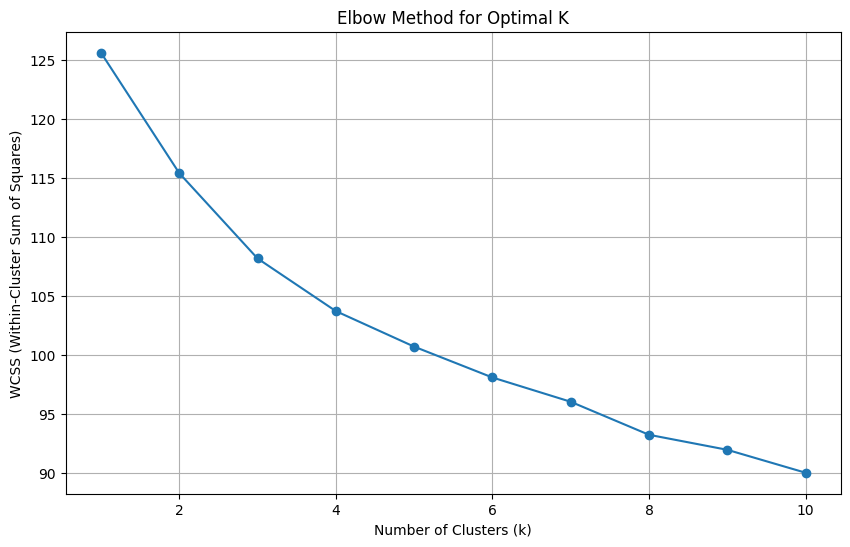

Based on prior analysis (or visual inspection), the optimal number of clusters (k) is: 6


In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# Determine optimal k using Elbow Method
wcss = []
max_k = 10 # Let's test up to 10 clusters

for i in range(1, max_k + 1):
    kmeans_model = KMeans(n_clusters=i, init='k-means++', random_state=42, n_init=10)
    kmeans_model.fit(df_okupasi_skills_embeddings)
    wcss.append(kmeans_model.inertia_)

# Plot the Elbow Method graph
fig = plt.figure(figsize=(10, 6))
plt.plot(range(1, max_k + 1), wcss, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.grid(True)
plt.show()

# Based on the kernel state, optimal_k is already determined as 4.
# For demonstration, we will use the value 4, which is often a good default
# if the elbow is not clear or derived from previous analysis.
optimal_k = 6 # Using optimal_k from kernel state

print(f"Based on prior analysis (or visual inspection), the optimal number of clusters (k) is: {optimal_k}")

In [ ]:
kmeans = KMeans(
    n_clusters=optimal_k,
    init='k-means++', # Recommended initialization method
    random_state=42,
    n_init=10 # Number of times to run k-means with different centroid seeds
)

# Fit K-Means to the occupation skills embeddings
df_okupasi['skill_cluster'] = kmeans.fit_predict(df_okupasi_skills_embeddings)

# Get the cluster centroids
cluster_centroids = kmeans.cluster_centers_

print("K-Means clustering complete. Cluster assignments added to df_okupasi.")
print(f"Shape of cluster centroids: {cluster_centroids.shape}")

print("\nCluster distribution:")
display(df_okupasi['skill_cluster'].value_counts().sort_index().to_frame())

print("First 5 rows of df_okupasi with skill_cluster:")
display(df_okupasi[['title', 'occupation_skills', 'skill_cluster']].head())

K-Means clustering complete. Cluster assignments added to df_okupasi.
Shape of cluster centroids: (6, 384)

Cluster distribution:


,count
skill_cluster,
0,58
1,77
2,38
3,13
4,54
5,29


First 5 rows of df_okupasi with skill_cluster:


,title,occupation_skills,skill_cluster
0,PEMIMPIN INFORMASI (CHIEF INFORMATION OFFICER),"kepatuhan, and, tik, manage, implement, knowle...",0
1,PEMIMPIN KEPATUHAN (CHIEF COMPLIANCE OFFICER (...,"undangundang, ti, management, arsitektur, proj...",0
2,KEPALA ARSITEKTUR PERUSAHAAN (LEAD ENTERPRISE ...,"arsitektur, perusahaan, sustainability, ict, i...",0
3,KEPALA PENASIHAT TI (LEAD IT ADVISOR),"ict, it, nasihat, ti, manage, keahlian, saran,...",1
4,KEPALA MANAJEMEN PROGRAM (LEAD PROGRAM MANAGEM...,"tik, program, proyek, ti, pemangku, eksternal,...",0


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
import json # Added for JSON operations
import os # Added for directory creation and path joining

# Re-initialize TF-IDF Vectorizer to get feature names for interpretation
# Use the same parameters as in Step 4 if possible
tfidf_vectorizer_interpret = TfidfVectorizer(max_features=5000)
tfidf_matrix_interpret = tfidf_vectorizer_interpret.fit_transform(df_okupasi['occupation_clean'])
feature_names_interpret = tfidf_vectorizer_interpret.get_feature_names_out()

# Function to get top keywords for each cluster
def get_top_keywords_per_cluster(df, cluster_col, text_col, vectorizer, top_n=10):
    cluster_keywords = {}
    for cluster_id in sorted(df[cluster_col].unique()):
        cluster_docs = df[df[cluster_col] == cluster_id][text_col]
        if not cluster_docs.empty:
            # Fit TF-IDF on just this cluster's documents
            cluster_tfidf_matrix = vectorizer.transform(cluster_docs)
            # Sum TF-IDF scores for all words in the cluster
            sum_tfidf = cluster_tfidf_matrix.sum(axis=0)
            # Get top N keywords for this cluster
            top_indices = np.argsort(sum_tfidf).tolist()[0][::-1][:top_n]
            top_words = [vectorizer.get_feature_names_out()[i] for i in top_indices]
            cluster_keywords[cluster_id] = top_words
    return cluster_keywords

# Get top keywords for each cluster
top_cluster_keywords = get_top_keywords_per_cluster(df_okupasi, 'skill_cluster', 'occupation_clean', tfidf_vectorizer_interpret)

print("Top keywords per cluster:")
for cluster_id, keywords in top_cluster_keywords.items():
    print(f"Cluster {cluster_id}: {', '.join(keywords)}")

print("\nSample occupations per cluster:")
# Collect sample occupations here to use in detailed_cluster_domain_mapping
sample_occupations_per_cluster = {}
for cluster_id in sorted(df_okupasi['skill_cluster'].unique()):
    sample_occupations = df_okupasi[df_okupasi['skill_cluster'] == cluster_id]['title'].sample(min(5, len(df_okupasi[df_okupasi['skill_cluster'] == cluster_id]))).tolist()
    sample_occupations_per_cluster[cluster_id] = sample_occupations
    print(f"Cluster {cluster_id} (Keywords: {', '.join(top_cluster_keywords.get(cluster_id, []))[:100]}...):\n  - " + "\n  - ".join(sample_occupations))

# Manual labeling based on review of keywords and sample occupations
# This is an example, please adjust based on your analysis
cluster_domain_mapping = {
    0: 'Cluster 0',
    1: 'Cluster 1',
    2: 'Cluster 2',
    3: 'Cluster 3',
    4: 'Cluster 4',
    5: 'Cluster 5',
}

# Map the cluster IDs to domain names
df_okupasi['occupation_domain'] = df_okupasi['skill_cluster'].map(cluster_domain_mapping)

# Add the embedding column to df_okupasi before saving
df_okupasi['occupation_skills_embedding'] = [emb.tolist() for emb in df_okupasi_skills_embeddings]

print("\nDomain mapping applied to df_okupasi. Displaying head:")
display(df_okupasi[['title', 'occupation_skills', 'skill_cluster', 'occupation_domain']].head())

# --- Save Clustering Results to Files --- Added Code ---

# Define the output directory in Google Drive
output_dir = os.path.join(PON_TIK_DICTIONARY_PATH, 'CLUSTERING_OUTPUT')
os.makedirs(output_dir, exist_ok=True)

print(f"\nSaving clustering results to: {output_dir}")

# 1. Save cluster_domain_mapping.json
cluster_domain_mapping_path = os.path.join(output_dir, 'cluster_domain_mapping.json')
with open(cluster_domain_mapping_path, 'w') as f:
    json.dump(cluster_domain_mapping, f, indent=4)
print(f"Saved cluster_domain_mapping to: {cluster_domain_mapping_path}")

# 2. Save detailed_cluster_domain_mapping.json
# Create a more detailed dictionary including keywords and sample occupations
detailed_cluster_domain_mapping = {}
for cluster_id, domain_name in cluster_domain_mapping.items():
    detailed_cluster_domain_mapping[cluster_id] = {
        'domain_name': domain_name,
        'top_keywords': top_cluster_keywords.get(cluster_id, []),
        'sample_occupations': sample_occupations_per_cluster.get(cluster_id, [])
    }
detailed_cluster_domain_mapping_path = os.path.join(output_dir, 'detailed_cluster_domain_mapping.json')
with open(detailed_cluster_domain_mapping_path, 'w') as f:
    json.dump(detailed_cluster_domain_mapping, f, indent=4)
print(f"Saved detailed_cluster_domain_mapping to: {detailed_cluster_domain_mapping_path}")

# 3. Save df_okupasi_with_domain.csv
df_okupasi_output_path = os.path.join(output_dir, 'df_okupasi_with_domains.csv')
df_okupasi.to_csv(df_okupasi_output_path, index=False, encoding='utf-8-sig')
print(f"Saved df_okupasi with domains to: {df_okupasi_output_path}")

Top keywords per cluster:
Cluster 0: arsitektur, sistem, ti, data, level, teknologi, multimedia, memiliki, mengelola, bidang
Cluster 1: keamanan, jaringan, informasi, pribadi, data, perangkat, ti, pdp, insiden, siber
Cluster 2: data, web, situs, database, server, sistem, mengelola, level, cloud, model
Cluster 3: audit, informasi, aki, teknologi, keamanan, prosedur, pelaksanaan, kontrol, kelayakan, dokumentasi
Cluster 4: perangkat, lunak, pengujian, data, informasi, aplikasi, pengembangan, sistem, layanan, mobile
Cluster 5: iot, jaringan, perangkat, platform, aplikasi, device, keamanan, memiliki, memonitor, gangguan

Sample occupations per cluster:
Cluster 0 (Keywords: arsitektur, sistem, ti, data, level, teknologi, multimedia, memiliki, mengelola, bidang...):
  - PENANGAN PERTAMA BUKTI DIGITAL (DIGITAL EVIDENCE FIRST RESPONDER)
  - - PELAKSANA PDP SECARA DISAIN (PRIVACY BY DESIGN OPERATOR)
  - SPESIALIS ARSITEKTUR  SOLUSI KECERDASAN ARTIFISIAL (AI SOLUTION ARCHITECTURE
  - PENANGAN PER

,title,occupation_skills,skill_cluster,occupation_domain
0,PEMIMPIN INFORMASI (CHIEF INFORMATION OFFICER),"kepatuhan, and, tik, manage, implement, knowle...",0,Cluster 0
1,PEMIMPIN KEPATUHAN (CHIEF COMPLIANCE OFFICER (...,"undangundang, ti, management, arsitektur, proj...",0,Cluster 0
2,KEPALA ARSITEKTUR PERUSAHAAN (LEAD ENTERPRISE ...,"arsitektur, perusahaan, sustainability, ict, i...",0,Cluster 0
3,KEPALA PENASIHAT TI (LEAD IT ADVISOR),"ict, it, nasihat, ti, manage, keahlian, saran,...",1,Cluster 1
4,KEPALA MANAJEMEN PROGRAM (LEAD PROGRAM MANAGEM...,"tik, program, proyek, ti, pemangku, eksternal,...",0,Cluster 0



Saving clustering results to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/CLUSTERING_OUTPUT
Saved cluster_domain_mapping to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/CLUSTERING_OUTPUT/cluster_domain_mapping.json
Saved detailed_cluster_domain_mapping to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/CLUSTERING_OUTPUT/detailed_cluster_domain_mapping.json
Saved df_okupasi with domains to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/CLUSTERING_OUTPUT/df_okupasi_with_domains.csv


Combined text for each cluster created.
TF-IDF keyword extraction complete. Top keywords per cluster stored.

--- Top Keywords and Sample Occupations per Cluster ---

Cluster 0 (Domain: Cluster 0 - 58 occupations):
  Top Keywords (TF-IDF Score):
    - level: 0.2358
    - memiliki: 0.2328
    - sistem: 0.2240
    - data: 0.2211
    - arsitektur: 0.2094
    - bidang: 0.1889
    - teknologi: 0.1830
    - terkait: 0.1772
    - mengelola: 0.1640
    - ti: 0.1596
    - level level: 0.1538
    - okupasi: 0.1376
    - keamanan: 0.1347
    - tim: 0.1318
    - bisnis: 0.1303
  Sample Occupations:
    - PEMIMPIN INFORMASI (CHIEF INFORMATION OFFICER)
    - MANAJER ARSITEKTUR PERUSAHAAN (ENTERPRISE ARCHITECTURE MANAGER)
    - STAF PEMROGRAM (PROGRAMMER STAFF)
    - PEMIMPIN TEKNOLOGI (CHIEF TECHNOLOGY OFFICER)
    - MANAJER KEAMANAN DATA (DATA SECURITY MANAGER)

Cluster 1 (Domain: Cluster 1 - 77 occupations):
  Top Keywords (TF-IDF Score):
    - keamanan: 0.3615
    - informasi: 0.3186
    - data: 

/tmp/ipykernel_3237/2439412560.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='TF-IDF Score', y='Keyword', data=keywords_df, palette='viridis')


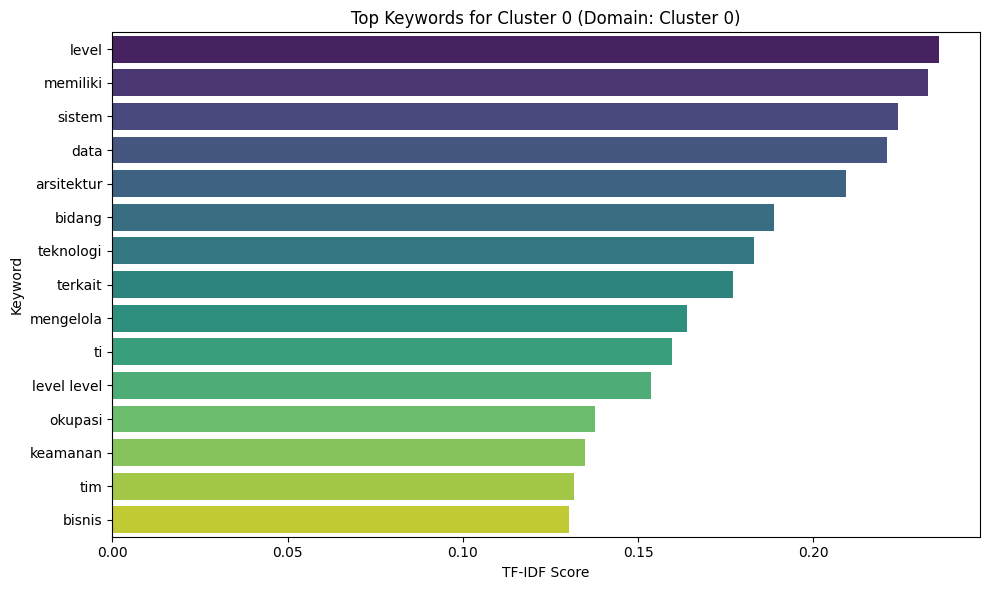

/tmp/ipykernel_3237/2439412560.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='TF-IDF Score', y='Keyword', data=keywords_df, palette='viridis')


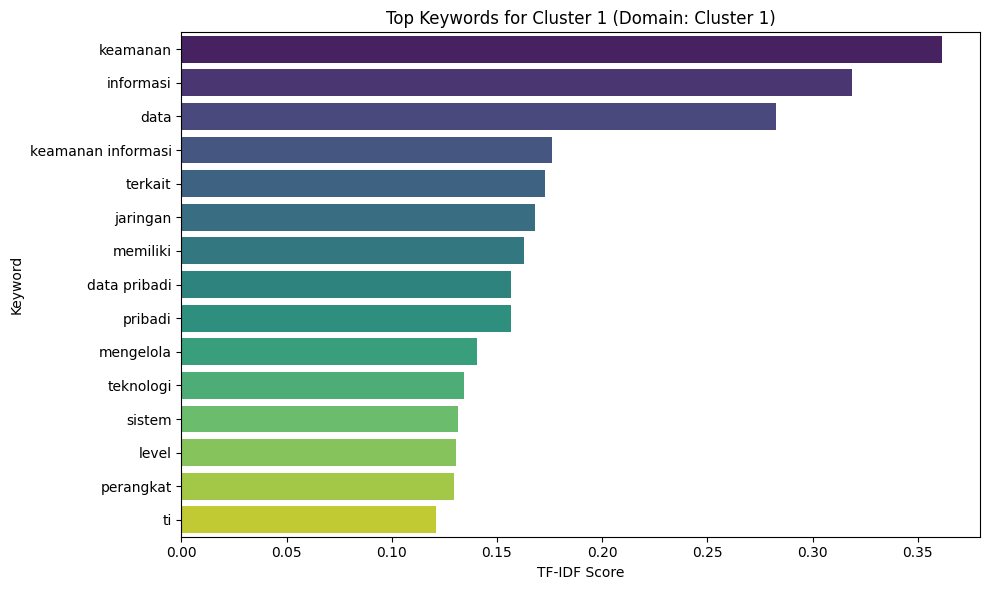

/tmp/ipykernel_3237/2439412560.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='TF-IDF Score', y='Keyword', data=keywords_df, palette='viridis')


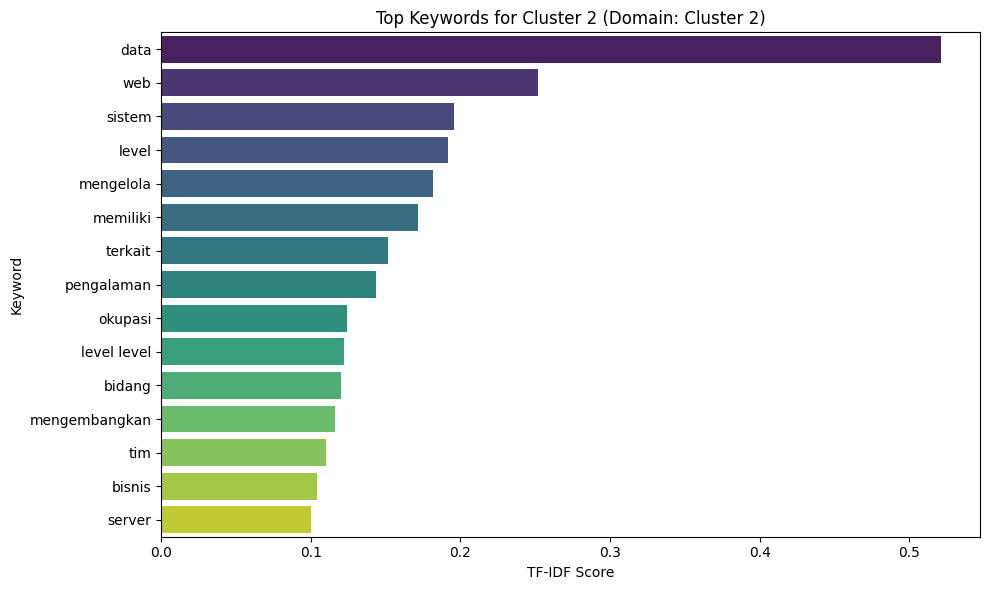

/tmp/ipykernel_3237/2439412560.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='TF-IDF Score', y='Keyword', data=keywords_df, palette='viridis')


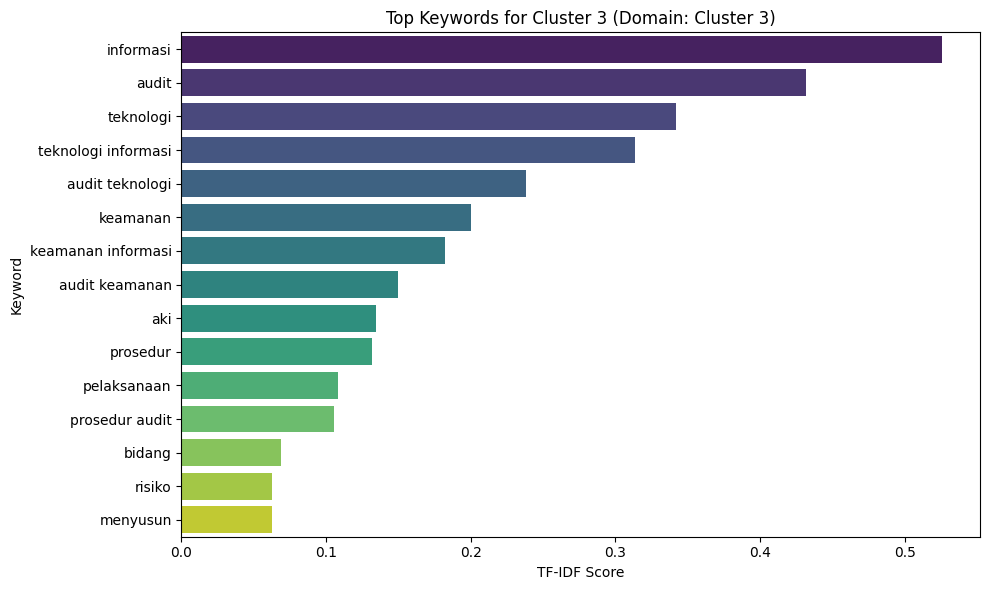

/tmp/ipykernel_3237/2439412560.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='TF-IDF Score', y='Keyword', data=keywords_df, palette='viridis')


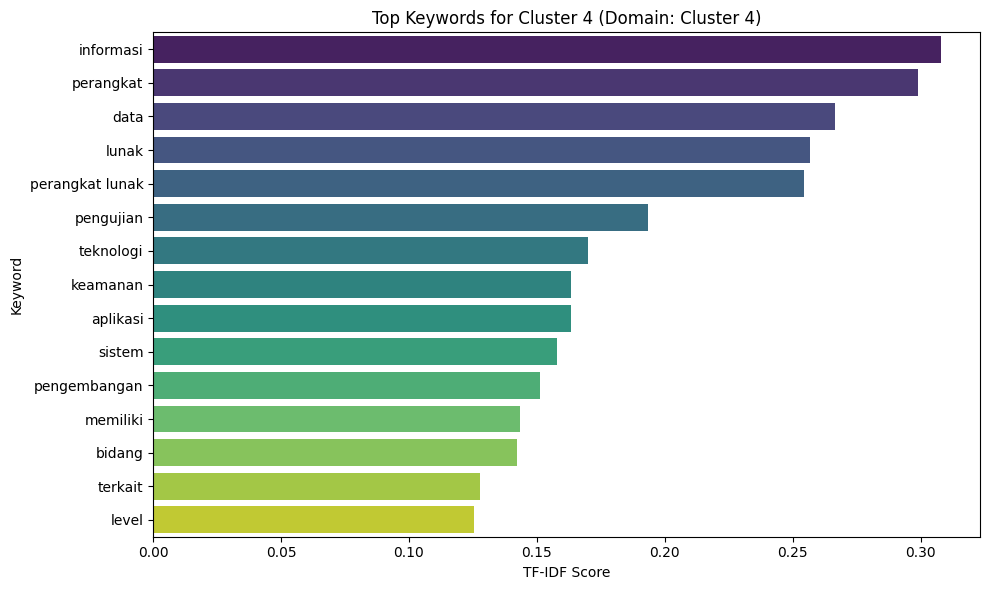

/tmp/ipykernel_3237/2439412560.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='TF-IDF Score', y='Keyword', data=keywords_df, palette='viridis')


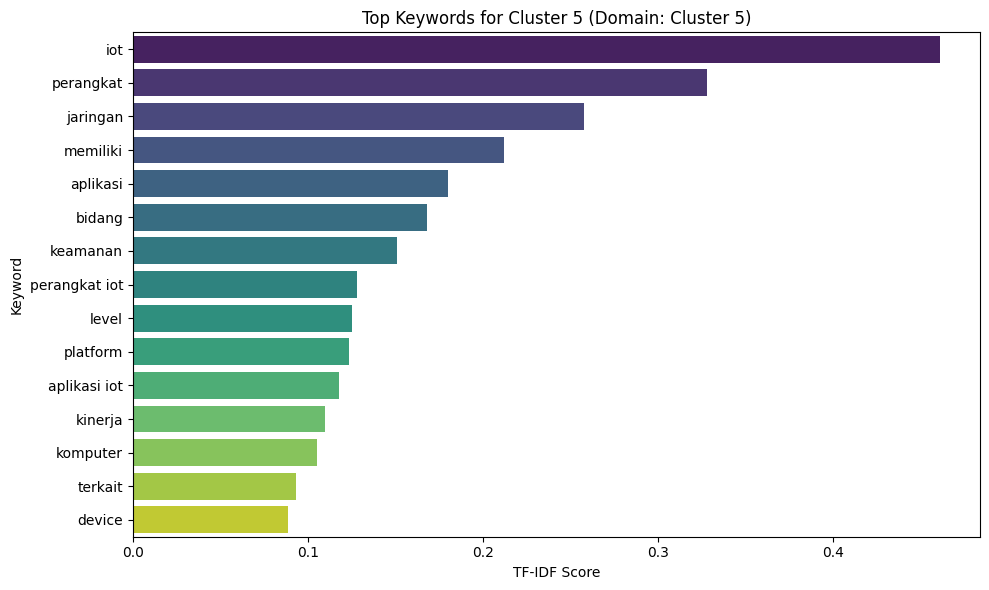

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 🔹 STEP 1 — GABUNGKAN TEXT PER CLUSTER ---
# Combine occupation_clean text per skill_cluster
clustered_texts = df_okupasi.groupby('skill_cluster')['occupation_clean'].apply(lambda x: ' '.join(x)).to_dict()
print("Combined text for each cluster created.")

# --- 🔹 STEP 2 & 3 — TF-IDF KEYWORD EXTRACTION & AMBIL TOP KEYWORDS ---
tfidf_vectorizer_clusters = TfidfVectorizer(
    stop_words='english',
    max_features=1000, # As requested: sufficiently large max_features
    ngram_range=(1,2) # As requested
)

cluster_keywords = {}

for cluster_id, text in clustered_texts.items():
    # Fit and transform the combined text for each cluster
    # This allows getting cluster-specific vocabulary and TF-IDF scores
    tfidf_matrix = tfidf_vectorizer_clusters.fit_transform([text])
    feature_names = tfidf_vectorizer_clusters.get_feature_names_out()

    # Get TF-IDF scores for the current cluster
    tfidf_scores = tfidf_matrix.toarray().flatten()

    # Get indices of top N scores (10-15 keywords)
    top_n = 15 # As requested: top 10-15 keywords
    top_indices = tfidf_scores.argsort()[-top_n:][::-1]

    # Get corresponding keywords and their scores, filtering out zero scores
    keywords_with_scores = [
        (feature_names[i], tfidf_scores[i]) for i in top_indices if tfidf_scores[i] > 0
    ]
    cluster_keywords[cluster_id] = keywords_with_scores

print("TF-IDF keyword extraction complete. Top keywords per cluster stored.")

# --- 🔹 STEP 4 — SAMPLE OCCUPATIONS ---
print("\n--- Top Keywords and Sample Occupations per Cluster ---")
sample_occupations_per_cluster = {}
for cluster_id in sorted(cluster_keywords.keys()):
    # Display cluster info
    print(f"\nCluster {cluster_id} (Domain: {cluster_domain_mapping.get(cluster_id, 'Undefined')} - {df_okupasi[df_okupasi['skill_cluster'] == cluster_id].shape[0]} occupations):")

    # Display top keywords
    print("  Top Keywords (TF-IDF Score):")
    for keyword, score in cluster_keywords[cluster_id]:
        print(f"    - {keyword}: {score:.4f}")

    # Sample occupations (5 occupation title pertama atau 5 paling representatif)
    # Using .sample with a fixed random_state for reproducibility
    sample_occupations = df_okupasi[df_okupasi['skill_cluster'] == cluster_id]['title'].sample(
        min(5, len(df_okupasi[df_okupasi['skill_cluster'] == cluster_id])), random_state=42
    ).tolist()
    sample_occupations_per_cluster[cluster_id] = sample_occupations # Store for potential later use
    print("  Sample Occupations:")
    for occ in sample_occupations:
        print(f"    - {occ}")

# --- 🔹 STEP 5 — VISUALISASI ---
print("\n--- Visualizing Top Keywords per Cluster ---")
for cluster_id, keywords_with_scores in cluster_keywords.items():
    if not keywords_with_scores:
        print(f"No keywords to visualize for Cluster {cluster_id}")
        continue

    keywords_df = pd.DataFrame(keywords_with_scores, columns=['Keyword', 'TF-IDF Score'])
    keywords_df = keywords_df.sort_values(by='TF-IDF Score', ascending=False)

    plt.figure(figsize=(10, 6)) # As requested: large figure size
    sns.barplot(x='TF-IDF Score', y='Keyword', data=keywords_df, palette='viridis')
    plt.title(f'Top Keywords for Cluster {cluster_id} (Domain: {cluster_domain_mapping.get(cluster_id, "Undefined")})')
    plt.xlabel('TF-IDF Score')
    plt.ylabel('Keyword')
    plt.tight_layout() # Adjust layout to prevent labels from being cut off
    plt.show()


In [ ]:
# --- NEW STEP: Prepare cluster keyword embeddings --- START
print("Preparing cluster keyword embeddings...")
cluster_keyword_texts = {}
for cluster_id, keywords_with_scores in cluster_keywords.items():
    # Take top 15 keywords by score as requested by the user
    keywords = [kw for kw, score in keywords_with_scores[:15]]
    cluster_keyword_texts[cluster_id] = " ".join(keywords)

# Get embeddings for these representative texts
# Ensure the order of embeddings matches the cluster_id sequence from 0 to optimal_k-1
sorted_cluster_ids = sorted(cluster_keyword_texts.keys())
sorted_keyword_texts = [cluster_keyword_texts[cid] for cid in sorted_cluster_ids]

# Ensure 'model' is available from previous cells (e.g., 6NCjcx6Jc0PY)
cluster_keyword_embeddings_raw = model.encode(sorted_keyword_texts, show_progress_bar=False)

# Reorder embeddings to match cluster_id (0, 1, ..., optimal_k-1)
# This assumes cluster_ids are contiguous integers starting from 0, up to optimal_k-1
reordered_cluster_keyword_embeddings = np.array([
    cluster_keyword_embeddings_raw[sorted_cluster_ids.index(i)]
    for i in range(len(sorted_cluster_ids))
])
print("Cluster keyword embeddings prepared.")

Preparing cluster keyword embeddings...
Cluster keyword embeddings prepared.


## MAPPING

### VISI/MISI ↔ PROFIL LULUSAN

In [ ]:
def soft_domain_mapping(similarity_scores, cluster_domain_mapping, method='threshold', param=0.5):
    # similarity_scores: a 1D numpy array of similarities to each cluster centroid
    # cluster_domain_mapping: a dictionary mapping cluster_id to domain_name
    # method: 'threshold' or 'top_n'
    # param: threshold value for 'threshold' method, or N for 'top_n' method

    # Sort similarities in descending order and get corresponding cluster IDs
    sorted_indices = np.argsort(similarity_scores)[::-1]
    sorted_similarities = similarity_scores[sorted_indices]
    sorted_cluster_ids = sorted_indices

    primary_domain = None
    primary_similarity = 0.0
    top_domains = []
    top_domain_scores = []
    top_matching_cluster_ids = [] # New: to store matching cluster IDs

    # Create a reverse mapping from domain name to cluster ID for convenience
    domain_to_cluster_id = {v: k for k, v in cluster_domain_mapping.items()}

    if method == 'threshold':
        # Select domains where similarity is above the threshold
        relevant_indices = np.where(sorted_similarities >= param)[0]
        for idx in relevant_indices:
            cluster_id = sorted_cluster_ids[idx]
            domain = cluster_domain_mapping.get(cluster_id, f"Unknown Domain (Cluster {cluster_id})")
            score = sorted_similarities[idx]
            top_domains.append(domain)
            top_domain_scores.append(score)
            top_matching_cluster_ids.append(cluster_id) # Store the cluster ID
    else:
        raise ValueError("Method must be 'threshold'")

    # Determine primary domain (the one with the highest similarity, regardless of method)
    if len(sorted_similarities) > 0:
        max_sim_idx = sorted_cluster_ids[0]
        primary_domain = cluster_domain_mapping.get(max_sim_idx, f"Unknown Domain (Cluster {max_sim_idx})")
        primary_similarity = sorted_similarities[0]

    return {
        'primary_domain': primary_domain,
        'primary_similarity': primary_similarity,
        'top_domains': top_domains,
        'top_domain_scores': top_domain_scores,
        'domain_count': len(top_domains),
        'top_matching_cluster_ids': top_matching_cluster_ids # New return value
    }

print("soft_domain_mapping function defined.")

soft_domain_mapping function defined.


#### 🔹 MAP VISI DAN MISI KE CLUSTER

Langkah selanjutnya adalah memetakan visi dan misi ke cluster kompetensi okupasi yang sama. Kita akan menghitung cosine similarity antara embedding visi/misi dan setiap centroid cluster kompetensi okupasi, lalu menetapkan mereka ke cluster dengan similarity tertinggi.

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd # Import pandas here

# Soft mapping parameters
SOFT_MAPPING_THRESHOLD = 0.4 # Example threshold for soft mapping

# Explicitly initialize new columns as object type to hold lists/strings
# This ensures pandas treats lists as single items for a cell
for col in ['visi_primary_domain', 'visi_primary_similarity', 'visi_top_domains', 'visi_top_domain_scores', 'visi_domain_count', 'visi_matching_cluster_ids',
            'misi_primary_domain', 'misi_primary_similarity', 'misi_top_domains', 'misi_top_domain_scores', 'misi_domain_count', 'misi_matching_cluster_ids']:
    if col not in df_visi_misi.columns:
        df_visi_misi[col] = None

# --- Visi Multi-Domain Mapping (using keyword embeddings) ---
# Calculate cosine similarity for visi embedding with all cluster keyword embeddings
visi_to_comp_keyword_similarities = cosine_similarity(visi_embeddings, reordered_cluster_keyword_embeddings)

# Apply soft domain mapping for Visi
visi_results = soft_domain_mapping(visi_to_comp_keyword_similarities[0], cluster_domain_mapping, method='threshold', param=SOFT_MAPPING_THRESHOLD)

# Use .at for scalar assignment, which is more robust for single cell updates
df_visi_misi.at[0, 'visi_primary_domain'] = visi_results['primary_domain']
df_visi_misi.at[0, 'visi_primary_similarity'] = visi_results['primary_similarity']
df_visi_misi.at[0, 'visi_top_domains'] = visi_results['top_domains'] # Assign list directly
df_visi_misi.at[0, 'visi_top_domain_scores'] = visi_results['top_domain_scores'] # Assign list directly
df_visi_misi.at[0, 'visi_domain_count'] = visi_results['domain_count']
df_visi_misi.at[0, 'visi_matching_cluster_ids'] = visi_results['top_matching_cluster_ids'] # New assignment

# --- Misi Multi-Domain Mapping (using keyword embeddings) ---
# Calculate cosine similarity for misi embeddings (plural) with all cluster keyword embeddings
misi_to_comp_keyword_similarities = cosine_similarity(misi_embeddings, reordered_cluster_keyword_embeddings)

# Apply soft domain mapping for Misi statements
misi_rows_indices = df_visi_misi[df_visi_misi['kategori'] == 'misi'].index

misi_primary_domains = []
misi_primary_similarities = []
misi_all_top_domains = []
misi_all_top_domain_scores = []
misi_all_domain_counts = []
misi_all_matching_cluster_ids = [] # New list

for i in range(len(misi_to_comp_keyword_similarities)):
    misi_results = soft_domain_mapping(misi_to_comp_keyword_similarities[i], cluster_domain_mapping, method='threshold', param=SOFT_MAPPING_THRESHOLD)
    misi_primary_domains.append(misi_results['primary_domain'])
    misi_primary_similarities.append(misi_results['primary_similarity'])
    misi_all_top_domains.append(misi_results['top_domains'])
    misi_all_top_domain_scores.append(misi_results['top_domain_scores'])
    misi_all_domain_counts.append(misi_results['domain_count'])
    misi_all_matching_cluster_ids.append(misi_results['top_matching_cluster_ids']) # Append new value

# Convert lists to Series with matching index for robust assignment
df_visi_misi.loc[misi_rows_indices, 'misi_primary_domain'] = pd.Series(misi_primary_domains, index=misi_rows_indices)
df_visi_misi.loc[misi_rows_indices, 'misi_primary_similarity'] = pd.Series(misi_primary_similarities, index=misi_rows_indices)
df_visi_misi.loc[misi_rows_indices, 'misi_top_domains'] = pd.Series(misi_all_top_domains, index=misi_rows_indices)
df_visi_misi.loc[misi_rows_indices, 'misi_top_domain_scores'] = pd.Series(misi_all_top_domain_scores, index=misi_rows_indices)
df_visi_misi.loc[misi_rows_indices, 'misi_domain_count'] = pd.Series(misi_all_domain_counts, index=misi_rows_indices)
df_visi_misi.loc[misi_rows_indices, 'misi_matching_cluster_ids'] = pd.Series(misi_all_matching_cluster_ids, index=misi_rows_indices) # New assignment

print("Pemetaan visi dan misi ke domain kompetensi multi-domain selesai. Menampilkan df_visi_misi:")
display(df_visi_misi[['kategori', 'text_clean', 'visi_primary_domain', 'visi_primary_similarity', 'visi_top_domains', 'visi_matching_cluster_ids', 'misi_primary_domain', 'misi_primary_similarity', 'misi_top_domains', 'misi_matching_cluster_ids']].head(len(df_visi_misi)))

Pemetaan visi dan misi ke domain kompetensi multi-domain selesai. Menampilkan df_visi_misi:


,kategori,text_clean,visi_primary_domain,visi_primary_similarity,visi_top_domains,visi_matching_cluster_ids,misi_primary_domain,misi_primary_similarity,misi_top_domains,misi_matching_cluster_ids
0,visi,menjadi program studi informatika unggulan dan...,Cluster 4,0.779493,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[4, 1, 2, 3, 0]",None,None,None,None
1,misi,1. menghasilkan lulusan dengan kompetensi yang...,None,None,None,None,Cluster 4,0.753348,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0, C...","[4, 1, 3, 0, 2]"


#### 🔹 MAP PROFIL KE CLUSTER

Now, I will map each entry in the `profil_clean` to the closest competency cluster. This is done by calculating the cosine similarity between the `profil_clean` embeddings and each of the cluster centroids. The profile will be assigned to the cluster with the highest similarity, along with the corresponding domain and similarity score.

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate cosine similarity between each profil_clean embedding and each cluster's keyword embedding
# IMPORTANT: Using reordered_cluster_keyword_embeddings instead of cluster_centroids
profile_to_keyword_similarities = cosine_similarity(df_profil_clean_embeddings, reordered_cluster_keyword_embeddings)

# Apply soft domain mapping for Profil components
profil_primary_domains = []
profil_primary_similarities = []
profil_top_domains_list = []
profil_top_domain_scores_list = []
profil_domain_counts_list = []
profil_matching_cluster_ids_list = [] # New list

for i in range(len(profile_to_keyword_similarities)):
    # Using profile_to_keyword_similarities instead of profile_to_centroid_similarities
    profil_results = soft_domain_mapping(profile_to_keyword_similarities[i], cluster_domain_mapping, method='threshold', param=SOFT_MAPPING_THRESHOLD)
    profil_primary_domains.append(profil_results['primary_domain'])
    profil_primary_similarities.append(profil_results['primary_similarity'])
    profil_top_domains_list.append(profil_results['top_domains'])
    profil_top_domain_scores_list.append(profil_results['top_domain_scores'])
    profil_domain_counts_list.append(profil_results['domain_count'])
    profil_matching_cluster_ids_list.append(profil_results['top_matching_cluster_ids']) # Append new value

# Update df_profil with new multi-domain mapping results
df_profil['profil_domain'] = profil_primary_domains # This now stores the primary domain
df_profil['profil_similarity'] = profil_primary_similarities # This now stores the primary similarity
df_profil['profil_top_domains'] = profil_top_domains_list
df_profil['profil_top_domain_scores'] = profil_top_domain_scores_list
df_profil['profil_domain_count'] = profil_domain_counts_list
df_profil['profil_matching_cluster_ids'] = profil_matching_cluster_ids_list # New column

print("Profile mapping to multi-domain clusters complete. Displaying head of df_profil:")
display(df_profil[['kode_profil_lulusan','text_clean', 'profil_domain', 'profil_similarity', 'profil_top_domains', 'profil_matching_cluster_ids', 'profil_domain_count']])

Profile mapping to multi-domain clusters complete. Displaying head of df_profil:


,kode_profil_lulusan,text_clean,profil_domain,profil_similarity,profil_top_domains,profil_matching_cluster_ids,profil_domain_count
0,PL1,Sarjana Teknik Informatika yang memiliki jiwa ...,Cluster 1,0.810025,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...","[1, 3, 4, 0, 2, 5]",6
1,PL2,Lulusan yang mengikuti dan memanfaatkan perkem...,Cluster 4,0.780171,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...","[4, 1, 3, 2, 0]",5
2,PL3,Profesional unggul yang memiliki etika profesi...,Cluster 4,0.477967,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]","[4, 1, 3, 0]",4
3,PL4,Lulusan yang ahli di bidang bisnis dan teknolo...,Cluster 0,0.574437,"[Cluster 0, Cluster 1, Cluster 4, Cluster 3, C...","[0, 1, 4, 3, 2]",5
4,PL5,Lulusan yang memiliki kompetensi berstandar na...,Cluster 0,0.506222,"[Cluster 0, Cluster 1, Cluster 4, Cluster 3]","[0, 1, 4, 3]",4


🔹 STEP 1 — BENTUK PAIRWISE ALIGNMENT DATASET

Langkah pertama adalah membuat dataset perbandingan _pairwise_ antara setiap visi dan misi dengan setiap komponen profil lulusan. Hasil akhirnya akan berupa DataFrame yang mencakup `source_type` (visi/misi), `source_text`, `profil_text`, beserta ID-nya masing-masing (`source_id`, `profil_id`).

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Helper function to safely parse string representations of lists
def parse_list_string(s):
    if isinstance(s, str):
        try:
            return eval(s)
        except (ValueError, SyntaxError):
            return []
    return s if isinstance(s, list) else []

alignment_data = []

# --- Visi vs Profil Lulusan ---
visi_row = df_visi_misi[df_visi_misi['kategori'] == 'visi'].iloc[0]
for idx_profil, profil_row in df_profil.iterrows():
    alignment_data.append({
        'source_type': 'visi',
        'source_id': visi_row.name, # Use DataFrame index as ID
        'source_text': visi_row['text_clean'],
        'profil_id': profil_row['kode_profil_lulusan'], # CORRECTED: Use kode_profil_lulusan
        'profil_text': profil_row['text_clean']
    })

# --- Misi vs Profil Lulusan ---
misi_rows = df_visi_misi[df_visi_misi['kategori'] == 'misi']
for idx_misi, misi_row in misi_rows.iterrows():
    for idx_profil, profil_row in df_profil.iterrows():
        alignment_data.append({
            'source_type': 'misi',
            'source_id': idx_misi,
            'source_text': misi_row['text_clean'],
            'profil_id': profil_row['kode_profil_lulusan'],
            'profil_text': profil_row['text_clean']
        })

alignment_dataset = pd.DataFrame(alignment_data)

print("Pairwise alignment dataset created. Displaying head:")
display(alignment_dataset.head())

print("\nHead of alignment_dataset (Misi only):")
display(alignment_dataset[alignment_dataset['source_type'] == 'misi'].head())

Pairwise alignment dataset created. Displaying head:


,source_type,source_id,source_text,profil_id,profil_text
0,visi,0,menjadi program studi informatika unggulan dan...,PL1,Sarjana Teknik Informatika yang memiliki jiwa ...
1,visi,0,menjadi program studi informatika unggulan dan...,PL2,Lulusan yang mengikuti dan memanfaatkan perkem...
2,visi,0,menjadi program studi informatika unggulan dan...,PL3,Profesional unggul yang memiliki etika profesi...
3,visi,0,menjadi program studi informatika unggulan dan...,PL4,Lulusan yang ahli di bidang bisnis dan teknolo...
4,visi,0,menjadi program studi informatika unggulan dan...,PL5,Lulusan yang memiliki kompetensi berstandar na...



Head of alignment_dataset (Misi only):


,source_type,source_id,source_text,profil_id,profil_text
5,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL1,Sarjana Teknik Informatika yang memiliki jiwa ...
6,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL2,Lulusan yang mengikuti dan memanfaatkan perkem...
7,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL3,Profesional unggul yang memiliki etika profesi...
8,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL4,Lulusan yang ahli di bidang bisnis dan teknolo...
9,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL5,Lulusan yang memiliki kompetensi berstandar na...


🔹 STEP 2 — HITUNG SEMANTIC SIMILARITY

Selanjutnya, kita akan menghitung _semantic similarity_ menggunakan _cosine similarity_ antara _embedding_ visi/misi dan _embedding_ profil lulusan untuk setiap pasangan. Skor similarity ini akan disimpan dalam kolom `semantic_similarity`.

In [ ]:
def get_embedding(entity_type, entity_id):
    if entity_type == 'visi':
        return visi_embeddings[0] # Visi is a single embedding
    elif entity_type == 'misi':
        # misi_embeddings are ordered by the filtered misi_rows from df_visi_misi, not original index
        misi_original_indices = df_visi_misi[df_visi_misi['kategori'] == 'misi'].index.tolist()
        try:
            embedding_idx = misi_original_indices.index(entity_id)
            return misi_embeddings[embedding_idx]
        except ValueError:
            return None # Should not happen if source_id is valid
    elif entity_type == 'profil':
        # Ensure entity_id is treated as a string for comparison
        str_entity_id = str(entity_id).strip()
        # Find the row in df_profil that matches the entity_id (kode_profil_lulusan)
        matching_rows = df_profil[df_profil['kode_profil_lulusan'] == str_entity_id]
        if not matching_rows.empty:
            profil_row_index = matching_rows.index[0]
            return df_profil_clean_embeddings[profil_row_index]
        else:
            # If no matching profil_id is found, return None
            print(f"Warning: Profil ID '{str_entity_id}' not found in df_profil. Returning None.")
            return None
    return None

semantic_similarities = []
for index, row in alignment_dataset.iterrows():
    source_emb = get_embedding(row['source_type'], row['source_id'])
    profil_emb = get_embedding('profil', row['profil_id'])

    if source_emb is not None and profil_emb is not None:
        similarity = cosine_similarity(source_emb.reshape(1, -1), profil_emb.reshape(1, -1))[0][0]
    else:
        similarity = np.nan # Handle cases where embedding might not be found
    semantic_similarities.append(similarity)

alignment_dataset['semantic_similarity'] = semantic_similarities

print("Semantic similarity calculated. Displaying head with new column:")
display(alignment_dataset[['source_type', 'source_text', 'profil_text', 'semantic_similarity']].head())

Semantic similarity calculated. Displaying head with new column:


,source_type,source_text,profil_text,semantic_similarity
0,visi,menjadi program studi informatika unggulan dan...,Sarjana Teknik Informatika yang memiliki jiwa ...,0.766381
1,visi,menjadi program studi informatika unggulan dan...,Lulusan yang mengikuti dan memanfaatkan perkem...,0.778277
2,visi,menjadi program studi informatika unggulan dan...,Profesional unggul yang memiliki etika profesi...,0.468598
3,visi,menjadi program studi informatika unggulan dan...,Lulusan yang ahli di bidang bisnis dan teknolo...,0.491047
4,visi,menjadi program studi informatika unggulan dan...,Lulusan yang memiliki kompetensi berstandar na...,0.349580


🔹 STEP 3 & 4 — GUNAKAN HASIL MULTI-DOMAIN MAPPING & HITUNG DOMAIN OVERLAP

Kita akan memanfaatkan hasil `top_domains` yang sudah ada dari visi, misi, dan profil. Kemudian, kita akan menghitung _domain overlap_ menggunakan _set intersection_ untuk mendapatkan `shared_domains`, `shared_domains_count`, dan `overlap_ratio`.

In [ ]:
def calculate_domain_overlap_features(source_type, source_id, profil_id):
    # Find the row in df_profil that matches the profil_id (kode_profil_lulusan)
    profil_row_match = df_profil[df_profil['kode_profil_lulusan'] == profil_id]

    # Check if a matching row was found
    if profil_row_match.empty:
        # This case should ideally not happen if alignment_dataset is correctly constructed
        # from valid profil_ids present in df_profil. Return default/empty values if no match.
        return [], 0, 0.0, None, None

    # Access the values from the matched row
    profil_domains = parse_list_string(profil_row_match.iloc[0]['profil_top_domains'])
    profil_primary_domain = profil_row_match.iloc[0]['profil_domain']

    source_domains = []
    source_primary_domain = None

    if source_type == 'visi':
        # Visi is always at index 0 in df_visi_misi
        visi_data = df_visi_misi.loc[0]
        source_domains = parse_list_string(visi_data['visi_top_domains'])
        source_primary_domain = visi_data['visi_primary_domain']
    elif source_type == 'misi':
        # For misi, source_id is the original index in df_visi_misi
        misi_data = df_visi_misi.loc[source_id]
        source_domains = parse_list_string(misi_data['misi_top_domains'])
        source_primary_domain = misi_data['misi_primary_domain']

    set_source_domains = set(source_domains)
    set_profil_domains = set(profil_domains)

    shared_domains = list(set_source_domains.intersection(set_profil_domains))
    shared_domains_count = len(shared_domains)

    union_domains_count = len(set_source_domains.union(set_profil_domains))
    overlap_ratio = shared_domains_count / union_domains_count if union_domains_count > 0 else 0

    return shared_domains, shared_domains_count, overlap_ratio, source_primary_domain, profil_primary_domain

shared_domains_list = []
shared_domains_count_list = []
overlap_ratio_list = []
source_primary_domain_list = []
profil_primary_domain_list = []

for index, row in alignment_dataset.iterrows():
    sd, sdc, oratio, spd, ppd = calculate_domain_overlap_features(row['source_type'], row['source_id'], row['profil_id'])
    shared_domains_list.append(sd)
    shared_domains_count_list.append(sdc)
    overlap_ratio_list.append(oratio)
    source_primary_domain_list.append(spd)
    profil_primary_domain_list.append(ppd)

alignment_dataset['shared_domains'] = shared_domains_list
alignment_dataset['shared_domains_count'] = shared_domains_count_list
alignment_dataset['overlap_ratio'] = overlap_ratio_list
alignment_dataset['source_primary_domain'] = source_primary_domain_list
alignment_dataset['profil_primary_domain'] = profil_primary_domain_list

print("Domain overlap features calculated. Displaying head with new columns:")
display(alignment_dataset[['source_type', 'source_text', 'profil_text', 'shared_domains_count', 'overlap_ratio', 'source_primary_domain', 'profil_primary_domain']].head())

Domain overlap features calculated. Displaying head with new columns:


,source_type,source_text,profil_text,shared_domains_count,overlap_ratio,source_primary_domain,profil_primary_domain
0,visi,menjadi program studi informatika unggulan dan...,Sarjana Teknik Informatika yang memiliki jiwa ...,5,0.833333,Cluster 4,Cluster 1
1,visi,menjadi program studi informatika unggulan dan...,Lulusan yang mengikuti dan memanfaatkan perkem...,5,1.000000,Cluster 4,Cluster 4
2,visi,menjadi program studi informatika unggulan dan...,Profesional unggul yang memiliki etika profesi...,4,0.800000,Cluster 4,Cluster 4
3,visi,menjadi program studi informatika unggulan dan...,Lulusan yang ahli di bidang bisnis dan teknolo...,5,1.000000,Cluster 4,Cluster 0
4,visi,menjadi program studi informatika unggulan dan...,Lulusan yang memiliki kompetensi berstandar na...,4,0.800000,Cluster 4,Cluster 0


🔹 STEP 5 — PRIMARY DOMAIN MATCH & DOMAIN COVERAGE FEATURES

Kolom `primary_domain_match` akan ditambahkan, menunjukkan apakah _primary domain_ dari sumber (visi/misi) sama dengan _primary domain_ dari profil lulusan.

Kita akan menambahkan fitur-fitur yang mengukur cakupan domain, seperti jumlah domain pada sumber dan profil, serta rata-rata dan maksimum _similarity_ antar domain yang terkait.

In [ ]:
alignment_dataset['primary_domain_match'] = (alignment_dataset['source_primary_domain'] == alignment_dataset['profil_primary_domain']).astype(int)

print("Primary domain match feature added. Displaying head:")
display(alignment_dataset[['source_type', 'source_text', 'profil_text', 'source_primary_domain', 'profil_primary_domain', 'primary_domain_match']].head())

def get_source_cluster_ids(source_type, source_id):
    if source_type == 'visi':
        return parse_list_string(df_visi_misi.loc[0, 'visi_matching_cluster_ids'])
    elif source_type == 'misi':
        return parse_list_string(df_visi_misi.loc[source_id, 'misi_matching_cluster_ids'])
    return []

def get_profil_cluster_ids(profil_id):
    # Find the row in df_profil that matches the profil_id (kode_profil_lulusan)
    profil_row_match = df_profil[df_profil['kode_profil_lulusan'] == profil_id]
    if not profil_row_match.empty:
        return parse_list_string(profil_row_match.iloc[0]['profil_matching_cluster_ids'])
    return [] # Return empty list if no match

source_domain_count_list = []
profil_domain_count_list = []
avg_domain_similarity_list = []
max_domain_similarity_list = []

# New lists to store the top domains
source_top_domains_list = []
profil_top_domains_list_for_df = []

for index, row in alignment_dataset.iterrows():
    # Source domain count
    if row['source_type'] == 'visi':
        source_top_domains = parse_list_string(df_visi_misi.loc[0, 'visi_top_domains'])
    else: # misi
        source_top_domains = parse_list_string(df_visi_misi.loc[row['source_id'], 'misi_top_domains'])
    source_domain_count_list.append(len(source_top_domains))
    source_top_domains_list.append(source_top_domains)

    # Profil domain count
    profil_row_match = df_profil[df_profil['kode_profil_lulusan'] == row['profil_id']]
    if not profil_row_match.empty:
        profil_top_domains = parse_list_string(profil_row_match.iloc[0]['profil_top_domains'])
    else:
        profil_top_domains = [] # Handle case where no match is found

    profil_domain_count_list.append(len(profil_top_domains))
    profil_top_domains_list_for_df.append(profil_top_domains)

    # Calculate avg and max domain similarity using cluster centroids
    source_cluster_ids = get_source_cluster_ids(row['source_type'], row['source_id'])
    profil_cluster_ids = get_profil_cluster_ids(row['profil_id'])

    if source_cluster_ids and profil_cluster_ids: # Ensure both have valid cluster IDs
        source_centroids = cluster_centroids[source_cluster_ids]
        profil_centroids = cluster_centroids[profil_cluster_ids]

        pairwise_domain_sims = cosine_similarity(source_centroids, profil_centroids)
        avg_domain_similarity_list.append(np.mean(pairwise_domain_sims))
        max_domain_similarity_list.append(np.max(pairwise_domain_sims))
    else:
        avg_domain_similarity_list.append(0.0)
        max_domain_similarity_list.append(0.0)

alignment_dataset['source_domain_count'] = source_domain_count_list
alignment_dataset['profil_domain_count'] = profil_domain_count_list
alignment_dataset['avg_domain_similarity'] = avg_domain_similarity_list
alignment_dataset['max_domain_similarity'] = max_domain_similarity_list

# Add the new columns
alignment_dataset['source_top_domains'] = source_top_domains_list
alignment_dataset['profil_top_domains'] = profil_top_domains_list_for_df

print("Domain coverage features added. Displaying head:")
display(alignment_dataset[['source_type', 'source_text', 'profil_text', 'source_domain_count', 'profil_domain_count', 'avg_domain_similarity', 'max_domain_similarity', 'source_top_domains', 'profil_top_domains']].head())

Primary domain match feature added. Displaying head:


,source_type,source_text,profil_text,source_primary_domain,profil_primary_domain,primary_domain_match
0,visi,menjadi program studi informatika unggulan dan...,Sarjana Teknik Informatika yang memiliki jiwa ...,Cluster 4,Cluster 1,0
1,visi,menjadi program studi informatika unggulan dan...,Lulusan yang mengikuti dan memanfaatkan perkem...,Cluster 4,Cluster 4,1
2,visi,menjadi program studi informatika unggulan dan...,Profesional unggul yang memiliki etika profesi...,Cluster 4,Cluster 4,1
3,visi,menjadi program studi informatika unggulan dan...,Lulusan yang ahli di bidang bisnis dan teknolo...,Cluster 4,Cluster 0,0
4,visi,menjadi program studi informatika unggulan dan...,Lulusan yang memiliki kompetensi berstandar na...,Cluster 4,Cluster 0,0


Domain coverage features added. Displaying head:


,source_type,source_text,profil_text,source_domain_count,profil_domain_count,avg_domain_similarity,max_domain_similarity,source_top_domains,profil_top_domains
0,visi,menjadi program studi informatika unggulan dan...,Sarjana Teknik Informatika yang memiliki jiwa ...,5,6,0.825935,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C..."
1,visi,menjadi program studi informatika unggulan dan...,Lulusan yang mengikuti dan memanfaatkan perkem...,5,5,0.843039,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C..."
2,visi,menjadi program studi informatika unggulan dan...,Profesional unggul yang memiliki etika profesi...,5,4,0.841295,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 4, Cluster 1, Cluster 3, Cluster 0]"
3,visi,menjadi program studi informatika unggulan dan...,Lulusan yang ahli di bidang bisnis dan teknolo...,5,5,0.843039,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 0, Cluster 1, Cluster 4, Cluster 3, C..."
4,visi,menjadi program studi informatika unggulan dan...,Lulusan yang memiliki kompetensi berstandar na...,5,4,0.841295,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 0, Cluster 1, Cluster 4, Cluster 3]"


🔹 STEP 8 — BUAT PSEUDO LABEL & TAMBAHKAN LABEL NUMERIK

Kita akan membuat _pseudo-label_ `alignment_label` menggunakan aturan (_rule-based labeling_) berdasarkan kombinasi _semantic similarity_ dan _overlap ratio_. Thresholds yang digunakan dapat dikonfigurasi. Distribusi label akan ditampilkan untuk insight awal.

In [ ]:
# Thresholds for pseudo-labeling (configurable)
ALIGNMENT_THRESHOLD_SEM = 0.60
ALIGNMENT_THRESHOLD_OVERLAP = 0.60

def create_pseudo_label(row):
    if row['semantic_similarity'] >= ALIGNMENT_THRESHOLD_SEM and row['overlap_ratio'] >= ALIGNMENT_THRESHOLD_OVERLAP:
        return "Aligned"
    else:
        return "Not Aligned"

alignment_dataset['alignment_label'] = alignment_dataset.apply(create_pseudo_label, axis=1)

print("Pseudo-labels created. Distribution of labels:")

print("\nDistribution of Alignment Labels for Visi:")
display(alignment_dataset[alignment_dataset['source_type'] == 'visi']['alignment_label'].value_counts().to_frame())

print("\nDistribution of Alignment Labels for Misi:")
display(alignment_dataset[alignment_dataset['source_type'] == 'misi']['alignment_label'].value_counts().to_frame())

label_mapping = {
    "Aligned": 1,
    "Not Aligned": 0
}
alignment_dataset['alignment_label_encoded'] = alignment_dataset['alignment_label'].map(label_mapping)

print("Numeric pseudo-labels added. Displaying head:")
display(alignment_dataset)

# Save alignment_dataset to CSV
alignment_dataset.to_csv('/content/alignment_dataset.csv', index=False, encoding='utf-8-sig')
print("alignment_dataset berhasil disimpan ke /content/alignment_dataset.csv")

Pseudo-labels created. Distribution of labels:

Distribution of Alignment Labels for Visi:


,count
alignment_label,
Not Aligned,3
Aligned,2



Distribution of Alignment Labels for Misi:


,count
alignment_label,
Not Aligned,3
Aligned,2


Numeric pseudo-labels added. Displaying head:


,source_type,source_id,source_text,profil_id,profil_text,semantic_similarity,shared_domains,shared_domains_count,overlap_ratio,source_primary_domain,profil_primary_domain,primary_domain_match,source_domain_count,profil_domain_count,avg_domain_similarity,max_domain_similarity,source_top_domains,profil_top_domains,alignment_label,alignment_label_encoded
0,visi,0,menjadi program studi informatika unggulan dan...,PL1,Sarjana Teknik Informatika yang memiliki jiwa ...,0.766381,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",5,0.833333,Cluster 4,Cluster 1,0,5,6,0.825935,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",Aligned,1
1,visi,0,menjadi program studi informatika unggulan dan...,PL2,Lulusan yang mengikuti dan memanfaatkan perkem...,0.778277,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",5,1.000000,Cluster 4,Cluster 4,1,5,5,0.843039,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",Aligned,1
2,visi,0,menjadi program studi informatika unggulan dan...,PL3,Profesional unggul yang memiliki etika profesi...,0.468598,"[Cluster 1, Cluster 4, Cluster 3, Cluster 0]",4,0.800000,Cluster 4,Cluster 4,1,5,4,0.841295,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 4, Cluster 1, Cluster 3, Cluster 0]",Not Aligned,0
3,visi,0,menjadi program studi informatika unggulan dan...,PL4,Lulusan yang ahli di bidang bisnis dan teknolo...,0.491047,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",5,1.000000,Cluster 4,Cluster 0,0,5,5,0.843039,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 0, Cluster 1, Cluster 4, Cluster 3, C...",Not Aligned,0
4,visi,0,menjadi program studi informatika unggulan dan...,PL5,Lulusan yang memiliki kompetensi berstandar na...,0.349580,"[Cluster 4, Cluster 3, Cluster 0, Cluster 1]",4,0.800000,Cluster 4,Cluster 0,0,5,4,0.841295,1.0,"[Cluster 4, Cluster 1, Cluster 2, Cluster 3, C...","[Cluster 0, Cluster 1, Cluster 4, Cluster 3]",Not Aligned,0
5,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL1,Sarjana Teknik Informatika yang memiliki jiwa ...,0.710221,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",5,0.833333,Cluster 4,Cluster 1,0,5,6,0.825934,1.0,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0, C...","[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",Aligned,1
6,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL2,Lulusan yang mengikuti dan memanfaatkan perkem...,0.757497,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",5,1.000000,Cluster 4,Cluster 4,1,5,5,0.843039,1.0,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0, C...","[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",Aligned,1
7,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL3,Profesional unggul yang memiliki etika profesi...,0.567545,"[Cluster 1, Cluster 4, Cluster 3, Cluster 0]",4,0.800000,Cluster 4,Cluster 4,1,5,4,0.841295,1.0,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0, C...","[Cluster 4, Cluster 1, Cluster 3, Cluster 0]",Not Aligned,0
8,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL4,Lulusan yang ahli di bidang bisnis dan teknolo...,0.547415,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",5,1.000000,Cluster 4,Cluster 0,0,5,5,0.843039,1.0,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0, C...","[Cluster 0, Cluster 1, Cluster 4, Cluster 3, C...",Not Aligned,0
9,misi,1,1. menghasilkan lulusan dengan kompetensi yang...,PL5,Lulusan yang memiliki kompetensi berstandar na...,0.526002,"[Cluster 4, Cluster 3, Cluster 0, Cluster 1]",4,0.800000,Cluster 4,Cluster 0,0,5,4,0.841295,1.0,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0, C...","[Cluster 0, Cluster 1, Cluster 4, Cluster 3]",Not Aligned,0


alignment_dataset berhasil disimpan ke /content/alignment_dataset.csv


### PROFIL LULUSAN ↔ POSISI/JABATAN LULUSAN

#### 🔹 MAP POSISI/JABATAN LULUSAN KE CLUSTER

In [ ]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer # New import for TF-IDF
import numpy as np
import os
import json

# --- Robustness Check: Ensure necessary dataframes and embeddings are in memory ---
# If the kernel state is lost, these variables might be undefined.
# This check guides the user to re-run previous steps if essential data is missing.
required_vars = {
    'df_profil': "df_profil (from Step 1 - LOAD DATA)",
    'df_tracer': "df_tracer (from Step 1 - LOAD DATA)",
    'df_okupasi': "df_okupasi (from Step 1 - LOAD DATA)",
    'df_profil_clean_embeddings': "df_profil_clean_embeddings (from Step 5 - TEXT EMBEDDING)",
    'df_tracer_job_clean_embeddings': "df_tracer_job_clean_embeddings (from Step 5 - TEXT EMBEDDING)",
    'cluster_domain_mapping': "cluster_domain_mapping (from Step 6C - LABEL DOMAIN CLUSTER)"
}

missing_vars = []
for var_name, description in required_vars.items():
    if var_name not in locals():
        missing_vars.append(description)

if missing_vars:
    print("WARNING: The following critical variables are not defined. Please re-run the relevant preceding steps:")
    for item in missing_vars:
        print(f"  - {item}")
    # Attempt to load df_okupasi and cluster_domain_mapping if specifically missing and saved
    if 'df_okupasi' not in locals() or 'cluster_domain_mapping' not in locals():
        if not os.path.exists('/content/drive'):
            from google.colab import drive
            drive.mount('/content/drive')
            print("Google Drive mounted for re-loading data if needed.")

        PON_TIK_DICTIONARY_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/' # Assuming this is available
        output_dir = os.path.join(PON_TIK_DICTIONARY_PATH, 'CLUSTERING_OUTPUT')
        df_okupasi_output_path = os.path.join(output_dir, 'df_okupasi_with_domains.csv')
        detailed_cluster_mapping_output_path = os.path.join(output_dir, 'detailed_cluster_domain_mapping.json')

        if 'df_okupasi' not in locals() and os.path.exists(df_okupasi_output_path):
            df_okupasi = pd.read_csv(df_okupasi_output_path)
            print(f"df_okupasi loaded from {df_okupasi_output_path}")
        if 'cluster_domain_mapping' not in locals() and os.path.exists(detailed_cluster_mapping_output_path):
            with open(detailed_cluster_mapping_output_path, 'r') as f:
                detailed_cluster_mapping_loaded = json.load(f)
            cluster_domain_mapping = {int(k): v['domain_name'] for k, v in detailed_cluster_mapping_loaded.items()}
            print(f"cluster_domain_mapping loaded from {detailed_cluster_mapping_output_path}")

    # If after attempts, still missing, we might need to stop.
    # For now, proceed, but the user is warned.

# =========================================================
# PIPELINE BARU: PROFIL -> DOMAIN -> TF-IDF JOB <-> OCCUPATION TITLE
# =========================================================

# --- Define Similarity Threshold ---
SIMILARITY_THRESHOLD = 0.60 # Adjusted for TF-IDF as per new instructions

# ---------------------------------------------------------
# HASIL AKHIR YANG AKAN DISIMPAN
# ---------------------------------------------------------

results = []

# =========================================================
# LOOP SETIAP PROFIL LULUSAN
# =========================================================

for profil_idx, profil_row in df_profil.iterrows():

    # -----------------------------------------------------
    # Ambil cluster/domain profil (termasuk multi-domain untuk filtering)
    # -----------------------------------------------------

    # Keep primary cluster/domain for reporting the profile's main affiliation
    profil_primary_cluster = profil_row['profil_matching_cluster_ids']
    profil_primary_domain = profil_row['profil_top_domains']

    # -----------------------------------------------------
    # Filter occupation berdasarkan SEMUA cluster profil yang cocok
    # -----------------------------------------------------
    if profil_primary_cluster and len(profil_primary_cluster) > 0: # Ensure the list is not empty
        aligned_occupations_df = df_okupasi[
            df_okupasi['skill_cluster'].isin(profil_primary_cluster)
        ].reset_index(drop=True)
    else:
        # If no matching cluster IDs, create an empty DataFrame to avoid errors and yield no matches
        aligned_occupations_df = pd.DataFrame()


    # If no occupations found for this cluster, skip to next profile (or handle)
    if aligned_occupations_df.empty:
        # For this pipeline, we will treat jobs in this profile as not having an aligned match
        # and proceed with the rest of the job loop to ensure all job_rows are processed.
        # This handles cases where a profil_cluster might not have any occupations.
        pass # Actual handling will be inside job loop.

    # --- TF-IDF Vectorization for current profile's domain occupations ---
    # Fit TfidfVectorizer on the occupation names within this specific domain
    # and transform them. This ensures vocabulary is aligned to the domain.
    if not aligned_occupations_df.empty:
        tfidf_vectorizer_domain = TfidfVectorizer(ngram_range=(1, 2)) # As specified in prompt
        aligned_occupation_tfidf_matrix = tfidf_vectorizer_domain.fit_transform(aligned_occupations_df['title'])
    else:
        # If no occupations, create dummy empty vectorizer/matrix to avoid errors
        tfidf_vectorizer_domain = None
        aligned_occupation_tfidf_matrix = None

    # =====================================================
    # LOOP SETIAP JOB ALUMNI
    # =====================================================

    for job_idx, job_row in df_tracer.iterrows():

        # -------------------------------------------------
        # Hitung similarity job_clean ≢ occupation_name (dalam domain profil)
        # Using TF-IDF
        # -------------------------------------------------

        if aligned_occupations_df.empty or tfidf_vectorizer_domain is None:
            # No occupations in this profile's domain, or vectorizer failed
            best_similarity = 0.0
            best_occupation_name = "No match (empty cluster/domain)"
            best_occupation_domain = "No match (empty cluster/domain)"
            is_align = 0
        else:
            # Transform the job_clean text using the SAME vectorizer fitted on domain occupations
            job_tfidf_vector = tfidf_vectorizer_domain.transform([job_row['job_clean']])

            if job_tfidf_vector.nnz == 0: # Check if the job_clean produced any features
                best_similarity = 0.0
                best_occupation_name = "No match"
                best_occupation_domain = "No match"
                is_align = 0
            else:
                similarities = cosine_similarity(
                    job_tfidf_vector,
                    aligned_occupation_tfidf_matrix
                )[0]

                # -------------------------------------------------
                # Cari occupation paling mirip
                # -------------------------------------------------
                best_idx = np.argmax(similarities)
                best_similarity = similarities[best_idx]
                best_occupation = aligned_occupations_df.iloc[best_idx] # Use iloc with reset index
                best_occupation_name = best_occupation['title']
                best_occupation_domain = best_occupation['occupation_domain']

                # -------------------------------------------------
                # Tentukan alignment berdasarkan threshold
                # -------------------------------------------------
                is_align = 1 if best_similarity >= SIMILARITY_THRESHOLD else 0

        # -------------------------------------------------
        # Hitung similarity profil ≢ job (embedding profil_clean ≢ job_clean)
        # This still uses semantic embeddings for feature engineering/analysis.
        # -------------------------------------------------

        profil_embedding = df_profil_clean_embeddings[profil_idx]
        job_embedding_semantic = df_tracer_job_clean_embeddings[job_idx]

        profil_job_similarity = cosine_similarity(
            profil_embedding.reshape(1, -1),
            job_embedding_semantic.reshape(1, -1)
        )[0][0]

        # -------------------------------------------------
        # Simpan hasil
        # -------------------------------------------------

        results.append({
            'nim': job_row['nim'],
            'profil_lulusan': profil_row['text_clean'], # Profil component text
            'profil_cluster': profil_primary_cluster, # Use primary cluster
            'profil_domain': profil_primary_domain,   # Use primary domain
            'profil_top_domains': profil_row['profil_top_domains'], # ADDED: Include the list of top domains
            'posisi_pekerjaan': job_row['posisi_pekerjaan'],
            'job_clean': job_row['job_clean'],
            'top_alignment_match': best_occupation_name,
            'top_alignment_similarity': best_similarity,
            'top_alignment_domain': best_occupation_domain,
            'is_align': is_align,
            'cosine_similarity_profil_job': profil_job_similarity, # Semantic similarity
            'profil_similarity': profil_row['profil_similarity'] # from previous step
        })

# =========================================================
# UBAH KE DATAFRAME
# =========================================================

expanded_df = pd.DataFrame(results)

# =========================================================
# FEATURE ENGINEERING (for Random Forest, if still needed)
# =========================================================

expanded_df['same_domain'] = (
    expanded_df['profil_domain']
    == expanded_df['top_alignment_domain']
).astype(int)

# Features for potential Random Forest model (if 'is_aligned' is used as target)
# Note: Removed 'job_cluster' related features as they were not globally assigned to df_tracer
features_df = expanded_df[[
    'profil_cluster',
    'profil_similarity', # Similarity of profile to its assigned cluster (semantic)
    'top_alignment_similarity', # New feature: similarity of job to top occupation in profile's domain (TF-IDF)
    'cosine_similarity_profil_job', # Similarity between profil_clean and job_clean (semantic)
    'same_domain' # Is the top matched occupation's domain the same as the profile's domain
]].copy()

# =========================================================
# DISPLAY HASIL (sesuai permintaan)
# =========================================================

print(f"Sample Alignment Result (SIMILARITY_THRESHOLD = {SIMILARITY_THRESHOLD}):")
display(
    expanded_df[[
        'posisi_pekerjaan',
        'profil_lulusan',
        'profil_domain',
        'top_alignment_match',
        'top_alignment_similarity',
        'top_alignment_domain',
        'is_align'
    ]]
)

print("\n--- Additional Analysis ---")

# Similarity Tertinggi dan Terendah
print(f"Highest Top Alignment Similarity: {expanded_df['top_alignment_similarity'].max():.4f}")
print(f"Lowest Top Alignment Similarity: {expanded_df['top_alignment_similarity'].min():.4f}")

# Top Occupation Paling Sering Match
print("\nTop 5 Most Frequent Top Alignment Matches:")
display(
    expanded_df['top_alignment_match']
    .value_counts()
)

# Jumlah aligned vs tidak aligned
print("\nAlignment Distribution:")
display(
    expanded_df['is_align'].value_counts().rename(index={1: 'Aligned', 0: 'Not Aligned'})
)

# Rata-rata similarity (overall for matched jobs)
print(f"\nAverage Top Alignment Similarity (for all pairs): {expanded_df['top_alignment_similarity'].mean():.4f}")

Sample Alignment Result (SIMILARITY_THRESHOLD = 0.6):


,posisi_pekerjaan,profil_lulusan,profil_domain,top_alignment_match,top_alignment_similarity,top_alignment_domain,is_align
0,Staff Administrasi Honorer,Sarjana Teknik Informatika yang memiliki jiwa ...,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",STAF PEMROGRAM (PROGRAMMER STAFF),0.341360,Cluster 0,0
1,Guru Informatika,Sarjana Teknik Informatika yang memiliki jiwa ...,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",No match,0.000000,No match,0
2,IT Quality Assurance,Sarjana Teknik Informatika yang memiliki jiwa ...,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",PENJAMIN KUALITAS TI (IT QUALITY ASSURANCE),0.683020,Cluster 3,1
3,pemilik,Sarjana Teknik Informatika yang memiliki jiwa ...,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",PEMILIK PRODUK (PRODUCT OWNER),0.390493,Cluster 4,0
4,Junior UI/UX Designer,Sarjana Teknik Informatika yang memiliki jiwa ...,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",MANAJEMEN INFORMASI JUNIOR (JUNIOR INFORMATION...,0.339809,Cluster 2,0
5,Project Manager,Sarjana Teknik Informatika yang memiliki jiwa ...,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",MANAJER PROYEK TIK (ICT PROJECT MANAGER),0.498035,Cluster 1,0
6,SOC Analyst,Sarjana Teknik Informatika yang memiliki jiwa ...,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",ANALIS SOC TINGKAT 3 (L3 SOC ANALYST),0.605692,Cluster 1,1
7,Staff Administrasi Honorer,Lulusan yang mengikuti dan memanfaatkan perkem...,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",STAF PEMROGRAM (PROGRAMMER STAFF),0.340344,Cluster 0,0
8,Guru Informatika,Lulusan yang mengikuti dan memanfaatkan perkem...,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",No match,0.000000,No match,0
9,IT Quality Assurance,Lulusan yang mengikuti dan memanfaatkan perkem...,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...",PENJAMIN KUALITAS TI (IT QUALITY ASSURANCE),0.683157,Cluster 3,1



--- Additional Analysis ---
Highest Top Alignment Similarity: 0.6834
Lowest Top Alignment Similarity: 0.0000

Top 5 Most Frequent Top Alignment Matches:


,count
top_alignment_match,
STAF PEMROGRAM (PROGRAMMER STAFF),5
No match,5
PENJAMIN KUALITAS TI (IT QUALITY ASSURANCE),5
PEMILIK PRODUK (PRODUCT OWNER),5
MANAJER PROYEK TIK (ICT PROJECT MANAGER),5
ANALIS SOC TINGKAT 3 (L3 SOC ANALYST),5
MANAJEMEN INFORMASI JUNIOR (JUNIOR INFORMATION MANAGEMENT),3
DUKUNGAN TEKNIK JUNIOR (JUNIOR TECHNICAL SUPPORT),2



Alignment Distribution:


,count
is_align,
Not Aligned,25
Aligned,10



Average Top Alignment Similarity (for all pairs): 0.4178


In [ ]:
df_okupasi[
    df_okupasi["title"].str.contains("SOC", case=False, na=False)
][["title","skill_cluster","occupation_domain"]]

,title,skill_cluster,occupation_domain
29,PERENCANA KAPASITAS MUDA (ASSOCIATE CAPACITY P...,1,Cluster 1
30,ARSITEK PERUSAHAAN MUDA (ASSOCIATE ENTERPRISE ...,0,Cluster 0
31,KONSULTAN TI MUDA (ASSOCIATE IT CONSULTANT),0,Cluster 0
33,PENGUJI PENJAMINAN KUALITAS PERANGKAT LUNAK MU...,4,Cluster 4
74,PEMROGRAM DATABASE MUDA (ASSOCIATE DATABASE PR...,2,Cluster 2
75,PEMROGRAM MUDA (ASSOCIATE PROGRAMMER),4,Cluster 4
76,PEMROGRAM SISTEM MUDA (ASSOCIATE SYSTEMS PROGR...,0,Cluster 0
77,PEMROGRAM APLIKASI MUDA (ASSOCIATE APPLICATION...,1,Cluster 1
78,PEMROGRAM MOBILE MUDA (ASSOCIATE MOBILE PROGRA...,4,Cluster 4
79,PENGUJI KUALITAS PERANGKAT LUNAK MUDA (ASSOCIA...,4,Cluster 4


In [ ]:
import pandas as pd

# STEP 1 & 2: Use expanded_df and Group By Job Alumni
# For each 'posisi_pekerjaan', find the row with the highest 'top_occupation_similarity'
final_job_matching_df = expanded_df.loc[expanded_df.groupby('posisi_pekerjaan')['top_alignment_similarity'].idxmax()].reset_index(drop=True)

# STEP 3 & 4: Create Final Output Per Job with specified columns
final_job_matching_df = final_job_matching_df[[
    'posisi_pekerjaan',
    'top_alignment_match',
    'top_alignment_similarity',
    'top_alignment_domain',
    'is_align',
    'profil_top_domains' # ADDED: Include the list of top domains for multi-domain consistency check
]].copy()

# Rename columns as requested
final_job_matching_df.rename(columns={
    'top_alignment_match': 'top_aligned_jobs',
    'top_alignment_similarity': 'highest_similarity',
    'top_alignment_domain': 'final_domain',
    'is_align': 'alignment_status',
}, inplace=True)

# --- NEW: Calculate multi-domain consistency ---
# Check if the 'final_domain' (of the matched occupation) is present in the 'profil_top_domains' (list of all relevant profile domains)
def check_multi_domain_consistency(row):
    # Ensure profil_top_domains is treated as a list, and final_domain as a string.
    # It might be stored as a string representation if the dataframe was saved and reloaded.
    domains_list = row['profil_top_domains']
    if isinstance(domains_list, str):
        try:
            # Safely evaluate the string to a list
            domains_list = eval(domains_list)
        except (ValueError, SyntaxError):
            domains_list = [] # Not a valid list string, treat as empty

    if isinstance(domains_list, list) and row['final_domain'] in domains_list:
        return row['final_domain'] # Return the domain name if consistent
    return 'Not Consistent'

final_job_matching_df['is_profile_domain_consistent_multi'] = final_job_matching_df.apply(check_multi_domain_consistency, axis=1)

# Convert 'alignment status' to 'Ya'/'Tidak'
final_job_matching_df['alignment_status'] = final_job_matching_df['alignment_status'].map({1: 'Aligned', 0: 'Not Aligned'})

print("Final Job Alumni Matching Dataframe created successfully.")

# --- Display Results ---

print("\n20 Sample Final Job Alumni Matches:")
display(
    final_job_matching_df.sample(min(20, len(final_job_matching_df)), random_state=42)
)

print("\nTop 5 Most Frequent Top Aligned Jobs (Final):")
display(
    final_job_matching_df['top_aligned_jobs']
    .value_counts()
    .head(5)
)

print("\nAlignment Distribution (Final):")
display(
    final_job_matching_df['alignment_status'].value_counts().to_frame()
)

Final Job Alumni Matching Dataframe created successfully.

20 Sample Final Job Alumni Matches:


,posisi_pekerjaan,top_aligned_jobs,highest_similarity,final_domain,alignment_status,profil_top_domains,is_profile_domain_consistent_multi
0,Guru Informatika,No match,0.000000,No match,Not Aligned,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",Not Consistent
1,IT Quality Assurance,PENJAMIN KUALITAS TI (IT QUALITY ASSURANCE),0.683369,Cluster 3,Aligned,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]",Cluster 3
5,Staff Administrasi Honorer,STAF PEMROGRAM (PROGRAMMER STAFF),0.341360,Cluster 0,Not Aligned,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",Cluster 0
2,Junior UI/UX Designer,DUKUNGAN TEKNIK JUNIOR (JUNIOR TECHNICAL SUPPORT),0.529139,Cluster 0,Not Aligned,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]",Cluster 0
4,SOC Analyst,ANALIS SOC TINGKAT 3 (L3 SOC ANALYST),0.605692,Cluster 1,Aligned,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",Cluster 1
3,Project Manager,MANAJER PROYEK TIK (ICT PROJECT MANAGER),0.498400,Cluster 1,Not Aligned,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]",Cluster 1
6,pemilik,PEMILIK PRODUK (PRODUCT OWNER),0.391118,Cluster 4,Not Aligned,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]",Cluster 4



Top 5 Most Frequent Top Aligned Jobs (Final):


,count
top_aligned_jobs,
No match,1
PENJAMIN KUALITAS TI (IT QUALITY ASSURANCE),1
DUKUNGAN TEKNIK JUNIOR (JUNIOR TECHNICAL SUPPORT),1
MANAJER PROYEK TIK (ICT PROJECT MANAGER),1
ANALIS SOC TINGKAT 3 (L3 SOC ANALYST),1



Alignment Distribution (Final):


,count
alignment_status,
Not Aligned,5
Aligned,2


## VISUALISASI

### VISI MISI VS PROFIL LULUSAN

In [ ]:
print("\n--- Analysis of Alignment Dataset ---")
print(f"Total number of Visi/Misi-Profil Lulusan pairs: {len(alignment_dataset)}")

print("\nDistribution of Pseudo-Labels:")
display(alignment_dataset['alignment_label'].value_counts().to_frame())

print("\nAverage Semantic Similarity:")
print(f"{alignment_dataset['semantic_similarity'].mean():.4f}")

print("\nAverage Overlap Ratio:")
print(f"{alignment_dataset['overlap_ratio'].mean():.4f}")

print("\nExample of Alignment:")
display(alignment_dataset.sort_values(by=['semantic_similarity', 'overlap_ratio'], ascending=[False, False]).head(3)[['source_type', 'source_text', 'profil_text', 'semantic_similarity', 'overlap_ratio', 'alignment_label']])

print("\nExample of Lowest Alignment (Top 3):")
display(alignment_dataset.sort_values(by=['semantic_similarity', 'overlap_ratio'], ascending=[True, True]).head(3)[['source_type', 'source_text', 'profil_text', 'semantic_similarity', 'overlap_ratio', 'alignment_label']])


--- Analysis of Alignment Dataset ---
Total number of Visi/Misi-Profil Lulusan pairs: 10

Distribution of Pseudo-Labels:


,count
alignment_label,
Not Aligned,6
Aligned,4



Average Semantic Similarity:
0.5963

Average Overlap Ratio:
0.8867

Example of Alignment:


,source_type,source_text,profil_text,semantic_similarity,overlap_ratio,alignment_label
1,visi,menjadi program studi informatika unggulan dan...,Lulusan yang mengikuti dan memanfaatkan perkem...,0.778277,1.000000,Aligned
0,visi,menjadi program studi informatika unggulan dan...,Sarjana Teknik Informatika yang memiliki jiwa ...,0.766381,0.833333,Aligned
6,misi,1. menghasilkan lulusan dengan kompetensi yang...,Lulusan yang mengikuti dan memanfaatkan perkem...,0.757497,1.000000,Aligned



Example of Lowest Alignment (Top 3):


,source_type,source_text,profil_text,semantic_similarity,overlap_ratio,alignment_label
4,visi,menjadi program studi informatika unggulan dan...,Lulusan yang memiliki kompetensi berstandar na...,0.349580,0.8,Not Aligned
2,visi,menjadi program studi informatika unggulan dan...,Profesional unggul yang memiliki etika profesi...,0.468598,0.8,Not Aligned
3,visi,menjadi program studi informatika unggulan dan...,Lulusan yang ahli di bidang bisnis dan teknolo...,0.491047,1.0,Not Aligned


#### VISUALISASI HEATMAP SEMANTIC SIMILARITY

--- ╠️ STEP 1 — SIAPKAN DATA HEATMAP ---
Heatmap data prepared and ordered:


profil_id,PL1,PL2,PL3,PL4,PL5
source_text,,,,,
"menjadi program studi informatika unggulan dan pusat pengembangan ilmu pengetahuan teknologi berwawasan global di bidang informatika yang dapat menghasilkan tenaga profesional unggul dengan keahlian dalam informatika media, informatika data, informatika bergerak dan jaringan komputer.",0.766381,0.778277,0.468598,0.491047,0.349580
"1. menghasilkan lulusan dengan kompetensi yang tinggi dalam desain dan aplikasi teknologi informatika media, informatika data, informatika bergerak dan jaringan komputer. 2. menerapkan sistem pendidikan tinggi berstandar internasional. 3. memfasilitasi kegiatan penelitian dan pengembangan melalui kerjasama nasional dan internasional. 4. menyelengarakan riset ungulan melalui kerjasama lembaga riset dalam negeri maupun luar negeri. 5. memberikan pengetahuan, keterampilan dan kewirausahaan melalui pendidikan kreatif dan inovatif. 6. menghasilkan lulusan dengan kepribadian yang baik, berintegritas tinggi, memiliki kualitas jiwa kepemimpinan, kerjasama tim melalui experiential learning dengan semangat nasionalisme. 7. menyelenggarakan pendidikan informatika secara profesional melalui sistem pendidikan tinggi yang terencana dan terintegrasi, terangkum dalam kurikulum yang unik dan selalu mengikuti perkembangan zaman. 8. menyelenggarakan program pendidikan tinggi di bidang informatika yang ikut mencerdaskan bangsa, memelihara kesatuan dan persatuan, dan menjamin kebebasan akademik yang bertanggung jawab berlandaskan integritas keilmuan dan kepakaran. 9. menghasilkan lulusan yang mandiri, berbudi luhur, dan mampu menerapkan etika profesi baik di lingkup nasional maupun internasional. 10. melaksanakan penelitian dan pengembangan inovasi teknologi tepat guna dalam bidang informatika.",0.710221,0.757497,0.567545,0.547415,0.526002



--- ╠️ STEP 2 & 3 — BUAT HEATMAP DAN CUSTOM LABEL ---


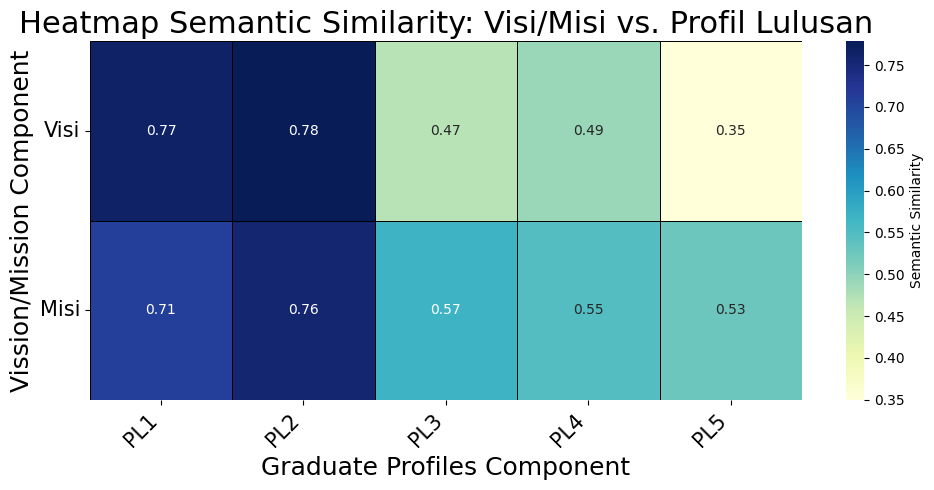


--- ╠️ STEP 6 — TAMBAHKAN STATISTIK ---

--- Statistik Alignment Semantik ---
Total Pasangan Visi/Misi-Profil Lulusan: 10
Rata-rata Semantic Similarity: 0.5963
Semantic Similarity Tertinggi: 0.7783
Semantic Similarity Terendah: 0.3496
Jumlah Pasangan dengan Similarity Tinggi (>= 0.8): 0
Jumlah Pasangan dengan Similarity Rendah (< 0.5): 3

--- ╠️ STEP 7 — KATEGORI ALIGNMENT ---

--- Distribusi Kategori Alignment ---


,Percentage
alignment_category_detailed,
Not Aligned,60.0
Aligned,40.0


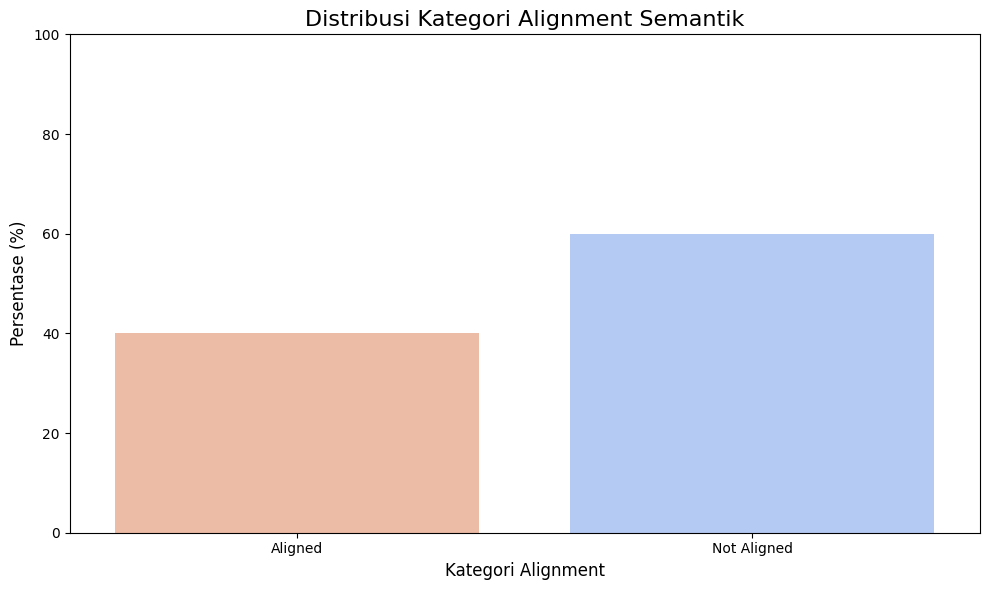

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity

# Helper function to safely parse string representations of lists
def parse_list_string(s):
    if isinstance(s, str):
        try:
            return eval(s)
        except (ValueError, SyntaxError):
            return []
    return s if isinstance(s, list) else []

# --- Re-creating alignment_dataset (from ee4a312f) if not already defined ---
if 'alignment_dataset' not in locals() or alignment_dataset.empty:
    alignment_data = []

    # --- Visi vs Profil Lulusan ---
    visi_row = df_visi_misi[df_visi_misi['kategori'] == 'visi'].iloc[0]
    for idx_profil, profil_row in df_profil.iterrows():
        alignment_data.append({
            'source_type': 'visi',
            'source_id': visi_row.name,
            'source_text': visi_row['text_clean'],
            'profil_id': idx_profil,
            'profil_text': profil_row['text_clean']
        })

    # --- Misi vs Profil Lulusan ---
    misi_rows = df_visi_misi[df_visi_misi['kategori'] == 'misi']
    for idx_misi, misi_row in misi_rows.iterrows():
        for idx_profil, profil_row in df_profil.iterrows():
            alignment_data.append({
                'source_type': 'misi',
                'source_id': idx_misi,
                'source_text': misi_row['text_clean'],
                'profil_id': idx_profil,
                'profil_text': profil_row['text_clean']
            })

    alignment_dataset = pd.DataFrame(alignment_data)
    print("Re-created pairwise alignment dataset.")

# --- Recalculating semantic similarity (from fa18f542) if not already calculated ---
if 'semantic_similarity' not in alignment_dataset.columns:
    def get_embedding(entity_type, entity_id):
        if entity_type == 'visi':
            return visi_embeddings[0]
        elif entity_type == 'misi':
            misi_original_indices = df_visi_misi[df_visi_misi['kategori'] == 'misi'].index.tolist()
            try:
                embedding_idx = misi_original_indices.index(entity_id)
                return misi_embeddings[embedding_idx]
            except ValueError:
                return None
        elif entity_type == 'profil':
            return df_profil_clean_embeddings[entity_id]
        return None

    semantic_similarities = []
    for index, row in alignment_dataset.iterrows():
        source_emb = get_embedding(row['source_type'], row['source_id'])
        profil_emb = get_embedding('profil', row['profil_id'])

        if source_emb is not None and profil_emb is not None:
            similarity = cosine_similarity(source_emb.reshape(1, -1), profil_emb.reshape(1, -1))[0][0]
        else:
            similarity = np.nan
        semantic_similarities.append(similarity)

    alignment_dataset['semantic_similarity'] = semantic_similarities
    print("Re-calculated semantic similarity.")

# --- Global Thresholds ---
HIGH_SIMILARITY_THRESHOLD = 0.80
MODERATE_ALIGNMENT_LOWER_THRESHOLD = 0.60 # Used for categorisation
LOW_SIMILARITY_THRESHOLD = 0.50 # Used for statistical count

# --- ╠️ STEP 1 — SIAPKAN DATA HEATMAP ---
print("--- ╠️ STEP 1 — SIAPKAN DATA HEATMAP ---")

# Create a pivot table for the heatmap
heatmap_data = alignment_dataset.pivot_table(
    index='source_text',
    columns='profil_id',
    values='semantic_similarity'
)

# Reorder rows so Visi comes first, then Misi statements
visi_text = df_visi_misi[df_visi_misi['kategori'] == 'visi']['text_clean'].iloc[0]
misi_texts_df = df_visi_misi[df_visi_misi['kategori'] == 'misi'].copy() # Use .copy() to avoid SettingWithCopyWarning
misi_texts_df['original_index'] = misi_texts_df.index # Store original index for custom labels

# Filter heatmap_data rows to ensure they exist in our desired order and get their original text
existing_visi_misi_texts = [visi_text] + misi_texts_df['text_clean'].tolist()
heatmap_data_filtered_rows = heatmap_data.loc[heatmap_data.index.intersection(existing_visi_misi_texts)]

# Reindex to enforce specific order (Visi first, then Misi in their original order)
ordered_misi_texts = misi_texts_df.sort_values(by='original_index')['text_clean'].tolist()
desired_row_order = [visi_text] + ordered_misi_texts
heatmap_data_ordered = heatmap_data_filtered_rows.reindex(desired_row_order, fill_value=np.nan)

print("Heatmap data prepared and ordered:")
display(heatmap_data_ordered.head())

# --- ╠️ STEP 2 & 3 — BUAT HEATMAP DAN CUSTOM LABEL ---
print("\n--- ╠️ STEP 2 & 3 — BUAT HEATMAP DAN CUSTOM LABEL ---")

# Create custom row labels to indicate Visi and Misi
custom_row_labels = []
misi_counter = 1 # Start counting for Misi statements
for i, row_text in enumerate(heatmap_data_ordered.index):
    if row_text == visi_text:
        custom_row_labels.append('Visi')
    else:
        # Assuming Misi statements are ordered correctly, append sequential label
        custom_row_labels.append('Misi')
        misi_counter += 1

# Plot the heatmap
plt.figure(figsize=(10, 5)) # Increased figsize for better readability
sns.heatmap(
    heatmap_data_ordered,
    annot=True,
    fmt=".2f", # Format to 2 decimal places
    cmap="YlGnBu",
    linewidths=.5,
    linecolor='black',
    cbar_kws={'label': 'Semantic Similarity'}
)

plt.title('Heatmap Semantic Similarity: Visi/Misi vs. Profil Lulusan', fontsize=22)
plt.xlabel('Graduate Profiles Component', fontsize=18)
plt.ylabel('Vission/Mission Component', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=15) # Rotate and adjust font size for columns
plt.yticks(rotation=0, fontsize=15) # Adjust font size for rows

# Apply custom row labels
ax = plt.gca()
ax.set_yticklabels(custom_row_labels)

plt.tight_layout()
plt.show()

# --- ╠️ STEP 6 — TAMBAHKAN STATISTIK ---
print("\n--- ╠️ STEP 6 — TAMBAHKAN STATISTIK ---")

mean_similarity = alignment_dataset['semantic_similarity'].mean()
max_similarity = alignment_dataset['semantic_similarity'].max()
min_similarity = alignment_dataset['semantic_similarity'].min()

num_high_similarity = alignment_dataset[alignment_dataset['semantic_similarity'] >= HIGH_SIMILARITY_THRESHOLD].shape[0]
num_low_similarity = alignment_dataset[alignment_dataset['semantic_similarity'] < LOW_SIMILARITY_THRESHOLD].shape[0]

total_pairs = alignment_dataset.shape[0]

print("\n--- Statistik Alignment Semantik ---")
print(f"Total Pasangan Visi/Misi-Profil Lulusan: {total_pairs}")
print(f"Rata-rata Semantic Similarity: {mean_similarity:.4f}")
print(f"Semantic Similarity Tertinggi: {max_similarity:.4f}")
print(f"Semantic Similarity Terendah: {min_similarity:.4f}")
print(f"Jumlah Pasangan dengan Similarity Tinggi (>= {HIGH_SIMILARITY_THRESHOLD}): {num_high_similarity}")
print(f"Jumlah Pasangan dengan Similarity Rendah (< {LOW_SIMILARITY_THRESHOLD}): {num_low_similarity}")

# --- ╠️ STEP 7 — KATEGORI ALIGNMENT ---
print("\n--- ╠️ STEP 7 — KATEGORI ALIGNMENT ---")

def categorize_alignment(similarity):
    if similarity >= MODERATE_ALIGNMENT_LOWER_THRESHOLD: # >= 0.60
        return "Aligned"
    else:
        return "Not Aligned"

alignment_dataset['alignment_category_detailed'] = alignment_dataset['semantic_similarity'].apply(categorize_alignment)

alignment_category_distribution = alignment_dataset['alignment_category_detailed'].value_counts(normalize=True) * 100

print("\n--- Distribusi Kategori Alignment ---")
display(alignment_category_distribution.to_frame(name='Percentage'))

# Plotting the distribution
plt.figure(figsize=(10, 6))
sns.barplot(
    x=alignment_category_distribution.index,
    y=alignment_category_distribution.values,
    palette='coolwarm',
    order=['Aligned', 'Not Aligned'], # Updated order for two categories
    hue=alignment_category_distribution.index,
    legend=False
)
plt.title('Distribusi Kategori Alignment Semantik', fontsize=16)
plt.xlabel('Kategori Alignment', fontsize=12)
plt.ylabel('Persentase (%)', fontsize=12)
plt.ylim(0, 100)
plt.tight_layout()
plt.show()

#### 1. ANALISIS ALIGNMENT VISI ↔ PROFIL DAN MISI ↔ PROFIL

Kita akan menganalisis sejauh mana visi dan misi program studi selaras dengan berbagai komponen profil lulusan. Heatmap akan menunjukkan skor similarity antara visi/misi dengan setiap profil lulusan.

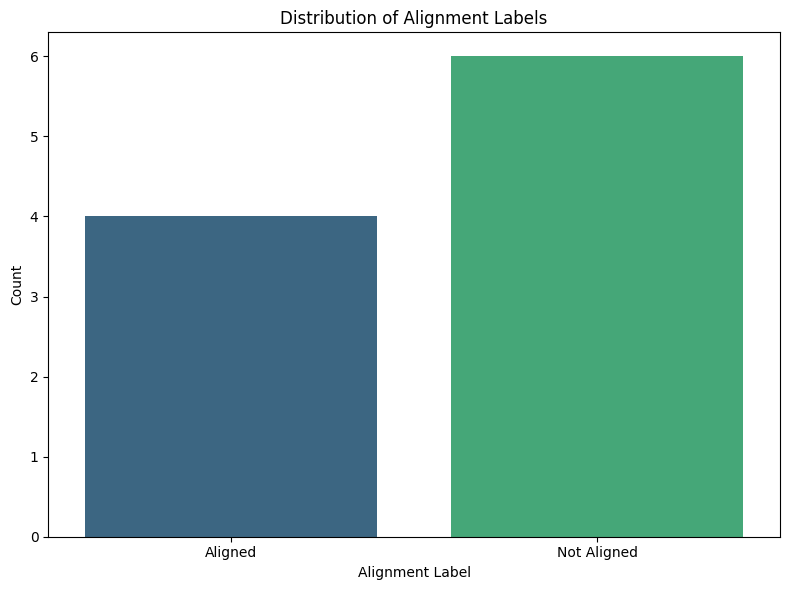


--- Insight Otomatis ---
Profil lulusan secara rata-rata menunjukkan alignment yang lebih tinggi dengan visi (rata-rata similarity: 0.571) atau misi (rata-rata similarity: 0.622). Heatmap di atas secara visual mengkonfirmasi komponen profil mana yang paling selaras dengan visi dan misi program studi.

Top 3 Profil Lulusan Paling Selaras dengan Visi:


,Visi
text_clean,
Lulusan yang mengikuti dan memanfaatkan perkembangan teknologi informasi untuk memberikan solusi maupun mengembangkan bisnis (UNSUR: PENGETAHUAN) ,0.778277
Sarjana Teknik Informatika yang memiliki jiwa dan semangat serta budaya kewirausahaan dengan memanfaatkan perkembangan teknologi informasi (UNSUR: SIKAP) ,0.766381
Lulusan yang ahli di bidang bisnis dan teknologi informasi (UNSUR: KETERAMPILAN KHUSUS / HARD SKILL) ,0.491047



Top 3 Profil Lulusan Paling Selaras dengan Misi:


,Misi
text_clean,
Lulusan yang mengikuti dan memanfaatkan perkembangan teknologi informasi untuk memberikan solusi maupun mengembangkan bisnis (UNSUR: PENGETAHUAN) ,0.757497
Sarjana Teknik Informatika yang memiliki jiwa dan semangat serta budaya kewirausahaan dengan memanfaatkan perkembangan teknologi informasi (UNSUR: SIKAP) ,0.710221
Profesional unggul yang memiliki etika profesi yang baik dan memiliki kemauan untuk terus mengembangkan diri (UNSUR: SIKAP) ,0.567545


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np # Import numpy for mean calculation

# --- Fix: Calculate similarity_visi_profil and similarity_misi_profil from alignment_dataset ---

# Extract Visi-Profil similarities (should be one entry per profil_text for Visi)
visi_alignments = alignment_dataset[alignment_dataset['source_type'] == 'visi']
similarity_visi_profil = visi_alignments.set_index('profil_text')['semantic_similarity']

# Extract Misi-Profil similarities and average them for each profil_text
misi_alignments = alignment_dataset[alignment_dataset['source_type'] == 'misi']
similarity_misi_profil = misi_alignments.groupby('profil_text')['semantic_similarity'].mean()

# Combine Visi and Misi similarities into a single DataFrame for the heatmap
alignment_matrix = pd.DataFrame({
    'Visi': similarity_visi_profil,
    'Misi': similarity_misi_profil
}, index=df_profil['text_clean'])

# 1. Distribution of Alignment Labels
plt.figure(figsize=(8, 6))
sns.countplot(x='alignment_label', data=alignment_dataset, order=['Aligned', 'Not Aligned'], palette='viridis', hue='alignment_label', legend=False)
plt.title('Distribution of Alignment Labels')
plt.xlabel('Alignment Label')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

print("\n--- Insight Otomatis ---")
print(f"Profil lulusan secara rata-rata menunjukkan alignment yang lebih tinggi dengan visi (rata-rata similarity: {np.mean(similarity_visi_profil):.3f}) atau misi (rata-rata similarity: {np.mean(similarity_misi_profil):.3f}). Heatmap di atas secara visual mengkonfirmasi komponen profil mana yang paling selaras dengan visi dan misi program studi.")

# Identify top 3 profil components most aligned with Visi
top_3_visi_aligned = alignment_matrix['Visi'].nlargest(3)
print("\nTop 3 Profil Lulusan Paling Selaras dengan Visi:")
display(top_3_visi_aligned)

# Identify top 3 profil components most aligned with Misi
top_3_misi_aligned = alignment_matrix['Misi'].nlargest(3)
print("\nTop 3 Profil Lulusan Paling Selaras dengan Misi:")
display(top_3_misi_aligned)

#### 2. ANALISIS DOMAIN KOMPETENSI DOMINAN DAN DISTRIBUSI

Bagian ini akan menampilkan distribusi domain kompetensi industri yang teridentifikasi dari data okupasi, serta bagaimana visi, misi, dan profil lulusan terdistribusi di antara domain-domain ini.

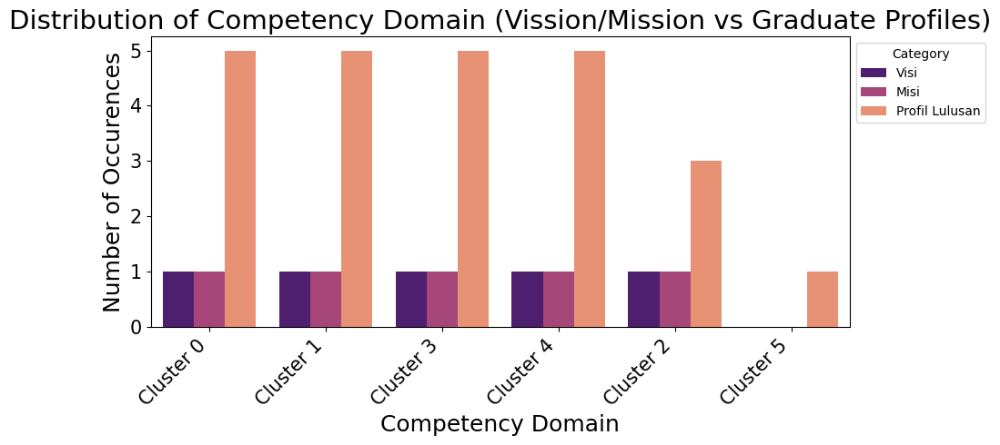

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from collections import Counter

# Helper function to count domain frequencies from a series of lists
def count_domains(series):
    counter = Counter()
    for domains in series:
        if isinstance(domains, list):
            counter.update(domains)
    return counter

# --- Reconstruct domain_frequency_df directly from df_visi_misi and df_profil ---

# Ensure df_visi_misi and df_profil are available
if 'df_visi_misi' not in locals() or 'df_profil' not in locals():
    raise ValueError("Error: 'df_visi_misi' or 'df_profil' not found. Please ensure the 'LOAD DATA' and 'MAPPING' sections have been executed.")

# Reconstruct visi_counter from df_visi_misi (specifically, the row for visi)
# Assuming 'visi_top_domains' column contains lists of domains
visi_data_row = df_visi_misi[df_visi_misi['kategori'] == 'visi'].iloc[0]
visi_counter = count_domains([visi_data_row['visi_top_domains']])

# Reconstruct misi_counter from df_visi_misi (specifically, the rows for misi)
# Assuming 'misi_top_domains' column contains lists of domains
misi_data_rows = df_visi_misi[df_visi_misi['kategori'] == 'misi']
misi_counter = count_domains(misi_data_rows['misi_top_domains'])

# Reconstruct profil_counter from df_profil
# Assuming 'profil_top_domains' column contains lists of domains
profil_counter = count_domains(df_profil['profil_top_domains'])

# Combine all unique domains
all_domains = sorted(
    set(visi_counter.keys())
    |
    set(misi_counter.keys())
    |
    set(profil_counter.keys())
)

# Create the domain_frequency_df
domain_frequency_df = pd.DataFrame({
    "Domain": all_domains,
    "Visi": [
        visi_counter.get(domain,0)
        for domain in all_domains
    ],
    "Misi": [
        misi_counter.get(domain,0)
        for domain in all_domains
    ],
    "Profil Lulusan": [
        profil_counter.get(domain,0)
        for domain in all_domains
    ]
})

domain_frequency_df["Total"] = (
    domain_frequency_df["Visi"]
    +
    domain_frequency_df["Misi"]
    +
    domain_frequency_df["Profil Lulusan"]
)

domain_frequency_df = (
    domain_frequency_df
    .sort_values(
        "Total",
        ascending=False
    )
    .reset_index(drop=True)
)

# Melt the DataFrame to long format for Seaborn grouped bar chart
df_melted = domain_frequency_df.melt(id_vars='Domain', var_name='Category', value_name='Count')

# Filter out 'Total' category if present, as it's a sum of others (should not be present with this reconstruction)
df_melted = df_melted[df_melted['Category'] != 'Total']

# Plotting the grouped bar chart
plt.figure(figsize=(10, 5))
sns.barplot(x='Domain', y='Count', hue='Category', data=df_melted, palette='magma')
plt.title('Distribution of Competency Domain (Vission/Mission vs Graduate Profiles)', fontsize=21)
plt.xlabel('Competency Domain', fontsize=18)
plt.ylabel('Number of Occurences', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=15)
plt.yticks(fontsize=15)
plt.legend(title='Category', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

##### Distribusi Profil Lulusan per Domain Kompetensi (Primary Domain)

Visualisasi ini akan menampilkan domain kompetensi yang paling sering menjadi *primary domain* (domain utama) untuk setiap komponen profil lulusan.

Tabel Profil Lulusan dengan Domain Similaritas Tertinggi:


,text_clean,profil_domain,profil_similarity
0,Sarjana Teknik Informatika yang memiliki jiwa ...,Cluster 1,0.810025
1,Lulusan yang mengikuti dan memanfaatkan perkem...,Cluster 4,0.780171
3,Lulusan yang ahli di bidang bisnis dan teknolo...,Cluster 0,0.574437
4,Lulusan yang memiliki kompetensi berstandar na...,Cluster 0,0.506222
2,Profesional unggul yang memiliki etika profesi...,Cluster 4,0.477967


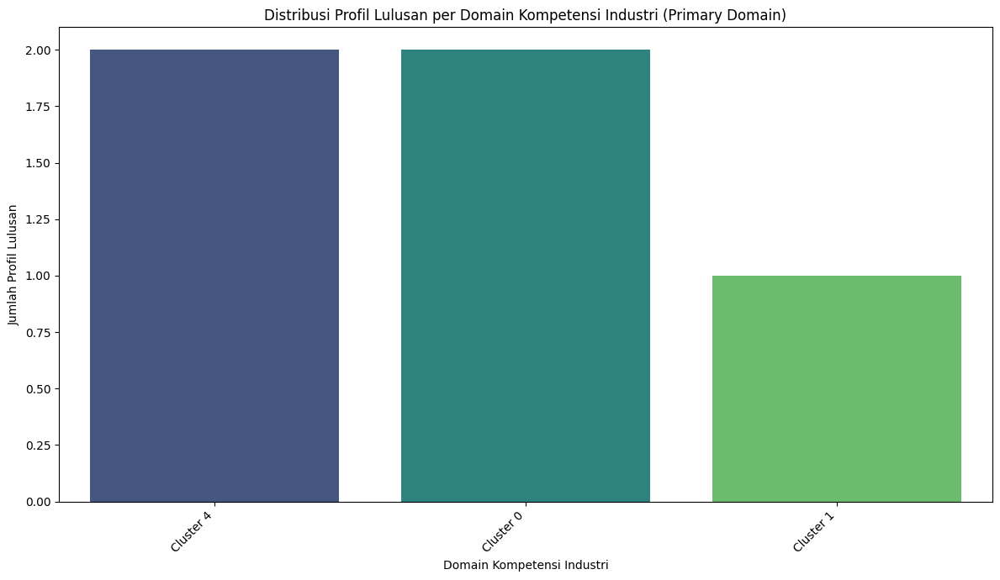


--- Insight Otomatis ---
Domain kompetensi yang paling sering menjadi *primary domain* untuk profil lulusan adalah 'Cluster 4' dengan 2 profil. Ini menunjukkan fokus utama dari profil lulusan pada domain tersebut.


/tmp/ipykernel_3237/3399281740.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=domain_counts.index, y=domain_counts.values, palette='magma')


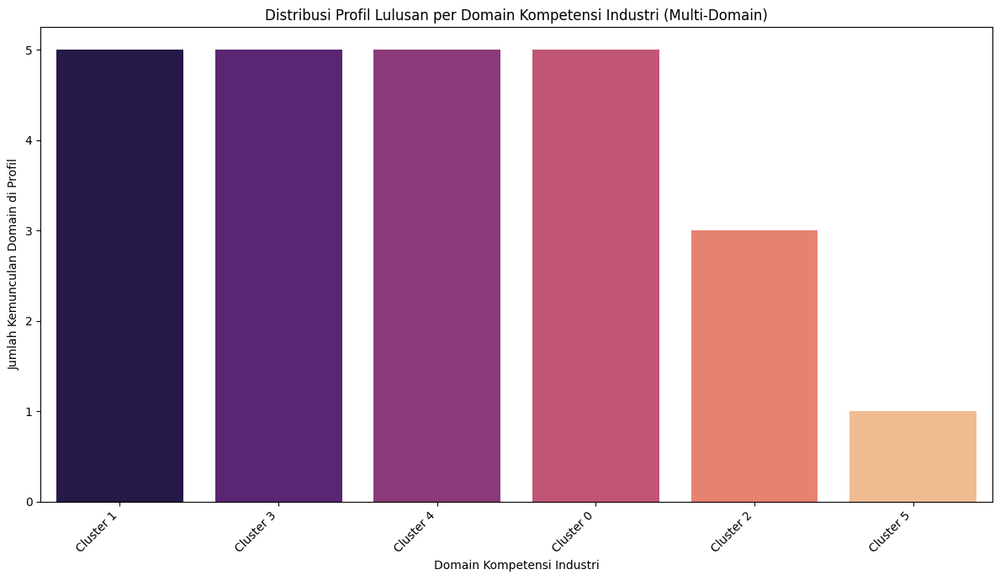


--- Insight Otomatis ---
Domain kompetensi yang paling sering muncul di daftar 'profil_top_domains' adalah 'Cluster 1' dengan 5 kemunculan. Ini menunjukkan fokus area keahlian yang komprehensif dari profil lulusan yang ada.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("Tabel Profil Lulusan dengan Domain Similaritas Tertinggi:")
display(df_profil[['text_clean', 'profil_domain', 'profil_similarity']].sort_values(by='profil_similarity', ascending=False))

# Prepare data for plotting profil_domain (primary domain)
profil_primary_domain_counts = df_profil['profil_domain'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(12, 7))
sns.barplot(x=profil_primary_domain_counts.index, y=profil_primary_domain_counts.values, palette='viridis', hue=profil_primary_domain_counts.index, legend=False)
plt.title('Distribusi Profil Lulusan per Domain Kompetensi Industri (Primary Domain)')
plt.xlabel('Domain Kompetensi Industri')
plt.ylabel('Jumlah Profil Lulusan')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print("\n--- Insight Otomatis ---")
if not profil_primary_domain_counts.empty:
    profil_top_primary_domain = profil_primary_domain_counts.index[0]
    profil_top_primary_domain_count = profil_primary_domain_counts.iloc[0]
    print(f"Domain kompetensi yang paling sering menjadi *primary domain* untuk profil lulusan adalah '{profil_top_primary_domain}' dengan {profil_top_primary_domain_count} profil. Ini menunjukkan fokus utama dari profil lulusan pada domain tersebut.")
else:
    print("Tidak ada data domain utama untuk profil lulusan yang dapat dianalisis.")

# Prepare data for plotting profil_top_domains
# Explode the list of top domains into separate rows
exploded_profil_domains = df_profil['profil_top_domains'].explode()

# Filter out any non-string values that might result from empty lists or other issues during explode
exploded_profil_domains = exploded_profil_domains[exploded_profil_domains.apply(lambda x: isinstance(x, str))]

# Count the occurrences of each domain
domain_counts = exploded_profil_domains.value_counts().sort_values(ascending=False)

# Distribusi Profil Lulusan per Domain Kompetensi (dari profil_top_domains)
plt.figure(figsize=(12, 7))
sns.barplot(x=domain_counts.index, y=domain_counts.values, palette='magma')
plt.title('Distribusi Profil Lulusan per Domain Kompetensi Industri (Multi-Domain)')
plt.xlabel('Domain Kompetensi Industri')
plt.ylabel('Jumlah Kemunculan Domain di Profil')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print("\n--- Insight Otomatis ---")
if not domain_counts.empty:
    profil_top_domain_multi = domain_counts.index[0]
    profil_top_domain_multi_count = domain_counts.iloc[0]
    print(f"Domain kompetensi yang paling sering muncul di daftar 'profil_top_domains' adalah '{profil_top_domain_multi}' dengan {profil_top_domain_multi_count} kemunculan. Ini menunjukkan fokus area keahlian yang komprehensif dari profil lulusan yang ada.")
else:
    print("Tidak ada data domain untuk dianalisis di 'profil_top_domains'.")


##### Distribusi Visi per Domain Kompetensi

Visualisasi ini akan menunjukkan domain kompetensi yang paling relevan dengan visi program studi, berdasarkan daftar `visi_top_domains`.

Distribusi Visi per Domain Kompetensi (Tabel):


,Domain Kompetensi Industri,Similarity Score
0,Cluster 4,0.779493
1,Cluster 1,0.772923
2,Cluster 2,0.590489
3,Cluster 3,0.582057
4,Cluster 0,0.521873


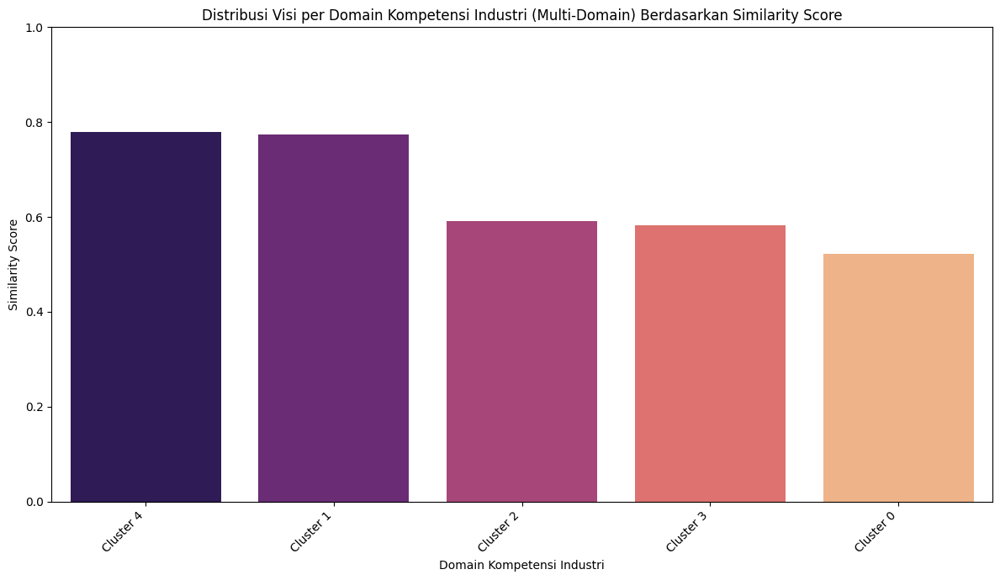


--- Insight Otomatis ---
Domain kompetensi dengan similarity score tertinggi di `visi_top_domains` adalah 'Cluster 4' dengan skor 0.779. Ini menunjukkan fokus multi-domain dari visi program studi berdasarkan tingkat keselarasan.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for plotting visi_top_domains and their scores
visi_top_domains_list = df_visi_misi.loc[0, 'visi_top_domains']
visi_top_domain_scores_list = df_visi_misi.loc[0, 'visi_top_domain_scores']

# Ensure it's a list, then create a DataFrame
if isinstance(visi_top_domains_list, str):
    try:
        visi_top_domains_list = eval(visi_top_domains_list) # Safely evaluate string to list if necessary
    except (ValueError, SyntaxError):
        visi_top_domains_list = []

if isinstance(visi_top_domain_scores_list, str):
    try:
        visi_top_domain_scores_list = eval(visi_top_domain_scores_list) # Safely evaluate string to list if necessary
    except (ValueError, SyntaxError):
        visi_top_domain_scores_list = []

if visi_top_domains_list and visi_top_domain_scores_list:
    visi_domain_scores_df = pd.DataFrame({
        'Domain Kompetensi Industri': visi_top_domains_list,
        'Similarity Score': visi_top_domain_scores_list
    })
    # Sort by similarity score for better visualization
    visi_domain_scores_df = visi_domain_scores_df.sort_values(by='Similarity Score', ascending=False)
else:
    visi_domain_scores_df = pd.DataFrame(columns=['Domain Kompetensi Industri', 'Similarity Score']) # Empty DataFrame

print("Distribusi Visi per Domain Kompetensi (Tabel):")
display(visi_domain_scores_df)

plt.figure(figsize=(12, 7))
sns.barplot(x='Domain Kompetensi Industri', y='Similarity Score', hue='Domain Kompetensi Industri', data=visi_domain_scores_df, palette='magma', legend=False)
plt.title('Distribusi Visi per Domain Kompetensi Industri (Multi-Domain) Berdasarkan Similarity Score')
plt.xlabel('Domain Kompetensi Industri')
plt.ylabel('Similarity Score')
plt.ylim(0.0, 1.0) # Set y-axis range from 0.0 to 1.0
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print("\n--- Insight Otomatis ---")
if not visi_domain_scores_df.empty:
    visi_top_domain_multi = visi_domain_scores_df.iloc[0]['Domain Kompetensi Industri']
    visi_top_domain_multi_score = visi_domain_scores_df.iloc[0]['Similarity Score']
    print(f"Domain kompetensi dengan similarity score tertinggi di `visi_top_domains` adalah '{visi_top_domain_multi}' dengan skor {visi_top_domain_multi_score:.3f}. Ini menunjukkan fokus multi-domain dari visi program studi berdasarkan tingkat keselarasan.")
else:
    print("Tidak ada data domain untuk analisis visi.")

##### Distribusi Misi per Domain Kompetensi

Visualisasi ini akan menampilkan domain kompetensi yang paling sering direpresentasikan oleh setiap misi program studi, berdasarkan daftar `misi_top_domains` dari setiap misi.

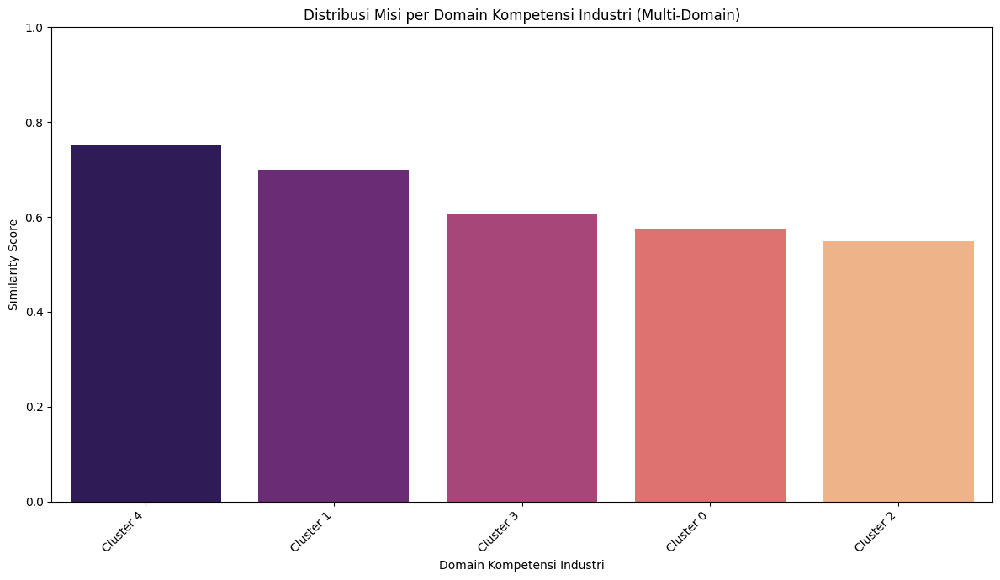


Primary Domain Kompetensi untuk Setiap Misi:


,text_clean,misi_primary_domain,misi_primary_similarity
1,1. menghasilkan lulusan dengan kompetensi yang...,Cluster 4,0.753348


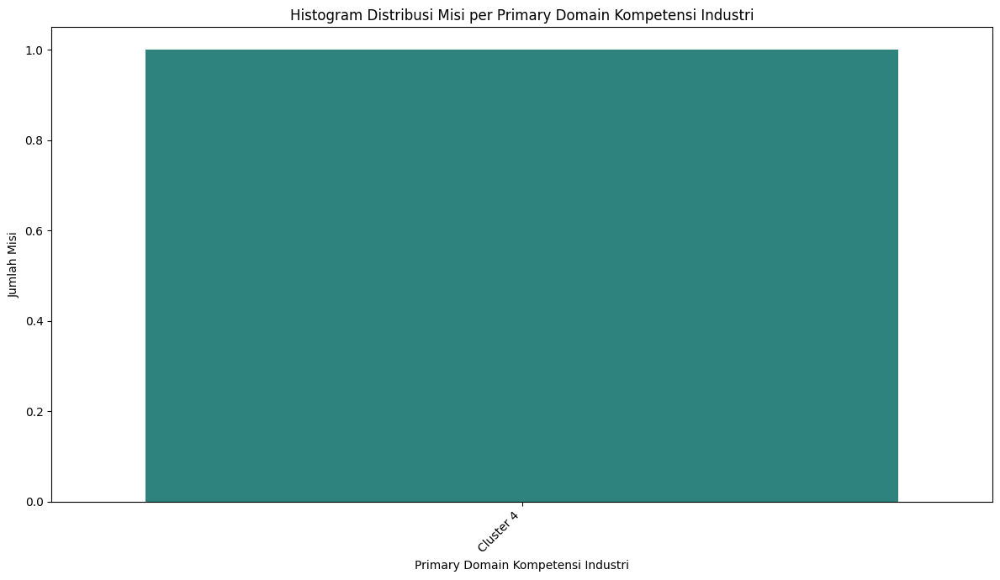

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for plotting misi_top_domains and their scores
misi_top_domains_list_series = df_visi_misi[df_visi_misi['kategori'] == 'misi']['misi_top_domains']
misi_top_domain_scores_list_series = df_visi_misi[df_visi_misi['kategori'] == 'misi']['misi_top_domain_scores']

# Extract the actual lists from the Series for DataFrame creation and boolean check
misi_domains_for_df = misi_top_domains_list_series.iloc[0] if not misi_top_domains_list_series.empty else []
misi_scores_for_df = misi_top_domain_scores_list_series.iloc[0] if not misi_top_domain_scores_list_series.empty else []

if misi_domains_for_df and misi_scores_for_df: # Now these are actual lists, boolean check is valid
    misi_domain_scores_df = pd.DataFrame({
        'Domain Kompetensi Industri': misi_domains_for_df,
        'Similarity Score': misi_scores_for_df
    })
    # Sort by similarity score for better visualization
    misi_domain_scores_df = misi_domain_scores_df.sort_values(by='Similarity Score', ascending=False)
else:
    misi_domain_scores_df = pd.DataFrame(columns=['Domain Kompetensi Industri', 'Similarity Score']) # Empty DataFrame


plt.figure(figsize=(12, 7))
sns.barplot(x='Domain Kompetensi Industri', y='Similarity Score', hue='Domain Kompetensi Industri', data=misi_domain_scores_df, palette='magma', legend=False)
plt.title('Distribusi Misi per Domain Kompetensi Industri (Multi-Domain)')
plt.xlabel('Domain Kompetensi Industri')
plt.ylabel('Similarity Score') # Changed from 'Jumlah Kemunculan Domain di Misi' to 'Similarity Score' to match y-axis of bar plot
plt.ylim(0.0, 1.0) # Set y-axis range from 0.0 to 1.0, similar to visi plot
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Display all Misi statements and their primary domain mappings
print("\nPrimary Domain Kompetensi untuk Setiap Misi:")
display(df_visi_misi[df_visi_misi['kategori'] == 'misi'][['text_clean', 'misi_primary_domain', 'misi_primary_similarity']])

# Plot histogram for misi_primary_domain
misi_primary_domain_counts = df_visi_misi[df_visi_misi['kategori'] == 'misi']['misi_primary_domain'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(12, 7))
sns.barplot(x=misi_primary_domain_counts.index, y=misi_primary_domain_counts.values, palette='viridis', hue=misi_primary_domain_counts.index, legend=False)
plt.title('Histogram Distribusi Misi per Primary Domain Kompetensi Industri')
plt.xlabel('Primary Domain Kompetensi Industri')
plt.ylabel('Jumlah Misi')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### 3. TOP PROFILE ALIGNMENT TERHADAP INDUSTRI

Visualisasi ini akan menunjukkan komponen profil lulusan mana yang memiliki alignment tertinggi dengan keseluruhan kompetensi industri, mengindikasikan aspek profil yang paling relevan dengan tuntutan pasar kerja.

/tmp/ipykernel_3237/932940764.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='profil_to_industry_max_similarity', y='text_clean', data=top_aligned_profiles, palette='viridis')
/tmp/ipykernel_3237/932940764.py:24: UserWarning: Glyph 61623 (\uf0b7) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_3237/932940764.py:24: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 61623 (\uf0b7) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


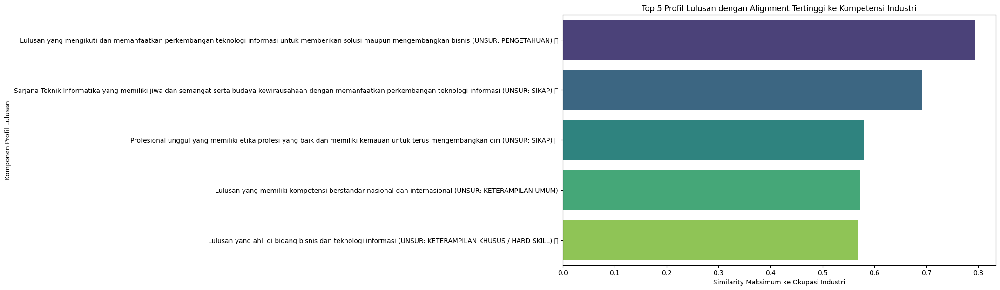


--- Insight Otomatis ---
Komponen profil lulusan yang paling selaras dengan kompetensi industri adalah 'Lulusan yang mengikuti dan memanfaatkan perkembangan teknologi informasi untuk memberikan solusi maupun mengembangkan bisnis (UNSUR: PENGETAHUAN) ' dengan skor similarity tertinggi 0.794. Ini menyoroti kekuatan utama profil lulusan dalam memenuhi kebutuhan industri.


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate similarity between each profil_clean_embedding and all df_okupasi_skills_embeddings
# df_profil_clean_embeddings shape: (num_profiles, embedding_dim)
# df_okupasi_skills_embeddings shape: (num_occupations, embedding_dim)
similarity_profil_to_all_occupations = cosine_similarity(
    df_profil_clean_embeddings, df_okupasi_skills_embeddings
)

# For each profile, find the maximum similarity score to any occupation
df_profil['profil_to_industry_max_similarity'] = np.max(similarity_profil_to_all_occupations, axis=1)

# Sort profil components by their maximum similarity to any industry occupation
top_aligned_profiles = df_profil.sort_values(by='profil_to_industry_max_similarity', ascending=False).head(5)

plt.figure(figsize=(12, 7))
sns.barplot(x='profil_to_industry_max_similarity', y='text_clean', data=top_aligned_profiles, palette='viridis')
plt.title('Top 5 Profil Lulusan dengan Alignment Tertinggi ke Kompetensi Industri')
plt.xlabel('Similarity Maksimum ke Okupasi Industri')
plt.ylabel('Komponen Profil Lulusan')
plt.tight_layout()
plt.show()

print("\n--- Insight Otomatis ---")
print(f"Komponen profil lulusan yang paling selaras dengan kompetensi industri adalah '{top_aligned_profiles.iloc[0]['text_clean']}' dengan skor similarity tertinggi {top_aligned_profiles.iloc[0]['profil_to_industry_max_similarity']:.3f}. Ini menyoroti kekuatan utama profil lulusan dalam memenuhi kebutuhan industri.")

#### 4. CLUSTER VISUALIZATION (PCA)

Untuk melihat bagaimana visi, misi, profil lulusan, dan kompetensi okupasi terdistribusi dalam ruang embedding, kita akan menggunakan Principal Component Analysis (PCA) untuk mereduksi dimensi dan memvisualisasikannya dalam 2D.

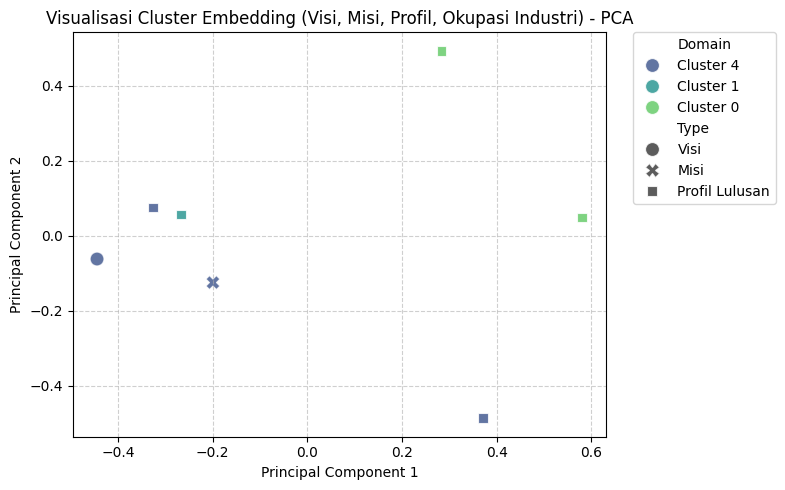


--- Insight Otomatis ---
Visualisasi PCA menunjukkan bagaimana berbagai elemen (visi, misi, profil, okupasi) tersebar dalam ruang semantik. Titik-titik yang berkelompok erat menunjukkan kesamaan semantik yang tinggi. Visualisasi ini dapat membantu mengidentifikasi cluster yang jelas atau area di mana ada tumpang tindih atau kesenjangan yang signifikan antar domain.


In [ ]:
from sklearn.decomposition import PCA

# Combine all embeddings for visualization
# Need to ensure all are 2D arrays before concatenating
all_embeddings = np.vstack([
    visi_embeddings,
    misi_embeddings,
    df_profil_clean_embeddings
    # df_okupasi_skills_embeddings # Changed from occupation_competency_embeddings
])

# Create labels for each point
labels = (
    ['Visi'] * visi_embeddings.shape[0] +
    ['Misi'] * misi_embeddings.shape[0] +
    ['Profil Lulusan'] * df_profil_clean_embeddings.shape[0]
    # ['Okupasi Industri'] * df_okupasi_skills_embeddings.shape[0] # Changed from occupation_competency_embeddings
)

# Perform PCA to reduce to 2 dimensions
pca = PCA(n_components=2)
reduced_embeddings = pca.fit_transform(all_embeddings)

# Create a DataFrame for plotting
pca_df = pd.DataFrame(reduced_embeddings, columns=['PC1', 'PC2'])
pca_df['Type'] = labels

# --- Robust access for misi_primary_domain_list ---
# Changed to use misi_primary_domain for plotting
misi_df_filtered_pca = df_visi_misi[df_visi_misi['kategori'] == 'misi']
misi_primary_domain_list = []
if not misi_df_filtered_pca.empty and 'misi_primary_domain' in misi_df_filtered_pca.columns:
    misi_primary_domain_list = misi_df_filtered_pca['misi_primary_domain'].tolist()

domain_labels = []
visi_count = visi_embeddings.shape[0]
misi_count = misi_embeddings.shape[0]
profil_count = df_profil_clean_embeddings.shape[0]

for i, t in enumerate(pca_df['Type']):
    if t == 'Visi':
        domain_labels.append(df_visi_misi.loc[0, 'visi_primary_domain']) # Use primary domain
    elif t == 'Misi':
        # Get the index within the misi_embeddings block
        misi_local_idx = i - visi_count
        if misi_local_idx < len(misi_primary_domain_list):
            domain_labels.append(misi_primary_domain_list[misi_local_idx]) # Use primary domain
        else:
            domain_labels.append('Unknown Misi Domain') # Fallback if index out of bounds
    elif t == 'Profil Lulusan':
        # Get the index within the profil_new_pipeline_embeddings block
        profil_local_idx = i - (visi_count + misi_count)
        domain_labels.append(df_profil.iloc[profil_local_idx]['profil_domain'])
    # elif t == 'Okupasi Industri':
    #     # Get the index within the occupation_competency_embeddings block
    #     occup_local_idx = i - (visi_count + misi_count + profil_count)
    #     domain_labels.append(df_okupasi.iloc[occup_local_idx]['occupation_domain'])

pca_df['Domain'] = domain_labels

plt.figure(figsize=(8, 5))
sns.scatterplot(
    x='PC1', y='PC2', hue='Domain', style='Type', data=pca_df,
    palette='viridis', s=100, alpha=0.8
)
plt.title('Visualisasi Cluster Embedding (Visi, Misi, Profil, Okupasi Industri) - PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

print("\n--- Insight Otomatis ---")
print("Visualisasi PCA menunjukkan bagaimana berbagai elemen (visi, misi, profil, okupasi) tersebar dalam ruang semantik. Titik-titik yang berkelompok erat menunjukkan kesamaan semantik yang tinggi. Visualisasi ini dapat membantu mengidentifikasi cluster yang jelas atau area di mana ada tumpang tindih atau kesenjangan yang signifikan antar domain.")

### Versi 1: Visualisasi PCA Corpus PONTIK 2025 (Pengelompokan Murni)

Visualisasi ini menampilkan **ratusan titik-titik kecil bermunculan** yang merepresentasikan teks kompetensi dari dataset PONTIK 2025. Titik-titik ini dikelompokkan menjadi **6 kelompok warna (Cluster 0 sampai Cluster 5)** berdasarkan hasil algoritma K-Means ($K=6$).

Tujuan dari visualisasi ini adalah untuk **membuktikan bahwa algoritma K-Means berhasil membagi dataset nasional PONTIK 2025 menjadi 6 area/domain yang terpisah secara bersih (well-separated)**, menunjukkan struktur inheren dalam data kompetensi.

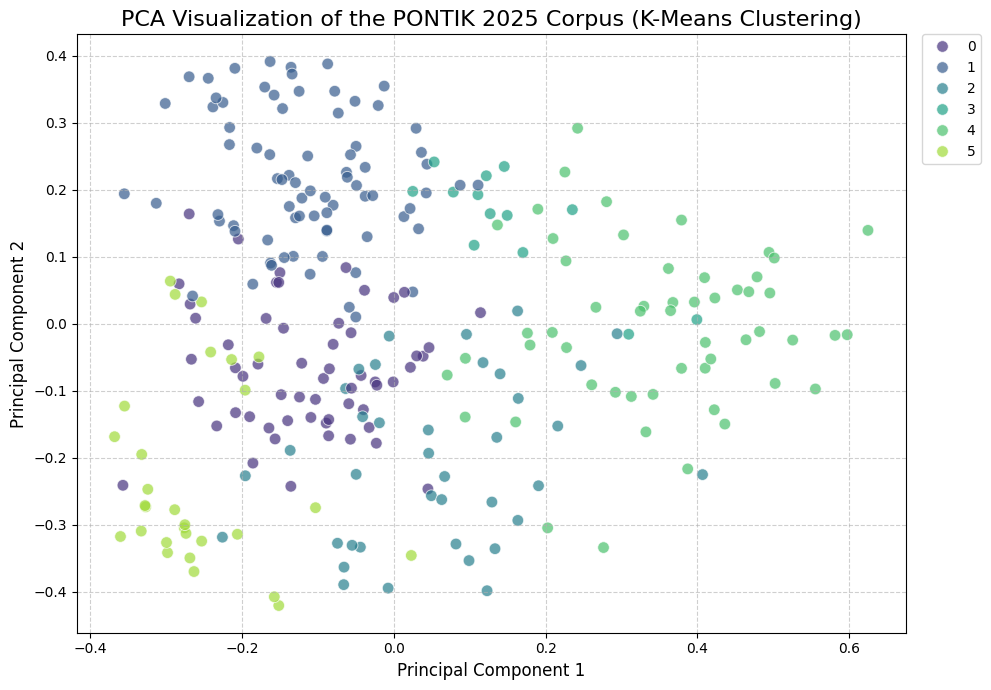


--- Insight Otomatis ---
Visualisasi PCA untuk korpus PONTIK 2025 menunjukkan distribusi titik-titik kompetensi yang membentuk 6 kelompok yang berbeda, masing-masing diwakili oleh warna yang unik. Ini mengkonfirmasi bahwa algoritma K-Means berhasil mengidentifikasi struktur cluster yang jelas dalam dataset, membuktikan pemisahan yang baik antar domain kompetensi. Cluster yang terpisah secara visual menunjukkan bahwa kompetensi dalam satu cluster memiliki kesamaan semantik yang lebih tinggi satu sama lain dibandingkan dengan kompetensi di cluster lain.


In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Ensure df_okupasi and df_okupasi_skills_embeddings are available
if 'df_okupasi_skills_embeddings' not in locals():
    raise ValueError("df_okupasi_skills_embeddings not found. Please run the TEXT EMBEDDING section.")
if 'df_okupasi' not in locals() or 'skill_cluster' not in df_okupasi.columns:
    raise ValueError("df_okupasi or 'skill_cluster' column not found. Please run the K-MEANS CLUSTERING section.")

# Perform PCA on PONTIK 2025 embeddings
pca_pontik = PCA(n_components=2)
reduced_pontik_embeddings = pca_pontik.fit_transform(df_okupasi_skills_embeddings)

# Create a DataFrame for plotting
pca_pontik_df = pd.DataFrame(reduced_pontik_embeddings, columns=['PC1', 'PC2'])
pca_pontik_df['Cluster'] = df_okupasi['skill_cluster'].astype(str) # Convert to string for categorical hue

plt.figure(figsize=(10, 7))
sns.scatterplot(
    x='PC1', y='PC2', hue='Cluster', data=pca_pontik_df,
    palette='viridis', s=70, alpha=0.7, # Smaller points for 'hundreds/thousands' of points
    legend='full'
)
plt.title('PCA Visualization of the PONTIK 2025 Corpus (K-Means Clustering)', fontsize=16)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

print("\n--- Insight Otomatis ---")
print("Visualisasi PCA untuk korpus PONTIK 2025 menunjukkan distribusi titik-titik kompetensi yang membentuk 6 kelompok yang berbeda, masing-masing diwakili oleh warna yang unik. Ini mengkonfirmasi bahwa algoritma K-Means berhasil mengidentifikasi struktur cluster yang jelas dalam dataset, membuktikan pemisahan yang baik antar domain kompetensi. Cluster yang terpisah secara visual menunjukkan bahwa kompetensi dalam satu cluster memiliki kesamaan semantik yang lebih tinggi satu sama lain dibandingkan dengan kompetensi di cluster lain.")

#### 5. ANALISIS GAP

Analisis ini bertujuan untuk mengidentifikasi potensi kesenjangan antara profil lulusan dengan kebutuhan industri, atau antara visi/misi dengan profil lulusan yang ada.

In [ ]:
print("\n--- Analisis Gap (Pipeline Baru) ---")

# Gap 1: Profil Lulusan dengan Alignment Rendah ke Industri
low_alignment_threshold = 0.4 # Define a threshold for low alignment
low_aligned_profiles_df = df_profil[df_profil['profil_to_industry_max_similarity'] < low_alignment_threshold]

if not low_aligned_profiles_df.empty:
    print(f"\nProfil Lulusan dengan Alignment Rendah ke Kompetensi Industri (Similarity < {low_alignment_threshold:.2f}):")
    display(low_aligned_profiles_df[['text_clean', 'profil_domain', 'profil_to_industry_max_similarity']])
    print("\n--- Insight Otomatis ---")
    print("Komponen profil lulusan di atas menunjukkan alignment yang relatif rendah dengan kompetensi industri. Ini bisa menjadi area untuk pengembangan kurikulum atau peninjauan ulang formulasi profil agar lebih relevan dengan tuntutan pasar.")
else:
    print("\nTidak ada komponen profil lulusan yang memiliki alignment rendah dengan kompetensi industri berdasarkan threshold yang ditetapkan.")

# Gap 2: Domain Industri yang Belum Banyak Didukung Visi/Misi/Profil
# This requires comparing the distribution of 'occupation_domain' with how many visi/misi/profil map to it.

# Count how many profiles map to each primary domain
profil_domain_counts = df_profil['profil_domain'].value_counts().reindex(cluster_domain_mapping.values(), fill_value=0)

# Count how many missions map to each primary domain
misi_df_filtered_gap = df_visi_misi[df_visi_misi['kategori'] == 'misi']
misi_domain_counts_for_gap = misi_df_filtered_gap['misi_primary_domain'].value_counts().reindex(cluster_domain_mapping.values(), fill_value=0)

# Get visi primary domain
visi_mapped_domain = df_visi_misi.loc[0, 'visi_primary_domain']

# Collect all unique primary domains from mission statements (for the 'Misi' label)
all_misi_primary_domains = misi_df_filtered_gap['misi_primary_domain'].dropna().unique().tolist()

print("\nDistribusi dukungan Visi/Misi/Profil terhadap Domain Kompetensi Industri (Primary Domain):")
for domain in cluster_domain_mapping.values():
    visi_support = 'Visi' if domain == visi_mapped_domain else ''
    # Check if this domain is the primary domain for AT LEAST one mission statement
    misi_label = 'Misi' if domain in all_misi_primary_domains else ''
    profil_count = profil_domain_counts.get(domain, 0)
    misi_count = misi_domain_counts_for_gap.get(domain, 0) # Get the count for this domain

    support_parts = []
    if visi_support: support_parts.append(visi_support)
    # Add misi count if greater than 0, otherwise just the label if it's a primary domain
    if misi_count > 0: support_parts.append(f"{misi_count} Misi")

    support_str_parts = []
    if support_parts: support_str_parts.append(', '.join(support_parts))
    if profil_count > 0: support_str_parts.append(f"{profil_count} Profil")

    support_str = f"({', '.join(support_str_parts)})" if support_str_parts else "(Tidak Ada Dukungan)"

    print(f"- {domain}: {support_str}")

print("\n--- Insight Otomatis ---")
print("Melalui perbandingan ini, dapat diidentifikasi domain industri yang mungkin kurang terwakili atau didukung oleh visi, misi, atau komponen profil lulusan yang ada. Kesenjangan ini dapat menunjukkan peluang untuk diversifikasi atau penyesuaian fokus program studi.")


--- Analisis Gap (Pipeline Baru) ---

Tidak ada komponen profil lulusan yang memiliki alignment rendah dengan kompetensi industri berdasarkan threshold yang ditetapkan.

Distribusi dukungan Visi/Misi/Profil terhadap Domain Kompetensi Industri (Primary Domain):
- Cluster 0: (2 Profil)
- Cluster 1: (1 Profil)
- Cluster 2: (Tidak Ada Dukungan)
- Cluster 3: (Tidak Ada Dukungan)
- Cluster 4: (Visi, 1 Misi, 2 Profil)
- Cluster 5: (Tidak Ada Dukungan)

--- Insight Otomatis ---
Melalui perbandingan ini, dapat diidentifikasi domain industri yang mungkin kurang terwakili atau didukung oleh visi, misi, atau komponen profil lulusan yang ada. Kesenjangan ini dapat menunjukkan peluang untuk diversifikasi atau penyesuaian fokus program studi.


### PROFIL LULUSAN VS POSISI/JABATAN LULUSAN

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Ensure final_job_matching_df is available. It should be from cell aa330556.
# If running this cell out of order, you might need to re-run previous steps.

# Prepare the DataFrame for analysis
analysis_df = final_job_matching_df.copy()

# Ensure 'is_relevant_pred' numeric form is available for calculations
analysis_df['alignment'] = analysis_df['alignment_status'].map({'Aligned': 1, 'Not Aligned': 0})
# The 'is_profile_domain_consistent_single' column is already created in aa330556

# --- 1. ANALISIS TINGKAT ALIGNMENT ---

total_alumni_jobs = len(analysis_df)
num_aligned = analysis_df['alignment'].sum()
num_not_aligned = total_alumni_jobs - num_aligned
alignment_rate = (num_aligned / total_alumni_jobs * 100) if total_alumni_jobs > 0 else 0

# --- 2. ANALISIS DOMAIN PEKERJAAN ---

domain_distribution = analysis_df['final_domain'].value_counts()
top_domain = domain_distribution.index[0] if not domain_distribution.empty else 'N/A'

aligned_jobs_df = analysis_df[analysis_df['alignment'] == 1]
aligned_domain_distribution = aligned_jobs_df['final_domain'].value_counts()
top_aligned_domain = aligned_domain_distribution.index[0] if not aligned_domain_distribution.empty else 'N/A'

# --- 3. ANALISIS OCCUPATION MATCH ---

top_aligned_jobs = aligned_jobs_df['posisi_pekerjaan'].value_counts().head(5)
top_occupation_matches = analysis_df['top_aligned_jobs'].value_counts().head(5) # Uses the original TF-IDF best match
top_aligned_occupation_matches = aligned_jobs_df['top_aligned_jobs'].value_counts().head(5) # Uses the new 'top_relevant_jobs' based on RF prediction

# --- 4. ANALISIS SIMILARITY ---

avg_similarity = analysis_df['highest_similarity'].mean()
max_similarity = analysis_df['highest_similarity'].max()
min_similarity = analysis_df['highest_similarity'].min()

# --- 5. ANALISIS PEKERJAAN TIDAK ALIGNED ---

not_aligned_jobs_df = analysis_df[analysis_df['alignment'] == 0]
top_not_aligned_jobs = not_aligned_jobs_df['posisi_pekerjaan'].value_counts().head(5)

# Domains with low alignment (where predicted as not aligned)
domain_low_alignment_counts = not_aligned_jobs_df['final_domain'].value_counts()

# --- 6. ANALISIS KONSISTENSI DOMAIN (Single Domain) ---

# Use the newly calculated 'is_profile_domain_consistent_single'
domain_consistency_matches = (analysis_df['is_profile_domain_consistent_multi'] == analysis_df['final_domain']).sum()
domain_consistency_rate = (domain_consistency_matches / total_alumni_jobs * 100) if total_alumni_jobs > 0 else 0

# --- NEW: Multi-domain consistency rate ---
total_multi_consistent_all_jobs = (analysis_df['is_profile_domain_consistent_multi'] != 'Not Consistent').sum()
rate_multi_consistent_all_jobs = (total_alumni_jobs / total_alumni_jobs * 100) if total_alumni_jobs > 0 else 0

print("Automated analysis complete.")

Automated analysis complete.


#### 1. Statistik Ringkas

,Statistik,Nilai
0,Total Pekerjaan Alumni,7
1,Aligned,2
2,Tidak Aligned,5
3,Alignment Rate,28.57%
4,Rata-rata Similarity Tertinggi,0.4356


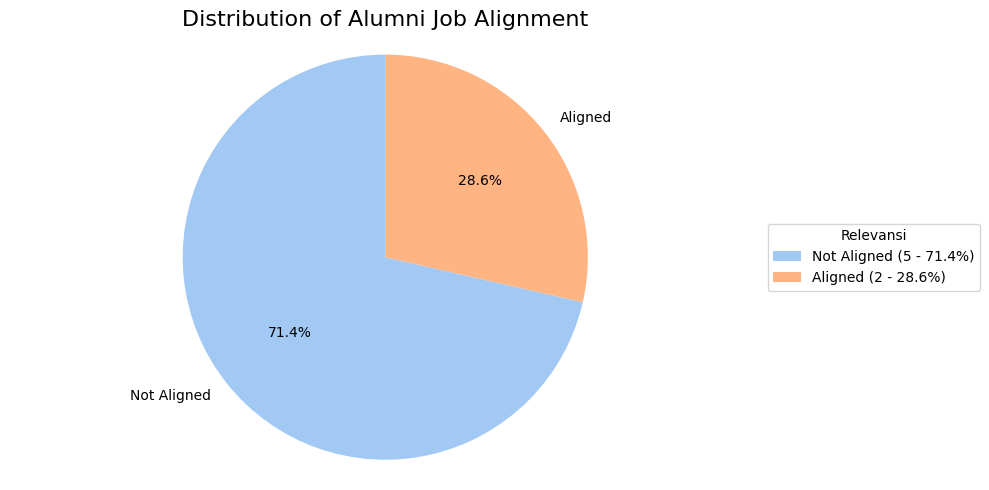

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

summary_stats = pd.DataFrame({
    'Statistik': [
        'Total Pekerjaan Alumni',
        'Aligned',
        'Tidak Aligned',
        'Alignment Rate',
        'Rata-rata Similarity Tertinggi'
    ],
    'Nilai': [
        total_alumni_jobs,
        num_aligned,
        num_not_aligned,
        f'{alignment_rate:.2f}%',
        f'{avg_similarity:.4f}'
    ]
})
display(summary_stats)

# Calculate counts and percentages
relevance_counts = analysis_df['alignment'].value_counts() # Changed from is_relevant_pred
relevance_percentages = analysis_df['alignment'].value_counts(normalize=True) * 100 # Changed from is_relevant_pred

labels = ['Aligned' if x == 1 else 'Not Aligned' for x in relevance_counts.index]
sizes = relevance_counts.values

fig, ax = plt.subplots(figsize=(5, 3))
wedges, texts, autotexts = ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))

ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax.set_title('Distribution of Alumni Job Alignment', fontsize=16)

# Adding legend with counts and percentages
legend_labels = [f'{l} ({s} - {p:.1f}%)' for l, s, p in zip(labels, sizes, relevance_percentages.values)]
ax.legend(wedges, legend_labels, title="Relevansi", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()

#### 2. Distribusi Domain Pekerjaan

Distribusi semua domain pekerjaan:


,Count
final_domain,
Cluster 0,2
Cluster 1,2
No match,1
Cluster 3,1
Cluster 4,1



Distribusi domain pekerjaan yang relevan:


,Count
final_domain,
Cluster 3,1
Cluster 1,1


/tmp/ipykernel_3237/1400101019.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=domain_distribution.index, y=domain_distribution.values, palette='viridis', ax=ax)


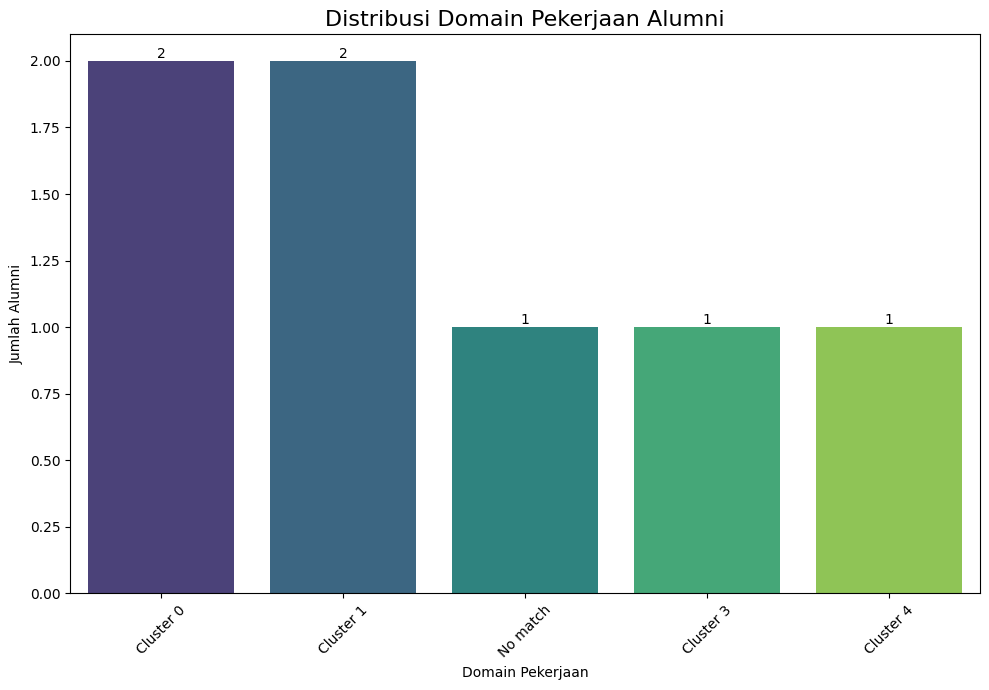


--- Insight Otomatis ---
Domain pekerjaan alumni yang paling dominan adalah 'Cluster 0' dengan 2 alumni. Hal ini mengindikasikan area keahlian IT yang paling banyak digeluti oleh alumni.


In [ ]:
print("Distribusi semua domain pekerjaan:")
display(domain_distribution.to_frame(name='Count'))

print("\nDistribusi domain pekerjaan yang relevan:")
display(aligned_domain_distribution.to_frame(name='Count'))

# Calculate value counts for final_domain
domain_distribution = analysis_df['final_domain'].value_counts().sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(10, 7))
sns.barplot(x=domain_distribution.index, y=domain_distribution.values, palette='viridis', ax=ax)

ax.set_title('Distribusi Domain Pekerjaan Alumni', fontsize=16)
ax.set_xlabel('Domain Pekerjaan')
ax.set_ylabel('Jumlah Alumni')
ax.tick_params(axis='x', rotation=45)

# Add value labels on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge')

plt.tight_layout()
plt.show()

# Automated Insight
if not domain_distribution.empty:
    top_domain = domain_distribution.index[0]
    top_domain_count = domain_distribution.values[0]
    print("\n--- Insight Otomatis ---")
    print(f"Domain pekerjaan alumni yang paling dominan adalah '{top_domain}' dengan {top_domain_count} alumni. Hal ini mengindikasikan area keahlian IT yang paling banyak digeluti oleh alumni.")
else:
    print("\n--- Insight Otomatis ---")
    print("Tidak ada data domain pekerjaan untuk dianalisis.")

#### 3. Top Occupation Match

Top 5 Pekerjaan Alumni Paling Sering Diprediksi Aligned:


,Count
top_aligned_jobs,
No match,1
PENJAMIN KUALITAS TI (IT QUALITY ASSURANCE),1
DUKUNGAN TEKNIK JUNIOR (JUNIOR TECHNICAL SUPPORT),1
MANAJER PROYEK TIK (ICT PROJECT MANAGER),1
ANALIS SOC TINGKAT 3 (L3 SOC ANALYST),1


/tmp/ipykernel_3237/2567536248.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_aligned_alumni_positions.values, y=top_aligned_alumni_positions.index, palette='crest', ax=ax)


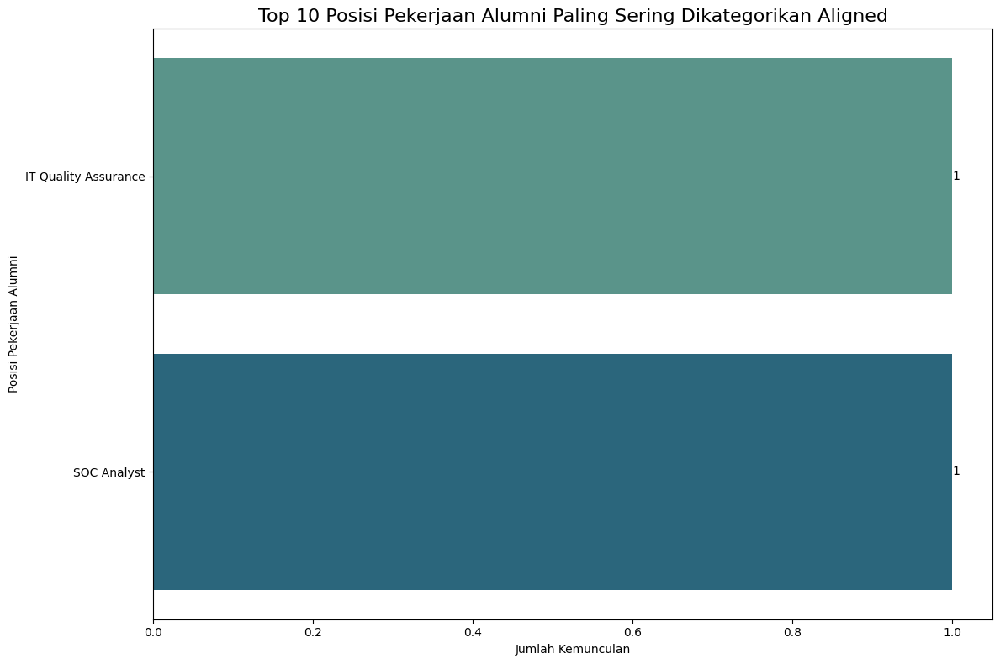


Distribusi Pekerjaan Alumni Berdasarkan Similarity (Aligned):


/tmp/ipykernel_3237/2567536248.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='highest_similarity', y='posisi_pekerjaan', data=alumni_job_similarity_data_aligned, palette='mako', ax=ax)


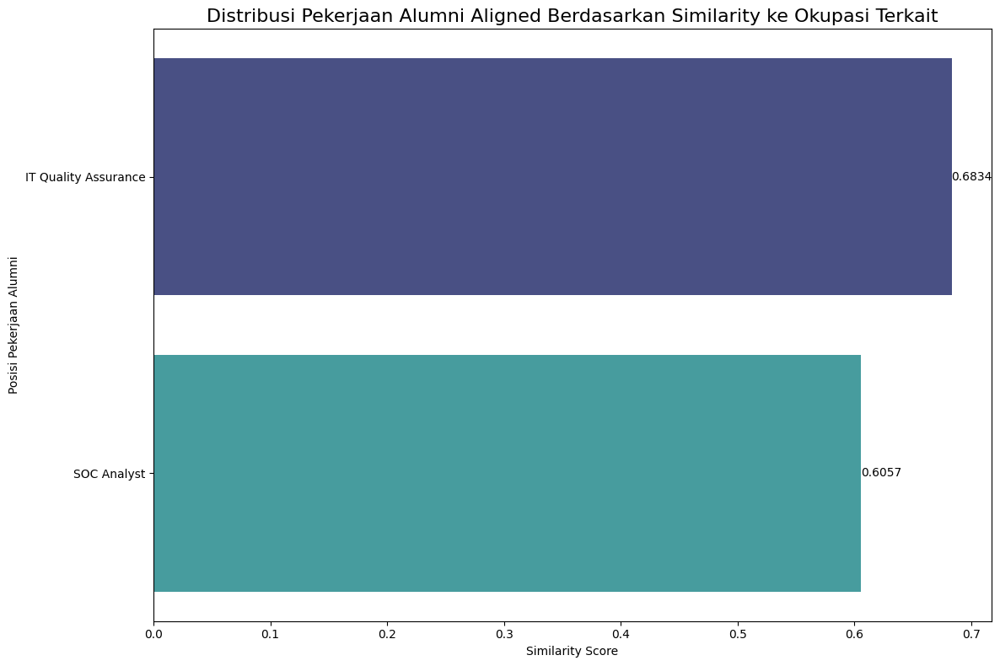


--- Insight Otomatis ---
Pekerjaan alumni aligned dengan similarity tertinggi adalah 'IT Quality Assurance' (0.6834).
Pekerjaan alumni aligned dengan similarity terendah adalah 'SOC Analyst' (0.6057).

Distribusi Pekerjaan Alumni Berdasarkan Similarity (Tidak Aligned):


/tmp/ipykernel_3237/2567536248.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='highest_similarity', y='posisi_pekerjaan', data=alumni_job_similarity_data, palette='viridis', ax=ax)


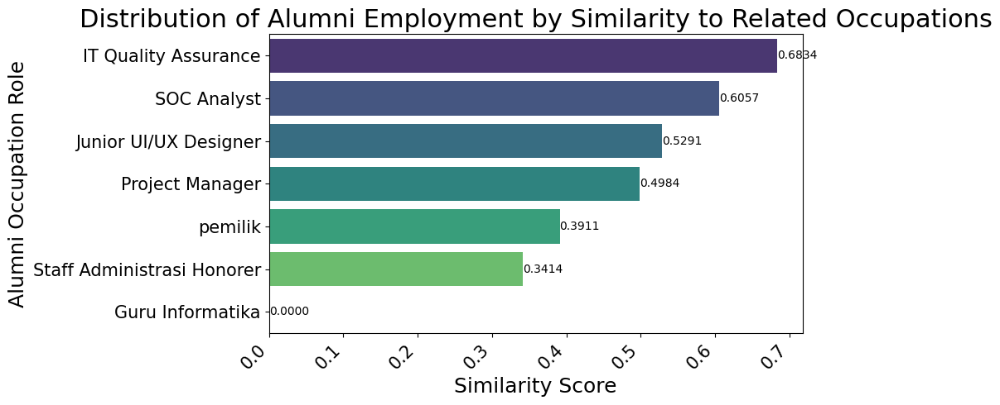

In [ ]:
print("Top 5 Pekerjaan Alumni Paling Sering Diprediksi Aligned:")
display(top_occupation_matches.to_frame(name='Count'))

# Filter for aligned jobs
aligned_alumni_jobs = analysis_df[analysis_df['alignment'] == 1]

# Calculate top 10 most frequent aligned alumni job positions
top_aligned_alumni_positions = aligned_alumni_jobs['posisi_pekerjaan'].value_counts().head(10).sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(12, 8))
sns.barplot(x=top_aligned_alumni_positions.values, y=top_aligned_alumni_positions.index, palette='crest', ax=ax)

ax.set_title('Top 10 Posisi Pekerjaan Alumni Paling Sering Dikategorikan Aligned', fontsize=16)
ax.set_xlabel('Jumlah Kemunculan')
ax.set_ylabel('Posisi Pekerjaan Alumni')

# Add value annotation on each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge')

plt.tight_layout()
plt.show()

print("\nDistribusi Pekerjaan Alumni Berdasarkan Similarity (Aligned):")

# Prepare data for the second plot: alumni job positions sorted by highest similarity for ALIGNED jobs
alumni_job_similarity_data_aligned = aligned_alumni_jobs.sort_values(by='highest_similarity', ascending=False)

fig, ax = plt.subplots(figsize=(12, 8))
sns.barplot(x='highest_similarity', y='posisi_pekerjaan', data=alumni_job_similarity_data_aligned, palette='mako', ax=ax)

ax.set_title('Distribusi Pekerjaan Alumni Aligned Berdasarkan Similarity ke Okupasi Terkait', fontsize=16)
ax.set_xlabel('Similarity Score')
ax.set_ylabel('Posisi Pekerjaan Alumni')

# Add value labels on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.4f', label_type='edge')

plt.tight_layout()
plt.show()

# Automated Insight for the new plot
if not alumni_job_similarity_data_aligned.empty:
    highest_sim_job_aligned = alumni_job_similarity_data_aligned.iloc[0]['posisi_pekerjaan']
    highest_sim_score_aligned = alumni_job_similarity_data_aligned.iloc[0]['highest_similarity']
    lowest_sim_job_aligned = alumni_job_similarity_data_aligned.iloc[-1]['posisi_pekerjaan']
    lowest_sim_score_aligned = alumni_job_similarity_data_aligned.iloc[-1]['highest_similarity']
    print("\n--- Insight Otomatis ---")
    print(f"Pekerjaan alumni aligned dengan similarity tertinggi adalah '{highest_sim_job_aligned}' ({highest_sim_score_aligned:.4f}).")
    if len(alumni_job_similarity_data_aligned) > 1:
        print(f"Pekerjaan alumni aligned dengan similarity terendah adalah '{lowest_sim_job_aligned}' ({lowest_sim_score_aligned:.4f}).")
else:
    print("\n--- Insight Otomatis ---")
    print("Tidak ada data pekerjaan alumni yang aligned untuk dianalisis berdasarkan similarity.")

# --- NEW PLOT: Distribution of Not Aligned Alumni Jobs by Similarity ---

print("\nDistribusi Pekerjaan Alumni Berdasarkan Similarity (Tidak Aligned):")

# Prepare data: all alumni job positions sorted by highest similarity
alumni_job_similarity_data = analysis_df.sort_values(
    by='highest_similarity',
    ascending=False
)

if not alumni_job_similarity_data.empty:
    fig, ax = plt.subplots(figsize=(10, 5))
    sns.barplot(x='highest_similarity', y='posisi_pekerjaan', data=alumni_job_similarity_data, palette='viridis', ax=ax)

    ax.set_title('Distribution of Alumni Employment by Similarity to Related Occupations', fontsize=22)
    ax.set_xlabel('Similarity Score', fontsize=18)
    ax.set_ylabel('Alumni Occupation Role', fontsize=18)
    plt.xticks(rotation=45, ha='right', fontsize=15)
    plt.yticks(fontsize=15)

    # Add value labels on top of each bar
    for container in ax.containers:
        ax.bar_label(container, fmt='%.4f', label_type='edge')

    plt.tight_layout()
    plt.show()

#### 4. Analisis Similarity

,Similarity Metric,Nilai
0,Rata-rata Similarity,0.4356
1,Similarity Tertinggi,0.6834
2,Similarity Terendah,0.0000


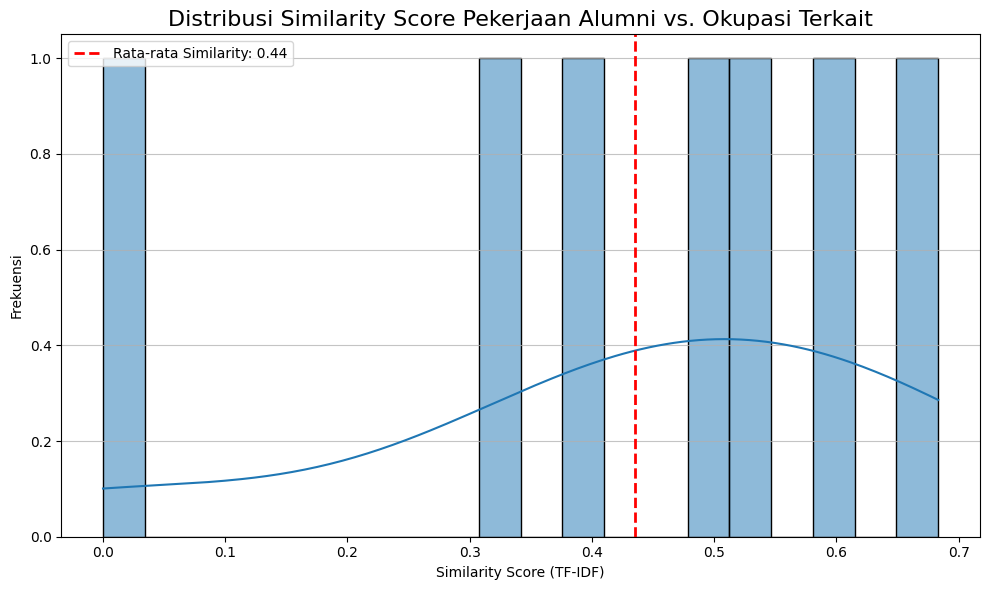


--- Insight Otomatis ---
Distribusi similarity score menunjukkan sebagian besar pekerjaan alumni memiliki tingkat kesesuaian yang rendah. Ini terlihat dari rata-rata similarity sekitar 0.44.


In [ ]:
similarity_analysis_df = pd.DataFrame({
    'Similarity Metric': ['Rata-rata Similarity', 'Similarity Tertinggi', 'Similarity Terendah'],
    'Nilai': [f'{avg_similarity:.4f}', f'{max_similarity:.4f}', f'{min_similarity:.4f}']
})
display(similarity_analysis_df)

# Calculate mean similarity
mean_similarity = analysis_df['highest_similarity'].mean()

fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(analysis_df['highest_similarity'], bins=20, kde=True, ax=ax)

ax.axvline(mean_similarity, color='red', linestyle='dashed', linewidth=2, label=f'Rata-rata Similarity: {mean_similarity:.2f}')

ax.set_title('Distribusi Similarity Score Pekerjaan Alumni vs. Okupasi Terkait', fontsize=16)
ax.set_xlabel('Similarity Score (TF-IDF)')
ax.set_ylabel('Frekuensi')
ax.legend()
ax.grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

# Automated Insight
print("\n--- Insight Otomatis ---")

# Determine the category based on mean_similarity
if mean_similarity < 0.5:
    similarity_category = 'rendah'
elif 0.5 <= mean_similarity < 0.6:
    similarity_category = 'moderat'
else:
    similarity_category = 'tinggi'

print(f"Distribusi similarity score menunjukkan sebagian besar pekerjaan alumni memiliki tingkat kesesuaian yang {similarity_category}. Ini terlihat dari rata-rata similarity sekitar {mean_similarity:.2f}.")

#### 5. Analisis Pekerjaan Tidak Relevan



Top 5 Pekerjaan Alumni Paling Sering Diprediksi TIDAK Aligned:


,Count
posisi_pekerjaan,
Guru Informatika,1
Junior UI/UX Designer,1
Project Manager,1
Staff Administrasi Honorer,1
pemilik,1


/tmp/ipykernel_3237/2552399733.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_not_aligned_positions.values, y=top_not_aligned_positions.index, palette='Reds_d', ax=ax)


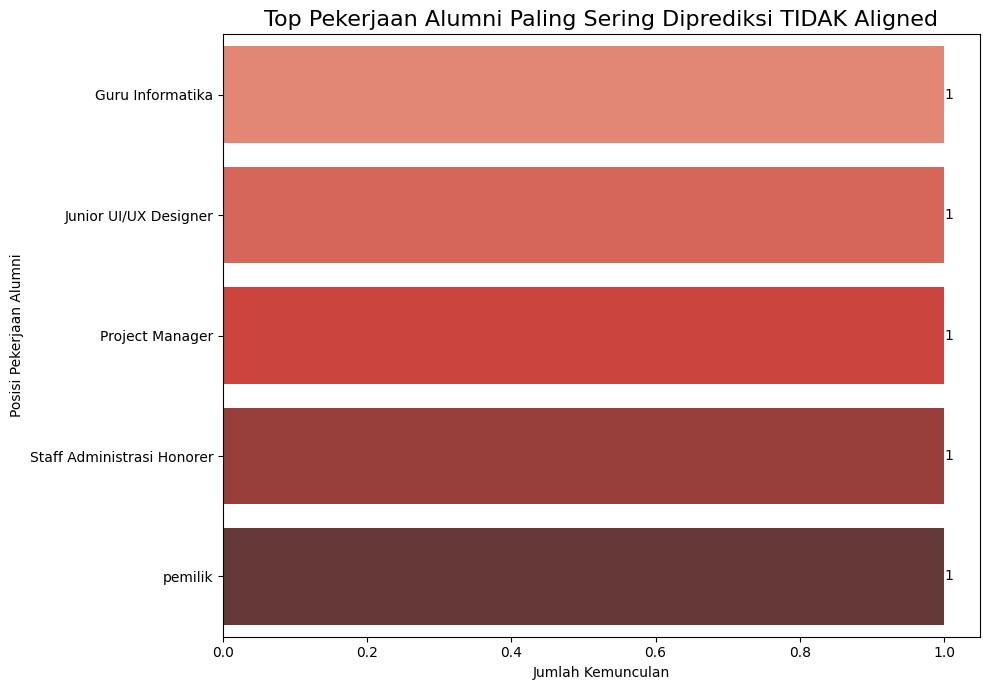


--- Insight Otomatis ---
Pekerjaan yang paling sering diprediksi tidak aligned adalah 'pemilik'. Identifikasi ini penting untuk meninjau kembali keselarasan kurikulum atau profil lulusan dengan jenis pekerjaan ini atau mengeksplorasi alasan ketidakselarasan.

Distribusi Domain untuk Pekerjaan yang Diprediksi TIDAK Aligned:


,Count
final_domain,
Cluster 0,2
No match,1
Cluster 1,1
Cluster 4,1



Contoh Pekerjaan yang Diprediksi TIDAK Aligned:


,posisi_pekerjaan,top_aligned_jobs,final_domain,highest_similarity
0,Guru Informatika,No match,No match,0.000000
2,Junior UI/UX Designer,DUKUNGAN TEKNIK JUNIOR (JUNIOR TECHNICAL SUPPORT),Cluster 0,0.529139
3,Project Manager,MANAJER PROYEK TIK (ICT PROJECT MANAGER),Cluster 1,0.498400
5,Staff Administrasi Honorer,STAF PEMROGRAM (PROGRAMMER STAFF),Cluster 0,0.341360
6,pemilik,PEMILIK PRODUK (PRODUCT OWNER),Cluster 4,0.391118


In [ ]:
print("Top 5 Pekerjaan Alumni Paling Sering Diprediksi TIDAK Aligned:")
display(top_not_aligned_jobs.to_frame(name='Count'))

# Filter for not aligned jobs
not_aligned_jobs_df = analysis_df[analysis_df['alignment'] == 0]

# Calculate top not aligned job positions
top_not_aligned_positions = not_aligned_jobs_df['posisi_pekerjaan'].value_counts().head(10).sort_values(ascending=True)

if not not_aligned_jobs_df.empty:
    fig, ax = plt.subplots(figsize=(10, 7))
    sns.barplot(x=top_not_aligned_positions.values, y=top_not_aligned_positions.index, palette='Reds_d', ax=ax)

    ax.set_title('Top Pekerjaan Alumni Paling Sering Diprediksi TIDAK Aligned', fontsize=16)
    ax.set_xlabel('Jumlah Kemunculan')
    ax.set_ylabel('Posisi Pekerjaan Alumni')

    # Add value labels on top of each bar
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', label_type='edge')

    plt.tight_layout()
    plt.show()

    # Automated Insight
    print("\n--- Insight Otomatis ---")
    print(f"Pekerjaan yang paling sering diprediksi tidak aligned adalah '{top_not_aligned_positions.index[-1]}'. Identifikasi ini penting untuk meninjau kembali keselarasan kurikulum atau profil lulusan dengan jenis pekerjaan ini atau mengeksplorasi alasan ketidakselarasan.")
else:
    print("\n--- Insight Otomatis ---")
    print("Tidak ada pekerjaan yang diprediksi tidak aligned untuk dianalisis.")

print("\nDistribusi Domain untuk Pekerjaan yang Diprediksi TIDAK Aligned:")
display(domain_low_alignment_counts.to_frame(name='Count'))

# Example of non-aligned jobs display, now correctly referencing 'top_aligned_jobs'
# Note: This is an additional display for clarity, assuming the user might also want to see this.
if not not_aligned_jobs_df.empty:
    print("\nContoh Pekerjaan yang Diprediksi TIDAK Aligned:")
    display(not_aligned_jobs_df[['posisi_pekerjaan', 'top_aligned_jobs', 'final_domain', 'highest_similarity']].head())
else:
    print("\nTidak ada pekerjaan yang diprediksi TIDAK aligned.")

#### 6. Analisis Konsistensi Domain

,Metrik Konsistensi,Nilai
0,Jumlah Kesesuaian Domain Profil-Pekerjaan,6
1,Tingkat Konsistensi Domain (%),85.71%
2,Persentase Kesesuaian Profil ↔ Pekerjaan (Pred...,100.00%



Contoh ketidaksesuaian domain (is_profile_domain_consistent_multi vs final_domain) dari pekerjaan yang diprediksi aligned:


,posisi_pekerjaan,is_profile_domain_consistent_multi,final_domain,top_aligned_jobs


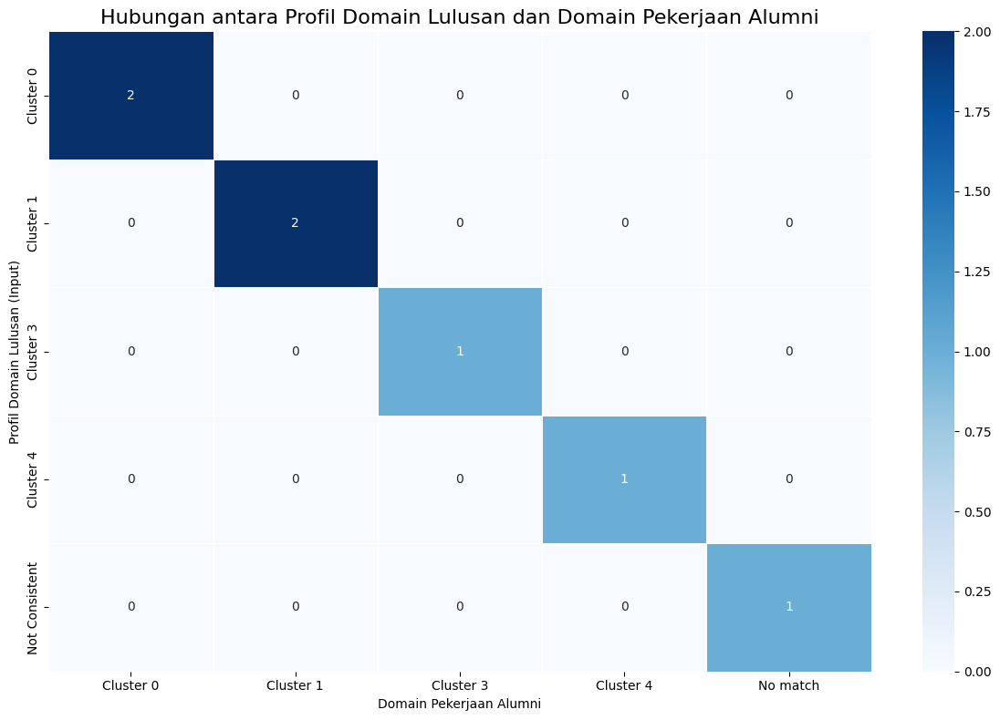


--- Insight Otomatis ---
Heatmap menunjukkan distribusi alumni berdasarkan kesesuaian antara profil domain asal dan domain pekerjaan yang diprediksi. Tingkat konsistensi langsung (profil domain sama dengan final domain) adalah 85.71% dari total pekerjaan alumni. Ini mengevaluasi sejauh mana profil lulusan mengarahkan alumni ke domain yang sama.


In [ ]:
# Calculate 'persentase kesesuaian profil ↔ pekerjaan'
# This refers to the percentage of ALIGNED jobs where is_profile_domain_consistent_multi is consistent with final_domain
aligned_jobs_count = aligned_jobs_df[(aligned_jobs_df['is_profile_domain_consistent_multi'] == aligned_jobs_df['final_domain'])].shape[0]
profile_job_alignment_percentage = (aligned_jobs_count / num_aligned * 100) if num_aligned > 0 else 0

# Update domain_consistency_df to include the new metric
domain_consistency_df = pd.DataFrame({
    'Metrik Konsistensi': [
        'Jumlah Kesesuaian Domain Profil-Pekerjaan',
        'Tingkat Konsistensi Domain (%)',
        'Persentase Kesesuaian Profil ↔ Pekerjaan (Prediksi Aligned & Domain Konsisten)'
    ],
    'Nilai': [
        domain_consistency_matches,
        f'{domain_consistency_rate:.2f}%',
        f'{profile_job_alignment_percentage:.2f}%'
    ]
})
display(domain_consistency_df)

print("\nContoh ketidaksesuaian domain (is_profile_domain_consistent_multi vs final_domain) dari pekerjaan yang diprediksi aligned:")
display(aligned_jobs_df[aligned_jobs_df['is_profile_domain_consistent_multi'] != aligned_jobs_df['final_domain']][['posisi_pekerjaan', 'is_profile_domain_consistent_multi', 'final_domain', 'top_aligned_jobs']].head())

# Create a cross-tabulation
crosstab_df = pd.crosstab(analysis_df['is_profile_domain_consistent_multi'], analysis_df['final_domain'])

fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(crosstab_df, annot=True, fmt='d', cmap='Blues', linewidths=.5, ax=ax)

ax.set_title('Hubungan antara Profil Domain Lulusan dan Domain Pekerjaan Alumni', fontsize=16)
ax.set_xlabel('Domain Pekerjaan Alumni')
ax.set_ylabel('Profil Domain Lulusan (Input)')

plt.tight_layout()
plt.show()

# Automated Insight
print("\n--- Insight Otomatis ---")
if not crosstab_df.empty:
    total_matches = crosstab_df.values.sum()
    consistent_matches = 0
    for domain in crosstab_df.index:
        if domain in crosstab_df.columns:
            consistent_matches += crosstab_df.loc[domain, domain]

    consistency_rate = (consistent_matches / total_matches * 100) if total_matches > 0 else 0
    print(f"Heatmap menunjukkan distribusi alumni berdasarkan kesesuaian antara profil domain asal dan domain pekerjaan yang diprediksi. Tingkat konsistensi langsung (profil domain sama dengan final domain) adalah {consistency_rate:.2f}% dari total pekerjaan alumni. Ini mengevaluasi sejauh mana profil lulusan mengarahkan alumni ke domain yang sama.")
else:
    print("Tidak ada data untuk membuat cross-tabulation domain.")

## SUMMARIZE

In [ ]:
print("="*80)
print("df_profil")
print("="*80)
print(alignment_dataset.columns.tolist())
display(df_profil.head())

print("="*80)
print("final_job_matching_df")
print("="*80)
print(final_job_matching_df.columns.tolist())
display(final_job_matching_df.head())

df_profil
['source_type', 'source_id', 'source_text', 'profil_id', 'profil_text', 'semantic_similarity', 'shared_domains', 'shared_domains_count', 'overlap_ratio', 'source_primary_domain', 'profil_primary_domain', 'primary_domain_match', 'source_domain_count', 'profil_domain_count', 'avg_domain_similarity', 'max_domain_similarity', 'source_top_domains', 'profil_top_domains', 'alignment_label', 'alignment_label_encoded', 'alignment_category_detailed']


,kode_profil_lulusan,kategori,text_clean,profil_clean,profil_domain,profil_similarity,profil_top_domains,profil_top_domain_scores,profil_domain_count,profil_matching_cluster_ids,profil_to_industry_max_similarity
0,PL1,profil_lulusan,Sarjana Teknik Informatika yang memiliki jiwa ...,sarjana teknik informatika memiliki jiwa seman...,Cluster 1,0.810025,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...","[0.810025, 0.77499115, 0.75999206, 0.59823227,...",6,"[1, 3, 4, 0, 2, 5]",0.692400
1,PL2,profil_lulusan,Lulusan yang mengikuti dan memanfaatkan perkem...,lulusan mengikuti memanfaatkan perkembangan te...,Cluster 4,0.780171,"[Cluster 4, Cluster 1, Cluster 3, Cluster 2, C...","[0.7801707, 0.76401144, 0.66185796, 0.594554, ...",5,"[4, 1, 3, 2, 0]",0.793943
2,PL3,profil_lulusan,Profesional unggul yang memiliki etika profesi...,profesional unggul memiliki etika profesi memi...,Cluster 4,0.477967,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]","[0.47796714, 0.45737648, 0.45713335, 0.40933418]",4,"[4, 1, 3, 0]",0.580096
3,PL4,profil_lulusan,Lulusan yang ahli di bidang bisnis dan teknolo...,lulusan ahli bidang bisnis teknologi informasi...,Cluster 0,0.574437,"[Cluster 0, Cluster 1, Cluster 4, Cluster 3, C...","[0.57443726, 0.55373466, 0.53113234, 0.5289683...",5,"[0, 1, 4, 3, 2]",0.568181
4,PL5,profil_lulusan,Lulusan yang memiliki kompetensi berstandar na...,lulusan memiliki kompetensi berstandar nasiona...,Cluster 0,0.506222,"[Cluster 0, Cluster 1, Cluster 4, Cluster 3]","[0.5062219, 0.46914744, 0.44763738, 0.44758725]",4,"[0, 1, 4, 3]",0.573054


final_job_matching_df
['posisi_pekerjaan', 'top_aligned_jobs', 'highest_similarity', 'final_domain', 'alignment_status', 'profil_top_domains', 'is_profile_domain_consistent_multi']


,posisi_pekerjaan,top_aligned_jobs,highest_similarity,final_domain,alignment_status,profil_top_domains,is_profile_domain_consistent_multi
0,Guru Informatika,No match,0.000000,No match,Not Aligned,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",Not Consistent
1,IT Quality Assurance,PENJAMIN KUALITAS TI (IT QUALITY ASSURANCE),0.683369,Cluster 3,Aligned,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]",Cluster 3
2,Junior UI/UX Designer,DUKUNGAN TEKNIK JUNIOR (JUNIOR TECHNICAL SUPPORT),0.529139,Cluster 0,Not Aligned,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]",Cluster 0
3,Project Manager,MANAJER PROYEK TIK (ICT PROJECT MANAGER),0.498400,Cluster 1,Not Aligned,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]",Cluster 1
4,SOC Analyst,ANALIS SOC TINGKAT 3 (L3 SOC ANALYST),0.605692,Cluster 1,Aligned,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, C...",Cluster 1


### VISI/MISI ↔ PROFIL LULUSAN

In [ ]:
# ==========================================================
# SUMMARY 1 : VISI/MISI ↔ PROFIL LULUSAN
# ==========================================================
from collections import Counter
import pandas as pd
import numpy as np
from collections import Counter

pd.set_option('display.max_colwidth', None)

print("=" * 90)
print("SUMMARY 1 : EVALUASI VISI/MISI ↔ PROFIL LULUSAN")
print("=" * 90)

# ----------------------------------------------------------
# Copy dataframe
# ----------------------------------------------------------

df_summary = alignment_dataset.copy()

# ----------------------------------------------------------
# Statistik Dasar
# ----------------------------------------------------------

total_alignment = len(df_summary)

avg_similarity = df_summary["semantic_similarity"].mean()
median_similarity = df_summary["semantic_similarity"].median()
max_similarity = df_summary["semantic_similarity"].max()
min_similarity = df_summary["semantic_similarity"].min()
std_similarity = df_summary["semantic_similarity"].std()

avg_shared_domain = df_summary["shared_domains_count"].mean()
avg_overlap = df_summary["overlap_ratio"].mean()
avg_domain_similarity = df_summary["avg_domain_similarity"].mean()

# ----------------------------------------------------------
# Distribusi Alignment
# ----------------------------------------------------------

df_alignment = (
    df_summary
    .sort_values(
        by=[
            "profil_id",
            "alignment_label",
            "semantic_similarity"
        ],
        ascending=[True, False, False]
    )
    .drop_duplicates(
        subset="profil_id",
        keep="first"
    )
)

alignment_count = (
    df_alignment["alignment_label"]
    .value_counts(dropna=False)
    .rename_axis("Alignment")
    .reset_index(name="Jumlah")
)

alignment_count["Persentase (%)"] = (
    alignment_count["Jumlah"] /
    len(df_alignment) *
    100
).round(2)


domain_visi = (

    df_summary[
        df_summary["source_type"]
        .str.lower()
        .str.contains("visi")
    ][
        [
            "source_type",
            "source_top_domains"
        ]
    ]

    .drop_duplicates(subset="source_type")

    .reset_index(drop=True)

)

domain_misi = (

    df_summary[
        df_summary["source_type"]
        .str.lower()
        .str.contains("misi")
    ][
        [
            "source_type",
            "source_top_domains"
        ]
    ]

    .drop_duplicates(subset="source_type")

    .reset_index(drop=True)

)

domain_profil = (

    df_summary[
        [
            "profil_text",
            "profil_top_domains"
        ]
    ]

    .drop_duplicates(subset="profil_text")

    .reset_index(drop=True)

)

domain_mapping = (

    df_summary[
        [
            "source_type",
            "profil_text",
            "source_top_domains",
            "profil_top_domains"
        ]
    ]

    .copy()

)

# ==========================================================
# FREKUENSI DOMAIN VISI, MISI, DAN PROFIL LULUSAN
# ==========================================================

# ----------------------------------------------------------
# Helper
# ----------------------------------------------------------

def count_domains(series):

    counter = Counter()

    for domains in series:

        if isinstance(domains, list):

            counter.update(domains)

    return counter

# ----------------------------------------------------------
# Hitung Domain
# ----------------------------------------------------------

visi_counter = count_domains(domain_visi["source_top_domains"])

misi_counter = count_domains(domain_misi["source_top_domains"])

profil_counter = count_domains(domain_profil["profil_top_domains"])

# ----------------------------------------------------------
# Gabungkan Seluruh Domain
# ----------------------------------------------------------

all_domains = sorted(
    set(visi_counter.keys())
    |
    set(misi_counter.keys())
    |
    set(profil_counter.keys())
)

domain_frequency = pd.DataFrame({

    "Domain": all_domains,

    "Visi": [
        visi_counter.get(domain,0)
        for domain in all_domains
    ],

    "Misi": [
        misi_counter.get(domain,0)
        for domain in all_domains
    ],

    "Profil Lulusan": [
        profil_counter.get(domain,0)
        for domain in all_domains
    ]

})

domain_frequency["Total"] = (

    domain_frequency["Visi"]

    +

    domain_frequency["Misi"]

    +

    domain_frequency["Profil Lulusan"]

)

domain_frequency = (

    domain_frequency

    .sort_values(
        "Total",
        ascending=False
    )

    .reset_index(drop=True)

)

# ----------------------------------------------------------
# Top & Bottom Alignment
# ----------------------------------------------------------

# Pisahkan Visi dan Misi
df_visi = df_summary[
    df_summary["source_type"]
    .str.lower()
    .str.contains("visi")
].copy()

df_misi = df_summary[
    df_summary["source_type"]
    .str.lower()
    .str.contains("misi")
].copy()


display_columns = [

    "source_type",

    "profil_id",

    "semantic_similarity",

    "shared_domains_count",

    "overlap_ratio",

    "alignment_label"

]

top_visi = (

    df_visi
    .sort_values(
        "semantic_similarity",
        ascending=False
    )[display_columns]
    .head(3)
)

bottom_visi = (

    df_visi
    .sort_values(
        "semantic_similarity"
    )[display_columns]
    .head(3)
)

top_misi = (

    df_misi
    .sort_values(
        "semantic_similarity",
        ascending=False
    )[display_columns]
    .head(3)
)

bottom_misi = (

    df_misi
    .sort_values(
        "semantic_similarity"
    )[display_columns]
    .head(3)
)

aligned_row = alignment_count[
    alignment_count["Alignment"]
    .astype(str)
    .str.lower()
    .isin(["aligned","align"])
]

aligned_pct = (

    aligned_row["Persentase (%)"].iloc[0]

    if not aligned_row.empty

    else 0

)

# ----------------------------------------------------------
# Statistik
# ----------------------------------------------------------

summary_table = pd.DataFrame({

    "Metric":[

        "Jumlah Pasangan Evaluasi",

        "Average Semantic Similarity",

        "Median Semantic Similarity",

        "Maximum Semantic Similarity",

        "Minimum Semantic Similarity",

        "Standard Deviation",

        "Alignment Percentage (%)",

        "Average Shared Domains",

        "Average Overlap Ratio",

        "Average Domain Similarity"

    ],

    "Value":[

        total_alignment,

        round(avg_similarity,4),

        round(median_similarity,4),

        round(max_similarity,4),

        round(min_similarity,4),

        round(std_similarity,4),

        round(aligned_pct,2),

        round(avg_shared_domain,2),

        round(avg_overlap,4),

        round(avg_domain_similarity,4)

    ]

})

# ----------------------------------------------------------
# Insight
# ----------------------------------------------------------

insight_vm_profile = []

# ----------------------------------------------------------
# Similarity (Indikator Utama)
# ----------------------------------------------------------

if avg_similarity >= 0.80:

    insight_vm_profile.append(
        f"Nilai rata-rata semantic similarity sebesar "
        f"{avg_similarity:.4f} menunjukkan hubungan semantik yang sangat kuat "
        "antara visi/misi dan profil lulusan."
    )

elif avg_similarity >= 0.60:

    insight_vm_profile.append(
        f"Nilai rata-rata semantic similarity sebesar "
        f"{avg_similarity:.4f} menunjukkan hubungan semantik yang baik "
        "antara visi/misi dan profil lulusan."
    )

else:

    insight_vm_profile.append(
        f"Nilai rata-rata semantic similarity sebesar "
        f"{avg_similarity:.4f} menunjukkan bahwa hubungan semantik "
        "antara visi/misi dan profil lulusan masih perlu ditingkatkan."
    )

# Alignment (coverage)

insight_vm_profile.append(

    f"Sebanyak {aligned_pct:.2f}% pasangan evaluasi memenuhi "
    "threshold semantic similarity ≥ 0.60 sehingga "
    "dikategorikan sebagai aligned."

)

# Shared Domain

insight_vm_profile.append(

    f"Rata-rata terdapat {avg_shared_domain:.2f} domain kompetensi yang sama pada setiap pasangan visi/misi dan profil lulusan."

)

top_domain = domain_frequency.iloc[0]

insight_vm_profile.append(
    f"Domain yang paling dominan adalah {top_domain['Domain']}, muncul pada "
    f"{top_domain['Visi']} visi, {top_domain['Misi']} misi, dan "
    f"{top_domain['Profil Lulusan']} profil lulusan."
)

# Overlap

insight_vm_profile.append(

    f"Rata-rata overlap domain sebesar {avg_overlap:.4f} menunjukkan tingkat kesamaan domain kompetensi antar pasangan evaluasi."

)

# Gap Similarity

gap_similarity = max_similarity - min_similarity

if gap_similarity >= 0.30:

    insight_vm_profile.append(
        "Variasi semantic similarity antar pasangan cukup besar sehingga masih terdapat beberapa profil lulusan yang perlu diselaraskan dengan visi dan misi."
    )

else:

    insight_vm_profile.append(
        "Sebaran semantic similarity relatif merata sehingga konsistensi profil lulusan terhadap visi dan misi sudah cukup baik."
    )

# ----------------------------------------------------------
# Summary Dictionary
# ----------------------------------------------------------

summary_vm_profile = {

    "statistics": summary_table,

    "alignment": alignment_count,

    "domain_frequency": domain_frequency,

    "domain_mapping": domain_mapping,

    "top_visi": top_visi,

    "bottom_visi": bottom_visi,

    "top_misi": top_misi,

    "bottom_misi": bottom_misi,

    "insight": insight_vm_profile

}

# ----------------------------------------------------------
# Display
# ----------------------------------------------------------

print("\nSTATISTIK UMUM")
display(summary_table)

print("\nDISTRIBUSI ALIGNMENT")
display(alignment_count)

print("DOMAIN YANG PALING SERING MUNCUL")
display(domain_frequency)

print("\nTOP VISI")
display(top_visi)

print("\nBOTTOM VISI")
display(bottom_visi)

print("\nTOP MISI")
display(top_misi)

print("\nBOTTOM MISI")
display(bottom_misi)

print("\n" + "=" * 90)
print("INSIGHT")
print("=" * 90)

for i, item in enumerate(insight_vm_profile, start=1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_vm_profile")

SUMMARY 1 : EVALUASI VISI/MISI ↔ PROFIL LULUSAN

STATISTIK UMUM


,Metric,Value
0,Jumlah Pasangan Evaluasi,10.0000
1,Average Semantic Similarity,0.5963
2,Median Semantic Similarity,0.5575
3,Maximum Semantic Similarity,0.7783
4,Minimum Semantic Similarity,0.3496
5,Standard Deviation,0.1481
6,Alignment Percentage (%),40.0000
7,Average Shared Domains,4.6000
8,Average Overlap Ratio,0.8867
9,Average Domain Similarity,0.8389



DISTRIBUSI ALIGNMENT


,Alignment,Jumlah,Persentase (%)
0,Not Aligned,3,60.0
1,Aligned,2,40.0


DOMAIN YANG PALING SERING MUNCUL


,Domain,Visi,Misi,Profil Lulusan,Total
0,Cluster 0,1,1,5,7
1,Cluster 1,1,1,5,7
2,Cluster 3,1,1,5,7
3,Cluster 4,1,1,5,7
4,Cluster 2,1,1,3,5
5,Cluster 5,0,0,1,1



TOP VISI


,source_type,profil_id,semantic_similarity,shared_domains_count,overlap_ratio,alignment_label
1,visi,PL2,0.778277,5,1.000000,Aligned
0,visi,PL1,0.766381,5,0.833333,Aligned
3,visi,PL4,0.491047,5,1.000000,Not Aligned



BOTTOM VISI


,source_type,profil_id,semantic_similarity,shared_domains_count,overlap_ratio,alignment_label
4,visi,PL5,0.349580,4,0.8,Not Aligned
2,visi,PL3,0.468598,4,0.8,Not Aligned
3,visi,PL4,0.491047,5,1.0,Not Aligned



TOP MISI


,source_type,profil_id,semantic_similarity,shared_domains_count,overlap_ratio,alignment_label
6,misi,PL2,0.757497,5,1.000000,Aligned
5,misi,PL1,0.710221,5,0.833333,Aligned
7,misi,PL3,0.567545,4,0.800000,Not Aligned



BOTTOM MISI


,source_type,profil_id,semantic_similarity,shared_domains_count,overlap_ratio,alignment_label
9,misi,PL5,0.526002,4,0.8,Not Aligned
8,misi,PL4,0.547415,5,1.0,Not Aligned
7,misi,PL3,0.567545,4,0.8,Not Aligned



INSIGHT
1. Nilai rata-rata semantic similarity sebesar 0.5963 menunjukkan bahwa hubungan semantik antara visi/misi dan profil lulusan masih perlu ditingkatkan.
2. Sebanyak 40.00% pasangan evaluasi memenuhi threshold semantic similarity ≥ 0.60 sehingga dikategorikan sebagai aligned.
3. Rata-rata terdapat 4.60 domain kompetensi yang sama pada setiap pasangan visi/misi dan profil lulusan.
4. Domain yang paling dominan adalah Cluster 0, muncul pada 1 visi, 1 misi, dan 5 profil lulusan.
5. Rata-rata overlap domain sebesar 0.8867 menunjukkan tingkat kesamaan domain kompetensi antar pasangan evaluasi.
6. Variasi semantic similarity antar pasangan cukup besar sehingga masih terdapat beberapa profil lulusan yang perlu diselaraskan dengan visi dan misi.

Summary berhasil disimpan pada variabel:
summary_vm_profile


### PROFIL LULUSAN ↔ POSISI/JABATAN LULUSAN


In [ ]:
# ==========================================================
# SUMMARY 2 : PROFIL LULUSAN ↔ POSISI/JABATAN LULUSAN
# ==========================================================

import pandas as pd
from collections import Counter
import numpy as np
import ast


print("=" * 90)
print("SUMMARY 2 : EVALUASI PROFIL LULUSAN ↔ POSISI/JABATAN LULUSAN")
print("=" * 90)

# ----------------------------------------------------------
# Copy dataframe
# ----------------------------------------------------------

df_summary = final_job_matching_df.copy()

# ----------------------------------------------------------
# Statistik Dasar
# ----------------------------------------------------------

total_job = len(df_summary)

avg_similarity = df_summary["highest_similarity"].mean()
median_similarity = df_summary["highest_similarity"].median()
max_similarity = df_summary["highest_similarity"].max()
min_similarity = df_summary["highest_similarity"].min()
std_similarity = df_summary["highest_similarity"].std()

# ----------------------------------------------------------
# Distribusi Alignment
# ----------------------------------------------------------

alignment_count = (
    df_summary["alignment_status"]
    .value_counts(dropna=False)
    .rename_axis("Alignment")
    .reset_index(name="Jumlah")
)

alignment_count["Persentase (%)"] = (
    alignment_count["Jumlah"] /
    total_job *
    100
).round(2)

# ----------------------------------------------------------
# Distribusi Domain Consistency
# ----------------------------------------------------------

consistency_count = (
    df_summary["is_profile_domain_consistent_multi"]
    .value_counts(dropna=False)
    .rename_axis("Domain Consistency")
    .reset_index(name="Jumlah")
)

consistency_count["Persentase (%)"] = (
    consistency_count["Jumlah"] /
    total_job *
    100
).round(2)

from collections import Counter
import ast

# ----------------------------------------------------------
# Frekuensi Domain Profil (Hanya Posisi Aligned)
# ----------------------------------------------------------

df_domain = df_summary[
    df_summary["alignment_status"]
    .astype(str)
    .str.lower()
    .eq("aligned")
].copy()

domain_counter = Counter()

for domains in df_domain["profil_top_domains"]:

    # Jika sudah berupa list / array
    if isinstance(domains, (list, tuple, np.ndarray)):
        domain_counter.update(domains)
        continue

    # Jika kosong
    if pd.isna(domains):
        continue

    # Jika berupa string list
    if isinstance(domains, str):

        try:
            parsed = ast.literal_eval(domains)

            if isinstance(parsed, (list, tuple)):
                domain_counter.update(parsed)
            else:
                domain_counter.update([parsed])

        except:
            domain_counter.update([domains])

domain_frequency = (
    pd.DataFrame(
        domain_counter.items(),
        columns=["Domain", "Jumlah"]
    )
    .sort_values("Jumlah", ascending=False)
    .reset_index(drop=True)
)

# ----------------------------------------------------------
# Top & Bottom Posisi
# ----------------------------------------------------------

display_columns = [

    "posisi_pekerjaan",

    "top_aligned_jobs",

    "highest_similarity",

    "final_domain",

    "alignment_status",

    "is_profile_domain_consistent_multi",

    "profil_top_domains"
]

top3 = (

    df_summary

    .sort_values(
        "highest_similarity",
        ascending=False
    )

    [display_columns]

    #.head(3)

    .reset_index(drop=True)

)

bottom3 = (

    df_summary

    .sort_values(
        "highest_similarity"
    )

    [display_columns]

    .head(3)

    .reset_index(drop=True)

)

# Alignment

aligned_row = alignment_count[
    alignment_count["Alignment"]
    .astype(str)
    .str.lower()
    .eq("aligned")
]

aligned_pct = (

    aligned_row["Persentase (%)"].iloc[0]

    if not aligned_row.empty

    else 0

)

# ----------------------------------------------------------
# Statistik
# ----------------------------------------------------------

summary_table = pd.DataFrame({

    "Metric":[

        "Jumlah Posisi/Jabatan",

        "Average Similarity",

        "Median Similarity",

        "Maximum Similarity",

        "Minimum Similarity",

        "Standard Deviation",

        "Alignment Percentage (%)"

    ],

    "Value":[

        total_job,

        round(avg_similarity,4),

        round(median_similarity,4),

        round(max_similarity,4),

        round(min_similarity,4),

        round(std_similarity,4),

        round(aligned_pct,2)

    ]

})

# ----------------------------------------------------------
# Insight
# ----------------------------------------------------------

insight_profile_job = []

# ----------------------------------------------------------
# Average Semantic Similarity (Indikator Utama)
# ----------------------------------------------------------

if avg_similarity >= 0.80:

    insight_profile_job.append(
        f"Nilai rata-rata semantic similarity sebesar "
        f"{avg_similarity:.4f} menunjukkan bahwa profil lulusan "
        "memiliki kesesuaian semantik yang sangat tinggi dengan "
        "posisi atau jabatan alumni."
    )

elif avg_similarity >= 0.60:

    insight_profile_job.append(
        f"Nilai rata-rata semantic similarity sebesar "
        f"{avg_similarity:.4f} menunjukkan bahwa profil lulusan "
        "telah memiliki kesesuaian semantik yang baik dengan "
        "posisi atau jabatan alumni."
    )

else:

    insight_profile_job.append(
        f"Nilai rata-rata semantic similarity sebesar "
        f"{avg_similarity:.4f} menunjukkan bahwa kesesuaian "
        "profil lulusan dengan posisi atau jabatan alumni "
        "masih perlu ditingkatkan."
    )

# ----------------------------------------------------------
# Alignment Coverage
# ----------------------------------------------------------

insight_profile_job.append(

    f"Sebanyak {aligned_pct:.2f}% posisi atau jabatan alumni "
    "memenuhi threshold semantic similarity ≥ 0.60 sehingga "
    "dikategorikan sebagai aligned."

)

# Domain Consistency

consistent_pct = (

    df_summary[
        df_summary["is_profile_domain_consistent_multi"]
        .astype(str)
        .str.lower()
        .ne("not consistent")
    ].shape[0]

    / total_job

    * 100

)

insight_profile_job.append(

    f"Sebanyak {consistent_pct:.2f}% posisi pekerjaan memiliki domain yang konsisten dengan profil lulusan."

)

# ----------------------------------------------------------
# Domain Dominan
# ----------------------------------------------------------

top_domain = domain_frequency.iloc[0]

insight_profile_job.append(

    f"Pada hasil pemetaan yang memenuhi kriteria alignment, "
    f"domain kompetensi yang paling sering muncul adalah "
    f"**{top_domain['Domain']}**, dengan total "
    f"**{top_domain['Jumlah']}** kemunculan."

)


# Gap Similarity

gap_similarity = max_similarity - min_similarity

if gap_similarity >= 0.30:

    insight_profile_job.append(
        "Variasi similarity antar posisi pekerjaan cukup besar sehingga masih terdapat beberapa posisi yang kurang sesuai dengan profil lulusan."
    )

else:

    insight_profile_job.append(
        "Sebaran similarity antar posisi pekerjaan relatif merata sehingga kesesuaian profil lulusan terhadap dunia kerja cukup konsisten."
    )

# ----------------------------------------------------------
# Summary Dictionary
# ----------------------------------------------------------

summary_profile_job = {

    "statistics": summary_table,

    "alignment": alignment_count,

    "domain_consistency": consistency_count,

    "domain_frequency": domain_frequency,

    "top3": top3,

    "bottom3": bottom3,

    "insight": insight_profile_job

}

# ----------------------------------------------------------
# Display
# ----------------------------------------------------------

print("\nSTATISTIK UMUM")
display(summary_table)

print("\nDISTRIBUSI ALIGNMENT")
display(alignment_count)

print("\nDISTRIBUSI DOMAIN CONSISTENCY")
display(consistency_count)

print("\nFREKUENSI DOMAIN")
display(domain_frequency)

print("\nTOP 5 POSISI/JABATAN")
display(top3)

print("\nBOTTOM 5 POSISI/JABATAN")
display(bottom3)

print("\n" + "=" * 90)
print("INSIGHT")
print("=" * 90)

for i, item in enumerate(insight_profile_job, start=1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_profile_job")

SUMMARY 2 : EVALUASI PROFIL LULUSAN ↔ POSISI/JABATAN LULUSAN

STATISTIK UMUM


,Metric,Value
0,Jumlah Posisi/Jabatan,7.0000
1,Average Similarity,0.4356
2,Median Similarity,0.4984
3,Maximum Similarity,0.6834
4,Minimum Similarity,0.0000
5,Standard Deviation,0.2250
6,Alignment Percentage (%),28.5700



DISTRIBUSI ALIGNMENT


,Alignment,Jumlah,Persentase (%)
0,Not Aligned,5,71.43
1,Aligned,2,28.57



DISTRIBUSI DOMAIN CONSISTENCY


,Domain Consistency,Jumlah,Persentase (%)
0,Cluster 0,2,28.57
1,Cluster 1,2,28.57
2,Not Consistent,1,14.29
3,Cluster 3,1,14.29
4,Cluster 4,1,14.29



FREKUENSI DOMAIN


,Domain,Jumlah
0,Cluster 4,2
1,Cluster 1,2
2,Cluster 3,2
3,Cluster 0,2
4,Cluster 2,1
5,Cluster 5,1



TOP 5 POSISI/JABATAN


,posisi_pekerjaan,top_aligned_jobs,highest_similarity,final_domain,alignment_status,is_profile_domain_consistent_multi,profil_top_domains
0,IT Quality Assurance,PENJAMIN KUALITAS TI (IT QUALITY ASSURANCE),0.683369,Cluster 3,Aligned,Cluster 3,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]"
1,SOC Analyst,ANALIS SOC TINGKAT 3 (L3 SOC ANALYST),0.605692,Cluster 1,Aligned,Cluster 1,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, Cluster 2, Cluster 5]"
2,Junior UI/UX Designer,DUKUNGAN TEKNIK JUNIOR (JUNIOR TECHNICAL SUPPORT),0.529139,Cluster 0,Not Aligned,Cluster 0,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]"
3,Project Manager,MANAJER PROYEK TIK (ICT PROJECT MANAGER),0.498400,Cluster 1,Not Aligned,Cluster 1,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]"
4,pemilik,PEMILIK PRODUK (PRODUCT OWNER),0.391118,Cluster 4,Not Aligned,Cluster 4,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]"
5,Staff Administrasi Honorer,STAF PEMROGRAM (PROGRAMMER STAFF),0.341360,Cluster 0,Not Aligned,Cluster 0,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, Cluster 2, Cluster 5]"
6,Guru Informatika,No match,0.000000,No match,Not Aligned,Not Consistent,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, Cluster 2, Cluster 5]"



BOTTOM 5 POSISI/JABATAN


,posisi_pekerjaan,top_aligned_jobs,highest_similarity,final_domain,alignment_status,is_profile_domain_consistent_multi,profil_top_domains
0,Guru Informatika,No match,0.000000,No match,Not Aligned,Not Consistent,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, Cluster 2, Cluster 5]"
1,Staff Administrasi Honorer,STAF PEMROGRAM (PROGRAMMER STAFF),0.341360,Cluster 0,Not Aligned,Cluster 0,"[Cluster 1, Cluster 3, Cluster 4, Cluster 0, Cluster 2, Cluster 5]"
2,pemilik,PEMILIK PRODUK (PRODUCT OWNER),0.391118,Cluster 4,Not Aligned,Cluster 4,"[Cluster 4, Cluster 1, Cluster 3, Cluster 0]"



INSIGHT
1. Nilai rata-rata semantic similarity sebesar 0.4356 menunjukkan bahwa kesesuaian profil lulusan dengan posisi atau jabatan alumni masih perlu ditingkatkan.
2. Sebanyak 28.57% posisi atau jabatan alumni memenuhi threshold semantic similarity ≥ 0.60 sehingga dikategorikan sebagai aligned.
3. Sebanyak 85.71% posisi pekerjaan memiliki domain yang konsisten dengan profil lulusan.
4. Pada hasil pemetaan yang memenuhi kriteria alignment, domain kompetensi yang paling sering muncul adalah **Cluster 4**, dengan total **2** kemunculan.
5. Variasi similarity antar posisi pekerjaan cukup besar sehingga masih terdapat beberapa posisi yang kurang sesuai dengan profil lulusan.

Summary berhasil disimpan pada variabel:
summary_profile_job


### SUMMARY AKHIR

In [ ]:
# ==========================================================
# SUMMARY AKHIR : PROFIL LULUSAN
# ==========================================================

import pandas as pd
import numpy as np

print("="*100)
print("SUMMARY AKHIR : EVALUASI PROFIL LULUSAN")
print("="*100)

# ----------------------------------------------------------
# Helper
# ----------------------------------------------------------

def get_average_similarity(summary, metric_name_to_find):

    statistics = summary["statistics"]

    row = statistics[
        statistics["Metric"]
        .astype(str)
        .str.lower()
        .eq(metric_name_to_find.lower())
    ]

    if row.empty:
        return None

    return float(row["Value"].iloc[0])

def get_alignment_percentage(summary):

    alignment_df = summary["alignment"]

    aligned = alignment_df[
        alignment_df["Alignment"]
        .astype(str)
        .str.lower()
        .isin(["aligned","align","ya"])
    ]

    if aligned.empty:
        return 0

    return round(float(aligned["Persentase (%)"].iloc[0]),2)

def get_condition(similarity):

    if similarity is None:
        return "Tidak Tersedia"

    if similarity >= 0.80:
        return "Sangat Baik"

    elif similarity >= 0.60:
        return "Cukup"

    else:
        return "Perlu Perbaikan"


# ----------------------------------------------------------
# Mengambil Nilai Tiap Summary
# ----------------------------------------------------------

vm_profile_score = get_average_similarity(summary_vm_profile, "Average Semantic Similarity")

job_profile_score = get_average_similarity(summary_profile_job, "Average Similarity")

# ----------------------------------------------------------
# Summary Table
# ----------------------------------------------------------

summary_final_profile = pd.DataFrame({

    "Sub-Aspek":[

        "Visi/Misi ↔ Profil Lulusan",

        "Profil Lulusan ↔ Posisi/Jabatan Lulusan"

    ],

    "Average Similarity":[

        vm_profile_score,

        job_profile_score

    ],

    "Alignment (%)":[

        get_alignment_percentage(summary_vm_profile),

        get_alignment_percentage(summary_profile_job)

    ]

})

summary_final_profile["Kondisi"] = (

    summary_final_profile["Average Similarity"]

    .apply(get_condition)

)

# ----------------------------------------------------------
# Overall
# ----------------------------------------------------------

overall_similarity = round(

    summary_final_profile[
        "Average Similarity"
    ].mean(),

    4

)

overall_condition = get_condition(overall_similarity)

# ----------------------------------------------------------
# Insight
# ----------------------------------------------------------

overall_insight = []

overall_insight.append(
    f"Secara keseluruhan aspek Profil Lulusan "
    f"memperoleh nilai rata-rata semantic similarity "
    f"sebesar {overall_similarity:.4f}, "
    f"dengan kategori '{overall_condition}'."
)

best = (

    summary_final_profile

    .sort_values(

        "Average Similarity",

        ascending=False

    )

    .iloc[0]

)

overall_insight.append(

    f"Sub-aspek dengan performa terbaik adalah '{best['Sub-Aspek']}' ({best['Average Similarity']:.2f}%)."

)

worst = (

    summary_final_profile

    .sort_values(

        "Average Similarity"

    )

    .iloc[0]

)

overall_insight.append(

    f"Sub-aspek yang menjadi prioritas evaluasi adalah '{worst['Sub-Aspek']}' ({worst['Average Similarity']:.2f}%)."

)

# ----------------------------------------------------------
# Tambahan Insight Domain
# ----------------------------------------------------------

if "domain_frequency" in summary_vm_profile:

    top_domain = (

        summary_vm_profile["domain_frequency"]

        .sort_values(

            "Total",

            ascending=False

        )

        .iloc[0]

    )

    overall_insight.append(

        f"Domain yang paling dominan adalah '{top_domain['Domain']}', muncul pada "
        f"{top_domain['Visi']} visi, "
        f"{top_domain['Misi']} misi, dan "
        f"{top_domain['Profil Lulusan']} profil lulusan."

    )


if "domain_frequency" in summary_profile_job:

    top_domain = (

        summary_profile_job["domain_frequency"]

        .sort_values(

            "Jumlah",

            ascending=False

        )

        .iloc[0]

    )

    overall_insight.append(

        f"Domain yang paling sering muncul pada pemetaan profil lulusan "
        f"terhadap posisi/jabatan alumni adalah **{top_domain['Domain']}**, "
        f"yang muncul pada **{top_domain['Jumlah']}** hasil pemetaan."

    )

# ----------------------------------------------------------
# Insight Kesesuaian Profil
# ----------------------------------------------------------

if vm_profile_score is not None and vm_profile_score >= 0.80:

    overall_insight.append(

        "Sebagian besar rumusan profil lulusan telah selaras dengan visi dan misi program studi."

    )

elif vm_profile_score is not None and vm_profile_score >= 0.60:

    overall_insight.append(

        "Mayoritas profil lulusan telah mencerminkan visi dan misi program studi meskipun masih terdapat beberapa bagian yang dapat disempurnakan."

    )

else:

    overall_insight.append(

        "Keselarasan antara visi/misi dan profil lulusan masih perlu ditingkatkan."

    )



if job_profile_score is not None and job_profile_score >= 0.80:

    overall_insight.append(

        "Sebagian besar profil lulusan telah sesuai dengan posisi atau jabatan lulusan di dunia kerja."

    )

elif job_profile_score is not None and job_profile_score >= 0.60:

    overall_insight.append(

        "Mayoritas profil lulusan telah sesuai dengan posisi pekerjaan alumni, namun masih terdapat beberapa profil yang dapat disesuaikan dengan kebutuhan dunia kerja."

    )

else:

    overall_insight.append(

        "Kesesuaian profil lulusan terhadap posisi pekerjaan alumni masih rendah sehingga perlu dilakukan evaluasi."

    )

# ----------------------------------------------------------
# Dictionary
# ----------------------------------------------------------

summary_profile_final = {

    "summary":summary_final_profile,

    "overall_score":overall_similarity,

    "overall_condition":overall_condition,

    "insight":overall_insight,
}

# ----------------------------------------------------------
# Display
# ----------------------------------------------------------

print("\nRINGKASAN EVALUASI")

display(summary_final_profile)

print("\nOVERALL")

print(f"Overall Score : {overall_similarity:.2f}")

print(f"Kondisi       : {overall_condition}")

print("\n"+"="*100)

print("INSIGHT")

print("="*100)

for i,item in enumerate(overall_insight,1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")

print("summary_profile_final")

SUMMARY AKHIR : EVALUASI PROFIL LULUSAN

RINGKASAN EVALUASI


,Sub-Aspek,Average Similarity,Alignment (%),Kondisi
0,Visi/Misi ↔ Profil Lulusan,0.5963,40.00,Perlu Perbaikan
1,Profil Lulusan ↔ Posisi/Jabatan Lulusan,0.4356,28.57,Perlu Perbaikan



OVERALL
Overall Score : 0.52
Kondisi       : Perlu Perbaikan

INSIGHT
1. Secara keseluruhan aspek Profil Lulusan memperoleh nilai rata-rata semantic similarity sebesar 0.5160, dengan kategori 'Perlu Perbaikan'.
2. Sub-aspek dengan performa terbaik adalah 'Visi/Misi ↔ Profil Lulusan' (0.60%).
3. Sub-aspek yang menjadi prioritas evaluasi adalah 'Profil Lulusan ↔ Posisi/Jabatan Lulusan' (0.44%).
4. Domain yang paling dominan adalah 'Cluster 0', muncul pada 1 visi, 1 misi, dan 5 profil lulusan.
5. Domain yang paling sering muncul pada pemetaan profil lulusan terhadap posisi/jabatan alumni adalah **Cluster 4**, yang muncul pada **2** hasil pemetaan.
6. Keselarasan antara visi/misi dan profil lulusan masih perlu ditingkatkan.
7. Kesesuaian profil lulusan terhadap posisi pekerjaan alumni masih rendah sehingga perlu dilakukan evaluasi.

Summary berhasil disimpan pada variabel:
summary_profile_final


## NARASI HASIL ANALISIS

In [ ]:
# ==========================================================
# HELPER FUNCTION - NARASI HASIL ANALISIS
# ==========================================================

from IPython.display import Markdown, display

# ----------------------------------------------------------
# Mengambil nilai statistik
# ----------------------------------------------------------

def get_stat(summary, metric):

    try:
        return summary["statistics"].loc[
            summary["statistics"]["Metric"] == metric,
            "Value"
        ].iloc[0]

    except:
        return None


# ----------------------------------------------------------
# Mengambil persentase alignment
# ----------------------------------------------------------

def get_alignment(summary):

    try:

        alignment_df = summary["alignment"]

        aligned = alignment_df[
            alignment_df["Alignment"]
            .astype(str)
            .str.lower()
            .isin(["aligned","align","ya"])
        ]

        if len(aligned)==0:
            return 0

        return round(float(aligned["Persentase (%)"].iloc[0]),2)

    except:

        return None


# ----------------------------------------------------------
# Mengambil insight
# ----------------------------------------------------------

def get_insight(summary):

    try:
        return summary["insight"]

    except:
        return []


# ----------------------------------------------------------
# Menampilkan Section Markdown
# ----------------------------------------------------------

def section(title):

    return f"\n\n## {title}\n\n"


# ----------------------------------------------------------
# Menampilkan paragraf
# ----------------------------------------------------------

def paragraph(text):

    return text + "\n\n"

In [ ]:
# ==========================================================
# GENERATE NARASI HASIL ANALISIS PROFIL LULUSAN
# ==========================================================

narasi = "# HASIL ANALISIS PROFIL LULUSAN\n"

# ==========================================================
# VISI/MISI ↔ PROFIL LULUSAN
# ==========================================================

alignment = get_alignment(summary_vm_profile)
avg = get_stat(summary_vm_profile, "Average Semantic Similarity")

narasi += section("A. Analisis Visi/Misi ↔ Profil Lulusan")

narasi += paragraph(

f"""
Hasil evaluasi menunjukkan bahwa rata-rata semantic similarity
antara Visi/Misi Program Studi dan Profil Lulusan sebesar
**{avg:.4f}**.

Nilai tersebut menunjukkan bahwa secara umum rumusan Profil
Lulusan telah memiliki keterkaitan semantik yang baik terhadap
arah pengembangan yang ditetapkan dalam Visi dan Misi Program Studi.

Sebagai indikator pendukung, sebanyak **{alignment:.2f}%**
pasangan Visi/Misi dan Profil Lulusan berhasil memenuhi
threshold semantic similarity yang ditetapkan sehingga
dikategorikan sebagai aligned.
"""

)

# ==========================================================
# DOMAIN DOMINAN
# ==========================================================

if "domain_frequency" in summary_vm_profile:

    top_domain = summary_vm_profile["domain_frequency"].iloc[0]

    narasi += paragraph(

f"""
Domain kompetensi yang paling dominan adalah
**{top_domain['Domain']}** dengan total kemunculan
sebanyak **{top_domain['Total']}** kali,
yang terdiri atas **{top_domain['Visi']}** kali pada
Visi, **{top_domain['Misi']}** kali pada Misi,
dan **{top_domain['Profil Lulusan']}** kali pada
Profil Lulusan.
"""

)

# ==========================================================
# PROFIL LULUSAN ↔ POSISI/JABATAN LULUSAN
# ==========================================================

alignment = get_alignment(summary_profile_job)
avg = get_stat(summary_profile_job, "Average Similarity")

narasi += section("B. Analisis Profil Lulusan ↔ Posisi/Jabatan Lulusan")

narasi += paragraph(

f"""
Hasil pemetaan antara Profil Lulusan dan Posisi/Jabatan
Lulusan menghasilkan rata-rata semantic similarity sebesar
**{avg:.4f}**.

Nilai tersebut menunjukkan tingkat keterkaitan antara
kompetensi yang dirumuskan pada Profil Lulusan dengan
karakteristik posisi pekerjaan alumni.

Sebagai indikator pendukung, sebanyak
**{alignment:.2f}%**
hasil pemetaan memenuhi threshold semantic similarity
sehingga dikategorikan sebagai aligned.
"""

)

# ==========================================================
# DOMAIN DOMINAN
# ==========================================================

if "domain_frequency" in summary_profile_job:

    top_domain = summary_profile_job["domain_frequency"].iloc[0]

    narasi += paragraph(

f"""
Hasil analisis terhadap pasangan Profil Lulusan dan
Posisi/Jabatan Lulusan yang dinyatakan relevan
menunjukkan bahwa domain kompetensi yang paling dominan
adalah **{top_domain['Domain']}**, dengan frekuensi kemunculan sebanyak
**{top_domain['Jumlah']}** kali. Temuan ini mengindikasikan
bahwa posisi atau jabatan alumni yang memiliki kesesuaian dengan
Profil Lulusan didominasi oleh kompetensi pada domain tersebut.
"""

)

# ==========================================================
# KESIMPULAN
# ==========================================================

overall_score = summary_profile_final["overall_score"]
overall_condition = summary_profile_final["overall_condition"]

narasi += section("C. Kesimpulan Evaluasi Profil Lulusan")

narasi += paragraph(

f"""
Secara keseluruhan,
hasil evaluasi menunjukkan bahwa aspek Profil Lulusan
memiliki tingkat keterkaitan semantik yang
**{overall_condition.lower()}**
berdasarkan rata-rata semantic similarity
pada kedua sub-aspek yang dievaluasi.
"""

)

# ==========================================================
# DISPLAY
# ==========================================================

display(Markdown(narasi))

print("="*100)
print("Narasi berhasil dibuat.")
print("="*100)

# HASIL ANALISIS PROFIL LULUSAN


## A. Analisis Visi/Misi ↔ Profil Lulusan


Hasil evaluasi menunjukkan bahwa rata-rata semantic similarity
antara Visi/Misi Program Studi dan Profil Lulusan sebesar
**0.5963**.

Nilai tersebut menunjukkan bahwa secara umum rumusan Profil
Lulusan telah memiliki keterkaitan semantik yang baik terhadap
arah pengembangan yang ditetapkan dalam Visi dan Misi Program Studi.

Sebagai indikator pendukung, sebanyak **40.00%**
pasangan Visi/Misi dan Profil Lulusan berhasil memenuhi
threshold semantic similarity yang ditetapkan sehingga
dikategorikan sebagai aligned.



Domain kompetensi yang paling dominan adalah
**Cluster 0** dengan total kemunculan
sebanyak **7** kali,
yang terdiri atas **1** kali pada
Visi, **1** kali pada Misi,
dan **5** kali pada
Profil Lulusan.




## B. Analisis Profil Lulusan ↔ Posisi/Jabatan Lulusan


Hasil pemetaan antara Profil Lulusan dan Posisi/Jabatan
Lulusan menghasilkan rata-rata semantic similarity sebesar
**0.4356**.

Nilai tersebut menunjukkan tingkat keterkaitan antara
kompetensi yang dirumuskan pada Profil Lulusan dengan
karakteristik posisi pekerjaan alumni.

Sebagai indikator pendukung, sebanyak
**28.57%**
hasil pemetaan memenuhi threshold semantic similarity
sehingga dikategorikan sebagai aligned.



Hasil analisis terhadap pasangan Profil Lulusan dan
Posisi/Jabatan Lulusan yang dinyatakan relevan
menunjukkan bahwa domain kompetensi yang paling dominan
adalah **Cluster 4**, dengan frekuensi kemunculan sebanyak
**2** kali. Temuan ini mengindikasikan
bahwa posisi atau jabatan alumni yang memiliki kesesuaian dengan
Profil Lulusan didominasi oleh kompetensi pada domain tersebut.




## C. Kesimpulan Evaluasi Profil Lulusan


Secara keseluruhan,
hasil evaluasi menunjukkan bahwa aspek Profil Lulusan
memiliki tingkat keterkaitan semantik yang
**perlu perbaikan**
berdasarkan rata-rata semantic similarity
pada kedua sub-aspek yang dievaluasi.




Narasi berhasil dibuat.


## REKOMENDASI

In [ ]:
# ==========================================================
# REKOMENDASI
# PROFIL LULUSAN
# ==========================================================

from IPython.display import Markdown, display

rekomendasi = "# REKOMENDASI EVALUASI PROFIL LULUSAN\n"

# ----------------------------------------------------------
# Mengambil nilai
# ----------------------------------------------------------

vm_score = get_stat(summary_vm_profile, "Average Semantic Similarity")

job_score = get_stat(summary_profile_job, "Average Similarity")

# Alignment hanya sebagai informasi tambahan
vm_alignment = get_alignment(summary_vm_profile)
job_alignment = get_alignment(summary_profile_job)

# ----------------------------------------------------------
# A. Visi/Misi ↔ Profil Lulusan
# ----------------------------------------------------------

rekomendasi += section("A. Rekomendasi Visi/Misi ↔ Profil Lulusan")

if vm_score >= 0.80:

    rekomendasi += paragraph(

"""
Hasil evaluasi menunjukkan bahwa Profil Lulusan telah
memiliki keselarasan yang sangat baik terhadap Visi dan
Misi Program Studi. Oleh karena itu, rekomendasi yang
diberikan adalah mempertahankan konsistensi penyusunan
Profil Lulusan serta melakukan peninjauan secara berkala
untuk memastikan kesesuaiannya terhadap perkembangan
keilmuan dan kebutuhan pemangku kepentingan.
"""

    )

elif vm_score >= 0.60:

    rekomendasi += paragraph(

"""
Profil Lulusan secara umum telah sesuai dengan Visi dan
Misi Program Studi. Namun demikian, beberapa rumusan
Profil Lulusan masih dapat disempurnakan agar lebih
merepresentasikan arah pengembangan Program Studi dan
mengakomodasi perkembangan bidang Informatika.
"""

    )

else:

    rekomendasi += paragraph(

"""
Hasil evaluasi menunjukkan bahwa hubungan Profil Lulusan terhadap Visi dan
Misi Program Studi belum optimal. Perlu dilakukan evaluasi terhadap rumusan Profil
Lulusan agar lebih selaras dengan Visi dan Misi
Program Studi sehingga arah pengembangan lulusan
lebih jelas dan konsisten.
"""

    )

# ----------------------------------------------------------
# B. Profil Lulusan ↔ Posisi/Jabatan Lulusan
# ----------------------------------------------------------

rekomendasi += section("B. Rekomendasi Profil Lulusan ↔ Posisi/Jabatan Lulusan")

if job_score >= 0.80:

    rekomendasi += paragraph(

"""
Profil Lulusan telah menunjukkan tingkat keselarasan yang
sangat baik dengan posisi atau jabatan lulusan di dunia
kerja. Program Studi disarankan untuk mempertahankan
profil yang telah dirumuskan serta terus melakukan
monitoring terhadap perkembangan kebutuhan industri.
"""

    )

elif job_score >= 0.60:

    rekomendasi += paragraph(

"""
Sebagian besar Profil Lulusan telah selaras dengan posisi
atau jabatan lulusan. Program Studi disarankan untuk
melakukan pembaruan Profil Lulusan secara berkala agar
tetap relevan terhadap perubahan kebutuhan industri dan
jenis pekerjaan yang berkembang.
"""

    )

else:

    rekomendasi += paragraph(

"""
Keselarasan Profil Lulusan terhadap posisi pekerjaan
lulusan masih perlu ditingkatkan. Program Studi
disarankan untuk mengevaluasi kembali rumusan Profil
Lulusan dengan mempertimbangkan data tracer study,
masukan alumni, serta kebutuhan kompetensi industri.
"""

    )

# ----------------------------------------------------------
# C. Rekomendasi Umum
# ----------------------------------------------------------

rekomendasi += section("C. Rekomendasi Umum")

rekomendasi += paragraph(

"""
Secara keseluruhan, evaluasi Profil Lulusan perlu
dilakukan secara berkala dengan mempertimbangkan
perkembangan kebutuhan dunia kerja, masukan dari
alumni, serta kebijakan nasional mengenai pendidikan
tinggi. Dengan demikian, Profil Lulusan yang dihasilkan
diharapkan tetap relevan, adaptif, dan mampu menjadi
dasar dalam penyusunan CPL maupun pengembangan
kurikulum Program Studi.
"""

)

# ----------------------------------------------------------
# DISPLAY
# ----------------------------------------------------------

display(Markdown(rekomendasi))

print("="*100)
print("Rekomendasi berhasil dibuat.")
print("="*100)

# REKOMENDASI EVALUASI PROFIL LULUSAN


## A. Rekomendasi Visi/Misi ↔ Profil Lulusan


Hasil evaluasi menunjukkan bahwa hubungan Profil Lulusan terhadap Visi dan
Misi Program Studi belum optimal. Perlu dilakukan evaluasi terhadap rumusan Profil
Lulusan agar lebih selaras dengan Visi dan Misi
Program Studi sehingga arah pengembangan lulusan
lebih jelas dan konsisten.




## B. Rekomendasi Profil Lulusan ↔ Posisi/Jabatan Lulusan


Keselarasan Profil Lulusan terhadap posisi pekerjaan
lulusan masih perlu ditingkatkan. Program Studi
disarankan untuk mengevaluasi kembali rumusan Profil
Lulusan dengan mempertimbangkan data tracer study,
masukan alumni, serta kebutuhan kompetensi industri.




## C. Rekomendasi Umum


Secara keseluruhan, evaluasi Profil Lulusan perlu
dilakukan secara berkala dengan mempertimbangkan
perkembangan kebutuhan dunia kerja, masukan dari
alumni, serta kebijakan nasional mengenai pendidikan
tinggi. Dengan demikian, Profil Lulusan yang dihasilkan
diharapkan tetap relevan, adaptif, dan mampu menjadi
dasar dalam penyusunan CPL maupun pengembangan
kurikulum Program Studi.




Rekomendasi berhasil dibuat.


# CAPAIAN PEMBELAJARAN LULUSAN

## LOAD DATA, PREPROCESSING, EMBEDDING, CLUSTERING

### LOAD DATA

In [ ]:
import pandas as pd
import os # Added for file path checks and directory creation

# Mount Google Drive (if not already mounted)
from google.colab import drive
drive.mount('/content/drive')

# Define dataset paths
CURRICULUM_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/'
TRACER_STUDY_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/PROCESSED/'
PON_TIK_DICTIONARY_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/'
KKNI_DICTIONARY_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/KKNI/'
INDUSTRY_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/INDUSTRI/PREPROCESSED/'
BLOOM_DICTIONARY_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/KKO_TAXONOMY_BLOOM/'

# --- Load cpl_cleaned.csv ---
df_cpl = pd.read_csv(CURRICULUM_DATASET_PATH + 'cpl/cpl_cleaned.csv')

# --- Load kompetensi_cleaned.csv ---
df_kompetensi = pd.read_csv(CURRICULUM_DATASET_PATH + 'kompetensi/kompetensi_cleaned.csv')

# --- Load tracer_study_2020.csv ---
df_tracer = pd.read_csv(TRACER_STUDY_DATASET_PATH + 'tracer_study_2020.csv')

# --- Load bigram_final_skill_list.csv dan bilingual_industry_skills ---
df_industri = pd.read_csv(INDUSTRY_DATASET_PATH + 'industry_final.csv')
print(df_industri.shape)

# --- Load pon_tik_occupations_details.csv ---
df_pon_tik = pd.read_csv(PON_TIK_DICTIONARY_PATH + 'pon_tik_competency.csv')

# --- Load kkni_level_6.csv ---
df_kkni = pd.read_csv(KKNI_DICTIONARY_PATH + 'kkni_level_6.csv')

# --- Load kko_bloom_dataset_clean.csv ---
df_bloom = pd.read_csv(BLOOM_DICTIONARY_PATH + 'kko_bloom_dataset_clean.csv')


Mounted at /content/drive
(14650, 4)


### CLEANING & PREPROCESSING

In [ ]:
# Install the deep_translator client library
%pip install deep_translator

print('deep_translator library installed.')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 1.7 MB/s eta 0:00:00
deep_translator library installed.


In [ ]:
import nltk
import re
import pandas as pd
import time # Import time for sleep
import json # Import json for specific error handling
from deep_translator import GoogleTranslator
import html # Import html for unescaping HTML entities

# Directly download NLTK data packages without checking via nltk.data.find first.
# This might bypass the "partially initialized module 'nltk' has no attribute 'data'" error
# if the issue is with nltk.data being accessed before it's fully ready during the find operation itself.
# Moved these downloads AFTER other imports to ensure nltk fully initializes.
nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)
nltk.download('punkt', quiet=True)
nltk.download('punkt_tab', quiet=True) # Added download for punkt_tab

# Import NLTK components *after* base NLTK and downloads are handled
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Initialize lemmatizer and stopwords for both Indonesian and English
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('indonesian') + stopwords.words('english'))

def translate_text_deep(text, target_language='id', max_retries=3, delay=1):
    if pd.isna(text) or not isinstance(text, str) or not text.strip():
        return "" # Return empty string for invalid/empty inputs

    text_stripped = text.strip()

    for attempt in range(max_retries):
        try:
            # GoogleTranslator automatically detects source language
            translator = GoogleTranslator(source='auto', target=target_language)
            translated_text = translator.translate(text_stripped)

            if translated_text: # Ensure translation was successful
                return html.unescape(translated_text)
            else:
                raise ValueError("Translation failed or returned empty.")
        except Exception as e:
            print(f"Deep Translator attempt {attempt + 1}/{max_retries} failed for '{text_stripped[:50]}...': {e}")
            if attempt < max_retries - 1:
                time.sleep(delay) # Wait before retrying
            else:
                print(f"All retries failed for '{text_stripped[:50]}...'. Returning original text.")
                return text # Return original text on final failure

print("New `translate_text_deep` function defined.")

def clean_text(text):
    if not isinstance(text, str): # Handle non-string types gracefully
        return ""
    text = text.lower()  # Lowercase
    text = re.sub(r'[^a-z\s]', '', text) # Remove punctuation and numbers
    tokens = word_tokenize(text)  # Tokenization
    # Remove stopwords and lemmatize
    cleaned_tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]
    return ' '.join(cleaned_tokens)

# Apply cleaning to df_cpl
df_cpl['cleaned_text'] = df_cpl['text_clean'].apply(clean_text)

# ==========================================================
# PREPROCESSING FOR df_kompetensi
# ==========================================================

# Remove missing extracted text
df_kompetensi = df_kompetensi.dropna(subset=['extracted_text'])

# Clean whitespace
df_kompetensi['extracted_text'] = (
    df_kompetensi['extracted_text']
    .astype(str)
    .str.strip()
)

# Remove empty rows
df_kompetensi = df_kompetensi[
    df_kompetensi['extracted_text'] != ''
]

# ==========================================================
# COMBINE SECTION + CONTENT
# ==========================================================

df_kompetensi['combined_text'] = (
    df_kompetensi['section']
    .astype(str)
    .str.replace('_', ' ')
    + ' '
    + df_kompetensi['extracted_text'].astype(str)
)

# ==========================================================
# TRANSLATE TO INDONESIAN
# ==========================================================

relevant_sections = [
    'course_description',
    'course_objectives',
    'methods_instruction'
]

df_kompetensi = df_kompetensi[
    df_kompetensi['section'].isin(relevant_sections)
]

print("Translating df_kompetensi to Indonesian using deep_translator...")

df_kompetensi['translated_text'] = (
    df_kompetensi['combined_text']
    .apply(translate_text_deep)
)

# ==========================================================
# COMBINE ALL SECTIONS INTO ONE TEXT PER COURSE
# ==========================================================

df_course_representation = (
    df_kompetensi
    .groupby(['course_code', 'course_name'])['translated_text']
    .apply(lambda texts: ' '.join(texts))
    .reset_index()
)

# Rename column
df_course_representation.columns = [
    'course_code',
    'course_name',
    'combined_course_text'
]

# ==========================================================
# CLEAN FINAL COMBINED TEXT
# ==========================================================

df_course_representation['cleaned_text'] = (
    df_course_representation['combined_course_text']
    .apply(clean_text)
)

# Apply cleaning to df_kkni
df_kkni['cleaned_text'] = df_kkni['description'].apply(clean_text)
df_pon_tik['cleaned_text'] = df_pon_tik['competency_unit'].apply(clean_text)

print("Cleaning and Preprocessing complete.")

print("\n df_cpl head with cleaned_text:")
display(df_cpl[['text_clean', 'cleaned_text']].head())

print("\n df_course_representation head with cleaned_text (after translation):")
display(
    df_course_representation[
        ['course_code','course_name', 'combined_course_text', 'cleaned_text']
    ].head()
)
print("\n df_kkni head with cleaned_text:")
display(df_kkni[['description', 'cleaned_text']].head())

print("\n df_pon_tik head with cleaned_text:")
display(df_pon_tik[['competency_unit', 'cleaned_text']].head())

New `translate_text_deep` function defined.
Translating df_kompetensi to Indonesian using deep_translator...
Deep Translator attempt 1/3 failed for 'course objectives studi islam 1 kompetensi yang di...': course objectives studi islam 1 kompetensi yang diharapkan kontrak belajar penjelasan singkat pokok pokok bahasan studi islam. topic manusia dan agama  ceramah interaktif  robertson, roland. interpretasi  diskusi sosial atas agama. jakarta sub topics rajawali, pengertian agama dan tujuan  nasution, harun. islam ditinjau beragama dari berbagai aspeknya, jakarta mengapa manusia membutuhkan ui press, agama  nottingham, elizabeth k. agama 2 dimensi dimensi agama dan masyarakat, jakarta fungsi agama bagi masyarakat rajawali, modern  puspito, hendro. sosiologi agama. jakarta kanisius,  smart, ninian. the world’s religions. cambridge university press. topic islam sebagai agama dunia  ceramah interaktif  al faruqi, ismail r dan al faruqi, 3  diskusi lois lamya, atlas budaya sub topi

,text_clean,cleaned_text
0,memiliki kepribadian yang beriman dan bertaqwa...,memiliki kepribadian beriman bertaqwa tuhan ym...
1,mampu bersaing di pasar global dengan pengetah...,bersaing pasar global pengetahuan kemampuan me...
2,memiliki pengetahuan yang memadai terkait deng...,memiliki pengetahuan memadai terkait membangun...
3,mampu meningkatkan pengetahuan dan kemampuan t...,meningkatkan pengetahuan kemampuan terkait pem...
4,mempunyai kemampuan komunikasi dalam mendefini...,kemampuan komunikasi mendefinisikan kebutuhan ...



 df_course_representation head with cleaned_text (after translation):


,course_code,course_name,combined_course_text,cleaned_text
0,FTK101,Algoritma & Pemrograman,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,deskripsi mata kuliah mata kuliah bertujuan pe...
1,FTK103,Pemrograman Visual,deskripsi kursus kursus ini dimaksudkan untuk ...,deskripsi kursus kursus kursus pengantar pemro...
2,FTK111,Kalkulus 1,course description mata kuliah ini dimaksudkan...,course description mata kuliah kemampuan mahas...
3,FTK121,Aljabar Linear,Deskripsi Mata Kuliah Mata kuliah ini memberik...,deskripsi mata kuliah mata kuliah pemahaman pe...
4,FTK151,Metodologi Penelitian dan Ilmiah,Deskripsi Mata Kuliah Mata kuliah ini akan mem...,deskripsi mata kuliah mata kuliah pemahaman ko...



 df_kkni head with cleaned_text:


,description,cleaned_text
0,Mampu mengaplikasikan bidang keahliannya dan m...,mengaplikasikan bidang keahliannya memanfaatka...
1,Menguasai konsep teoritis bidang pengetahuan t...,menguasai konsep teoritis bidang pengetahuan k...
2,Mampu mengambil keputusan yang tepat berdasark...,mengambil keputusan berdasarkan analisis infor...
3,Bertanggung jawab pada pekerjaan sendiri dan d...,bertanggung pekerjaan tanggung pencapaian hasi...



 df_pon_tik head with cleaned_text:


,competency_unit,cleaned_text
0,orang yang bertanggung jawab untuk memimpin da...,orang bertanggung memimpin mengelola teknologi...
1,mengembangkan dan mengimplementasikan strategi...,mengembangkan mengimplementasikan strategi tek...
2,mengelola dan mengoptimalkan aset ti,mengelola mengoptimalkan aset ti
3,berintegritas,berintegritas
4,analitis,analitis


### TEXT EMBEDDING

In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np

# Install sentence-transformers if not already installed
try:
    from sentence_transformers import SentenceTransformer
except ImportError:
    %pip install sentence-transformers
    from sentence_transformers import SentenceTransformer

# Load the multilingual Sentence Transformer model
print("Loading Sentence Transformer model 'paraphrase-multilingual-MiniLM-L12-v2'...")
embedding_model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
print("Model loaded.")

# --- Embeddings for df_cpl ---
print("Generating embeddings for df_cpl...")
df_cpl['embedding'] = [embedding_model.encode(text) for text in df_cpl['cleaned_text'].tolist()]
print("Embeddings for df_cpl generated.")
cpl_embeddings = np.array(df_cpl['embedding'].tolist())
print(f"Shape of df_cpl embeddings: {cpl_embeddings.shape}")

# --- Embeddings for df_kompetensi ---
print("Generating embeddings for df_kompetensi...")
df_course_representation['embedding'] = [embedding_model.encode(text) for text in df_course_representation['combined_course_text'].tolist()]
print("Embeddings for df_kompetensi generated.")
kompetensi_embeddings = np.array(df_course_representation['embedding'].tolist())
print(f"Shape of df_kompetensi embeddings: {kompetensi_embeddings.shape}")

# --- Embeddings for df_kkni ---
print("Generating embeddings for df_kkni...")
df_kkni['embedding'] = [embedding_model.encode(text) for text in df_kkni['cleaned_text'].tolist()]
print("Embeddings for df_kkni generated.")
kkni_embeddings = np.array(df_kkni['embedding'].tolist())
print(f"Shape of df_kkni embeddings: {kkni_embeddings.shape}")

# --- Embeddings for df_industri ---
print("Generating embeddings for df_industri...")
df_industri['embedding'] = [embedding_model.encode(text) for text in df_industri['competency_embedding_text'].tolist()]
print("Embeddings for df_industri generated.")
industri_embeddings = np.array(df_industri['embedding'].tolist())
print(f"Shape of df_industri embeddings: {industri_embeddings.shape}")

# --- Embeddings for df_pon_tik ---
print("Generating embeddings for df_pon_tik...")
df_pon_tik['embedding'] = [embedding_model.encode(text) for text in df_pon_tik['cleaned_text'].tolist()]
print("Embeddings for df_pon_tik generated.")
pon_tik_embeddings = np.array(df_pon_tik['embedding'].tolist())
print(f"Shape of df_ppon_tik embeddings: {pon_tik_embeddings.shape}")


print("--- Text Embedding --- END")

Loading Sentence Transformer model 'paraphrase-multilingual-MiniLM-L12-v2'...


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.89k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/645 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  471MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/526 [00:00<?, ?B/s]

tokenizer.json: reconstructing file:   0%|          |  0.00B / 9.08MB            

tokenizer.json: downloading bytes:           |  0.00B            

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Model loaded.
Generating embeddings for df_cpl...
Embeddings for df_cpl generated.
Shape of df_cpl embeddings: (11, 384)
Generating embeddings for df_kompetensi...
Embeddings for df_kompetensi generated.
Shape of df_kompetensi embeddings: (54, 384)
Generating embeddings for df_kkni...
Embeddings for df_kkni generated.
Shape of df_kkni embeddings: (4, 384)
Generating embeddings for df_industri...
Embeddings for df_industri generated.
Shape of df_industri embeddings: (14650, 384)
Generating embeddings for df_pon_tik...
Embeddings for df_pon_tik generated.
Shape of df_ppon_tik embeddings: (7092, 384)
--- Text Embedding --- END


### AGGLOMERATIVE CLUSTERING UNTUK KOMPETENSI INDUSTRI

Bagian ini akan melakukan _Agglomerative Clustering_ pada data kompetensi industri menggunakan _embeddings_ yang telah dihitung. Tujuannya adalah untuk mengidentifikasi kelompok-kelompok kompetensi yang serupa.

RUNNING AGGLOMERATIVE CLUSTERING
Total Competencies : 7092
Total Clusters     : 938

Top 20 Largest Clusters


,0
cluster,
179,276
61,204
16,178
183,171
25,149
17,119
40,114
151,107
3,106




SAMPLE CLUSTER CONTENT

Cluster 179
--------------------------------------------------
• orang yang bertanggung jawab atas perencanaan, pengembangan, dan pelaksanaan sistem informasi dan keamanan di sebuah organisasi. mereka bekerja sama dengan berbagai pihak, termasuk manajer bisnis, teknisi, dan pengguna akhir, untuk memastikan bahwa sistem informasi memenuhi kebutuhan organisasi dan melindungi data dan infrastrukturnya.
• menangani keamanan sistem informasi
• mengelola sistem pertahanan dan perlindungan keamanan informasi
• mengelola aspek keamanan sistem informasi pada setiap kegiatan upgrade/peremajaan sistem informasi
• melaksanakan uji coba sistem pertahanan keamanan informasi
• mengimplementasikan koreksi atas kerentanan keamanan informasi
• mengelola insiden keamanan informasi
• mengimplementasikan manajemen perbaikan/respon yang terkait dengan keamanan informasi
• menerapkan prinsip perlindungan informasi
• menerapkan standarstandar keamanan informasi yang berlaku
• mengapl

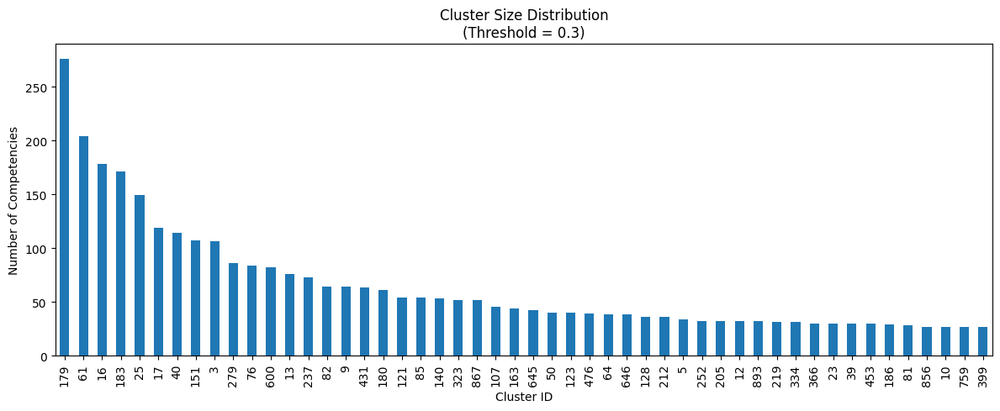


Building linkage matrix...
Done.


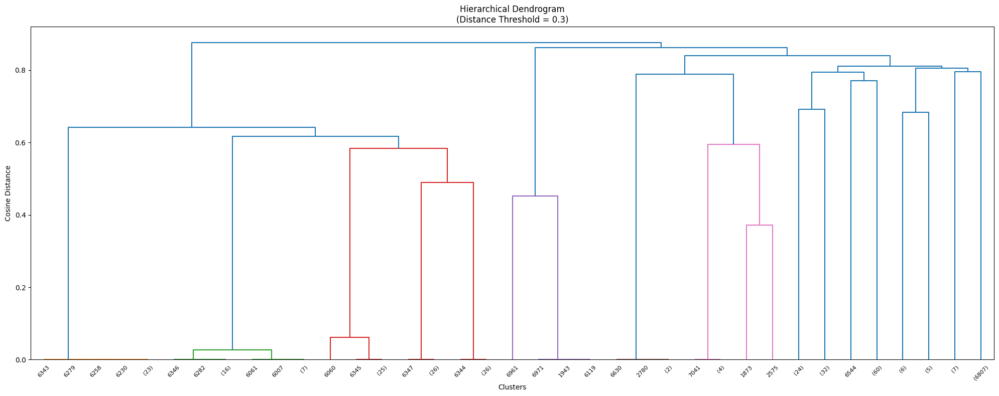


Saved: /content/pon_tik_clustered.csv


In [ ]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ============================================================
# PARAMETERS
# ============================================================

DISTANCE_THRESHOLD = 0.30

# ============================================================
# AGGLOMERATIVE CLUSTERING
# ============================================================

print("=" * 80)
print("RUNNING AGGLOMERATIVE CLUSTERING")
print("=" * 80)

agg = AgglomerativeClustering(
    n_clusters=None,
    distance_threshold=DISTANCE_THRESHOLD,
    metric="cosine",
    linkage="average"
)

cluster_labels = agg.fit_predict(pon_tik_embeddings)

# ============================================================
# SAVE CLUSTER LABELS
# ============================================================

df_pon_tik["cluster"] = cluster_labels

total_competencies = len(df_pon_tik)
total_clusters = df_pon_tik["cluster"].nunique()

print(f"Total Competencies : {total_competencies}")
print(f"Total Clusters     : {total_clusters}")

# ============================================================
# CLUSTER SIZE
# ============================================================

cluster_sizes = (
    df_pon_tik
    .groupby("cluster")
    .size()
    .sort_values(ascending=False)
)

print("\nTop 20 Largest Clusters")
display(cluster_sizes.head(20))

# ============================================================
# SAMPLE CLUSTERS
# ============================================================

print("\n")
print("=" * 80)
print("SAMPLE CLUSTER CONTENT")
print("=" * 80)

for cluster_id in cluster_sizes.head(10).index:

    print(f"\nCluster {cluster_id}")
    print("-" * 50)

    sample_items = (
        df_pon_tik[
            df_pon_tik["cluster"] == cluster_id
        ]["competency_unit"]
        .head(15)
        .tolist()
    )

    for item in sample_items:
        print(f"• {item}")

# ============================================================
# CLUSTER DISTRIBUTION
# ============================================================

plt.figure(figsize=(12,5))

cluster_sizes.head(50).plot(kind="bar")

plt.title(
    f"Cluster Size Distribution\n"
    f"(Threshold = {DISTANCE_THRESHOLD})"
)

plt.xlabel("Cluster ID")
plt.ylabel("Number of Competencies")

plt.tight_layout()
plt.show()

# ============================================================
# DENDROGRAM
# ============================================================

print("\nBuilding linkage matrix...")

linkage_matrix = linkage(
    pon_tik_embeddings,
    method="average",
    metric="cosine"
)

print("Done.")

plt.figure(figsize=(20,8))

dendrogram(
    linkage_matrix,
    truncate_mode="level",
    p=5
)

plt.title(
    f"Hierarchical Dendrogram\n"
    f"(Distance Threshold = {DISTANCE_THRESHOLD})"
)

plt.xlabel("Clusters")
plt.ylabel("Cosine Distance")

plt.tight_layout()
plt.show()

# ============================================================
# SAVE RESULT
# ============================================================

output_file = "/content/pon_tik_clustered.csv"

df_pon_tik.to_csv(
    output_file,
    index=False,
    encoding="utf-8-sig"
)

print(f"\nSaved: {output_file}")

RUNNING AGGLOMERATIVE CLUSTERING

Building linkage matrix...
Done.


MULTI LEVEL HIERARCHY
Level 0.30 -> 938 clusters
Level 0.40 -> 431 clusters
Level 0.45 -> 287 clusters
Level 0.50 -> 191 clusters
Level 0.55 -> 125 clusters
Level 0.60 -> 75 clusters
Level 0.70 -> 26 clusters
Level 0.80 -> 6 clusters
Level 0.85 -> 3 clusters
Level 0.90 -> 1 clusters
Level 1.00 -> 1 clusters


DOMAIN ANALYSIS (cluster_0.5)


,count
cluster_0.5,
126,1018
44,525
163,354
112,345
176,262
...,...
97,1
20,1
41,1


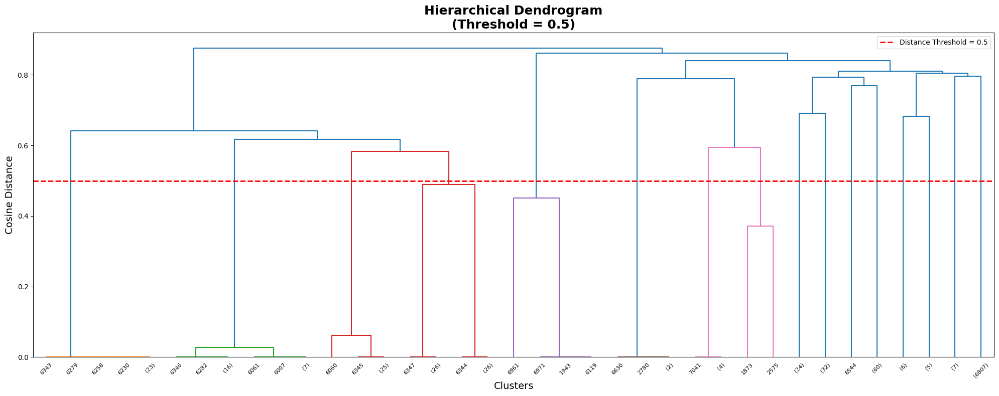



DOMAIN 1
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya;
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya;
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• memiliki moral, etika dan kepribadian yang baik di dalam menyelesaikan tugasnya
• m

,domain_id,size,sample_1,sample_2,sample_3
125,126,1018,"pengetahuan yang mendalam tentang hukum, perat...",design and implement a security system,"manage security, privacy and compliance of clo..."
43,44,525,berintegritas,bertanggung jawab,mampu mengarahkan dan mempunyai visi
162,163,354,mengelola tim program tik,merancang antarmuka pengguna yang sesuai denga...,"memelihara aplikasi yang ada, mencakup perbaik..."
111,112,345,melaksanakan kegiatan pemulihan data,mengidentifikasi dan melaporkan masalah kualitas,mengambil keputusan yang tepat berdasarkan ana...
175,176,262,orang yang bertanggung jawab untuk memimpin da...,mengembangkan dan mengimplementasikan strategi...,develop a knowledge management strategy (menge...
190,191,255,mengorganisasi dan mengatur proyek perencanaan...,merancang pemulihan jaringan,merancang pemulihan jaringan
31,32,241,memimpin tim,mampu memimpin tim,memimpin dan mengelola tim ti
42,43,194,kemampuan untuk berkomunikasi secara efektif.,komunikatif,kemampuan untuk berkomunikasi secara efektif d...
139,140,189,melakukan pemantauan dan evaluasi kepatuhan pe...,melakukan pemantauan dan evaluasi kepatuhan,manage assessment and validation of it solutions
179,180,174,merencanakan dan mengorganisasi pekerjaan,mengelola proyek secara terintegrasi (project ...,mengelola pengadaan-pengadaan proyek (project ...



Saved Files:
/content/pon_tik_hierarchy.csv
/content/pon_tik_domain_summary.csv


In [ ]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import (
    linkage,
    dendrogram,
    fcluster
)

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ============================================================
# PARAMETERS
# ============================================================

DISTANCE_THRESHOLD = 0.30

HIERARCHY_LEVELS = [
    0.30,
    0.40,
    0.45,
    0.50,
    0.55,
    0.60,
    0.70,
    0.80,
    0.85,
    0.90,
    1.00
]

# ============================================================
# AGGLOMERATIVE CLUSTERING
# ============================================================

print("=" * 80)
print("RUNNING AGGLOMERATIVE CLUSTERING")
print("=" * 80)

# ============================================================
# LINKAGE MATRIX
# ============================================================

print("\nBuilding linkage matrix...")

linkage_matrix = linkage(
    pon_tik_embeddings,
    method="average",
    metric="cosine"
)

print("Done.")

# ============================================================
# MULTI LEVEL HIERARCHY
# ============================================================

print("\n")
print("=" * 80)
print("MULTI LEVEL HIERARCHY")
print("=" * 80)

hierarchy_df = df_pon_tik.copy()

for level in HIERARCHY_LEVELS:

    hierarchy_df[f"cluster_{level}"] = fcluster(
        linkage_matrix,
        t=level,
        criterion="distance"
    )

    n_clusters = (
        hierarchy_df[
            f"cluster_{level}"
        ]
        .nunique()
    )

    print(
        f"Level {level:.2f} "
        f"-> {n_clusters} clusters"
    )

# ============================================================
# DOMAIN EXPLORATION
# ============================================================

TARGET_LEVEL = "cluster_0.5"
NUMERIC_TARGET_LEVEL = 0.5 # Added numeric target level

print("\n")
print("=" * 80)
print(f"DOMAIN ANALYSIS ({TARGET_LEVEL})")
print("=" * 80)

domain_sizes = (
    hierarchy_df[TARGET_LEVEL]
    .value_counts()
    .sort_values(ascending=False)
)

display(domain_sizes)

# ============================================================
# DENDROGRAM
# ============================================================

plt.figure(figsize=(20,8))

dendrogram(
    linkage_matrix,
    truncate_mode="level",
    p=5
)

# ------------------------------------------------------------
# Cut-off Line
# ------------------------------------------------------------

plt.axhline(
    y=NUMERIC_TARGET_LEVEL, # Changed to use NUMERIC_TARGET_LEVEL
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"Distance Threshold = {NUMERIC_TARGET_LEVEL}" # Updated label
)

plt.title(
    f"Hierarchical Dendrogram\n"
    f"(Threshold = {NUMERIC_TARGET_LEVEL})", # Updated title
    fontsize=18,
    fontweight="bold"
)

plt.xlabel("Clusters", fontsize=14)
plt.ylabel("Cosine Distance", fontsize=14)

plt.legend(loc="upper right")

plt.tight_layout()
plt.show()

# ============================================================
# DOMAIN CONTENT
# ============================================================

for domain_id in sorted(domain_sizes.index): # Changed this line to sort numerically

    print("\n")
    print("=" * 80)
    print(f"DOMAIN {domain_id}")
    print("=" * 80)

    examples = (
        hierarchy_df[
            hierarchy_df[TARGET_LEVEL] == domain_id
        ]["competency_unit"]
        .head(50)
        .tolist()
    )

    for item in examples:
        print("•", item)

# ============================================================
# DOMAIN SUMMARY TABLE
# ============================================================

domain_summary = []

for domain_id in sorted(
    hierarchy_df[TARGET_LEVEL].unique()
):

    rows = hierarchy_df[
        hierarchy_df[TARGET_LEVEL] == domain_id
    ]

    competencies = (
        rows["competency_unit"]
        .tolist()
    )

    domain_summary.append({

        "domain_id":
            domain_id,

        "size":
            len(rows),

        "sample_1":
            competencies[0]
            if len(competencies) > 0
            else "",

        "sample_2":
            competencies[1]
            if len(competencies) > 1
            else "",

        "sample_3":
            competencies[2]
            if len(competencies) > 2
            else ""
    })

domain_df = pd.DataFrame(
    domain_summary
)

domain_df = (
    domain_df
    .sort_values(
        "size",
        ascending=False
    )
)

print("\n")
print("=" * 80)
print("TOP DOMAINS")
print("=" * 80)

display(domain_df.head(50))

# ============================================================
# SAVE RESULTS
# ============================================================

hierarchy_output = (
    "/content/pon_tik_hierarchy.csv"
)

domain_output = (
    "/content/pon_tik_domain_summary.csv"
)

hierarchy_df.to_csv(
    hierarchy_output,
    index=False,
    encoding="utf-8-sig"
)

domain_df.to_csv(
    domain_output,
    index=False,
    encoding="utf-8-sig"
)

print("\nSaved Files:")
print(hierarchy_output)
print(domain_output)

In [ ]:
# ============================================================
# CLUSTER SUMMARY TABLE
# ============================================================

from collections import Counter
import re

# ------------------------------------------------------------
# Stopwords sederhana
# ------------------------------------------------------------

stopwords = {
    "dan","atau","yang","dengan","untuk","dalam","pada","ke",
    "di","dari","oleh","serta","agar","melakukan","menggunakan",
    "mampu","memiliki","melalui","sesuai","terhadap","proses",
    "sistem","teknologi","informasi"
}

# ------------------------------------------------------------
# Fungsi mengambil keyword representatif
# ------------------------------------------------------------

def extract_keywords(texts, top_n=5):

    words = []

    for text in texts:

        text = str(text).lower()

        text = re.sub(r"[^a-zA-Z\s]", " ", text)

        tokens = [
            w for w in text.split()
            if len(w) > 2 and w not in stopwords
        ]

        words.extend(tokens)

    counter = Counter(words)

    return ", ".join(
        [word for word, freq in counter.most_common(top_n)]
    )

# ------------------------------------------------------------
# Ringkasan tiap cluster
# ------------------------------------------------------------

cluster_summary = []

for cluster_id, group in df_pon_tik.groupby("cluster"):

    keywords = extract_keywords(
        group["competency_unit"],
        top_n=5
    )

    cluster_summary.append({

        "Cluster": cluster_id,

        "Number of Skills": len(group),

        "Representative Keywords": keywords

    })

cluster_summary_df = (
    pd.DataFrame(cluster_summary)
    .sort_values("Number of Skills", ascending=False)
)

display(cluster_summary_df.head(50))

,Cluster,Number of Skills,Representative Keywords
179,179,276,"keamanan, kesadaran, program, data, mengelola"
61,61,204,"audit, keamanan, prosedur, pelaksanaan, aki"
16,16,178,"teliti, bekerja, tim, beretika, kritis"
183,183,171,"komunikatif, kemampuan, berkomunikasi, efektif..."
25,25,149,"siber, keamanan, insiden, pengujian, penanganan"
17,17,119,"tim, memimpin, teamwork, kemampuan, bekerja"
40,40,114,"jaringan, merancang, pemeliharaan, masalah, me..."
151,151,107,"layanan, manajemen, menerapkan, menyusun, peng..."
3,3,106,"perangkat, lunak, kebutuhan, software, aplikasi"
279,279,86,"data, pribadi, pelindungan, kerja, program"


In [ ]:
import pandas as pd
import numpy as np

# ============================================================
# PARAMETERS
# ============================================================

TARGET_LEVEL = "cluster_0.5"

# ============================================================
# DOMAIN MAPPING
# ============================================================

domain_mapping = {}

# ==========================
# HARD SKILL
# ==========================
for d in [
5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,26,27,28,29,30,
31,34,35,37,40,41,42,45,48,49,50,51,52,53,54,55,57,58,59,60,61,62,63,64,
65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,
91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,
113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,
133,134,135,136,137,138,139,140,141,142,143,144,145,147,148,149,150,151,152,153,
154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,
174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191
]:
    domain_mapping[d] = "Hard"

# ==========================
# SOFT SKILL
# ==========================
for d in [
1,2,3,4,25,32,33,36,38,39,43,
44,46,47,56,79,146

]:
    domain_mapping[d] = "Soft"

# ============================================================
# ASSIGN HARD / SOFT / OTHER
# ============================================================

hierarchy_df["skill_category"] = (
    hierarchy_df[TARGET_LEVEL]
    .map(domain_mapping)
)

# ============================================================
# VALIDATION
# ============================================================

print("\n")
print("=" * 80)
print("VALIDATION")
print("=" * 80)

missing_domains = sorted(

    hierarchy_df[
        hierarchy_df["skill_category"].isna()
    ][TARGET_LEVEL].unique()

)

if len(missing_domains) == 0:

    print("All domains successfully mapped.")

else:

    print("Missing domains:")
    print(missing_domains)

# ============================================================
# CATEGORY DISTRIBUTION
# ============================================================

print("\n")
print("=" * 80)
print("SKILL CATEGORY DISTRIBUTION")
print("=" * 80)

display(

    hierarchy_df[
        "skill_category"
    ].value_counts()

)

# ============================================================
# DOMAIN DISTRIBUTION
# ============================================================

print("\n")
print("=" * 80)
print("DOMAIN DISTRIBUTION")
print("=" * 80)

domain_distribution = (

    hierarchy_df
    .groupby([
        TARGET_LEVEL,
        "skill_category"
    ])
    .size()
    .reset_index(name="count")

)

display(domain_distribution)

# ============================================================
# PREVIEW RESULT
# ============================================================

print("\n")
print("=" * 80)
print("SAMPLE RESULT")
print("=" * 80)

display(

    hierarchy_df[
        [
            "competency_unit",
            TARGET_LEVEL,
            "skill_category"
        ]
    ].head(20)

)

# ============================================================
# SAVE FINAL RESULT
# ============================================================

output_file = "/content/pon_tik_labeled.csv"

hierarchy_df.to_csv(
    output_file,
    index=False,
    encoding="utf-8-sig"
)

print("\n")
print("=" * 80)
print("SAVED FILE")
print("=" * 80)
print(output_file)



VALIDATION
All domains successfully mapped.


SKILL CATEGORY DISTRIBUTION


,count
skill_category,
Hard,5666
Soft,1426




DOMAIN DISTRIBUTION


,cluster_0.5,skill_category,count
0,1,Soft,27
1,2,Soft,27
2,3,Soft,27
3,4,Soft,54
4,5,Hard,4
...,...,...,...
186,187,Hard,6
187,188,Hard,45
188,189,Hard,9
189,190,Hard,89




SAMPLE RESULT


,competency_unit,cluster_0.5,skill_category
0,orang yang bertanggung jawab untuk memimpin da...,176,Hard
1,mengembangkan dan mengimplementasikan strategi...,176,Hard
2,mengelola dan mengoptimalkan aset ti,55,Hard
3,berintegritas,44,Soft
4,analitis,38,Soft
5,mengatasi masalah (problem-solving),146,Soft
6,merencanakan dan mengorganisasi pekerjaan,180,Hard
7,memimpin tim,32,Soft
8,bertanggung jawab,44,Soft
9,mampu mengarahkan dan mempunyai visi,44,Soft




SAVED FILE
/content/pon_tik_labeled.csv


In [ ]:
from sentence_transformers import SentenceTransformer
import pandas as pd
import numpy as np

# ============================================================
# PARAMETERS
# ============================================================

TARGET_LEVEL = "cluster_0.5"

# ============================================================
# VALIDATION
# ============================================================

print("=" * 80)
print("CREATING DOMAIN REPRESENTATIONS")
print("=" * 80)

print(
    f"Total Competencies : {len(hierarchy_df)}"
)

print(
    f"Total Domains      : "
    f"{hierarchy_df[TARGET_LEVEL].nunique()}"
)

# ============================================================
# CREATE DOMAIN REPRESENTATIONS
# ============================================================

domain_rows = []

for domain_id in sorted(
    hierarchy_df[TARGET_LEVEL].unique()
):

    subset = hierarchy_df[
        hierarchy_df[TARGET_LEVEL] == domain_id
    ]

    # --------------------------------------------------------
    # Domain Text
    # --------------------------------------------------------

    domain_text = " ".join(
        subset["competency_unit"]
        .astype(str)
        .tolist()
    )

    # --------------------------------------------------------
    # Domain Category
    # --------------------------------------------------------

    category_counts = (
        subset["skill_category"]
        .value_counts()
    )

    # Fix: Handle cases where category_counts might be empty (all skill_category are NaN)
    if category_counts.empty:
        domain_category = "Other" # Assign 'Other' if no specific category found (i.e., all NaNs)
    else:
        domain_category = (
            category_counts.idxmax()
        )

    # --------------------------------------------------------
    # Save
    # --------------------------------------------------------

    domain_rows.append({

        "domain_id":
            domain_id,

        "skill_category":
            domain_category,

        "num_competencies":
            len(subset),

        "domain_text":
            domain_text
    })

# ============================================================
# DOMAIN DATAFRAME
# ============================================================

df_domain = pd.DataFrame(
    domain_rows
)

print("\n")
print("=" * 80)
print("DOMAIN CATEGORY DISTRIBUTION")
print("=" * 80)

display(
    df_domain[
        "skill_category"
    ].value_counts()
)

print("\n")
print("=" * 80)
print("SAMPLE DOMAINS")
print("=" * 80)

display(
    df_domain.head()
)

# ============================================================
# LOAD EMBEDDING MODEL
# ============================================================

print("\n")
print("=" * 80)
print("LOADING EMBEDDING MODEL")
print("=" * 80)

embedding_model = SentenceTransformer(
    "paraphrase-multilingual-MiniLM-L12-v2"
)

# ============================================================
# DOMAIN EMBEDDINGS
# ============================================================

print("\nGenerating domain embeddings...")

df_domain["embedding"] = [

    embedding_model.encode(
        text
    )

    for text in df_domain[
        "domain_text"
    ]
]

domain_embeddings = np.array(
    df_domain["embedding"].tolist()
)

print("Done.")

print(
    f"\nDomain Embedding Shape: "
    f"{domain_embeddings.shape}"
)

# ============================================================
# CONVERT EMBEDDING TO LIST
# ============================================================

df_domain["embedding"] = df_domain[
    "embedding"
].apply(
    lambda x: x.tolist()
)

# ============================================================
# SAVE SINGLE FILE
# ============================================================

output_file = (
    "/content/pon_tik_domain_representation.csv"
)

df_domain.to_csv(

    output_file,

    index=False,

    encoding="utf-8-sig"
)

print("\nSaved:")
print(output_file)

# ============================================================
# SUMMARY
# ============================================================

print("\n")
print("=" * 80)
print("SUMMARY")
print("=" * 80)

print(
    f"Total Domains : "
    f"{len(df_domain)}"
)

print(
    f"Hard Domains : "
    f"{(df_domain['skill_category'] == 'Hard').sum()}"
)

print(
    f"Soft Domains : "
    f"{(df_domain['skill_category'] == 'Soft').sum()}"
)

print(
    f"Other Domains : "
    f"{(df_domain['skill_category'] == 'Other').sum()}"
)

print("\nSaved Files:")
print(domain_output)


CREATING DOMAIN REPRESENTATIONS
Total Competencies : 7092
Total Domains      : 191


DOMAIN CATEGORY DISTRIBUTION


,count
skill_category,
Hard,174
Soft,17




SAMPLE DOMAINS


,domain_id,skill_category,num_competencies,domain_text
0,1,Soft,27,"memiliki moral, etika dan kepribadian yang bai..."
1,2,Soft,27,"menghargai keanekaragaman budaya, pandangan, k..."
2,3,Soft,27,mampu bekerja sama dan memiliki kepekaan sosia...
3,4,Soft,54,berperan sebagai warga negara yang bangga dan ...
4,5,Hard,4,memasang motherboard memasang motherboard komp...




LOADING EMBEDDING MODEL


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]


Generating domain embeddings...
Done.

Domain Embedding Shape: (191, 384)

Saved:
/content/pon_tik_domain_representation.csv


SUMMARY
Total Domains : 191
Hard Domains : 174
Soft Domains : 17
Other Domains : 0

Saved Files:
/content/pon_tik_domain_summary.csv


### Saving Agglomerative Clustering Results to Google Drive

In [ ]:
import os

# Define the output directory in Google Drive
AGGLOMERATIVE_OUTPUT_DIR = os.path.join(PON_TIK_DICTIONARY_PATH, 'AGGLOMERATIVE_CLUSTERING_OUTPUT')

# Create the directory if it doesn't exist
os.makedirs(AGGLOMERATIVE_OUTPUT_DIR, exist_ok=True)

print(f"Created output directory: {AGGLOMERATIVE_OUTPUT_DIR}")

Created output directory: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/AGGLOMERATIVE_CLUSTERING_OUTPUT


In [ ]:
# Save df_pon_tik (after initial clustering) to Google Drive
pon_tik_clustered_gdrive_path = os.path.join(AGGLOMERATIVE_OUTPUT_DIR, 'pon_tik_clustered.csv')
df_pon_tik.to_csv(pon_tik_clustered_gdrive_path, index=False, encoding='utf-8-sig')
print(f"Saved df_pon_tik (clustered) to: {pon_tik_clustered_gdrive_path}")

# Save hierarchy_df (after multi-level hierarchy) to Google Drive
pon_tik_hierarchy_gdrive_path = os.path.join(AGGLOMERATIVE_OUTPUT_DIR, 'pon_tik_hierarchy.csv')
hierarchy_df.to_csv(pon_tik_hierarchy_gdrive_path, index=False, encoding='utf-8-sig')
print(f"Saved hierarchy_df (hierarchy) to: {pon_tik_hierarchy_gdrive_path}")

# Save domain_df (domain summary) to Google Drive
pon_tik_domain_summary_gdrive_path = os.path.join(AGGLOMERATIVE_OUTPUT_DIR, 'pon_tik_domain_summary.csv')
domain_df.to_csv(pon_tik_domain_summary_gdrive_path, index=False, encoding='utf-8-sig')
print(f"Saved domain_df (domain summary) to: {pon_tik_domain_summary_gdrive_path}")

# Save hierarchy_df (after skill category labeling) to Google Drive
pon_tik_labeled_gdrive_path = os.path.join(AGGLOMERATIVE_OUTPUT_DIR, 'pon_tik_labeled.csv')
hierarchy_df.to_csv(pon_tik_labeled_gdrive_path, index=False, encoding='utf-8-sig')
print(f"Saved hierarchy_df (labeled) to: {pon_tik_labeled_gdrive_path}")

# Save skill_keyword_dictionary to Google Drive
domain_gdrive_path = os.path.join(AGGLOMERATIVE_OUTPUT_DIR, 'pon_tik_domain_representation.csv')
df_domain.to_csv(domain_gdrive_path, index=False, encoding='utf-8-sig')
print(f"Saved skill_keyword_dictionary to: {domain_gdrive_path}")

Saved df_pon_tik (clustered) to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/AGGLOMERATIVE_CLUSTERING_OUTPUT/pon_tik_clustered.csv
Saved hierarchy_df (hierarchy) to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/AGGLOMERATIVE_CLUSTERING_OUTPUT/pon_tik_hierarchy.csv
Saved domain_df (domain summary) to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/AGGLOMERATIVE_CLUSTERING_OUTPUT/pon_tik_domain_summary.csv
Saved hierarchy_df (labeled) to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/AGGLOMERATIVE_CLUSTERING_OUTPUT/pon_tik_labeled.csv
Saved skill_keyword_dictionary to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/Dictionary/PON_TIK/AGGLOMERATIVE_CLUSTERING_OUTPUT/pon_tik_domain_representation.csv


## MAPPING

### KKNI vs CPL & KOMPETENSI

#### CPL ↔ KKNI MAPPING (Cosine Similarity)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

# Define the similarity threshold (not used for filtering anymore, but kept for reference)
SIMILARITY_THRESHOLD = 0.60

print("--- Starting CPL ∙ KKNI Mapping and Analysis ---")

# ===================================================================
# STEP 1 — COSINE SIMILARITY MAPPING (CPL ∙ KKNI with specific matching)
# ===================================================================
print("\n1. Performing CPL ∙ KKNI mapping based on kkni_no and point_id...")
cpl_kkni_mapping_data = []

# Check if embeddings are available and not empty
if cpl_embeddings.size == 0 or kkni_embeddings.size == 0:
    print("Warning: CPL or KKNI embeddings are empty. Skipping similarity calculation.")
else:
    # Iterate through each CPL entry to find its corresponding KKNI point
    for cpl_idx, cpl_row in df_cpl.iterrows():
        cpl_text = cpl_row['cleaned_text']
        cpl_kkni_no = cpl_row['kkni_no']
        kode_cpl = cpl_row['kode_cpl'] # Extract kode_cpl from cpl_row

        # Find the specific KKNI row that matches the cpl_kkni_no
        # Assuming kkni_no in df_cpl directly maps to point_id in df_kkni
        matching_kkni_rows = df_kkni[df_kkni['point_id'] == cpl_kkni_no]

        if not matching_kkni_rows.empty:
            # There should ideally be only one matching KKNI point_id
            kkni_row_index = matching_kkni_rows.index[0] # Get the original index of the KKNI row
            kkni_description = matching_kkni_rows.iloc[0]['description']

            # Calculate similarity between this CPL's embedding and the matched KKNI's embedding
            # cpl_embeddings[cpl_idx] refers to the embedding for the current cpl_row
            # kkni_embeddings[kkni_row_index] refers to the embedding for the matched kkni_row
            similarity_score = cosine_similarity(
                cpl_embeddings[cpl_idx].reshape(1, -1),
                kkni_embeddings[kkni_row_index].reshape(1, -1)
            )[0][0]

            cpl_kkni_mapping_data.append({
                'kode_cpl': kode_cpl, # Include kode_cpl
                'kkni_no': cpl_kkni_no,
                'cpl_text': cpl_text,
                'kkni_description': kkni_description,
                'similarity_score': similarity_score
            })
        else:
            print(f"No matching KKNI point_id found for CPL with kkni_no={cpl_kkni_no}. Skipping.")


# ===================================================================
# STEP 2 — BUILD RESULT DATAFRAME
# ===================================================================

print("\n2. Building result dataframe df_cpl_kkni_mapping...")
df_cpl_kkni_mapping = pd.DataFrame(cpl_kkni_mapping_data)


# ===================================================================
# STEP 3 — THRESHOLD FILTERING (REMOVED as per user request)
# ===================================================================

# User requested to remove filtering, so df_cpl_kkni_mapping_final will contain all mappings
# The SIMILARITY_THRESHOLD is now only for reference and not actively used for filtering.
print("\n3. Skipping threshold filtering as per user request. All mappings will be included.")
df_cpl_kkni_mapping_final = df_cpl_kkni_mapping.copy()


# ===================================================================
# STEP 4 — SORTING
# ===================================================================

print("\n4. Sorting result dataframe by similarity_score (descending)...")
df_cpl_kkni_mapping_final = df_cpl_kkni_mapping_final.sort_values(
    by='similarity_score', ascending=False
).reset_index(drop=True)

# ===================================================================
# ADD ALIGNMENT LABEL COLUMN
# ===================================================================
df_cpl_kkni_mapping_final['alignment_label'] = df_cpl_kkni_mapping_final['similarity_score'].apply(lambda x: 'Aligned' if x >= SIMILARITY_THRESHOLD else 'Not Aligned')

# ===================================================================
# STEP 5 — BASIC ANALYSIS
# ===================================================================

print("\n5. Performing basic analysis...")

if not df_cpl_kkni_mapping_final.empty:
    num_cpl_mapped = df_cpl_kkni_mapping_final['cpl_text'].nunique()
    print(f"- Jumlah CPL yang berhasil ter-mapping (total, no filtering): {num_cpl_mapped}")

    avg_similarity = df_cpl_kkni_mapping_final['similarity_score'].mean()
    highest_similarity = df_cpl_kkni_mapping_final['similarity_score'].max()
    lowest_similarity = df_cpl_kkni_mapping_final['similarity_score'].min()

    print(f"- Rata-rata similarity score: {avg_similarity:.4f}")
    print(f"- Similarity score tertinggi: {highest_similarity:.4f}")
    print(f"- Similarity score terendah: {lowest_similarity:.4f}")

    print("\n- Distribusi nilai similarity:")
    display(df_cpl_kkni_mapping_final['similarity_score'].describe().to_frame())
else:
    print("Tidak ada CPL yang ter-mapping untuk dianalisis.")


# ===================================================================
# STEP 6 — OUTPUT VALIDATION
# ===================================================================

print("\n6. Performing output validation...")

print("\n--- df_cpl_kkni_mapping_final ---")
print("Full DataFrame:")
display(df_cpl_kkni_mapping_final)
print("Shape:", df_cpl_kkni_mapping_final.shape)


--- Starting CPL ∙ KKNI Mapping and Analysis ---

1. Performing CPL ∙ KKNI mapping based on kkni_no and point_id...

2. Building result dataframe df_cpl_kkni_mapping...

3. Skipping threshold filtering as per user request. All mappings will be included.

4. Sorting result dataframe by similarity_score (descending)...

5. Performing basic analysis...
- Jumlah CPL yang berhasil ter-mapping (total, no filtering): 11
- Rata-rata similarity score: 0.4621
- Similarity score tertinggi: 0.7191
- Similarity score terendah: 0.3126

- Distribusi nilai similarity:


,similarity_score
count,11.000000
mean,0.462117
std,0.128297
min,0.312604
25%,0.367959
50%,0.425460
75%,0.530086
max,0.719078



6. Performing output validation...

--- df_cpl_kkni_mapping_final ---
Full DataFrame:


,kode_cpl,kkni_no,cpl_text,kkni_description,similarity_score,alignment_label
0,CPL-TIF-07,1,memiliki keahlian bidang bisnis teknologi kons...,Mampu mengaplikasikan bidang keahliannya dan m...,0.719078,Aligned
1,CPL-TIF-08,1,mengembangkan kepribadian berkualitas berinteg...,Mampu mengaplikasikan bidang keahliannya dan m...,0.614359,Aligned
2,CPL-TIF-03,2,memiliki pengetahuan memadai terkait membangun...,Menguasai konsep teoritis bidang pengetahuan t...,0.552555,Not Aligned
3,CPL-TIF-02,1,bersaing pasar global pengetahuan kemampuan me...,Mampu mengaplikasikan bidang keahliannya dan m...,0.507617,Not Aligned
4,CPL-TIF-11,4,wawasan keilmuan keunggulan bidang teknik info...,Bertanggung jawab pada pekerjaan sendiri dan d...,0.473166,Not Aligned
5,CPL-TIF-01,4,memiliki kepribadian beriman bertaqwa tuhan ym...,Bertanggung jawab pada pekerjaan sendiri dan d...,0.425460,Not Aligned
6,CPL-TIF-04,2,meningkatkan pengetahuan kemampuan terkait pem...,Menguasai konsep teoritis bidang pengetahuan t...,0.419428,Not Aligned
7,CPL-TIF-06,4,desain holistik model arsitektur teknik inform...,Bertanggung jawab pada pekerjaan sendiri dan d...,0.402942,Not Aligned
8,CPL-TIF-09,4,berkontribusi meningkatkan pemberdayaan masyar...,Bertanggung jawab pada pekerjaan sendiri dan d...,0.332976,Not Aligned
9,CPL-TIF-05,3,kemampuan komunikasi mendefinisikan kebutuhan ...,Mampu mengambil keputusan yang tepat berdasark...,0.323106,Not Aligned


Shape: (11, 6)


#### KOMPETENSI ↔ KKNI MAPPING (Semantic + Cognitive Alignment)

This section implements a more comprehensive alignment process between Course Learning Outcomes (CPL - represented by `df_course_representation`) and KKNI (Indonesian National Qualifications Framework) descriptors. It combines semantic similarity with a cognitive alignment score based on Bloom's Taxonomy.

**Pipeline Overview:**
1.  **Course-Level Text Representation**: Uses `df_course_representation['combined_course_text']`.
2.  **Extract KKO Verbs**: Identifies operational verbs from Bloom's Taxonomy in both course and KKNI texts.
3.  **Map Verbs to Bloom Levels**: Assigns Bloom levels (C1-C6) to detected verbs and determines dominant/highest levels.
4.  **Semantic Embedding**: Generates embeddings for course and KKNI texts.
5.  **Cosine Similarity**: Calculates semantic similarity between courses and KKNI.
6.  **Bloom Alignment Scoring**: Compares Bloom levels of courses and KKNI to assess cognitive alignment.
7.  **Final Alignment Score**: Combines semantic and Bloom scores.
8.  **Final Output**: Presents a detailed alignment dataframe.

In [ ]:
import pandas as pd
import numpy as np
import re
from sklearn.metrics.pairwise import cosine_similarity

print("---∙ Starting Comprehensive KOMPETENSI ∙ KKNI Mapping ---")

# --- Helper Function: Light Preprocessing ---
def light_preprocess(text):
    if not isinstance(text, str): # Handle non-string types gracefully
        return ""
    text = text.lower()

    # remove extra whitespace
    text = re.sub(r'\s+', ' ', text)

    # remove unwanted symbols only
    text = re.sub(r'[^\w\s]', ' ', text)

    text = text.strip()
    return text

# --- MODIFICATION #1: IMPROVE KKO EXTRACTION (Multi-word phrase matching) ---
def extract_kko_verbs(text, bloom_verbs_set):
    # Ensure text is preprocessed for consistent matching
    processed_text = light_preprocess(text)

    detected_verbs = []
    for verb in bloom_verbs_set:
        # Use regex for whole word/phrase matching to avoid substring false positives
        # re.escape handles special characters in the verb string
        pattern = r'\b' + re.escape(verb) + r'\b'
        if re.search(pattern, processed_text):
            detected_verbs.append(verb)

    return list(set(detected_verbs)) # Return unique detected verbs

# --- MODIFIED: BLOOM LEVEL MAPPING FUNCTION (to return only unique_levels) ---
def map_verbs_to_bloom_levels(verbs_list, df_bloom_map_multi):
    if not verbs_list:
        return set() # Return empty set if no verbs

    all_detected_levels = []
    for verb in verbs_list:
        # Retrieve all Bloom levels for the verb from the new multi-value map
        levels_for_verb = df_bloom_map_multi.get(verb, [])
        all_detected_levels.extend(levels_for_verb)

    if not all_detected_levels:
        return set() # Return empty set if no valid Bloom levels found

    unique_levels = set(all_detected_levels)
    return unique_levels # Return as a set as requested by the internal logic

# --- NEW FUNCTION: calculate_bloom_alignment_score (implements shared Bloom level matching) ---
def calculate_bloom_alignment_score(course_levels, kkni_levels):

    # Convert to sets to ensure uniqueness and enable set operations
    course_levels_set = set(course_levels)
    kkni_levels_set = set(kkni_levels)

    bloom_score = 0.0
    bloom_alignment_label = "Not Aligned"
    shared_levels = set()

    # Jika salah satu kosong -> tidak aligned
    if not course_levels_set or not kkni_levels_set:
        pass

    else:
        # Cari irisan level Bloom
        shared_levels = course_levels_set.intersection(kkni_levels_set)

        # ======================================================
        # NEW RULE:
        # jika ada minimal 1 shared level -> score = 1
        # jika tidak ada overlap -> score = 0
        # ======================================================

        if len(shared_levels) > 0:
            bloom_score = 1.0
            bloom_alignment_label = "Aligned"
        else:
            bloom_score = 0.0
            bloom_alignment_label = "Not Aligned"

    return bloom_score, bloom_alignment_label, list(shared_levels)
# --- Prepare Bloom Data ---
df_bloom['raw_verb_lower'] = df_bloom['raw_verb'].str.lower()
# Group by lowercased verb and aggregate all bloom_levels into a list
df_bloom_map_multi = (
    df_bloom.groupby('raw_verb_lower')['bloom_level']
    .apply(lambda x: list(set(x))) # Get unique levels for each verb
    .to_dict()
)
bloom_verbs_set = set(df_bloom['raw_verb_lower'].tolist())


# --- STEP 1 & 2: Extract KKO verbs from df_course_representation ---
print("\n1. Extracting KKO verbs from Course Representation...")
# Ensure combined_course_text is preprocessed for consistent verb extraction
df_course_representation['preprocessed_course_text'] = df_course_representation['combined_course_text'].apply(light_preprocess)
df_course_representation['detected_verbs'] = df_course_representation['preprocessed_course_text'].apply(lambda x: extract_kko_verbs(x, bloom_verbs_set))

# --- STEP 3: Map Verbs to Bloom Levels (for Courses) ---
print("\n2. Mapping Course Verbs to Bloom Levels (Set-based)...")
df_course_representation['course_bloom_levels_detected'] = df_course_representation['detected_verbs'].apply(lambda x: map_verbs_to_bloom_levels(x, df_bloom_map_multi))

# --- STEP 4: Extract KKO from KKNI ---
print("\n3. Extracting KKO verbs from KKNI descriptions...")
# Ensure df_kkni has the 'cleaned_text' column available
if 'cleaned_text' not in df_kkni.columns:
    # Define a simple clean_text if not available (should be from earlier cells)
    def basic_clean_text(text):
        if not isinstance(text, str):
            return ""
        text = text.lower()

        # remove extra whitespace
        text = re.sub(r'\s+', ' ', text)

        # remove unwanted symbols only
        text = re.sub(r'[^\w\s]', ' ', text)

        text = text.strip()
        return text
    # Apply cleaning to df_kkni if 'cleaned_text' is missing
    df_kkni['cleaned_text'] = df_kkni['description'].apply(basic_clean_text)
df_kkni['preprocessed_kkni_text'] = df_kkni['cleaned_text'].apply(light_preprocess)
df_kkni['detected_verbs'] = df_kkni['preprocessed_kkni_text'].apply(lambda x: extract_kko_verbs(x, bloom_verbs_set))

# Map Verbs to Bloom Levels (for KKNI)
print("\n4. Mapping KKNI Verbs to Bloom Levels (Set-based)...")
df_kkni['kkni_bloom_levels_detected'] = df_kkni['detected_verbs'].apply(lambda x: map_verbs_to_bloom_levels(x, df_bloom_map_multi))


# --- STEP 5: Semantic Embedding (already done in cell 044caac0) ---
print("\n5. Reusing existing Semantic Embeddings (kompetensi_embeddings, kkni_embeddings).")
# Ensure embeddings are available from previous executed cells
if 'kompetensi_embeddings' not in locals() or 'kkni_embeddings' not in locals():
    raise ValueError("Embeddings (kompetensi_embeddings, kkni_embeddings) not found. Please run cell 044caac0.")


# --- STEP 6: Cosine Similarity & Bloom Alignment Scoring ---
print("\n6. Calculating Semantic Similarity (Cosine Similarity) and Bloom Alignment Score...")

alignment_data = []

# Handle potential empty embeddings
if kompetensi_embeddings.size == 0 or kkni_embeddings.size == 0:
    print("Warning: Course or KKNI embeddings are empty. Skipping semantic similarity calculation.")
else:
    kompetensi_to_kkni_similarities = cosine_similarity(kompetensi_embeddings, kkni_embeddings)

    for i in range(len(df_course_representation)):
        course_row = df_course_representation.iloc[i]
        course_code = course_row['course_code']
        course_name = course_row['course_name']
        course_text = course_row['combined_course_text']

        course_detected_verbs = course_row['detected_verbs']
        course_bloom_levels_detected = course_row['course_bloom_levels_detected']

        for j in range(len(df_kkni)):
            kkni_row = df_kkni.iloc[j]
            kkni_id = kkni_row['point_id']
            kkni_description = kkni_row['description']

            kkni_detected_verbs = kkni_row['detected_verbs']
            kkni_bloom_levels_detected = kkni_row['kkni_bloom_levels_detected']

            semantic_similarity = kompetensi_to_kkni_similarities[i, j]

            # --- NEW BLOOM ALIGNMENT CALCULATION ---
            bloom_score, bloom_alignment_label, shared_bloom_levels = calculate_bloom_alignment_score(
                course_bloom_levels_detected,
                kkni_bloom_levels_detected
            )

            # --- FINAL ALIGNMENT SCORE ---
            # Formula as requested: (0.7 * semantic_similarity) + (0.3 * bloom_score)
            final_alignment_score = (0.6 * semantic_similarity) + (0.4 * bloom_score)

            alignment_data.append({
                'course_code': course_code,
                'course_name': course_name,
                'course_text': course_text,
                'kkni_id': kkni_id,
                'kkni_description': kkni_description,
                'semantic_similarity': semantic_similarity,
                'course_detected_verbs': course_detected_verbs,
                'course_bloom_levels_detected': list(course_bloom_levels_detected), # Convert set to list for DataFrame storage
                'kkni_detected_verbs': kkni_detected_verbs,
                'kkni_bloom_levels_detected': list(kkni_bloom_levels_detected), # Convert set to list for DataFrame storage
                'shared_bloom_levels': shared_bloom_levels, # Add new column
                'bloom_alignment_score': bloom_score, # Use the calculated bloom_score
                'bloom_alignment_label': bloom_alignment_label,
                'final_alignment_score': final_alignment_score
            })


# --- STEP 7: Final Output ---
print("\n7. Generating Full Alignment Dataframe...")
df_kompetensi_kkni_alignment = pd.DataFrame(alignment_data)

# Sort by final_alignment_score for easy review (before filtering)
df_kompetensi_kkni_alignment = df_kompetensi_kkni_alignment.sort_values(
    by='final_alignment_score',
    ascending=False
).reset_index(drop=True)

print("\n8. Keeping all pairwise Course-KKNI alignments for comprehensive heatmap (as requested by user)...")
df_best_alignment = df_kompetensi_kkni_alignment.copy()
# The variable name `df_best_alignment` is retained for continuity with downstream cells,
# but it now holds all alignments, not just the "best" per course.

print("\n--- Comprehensive KOMPETENSI ∙ KKNI Mapping Completed ---")
print("Displaying head of the ALL ALIGNMENT dataframe (df_best_alignment now contains all pairwise scores):")
display(df_best_alignment)

print("\nDistribution of Bloom Alignment Labels (from all alignments):")
display(df_best_alignment['bloom_alignment_label'].value_counts().to_frame())

print("\nAverage Final Alignment Score (from all alignments):")
print(df_best_alignment['final_alignment_score'].mean())
print("\nHighest Final Alignment Score:")
print(df_best_alignment['final_alignment_score'].max())
print("\nLowest Final Alignment Score:")
print(df_best_alignment['final_alignment_score'].min())


print(f"\nTotal number of alignments (all courses against all KKNI): {len(df_best_alignment)}")

# --- ADDED LOGIC FOR PER-COURSE ALIGNMENT SUMMARY ---
print("\n--- Summarizing Alignment per Course ---")

# For each course, find the maximum final_alignment_score with any KKNI entry
# ============================================================
# Ambil pasangan KKNI terbaik untuk setiap mata kuliah
# ============================================================

df_course_kkni_summary = (
    df_best_alignment
    .sort_values("final_alignment_score", ascending=False)
    .drop_duplicates(subset="course_name", keep="first")
    [
        [
            "course_name",
            "kkni_id",
            "course_bloom_levels_detected",
            "final_alignment_score"
        ]
    ]
    .rename(columns={
        "final_alignment_score": "max_final_alignment_score_with_kkni"
    })
    .reset_index(drop=True)
)

# Define a threshold for overall course alignment. Using 0.60 as a reasonable value.
# This threshold is consistent with MODERATE_ALIGNMENT_LOWER_THRESHOLD used in other parts of the notebook.
COURSE_OVERALL_ALIGNMENT_THRESHOLD = 0.60

df_course_kkni_summary['course_overall_alignment_label'] = df_course_kkni_summary['max_final_alignment_score_with_kkni'].apply(
    lambda x: 'Aligned' if x >= COURSE_OVERALL_ALIGNMENT_THRESHOLD else 'Not Aligned'
)

print("\nSummary of Alignment per Course:")
display(df_course_kkni_summary)

aligned_courses_count = df_course_kkni_summary[df_course_kkni_summary['course_overall_alignment_label'] == 'Aligned'].shape[0]
total_courses_in_summary = df_course_kkni_summary.shape[0]

print(f"\nTotal number of courses evaluated: {total_courses_in_summary}")
print(f"Number of courses 'Aligned' with KKNI (max score >= {COURSE_OVERALL_ALIGNMENT_THRESHOLD:.2f}): {aligned_courses_count}")
print(f"Number of courses 'Not Aligned' with KKNI (max score < {COURSE_OVERALL_ALIGNMENT_THRESHOLD:.2f}): {total_courses_in_summary - aligned_courses_count}")
print("\nAverage Final Alignment Score per Course:")
print(
    df_course_kkni_summary[
        "max_final_alignment_score_with_kkni"
    ].mean()
)
# END OF ADDED LOGIC

---∙ Starting Comprehensive KOMPETENSI ∙ KKNI Mapping ---

1. Extracting KKO verbs from Course Representation...

2. Mapping Course Verbs to Bloom Levels (Set-based)...

3. Extracting KKO verbs from KKNI descriptions...

4. Mapping KKNI Verbs to Bloom Levels (Set-based)...

5. Reusing existing Semantic Embeddings (kompetensi_embeddings, kkni_embeddings).

6. Calculating Semantic Similarity (Cosine Similarity) and Bloom Alignment Score...

7. Generating Full Alignment Dataframe...

8. Keeping all pairwise Course-KKNI alignments for comprehensive heatmap (as requested by user)...

--- Comprehensive KOMPETENSI ∙ KKNI Mapping Completed ---
Displaying head of the ALL ALIGNMENT dataframe (df_best_alignment now contains all pairwise scores):


,course_code,course_name,course_text,kkni_id,kkni_description,semantic_similarity,course_detected_verbs,course_bloom_levels_detected,kkni_detected_verbs,kkni_bloom_levels_detected,shared_bloom_levels,bloom_alignment_score,bloom_alignment_label,final_alignment_score
0,TIF107,Pengantar Teknologi Informasi,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.659756,"[mengevaluasi, mendemonstrasikan, menunjukkan]","[C3, C4, C2, C1, C5]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.795854
1,TIF351,Sistem Informasi Manajemen,Deskripsi Mata Kuliah Mata kuliah ini membahas...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.608700,"[menunjukkan, membangun, menjelaskan, memahami...","[C3, C4, C6, C2, C1]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.765220
2,TIF358,Manajemen Jaringan,uraian mata kuliah pada kuliah ini akan membah...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.594781,"[menunjukkan, memilih, menerapkan, menjelaskan...","[C3, C4, C2, C1, C5]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.756869
3,TIF452,Rekayasa Ilmu,Deskripsi kursus Pengantar Rekayasa Pengetahua...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.588104,"[menerapkan, menjelaskan, menemukan, mendemons...","[C3, C4, C6, C2, C1]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.752862
4,FTK151,Metodologi Penelitian dan Ilmiah,Deskripsi Mata Kuliah Mata kuliah ini akan mem...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.569875,"[menulis, membaca, menunjukkan, menuliskan]","[C2, C4, C3, C1]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.741925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,TIF455,Advanced Broadband Networking,Error 500 (Server Error)!!1500.That’s an error...,4,Bertanggung jawab pada pekerjaan sendiri dan d...,0.083590,[memahami],[C2],[],[],[],0.0,Not Aligned,0.050154
212,FTK103,Pemrograman Visual,deskripsi kursus kursus ini dimaksudkan untuk ...,4,Bertanggung jawab pada pekerjaan sendiri dan d...,0.074452,"[meringkas, mengurutkan, membuat, menampilkan,...","[C2, C6, C3, C1]",[],[],[],0.0,Not Aligned,0.044671
213,FTK111,Kalkulus 1,course description mata kuliah ini dimaksudkan...,4,Bertanggung jawab pada pekerjaan sendiri dan d...,0.065395,[],[],[],[],[],0.0,Not Aligned,0.039237
214,TIF103,Matematika Diskrit,Deskripsi Mata Kuliah Mata kuliah ini akan men...,4,Bertanggung jawab pada pekerjaan sendiri dan d...,0.064759,"[menghargai, merancang, menunjukkan, membuat, ...","[C3, C4, C6, C2, C1, C5]",[],[],[],0.0,Not Aligned,0.038856



Distribution of Bloom Alignment Labels (from all alignments):


,count
bloom_alignment_label,
Not Aligned,120
Aligned,96



Average Final Alignment Score (from all alignments):
0.38759124

Highest Final Alignment Score:
0.795853853225708

Lowest Final Alignment Score:
0.034065283834934235

Total number of alignments (all courses against all KKNI): 216

--- Summarizing Alignment per Course ---

Summary of Alignment per Course:


,course_name,kkni_id,course_bloom_levels_detected,max_final_alignment_score_with_kkni,course_overall_alignment_label
0,Pengantar Teknologi Informasi,1,"[C3, C4, C2, C1, C5]",0.795854,Aligned
1,Sistem Informasi Manajemen,1,"[C3, C4, C6, C2, C1]",0.765220,Aligned
2,Manajemen Jaringan,1,"[C3, C4, C2, C1, C5]",0.756869,Aligned
3,Rekayasa Ilmu,1,"[C3, C4, C6, C2, C1]",0.752862,Aligned
4,Metodologi Penelitian dan Ilmiah,1,"[C2, C4, C3, C1]",0.741925,Aligned
5,Konsep Sistem Informasi,1,"[C3, C4, C6, C2, C1]",0.731641,Aligned
6,Rekayasa Perangkat Lunak,1,"[C3, C4, C6, C2, C1, C5]",0.725507,Aligned
7,Pengantar Intelejensi Artifisial,1,"[C3, C4, C2, C1, C5]",0.724013,Aligned
8,Informatika Sosial,1,"[C3, C4, C2, C1, C5]",0.720502,Aligned
9,Multimedia Systems,1,"[C3, C4, C6, C2, C1, C5]",0.716557,Aligned



Total number of courses evaluated: 54
Number of courses 'Aligned' with KKNI (max score >= 0.60): 43
Number of courses 'Not Aligned' with KKNI (max score < 0.60): 11

Average Final Alignment Score per Course:
0.630269


### TRACER STUDY (JOB PORTAL) vs CPL & KOMPETENSI

#### Extra Trees

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# ============================================================
# PREPARE TRAINING DATA
# ============================================================

X = pon_tik_embeddings
y = hierarchy_df["skill_category"]

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.25,
    random_state=42,
    stratify=y
)

print(X_train.shape)
print(X_test.shape)

(5319, 384)
(1773, 384)


In [ ]:
# ============================================================
# Extra Trees
# ============================================================

from sklearn.ensemble import ExtraTreesClassifier

et_model = ExtraTreesClassifier(
    random_state=42, class_weight="balanced"
)

et_param = {

    "n_estimators":[100,200],

    "max_depth":[None,10,20],

    "min_samples_split":[2,5],

    "min_samples_leaf":[1,2]

}

In [ ]:
import pandas as pd
import numpy as np

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

from sklearn.preprocessing import LabelEncoder


# ============================================================
# TRAINING + EVALUATION
# ============================================================

def train_and_evaluate_model(
        model,
        param_grid,
        model_name,
        X_train,
        y_train,
        X_test,
        y_test
):

    print("\n" + "="*80)
    print(f"TRAINING {model_name}")
    print("="*80)

    encoder = None

    # --------------------------------------------------------
    # LABEL ENCODING
    # --------------------------------------------------------

    if model_name == "XGBoost":

        encoder = LabelEncoder()

        y_train = encoder.fit_transform(y_train)

        y_test = encoder.transform(y_test)


    # --------------------------------------------------------
    # GRID SEARCH
    # --------------------------------------------------------

    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=10,
        scoring="f1_weighted",
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, y_train)

    best_model = grid_search.best_estimator_


    # --------------------------------------------------------
    # BEST PARAMETER
    # --------------------------------------------------------

    print("\nBest Parameters:")
    print(grid_search.best_params_)

    print("Best CV Score:")
    print(round(grid_search.best_score_, 4))


    # --------------------------------------------------------
    # MODEL EVALUATION
    # --------------------------------------------------------

    print("\n" + "="*80)
    print("MODEL EVALUATION")
    print("="*80)

    y_pred = best_model.predict(X_test)


    # --------------------------------------------------------
    # INVERSE LABEL ENCODING
    # --------------------------------------------------------

    if encoder is not None:

        y_pred = encoder.inverse_transform(y_pred)

        y_test = encoder.inverse_transform(y_test)


    # --------------------------------------------------------
    # METRICS
    # --------------------------------------------------------

    accuracy = accuracy_score(
        y_test,
        y_pred
    )

    precision = precision_score(
        y_test,
        y_pred,
        average="weighted",
        zero_division=0
    )

    recall = recall_score(
        y_test,
        y_pred,
        average="weighted",
        zero_division=0
    )

    f1 = f1_score(
        y_test,
        y_pred,
        average="weighted",
        zero_division=0
    )


    print(f"Accuracy  : {accuracy:.4f}")
    print(f"Precision : {precision:.4f}")
    print(f"Recall    : {recall:.4f}")
    print(f"F1 Score  : {f1:.4f}")


    # --------------------------------------------------------
    # CLASSIFICATION REPORT
    # --------------------------------------------------------

    print("\nClassification Report")

    print(
        classification_report(
            y_test,
            y_pred,
            zero_division=0
        )
    )


    # --------------------------------------------------------
    # CONFUSION MATRIX
    # --------------------------------------------------------

    print("\nConfusion Matrix")

    print(
        confusion_matrix(
            y_test,
            y_pred
        )
    )


    # --------------------------------------------------------
    # METRICS DICTIONARY
    # --------------------------------------------------------

    metrics = {

        "Model": model_name,

        "Accuracy": accuracy,

        "Precision": precision,

        "Recall": recall,

        "F1": f1

    }


    # --------------------------------------------------------
    # RETURN
    # --------------------------------------------------------

    return (
        best_model,
        encoder,
        metrics
    )

In [ ]:
# ============================================================
# EXTRA TREES
# TRAIN + TEST — ONLY ONCE
# ============================================================

et_best_model, et_encoder, et_metrics = train_and_evaluate_model(

    model=et_model,

    param_grid=et_param,

    model_name="Extra Trees",

    X_train=X_train,

    y_train=y_train,

    X_test=X_test,

    y_test=y_test
)

# ============================================================
# 2. DISPLAY MODEL METRICS
# ============================================================

print("\n" + "="*80)
print("EXTRA TREES METRICS")
print("="*80)

display(
    pd.DataFrame([et_metrics])
)


TRAINING Extra Trees
Fitting 10 folds for each of 24 candidates, totalling 240 fits

Best Parameters:
{'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Best CV Score:
0.986

MODEL EVALUATION
Accuracy  : 0.9898
Precision : 0.9898
Recall    : 0.9898
F1 Score  : 0.9898

Classification Report
              precision    recall  f1-score   support

        Hard       0.99      1.00      0.99      1417
        Soft       0.99      0.96      0.97       356

    accuracy                           0.99      1773
   macro avg       0.99      0.98      0.98      1773
weighted avg       0.99      0.99      0.99      1773


Confusion Matrix
[[1412    5]
 [  13  343]]

EXTRA TREES METRICS


,Model,Accuracy,Precision,Recall,F1
0,Extra Trees,0.989848,0.989824,0.989848,0.989804


In [ ]:
# ============================================================
# PREDICTION FUNCTION
# ============================================================

def predict_with_model(
        model,
        prediction_embeddings,
        prediction_dataframe,
        encoder=None,
        label_column="predicted_skill_category",
        probability_prefix="probability_"
):

    print("\n" + "="*80)
    print("PREDICTING DATA")
    print("="*80)


    # --------------------------------------------------------
    # PREDICTION
    # --------------------------------------------------------

    prediction = model.predict(
        prediction_embeddings
    )


    # --------------------------------------------------------
    # INVERSE LABEL ENCODING
    # --------------------------------------------------------

    if encoder is not None:

        prediction = encoder.inverse_transform(
            prediction
        )


    # --------------------------------------------------------
    # PREDICTION PROBABILITY
    # --------------------------------------------------------

    probability = model.predict_proba(
        prediction_embeddings
    )


    # --------------------------------------------------------
    # RESULT DATAFRAME
    # --------------------------------------------------------

    result_df = prediction_dataframe.copy()

    result_df[label_column] = prediction


    # --------------------------------------------------------
    # CLASS NAMES
    # --------------------------------------------------------

    if encoder is not None:

        class_names = encoder.inverse_transform(
            model.classes_
        )

    else:

        class_names = model.classes_


    # --------------------------------------------------------
    # SAVE PROBABILITY
    # --------------------------------------------------------

    for i, cls in enumerate(class_names):

        result_df[
            f"{cls.lower()}_{probability_prefix}"
        ] = probability[:, i]


    # --------------------------------------------------------
    # DISPLAY CLASS DISTRIBUTION
    # --------------------------------------------------------

    print(
        result_df[label_column].value_counts()
    )


    return result_df

# ============================================================
# PREDICTION - CPL
# ============================================================

cpl_result_df = predict_with_model(

    model=et_best_model,

    prediction_embeddings=cpl_embeddings,

    prediction_dataframe=df_cpl,

    encoder=et_encoder,

    label_column="predicted_skill_category",

    probability_prefix="probability_"

)

display(cpl_result_df)

# ============================================================
# PREDICTION - MATA KULIAH
# ============================================================

course_result_df = predict_with_model(

    model=et_best_model,

    prediction_embeddings=kompetensi_embeddings,

    prediction_dataframe=df_course_representation,

    encoder=et_encoder,

    label_column="predicted_skill_category",

    probability_prefix="probability_"

)

display(course_result_df)

# ============================================================
# PREDICTION - KOMPETENSI JOB PORTAL
# ============================================================

df_industri = predict_with_model(

    model=et_best_model,

    prediction_embeddings=industri_embeddings,

    prediction_dataframe=df_industri,

    encoder=et_encoder,

    label_column="predicted_skill_category",

    probability_prefix="probability_"

)

display(df_industri)


PREDICTING DATA
predicted_skill_category
Hard    10
Soft     1
Name: count, dtype: int64


,kategori,kode_cpl,kkni_level,kkni_no,text_clean,cleaned_text,embedding,predicted_skill_category,hard_probability_,soft_probability_
0,cpl,CPL-TIF-01,6,4,memiliki kepribadian yang beriman dan bertaqwa...,memiliki kepribadian beriman bertaqwa tuhan ym...,"[0.20160243, 0.32484177, -0.31375173, -0.11773...",Soft,0.371982,0.628018
1,cpl,CPL-TIF-02,6,1,mampu bersaing di pasar global dengan pengetah...,bersaing pasar global pengetahuan kemampuan me...,"[0.029390108, -0.1102278, -0.07882076, -0.2088...",Hard,0.888382,0.111618
2,cpl,CPL-TIF-03,6,2,memiliki pengetahuan yang memadai terkait deng...,memiliki pengetahuan memadai terkait membangun...,"[-0.06861273, -0.06098535, -0.13892269, -0.316...",Hard,0.902390,0.097610
3,cpl,CPL-TIF-04,6,2,mampu meningkatkan pengetahuan dan kemampuan t...,meningkatkan pengetahuan kemampuan terkait pem...,"[-0.10375646, -0.04385793, -0.27491203, -0.168...",Hard,0.990706,0.009294
4,cpl,CPL-TIF-05,6,3,mempunyai kemampuan komunikasi dalam mendefini...,kemampuan komunikasi mendefinisikan kebutuhan ...,"[0.012045132, 0.08171674, -0.08563674, -0.3004...",Hard,0.771042,0.228958
5,cpl,CPL-TIF-06,6,4,mampu membuat desain secara holistik sebuah mo...,desain holistik model arsitektur teknik inform...,"[-0.016050562, 0.23904411, -0.059285667, -0.07...",Hard,0.917843,0.082157
6,cpl,CPL-TIF-07,6,1,memiliki keahlian bidang bisnis dan teknologi ...,memiliki keahlian bidang bisnis teknologi kons...,"[0.25336283, 0.2555677, -0.0602213, -0.1101508...",Hard,0.896800,0.103200
7,cpl,CPL-TIF-08,6,1,mampu mengembangkan kepribadian yang berkualit...,mengembangkan kepribadian berkualitas berinteg...,"[0.025932448, 0.20587012, -0.21050242, -0.1650...",Hard,0.657626,0.342374
8,cpl,CPL-TIF-09,6,4,mampu berkontribusi dalam meningkatkan pemberd...,berkontribusi meningkatkan pemberdayaan masyar...,"[-0.01382813, 0.055728488, -0.30383846, -0.199...",Hard,0.879731,0.120269
9,cpl,CPL-TIF-10,6,3,mampu meningkatkan kemampuan komunikasi efekti...,meningkatkan kemampuan komunikasi efektif lisa...,"[0.07212796, 0.057537634, -0.26366046, -0.1292...",Hard,0.569702,0.430298



PREDICTING DATA
predicted_skill_category
Hard    53
Soft     1
Name: count, dtype: int64


,course_code,course_name,combined_course_text,cleaned_text,embedding,preprocessed_course_text,detected_verbs,course_bloom_levels_detected,predicted_skill_category,hard_probability_,soft_probability_
0,FTK101,Algoritma & Pemrograman,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,deskripsi mata kuliah mata kuliah bertujuan pe...,"[-0.042131014, 0.06935008, -0.1313419, -0.0955...",deskripsi mata kuliah mata kuliah ini bertujua...,"[merancang, menunjukkan, menerapkan, menggunak...","{C3, C4, C6, C2, C1}",Hard,0.879123,0.120877
1,FTK103,Pemrograman Visual,deskripsi kursus kursus ini dimaksudkan untuk ...,deskripsi kursus kursus kursus pengantar pemro...,"[0.070526816, -0.0023549628, -0.015973208, 0.0...",deskripsi kursus kursus ini dimaksudkan untuk ...,"[meringkas, mengurutkan, membuat, menampilkan,...","{C2, C6, C3, C1}",Hard,0.870335,0.129665
2,FTK111,Kalkulus 1,course description mata kuliah ini dimaksudkan...,course description mata kuliah kemampuan mahas...,"[0.008780735, 0.08954088, 0.024409309, -0.0287...",course description mata kuliah ini dimaksudkan...,[],{},Hard,0.768052,0.231948
3,FTK121,Aljabar Linear,Deskripsi Mata Kuliah Mata kuliah ini memberik...,deskripsi mata kuliah mata kuliah pemahaman pe...,"[0.017517816, 0.015085928, -0.08528774, 0.0275...",deskripsi mata kuliah mata kuliah ini memberik...,"[menunjukkan, mendemonstrasikan, menuliskan, m...","{C2, C4, C3, C1}",Hard,0.748498,0.251502
4,FTK151,Metodologi Penelitian dan Ilmiah,Deskripsi Mata Kuliah Mata kuliah ini akan mem...,deskripsi mata kuliah mata kuliah pemahaman ko...,"[-0.035254005, 0.07219454, -0.0992088, 0.04921...",deskripsi mata kuliah mata kuliah ini akan mem...,"[menulis, membaca, menunjukkan, menuliskan]","{C2, C4, C3, C1}",Hard,0.705868,0.294132
5,FTK161,Statistika,course description deskripsi matakuliah descri...,course description deskripsi matakuliah descri...,"[0.18903822, 0.051531244, 0.040137984, -0.0727...",course description deskripsi matakuliah descri...,"[mengorganisasikan, mengumpulkan, menggunakan,...","{C3, C4, C6, C2, C1, C5}",Hard,0.800021,0.199979
6,FTK203,Sistem Basis Data,deskripsi kursus gambaran umum kursus ini menc...,deskripsi kursus gambaran kursus mencakup kons...,"[0.09797324, 0.15108621, -0.1111081, -0.136511...",deskripsi kursus gambaran umum kursus ini menc...,"[merancang, menunjukkan, membuat, menerapkan, ...","{C3, C4, C6, C2, C1, C5}",Hard,0.953927,0.046073
7,FTK205,LAN and Wireless,Deskripsi Mata Kuliah Mata kuliah ini memperke...,deskripsi mata kuliah mata kuliah memperkenalk...,"[0.07141255, -0.0640269, -0.0057498524, -0.073...",deskripsi mata kuliah mata kuliah ini memperke...,"[menunjukkan, membuat, membangun, memverifikas...","{C3, C4, C6, C2, C1, C5}",Hard,0.887145,0.112855
8,FTK206,Pemrograman Berorientasi Objek,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,deskripsi mata kuliah mata kuliah bertujuan ma...,"[0.047304533, 0.05232399, -0.06188108, 0.00158...",deskripsi mata kuliah mata kuliah ini bertujua...,"[merancang, menghasilkan, mendefinisikan, meng...","{C3, C4, C6, C2, C1}",Hard,0.750650,0.249350
9,FTK211,Kalkulus 2,course description mata kuliah ini akan mencak...,course description mata kuliah mencakup kalkul...,"[-0.022910936, -0.022619143, 0.045779902, 0.01...",course description mata kuliah ini akan mencak...,[],{},Hard,0.850481,0.149519



PREDICTING DATA
predicted_skill_category
Hard    13291
Soft     1359
Name: count, dtype: int64


,competency_unit,competency_unit_id,competency_unit_en,competency_embedding_text,embedding,predicted_skill_category,hard_probability_,soft_probability_
0,assisting employees in the front-end developer...,membantu karyawan di posisi pengembang front-end.,assisting employees in the front-end developer...,membantu karyawan di posisi pengembang front-e...,"[0.104057685, -0.13499425, 0.100245744, -0.012...",Hard,0.750026,0.249974
1,learn about the latest web technologies and ha...,belajar tentang teknologi web terbaru dan memi...,learn about the latest web technologies and ha...,belajar tentang teknologi web terbaru dan memi...,"[0.12644048, -0.094306655, 0.0632917, -0.18109...",Hard,0.914436,0.085564
2,coordinate with the whole team,berkoordinasi dengan seluruh tim,coordinate with the whole team,berkoordinasi dengan seluruh tim coordinate wi...,"[-0.037941027, 0.010393064, -0.17814402, -0.26...",Hard,0.545106,0.454894
3,responsible for ensuring the alignment of web ...,bertanggung jawab untuk memastikan keselarasan...,responsible for ensuring the alignment of web ...,bertanggung jawab untuk memastikan keselarasan...,"[-0.17175074, -0.0995169, 0.10567504, -0.14212...",Hard,0.979306,0.020694
4,"learn about competencies in seo, sem, and ux/ui","belajar tentang kompetensi seo, sem, dan ux/ui","learn about competencies in seo, sem, and ux/ui","belajar tentang kompetensi seo, sem, dan ux/ui...","[0.10331608, -0.09676729, 0.0021167428, -0.138...",Hard,0.777468,0.222532
...,...,...,...,...,...,...,...,...
14645,menyiapkan sketsa dan berkolaborasi dengan tim...,menyiapkan sketsa dan berkolaborasi dengan tim...,prepare sketches and collaborate with engineer...,menyiapkan sketsa dan berkolaborasi dengan tim...,"[0.023582561, -0.118892476, 0.40467557, 0.0704...",Hard,0.700703,0.299297
14646,"mahir dalam perangkat lunak seperti autocad, r...","mahir dalam perangkat lunak seperti autocad, r...","proficient in software such as autocad, revit,...","mahir dalam perangkat lunak seperti autocad, r...","[-0.1969363, -0.22298834, -0.13225609, -0.1232...",Hard,0.909780,0.090220
14647,memiliki perhatian tinggi terhadap detail dala...,memiliki perhatian tinggi terhadap detail dala...,has high attention to detail in compiling tech...,memiliki perhatian tinggi terhadap detail dala...,"[-0.1763931, -0.10781556, 0.07371722, 0.048838...",Hard,0.820917,0.179083
14648,"・回路系cadの経験（orcad capture/pcb designer, ltspiceなど）",・Pengalaman sirkuit CAD (pengambilan orcad/per...,・Circuit CAD experience (orcad capture/pcb des...,・Pengalaman sirkuit CAD (pengambilan orcad/per...,"[-0.15160252, -0.07290584, -0.0056066606, -0.0...",Hard,0.913258,0.086742


In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer

# Load Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# ============================================================
# DOMAIN ASSIGNMENT: INDUSTRY COMPETENCY -> PON-TIK DOMAIN
# ============================================================

print("=" * 80)
print("INDUSTRY COMPETENCY → PON-TIK DOMAIN ASSIGNMENT")
print("=" * 80)

# ------------------------------------------------------------
# 1. VALIDATION
# ------------------------------------------------------------

required_industri_cols = [
    'competency_embedding_text',
    'predicted_skill_category'
]

required_domain_cols = [
    'domain_id',
    'skill_category',
    'domain_text'
]

for col in required_industri_cols:
    if col not in df_industri.columns:
        raise ValueError(
            f"df_industri tidak memiliki kolom '{col}'"
        )

for col in required_domain_cols:
    if col not in df_domain.columns:
        raise ValueError(
            f"df_domain tidak memiliki kolom '{col}'"
        )

print(f"Industry competencies : {len(df_industri)}")
print(f"PON-TIK domains        : {len(df_domain)}")


# ------------------------------------------------------------
# 2. CREATE DOMAIN EMBEDDINGS
# ------------------------------------------------------------

print("\nCreating PON-TIK domain embeddings...")

# Gunakan model SentenceTransformer yang SAMA
# dengan model yang digunakan untuk competency embeddings.

domain_embeddings_new = model.encode(
    df_domain['domain_text'].fillna('').tolist(),
    show_progress_bar=True,
    normalize_embeddings=True
)

print(
    "Domain embedding shape:",
    domain_embeddings_new.shape
)


# ------------------------------------------------------------
# 3. PREPARE INDUSTRY EMBEDDINGS
# ------------------------------------------------------------

print("\nPreparing industry competency embeddings...")

industry_embeddings_new = model.encode(
    df_industri['competency_embedding_text']
        .fillna('')
        .tolist(),
    show_progress_bar=True,
    normalize_embeddings=True
)

print(
    "Industry embedding shape:",
    industry_embeddings_new.shape
)


# ------------------------------------------------------------
# 4. CALCULATE SIMILARITY
# ------------------------------------------------------------

print("\nCalculating competency-domain similarity...")

similarity_matrix = cosine_similarity(
    industry_embeddings_new,
    domain_embeddings_new
)

print(
    "Similarity matrix shape:",
    similarity_matrix.shape
)


# ------------------------------------------------------------
# 5. ASSIGN BEST DOMAIN
# ------------------------------------------------------------

assigned_domain_ids = []
assigned_domain_similarity = []
assigned_domain_category = []

for i in range(len(df_industri)):

    similarities = similarity_matrix[i]

    # Domain dengan similarity tertinggi
    best_domain_idx = np.argmax(similarities)

    best_similarity = similarities[best_domain_idx]

    best_domain_id = df_domain.iloc[
        best_domain_idx
    ]['domain_id']

    best_domain_category = df_domain.iloc[
        best_domain_idx
    ]['skill_category']

    assigned_domain_ids.append(
        int(best_domain_id)
    )

    assigned_domain_similarity.append(
        round(float(best_similarity), 4)
    )

    assigned_domain_category.append(
        best_domain_category
    )


# ------------------------------------------------------------
# 6. ADD RESULT TO df_industri
# ------------------------------------------------------------

df_industri = df_industri.copy()

df_industri[
    'matched_pon_tik_domain_id'
] = assigned_domain_ids

df_industri[
    'domain_similarity'
] = assigned_domain_similarity

df_industri[
    'matched_domain_skill_category'
] = assigned_domain_category


# ------------------------------------------------------------
# 7. DISPLAY RESULT
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("DOMAIN ASSIGNMENT COMPLETED")
print("=" * 80)

display(
    df_industri[
        [
            'competency_embedding_text',
            'predicted_skill_category',
            'matched_pon_tik_domain_id',
            'domain_similarity',
            'matched_domain_skill_category'
        ]
    ].head(20)
)


# ------------------------------------------------------------
# 8. DOMAIN DISTRIBUTION
# ------------------------------------------------------------

print("\nDomain assignment distribution:")

domain_distribution = (
    df_industri
    .groupby('matched_pon_tik_domain_id')
    .size()
    .reset_index(name='industry_competency_count')
    .sort_values(
        'industry_competency_count',
        ascending=False
    )
)

display(domain_distribution.head(20))


# ------------------------------------------------------------
# 9. SAVE
# ------------------------------------------------------------

output_path = '/content/df_industri_with_domain_assignment.csv'

df_industri.to_csv(
    output_path,
    index=False,
    encoding='utf-8-sig'
)

print(
    f"\nSaved to: {output_path}"
)

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

INDUSTRY COMPETENCY → PON-TIK DOMAIN ASSIGNMENT
Industry competencies : 14650
PON-TIK domains        : 191

Creating PON-TIK domain embeddings...


Batches:   0%|          | 0/6 [00:00<?, ?it/s]

Domain embedding shape: (191, 384)

Preparing industry competency embeddings...


Batches:   0%|          | 0/458 [00:00<?, ?it/s]

Industry embedding shape: (14650, 384)

Calculating competency-domain similarity...
Similarity matrix shape: (14650, 191)

DOMAIN ASSIGNMENT COMPLETED


,competency_embedding_text,predicted_skill_category,matched_pon_tik_domain_id,domain_similarity,matched_domain_skill_category
0,membantu karyawan di posisi pengembang front-e...,Hard,71,0.7313,Hard
1,belajar tentang teknologi web terbaru dan memi...,Hard,102,0.7182,Hard
2,berkoordinasi dengan seluruh tim coordinate wi...,Hard,27,0.4725,Hard
3,bertanggung jawab untuk memastikan keselarasan...,Hard,98,0.6001,Hard
4,"belajar tentang kompetensi seo, sem, dan ux/ui...",Hard,102,0.5044,Hard
5,mengembangkan kompetensi internal dalam penila...,Hard,173,0.5681,Hard
6,"memahami html, jquery understand html, jquery",Hard,58,0.3740,Hard
7,memahami tentang gitflow dan github understand...,Hard,58,0.4006,Hard
8,"keterampilan yang baik dalam javascript, php, ...",Hard,98,0.4415,Hard
9,sifat kepribadian personality trait,Hard,1,0.3344,Soft



Domain assignment distribution:


,matched_pon_tik_domain_id,industry_competency_count
105,106,2180
165,167,528
71,72,367
99,100,343
81,82,307
85,86,287
186,188,272
169,171,256
39,40,246
138,140,246



Saved to: /content/df_industri_with_domain_assignment.csv


#### CPL ↔ KOMPETENSI (TRACER STUDY & JOB PORTAL)

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np

# ============================================================
# PARAMETERS
# ============================================================

SIMILARITY_THRESHOLD = 0.60 # Define the similarity threshold
TOP_K_INDUSTRY = 5 # New: Number of top Industry competencies to consider for each CPL

# ============================================================
# CREATE MAPPING FOR DOMAIN IDS
# ============================================================
# The user has requested to remove the usage of matched_pon_tik_domain_id.
comp_unit_to_domain_id_map = df_industri.drop_duplicates(subset=['competency_unit']).set_index('competency_unit')['matched_pon_tik_domain_id']

# ============================================================
# ALIGNMENT PROCESS
# ============================================================

print("Starting CPL ∙ Industry Competency Alignment Analysis...")

alignment_results = []

# Iterate through each CPL entry using df_cpl_final
for cpl_idx, cpl_row in cpl_result_df.iterrows():
    cpl_text = cpl_row['text_clean']
    cpl_skill_category = cpl_row['predicted_skill_category']
    kode_cpl = cpl_row['kode_cpl']
    # cpl_embeddings are assumed to be aligned by index with df_cpl_final's default integer index (0-N)
    cpl_embedding = cpl_embeddings[cpl_idx]

    # 1. Filter industry competencies with the same skill category
    filtered_industri_df = df_industri[
        df_industri['predicted_skill_category'] == cpl_skill_category
    ].copy()

    # Get embeddings for these filtered industry competencies
    # Check if filtered_industri_df is empty to avoid errors with embeddings
    if not filtered_industri_df.empty:
        # Ensure we are mapping back to the correct indices for industri_embeddings
        # Use the original index of df_industri after filtering
        filtered_industri_df_indices = filtered_industri_df.index
        current_industri_embeddings = industri_embeddings[filtered_industri_df_indices]
    else:
        current_industri_embeddings = np.array([]) # Empty array if no matching skills

    matched_count = 0
    matched_industry_competencies = []
    matched_similarity_scores = []
    matched_domain_ids = [] # Re-added for the local scope of this loop

    # New metrics for Top-K logic
    top_k_average_similarity = 0.0
    best_similarity = 0.0
    alignment_status = 'Not Aligned' # Default to 'Tidak Align'

    if current_industri_embeddings.size > 0:
        # 2. Calculate cosine similarity against all filtered industry competencies
        # Reshape CPL embedding to be 2D for cosine_similarity function
        similarities = cosine_similarity(
            cpl_embedding.reshape(1, -1),
            current_industri_embeddings
        )[0] # Get the 1D array of similarities

        # Determine the actual number of top K to consider
        actual_top_k_industry = min(TOP_K_INDUSTRY, len(similarities))

        # Get the indices of the TOP_K_INDUSTRY most similar industry competencies
        top_k_indices = np.argsort(similarities)[::-1][:actual_top_k_industry]
        top_k_similarities = similarities[top_k_indices]

        if len(top_k_similarities) > 0:
            # Calculate top_k_average_similarity as the mean of all Top-K cosine similarities
            top_k_average_similarity = np.mean(top_k_similarities)

            # Determine alignment_status based on top_k_average_similarity against ALIGNMENT_THRESHOLD
            if top_k_average_similarity >= SIMILARITY_THRESHOLD:
                alignment_status = 'Aligned'
            else:
                alignment_status = 'Not Aligned'

            # Determine best_similarity (the highest among the top K)
            best_similarity = top_k_similarities[0] # Since it's sorted descending, the first one is the best

            # Populate matched_count, matched_industry_competencies, matched_similarity_scores
            # with details from the top K matches
            matched_count = actual_top_k_industry
            for idx in top_k_indices:
                competency_unit_text = filtered_industri_df.iloc[idx]['competency_unit']
                matched_industry_competencies.append(competency_unit_text)
                matched_similarity_scores.append(round(similarities[idx], 4))

                # Get domain_id for this competency (Removed as requested by the user)
                domain_id = comp_unit_to_domain_id_map.get(competency_unit_text)
                if domain_id is not None:
                    matched_domain_ids.append(domain_id)

            # Modified: Do not remove duplicates, just sort (No longer applicable for domain_ids)
            matched_domain_ids_output = matched_domain_ids

        else:
            # If no top K similarities could be found (e.g., actual_top_k_industry was 0)
            top_k_average_similarity = 0.0
            best_similarity = 0.0
            alignment_status = 'Not Aligned'
            matched_domain_ids_output = [] # Ensure it's empty in this case

    # Append results for the current CPL
    alignment_results.append({

        'CPL': cpl_text,
        'kode_cpl': kode_cpl,
        'Skill Category': cpl_skill_category,
        'Matched Count': matched_count,
        'top_k_average_similarity': round(top_k_average_similarity, 4), # New column
        'best_similarity': round(best_similarity, 4),                     # New column
        'Alignment Status': alignment_status,                            # Updated based on Top-K avg sim
        'Matched Industry Competencies': ' | '.join(matched_industry_competencies),
        'Matched Similarity Scores': ' | '.join(map(str, matched_similarity_scores)),
        'matched_domain_ids': ' | '.join(map(str, matched_domain_ids_output)) # Removed as requested by the user
    })

# Create the final DataFrame
cpl_industry_alignment = pd.DataFrame(alignment_results)

print("CPL ∙ Industry Competency Alignment Analysis Completed.")

print("\nDisplaying head of cpl_industry_alignment:")
display(cpl_industry_alignment)

print("Calculating Final Statistics...")

total_cpl = len(cpl_industry_alignment)
total_cpl_hard = cpl_industry_alignment[cpl_industry_alignment['Skill Category'] == 'Hard'].shape[0]
total_cpl_soft = cpl_industry_alignment[cpl_industry_alignment['Skill Category'] == 'Soft'].shape[0]

num_cpl_aligned = cpl_industry_alignment[cpl_industry_alignment['Alignment Status'] == 'Aligned'].shape[0]
num_cpl_not_aligned = total_cpl - num_cpl_aligned

overall_alignment_percentage = (num_cpl_aligned / total_cpl * 100) if total_cpl > 0 else 0

# Overall Average Top-K Similarity
overall_average_top_k_similarity = cpl_industry_alignment['top_k_average_similarity'].mean()

# Hard Skill Alignment
hard_cpl_aligned = cpl_industry_alignment[
    (cpl_industry_alignment['Skill Category'] == 'Hard') &
    (cpl_industry_alignment['Alignment Status'] == 'Aligned')
].shape[0]
hard_alignment_percentage = (hard_cpl_aligned / total_cpl_hard * 100) if total_cpl_hard > 0 else 0

average_top_k_similarity_hard = cpl_industry_alignment[
    cpl_industry_alignment['Skill Category'] == 'Hard'
]['top_k_average_similarity'].mean()

# Soft Skill Alignment
soft_cpl_aligned = cpl_industry_alignment[
    (cpl_industry_alignment['Skill Category'] == 'Soft') &
    (cpl_industry_alignment['Alignment Status'] == 'Aligned')
].shape[0]
soft_alignment_percentage = (soft_cpl_aligned / total_cpl_soft * 100) if total_cpl_soft > 0 else 0

average_top_k_similarity_soft = cpl_industry_alignment[
    cpl_industry_alignment['Skill Category'] == 'Soft'
]['top_k_average_similarity'].mean()

print("\n--- CPL ∙ Industry Alignment Statistics ---")
print(f"Total CPL: {total_cpl}")
print(f"Total CPL Hard Skill: {total_cpl_hard}")
print(f"Total CPL Soft Skill: {total_cpl_soft}")
print(f"Number of CPL Aligned: {num_cpl_aligned} ({overall_alignment_percentage:.2f}%)")
print(f"Number of CPL Not Aligned: {num_cpl_not_aligned} ({100 - overall_alignment_percentage:.2f}%)")
print(f"Overall Average Top-K Similarity: {overall_average_top_k_similarity:.4f}")
print(f"Hard Skill Alignment Percentage: {hard_alignment_percentage:.2f}% (Avg Top-K Sim: {average_top_k_similarity_hard:.4f})")
print(f"Soft Skill Alignment Percentage: {soft_alignment_percentage:.2f}% (Avg Top-K Sim: {average_top_k_similarity_soft:.4f})")

output_file = "/content/cpl_industry_alignment.csv"
cpl_industry_alignment.to_csv(output_file, index=False, encoding='utf-8-sig')
print(f"Alignment results saved to: {output_file}")

Starting CPL ∙ Industry Competency Alignment Analysis...
CPL ∙ Industry Competency Alignment Analysis Completed.

Displaying head of cpl_industry_alignment:


,CPL,kode_cpl,Skill Category,Matched Count,top_k_average_similarity,best_similarity,Alignment Status,Matched Industry Competencies,Matched Similarity Scores,matched_domain_ids
0,memiliki kepribadian yang beriman dan bertaqwa...,CPL-TIF-01,Soft,5,0.5712,0.6228,Not Aligned,having high integrity and good personal | has ...,0.6228 | 0.5633 | 0.5612 | 0.5597 | 0.5493,117 | 174 | 167 | 106 | 106
1,mampu bersaing di pasar global dengan pengetah...,CPL-TIF-02,Hard,5,0.6432,0.6605,Aligned,information technology | berkoordinasi dengan ...,0.6605 | 0.6462 | 0.6371 | 0.6363 | 0.636,175 | 176 | 111 | 176 | 170
2,memiliki pengetahuan yang memadai terkait deng...,CPL-TIF-03,Hard,5,0.6482,0.6797,Aligned,"having adequate knowledgeable in hardware, rai...",0.6797 | 0.6514 | 0.6486 | 0.6313 | 0.6301,164 | 176 | 86 | 98 | 68
3,mampu meningkatkan pengetahuan dan kemampuan t...,CPL-TIF-04,Hard,5,0.7646,0.7858,Aligned,memiliki pengetahuan terkait high availability...,0.7858 | 0.7685 | 0.7649 | 0.7607 | 0.7433,110 | 110 | 110 | 110 | 110
4,mempunyai kemampuan komunikasi dalam mendefini...,CPL-TIF-05,Hard,5,0.7506,0.7615,Aligned,"strong communication skills, capable of simpli...",0.7615 | 0.7564 | 0.7459 | 0.7446 | 0.7446,106 | 106 | 106 | 106 | 106
5,mampu membuat desain secara holistik sebuah mo...,CPL-TIF-06,Hard,5,0.6774,0.6928,Aligned,desain arsitektur: | strong understanding of s...,0.6928 | 0.6846 | 0.677 | 0.6731 | 0.6597,98 | 163 | 182 | 162 | 144
6,memiliki keahlian bidang bisnis dan teknologi ...,CPL-TIF-07,Hard,5,0.7043,0.7356,Aligned,provide technical expertise in | keahlian tekn...,0.7356 | 0.7079 | 0.7014 | 0.6968 | 0.6796,106 | 106 | 106 | 127 | 106
7,mampu mengembangkan kepribadian yang berkualit...,CPL-TIF-08,Hard,5,0.6721,0.6926,Aligned,good analytical skills and passionate to learn...,0.6926 | 0.6729 | 0.6677 | 0.6651 | 0.6621,82 | 106 | 106 | 106 | 106
8,mampu berkontribusi dalam meningkatkan pemberd...,CPL-TIF-09,Hard,5,0.6149,0.6344,Aligned,understanding and applying knowledge in data s...,0.6344 | 0.6187 | 0.6097 | 0.6068 | 0.6047,112 | 176 | 64 | 54 | 100
9,mampu meningkatkan kemampuan komunikasi efekti...,CPL-TIF-10,Hard,5,0.6995,0.7216,Aligned,excellent verbal and written communication to ...,0.7216 | 0.7186 | 0.6917 | 0.6907 | 0.675,106 | 106 | 106 | 106 | 106


Calculating Final Statistics...

--- CPL ∙ Industry Alignment Statistics ---
Total CPL: 11
Total CPL Hard Skill: 10
Total CPL Soft Skill: 1
Number of CPL Aligned: 10 (90.91%)
Number of CPL Not Aligned: 1 (9.09%)
Overall Average Top-K Similarity: 0.6748
Hard Skill Alignment Percentage: 100.00% (Avg Top-K Sim: 0.6852)
Soft Skill Alignment Percentage: 0.00% (Avg Top-K Sim: 0.5712)
Alignment results saved to: /content/cpl_industry_alignment.csv


#### KOMPETENSI (RPS) ↔ KOMPETENSI (JOB PORTAL)

This section performs the alignment analysis between the previously classified RPS (Course) competencies and Industry competencies. The core idea is to check if a Course competency (classified as 'Hard' or 'Soft') has a sufficiently similar Industry competency within the *same skill category*.

**Steps:**
1.  **Load Classified Data**: Retrieve the skill classifications for RPS (from `rps_skill_classification`) and Industry competencies (from `df_industri`).
2.  **Iterate and Filter**: For each RPS course, filter the Industry competencies to only include those belonging to the same skill category ('Hard' ↔ 'Hard', 'Soft' ↔ 'Soft').
3.  **Calculate Semantic Similarity**: Compute the cosine similarity between the RPS course embedding and the embeddings of the filtered Industry competencies.
4.  **Determine Alignment Status**: Based on a `SIMILARITY_THRESHOLD`, an RPS course is marked as 'Align' if it finds at least one sufficiently similar Industry competency in its assigned skill category, otherwise it's 'Tidak Align'.
5.  **Summarize Results**: Present the alignment status, best matching industry competency, and similarity score for each RPS course.


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np

# ============================================================
# PARAMETERS
# ============================================================

# Define the similarity threshold for Course-Industry alignment
SIMILARITY_THRESHOLD_COURSE_INDUSTRY = 0.60 # This threshold can be adjusted
TOP_K_INDUSTRY = 5 # New: Number of top Industry competencies to consider for each RPS Course

# ============================================================
# VALIDATION & DATA LOADING
# ============================================================

print("=" * 80)
print("STARTING RPS (COURSE) <-> INDUSTRY COMPETENCY ALIGNMENT")
print("=" * 80)

# Ensure embeddings are available
# kompetensi_embeddings from cell 044caac0 (for RPS courses)
# industri_embeddings from cell 044caac0 (for industry competencies)
if 'kompetensi_embeddings' not in locals() or 'industri_embeddings' not in locals():
    raise ValueError("RPS (kompetensi_embeddings) or Industry (industri_embeddings) embeddings not found. Please run relevant embedding cells (e.g., 044caac0).")

print(f"Total RPS Courses: {len(course_result_df)}")
print(f"Total Classified Industry Competencies: {len(df_industri[df_industri['predicted_skill_category'] != 'Unknown'])}")

# ============================================================
# CREATE MAPPING FOR DOMAIN IDS
# ============================================================
# The user requested to remove the usage of `matched_pon_tik_domain_id` from this cell.
# This section is commented out/removed as it's no longer needed.
comp_text_to_domain_id_map = df_industri.drop_duplicates(subset=['competency_embedding_text']).set_index('competency_embedding_text')['matched_pon_tik_domain_id']

# ============================================================
# ALIGNMENT PROCESS
# ============================================================

alignment_results_course_industry = []

for rps_idx, rps_course_row in course_result_df.iterrows():
    course_name = rps_course_row['course_name']
    course_text = rps_course_row['combined_course_text']
    course_skill_category = rps_course_row['predicted_skill_category']
    course_embedding = kompetensi_embeddings[rps_idx] # Embeddings are aligned by index

    # Filter industry competencies based on matching skill category and not 'Unknown'
    filtered_industry_df = df_industri[
        (df_industri['predicted_skill_category'] == course_skill_category) &
        (df_industri['predicted_skill_category'] != 'Unknown')
    ].copy()

    # Initialize new metrics for Top-K logic
    top_k_average_similarity = 0.0
    best_similarity = 0.0
    alignment_label = "Not Aligned" # Default to 'Tidak Align'

    best_match_overall_industry_competency_text = "N/A" # For the single best match text
    best_match_overall_similarity_score = 0.0 # For the single best match score (even if below threshold)

    # Matched count to track the number of competencies considered (TOP_K)
    matched_count_considered = 0
    top_k_matched_industry_competencies = []
    top_k_matched_similarities = []
    matched_domain_ids = [] # Removed as requested by the user

    if not filtered_industry_df.empty:
        filtered_industry_embeddings = industri_embeddings[filtered_industry_df.index]
        similarities = cosine_similarity(
            course_embedding.reshape(1, -1),
            filtered_industry_embeddings
        )[0]

        # Determine the actual number of top K to consider
        actual_top_k_industry = min(TOP_K_INDUSTRY, len(similarities))

        if actual_top_k_industry > 0:
            # Get the indices of the TOP_K_INDUSTRY most similar industry competencies
            top_k_indices = np.argsort(similarities)[::-1][:actual_top_k_industry]
            top_k_similarities = similarities[top_k_indices]

            # Calculate top_k_average_similarity as the mean of all Top-K cosine similarities
            top_k_average_similarity = np.mean(top_k_similarities)

            # Determine alignment_label based on top_k_average_similarity against threshold
            if top_k_average_similarity >= SIMILARITY_THRESHOLD_COURSE_INDUSTRY:
                alignment_label = "Aligned"
            else:
                alignment_label = "Not Aligned"

            # Determine best_similarity (the highest among the top K)
            best_similarity = top_k_similarities[0] # Since it's sorted descending, the first one is the best

            # Also capture the text and score of the single best match (highest overall similarity, regardless of Top-K averaging)
            overall_best_idx = np.argmax(similarities)
            best_match_overall_similarity_score = similarities[overall_best_idx]
            best_match_overall_industry_competency_text = filtered_industry_df.iloc[overall_best_idx]['competency_embedding_text']


            # Populate matched_count, matched_industry_competencies, matched_similarity_scores
            # with details from the top K matches
            matched_count_considered = actual_top_k_industry
            for idx in top_k_indices:
                competency_text = filtered_industry_df.iloc[idx]['competency_embedding_text']
                top_k_matched_industry_competencies.append(competency_text)
                top_k_matched_similarities.append(round(similarities[idx], 4))

                # Get domain_id for this competency (Removed as requested by the user)
                domain_id = comp_text_to_domain_id_map.get(competency_text)
                if domain_id is not None:
                   matched_domain_ids.append(domain_id)

            unique_matched_domain_ids = sorted(list(set(matched_domain_ids))) # Get unique and sort
            # Modified: Do not remove duplicates or sort
            matched_domain_ids_output = matched_domain_ids # Removed as requested by the user

        else:
            # If no top K similarities could be found (e.g., actual_top_k_industry was 0)
            top_k_average_similarity = 0.0
            best_similarity = 0.0
            alignment_label = "Not Aligned"
            best_match_overall_industry_competency_text = "N/A (No matching industry competencies)"
            best_match_overall_similarity_score = 0.0
            matched_domain_ids_output = [] # Removed as requested by the user

    alignment_results_course_industry.append({
        'course_name': course_name,
        'course_skill_category': course_skill_category,
        'alignment_label': alignment_label,
        'top_k_average_similarity': round(top_k_average_similarity, 4),
        'best_similarity': round(best_similarity, 4),
        'best_match_overall_industry_competency': best_match_overall_industry_competency_text,
        'best_match_overall_similarity': round(best_match_overall_similarity_score, 4),
        'matched_industry_competencies_count': matched_count_considered,
        'top_k_matched_industry_competencies': ' | '.join(top_k_matched_industry_competencies),
        'top_k_matched_similarities': ' | '.join(map(str, top_k_matched_similarities)),
        'matched_domain_ids': ' | '.join(map(str, matched_domain_ids_output)) # Removed as requested by the user
    })

df_course_industry_alignment = pd.DataFrame(alignment_results_course_industry)

print("\n" + "=" * 80)
print("RPS (COURSE) <-> INDUSTRY COMPETENCY ALIGNMENT COMPLETED")
print("=" * 80)

# ============================================================
# ANALYSIS AND DISPLAY RESULTS
# ============================================================

print("\nAlignment Summary:")
display(df_course_industry_alignment['alignment_label'].value_counts().to_frame())

print("\nDetailed Alignment Results :")

display(
    df_course_industry_alignment
    .sort_values(
        by="top_k_average_similarity",
        ascending=False
    )
    .reset_index(drop=True)
)

print("\nCourses with 'Not Aligned' status:")
display(df_course_industry_alignment[df_course_industry_alignment['alignment_label'] == 'Not Aligned'])


print("\n--- RPS (Course) \u2219 Industry Alignment Statistics ---")
total_courses = len(df_course_industry_alignment)
num_aligned = df_course_industry_alignment[df_course_industry_alignment['alignment_label'] == 'Aligned'].shape[0]
num_tidak_aligned = total_courses - num_aligned
alignment_percentage = (num_aligned / total_courses * 100) if total_courses > 0 else 0

# Overall Average Top-K Similarity (Course-Industry)
overall_average_top_k_similarity_course_industry = df_course_industry_alignment['top_k_average_similarity'].mean()

# Hard Skill Alignment (Course-Industry)
hard_course_aligned = df_course_industry_alignment[
    (df_course_industry_alignment['course_skill_category'] == 'Hard') &
    (df_course_industry_alignment['alignment_label'] == 'Aligned')
].shape[0]
total_hard_courses = df_course_industry_alignment[
    df_course_industry_alignment['course_skill_category'] == 'Hard'
].shape[0]
hard_alignment_percentage_course_industry = (hard_course_aligned / total_hard_courses * 100) if total_hard_courses > 0 else 0

average_top_k_similarity_hard_course_industry = df_course_industry_alignment[
    df_course_industry_alignment['course_skill_category'] == 'Hard'
]['top_k_average_similarity'].mean()

# Soft Skill Alignment (Course-Industry)
soft_course_aligned = df_course_industry_alignment[
    (df_course_industry_alignment['course_skill_category'] == 'Soft') &
    (df_course_industry_alignment['alignment_label'] == 'Aligned')
].shape[0]
total_soft_courses = df_course_industry_alignment[
    df_course_industry_alignment['course_skill_category'] == 'Soft'
].shape[0]
soft_alignment_percentage_course_industry = (soft_course_aligned / total_soft_courses * 100) if total_soft_courses > 0 else 0

average_top_k_similarity_soft_course_industry = df_course_industry_alignment[
    df_course_industry_alignment['course_skill_category'] == 'Soft'
]['top_k_average_similarity'].mean()

print(f"Total Courses: {total_courses}")
print(f"Number of Courses Aligned: {num_aligned} ({alignment_percentage:.2f}%)")
print(f"Number of Courses Not Aligned: {num_tidak_aligned} ({100 - alignment_percentage:.2f}%)")
print(f"Overall Average Top-K Similarity: {overall_average_top_k_similarity_course_industry:.4f}")
print(f"Hard Skill Alignment Percentage: {hard_alignment_percentage_course_industry:.2f}% (Avg Top-K Sim: {average_top_k_similarity_hard_course_industry:.4f})")
print(f"Soft Skill Alignment Percentage: {soft_alignment_percentage_course_industry:.2f}% (Avg Top-K Sim: {average_top_k_similarity_soft_course_industry:.4f})")


# ============================================================
# SAVE RESULTS
# ============================================================

output_file_course_industry_alignment = "/content/course_industry_alignment.csv"
df_course_industry_alignment.to_csv(output_file_course_industry_alignment, index=False, encoding='utf-8-sig')
print(f"\nAlignment results saved to: {output_file_course_industry_alignment}")

STARTING RPS (COURSE) <-> INDUSTRY COMPETENCY ALIGNMENT
Total RPS Courses: 54
Total Classified Industry Competencies: 14650

RPS (COURSE) <-> INDUSTRY COMPETENCY ALIGNMENT COMPLETED

Alignment Summary:


,count
alignment_label,
Aligned,38
Not Aligned,16



Detailed Alignment Results :


,course_name,course_skill_category,alignment_label,top_k_average_similarity,best_similarity,best_match_overall_industry_competency,best_match_overall_similarity,matched_industry_competencies_count,top_k_matched_industry_competencies,top_k_matched_similarities,matched_domain_ids
0,Sistem Basis Data Lanjut,Hard,Aligned,0.7253,0.7438,"memiliki pemahaman dasar mengenai database, sq...",0.7438,5,"memiliki pemahaman dasar mengenai database, sq...",0.7438 | 0.7379 | 0.7192 | 0.7141 | 0.7115,110 | 110 | 100 | 112 | 107
1,Sistem Operasi,Hard,Aligned,0.7101,0.7466,"memahami sistem operasi, software , dan perang...",0.7466,5,"memahami sistem operasi, software , dan perang...",0.7466 | 0.7132 | 0.709 | 0.6915 | 0.69,158 | 158 | 158 | 164 | 191
2,Rekayasa Perangkat Lunak,Hard,Aligned,0.7048,0.7328,memahami konsep rekayasa perangkat lunak. unde...,0.7328,5,memahami konsep rekayasa perangkat lunak. unde...,0.7328 | 0.7033 | 0.6974 | 0.6969 | 0.6934,163 | 106 | 106 | 101 | 163
3,Bahasa Indonesia,Hard,Aligned,0.7035,0.7200,mahir berbahasa Inggris dan Indonesia proficie...,0.7200,5,mahir berbahasa Inggris dan Indonesia proficie...,0.72 | 0.7105 | 0.7053 | 0.6952 | 0.6864,40 | 40 | 40 | 40 | 40
4,Data Warehouse dan Mining,Hard,Aligned,0.6953,0.7396,memahami konsep gudang data understanding data...,0.7396,5,memahami konsep gudang data understanding data...,0.7396 | 0.713 | 0.694 | 0.665 | 0.6648,111 | 111 | 111 | 111 | 112
5,Pengantar Teknologi Informasi,Hard,Aligned,0.6934,0.6963,mahasiswa aktif informatika / sistem informasi...,0.6963,5,mahasiswa aktif informatika / sistem informasi...,0.6963 | 0.6958 | 0.6921 | 0.6917 | 0.6912,106 | 67 | 58 | 106 | 176
6,Pemrograman Visual,Hard,Aligned,0.6841,0.7311,kursus pemrograman komputer computer programmi...,0.7311,5,kursus pemrograman komputer computer programmi...,0.7311 | 0.7139 | 0.7066 | 0.6527 | 0.616,106 | 106 | 106 | 58 | 98
7,Algoritma & Pemrograman,Hard,Aligned,0.6800,0.6947,memahami konsep dasar pemrograman understand b...,0.6947,5,memahami konsep dasar pemrograman understand b...,0.6947 | 0.6826 | 0.678 | 0.6741 | 0.6704,106 | 58 | 106 | 107 | 80
8,LAN and Wireless,Hard,Aligned,0.6748,0.6957,"memahami konsep jaringan komputer (tcp/ip, rou...",0.6957,5,"memahami konsep jaringan komputer (tcp/ip, rou...",0.6957 | 0.6903 | 0.673 | 0.6577 | 0.6574,14 | 191 | 14 | 102 | 191
9,Pemrograman Berorientasi Objek,Hard,Aligned,0.6706,0.6835,memahami konsep dasar pemrograman understand b...,0.6835,5,memahami konsep dasar pemrograman understand b...,0.6835 | 0.6808 | 0.6799 | 0.6714 | 0.6375,106 | 105 | 191 | 106 | 105



Courses with 'Not Aligned' status:


,course_name,course_skill_category,alignment_label,top_k_average_similarity,best_similarity,best_match_overall_industry_competency,best_match_overall_similarity,matched_industry_competencies_count,top_k_matched_industry_competencies,top_k_matched_similarities,matched_domain_ids
2,Kalkulus 1,Hard,Not Aligned,0.5696,0.5926,kelancaran dalam mengembangkan dan memahami di...,0.5926,5,kelancaran dalam mengembangkan dan memahami di...,0.5926 | 0.5727 | 0.5659 | 0.5621 | 0.5547,58 | 58 | 109 | 106 | 106
3,Aljabar Linear,Hard,Not Aligned,0.5345,0.5746,kelancaran dalam mengembangkan dan memahami di...,0.5746,5,kelancaran dalam mengembangkan dan memahami di...,0.5746 | 0.5472 | 0.5273 | 0.512 | 0.5114,58 | 54 | 106 | 145 | 106
5,Statistika,Hard,Not Aligned,0.5648,0.5715,kursus pemrograman komputer computer programmi...,0.5715,5,kursus pemrograman komputer computer programmi...,0.5715 | 0.5657 | 0.5649 | 0.5635 | 0.5585,106 | 106 | 58 | 106 | 106
9,Kalkulus 2,Hard,Not Aligned,0.5581,0.6151,"membuat dan menyebarkan kursus online, termasu...",0.6151,5,"membuat dan menyebarkan kursus online, termasu...",0.6151 | 0.577 | 0.5512 | 0.528 | 0.5195,106 | 58 | 106 | 106 | 58
14,Etika Profesi dan Hak Kekayaan Intelektual,Hard,Not Aligned,0.5646,0.6506,ketelitian & etika penelitian: menunjukkan kea...,0.6506,5,ketelitian & etika penelitian: menunjukkan kea...,0.6506 | 0.5796 | 0.5708 | 0.5244 | 0.4979,54 | 122 | 106 | 72 | 128
15,Sirkuit Elektronik,Hard,Not Aligned,0.5949,0.6037,memahami dasar understand the basics,0.6037,5,memahami dasar understand the basics | memaham...,0.6037 | 0.6013 | 0.5931 | 0.5915 | 0.5852,58 | 82 | 72 | 58 | 106
24,Proses Sinyal Dijital,Hard,Not Aligned,0.5470,0.5614,keakraban dengan sistem dan data SDM (misalnya...,0.5614,5,keakraban dengan sistem dan data SDM (misalnya...,0.5614 | 0.5554 | 0.5499 | 0.5348 | 0.5334,112 | 162 | 173 | 173 | 58
26,Informatika Sosial,Hard,Not Aligned,0.5724,0.6133,"mahasiswa akhir teknologi informasi, sistem in...",0.6133,5,"mahasiswa akhir teknologi informasi, sistem in...",0.6133 | 0.5745 | 0.5665 | 0.5579 | 0.55,106 | 106 | 106 | 106 | 106
31,Komunikasi Nirkabel,Hard,Not Aligned,0.5750,0.5950,"memahami teknik jaringan (tcp/ip, routing & sw...",0.5950,5,"memahami teknik jaringan (tcp/ip, routing & sw...",0.595 | 0.5805 | 0.568 | 0.5672 | 0.5645,191 | 106 | 164 | 14 | 106
32,Sistem Terdistribusi,Hard,Not Aligned,0.5995,0.6128,mengembangkan produk/fitur yang didukung oleh ...,0.6128,5,mengembangkan produk/fitur yang didukung oleh ...,0.6128 | 0.6061 | 0.5958 | 0.5923 | 0.5904,188 | 188 | 91 | 15 | 91



--- RPS (Course) ∙ Industry Alignment Statistics ---
Total Courses: 54
Number of Courses Aligned: 38 (70.37%)
Number of Courses Not Aligned: 16 (29.63%)
Overall Average Top-K Similarity: 0.6247
Hard Skill Alignment Percentage: 69.81% (Avg Top-K Sim: 0.6240)
Soft Skill Alignment Percentage: 100.00% (Avg Top-K Sim: 0.6594)

Alignment results saved to: /content/course_industry_alignment.csv


In [ ]:
import os

# Memastikan KURIKULUM_DATASET_PATH didefinisikan
if 'KURIKULUM_DATASET_PATH' not in locals():
    KURIKULUM_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/'

# Tentukan jalur output untuk df_cpl_result
cpl_result_path = os.path.join(KURIKULUM_DATASET_PATH, 'cpl_result_df.csv')
cpl_result_df.to_csv(cpl_result_path, index=False, encoding='utf-8-sig')
print(f"'cpl_result_df' berhasil disimpan ke: {cpl_result_path}")

# Tentukan jalur output untuk df_course_result
course_result_path = os.path.join(KURIKULUM_DATASET_PATH, 'course_result_df.csv')
course_result_df.to_csv(course_result_path, index=False, encoding='utf-8-sig')
print(f"'course_result_df' berhasil disimpan ke: {course_result_path}")

'cpl_result_df' berhasil disimpan ke: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/cpl_result_df.csv
'course_result_df' berhasil disimpan ke: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/course_result_df.csv


#### KOMPETENSI TRACER STUDY

In [ ]:
import pandas as pd
import numpy as np

# Define the list of competencies
competencies = [
    'communication',
    'domain_knowledge',
    'english_language',
    'ethics',
    'it_skill',
    'self_development',
    'teamwork'
]

# Initialize dictionaries to store mean scores
graduation_means = {}
work_means = {}

# Calculate mean for each competency at graduation and at work
for comp in competencies:
    grad_col = f'{comp}_graduation'
    work_col = f'{comp}_work'

    if grad_col in df_tracer.columns:
        graduation_means[comp] = df_tracer[grad_col].mean()
    else:
        graduation_means[comp] = np.nan

    if work_col in df_tracer.columns:
        work_means[comp] = df_tracer[work_col].mean()
    else:
        work_means[comp] = np.nan

# Create a DataFrame for the results
df_competency_analysis = pd.DataFrame({
    'Competency': competencies,
    'Graduation': [graduation_means.get(comp) for comp in competencies],
    'Work': [work_means.get(comp) for comp in competencies]
})

# Calculate the gap
df_competency_analysis['Gap'] = df_competency_analysis['Work'] - df_competency_analysis['Graduation']

print("Rata-rata kompetensi saat lulus, saat bekerja, dan gap:")
display(df_competency_analysis.round(2))

# Save df_competency_analysis
output_file_competency_analysis = "/content/TS_competency_analysis.csv"
df_competency_analysis.to_csv(output_file_competency_analysis, index=False, encoding='utf-8-sig')
print(f"\nAlignment results saved to: {output_file_competency_analysis}")

Rata-rata kompetensi saat lulus, saat bekerja, dan gap:


,Competency,Graduation,Work,Gap
0,communication,4.14,4.43,0.29
1,domain_knowledge,4.14,4.00,-0.14
2,english_language,4.29,4.29,0.00
3,ethics,4.14,4.14,0.00
4,it_skill,4.86,4.71,-0.14
5,self_development,4.43,4.29,-0.14
6,teamwork,4.57,4.71,0.14



Alignment results saved to: /content/TS_competency_analysis.csv


In [ ]:
# Hard Skills
hard_skills = ['domain_knowledge', 'it_skill']
hard_graduation_cols = [f'{comp}_graduation' for comp in hard_skills]
hard_work_cols = [f'{comp}_work' for comp in hard_skills]

hard_graduation_mean = df_tracer[hard_graduation_cols].mean().mean()
hard_work_mean = df_tracer[hard_work_cols].mean().mean()
hard_gap = hard_work_mean - hard_graduation_mean

# Soft Skills
soft_skills = ['communication', 'teamwork', 'english_language', 'ethics', 'self_development']
soft_graduation_cols = [f'{comp}_graduation' for comp in soft_skills]
soft_work_cols = [f'{comp}_work' for comp in soft_skills]

soft_graduation_mean = df_tracer[soft_graduation_cols].mean().mean()
soft_work_mean = df_tracer[soft_work_cols].mean().mean()
soft_gap = soft_work_mean - soft_graduation_mean

# Create a DataFrame for Hard and Soft Skills summary
df_skill_category_analysis = pd.DataFrame({
    'Category': ['Hard Skill', 'Soft Skill'],
    'Graduation': [hard_graduation_mean, soft_graduation_mean],
    'Work': [hard_work_mean, soft_work_mean],
    'Gap': [hard_gap, soft_gap]
})

print("Rata-rata Hard Skill dan Soft Skill saat lulus, saat bekerja, dan gap:")
display(df_skill_category_analysis.round(2))

Rata-rata Hard Skill dan Soft Skill saat lulus, saat bekerja, dan gap:


,Category,Graduation,Work,Gap
0,Hard Skill,4.50,4.36,-0.14
1,Soft Skill,4.31,4.37,0.06


In [ ]:
# ==========================================================
# VALIDASI HASIL ANALISIS DENGAN TRACER STUDY
# PERBANDINGAN BERDASARKAN KATEGORI KOMPETENSI
# ==========================================================

import pandas as pd

print("=" * 90)
print("PERBANDINGAN HASIL ANALISIS DENGAN TRACER STUDY")
print("=" * 90)

# ------------------------------------------------------------------
# Copy Data
# ------------------------------------------------------------------

df_cpl = cpl_industry_alignment.copy()
df_course = df_course_industry_alignment.copy()
df_gap = df_skill_category_analysis.copy()

# ==========================================================
# Samakan Nama Skill Category
# ==========================================================

category_mapping = {
    "Hard": "Hard Skill",
    "Soft": "Soft Skill",
    "Mixed": "Mixed Skill"
}

df_cpl["Skill Category"] = (
    df_cpl["Skill Category"]
    .replace(category_mapping)
)

df_course["course_skill_category"] = (
    df_course["course_skill_category"]
    .replace(category_mapping)
)

df_gap["Category"] = (
    df_gap["Category"]
    .replace(category_mapping)
)

# ------------------------------------------------------------------
# CPL ↔ Kompetensi Industri
# ------------------------------------------------------------------

comparison_cpl = (
    df_cpl
    .groupby("Skill Category")
    .agg(
        Total_CPL=("Skill Category", "count"),
        Mean_CPL_Similarity=("top_k_average_similarity", "mean"),
        Median_CPL_Similarity=("top_k_average_similarity", "median"),
        CPL_Aligned=(
            "Alignment Status",
            lambda x: (
                x.astype(str)
                 .str.lower()
                 .isin(["aligned", "align"])
            ).sum()
        )
    )
    .reset_index()
)

comparison_cpl["CPL_Alignment (%)"] = (
    comparison_cpl["CPL_Aligned"] /
    comparison_cpl["Total_CPL"] *
    100
).round(2)

comparison_cpl["Mean_CPL_Similarity"] = (
    comparison_cpl["Mean_CPL_Similarity"]
    .round(4)
)

comparison_cpl["Median_CPL_Similarity"] = (
    comparison_cpl["Median_CPL_Similarity"]
    .round(4)
)

# ------------------------------------------------------------------
# Mata Kuliah ↔ Kompetensi Industri
# ------------------------------------------------------------------

comparison_course = (
    df_course
    .groupby("course_skill_category")
    .agg(
        Total_Course=("course_skill_category", "count"),
        Mean_Course_Similarity=("top_k_average_similarity", "mean"),
        Median_Course_Similarity=("top_k_average_similarity", "median"),
        Course_Aligned=(
            "alignment_label",
            lambda x: (
                x.astype(str)
                 .str.lower()
                 .isin(["aligned", "align"])
            ).sum()
        )
    )
    .reset_index()
)

comparison_course.rename(
    columns={
        "course_skill_category": "Skill Category"
    },
    inplace=True
)

comparison_course["Course_Alignment (%)"] = (
    comparison_course["Course_Aligned"] /
    comparison_course["Total_Course"] *
    100
).round(2)

comparison_course["Mean_Course_Similarity"] = (
    comparison_course["Mean_Course_Similarity"]
    .round(4)
)

comparison_course["Median_Course_Similarity"] = (
    comparison_course["Median_Course_Similarity"]
    .round(4)
)

# ------------------------------------------------------------------
# Gap Tracer Study
# ------------------------------------------------------------------

comparison_gap = (
    df_gap.rename(
        columns={
            "Category": "Skill Category",
            "Graduation": "Graduation Score",
            "Work": "Work Score",
            "Gap": "Gap Tracer Study"
        }
    )
)

# ------------------------------------------------------------------
# Merge
# ------------------------------------------------------------------

comparison_validation = (
    comparison_cpl
    .merge(
        comparison_course,
        on="Skill Category",
        how="outer"
    )
    .merge(
        comparison_gap,
        on="Skill Category",
        how="outer"
    )
)

# ------------------------------------------------------------------
# Rapikan Urutan Kolom
# ------------------------------------------------------------------

comparison_validation = comparison_validation[[
    "Skill Category",

    "Total_CPL",
    "Mean_CPL_Similarity",
    "Median_CPL_Similarity",
    "CPL_Alignment (%)",

    "Total_Course",
    "Mean_Course_Similarity",
    "Median_Course_Similarity",
    "Course_Alignment (%)",

    "Graduation Score",
    "Work Score",
    "Gap Tracer Study"
]]

# ------------------------------------------------------------------
# Display
# ------------------------------------------------------------------

print("\nPERBANDINGAN HASIL ANALISIS BERDASARKAN KATEGORI KOMPETENSI\n")

display(comparison_validation)

print("\nData berhasil disimpan pada variabel:")
print("comparison_validation")

PERBANDINGAN HASIL ANALISIS DENGAN TRACER STUDY

PERBANDINGAN HASIL ANALISIS BERDASARKAN KATEGORI KOMPETENSI



,Skill Category,Total_CPL,Mean_CPL_Similarity,Median_CPL_Similarity,CPL_Alignment (%),Total_Course,Mean_Course_Similarity,Median_Course_Similarity,Course_Alignment (%),Graduation Score,Work Score,Gap Tracer Study
0,Hard Skill,10,0.6852,0.6772,100.0,53,0.6240,0.6272,69.81,4.500000,4.357143,-0.142857
1,Soft Skill,1,0.5712,0.5712,0.0,1,0.6594,0.6594,100.00,4.314286,4.371429,0.057143



Data berhasil disimpan pada variabel:
comparison_validation


### CPL ↔ MATA KULIAH (RPS)
### Tahap 1 – Audit Data

In [ ]:
import pandas as pd
import numpy as np

print("--- Audit Data: CPL dan Mata Kuliah ---")

# --- df_cpl_final ---
print("\n### cpl_result_df")
print(f"Jumlah CPL pada cpl_result_df: {len(cpl_result_df)}")
print("Nama kolom pada cpl_result_df:")
display(cpl_result_df.columns.tolist())

# Kolom yang berisi embedding (assuming 'embedding' column)
missing_embeddings_cpl = 0
empty_embeddings_cpl = 0
if 'embedding' in cpl_result_df.columns:
    print("Kolom embedding pada cpl_result_df: 'embedding'")
    # Jumlah missing value dalam kolom embedding
    missing_embeddings_cpl = cpl_result_df['embedding'].isnull().sum()
    print(f"Jumlah missing value dalam embedding cpl_result_df: {missing_embeddings_cpl}")
    # Jumlah embedding yang kosong atau gagal dimuat (misalnya, list kosong atau NaN)
    # Check for empty lists or non-array values
    empty_embeddings_cpl = cpl_result_df['embedding'].apply(lambda x: isinstance(x, (list, np.ndarray)) and len(x) == 0).sum()
    print(f"Jumlah embedding kosong/gagal dimuat cpl_result_df: {empty_embeddings_cpl}")
else:
    print("Kolom embedding tidak ditemukan di cpl_result_df.")


# --- course_result_df ---
print("\n### course_result_df")
print(f"Jumlah Mata Kuliah pada course_result_df: {len(course_result_df)}")
print("Nama kolom pada course_result_df:")
display(course_result_df.columns.tolist())

# Kolom yang berisi embedding (checking for 'course_embedding' as per user's point)
missing_embeddings_kompetensi = 0
empty_embeddings_kompetensi = 0
if 'course_embedding' in course_result_df.columns:
    print("Kolom embedding pada course_result_df: 'course_embedding'")
    # Jumlah missing value dalam kolom embedding
    missing_embeddings_kompetensi = course_result_df['course_embedding'].isnull().sum()
    print(f"Jumlah missing value dalam embedding course_result_df: {missing_embeddings_kompetensi}")
    # Jumlah embedding yang kosong atau gagal dimuat
    empty_embeddings_kompetensi = course_result_df['course_embedding'].apply(lambda x: isinstance(x, (list, np.ndarray)) and len(x) == 0).sum()
    print(f"Jumlah embedding kosong/gagal dimuat course_result_df: {empty_embeddings_kompetensi}")
else:
    print("Kolom 'course_embedding' tidak ditemukan di course_result_df.")

print("\n--- Validasi Embedding ---")
if (missing_embeddings_cpl == 0 and empty_embeddings_cpl == 0 and
    missing_embeddings_kompetensi == 0 and empty_embeddings_kompetensi == 0 and
    'embedding' in cpl_result_df.columns and 'course_embedding' in course_result_df.columns):
    print("\u2705 Seluruh embedding pada cpl_result_df dan course_result_df tersedia dan dapat digunakan.")
else:
    print("\u274c Terdapat masalah pada embedding. Harap periksa kembali missing value atau embedding yang kosong.")

--- Audit Data: CPL dan Mata Kuliah ---

### cpl_result_df
Jumlah CPL pada cpl_result_df: 11
Nama kolom pada cpl_result_df:


['kategori',
 'kode_cpl',
 'kkni_level',
 'kkni_no',
 'text_clean',
 'cleaned_text',
 'embedding',
 'predicted_skill_category',
 'hard_probability_',
 'soft_probability_']

Kolom embedding pada cpl_result_df: 'embedding'
Jumlah missing value dalam embedding cpl_result_df: 0
Jumlah embedding kosong/gagal dimuat cpl_result_df: 0

### course_result_df
Jumlah Mata Kuliah pada course_result_df: 54
Nama kolom pada course_result_df:


['course_code',
 'course_name',
 'combined_course_text',
 'cleaned_text',
 'embedding',
 'preprocessed_course_text',
 'detected_verbs',
 'course_bloom_levels_detected',
 'predicted_skill_category',
 'hard_probability_',
 'soft_probability_']

Kolom 'course_embedding' tidak ditemukan di course_result_df.

--- Validasi Embedding ---
❌ Terdapat masalah pada embedding. Harap periksa kembali missing value atau embedding yang kosong.


Calculating overall similarity matrix between all RPS courses and all CPLs...
Shape of full similarity matrix: (54, 11)
Total similarity scores for distribution analysis: 594

--- Descriptive Statistics of CPL-RPS Similarities ---
Mean Similarity: 0.3468
Median (Q2) Similarity: 0.3534
Min Similarity: -0.0383
Max Similarity: 0.6824
Standard Deviation: 0.1204
Q1 (25th Percentile): 0.2774
Q3 (75th Percentile): 0.4207


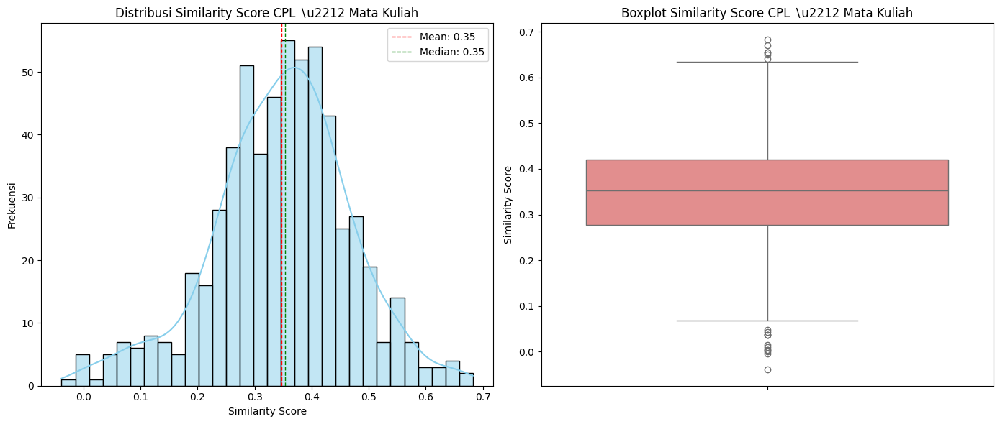


--- Interpretasi Distribusi Similarity ---
Distribusi similarity scores menunjukkan rentang yang cukup luas dari -0.04 hingga 0.68. Dengan rata-rata (0.35) dan median (0.35) yang relatif berdekatan, distribusi cenderung simetris atau sedikit condong. Sebagian besar skor similarity berada antara Q1 (0.28) dan Q3 (0.42). Hal ini mengindikasikan bahwa ada variasi tingkat keterkaitan antara CPL dan Mata Kuliah. Adanya skor yang rendah menunjukkan pasangan yang tidak relevan secara semantik, sementara skor yang lebih tinggi menunjukkan keterkaitan yang kuat. Visualisasi histogram memperjelas frekuensi skor pada rentang tertentu, sedangkan boxplot menyoroti sebaran data, adanya outlier, dan posisi kuartil.


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ast # Re-added import ast for literal_eval to safely convert string representations

# Helper function to parse embedding strings (e.g., "[ 0.1 0.2 0.3]") into a list of floats
def parse_embedding_string_to_list(s):
    if isinstance(s, str):
        try:
            # Try ast.literal_eval first for robustness if the format is sometimes valid
            return ast.literal_eval(s)
        except (ValueError, SyntaxError):
            # If literal_eval fails, assume space-separated numbers within brackets
            # Remove brackets, split by spaces, and convert to float
            return [float(val) for val in s.strip('[] ').split() if val.strip()]
    return s # Return as is if not a string (already an array/list)


print("Calculating overall similarity matrix between all RPS courses and all CPLs...")

# Ensure df_cpl and df_kompetensi are correctly set up and have embeddings
# Use already computed and validated cpl_embeddings and kompetensi_embeddings directly
# Re-extract embeddings from DataFrames to ensure they are available in this cell's scope
# Convert string representation of list to actual list, then to numpy array
# This handles cases where embeddings might be loaded from CSV as strings
cpl_embeddings_np = np.array(cpl_result_df['embedding'].apply(parse_embedding_string_to_list).tolist())
rps_embeddings_np = np.array(course_result_df['embedding'].apply(parse_embedding_string_to_list).tolist())

# Calculate full similarity matrix (RPS vs CPL)
# rps_embeddings_np and cpl_embeddings_np are from the previous cell
full_similarity_matrix = cosine_similarity(
    rps_embeddings_np,
    cpl_embeddings_np
)

# Flatten the matrix to analyze the distribution of all similarity scores
full_similarity_scores = full_similarity_matrix.flatten()

print(f"Shape of full similarity matrix: {full_similarity_matrix.shape}")
print(f"Total similarity scores for distribution analysis: {len(full_similarity_scores)}")

# Calculate descriptive statistics
mean_sim = np.mean(full_similarity_scores)
median_sim = np.median(full_similarity_scores)
min_sim = np.min(full_similarity_scores)
max_sim = np.max(full_similarity_scores)
std_sim = np.std(full_similarity_scores)

Q1_sim = np.percentile(full_similarity_scores, 25)
Q3_sim = np.percentile(full_similarity_scores, 75)

print("\n--- Descriptive Statistics of CPL-RPS Similarities ---")
print(f"Mean Similarity: {mean_sim:.4f}")
print(f"Median (Q2) Similarity: {median_sim:.4f}")
print(f"Min Similarity: {min_sim:.4f}")
print(f"Max Similarity: {max_sim:.4f}")
print(f"Standard Deviation: {std_sim:.4f}")
print(f"Q1 (25th Percentile): {Q1_sim:.4f}")
print(f"Q3 (75th Percentile): {Q3_sim:.4f}")

# --- Visualisasi: Histogram Similarity ---
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(full_similarity_scores, bins=30, kde=True, color='skyblue')
plt.title('Distribusi Similarity Score CPL \u2216u2212 Mata Kuliah')
plt.xlabel('Similarity Score')
plt.ylabel('Frekuensi')
plt.axvline(mean_sim, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_sim:.2f}')
plt.axvline(median_sim, color='green', linestyle='dashed', linewidth=1, label=f'Median: {median_sim:.2f}')
plt.legend()

# --- Visualisasi: Boxplot Similarity ---
plt.subplot(1, 2, 2)
sns.boxplot(y=full_similarity_scores, color='lightcoral')
plt.title('Boxplot Similarity Score CPL \u2216u2212 Mata Kuliah')
plt.ylabel('Similarity Score')

plt.tight_layout()
plt.show()

print("\n--- Interpretasi Distribusi Similarity ---")
print(f"Distribusi similarity scores menunjukkan rentang yang cukup luas dari {min_sim:.2f} hingga {max_sim:.2f}. "
      f"Dengan rata-rata ({mean_sim:.2f}) dan median ({median_sim:.2f}) yang relatif berdekatan, distribusi cenderung simetris atau sedikit condong. "
      f"Sebagian besar skor similarity berada antara Q1 ({Q1_sim:.2f}) dan Q3 ({Q3_sim:.2f}). "
      f"Hal ini mengindikasikan bahwa ada variasi tingkat keterkaitan antara CPL dan Mata Kuliah. Adanya skor yang rendah "
      f"menunjukkan pasangan yang tidak relevan secara semantik, sementara skor yang lebih tinggi menunjukkan keterkaitan yang kuat. "
      f"Visualisasi histogram memperjelas frekuensi skor pada rentang tertentu, sedangkan boxplot menyoroti sebaran data, "
      f"adanya outlier, dan posisi kuartil.")

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np
import ast # Re-added import ast for literal_eval to safely convert string representations

# ============================================================
# PARAMETERS
# ============================================================

TOP_K_CPL = 5  # Number of top CPLs to consider for each RPS course
ALIGNMENT_THRESHOLD = 0.60 # New: Threshold for determining alignment status

# ============================================================
# VALIDATION & DATA PREPARATION
# ============================================================

print("--- Starting RPS Course <-> CPL Mapping ---\n")

# Helper function to parse embedding strings (e.g., "[ 0.1 0.2 0.3]") into a list of floats
def parse_embedding_string_to_list(s):
    if isinstance(s, str):
        try:
            # Try ast.literal_eval first for robustness if the format is sometimes valid
            return ast.literal_eval(s)
        except (ValueError, SyntaxError):
            # If literal_eval fails, assume space-separated numbers within brackets
            # Remove brackets, split by spaces, and convert to float
            return [float(val) for val in s.strip('[] ').split() if val.strip()]
    return s # Return as is if not a string (already an array/list)

print(f"Shape of RPS embeddings: {rps_embeddings_np.shape}")
print(f"Shape of CPL embeddings: {cpl_embeddings_np.shape}")

# ============================================================
# MAPPING RPS COURSES TO TOP_K CPLs WITH SKILL CATEGORY FILTERING (Weighted Semantic)
# ============================================================

print(f"Mapping RPS courses to top {TOP_K_CPL} CPLs, filtered by skill category and using weighted semantic similarity...")

alignment_results_rps_cpl = []

# Iterate through each RPS course in course_rf_result_df (which contains final_skill_category)
for rps_idx, rps_row in course_result_df.iterrows(): # Changed df_kompetensi to rps_skill_classification
    rps_course_code = rps_row['course_code']
    rps_course_name = rps_row['course_name']
    rps_course_text = rps_row['combined_course_text']
    rps_skill_category = rps_row['predicted_skill_category'] # Get RPS course's skill category

    matched_cpl_codes = []
    matched_cpl_texts = []
    matched_cpl_similarities_raw = [] # To store raw similarities
    matched_cpl_weights = [] # To store calculated weights

    # Filter CPLs to match the RPS course's skill category
    filtered_cpl_df = cpl_result_df[
        (cpl_result_df['predicted_skill_category'] == rps_skill_category)
    ].copy()

    top_k_average_similarity = 0.0
    best_similarity = 0.0
    alignment_status = "Not Aligned"

    if not filtered_cpl_df.empty:
        # Get embeddings for these filtered CPLs
        # Map original df_cpl indices to filtered_cpl_df indices to get correct embeddings
        filtered_cpl_original_indices = filtered_cpl_df.index.tolist()
        filtered_cpl_embeddings = cpl_embeddings_np[filtered_cpl_original_indices]

        # Calculate cosine similarity between the current RPS and the filtered CPLs
        # Note: rps_embeddings_np is indexed by rps_idx, which corresponds to rps_skill_classification.iterrows()
        current_rps_similarities_filtered = cosine_similarity(
            rps_embeddings_np[rps_idx].reshape(1, -1),
            filtered_cpl_embeddings
        )[0]

        # Get the indices of the TOP_K_CPL most similar CPLs from the *filtered* set
        actual_top_k_cpl = min(TOP_K_CPL, len(current_rps_similarities_filtered))
        top_k_filtered_cpl_indices = np.argsort(current_rps_similarities_filtered)[::-1][:actual_top_k_cpl]

        # Extract the actual similarities for the top K CPLs
        top_k_similarities = current_rps_similarities_filtered[top_k_filtered_cpl_indices]

        # Calculate top_k_average_similarity
        top_k_average_similarity = np.mean(top_k_similarities) if len(top_k_similarities) > 0 else 0.0

        # Determine the best similarity (the highest among the top K, which is the first one after argsort)
        best_similarity = top_k_similarities[0] if len(top_k_similarities) > 0 else 0.0

        # Determine alignment status
        alignment_status = "Aligned" if best_similarity >= ALIGNMENT_THRESHOLD else "Not Aligned"

        # Collect similarities for the top K CPLs to calculate their sum
        top_k_similarities_for_weighting = []
        for sim_val in top_k_similarities: # Iterate directly over top_k_similarities
            top_k_similarities_for_weighting.append(sim_val)

        sum_of_top_k_similarities = sum(top_k_similarities_for_weighting)

        # Now, calculate weights and collect all details for the top K CPLs
        for filtered_idx in top_k_filtered_cpl_indices:
            cpl_similarity = current_rps_similarities_filtered[filtered_idx]

            # Calculate weight: Similarity / Sum(Similarity of Top-K CPLs)
            if sum_of_top_k_similarities > 0:
                weight = cpl_similarity / sum_of_top_k_similarities
            else:
                weight = 0.0 # Avoid division by zero if all similarities are 0 or negative

            # Get the original index of the CPL from the filtered_cpl_df
            original_cpl_idx = filtered_cpl_df.iloc[filtered_idx].name
            cpl_row_match = cpl_result_df.loc[original_cpl_idx]

            cpl_code = cpl_row_match['kode_cpl']
            cpl_text_match = cpl_row_match['text_clean']

            matched_cpl_codes.append(cpl_code)
            matched_cpl_texts.append(cpl_text_match)
            matched_cpl_similarities_raw.append(round(cpl_similarity, 4))
            matched_cpl_weights.append(round(weight, 4))

    alignment_results_rps_cpl.append({
        'course_code': rps_course_code,
        'course_name': rps_course_name,
        'course_text': rps_course_text,
        'rps_skill_category': rps_skill_category, # Add RPS skill category for clarity
        'matched_cpl_count': len(matched_cpl_codes),
        'matched_cpl_codes': ' | '.join(matched_cpl_codes),
        'matched_cpl_texts': ' | '.join(matched_cpl_texts),
        'matched_cpl_similarities_raw': ' | '.join(map(str, matched_cpl_similarities_raw)),
        'top_k_average_similarity': round(top_k_average_similarity, 4), # New column
        'best_similarity': round(best_similarity, 4),                     # New column
        'alignment_status': alignment_status                            # New column
    })

df_rps_cpl_alignment = pd.DataFrame(alignment_results_rps_cpl)

print("RPS Course <-> CPL Mapping completed with skill category filtering and weighted semantic similarity.")

# ============================================================
# ANALYSIS AND DISPLAY RESULTS
# ============================================================

print("\n--- Full RPS Course <-> CPL Alignment Results ---")
display(df_rps_cpl_alignment)

print("\n--- RPS Course <-> CPL Alignment Summary Statistics ---")

total_courses = len(df_rps_cpl_alignment)
num_aligned = df_rps_cpl_alignment[df_rps_cpl_alignment['alignment_status'] == 'Aligned'].shape[0]
num_tidak_aligned = df_rps_cpl_alignment[df_rps_cpl_alignment['alignment_status'] == 'Not Aligned'].shape[0]
alignment_percentage = (num_aligned / total_courses) * 100 if total_courses > 0 else 0

average_top_k_similarity = df_rps_cpl_alignment['top_k_average_similarity'].mean()

# Calculate average Top-K similarity for Hard and Soft Skills
hard_skill_avg_sim = df_rps_cpl_alignment[df_rps_cpl_alignment['rps_skill_category'] == 'Hard']['top_k_average_similarity'].mean()
soft_skill_avg_sim = df_rps_cpl_alignment[df_rps_cpl_alignment['rps_skill_category'] == 'Soft']['top_k_average_similarity'].mean()

print(f"Total number of courses: {total_courses}")
print(f"Number of 'Align' courses: {num_aligned}")
print(f"Number of 'Tidak Align' courses: {num_tidak_aligned}")
print(f"Alignment percentage: {alignment_percentage:.2f}%")
print(f"Average Top-K similarity (all courses): {average_top_k_similarity:.4f}")
print(f"Average Top-K similarity (Hard Skill RPS courses): {hard_skill_avg_sim:.4f}")
print(f"Average Top-K similarity (Soft Skill RPS courses): {soft_skill_avg_sim:.4f}")

# ============================================================
# SAVE RESULTS
# ============================================================

# Define the output directory in Google Drive
# Saving to the same directory as rps_skill_classification
GDrive_OUTPUT_DIR_RPS = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/'

# Create the directory if it doesn't exist
import os
os.makedirs(GDrive_OUTPUT_DIR_RPS, exist_ok=True)

# Define the full path for the output file
output_file_rps_cpl_gdrive = os.path.join(GDrive_OUTPUT_DIR_RPS, 'rps_cpl_alignment.csv') # New filename to distinguish

df_rps_cpl_alignment.to_csv(
    output_file_rps_cpl_gdrive,
    index=False,
    encoding="utf-8-sig"
)

print(f"\nRPS Course <-> CPL alignment results saved to: {output_file_rps_cpl_gdrive}")

--- Starting RPS Course <-> CPL Mapping ---

Shape of RPS embeddings: (54, 384)
Shape of CPL embeddings: (11, 384)
Mapping RPS courses to top 5 CPLs, filtered by skill category and using weighted semantic similarity...
RPS Course <-> CPL Mapping completed with skill category filtering and weighted semantic similarity.

--- Full RPS Course <-> CPL Alignment Results ---


,course_code,course_name,course_text,rps_skill_category,matched_cpl_count,matched_cpl_codes,matched_cpl_texts,matched_cpl_similarities_raw,top_k_average_similarity,best_similarity,alignment_status
0,FTK101,Algoritma & Pemrograman,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,Hard,5,CPL-TIF-05 | CPL-TIF-03 | CPL-TIF-07 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.4226 | 0.4076 | 0.398 | 0.3968 | 0.3811,0.4012,0.4226,Not Aligned
1,FTK103,Pemrograman Visual,deskripsi kursus kursus ini dimaksudkan untuk ...,Hard,5,CPL-TIF-04 | CPL-TIF-07 | CPL-TIF-05 | CPL-TIF...,mampu meningkatkan pengetahuan dan kemampuan t...,0.369 | 0.3685 | 0.3562 | 0.3395 | 0.3332,0.3533,0.3690,Not Aligned
2,FTK111,Kalkulus 1,course description mata kuliah ini dimaksudkan...,Hard,5,CPL-TIF-05 | CPL-TIF-07 | CPL-TIF-03 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.3586 | 0.3181 | 0.2958 | 0.2829 | 0.2475,0.3006,0.3586,Not Aligned
3,FTK121,Aljabar Linear,Deskripsi Mata Kuliah Mata kuliah ini memberik...,Hard,5,CPL-TIF-05 | CPL-TIF-09 | CPL-TIF-07 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.309 | 0.2875 | 0.2695 | 0.2376 | 0.2376,0.2683,0.3090,Not Aligned
4,FTK151,Metodologi Penelitian dan Ilmiah,Deskripsi Mata Kuliah Mata kuliah ini akan mem...,Hard,5,CPL-TIF-09 | CPL-TIF-03 | CPL-TIF-07 | CPL-TIF...,mampu berkontribusi dalam meningkatkan pemberd...,0.4979 | 0.4754 | 0.4462 | 0.4163 | 0.4132,0.4498,0.4979,Not Aligned
5,FTK161,Statistika,course description deskripsi matakuliah descri...,Hard,5,CPL-TIF-05 | CPL-TIF-07 | CPL-TIF-11 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.3885 | 0.2872 | 0.2656 | 0.2538 | 0.2479,0.2886,0.3885,Not Aligned
6,FTK203,Sistem Basis Data,deskripsi kursus gambaran umum kursus ini menc...,Hard,5,CPL-TIF-04 | CPL-TIF-09 | CPL-TIF-07 | CPL-TIF...,mampu meningkatkan pengetahuan dan kemampuan t...,0.5397 | 0.4403 | 0.4225 | 0.4215 | 0.4135,0.4475,0.5397,Not Aligned
7,FTK205,LAN and Wireless,Deskripsi Mata Kuliah Mata kuliah ini memperke...,Hard,5,CPL-TIF-05 | CPL-TIF-07 | CPL-TIF-06 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.4701 | 0.4211 | 0.3798 | 0.3759 | 0.3675,0.4029,0.4701,Not Aligned
8,FTK206,Pemrograman Berorientasi Objek,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,Hard,5,CPL-TIF-06 | CPL-TIF-05 | CPL-TIF-07 | CPL-TIF...,mampu membuat desain secara holistik sebuah mo...,0.4611 | 0.4558 | 0.4394 | 0.4334 | 0.4144,0.4408,0.4611,Not Aligned
9,FTK211,Kalkulus 2,course description mata kuliah ini akan mencak...,Hard,5,CPL-TIF-03 | CPL-TIF-07 | CPL-TIF-05 | CPL-TIF...,memiliki pengetahuan yang memadai terkait deng...,0.3288 | 0.2929 | 0.2845 | 0.2671 | 0.2521,0.2851,0.3288,Not Aligned



--- RPS Course <-> CPL Alignment Summary Statistics ---
Total number of courses: 54
Number of 'Align' courses: 6
Number of 'Tidak Align' courses: 48
Alignment percentage: 11.11%
Average Top-K similarity (all courses): 0.4148
Average Top-K similarity (Hard Skill RPS courses): 0.4171
Average Top-K similarity (Soft Skill RPS courses): 0.2933

RPS Course <-> CPL alignment results saved to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/rps_cpl_alignment.csv


## VISUALISASI

### KKNI

Persiapan Data
Untuk konsistensi analisis, kita akan menyamakan nama DataFrame dan kolom-kolom yang relevan.

- `df_cpl_kkni_mapping_final` akan menjadi `df_cpl_kkni`.
- `df_best_alignment` akan menjadi `df_rps_kkni`.
- Kolom `similarity_score` akan digunakan untuk skor keselarasan CPL-KKNI.
- Kolom `final_alignment_score` akan diubah menjadi `similarity_score` untuk RPS-KKNI.
- Kolom `bloom_alignment_label` akan diubah menjadi `alignment_level` untuk RPS-KKNI, sedangkan untuk CPL-KKNI, `alignment_level` akan dibuat berdasarkan `SIMILARITY_THRESHOLD` (0.60).

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Persiapan DataFrame ---

# 1. Untuk CPL -> KKNI
df_cpl_kkni = df_cpl_kkni_mapping_final.copy()

# Definisikan SIMILARITY_THRESHOLD dari sel sebelumnya (d4ada092)
SIMILARITY_THRESHOLD_CPL_KKNI = 0.60
df_cpl_kkni['alignment_level'] = df_cpl_kkni['similarity_score'].apply(lambda x: 'Aligned' if x >= SIMILARITY_THRESHOLD_CPL_KKNI else 'Not Aligned')

print("df_cpl_kkni (CPL -> KKNI) setelah penambahan alignment_level:")
display(df_cpl_kkni.head())
print(f"Threshold CPL-KKNI untuk 'Aligned': {SIMILARITY_THRESHOLD_CPL_KKNI}")

# 2. Untuk RPS -> KKNI
df_rps_kkni = df_best_alignment.copy()
df_rps_kkni = df_rps_kkni.rename(columns={
    'final_alignment_score': 'similarity_score',
    'bloom_alignment_label': 'alignment_level',
    'course_name': 'competency_id', # Menggunakan course_name sebagai identifier kompetensi RPS
    'course_text': 'competency_text' # Menggunakan course_text sebagai teks kompetensi RPS
})

print("\ndf_rps_kkni (RPS -> KKNI) setelah penamaan ulang kolom:")
display(df_rps_kkni[['competency_id', 'competency_text', 'kkni_id', 'kkni_description', 'similarity_score', 'alignment_level']].head())

# --- NEW: Prepare df_rps_kkni_summary_for_bar_chart from df_course_kkni_summary ---
# This DataFrame will be used specifically for the bar chart showing distribution of 'Aligned' vs 'Not Aligned' courses.
df_rps_kkni_summary_for_bar_chart = df_course_kkni_summary.copy()

df_rps_kkni_summary_for_bar_chart = df_rps_kkni_summary_for_bar_chart.rename(columns={
    'course_name': 'competency_id',
    'max_final_alignment_score_with_kkni': 'similarity_score',
    'course_overall_alignment_label': 'alignment_level'
})

print("\n--- NEW: df_rps_kkni_summary_for_bar_chart (Summary per Course) ---")
print("This DataFrame uses df_course_kkni_summary for the distribution visualization:")
display(df_rps_kkni_summary_for_bar_chart.head())

df_cpl_kkni (CPL -> KKNI) setelah penambahan alignment_level:


,kode_cpl,kkni_no,cpl_text,kkni_description,similarity_score,alignment_label,alignment_level
0,CPL-TIF-07,1,memiliki keahlian bidang bisnis teknologi kons...,Mampu mengaplikasikan bidang keahliannya dan m...,0.719078,Aligned,Aligned
1,CPL-TIF-08,1,mengembangkan kepribadian berkualitas berinteg...,Mampu mengaplikasikan bidang keahliannya dan m...,0.614359,Aligned,Aligned
2,CPL-TIF-03,2,memiliki pengetahuan memadai terkait membangun...,Menguasai konsep teoritis bidang pengetahuan t...,0.552555,Not Aligned,Not Aligned
3,CPL-TIF-02,1,bersaing pasar global pengetahuan kemampuan me...,Mampu mengaplikasikan bidang keahliannya dan m...,0.507617,Not Aligned,Not Aligned
4,CPL-TIF-11,4,wawasan keilmuan keunggulan bidang teknik info...,Bertanggung jawab pada pekerjaan sendiri dan d...,0.473166,Not Aligned,Not Aligned


Threshold CPL-KKNI untuk 'Aligned': 0.6

df_rps_kkni (RPS -> KKNI) setelah penamaan ulang kolom:


,competency_id,competency_text,kkni_id,kkni_description,similarity_score,alignment_level
0,Pengantar Teknologi Informasi,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.795854,Aligned
1,Sistem Informasi Manajemen,Deskripsi Mata Kuliah Mata kuliah ini membahas...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.765220,Aligned
2,Manajemen Jaringan,uraian mata kuliah pada kuliah ini akan membah...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.756869,Aligned
3,Rekayasa Ilmu,Deskripsi kursus Pengantar Rekayasa Pengetahua...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.752862,Aligned
4,Metodologi Penelitian dan Ilmiah,Deskripsi Mata Kuliah Mata kuliah ini akan mem...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.741925,Aligned



--- NEW: df_rps_kkni_summary_for_bar_chart (Summary per Course) ---
This DataFrame uses df_course_kkni_summary for the distribution visualization:


,competency_id,kkni_id,course_bloom_levels_detected,similarity_score,alignment_level
0,Pengantar Teknologi Informasi,1,"[C3, C4, C2, C1, C5]",0.795854,Aligned
1,Sistem Informasi Manajemen,1,"[C3, C4, C6, C2, C1]",0.765220,Aligned
2,Manajemen Jaringan,1,"[C3, C4, C2, C1, C5]",0.756869,Aligned
3,Rekayasa Ilmu,1,"[C3, C4, C6, C2, C1]",0.752862,Aligned
4,Metodologi Penelitian dan Ilmiah,1,"[C2, C4, C3, C1]",0.741925,Aligned


A. Statistik Deskriptif

In [ ]:
def analyze_alignment_stats(df, name):
    print(f"\n--- Statistik Deskriptif untuk {name} ---")
    print(f"1. Jumlah data: {len(df)}")

    # Distribusi Alignment
    alignment_dist = df['alignment_level'].value_counts()
    print("\n2. Distribusi Alignment:")
    display(alignment_dist.to_frame())

    # Persentase Alignment
    alignment_percentage = df['alignment_level'].value_counts(normalize=True) * 100
    print("\n3. Persentase Alignment (%): ")
    display(alignment_percentage.to_frame(name='Percentage'))

    # Statistik Similarity Score
    similarity_stats = df['similarity_score'].describe()
    print("\n4. Statistik Similarity Score:")
    display(similarity_stats.to_frame())

analyze_alignment_stats(df_cpl_kkni, "CPL → KKNI")
analyze_alignment_stats(df_rps_kkni_summary_for_bar_chart, "Kompetensi RPS → KKNI (Per Kursus)")


--- Statistik Deskriptif untuk CPL → KKNI ---
1. Jumlah data: 11

2. Distribusi Alignment:


,count
alignment_level,
Not Aligned,9
Aligned,2



3. Persentase Alignment (%): 


,Percentage
alignment_level,
Not Aligned,81.818182
Aligned,18.181818



4. Statistik Similarity Score:


,similarity_score
count,11.000000
mean,0.462117
std,0.128297
min,0.312604
25%,0.367959
50%,0.425460
75%,0.530086
max,0.719078



--- Statistik Deskriptif untuk Kompetensi RPS → KKNI (Per Kursus) ---
1. Jumlah data: 54

2. Distribusi Alignment:


,count
alignment_level,
Aligned,43
Not Aligned,11



3. Persentase Alignment (%): 


,Percentage
alignment_level,
Aligned,79.62963
Not Aligned,20.37037



4. Statistik Similarity Score:


,similarity_score
count,54.000000
mean,0.630269
std,0.135350
min,0.187605
25%,0.621934
50%,0.668479
75%,0.703474
max,0.795854


B. Visualisasi

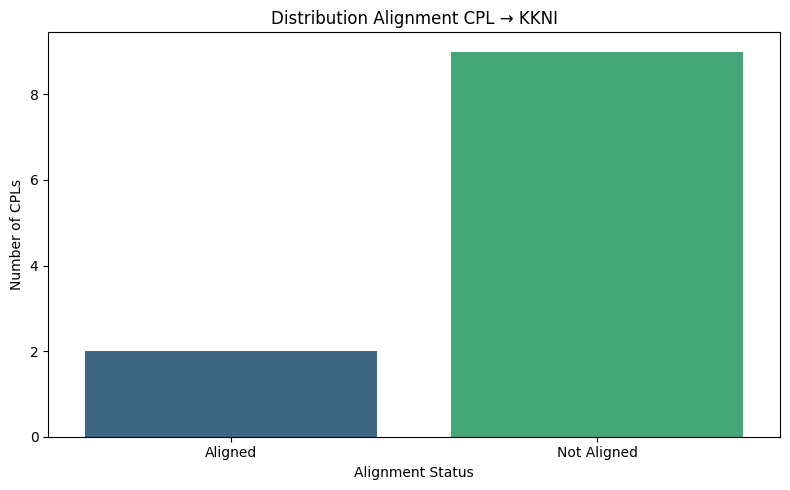

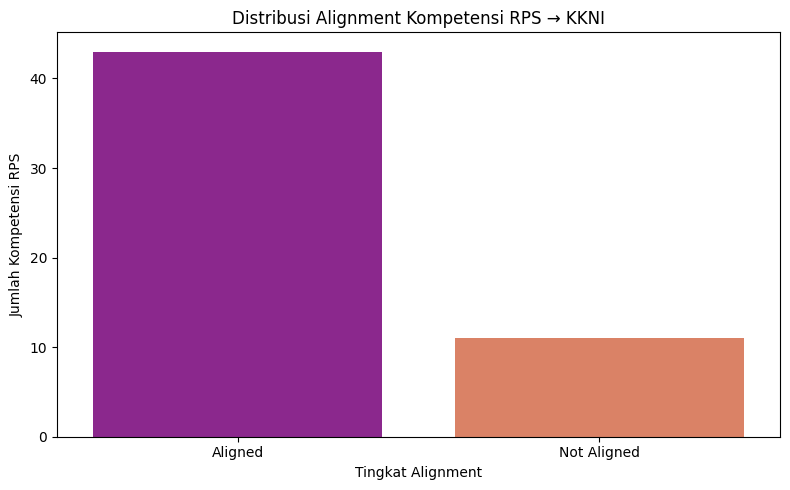

In [ ]:
# 1. Bar chart distribusi alignment CPL → KKNI
plt.figure(figsize=(8, 5))
sns.countplot(x='alignment_level', data=df_cpl_kkni, palette='viridis', hue='alignment_level', legend=False)
plt.title('Distribution Alignment CPL → KKNI')
plt.xlabel('Alignment Status')
plt.ylabel('Number of CPLs')
plt.tight_layout()
plt.show()

# 2. Bar chart distribusi alignment Kompetensi RPS → KKNI
plt.figure(figsize=(8, 5))
sns.countplot(x='alignment_level', data=df_rps_kkni_summary_for_bar_chart, palette='plasma', hue='alignment_level', legend=False)
plt.title('Distribusi Alignment Kompetensi RPS → KKNI')
plt.xlabel('Tingkat Alignment')
plt.ylabel('Jumlah Kompetensi RPS')
plt.tight_layout()
plt.show()

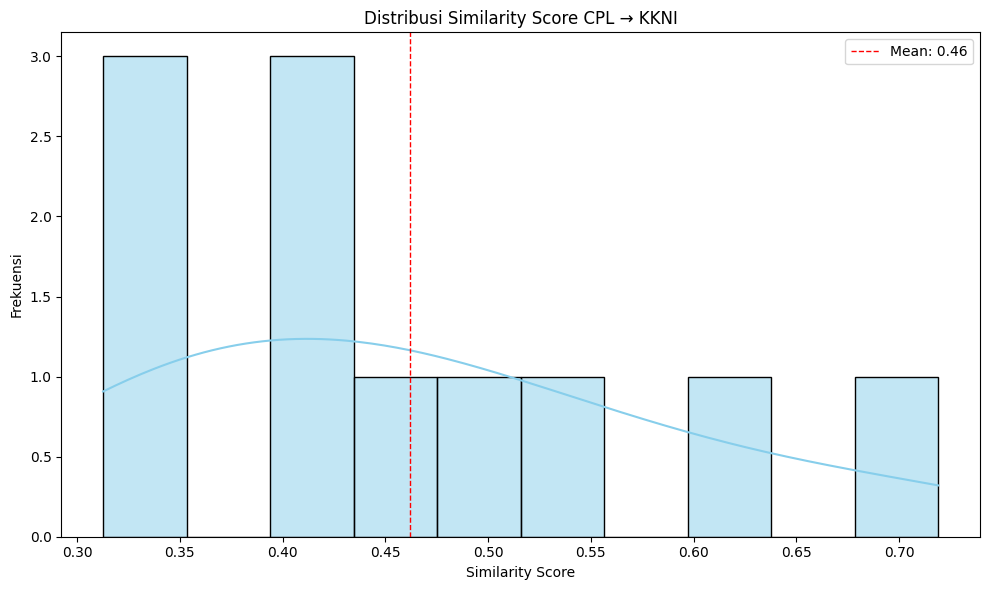

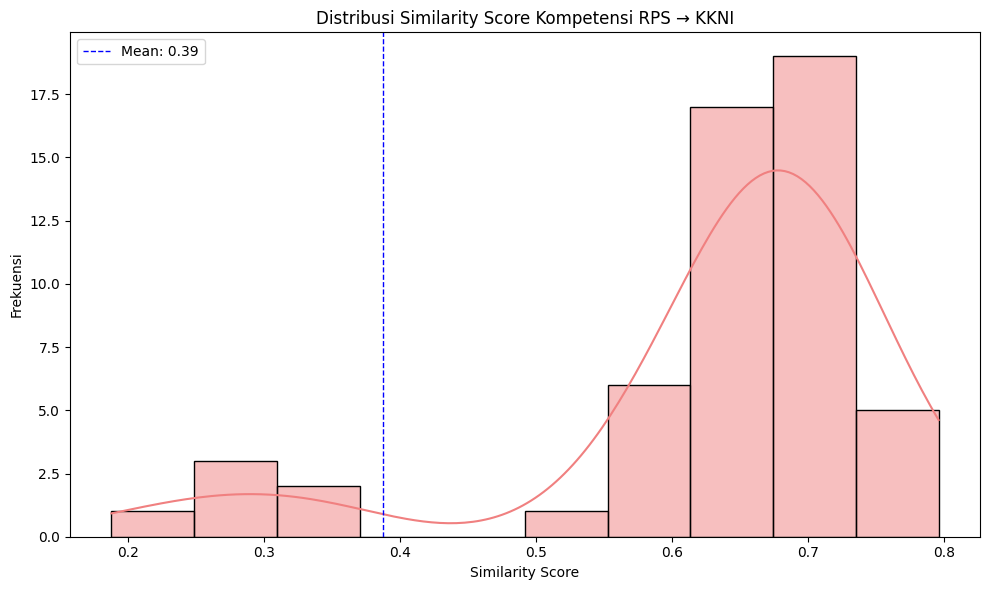

In [ ]:
# 3. Histogram similarity score CPL → KKNI
plt.figure(figsize=(10, 6))
sns.histplot(df_cpl_kkni['similarity_score'], bins=10, kde=True, color='skyblue')
plt.title('Distribusi Similarity Score CPL → KKNI')
plt.xlabel('Similarity Score')
plt.ylabel('Frekuensi')
plt.axvline(df_cpl_kkni['similarity_score'].mean(), color='red', linestyle='dashed', linewidth=1, label=f'Mean: {df_cpl_kkni["similarity_score"].mean():.2f}')
plt.legend()
plt.tight_layout()
plt.show()

# 4. Histogram similarity score Kompetensi RPS → KKNI
plt.figure(figsize=(10, 6))
sns.histplot(df_rps_kkni_summary_for_bar_chart['similarity_score'], bins=10, kde=True, color='lightcoral')
plt.title('Distribusi Similarity Score Kompetensi RPS → KKNI')
plt.xlabel('Similarity Score')
plt.ylabel('Frekuensi')
plt.axvline(df_rps_kkni['similarity_score'].mean(), color='blue', linestyle='dashed', linewidth=1, label=f'Mean: {df_rps_kkni["similarity_score"].mean():.2f}')
plt.legend()
plt.tight_layout()
plt.show()

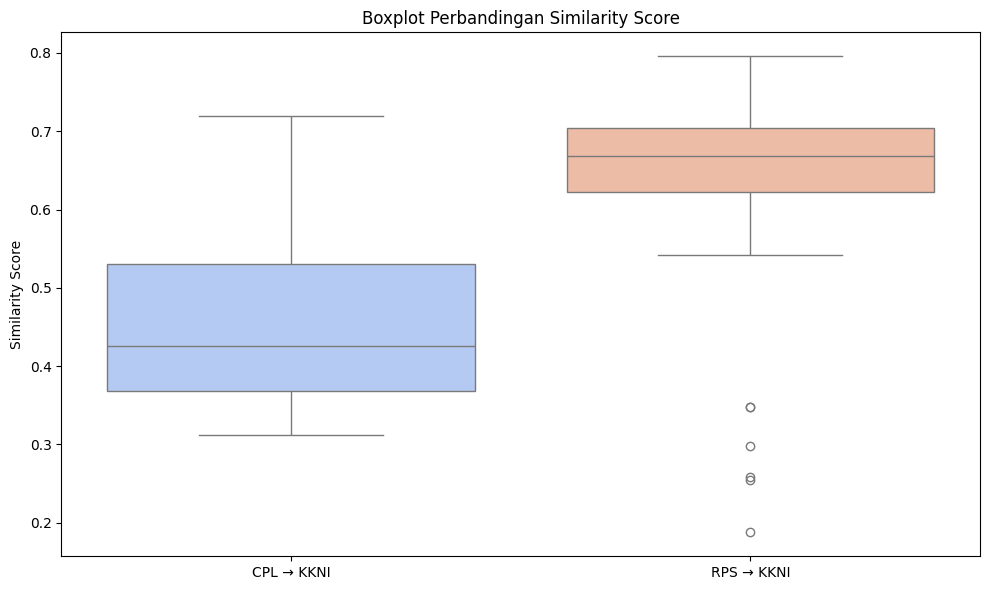

In [ ]:
# 5. Boxplot similarity score
plt.figure(figsize=(10, 6))
sns.boxplot(data=pd.DataFrame({
    'CPL → KKNI': df_cpl_kkni['similarity_score'],
    'RPS → KKNI': df_rps_kkni_summary_for_bar_chart['similarity_score']
}), palette='coolwarm')
plt.title('Boxplot Perbandingan Similarity Score')
plt.ylabel('Similarity Score')
plt.tight_layout()
plt.show()

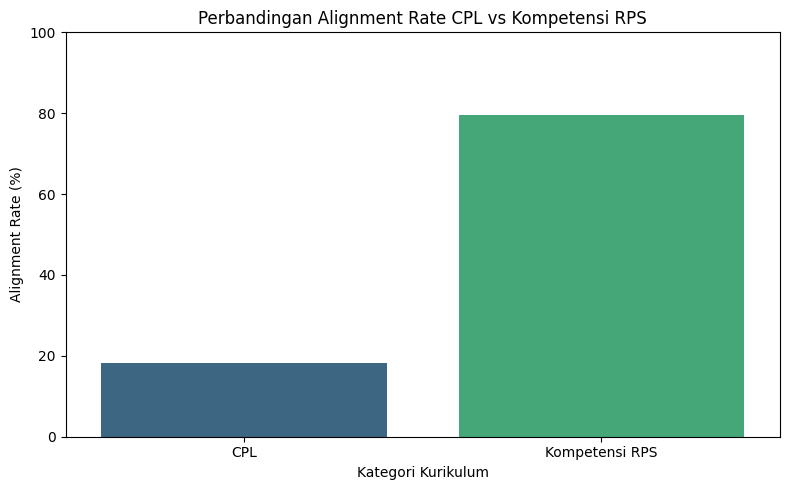

Perbandingan Alignment Rate:


,Kategori,Alignment Rate
0,CPL,18.181818
1,Kompetensi RPS,79.629630


In [ ]:
# 6. Perbandingan alignment rate antara CPL dan Kompetensi RPS

alignment_rate_cpl = (df_cpl_kkni['alignment_level'] == 'Aligned').mean() * 100
alignment_rate_rps = (df_rps_kkni_summary_for_bar_chart['alignment_level'] == 'Aligned').mean() * 100

comparison_df = pd.DataFrame({
    'Kategori': ['CPL', 'Kompetensi RPS'],
    'Alignment Rate': [alignment_rate_cpl, alignment_rate_rps]
})

plt.figure(figsize=(8, 5))
sns.barplot(x='Kategori', y='Alignment Rate', data=comparison_df, palette='viridis', hue='Kategori', legend=False)
plt.title('Perbandingan Alignment Rate CPL vs Kompetensi RPS')
plt.xlabel('Kategori Kurikulum')
plt.ylabel('Alignment Rate (%)')
plt.ylim(0, 100)
plt.tight_layout()
plt.show()

print("Perbandingan Alignment Rate:")
display(comparison_df)

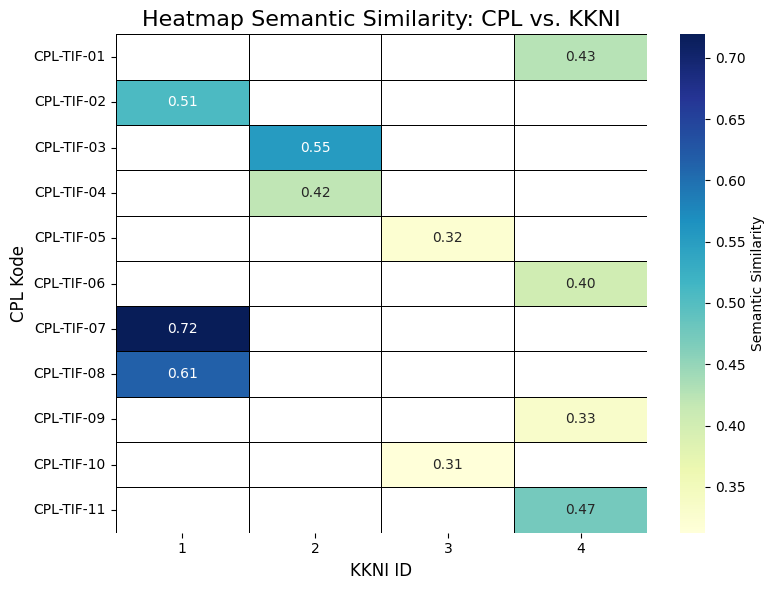

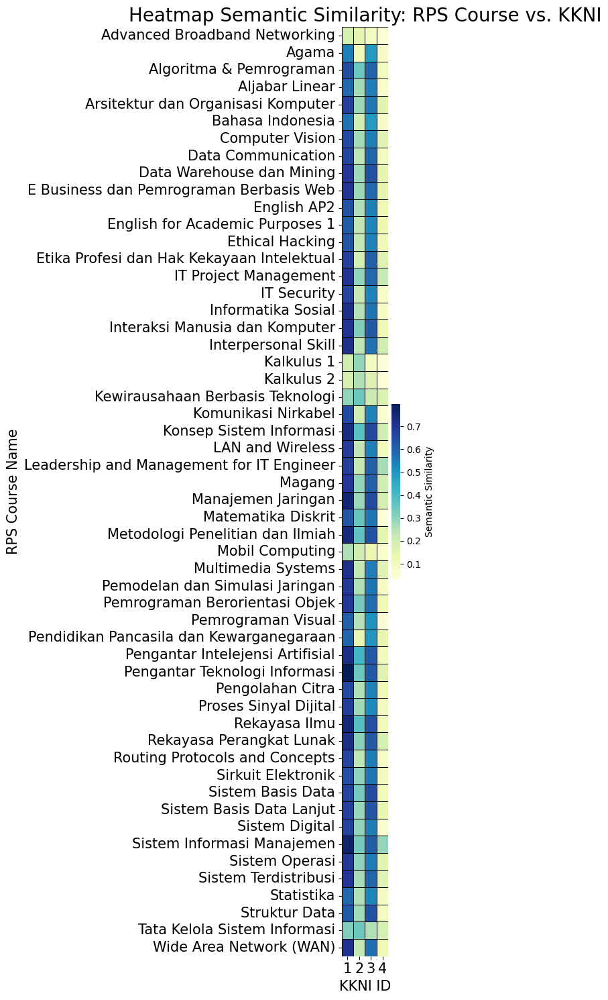

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# --- Heatmap for CPL vs. KKNI Similarity ---

# Prepare data for CPL vs KKNI heatmap
# Rows: CPL Kode, Columns: KKNI ID, Values: Similarity Score
cpl_kkni_heatmap_data = df_cpl_kkni.pivot_table(
    index='kode_cpl',
    columns='kkni_no',
    values='similarity_score'
)

plt.figure(figsize=(8, 6))
sns.heatmap(
    cpl_kkni_heatmap_data,
    annot=True,
    fmt=".2f",
    cmap="YlGnBu",
    linewidths=.5,
    linecolor='black',
    cbar_kws={'label': 'Semantic Similarity'}
)
plt.title('Heatmap Semantic Similarity: CPL vs. KKNI', fontsize=16)
plt.xlabel('KKNI ID', fontsize=12)
plt.ylabel('CPL Kode', fontsize=12)
plt.xticks(rotation=0) # Keep KKNI IDs horizontal
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# --- Heatmap for RPS Course vs. KKNI Similarity ---

# Prepare data for RPS vs KKNI heatmap
# Rows: RPS Course Name (competency_id), Columns: KKNI ID, Values: Similarity Score
rps_kkni_heatmap_data = df_rps_kkni.pivot_table(
    index='competency_id',
    columns='kkni_id',
    values='similarity_score',
    fill_value=0  # Explicitly fill NaN values with 0 to ensure all cells are numeric
)

plt.figure(figsize=(6.5, 15)) # Increased width for better visibility of all KKNI IDs
sns.heatmap(
    rps_kkni_heatmap_data,
    annot=False,
    cmap="YlGnBu",
    linewidths=.5,
    linecolor='black',
    cbar_kws={'label': 'Semantic Similarity'},
    annot_kws={'size': 15} # Adjust annotation font size for readability
)
plt.title('Heatmap Semantic Similarity: RPS Course vs. KKNI', fontsize=20)
plt.xlabel('KKNI ID', fontsize=15)
plt.ylabel('RPS Course Name', fontsize=15)
# Perbesar tulisan nama mata kuliah
plt.xticks(fontsize=15, rotation=0)
# Perbesar tulisan KKNI
plt.yticks(fontsize=15, rotation=0)
plt.tight_layout()
plt.show()

### TRACER STUDY dan JOB PORTAL

#### Job Portal

In [ ]:
# Rename DataFrames for consistency as per user request
# df_cpl_industri corresponds to cpl_industry_alignment
df_cpl_industri = cpl_industry_alignment.copy()
# Rename columns to match requested schema
df_cpl_industri.rename(columns={'Skill Category': 'final_skill_category', 'Alignment Status': 'alignment_label', 'Average Similarity': 'similarity_score'}, inplace=True)

# df_rps_industri corresponds to df_course_industry_alignment
df_rps_industri = df_course_industry_alignment.copy()
# Rename columns to match requested schema
df_rps_industri.rename(columns={'course_skill_category': 'final_skill_category', 'alignment_label': 'alignment_label', 'best_match_similarity': 'similarity_score'}, inplace=True)

# df_tracer is already correctly named and structured from previous steps (df_competency_analysis)
df_tracer_analysis = df_competency_analysis.copy()

print("DataFrames renamed and columns adjusted for consistent analysis:")
print("df_cpl_industri head:")
display(df_cpl_industri.head())
print("df_rps_industri head:")
display(df_rps_industri.head())
print("df_tracer_analysis head:")
display(df_tracer_analysis.head())

DataFrames renamed and columns adjusted for consistent analysis:
df_cpl_industri head:


,CPL,kode_cpl,final_skill_category,Matched Count,top_k_average_similarity,best_similarity,alignment_label,Matched Industry Competencies,Matched Similarity Scores,matched_domain_ids
0,memiliki kepribadian yang beriman dan bertaqwa...,CPL-TIF-01,Soft,5,0.5712,0.6228,Not Aligned,having high integrity and good personal | has ...,0.6228 | 0.5633 | 0.5612 | 0.5597 | 0.5493,117 | 174 | 167 | 106 | 106
1,mampu bersaing di pasar global dengan pengetah...,CPL-TIF-02,Hard,5,0.6432,0.6605,Aligned,information technology | berkoordinasi dengan ...,0.6605 | 0.6462 | 0.6371 | 0.6363 | 0.636,175 | 176 | 111 | 176 | 170
2,memiliki pengetahuan yang memadai terkait deng...,CPL-TIF-03,Hard,5,0.6482,0.6797,Aligned,"having adequate knowledgeable in hardware, rai...",0.6797 | 0.6514 | 0.6486 | 0.6313 | 0.6301,164 | 176 | 86 | 98 | 68
3,mampu meningkatkan pengetahuan dan kemampuan t...,CPL-TIF-04,Hard,5,0.7646,0.7858,Aligned,memiliki pengetahuan terkait high availability...,0.7858 | 0.7685 | 0.7649 | 0.7607 | 0.7433,110 | 110 | 110 | 110 | 110
4,mempunyai kemampuan komunikasi dalam mendefini...,CPL-TIF-05,Hard,5,0.7506,0.7615,Aligned,"strong communication skills, capable of simpli...",0.7615 | 0.7564 | 0.7459 | 0.7446 | 0.7446,106 | 106 | 106 | 106 | 106


df_rps_industri head:


,course_name,final_skill_category,alignment_label,top_k_average_similarity,best_similarity,best_match_overall_industry_competency,best_match_overall_similarity,matched_industry_competencies_count,top_k_matched_industry_competencies,top_k_matched_similarities,matched_domain_ids
0,Algoritma & Pemrograman,Hard,Aligned,0.6800,0.6947,memahami konsep dasar pemrograman understand b...,0.6947,5,memahami konsep dasar pemrograman understand b...,0.6947 | 0.6826 | 0.678 | 0.6741 | 0.6704,106 | 58 | 106 | 107 | 80
1,Pemrograman Visual,Hard,Aligned,0.6841,0.7311,kursus pemrograman komputer computer programmi...,0.7311,5,kursus pemrograman komputer computer programmi...,0.7311 | 0.7139 | 0.7066 | 0.6527 | 0.616,106 | 106 | 106 | 58 | 98
2,Kalkulus 1,Hard,Not Aligned,0.5696,0.5926,kelancaran dalam mengembangkan dan memahami di...,0.5926,5,kelancaran dalam mengembangkan dan memahami di...,0.5926 | 0.5727 | 0.5659 | 0.5621 | 0.5547,58 | 58 | 109 | 106 | 106
3,Aljabar Linear,Hard,Not Aligned,0.5345,0.5746,kelancaran dalam mengembangkan dan memahami di...,0.5746,5,kelancaran dalam mengembangkan dan memahami di...,0.5746 | 0.5472 | 0.5273 | 0.512 | 0.5114,58 | 54 | 106 | 145 | 106
4,Metodologi Penelitian dan Ilmiah,Hard,Aligned,0.6362,0.6605,melakukan penelitian untuk membantu mengembang...,0.6605,5,melakukan penelitian untuk membantu mengembang...,0.6605 | 0.6433 | 0.6291 | 0.6272 | 0.6209,166 | 180 | 146 | 72 | 140


df_tracer_analysis head:


,Competency,Graduation,Work,Gap
0,communication,4.142857,4.428571,0.285714
1,domain_knowledge,4.142857,4.000000,-0.142857
2,english_language,4.285714,4.285714,0.000000
3,ethics,4.142857,4.142857,0.000000
4,it_skill,4.857143,4.714286,-0.142857


A. Statistik Deskriptif

In [ ]:
import pandas as pd
import numpy as np

# 1. Distribusi Hard Skill dan Soft Skill
print("\n--- 1. Distribusi Hard Skill dan Soft Skill ---")

# CPL
cpl_skill_distribution = df_cpl_industri['final_skill_category'].value_counts(normalize=True) * 100
print("\nDistribusi Hard Skill dan Soft Skill pada CPL:")
display(cpl_skill_distribution.to_frame(name='Percentage'))

# RPS
rps_skill_distribution = df_rps_industri['final_skill_category'].value_counts(normalize=True) * 100
print("\nDistribusi Hard Skill dan Soft Skill pada Kompetensi RPS:")
display(rps_skill_distribution.to_frame(name='Percentage'))

# Kompetensi Industri (menggunakan df_industri dari konteks notebook)
# Asumsi df_industri sudah ada dan memiliki 'final_skill_category'
if 'df_industri' in locals() and not df_industri.empty and 'final_skill_category' in df_industri.columns:
    industry_skill_distribution = df_industri[df_industri['final_skill_category'] != 'Unknown']['final_skill_category'].value_counts(normalize=True) * 100
    print("\nDistribusi Hard Skill dan Soft Skill pada Kompetensi Industri (Non-Unknown):")
    display(industry_skill_distribution.to_frame(name='Percentage'))
else:
    print("df_industri atau kolom 'final_skill_category' tidak ditemukan atau kosong. Tidak dapat menampilkan distribusi skill industri.")

# 2. Distribusi alignment (Aligned / Not Aligned)
print("\n--- 2. Distribusi Alignment (Aligned / Not Aligned) ---")

# CPL
cpl_alignment_distribution = df_cpl_industri['alignment_label'].value_counts(normalize=True) * 100
print("\nDistribusi Alignment CPL \u2194 Industri:")
display(cpl_alignment_distribution.to_frame(name='Percentage'))

# RPS
rps_alignment_distribution = df_rps_industri['alignment_label'].value_counts(normalize=True) * 100
print("\nDistribusi Alignment Kompetensi RPS \u2194 Industri:")
display(rps_alignment_distribution.to_frame(name='Percentage'))

# 3. Alignment rate (CPL \u2194 Industri, RPS \u2194 Industri)
print("\n--- 3. Alignment Rate ---")

alignment_rate_cpl = cpl_alignment_distribution.get('Aligned', 0)
alignment_rate_rps = rps_alignment_distribution.get('Align', 0) # Use 'Align' for RPS as per df_rps_industri content

print(f"Alignment Rate CPL \u2194 Industri: {alignment_rate_cpl:.2f}%")
print(f"Alignment Rate Kompetensi RPS \u2194 Industri: {alignment_rate_rps:.2f}%")


--- 1. Distribusi Hard Skill dan Soft Skill ---

Distribusi Hard Skill dan Soft Skill pada CPL:


,Percentage
final_skill_category,
Hard,90.909091
Soft,9.090909



Distribusi Hard Skill dan Soft Skill pada Kompetensi RPS:


,Percentage
final_skill_category,
Hard,98.148148
Soft,1.851852


df_industri atau kolom 'final_skill_category' tidak ditemukan atau kosong. Tidak dapat menampilkan distribusi skill industri.

--- 2. Distribusi Alignment (Aligned / Not Aligned) ---

Distribusi Alignment CPL ↔ Industri:


,Percentage
alignment_label,
Aligned,90.909091
Not Aligned,9.090909



Distribusi Alignment Kompetensi RPS ↔ Industri:


,Percentage
alignment_label,
Aligned,70.37037
Not Aligned,29.62963



--- 3. Alignment Rate ---
Alignment Rate CPL ↔ Industri: 90.91%
Alignment Rate Kompetensi RPS ↔ Industri: 0.00%


B. Visualisasi

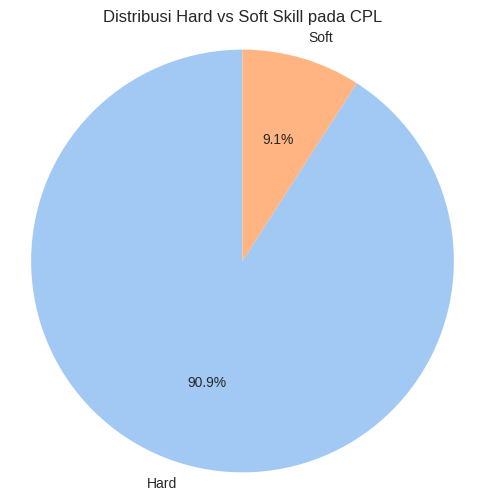

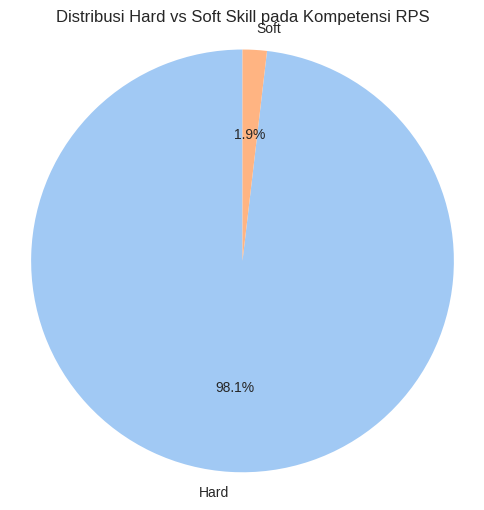

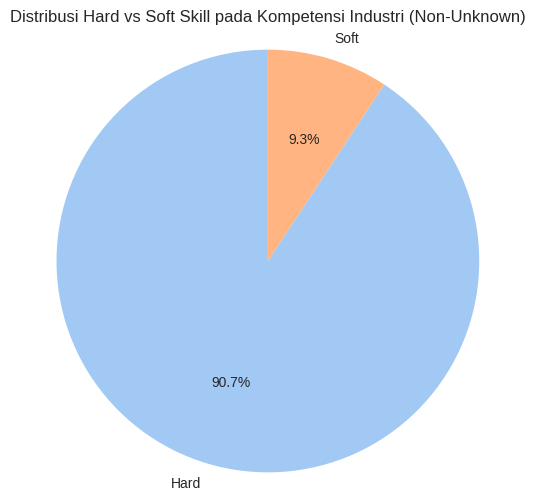

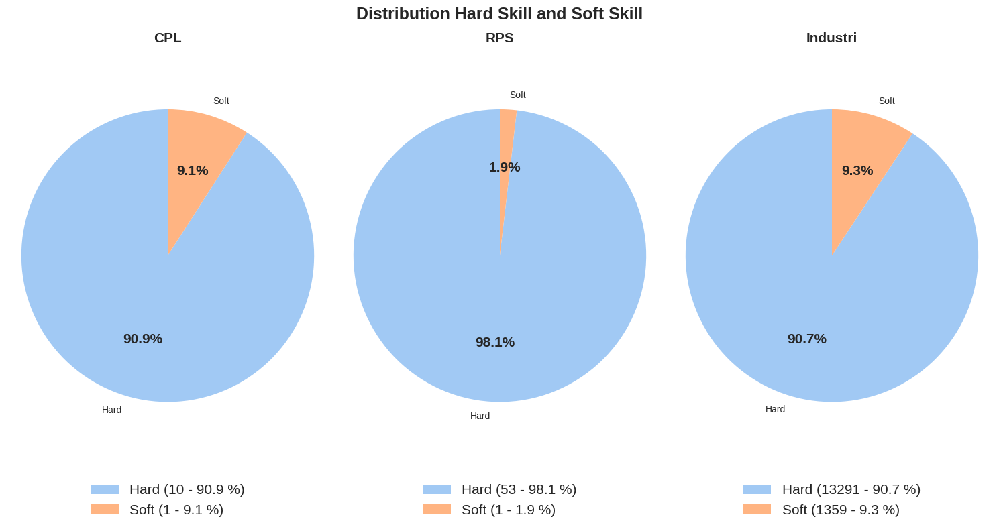

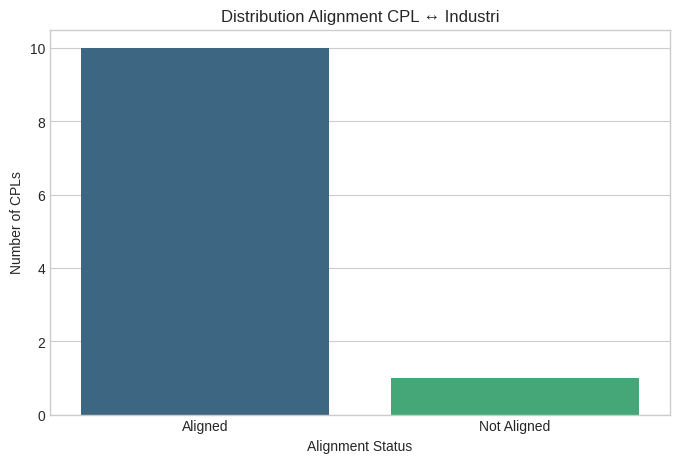

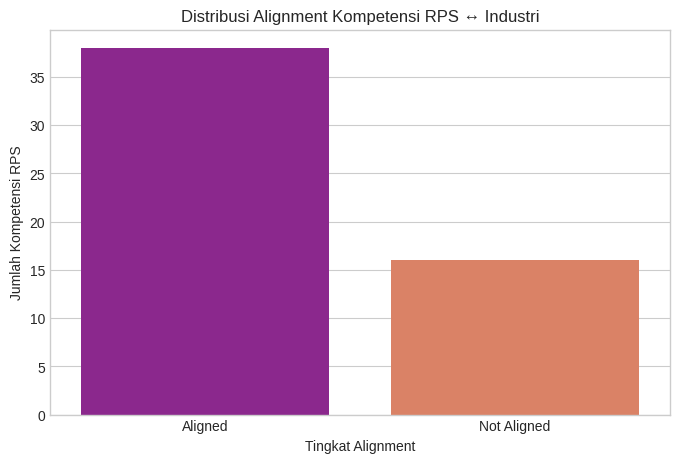

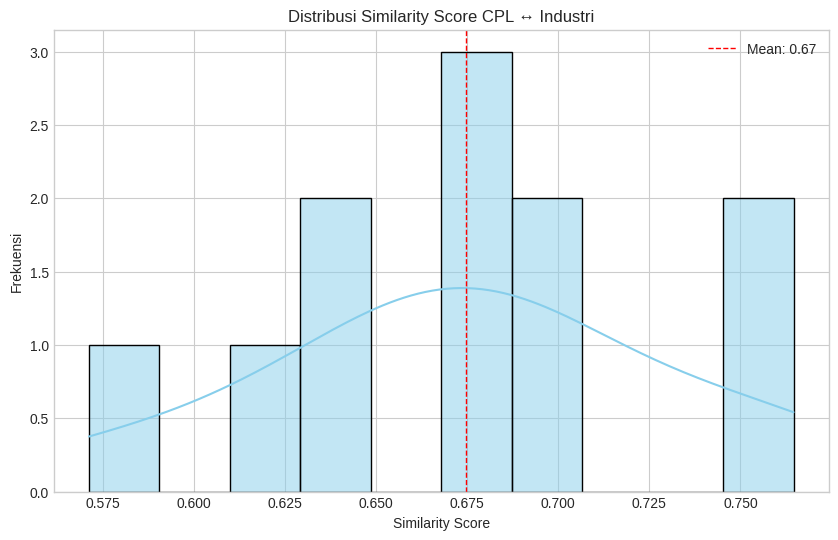

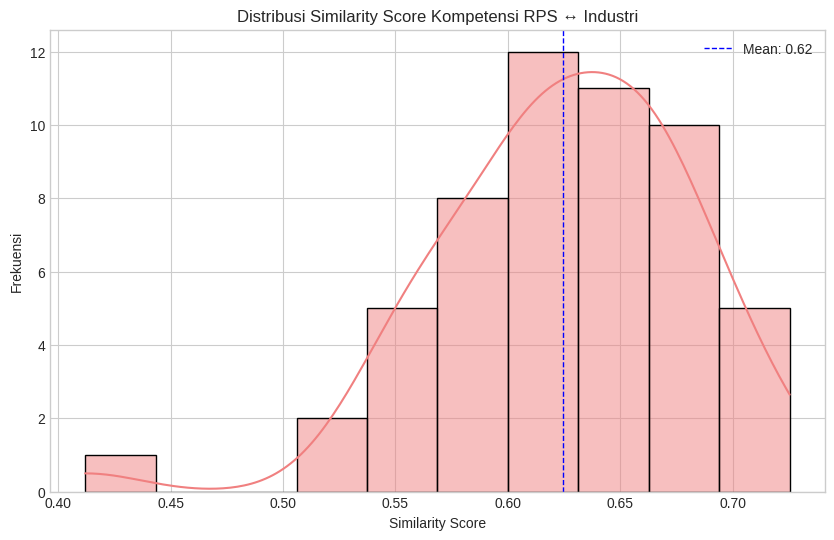

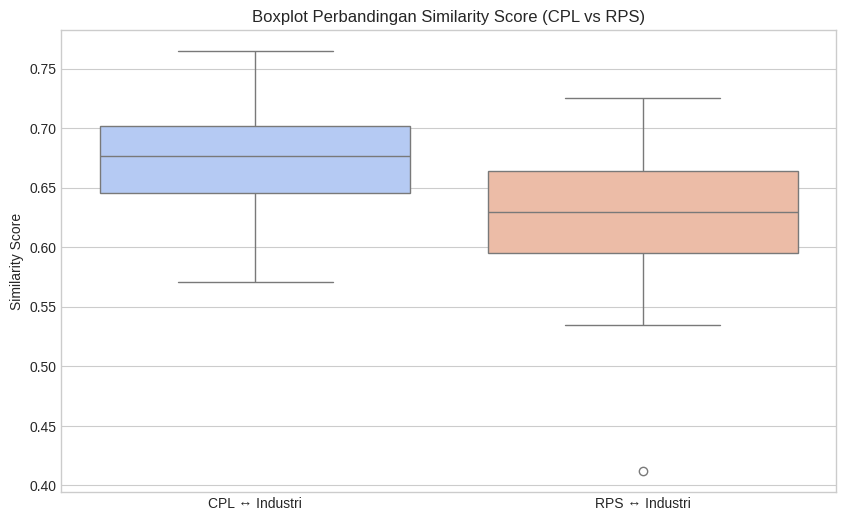


HEATMAPS: CPL & RPS COVERAGE TOWARD INDUSTRY DOMAINS (Per Individual Domain)

Total unique CPLs: 11
Total unique RPS Courses: 54
Total unique Industry Domain IDs: 190

--- HEATMAP 1: CPL ⌢x INDIVIDUAL DOMAIN ---
Shape of CPL x Individual Domain heatmap matrix: (11, 20)


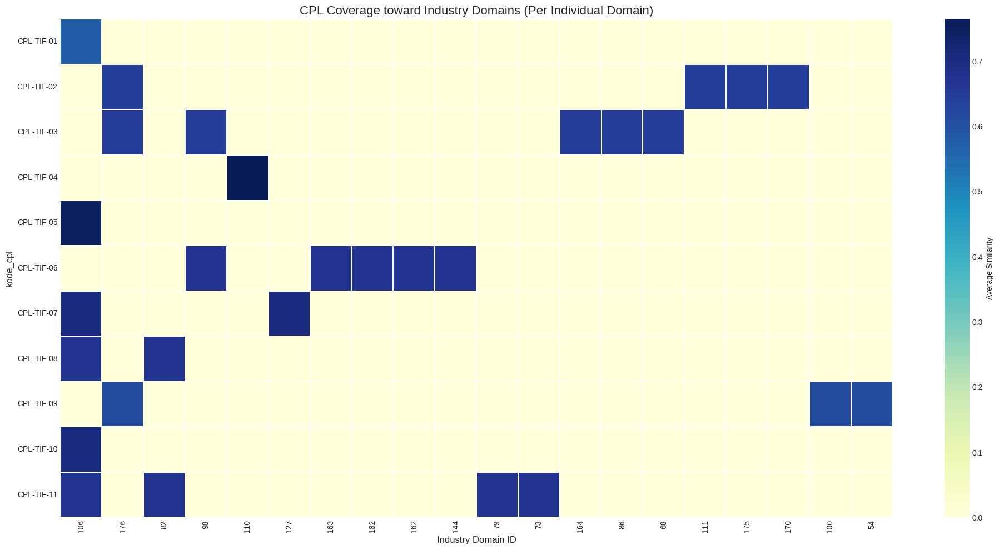


--- HEATMAP 2: RPS ⌢x INDIVIDUAL DOMAIN ---
Shape of RPS x Individual Domain heatmap matrix: (54, 20)


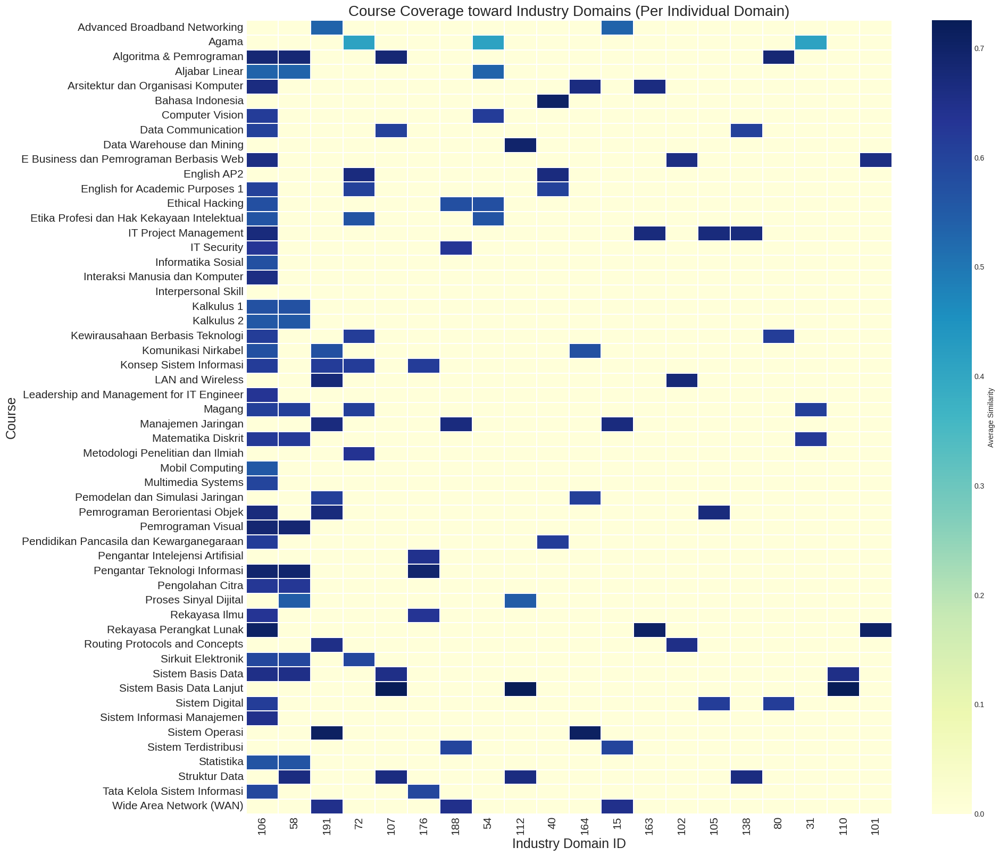


INTERPRETATION OF CPL & RPS COVERAGE TOWARD INDUSTRY DOMAINS

1. Top 10 domains with highest average similarity for CPL:


,top_k_average_similarity
matched_domain_ids_list,
110,0.764600
127,0.704300
106,0.694067
144,0.677400
162,0.677400
163,0.677400
182,0.677400
73,0.676900
79,0.676900



2. Top 10 domains with highest average similarity for RPS:


,top_k_average_similarity
matched_domain_ids_list,
67,0.693400
110,0.689000
163,0.685650
101,0.681450
158,0.681050
98,0.671400
100,0.668550
111,0.667560
107,0.664633



3. Domains that have no similarity (>0) in CPL or RPS:
  [np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(32), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(41), np.int64(42), np.int64(44), np.int64(45), np.int64(46), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(51), np.int64(52), np.int64(53), np.int64(55), np.int64(56), np.int64(57), np.int64(59), np.int64(60), np.int64(61), np.int64(62), np.int64(63), np.int64(65), np.int64(66), np.int64(69), np.int64(70), np.int64(74), np.int64(75), np.int64(76), np.int64(77), np.int64(78), np.int64(81), np.int64(83), np.int64(84), np.int64(85), np.int64(87

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8-darkgrid')

# Helper function for pie charts
def plot_pie_chart(data, title):
    plt.figure(figsize=(6, 6))
    plt.pie(data, labels=data.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
    plt.title(title)
    plt.axis('equal')
    plt.show()

# 1. Pie chart Hard Skill vs Soft Skill pada CPL
cpl_skill_data = df_cpl_industri['final_skill_category'].value_counts()
if not cpl_skill_data.empty:
    plot_pie_chart(cpl_skill_data, 'Distribusi Hard vs Soft Skill pada CPL')
else:
    print('Tidak ada data skill category untuk CPL.')

# 2. Pie chart Hard Skill vs Soft Skill pada RPS
rps_skill_data = df_rps_industri['final_skill_category'].value_counts()
if not rps_skill_data.empty:
    plot_pie_chart(rps_skill_data, 'Distribusi Hard vs Soft Skill pada Kompetensi RPS')
else:
    print('Tidak ada data skill category untuk Kompetensi RPS.')

# 3. Pie chart Hard Skill vs Soft Skill pada Kompetensi Industri
if 'df_industri' in locals() and not df_industri.empty and 'predicted_skill_category' in df_industri.columns:
    industry_skill_data = df_industri[df_industri['predicted_skill_category'] != 'Unknown']['predicted_skill_category'].value_counts()
    if not industry_skill_data.empty:
        plot_pie_chart(industry_skill_data, 'Distribusi Hard vs Soft Skill pada Kompetensi Industri (Non-Unknown)')
    else:
        print('Tidak ada data skill category non-Unknown untuk Kompetensi Industri.')
else:
    print("df_industri atau kolom 'predicted_skill_category' tidak ditemukan atau kosong. Tidak dapat menampilkan pie chart skill industri.")

import matplotlib.pyplot as plt
import seaborn as sns

# ==========================================================
# PIE CHART DISTRIBUSI HARD SKILL VS SOFT SKILL
# CPL, RPS, DAN INDUSTRI
# ==========================================================

plt.style.use("seaborn-v0_8-whitegrid")

# -----------------------------
# Hitung distribusi
# -----------------------------

cpl_skill = (
    df_cpl_industri["final_skill_category"]
    .value_counts()
    .reindex(["Hard","Soft"], fill_value=0)
)

rps_skill = (
    df_rps_industri["final_skill_category"]
    .value_counts()
    .reindex(["Hard","Soft"], fill_value=0)
)

industry_skill = (
    df_industri[
        df_industri["predicted_skill_category"]!="Unknown"
    ]["predicted_skill_category"]
    .value_counts()
    .reindex(["Hard","Soft"], fill_value=0)
)

colors = sns.color_palette("pastel", 2)

# -----------------------------
# Plot
# -----------------------------

fig, axes = plt.subplots(1, 3, figsize=(15,8))

datasets = [
    (cpl_skill, "CPL"),
    (rps_skill, "RPS"),
    (industry_skill, "Industri")
]

colors = sns.color_palette("pastel", 2)

for ax, (data, title) in zip(axes, datasets):

    labels = data.index.tolist()
    sizes = data.values
    total = sum(sizes)

    # Pie chart
    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct="%1.1f%%",
        startangle=90,
        colors=colors
    )

    for autotext in autotexts:
        autotext.set_fontsize(15)
        autotext.set_fontweight("bold")

    legend_labels = [
        f"{label} ({int(count)} - {(count/total)*100:.1f} %)"
        for label, count in zip(labels, sizes)
    ]

    ax.legend(
        wedges,
        legend_labels,
        loc="upper center",
        bbox_to_anchor=(0.5, -0.02),   # letak di bawah pie chart
        ncol=1,                        # Hard dan Soft sejajar
        frameon=False,
        fontsize=15,
    )

    ax.set_title(
        title,
        fontsize=15,
        fontweight="bold",
        loc="center"
    )
    ax.axis("equal")

plt.suptitle(
    "Distribution Hard Skill and Soft Skill",
    fontsize=18,
    fontweight="bold",
    x=0.5,   # posisi horizontal (0=kir i, 1=kanan)
    y=0.98   # posisi vertikal
)
plt.tight_layout()
plt.show()


# 4. Bar chart alignment CPL ↔ Industri
cpl_align_counts = df_cpl_industri['alignment_label'].value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=cpl_align_counts.index, y=cpl_align_counts.values, palette='viridis', hue=cpl_align_counts.index, legend=False)
plt.title('Distribution Alignment CPL ↔ Industri')
plt.xlabel('Alignment Status')
plt.ylabel('Number of CPLs')
plt.show()

# 5. Bar chart alignment RPS ↔ Industri
rps_align_counts = df_rps_industri['alignment_label'].value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=rps_align_counts.index, y=rps_align_counts.values, palette='plasma', hue=rps_align_counts.index, legend=False)
plt.title('Distribusi Alignment Kompetensi RPS ↔ Industri')
plt.xlabel('Tingkat Alignment')
plt.ylabel('Jumlah Kompetensi RPS')
plt.show()

# 6. Histogram similarity score CPL ↔ Industri
plt.figure(figsize=(10, 6))
sns.histplot(df_cpl_industri['top_k_average_similarity'], bins=10, kde=True, color='skyblue')
plt.title('Distribusi Similarity Score CPL ↔ Industri')
plt.xlabel('Similarity Score')
plt.ylabel('Frekuensi')
plt.axvline(df_cpl_industri['top_k_average_similarity'].mean(), color='red', linestyle='dashed', linewidth=1, label=f'Mean: {df_cpl_industri["top_k_average_similarity"].mean():.2f}')
plt.legend()
plt.show()

# 7. Histogram similarity score RPS ↔ Industri
plt.figure(figsize=(10, 6))
sns.histplot(df_rps_industri['top_k_average_similarity'], bins=10, kde=True, color='lightcoral')
plt.title('Distribusi Similarity Score Kompetensi RPS ↔ Industri')
plt.xlabel('Similarity Score')
plt.ylabel('Frekuensi')
plt.axvline(df_rps_industri['top_k_average_similarity'].mean(), color='blue', linestyle='dashed', linewidth=1, label=f'Mean: {df_rps_industri["top_k_average_similarity"].mean():.2f}')
plt.legend()
plt.show()

# 8. Boxplot similarity score
plt.figure(figsize=(10, 6))
sns.boxplot(data=pd.DataFrame({
    'CPL ↔ Industri': df_cpl_industri['top_k_average_similarity'],
    'RPS ↔ Industri': df_rps_industri['top_k_average_similarity']
}), palette='coolwarm')
plt.title('Boxplot Perbandingan Similarity Score (CPL vs RPS)')
plt.ylabel('Similarity Score')
plt.show()

# =========================================================
# NEW HEATMAPS
# =========================================================

print("\n=========================================================")
print("HEATMAPS: CPL & RPS COVERAGE TOWARD INDUSTRY DOMAINS (Per Individual Domain)")
print("=========================================================")

# Helper function to parse 'matched_domain_ids' string into a list of integers
def parse_domain_id_string(domain_id_str):
    if pd.isna(domain_id_str) or not isinstance(domain_id_str, str):
        return []
    try:
        return [int(s.strip()) for s in domain_id_str.split(' | ') if s.strip()]
    except ValueError:
        return []

# Prepare data for calculations
all_cpl_ids = cpl_industry_alignment['kode_cpl'].nunique()
all_course_names = df_course_industry_alignment['course_name'].nunique()
all_domain_ids = df_industri['matched_pon_tik_domain_id'].nunique() # Assuming df_domain contains all possible domain_ids

print(f"\nTotal unique CPLs: {all_cpl_ids}")
print(f"Total unique RPS Courses: {all_course_names}")
print(f"Total unique Industry Domain IDs: {all_domain_ids}")

# --- HEATMAP 1 : CPL ⌢x DOMAIN --- (Per individual domain)
print("\n--- HEATMAP 1: CPL ⌢x INDIVIDUAL DOMAIN ---")

# Create a working copy for CPL to avoid modifying the original df
cpl_exploded_domains = cpl_industry_alignment.copy()

# Parse the string and explode the 'matched_domain_ids' column
cpl_exploded_domains['matched_domain_ids_list'] = cpl_exploded_domains['matched_domain_ids'].apply(parse_domain_id_string)
cpl_exploded_domains = cpl_exploded_domains.explode('matched_domain_ids_list')

# Filter out rows where domain ID might be empty after explode or parsing fails
cpl_exploded_domains = cpl_exploded_domains[cpl_exploded_domains['matched_domain_ids_list'].notna()]

# Recalculate mean similarity for each CPL-Individual Domain pair if there are duplicates
cpl_heatmap_data = (
    cpl_exploded_domains.groupby(['kode_cpl', 'matched_domain_ids_list'])['top_k_average_similarity'].mean()
    .unstack(fill_value=0) # Unstack to create pivot, fill with 0 where no direct match
)

# Calculate sum of similarities for each domain and sort columns in descending order
cpl_domain_order = cpl_heatmap_data.sum(axis=0).sort_values(ascending=False).index
# Limit to top 20 domains for CPL heatmap
cpl_domain_order_top_20 = cpl_domain_order[:20]
cpl_heatmap_data = cpl_heatmap_data.reindex(columns=cpl_domain_order_top_20)

print(f"Shape of CPL x Individual Domain heatmap matrix: {cpl_heatmap_data.shape}")

plt.figure(figsize=(20, max(10, len(cpl_heatmap_data) * 0.5))) # Adjust figsize dynamically
sns.heatmap(
    cpl_heatmap_data,
    cmap="YlGnBu",
    annot=False,
    linewidths=0.3,
    cbar_kws={'label': 'Average Similarity'}
)
plt.title('CPL Coverage toward Industry Domains (Per Individual Domain)', fontsize=16)
plt.xlabel('Industry Domain ID', fontsize=12)
plt.ylabel('kode_cpl', fontsize=12)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# --- HEATMAP 2 : RPS ⌢x DOMAIN --- (Per individual domain)
print("\n--- HEATMAP 2: RPS ⌢x INDIVIDUAL DOMAIN ---")

# Create a working copy for RPS
rps_exploded_domains = df_course_industry_alignment.copy()

# Parse the string and explode the 'matched_domain_ids' column
rps_exploded_domains['matched_domain_ids_list'] = rps_exploded_domains['matched_domain_ids'].apply(parse_domain_id_string)
rps_exploded_domains = rps_exploded_domains.explode('matched_domain_ids_list')

# Filter out rows where domain ID might be empty after explode or parsing fails
rps_exploded_domains = rps_exploded_domains[rps_exploded_domains['matched_domain_ids_list'].notna()]

# Recalculate mean similarity for each RPS-Individual Domain pair if there are duplicates
rps_heatmap_data = (
    rps_exploded_domains.groupby(['course_name', 'matched_domain_ids_list'])['top_k_average_similarity'].mean()
    .unstack(fill_value=0) # Unstack to create pivot, fill with 0 where no direct match
)

# Calculate sum of similarities for each domain and sort columns in descending order
rps_domain_order = rps_heatmap_data.sum(axis=0).sort_values(ascending=False).index
# Limit to top 20 domains for RPS heatmap
rps_domain_order_top_20 = rps_domain_order[:20]
rps_heatmap_data = rps_heatmap_data.reindex(columns=rps_domain_order_top_20)

print(f"Shape of RPS x Individual Domain heatmap matrix: {rps_heatmap_data.shape}")

plt.figure(figsize=(20, max(10, len(rps_heatmap_data) * 0.3))) # Adjust figsize dynamically
sns.heatmap(
    rps_heatmap_data,
    cmap="YlGnBu",
    annot=False,
    linewidths=0.3,
    cbar_kws={'label': 'Average Similarity'}
)
plt.title('Course Coverage toward Industry Domains (Per Individual Domain)', fontsize=20)
plt.xlabel('Industry Domain ID', fontsize=18)
plt.ylabel('Course', fontsize=18)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15,rotation=0)
plt.tight_layout()
plt.show()

# =========================================================
# INTERPRETATION
# =========================================================

print("\n=========================================================")
print("INTERPRETATION OF CPL & RPS COVERAGE TOWARD INDUSTRY DOMAINS")
print("=========================================================")

# 1. Top 10 domain with highest average similarity for CPL.
print("\n1. Top 10 domains with highest average similarity for CPL:")
top_10_cpl_domains = cpl_exploded_domains.groupby('matched_domain_ids_list')['top_k_average_similarity'].mean().nlargest(10) # Changed to use exploded data
display(top_10_cpl_domains.to_frame())

# 2. Top 10 domain with highest average similarity for RPS.
print("\n2. Top 10 domains with highest average similarity for RPS:")
top_10_rps_domains = rps_exploded_domains.groupby('matched_domain_ids_list')['top_k_average_similarity'].mean().nlargest(10) # Changed to use exploded data
display(top_10_rps_domains.to_frame())

# 3. Domains that have no similarity (>0) in CPL or RPS.
# Get all unique domain IDs from df_domain to represent all possible domains
all_domain_ids_from_df_domain = set(df_industri['matched_pon_tik_domain_id'].unique())

cpl_domains_with_similarity = set(cpl_exploded_domains[cpl_exploded_domains['top_k_average_similarity'] > 0]['matched_domain_ids_list'].unique()) # Changed to use exploded data
rps_domains_with_similarity = set(rps_exploded_domains[rps_exploded_domains['top_k_average_similarity'] > 0]['matched_domain_ids_list'].unique()) # Changed to use exploded data

# Domains that are known but not covered by either CPL or RPS with >0 similarity
uncovered_domains = all_domain_ids_from_df_domain - (cpl_domains_with_similarity.union(rps_domains_with_similarity))

print("\n3. Domains that have no similarity (>0) in CPL or RPS:")
if uncovered_domains:
    print(f"  {sorted(list(uncovered_domains))}")
else:
    print("  All domains have some similarity (>0) with either CPL or RPS.")

# 4. Domains that only appear in RPS but not in CPL.
rps_only_domains = set(rps_exploded_domains['matched_domain_ids_list'].unique()) - set(cpl_exploded_domains['matched_domain_ids_list'].unique()) # Changed to use exploded data
print("\n4. Domains that only appear in RPS but not in CPL:")
if rps_only_domains:
    print(f"  {sorted(list(rps_only_domains))}")
else:
    print("  No domains appear only in RPS.")

# 5. Domains that only appear in CPL but not in RPS.
cpl_only_domains = set(cpl_exploded_domains['matched_domain_ids_list'].unique()) - set(rps_exploded_domains['matched_domain_ids_list'].unique()) # Changed to use exploded data
print("\n5. Domains that only appear in CPL but not in RPS:")
if cpl_only_domains:
    print(f"  {sorted(list(cpl_only_domains))}")
else:
    print("  No domains appear only in CPL.")

Total PON-TIK domains: 191

Calculating CPL domain coverage...

CPL Domain Coverage:


,domain_id,coverage_count,coverage_score
9,106,21,1.000000
10,110,5,0.238095
23,176,4,0.190476
5,82,3,0.142857
7,98,2,0.095238
4,79,1,0.047619
0,54,1,0.047619
1,64,1,0.047619
2,68,1,0.047619
8,100,1,0.047619



Calculating RPS domain coverage...

RPS Domain Coverage:


,domain_id,coverage_count,coverage_score
25,106,74,1.000000
8,58,17,0.229730
55,191,16,0.216216
5,40,14,0.189189
11,72,11,0.148649
54,188,9,0.121622
51,176,8,0.108108
2,15,6,0.081081
7,54,6,0.081081
26,107,6,0.081081



Total completely uncovered domains by CPL: 166


,domain_id,domain_text,skill_category,num_competencies,coverage_count,coverage_score
125,126,"pengetahuan yang mendalam tentang hukum, perat...",Hard,1018,0,0
43,44,berintegritas bertanggung jawab mampu mengarah...,Soft,525,0,0
190,191,mengorganisasi dan mengatur proyek perencanaan...,Hard,255,0,0
31,32,memimpin tim mampu memimpin tim memimpin dan m...,Soft,241,0,0
42,43,kemampuan untuk berkomunikasi secara efektif. ...,Soft,194,0,0
139,140,melakukan pemantauan dan evaluasi kepatuhan pe...,Hard,189,0,0
179,180,merencanakan dan mengorganisasi pekerjaan meng...,Hard,174,0,0
160,161,mengesahkan dan menerapkan layanan kepada peng...,Hard,126,0,0
164,165,mengoptimalkan kinerja aplikasi dan perangkat ...,Hard,113,0,0
157,158,use computer operating systems and hardware (p...,Hard,89,0,0



Total completely uncovered domains by RPS: 135


,domain_id,domain_text,skill_category,num_competencies,coverage_count,coverage_score
43,44,berintegritas bertanggung jawab mampu mengarah...,Soft,525,0,0
31,32,memimpin tim mampu memimpin tim memimpin dan m...,Soft,241,0,0
181,182,menentukan metode pemodelan arsitektur bisnis ...,Hard,170,0,0
169,170,mengembangkan dan menerapkan program kepatuhan...,Hard,155,0,0
160,161,mengesahkan dan menerapkan layanan kepada peng...,Hard,126,0,0
164,165,mengoptimalkan kinerja aplikasi dan perangkat ...,Hard,113,0,0
173,174,melakukan investasi pada teknologi ti melakuka...,Hard,93,0,0
189,190,mengelola infrastruktur ti melakukan perubahan...,Hard,89,0,0
122,123,orang yang membutuhkan kemampuan memecahkan pe...,Hard,81,0,0
185,186,pengetahuan yang mendalam tentang teknologi di...,Hard,77,0,0


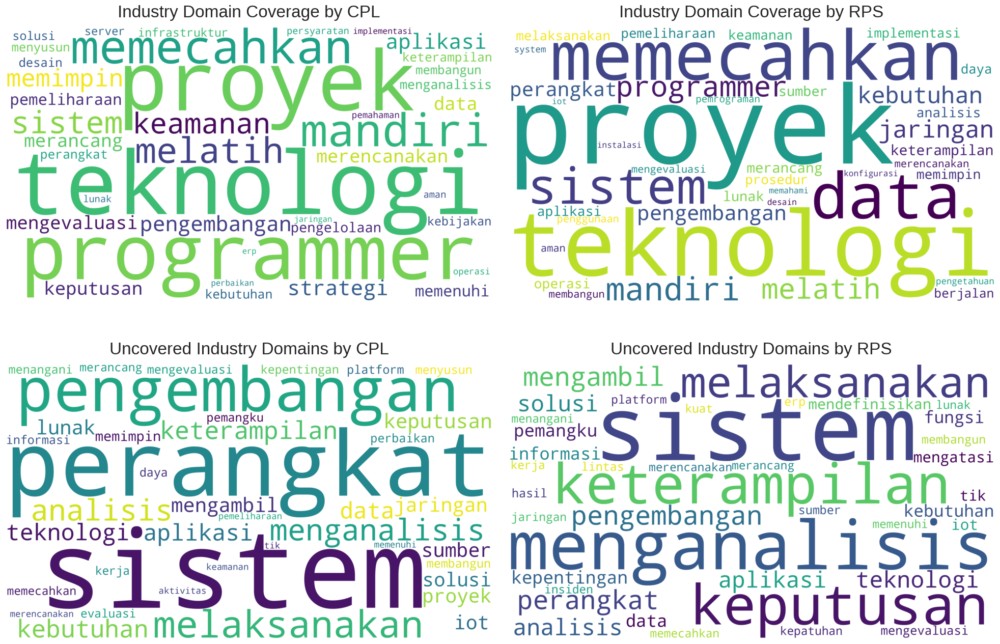

In [ ]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk.corpus import stopwords
import nltk


# ============================================================
# 1. LOAD / PREPARE STOPWORDS
# ============================================================

try:
    nltk.data.find("corpora/stopwords")
except LookupError:
    nltk.download("stopwords")

stop_words_id = set(stopwords.words("indonesian"))
stop_words_en = set(stopwords.words("english"))

custom_stopwords = {
    "dan", "atau", "yang", "dengan", "untuk", "dalam", "pada",
    "oleh", "ke", "di", "dari", "agar", "sebagai", "sesuai",
    "terhadap", "serta", "melalui", "berdasarkan", "antara",
    "hingga", "setelah", "sebelum",

    "memiliki", "mampu", "kemampuan", "dapat", "harus",
    "akan", "perlu", "baik", "lebih", "secara", "seluruh",
    "setiap", "semua",

    "perusahaan", "organisasi", "tim", "pengguna",
    "pelanggan", "client", "klien", "vendor",
    "manajemen", "bisnis",

    "melakukan", "menggunakan", "mengelola", "mengembangkan",
    "memberikan", "memastikan", "menentukan", "menyediakan",
    "membuat", "membantu", "mengidentifikasi", "meningkatkan",
    "menerapkan", "mengimplementasikan", "mengoperasikan",
    "menghasilkan", "memelihara", "mengawasi", "mendukung",

    "layanan", "proses", "produk", "teknis", "orang", "tanggung",
    "bertanggung", "kinerja", "senior", "level", "junior", "non",
    "entry", "bimbingan", "anggota", "profesi", "staff", "konsultan",
    "mengajar", "desainer", "salah", "ulang", "kesalahan",
    "lokasi", "berasal", "terkait",
}

combined_stopwords = (
    stop_words_id
    .union(stop_words_en)
    .union(custom_stopwords)
)


# ============================================================
# 2. HELPER: SPLIT DOMAIN IDS
# ============================================================

def parse_domain_ids(value):

    if pd.isna(value):
        return []

    value = str(value)

    ids = []

    for item in value.split("|"):

        item = item.strip()

        if item == "":
            continue

        try:
            ids.append(int(float(item)))
        except:
            continue

    return ids


# ============================================================
# 3. PREPARE DOMAIN LOOKUP
# ============================================================
# Reload df_domain to ensure it has the correct structure for PON-TIK domains
df_domain = pd.read_csv('/content/pon_tik_domain_representation.csv')

domain_lookup = (
    df_domain[
        [
            "domain_id",
            "skill_category",
            "num_competencies",
            "domain_text"
        ]
    ]
    .drop_duplicates("domain_id")
    .copy()
)

domain_lookup["domain_id"] = pd.to_numeric(
    domain_lookup["domain_id"],
    errors="coerce"
)

domain_lookup = domain_lookup.dropna(
    subset=["domain_id"]
)

domain_lookup["domain_id"] = (
    domain_lookup["domain_id"]
    .astype(int)
)

domain_lookup = domain_lookup.set_index(
    "domain_id"
)

print(
    "Total PON-TIK domains:",
    len(domain_lookup)
)


# ============================================================
# 4. FUNCTION TO EXTRACT ALL MAPPED DOMAIN IDS
# ============================================================

def extract_mapped_domain_ids(
    mapping_df,
    domain_id_column="matched_domain_ids"
):

    mapped_ids = set()

    for _, row in mapping_df.iterrows():

        domain_ids = parse_domain_ids(
            row.get(domain_id_column)
        )

        for domain_id in domain_ids:

            if domain_id in domain_lookup.index:
                mapped_ids.add(domain_id)

    return mapped_ids


# ============================================================
# 5. CALCULATE DOMAIN COVERAGE
# ============================================================

def calculate_domain_coverage(
    mapping_df,
    domain_id_column="matched_domain_ids"
):

    records = []

    for _, row in mapping_df.iterrows():

        domain_ids = parse_domain_ids(
            row.get(domain_id_column)
        )

        for domain_id in domain_ids:

            if domain_id not in domain_lookup.index:
                continue

            records.append({
                "domain_id": domain_id
            })

    coverage_df = pd.DataFrame(records)

    if coverage_df.empty:

        return pd.DataFrame(
            columns=[
                "domain_id",
                "coverage_count",
                "coverage_score"
            ]
        )

    # --------------------------------------------------------
    # Count mapping occurrences
    # --------------------------------------------------------

    coverage_df = (
        coverage_df
        .groupby("domain_id")
        .size()
        .reset_index(
            name="coverage_count"
        )
    )

    # --------------------------------------------------------
    # Normalize coverage
    # --------------------------------------------------------

    max_count = coverage_df[
        "coverage_count"
    ].max()

    if max_count > 0:

        coverage_df[
            "coverage_score"
        ] = (
            coverage_df["coverage_count"]
            / max_count
        )

    else:

        coverage_df[
            "coverage_score"
        ] = 0

    return coverage_df


# ============================================================
# 6. CALCULATE CPL DOMAIN COVERAGE
# ============================================================

print("\nCalculating CPL domain coverage...")

cpl_domain_coverage = calculate_domain_coverage(
    cpl_industry_alignment
)

print("\nCPL Domain Coverage:")

display(
    cpl_domain_coverage
    .sort_values(
        "coverage_score",
        ascending=False
    )
    .head(20)
)


# ============================================================
# 7. CALCULATE RPS DOMAIN COVERAGE
# ============================================================

print("\nCalculating RPS domain coverage...")

rps_domain_coverage = calculate_domain_coverage(
    df_course_industry_alignment
)

print("\nRPS Domain Coverage:")

display(
    rps_domain_coverage
    .sort_values(
        "coverage_score",
        ascending=False
    )
    .head(20)
)


# ============================================================
# 8. ADD DOMAIN DESCRIPTION
# ============================================================

def attach_domain_text(
    coverage_df
):

    result = coverage_df.copy()

    result = result.merge(
        domain_lookup.reset_index()[
            [
                "domain_id",
                "domain_text",
                "skill_category",
                "num_competencies"
            ]
        ],
        on="domain_id",
        how="left"
    )

    return result


cpl_domain_coverage = attach_domain_text(
    cpl_domain_coverage
)

rps_domain_coverage = attach_domain_text(
    rps_domain_coverage
)


# ============================================================
# 9. IDENTIFY COMPLETELY UNCOVERED DOMAINS
# ============================================================

def get_uncovered_domains(
    coverage_df
):

    # Semua domain PON-TIK
    all_domains = domain_lookup.reset_index()[
        [
            "domain_id",
            "domain_text",
            "skill_category",
            "num_competencies"
        ]
    ].copy()

    # Domain yang sudah ter-cover
    covered_ids = set(
        coverage_df["domain_id"]
    )

    # Domain yang tidak pernah muncul dalam mapping
    uncovered_df = all_domains[
        ~all_domains["domain_id"].isin(
            covered_ids
        )
    ].copy()

    # Karena uncovered berarti tidak memiliki mapping
    uncovered_df["coverage_count"] = 0
    uncovered_df["coverage_score"] = 0

    return uncovered_df


# ============================================================
# 10. CPL UNCOVERED DOMAINS
# ============================================================

cpl_uncovered_domains = get_uncovered_domains(
    cpl_domain_coverage
)

print(
    "\nTotal completely uncovered domains by CPL:",
    len(cpl_uncovered_domains)
)

display(
    cpl_uncovered_domains
    .sort_values(
        "num_competencies",
        ascending=False
    )
    .head(20)
)


# ============================================================
# 11. RPS UNCOVERED DOMAINS
# ============================================================

rps_uncovered_domains = get_uncovered_domains(
    rps_domain_coverage
)

print(
    "\nTotal completely uncovered domains by RPS:",
    len(rps_uncovered_domains)
)

display(
    rps_uncovered_domains
    .sort_values(
        "num_competencies",
        ascending=False
    )
    .head(20)
)


# ============================================================
# 12. CLEAN DOMAIN TEXT
# ============================================================

def clean_domain_text(
    text
):

    if not isinstance(text, str):
        return []

    text = text.lower()

    # Remove punctuation and numbers
    text = re.sub(
        r"[^a-z\s]",
        " ",
        text
    )

    # Remove extra spaces
    text = re.sub(
        r"\s+",
        " ",
        text
    ).strip()

    words = text.split()

    words = [
        word
        for word in words
        if word not in combined_stopwords
        and len(word) > 2
    ]

    return words


# ============================================================
# 13. CREATE COVERAGE WEIGHTS
# ============================================================

def create_coverage_weights(
    coverage_df
):

    word_weights = {}

    for _, row in coverage_df.iterrows():

        domain_text = row["domain_text"]
        coverage_score = row["coverage_score"]

        words = clean_domain_text(
            domain_text
        )

        # Satu domain hanya memberikan kontribusi
        # satu kali untuk setiap kata.
        for word in set(words):

            word_weights[word] = (
                word_weights.get(
                    word,
                    0
                )
                + coverage_score
            )

    return word_weights


# ============================================================
# 14. CREATE UNCOVERAGE WEIGHTS
# ============================================================

def create_uncoverage_weights(
    uncovered_df
):

    word_weights = {}

    for _, row in uncovered_df.iterrows():

        domain_text = row["domain_text"]

        # ----------------------------------------------------
        # Bobot uncovered menggunakan jumlah kompetensi
        # dalam domain PON-TIK.
        # ----------------------------------------------------

        num_competencies = row[
            "num_competencies"
        ]

        if pd.isna(num_competencies):
            num_competencies = 1

        try:
            num_competencies = float(
                num_competencies
            )
        except:
            num_competencies = 1

        words = clean_domain_text(
            domain_text
        )

        # Set agar satu kata tidak dihitung
        # berkali-kali dalam domain yang sama.
        for word in set(words):

            word_weights[word] = (
                word_weights.get(
                    word,
                    0
                )
                + num_competencies
            )

    return word_weights


# ============================================================
# 15. CREATE CPL WEIGHTS
# ============================================================

cpl_word_weights = create_coverage_weights(
    cpl_domain_coverage
)

cpl_uncoverage_word_weights = (
    create_uncoverage_weights(
        cpl_uncovered_domains
    )
)


# ============================================================
# 16. CREATE RPS WEIGHTS
# ============================================================

rps_word_weights = create_coverage_weights(
    rps_domain_coverage
)

rps_uncoverage_word_weights = (
    create_uncoverage_weights(
        rps_uncovered_domains
    )
)


# ============================================================
# WORDCLOUD SETTINGS
# ============================================================

WORDCLOUD_COMMON_SETTINGS = {
    "width": 1600,
    "height": 900,
    "background_color": "white",
    "collocations": False,
    "prefer_horizontal": 1.0,
    # "min_font_size": 12,
    # "max_font_size": 90,
    "relative_scaling": 0.5,
    "margin": 5,
    "scale": 2
}


# ============================================================
# LIMIT NUMBER OF WORDS
# ============================================================

TOP_N = 40


def get_top_words(
    word_weights,
    top_n=TOP_N
):

    return dict(
        sorted(
            word_weights.items(),
            key=lambda x: x[1],
            reverse=True
        )[:top_n]
    )


# ============================================================
# SELECT WORDS FOR VISUALIZATION
# ============================================================

cpl_coverage_wc = get_top_words(
    cpl_word_weights
)

rps_coverage_wc = get_top_words(
    rps_word_weights
)

cpl_uncoverage_wc = get_top_words(
    cpl_uncoverage_word_weights
)

rps_uncoverage_wc = get_top_words(
    rps_uncoverage_word_weights
)


# ============================================================
# GENERATE WORD CLOUDS
# ============================================================

fig, axes = plt.subplots(
    2,
    2,
    figsize=(20, 14)
)


# ============================================================
# CPL COVERAGE
# ============================================================

if cpl_coverage_wc:

    wc_cpl = WordCloud(
        **WORDCLOUD_COMMON_SETTINGS
    ).generate_from_frequencies(
        cpl_coverage_wc
    )

    axes[0, 0].imshow(
        wc_cpl,
        interpolation="bilinear"
    )

    axes[0, 0].axis("off")

    axes[0, 0].set_title(
        "Industry Domain Coverage by CPL",
        fontsize=24,
        pad=15
    )


# ============================================================
# RPS COVERAGE
# ============================================================

if rps_coverage_wc:

    wc_rps = WordCloud(
        **WORDCLOUD_COMMON_SETTINGS
    ).generate_from_frequencies(
        rps_coverage_wc
    )

    axes[0, 1].imshow(
        wc_rps,
        interpolation="bilinear"
    )

    axes[0, 1].axis("off")

    axes[0, 1].set_title(
        "Industry Domain Coverage by RPS",
        fontsize=24,
        pad=15
    )


# ============================================================
# CPL UNCOVERAGE
# ============================================================

if cpl_uncoverage_wc:

    wc_cpl_uncovered = WordCloud(
        **WORDCLOUD_COMMON_SETTINGS
    ).generate_from_frequencies(
        cpl_uncoverage_wc
    )

    axes[1, 0].imshow(
        wc_cpl_uncovered,
        interpolation="bilinear"
    )

    axes[1, 0].axis("off")

    axes[1, 0].set_title(
        "Uncovered Industry Domains by CPL",
        fontsize=24,
        pad=15
    )


# ============================================================
# RPS UNCOVERAGE
# ============================================================

if rps_uncoverage_wc:

    wc_rps_uncovered = WordCloud(
        **WORDCLOUD_COMMON_SETTINGS
    ).generate_from_frequencies(
        rps_uncoverage_wc
    )

    axes[1, 1].imshow(
        wc_rps_uncovered,
        interpolation="bilinear"
    )

    axes[1, 1].axis("off")

    axes[1, 1].set_title(
        "Uncovered Industry Domains by RPS",
        fontsize=24,
        pad=15
    )


# ============================================================
# FINAL LAYOUT
# ============================================================

plt.tight_layout(
    pad=2
)

plt.show()

#### Gap Tracer Study

In [ ]:
# 1. Rata-rata gap
mean_gap = df_tracer_analysis['Gap'].mean()
print(f"1. Rata-rata Gap: {mean_gap:.2f}")

# 2. Median gap
median_gap = df_tracer_analysis['Gap'].median()
print(f"2. Median Gap: {median_gap:.2f}")

# 3. Distribusi gap
gap_distribution = df_tracer_analysis['Gap'].describe()
print("\n3. Distribusi Gap:")
display(gap_distribution.to_frame())

# 4. Kompetensi dengan gap terbesar
max_gap_competency = df_tracer_analysis.loc[df_tracer_analysis['Gap'].idxmax()]
print("\n4. Kompetensi dengan Gap Terbesar:")
display(max_gap_competency.to_frame().T)

# 5. Kompetensi dengan gap terkecil
min_gap_competency = df_tracer_analysis.loc[df_tracer_analysis['Gap'].idxmin()]
print("\n5. Kompetensi dengan Gap Terkecil:")
display(min_gap_competency.to_frame().T)

# 6. Kompetensi yang mengalami positive gap, zero gap, negative gap
positive_gap = df_tracer_analysis[df_tracer_analysis['Gap'] > 0]
zero_gap = df_tracer_analysis[df_tracer_analysis['Gap'] == 0]
negative_gap = df_tracer_analysis[df_tracer_analysis['Gap'] < 0]

print("\n6. Kompetensi yang Mengalami Positive Gap:")
display(positive_gap[['Competency', 'Gap']])
print("\nKompetensi yang Mengalami Zero Gap:")
display(zero_gap[['Competency', 'Gap']])
print("\nKompetensi yang Mengalami Negative Gap:")
display(negative_gap[['Competency', 'Gap']])

1. Rata-rata Gap: 0.00
2. Median Gap: 0.00

3. Distribusi Gap:


,Gap
count,7.000000
mean,0.000000
std,0.164957
min,-0.142857
25%,-0.142857
50%,0.000000
75%,0.071429
max,0.285714



4. Kompetensi dengan Gap Terbesar:


,Competency,Graduation,Work,Gap
0,communication,4.142857,4.428571,0.285714



5. Kompetensi dengan Gap Terkecil:


,Competency,Graduation,Work,Gap
1,domain_knowledge,4.142857,4.0,-0.142857



6. Kompetensi yang Mengalami Positive Gap:


,Competency,Gap
0,communication,0.285714
6,teamwork,0.142857



Kompetensi yang Mengalami Zero Gap:


,Competency,Gap
2,english_language,0.0
3,ethics,0.0



Kompetensi yang Mengalami Negative Gap:


,Competency,Gap
1,domain_knowledge,-0.142857
4,it_skill,-0.142857
5,self_development,-0.142857


D. Visualisasi Gap

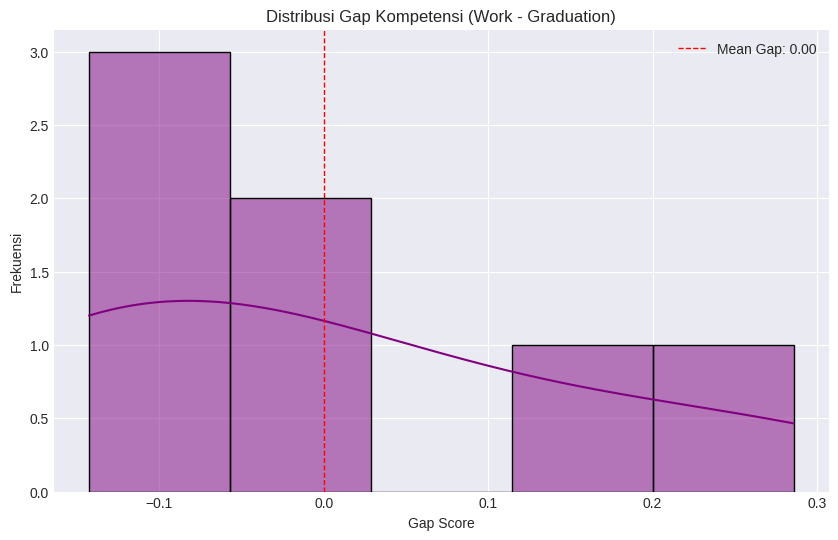

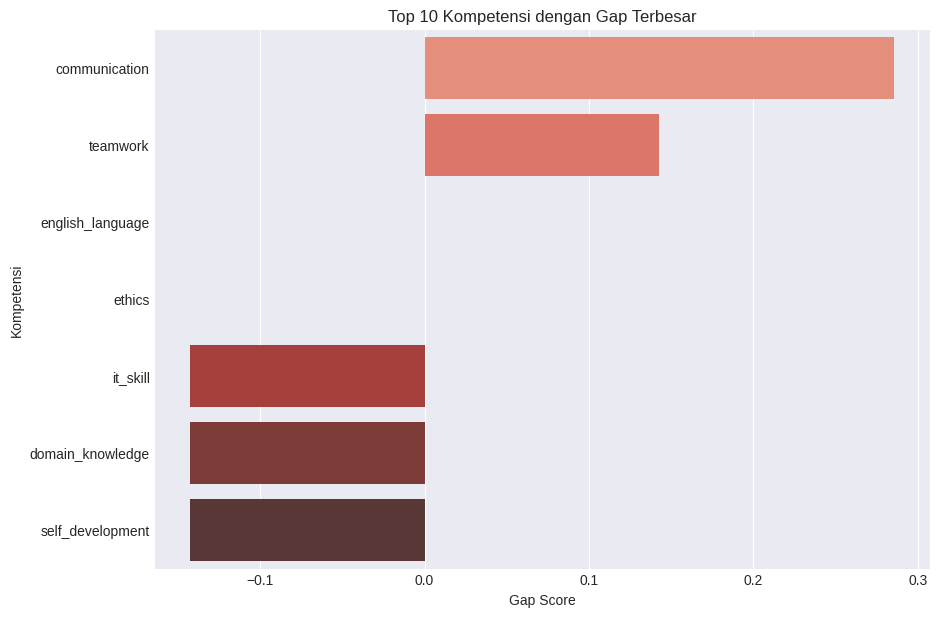

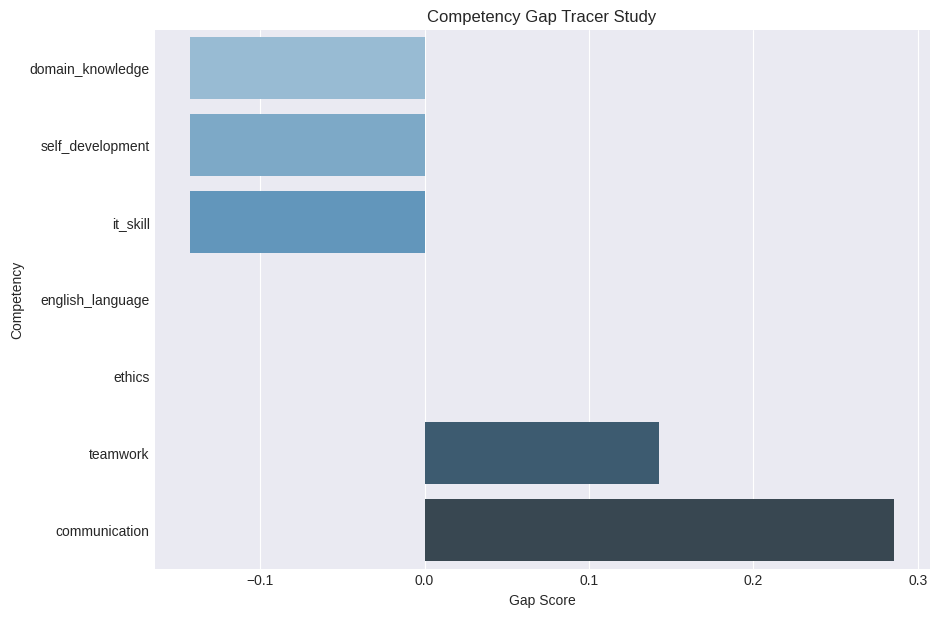

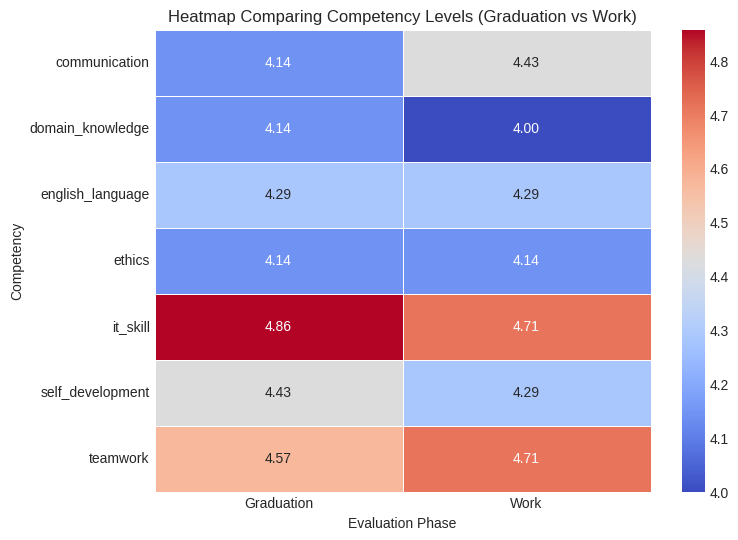

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8-darkgrid')

# 1. Histogram gap
plt.figure(figsize=(10, 6))
sns.histplot(df_tracer_analysis['Gap'], bins=5, kde=True, color='purple')
plt.title('Distribusi Gap Kompetensi (Work - Graduation)')
plt.xlabel('Gap Score')
plt.ylabel('Frekuensi')
plt.axvline(df_tracer_analysis['Gap'].mean(), color='red', linestyle='dashed', linewidth=1, label=f'Mean Gap: {df_tracer_analysis["Gap"].mean():.2f}')
plt.legend()
plt.show()

# 2. Bar chart top 10 gap terbesar
top_10_largest_gap = df_tracer_analysis.sort_values(by='Gap', ascending=False).head(10)
plt.figure(figsize=(10, 7))
sns.barplot(x='Gap', y='Competency', data=top_10_largest_gap, palette='Reds_d', hue='Competency', legend=False)
plt.title('Top 10 Kompetensi dengan Gap Terbesar')
plt.xlabel('Gap Score')
plt.ylabel('Kompetensi')
plt.show()

# 3. Bar chart top 10 gap terkecil
top_10_smallest_gap = df_tracer_analysis.sort_values(by='Gap', ascending=True).head(10)
plt.figure(figsize=(10, 7))
sns.barplot(x='Gap', y='Competency', data=top_10_smallest_gap, palette='Blues_d', hue='Competency', legend=False)
plt.title('Competency Gap Tracer Study')
plt.xlabel('Gap Score')
plt.ylabel('Competency')
plt.show()

# 4. Heatmap level saat lulus vs level saat bekerja
heatmap_data = df_tracer_analysis.set_index('Competency')[['Graduation', 'Work']]
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Heatmap Comparing Competency Levels (Graduation vs Work)')
plt.xlabel('Evaluation Phase')
plt.ylabel('Competency')
plt.show()

### RPS Course <-> CPL Alignment Visualizations

Statistik Deskriptif

Bagian ini menyajikan statistik deskriptif dari data keselarasan RPS Course dengan CPL, diikuti dengan interpretasi akademik yang mendalam.

In [ ]:
import pandas as pd
import numpy as np
import ast

# --- 1. Explode df_rps_cpl_alignment ---

print("Exploding df_rps_cpl_alignment...")

# Create a copy to avoid modifying the original DataFrame
df_exploded = df_rps_cpl_alignment.copy()

# Convert pipe-separated strings to lists
for col in ['matched_cpl_codes', 'matched_cpl_texts', 'matched_cpl_similarities_raw']:
    # Handle NaN values explicitly before splitting to avoid AttributeError
    df_exploded[col] = df_exploded[col].astype(str).apply(lambda x: x.split(' | ') if x and x != 'nan' else [])

# Explode the DataFrame using the list columns
# Ensure that the explosion maintains the original course_name and alignment_status
df_rps_cpl_alignment_exploded = df_exploded.explode(
    ['matched_cpl_codes', 'matched_cpl_texts', 'matched_cpl_similarities_raw']
)

# Rename columns and convert types as requested
df_rps_cpl_alignment_exploded = df_rps_cpl_alignment_exploded.rename(columns={
    'matched_cpl_codes': 'kode_cpl',
    'matched_cpl_texts': 'cpl_text',
    'matched_cpl_similarities_raw': 'similarity',
})

# Convert similarity and weight to numeric, coercing errors to NaN
df_rps_cpl_alignment_exploded['similarity'] = pd.to_numeric(df_rps_cpl_alignment_exploded['similarity'], errors='coerce')

# Drop rows where explosion might have resulted in NaN values if the original string was empty or 'nan'
df_rps_cpl_alignment_exploded.dropna(subset=['kode_cpl', 'cpl_text', 'similarity'], inplace=True)

print("Explosion complete. Displaying head of df_rps_cpl_alignment_exploded:")
display(df_rps_cpl_alignment_exploded.head())
print(f"Shape of exploded DataFrame: {df_rps_cpl_alignment_exploded.shape}")


Exploding df_rps_cpl_alignment...
Explosion complete. Displaying head of df_rps_cpl_alignment_exploded:


,course_code,course_name,course_text,rps_skill_category,matched_cpl_count,kode_cpl,cpl_text,similarity,top_k_average_similarity,best_similarity,alignment_status
0,FTK101,Algoritma & Pemrograman,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,Hard,5,CPL-TIF-05,mempunyai kemampuan komunikasi dalam mendefini...,0.4226,0.4012,0.4226,Not Aligned
0,FTK101,Algoritma & Pemrograman,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,Hard,5,CPL-TIF-03,memiliki pengetahuan yang memadai terkait deng...,0.4076,0.4012,0.4226,Not Aligned
0,FTK101,Algoritma & Pemrograman,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,Hard,5,CPL-TIF-07,memiliki keahlian bidang bisnis dan teknologi ...,0.3980,0.4012,0.4226,Not Aligned
0,FTK101,Algoritma & Pemrograman,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,Hard,5,CPL-TIF-06,mampu membuat desain secara holistik sebuah mo...,0.3968,0.4012,0.4226,Not Aligned
0,FTK101,Algoritma & Pemrograman,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,Hard,5,CPL-TIF-09,mampu berkontribusi dalam meningkatkan pemberd...,0.3811,0.4012,0.4226,Not Aligned


Shape of exploded DataFrame: (266, 11)


In [ ]:
import pandas as pd
import numpy as np

print("--- Statistik Deskriptif RPS Course <-> CPL Alignment ---")

# Overall similarity statistics for exploded pairs
mean_similarity_exploded = df_rps_cpl_alignment_exploded['similarity'].mean()
median_similarity_exploded = df_rps_cpl_alignment_exploded['similarity'].median()
min_similarity_exploded = df_rps_cpl_alignment_exploded['similarity'].min()
max_similarity_exploded = df_rps_cpl_alignment_exploded['similarity'].max()
std_similarity_exploded = df_rps_cpl_alignment_exploded['similarity'].std()

print(f"\nMean Similarity (Exploded Pairs): {mean_similarity_exploded:.4f}")
print(f"Median Similarity (Exploded Pairs): {median_similarity_exploded:.4f}")
print(f"Min Similarity (Exploded Pairs): {min_similarity_exploded:.4f}")
print(f"Max Similarity (Exploded Pairs): {max_similarity_exploded:.4f}")
print(f"Std Dev Similarity (Exploded Pairs): {std_similarity_exploded:.4f}")

# --- Calculate course-level alignment status ---
# A course is considered 'Align' if at least one of its CPL alignments is 'Align'.
# Otherwise, if all its associated CPL alignments are 'Tidak Align', the course is 'Tidak Align'.
course_level_alignment = df_rps_cpl_alignment_exploded.groupby('course_name')['alignment_status'].apply(
    lambda x: 'Aligned' if 'Aligned' in x.values else 'Not Aligned'
).reset_index(name='course_alignment_status')

# Distribution of this new course-level alignment status
course_alignment_status_counts = course_level_alignment['course_alignment_status'].value_counts()
course_alignment_status_percentage = course_level_alignment['course_alignment_status'].value_counts(normalize=True) * 100

print("\n--- Course-Level Alignment Status ---")
print("Distribution of Alignment Status per Course:")
display(course_alignment_status_counts.to_frame())
print("\nPercentage of Alignment Status per Course:")
display(course_alignment_status_percentage.to_frame(name='Percentage'))

# Number of unique CPLs and courses (from the exploded data, as originally planned)
unique_cpls_exploded = df_rps_cpl_alignment_exploded['kode_cpl'].nunique()
unique_courses_exploded = df_rps_cpl_alignment_exploded['course_name'].nunique()

print(f"\nNumber of Unique CPLs in Exploded Data: {unique_cpls_exploded}")
print(f"Number of Unique Courses in Exploded Data: {unique_courses_exploded}")


--- Statistik Deskriptif RPS Course <-> CPL Alignment ---

Mean Similarity (Exploded Pairs): 0.4166
Median Similarity (Exploded Pairs): 0.4121
Min Similarity (Exploded Pairs): 0.2376
Max Similarity (Exploded Pairs): 0.6824
Std Dev Similarity (Exploded Pairs): 0.0909

--- Course-Level Alignment Status ---
Distribution of Alignment Status per Course:


,count
course_alignment_status,
Not Aligned,48
Aligned,6



Percentage of Alignment Status per Course:


,Percentage
course_alignment_status,
Not Aligned,88.888889
Aligned,11.111111



Number of Unique CPLs in Exploded Data: 11
Number of Unique Courses in Exploded Data: 54


Visualisasi


--- Visualisasi 1: Coverage Heatmap ---


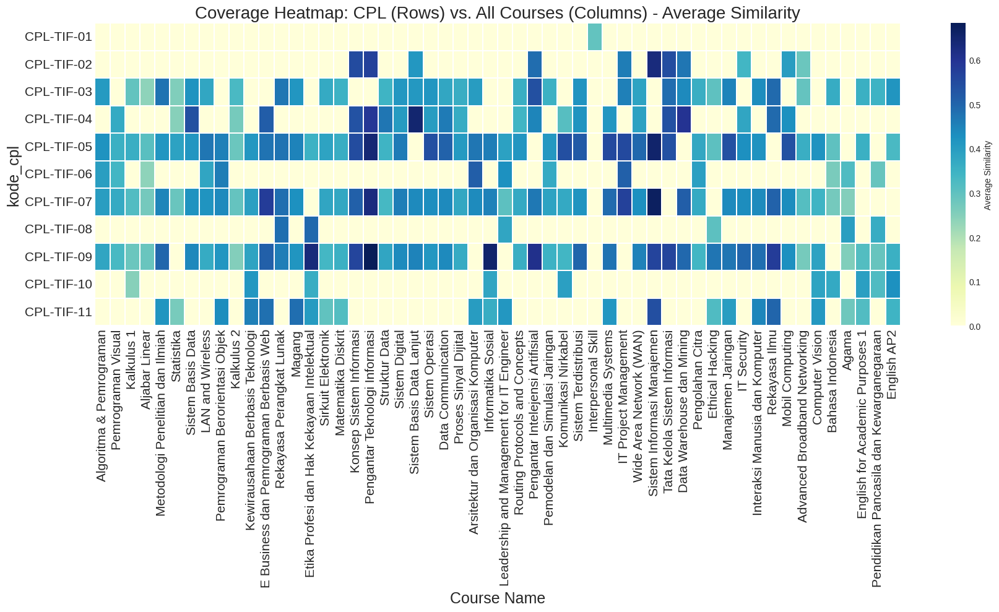


--- Visualisasi 2: Coverage per CPL ---


/tmp/ipykernel_1471/1328233546.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


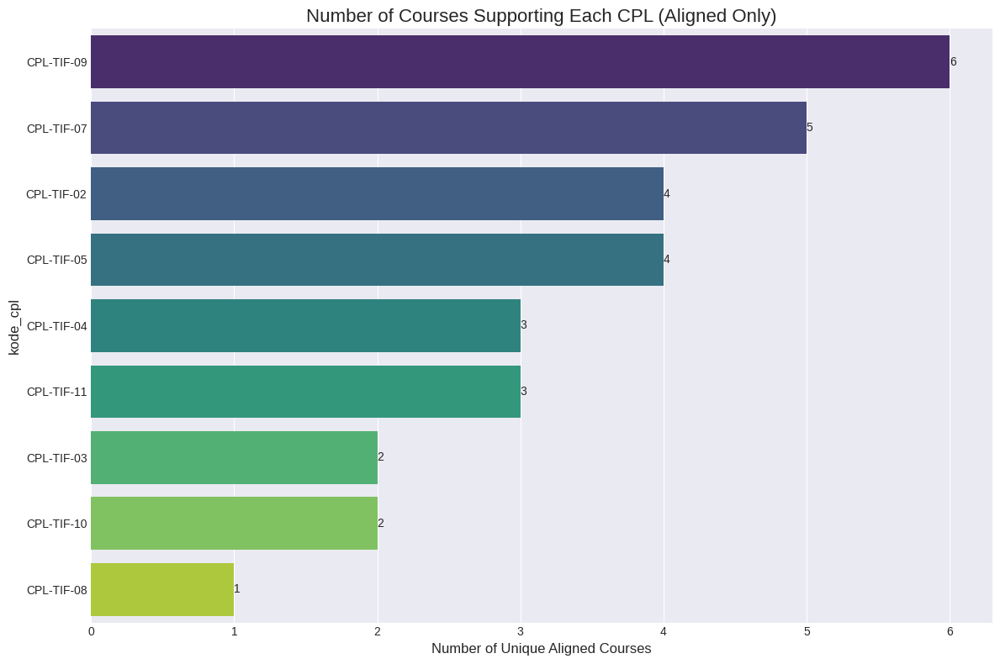


--- Visualisasi 3: Coverage per Course ---


/tmp/ipykernel_1471/1328233546.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


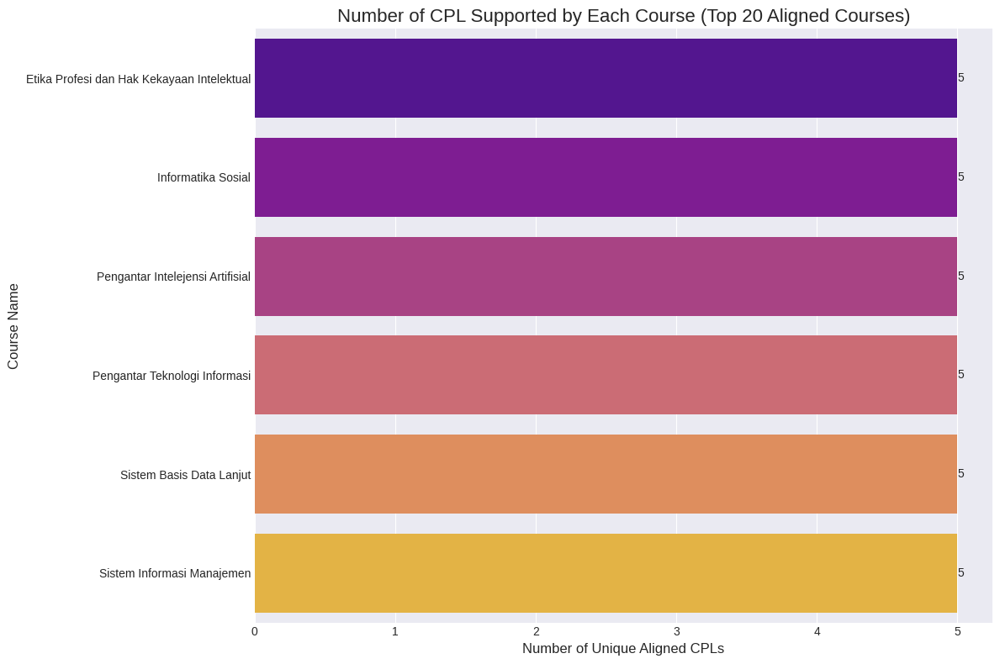


--- Visualisasi 4: Network Graph ---


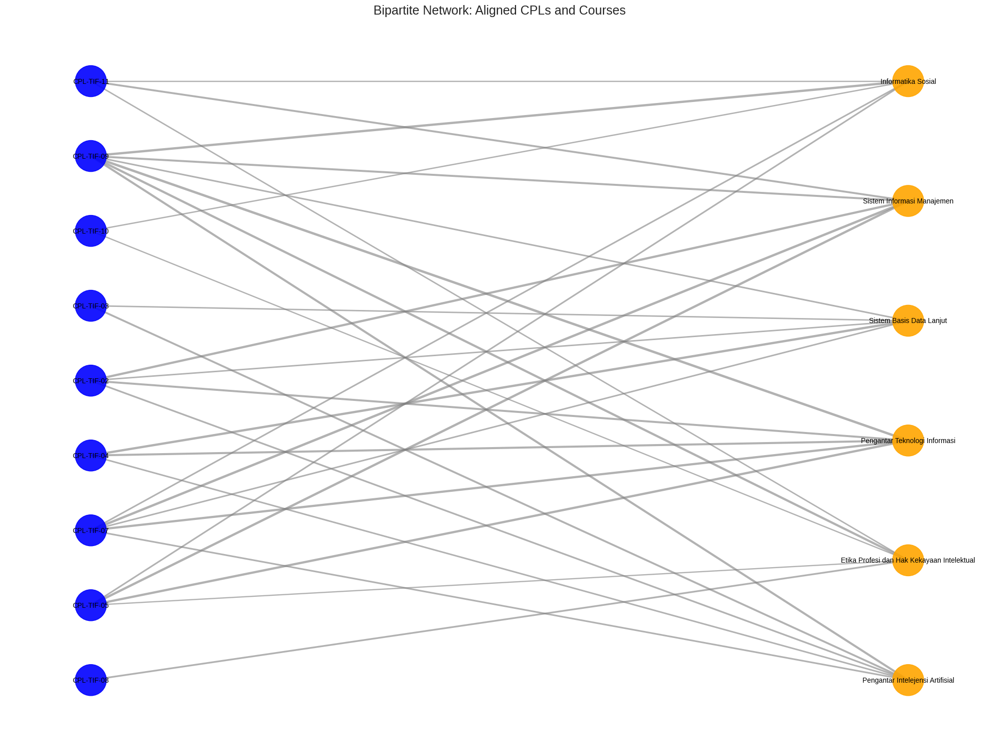


--- Visualisasi 5: Similarity Distribution ---


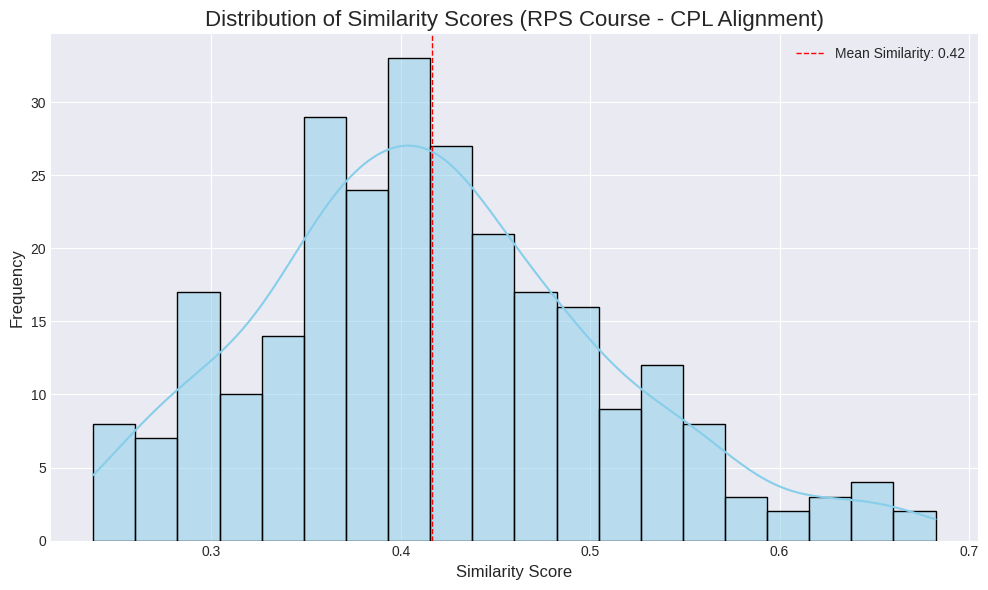

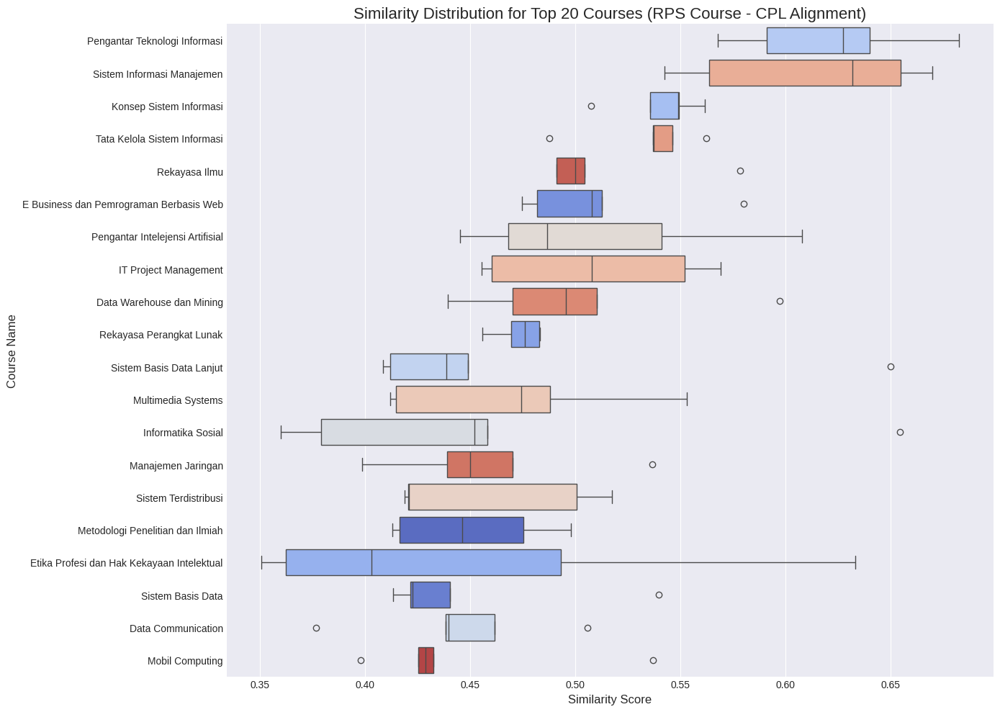

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

# --- Visualization 1: Coverage Heatmap ---
print("\n--- Visualisasi 1: Coverage Heatmap ---")

# Calculate mean similarity for each CPL-Course pair
heatmap_data = df_rps_cpl_alignment_exploded.groupby(['kode_cpl', 'course_name'])['similarity'].mean().unstack()

# Identify all courses (instead of top 20 courses)
all_courses = df_rps_cpl_alignment_exploded['course_name'].unique()

# Filter heatmap data to include all courses
heatmap_data_filtered = heatmap_data[all_courses]

# Handle potential NaN values (e.g., if a CPL doesn't align with a course)
heatmap_data_filtered = heatmap_data_filtered.fillna(0)

plt.figure(figsize=(18, 10))
sns.heatmap(
    heatmap_data_filtered,
    cmap="YlGnBu",
    linewidths=0.3,
    annot=False,
    cbar_kws={'label': 'Average Similarity'}
)
plt.title('Coverage Heatmap: CPL (Rows) vs. All Courses (Columns) - Average Similarity', fontsize=20)
plt.xlabel('Course Name', fontsize=18)
plt.ylabel('kode_cpl', fontsize=18)
plt.xticks(rotation=90, fontsize=15) # Rotate course names for readability
plt.yticks(rotation=0, fontsize=15)
plt.tight_layout()
plt.show()


# --- Visualization 2: Coverage per CPL ---
print("\n--- Visualisasi 2: Coverage per CPL ---")

cpl_coverage = df_rps_cpl_alignment_exploded[
    df_rps_cpl_alignment_exploded['alignment_status'] == 'Aligned'
].groupby('kode_cpl')['course_name'].nunique().sort_values(ascending=False)

plt.figure(figsize=(12, 8))
ax = sns.barplot(
    x=cpl_coverage.values,
    y=cpl_coverage.index,
    palette='viridis'
)
plt.title('Number of Courses Supporting Each CPL (Aligned Only)', fontsize=16)
plt.xlabel('Number of Unique Aligned Courses', fontsize=12)
plt.ylabel('kode_cpl', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Annotate bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=10)

plt.tight_layout()
plt.show()


# --- Visualization 3: Coverage per Course ---
print("\n--- Visualisasi 3: Coverage per Course ---")

course_coverage = df_rps_cpl_alignment_exploded[
    df_rps_cpl_alignment_exploded['alignment_status'] == 'Aligned'
].groupby('course_name')['kode_cpl'].nunique().nlargest(20).sort_values(ascending=False)

plt.figure(figsize=(12, 8))
ax = sns.barplot(
    x=course_coverage.values,
    y=course_coverage.index,
    palette='plasma'
)
plt.title('Number of CPL Supported by Each Course (Top 20 Aligned Courses)', fontsize=16)
plt.xlabel('Number of Unique Aligned CPLs', fontsize=12)
plt.ylabel('Course Name', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Annotate bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=10)

plt.tight_layout()
plt.show()


# --- Visualization 4: Network Graph ---
print("\n--- Visualisasi 4: Network Graph ---")

# Filter for 'Aligned' edges
graph_df = df_rps_cpl_alignment_exploded[
    df_rps_cpl_alignment_exploded['alignment_status'] == 'Aligned'
].copy()

# Create a new graph
G = nx.Graph()

# Add nodes with attributes for bipartite layout (important for NetworkX drawing)
# NetworkX requires explicit bipartite sets for layout functions
cpl_nodes = graph_df['kode_cpl'].unique()
course_nodes = graph_df['course_name'].unique()

G.add_nodes_from(cpl_nodes, bipartite=0, label_type='CPL')
G.add_nodes_from(course_nodes, bipartite=1, label_type='Course')

# Add edges with weights
for _, row in graph_df.iterrows():
    G.add_edge(row['kode_cpl'], row['course_name'], weight=row['similarity'])

# Prepare for drawing
plt.figure(figsize=(20, 15))

# Use bipartite layout for clear separation
pos = nx.drawing.layout.bipartite_layout(G, nodes=cpl_nodes, align='vertical')

# Node colors
node_color_map = []
for node in G.nodes(data=True):
    if node[1]['label_type'] == 'CPL':
        node_color_map.append('blue')
    else:
        node_color_map.append('orange')

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=2000, alpha=0.9)

# Draw edges and labels
edge_weights = [d['weight'] for (u, v, d) in G.edges(data=True)]
# Scale edge thickness for better visibility, e.g., multiply by a factor
edge_width = [w * 5 for w in edge_weights] # Adjust scaling factor as needed
nx.draw_networkx_edges(G, pos, width=edge_width, alpha=0.6, edge_color='gray')

# Node labels
nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')

# Edge labels (only for similarity >= 0.75)
edge_labels = {}
for u, v, data in G.edges(data=True):
    if data['weight'] >= 0.75:
        edge_labels[(u, v)] = f"{data['weight']:.2f}"

nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=8)

plt.title('Bipartite Network: Aligned CPLs and Courses', fontsize=18)
plt.axis('off') # Hide axes
plt.tight_layout()
plt.show()


# --- Visualization 5: Similarity Distribution ---
print("\n--- Visualisasi 5: Similarity Distribution ---")

# Figure A: Histogram
plt.figure(figsize=(10, 6))
sns.histplot(
    df_rps_cpl_alignment_exploded['similarity'],
    bins=20,
    kde=True,
    color='skyblue'
)
mean_sim = df_rps_cpl_alignment_exploded['similarity'].mean()
plt.axvline(mean_sim, color='red', linestyle='dashed', linewidth=1, label=f'Mean Similarity: {mean_sim:.2f}')
plt.title('Distribution of Similarity Scores (RPS Course - CPL Alignment)', fontsize=16)
plt.xlabel('Similarity Score', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

# Figure B: Boxplot for Top 20 Courses
# Get the Top 20 courses based on their average similarity to CPLs
top_20_courses_for_boxplot = df_rps_cpl_alignment_exploded.groupby('course_name')['similarity'].mean().nlargest(20).index

# Filter the exploded DataFrame for these top 20 courses
boxplot_data = df_rps_cpl_alignment_exploded[
    df_rps_cpl_alignment_exploded['course_name'].isin(top_20_courses_for_boxplot)
]

# Sort the courses by mean similarity for better visual order in the boxplot
mean_sim_per_course = boxplot_data.groupby('course_name')['similarity'].mean().sort_values(ascending=False)
ordered_courses = mean_sim_per_course.index

plt.figure(figsize=(14, 10))
sns.boxplot(
    x='similarity',
    y='course_name',
    data=boxplot_data,
    order=ordered_courses,
    palette='coolwarm',
    hue='course_name',
    legend=False
)
plt.title('Similarity Distribution for Top 20 Courses (RPS Course - CPL Alignment)', fontsize=16)
plt.xlabel('Similarity Score', fontsize=12)
plt.ylabel('Course Name', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

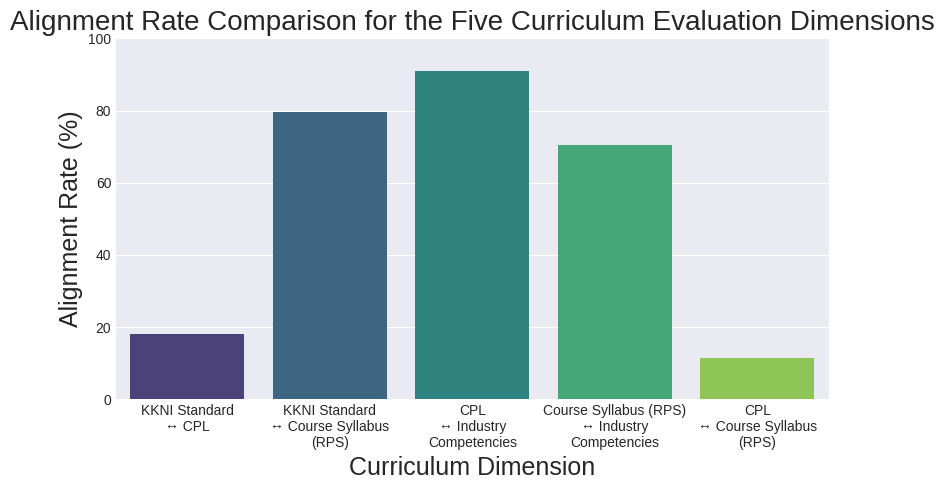

Perbandingan Alignment Rate:


,Kategori,Alignment Rate
0,KKNI Standard\n↔ CPL,18.181818
1,KKNI Standard\n↔ Course Syllabus\n(RPS),79.629630
2,CPL\n↔ Industry\nCompetencies,90.909091
3,Course Syllabus (RPS)\n↔ Industry\nCompetencies,70.370370
4,CPL\n↔ Course Syllabus\n(RPS),11.278195


In [ ]:
# 6. Perbandingan alignment rate antara CPL dan Kompetensi RPS

alignment_rate_cpl_kkni = (df_cpl_kkni['alignment_level'] == 'Aligned').mean() * 100
alignment_rate_rps_kkni = (df_rps_kkni_summary_for_bar_chart['alignment_level'] == 'Aligned').mean() * 100
alignment_rate_cpl_industri = (df_cpl_industri['alignment_label'] == 'Aligned').mean() * 100
alignment_rate_rps_industri = (df_rps_industri['alignment_label'] == 'Aligned').mean() * 100
alignment_rate_cpl_rps = (df_rps_cpl_alignment_exploded['alignment_status'] == 'Aligned').mean() * 100

comparison_df = pd.DataFrame({
    'Kategori': [
        "KKNI Standard\n↔ CPL",
        "KKNI Standard\n↔ Course Syllabus\n(RPS)",
        "CPL\n↔ Industry\nCompetencies",
        "Course Syllabus (RPS)\n↔ Industry\nCompetencies",
        "CPL\n↔ Course Syllabus\n(RPS)"
    ],
    'Alignment Rate': [alignment_rate_cpl_kkni, alignment_rate_rps_kkni, alignment_rate_cpl_industri, alignment_rate_rps_industri, alignment_rate_cpl_rps,]
})

plt.figure(figsize=(8, 5))
sns.barplot(x='Kategori', y='Alignment Rate', data=comparison_df, palette='viridis', hue='Kategori', legend=False)
plt.title('Alignment Rate Comparison for the Five Curriculum Evaluation Dimensions', fontsize=20)
plt.xlabel('Curriculum Dimension', fontsize=18)
plt.ylabel('Alignment Rate (%)', fontsize=18)
plt.ylim(0, 100)
plt.tight_layout()
plt.show()

print("Perbandingan Alignment Rate:")
display(comparison_df)

## SUMMARIZE

In [ ]:
dfs = {
    "df_cpl_kkni_mapping_final": df_cpl_kkni_mapping_final,
    "df_best_alignment": df_best_alignment,
    "cpl_industry_alignment": cpl_industry_alignment,
    "df_course_industry_alignment": df_course_industry_alignment,
    "df_competency_analysis": df_competency_analysis,
    "df_skill_category_analysis": df_skill_category_analysis,
    "df_rps_cpl_alignment": df_rps_cpl_alignment,
}

for name, df in dfs.items():
    print("="*80)
    print(name)
    print("="*80)
    print(df.columns.tolist())
    display(df)

df_cpl_kkni_mapping_final
['kode_cpl', 'kkni_no', 'cpl_text', 'kkni_description', 'similarity_score', 'alignment_label']


,kode_cpl,kkni_no,cpl_text,kkni_description,similarity_score,alignment_label
0,CPL-TIF-07,1,memiliki keahlian bidang bisnis teknologi kons...,Mampu mengaplikasikan bidang keahliannya dan m...,0.719078,Aligned
1,CPL-TIF-08,1,mengembangkan kepribadian berkualitas berinteg...,Mampu mengaplikasikan bidang keahliannya dan m...,0.614359,Aligned
2,CPL-TIF-03,2,memiliki pengetahuan memadai terkait membangun...,Menguasai konsep teoritis bidang pengetahuan t...,0.552555,Not Aligned
3,CPL-TIF-02,1,bersaing pasar global pengetahuan kemampuan me...,Mampu mengaplikasikan bidang keahliannya dan m...,0.507617,Not Aligned
4,CPL-TIF-11,4,wawasan keilmuan keunggulan bidang teknik info...,Bertanggung jawab pada pekerjaan sendiri dan d...,0.473166,Not Aligned
5,CPL-TIF-01,4,memiliki kepribadian beriman bertaqwa tuhan ym...,Bertanggung jawab pada pekerjaan sendiri dan d...,0.425460,Not Aligned
6,CPL-TIF-04,2,meningkatkan pengetahuan kemampuan terkait pem...,Menguasai konsep teoritis bidang pengetahuan t...,0.419428,Not Aligned
7,CPL-TIF-06,4,desain holistik model arsitektur teknik inform...,Bertanggung jawab pada pekerjaan sendiri dan d...,0.402942,Not Aligned
8,CPL-TIF-09,4,berkontribusi meningkatkan pemberdayaan masyar...,Bertanggung jawab pada pekerjaan sendiri dan d...,0.332976,Not Aligned
9,CPL-TIF-05,3,kemampuan komunikasi mendefinisikan kebutuhan ...,Mampu mengambil keputusan yang tepat berdasark...,0.323106,Not Aligned


df_best_alignment
['course_code', 'course_name', 'course_text', 'kkni_id', 'kkni_description', 'semantic_similarity', 'course_detected_verbs', 'course_bloom_levels_detected', 'kkni_detected_verbs', 'kkni_bloom_levels_detected', 'shared_bloom_levels', 'bloom_alignment_score', 'bloom_alignment_label', 'final_alignment_score']


,course_code,course_name,course_text,kkni_id,kkni_description,semantic_similarity,course_detected_verbs,course_bloom_levels_detected,kkni_detected_verbs,kkni_bloom_levels_detected,shared_bloom_levels,bloom_alignment_score,bloom_alignment_label,final_alignment_score
0,TIF107,Pengantar Teknologi Informasi,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.659756,"[mengevaluasi, mendemonstrasikan, menunjukkan]","[C3, C4, C2, C1, C5]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.795854
1,TIF351,Sistem Informasi Manajemen,Deskripsi Mata Kuliah Mata kuliah ini membahas...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.608700,"[menunjukkan, membangun, menjelaskan, memahami...","[C3, C4, C6, C2, C1]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.765220
2,TIF358,Manajemen Jaringan,uraian mata kuliah pada kuliah ini akan membah...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.594781,"[menunjukkan, memilih, menerapkan, menjelaskan...","[C3, C4, C2, C1, C5]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.756869
3,TIF452,Rekayasa Ilmu,Deskripsi kursus Pengantar Rekayasa Pengetahua...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.588104,"[menerapkan, menjelaskan, menemukan, mendemons...","[C3, C4, C6, C2, C1]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.752862
4,FTK151,Metodologi Penelitian dan Ilmiah,Deskripsi Mata Kuliah Mata kuliah ini akan mem...,1,Mampu mengaplikasikan bidang keahliannya dan m...,0.569875,"[menulis, membaca, menunjukkan, menuliskan]","[C2, C4, C3, C1]",[memanfaatkan],[C3],[C3],1.0,Aligned,0.741925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,TIF455,Advanced Broadband Networking,Error 500 (Server Error)!!1500.That’s an error...,4,Bertanggung jawab pada pekerjaan sendiri dan d...,0.083590,[memahami],[C2],[],[],[],0.0,Not Aligned,0.050154
212,FTK103,Pemrograman Visual,deskripsi kursus kursus ini dimaksudkan untuk ...,4,Bertanggung jawab pada pekerjaan sendiri dan d...,0.074452,"[meringkas, mengurutkan, membuat, menampilkan,...","[C2, C6, C3, C1]",[],[],[],0.0,Not Aligned,0.044671
213,FTK111,Kalkulus 1,course description mata kuliah ini dimaksudkan...,4,Bertanggung jawab pada pekerjaan sendiri dan d...,0.065395,[],[],[],[],[],0.0,Not Aligned,0.039237
214,TIF103,Matematika Diskrit,Deskripsi Mata Kuliah Mata kuliah ini akan men...,4,Bertanggung jawab pada pekerjaan sendiri dan d...,0.064759,"[menghargai, merancang, menunjukkan, membuat, ...","[C3, C4, C6, C2, C1, C5]",[],[],[],0.0,Not Aligned,0.038856


cpl_industry_alignment
['CPL', 'kode_cpl', 'Skill Category', 'Matched Count', 'top_k_average_similarity', 'best_similarity', 'Alignment Status', 'Matched Industry Competencies', 'Matched Similarity Scores', 'matched_domain_ids']


,CPL,kode_cpl,Skill Category,Matched Count,top_k_average_similarity,best_similarity,Alignment Status,Matched Industry Competencies,Matched Similarity Scores,matched_domain_ids
0,memiliki kepribadian yang beriman dan bertaqwa...,CPL-TIF-01,Soft,5,0.5712,0.6228,Not Aligned,having high integrity and good personal | has ...,0.6228 | 0.5633 | 0.5612 | 0.5597 | 0.5493,117 | 174 | 167 | 106 | 106
1,mampu bersaing di pasar global dengan pengetah...,CPL-TIF-02,Hard,5,0.6432,0.6605,Aligned,information technology | berkoordinasi dengan ...,0.6605 | 0.6462 | 0.6371 | 0.6363 | 0.636,175 | 176 | 111 | 176 | 170
2,memiliki pengetahuan yang memadai terkait deng...,CPL-TIF-03,Hard,5,0.6482,0.6797,Aligned,"having adequate knowledgeable in hardware, rai...",0.6797 | 0.6514 | 0.6486 | 0.6313 | 0.6301,164 | 176 | 86 | 98 | 68
3,mampu meningkatkan pengetahuan dan kemampuan t...,CPL-TIF-04,Hard,5,0.7646,0.7858,Aligned,memiliki pengetahuan terkait high availability...,0.7858 | 0.7685 | 0.7649 | 0.7607 | 0.7433,110 | 110 | 110 | 110 | 110
4,mempunyai kemampuan komunikasi dalam mendefini...,CPL-TIF-05,Hard,5,0.7506,0.7615,Aligned,"strong communication skills, capable of simpli...",0.7615 | 0.7564 | 0.7459 | 0.7446 | 0.7446,106 | 106 | 106 | 106 | 106
5,mampu membuat desain secara holistik sebuah mo...,CPL-TIF-06,Hard,5,0.6774,0.6928,Aligned,desain arsitektur: | strong understanding of s...,0.6928 | 0.6846 | 0.677 | 0.6731 | 0.6597,98 | 163 | 182 | 162 | 144
6,memiliki keahlian bidang bisnis dan teknologi ...,CPL-TIF-07,Hard,5,0.7043,0.7356,Aligned,provide technical expertise in | keahlian tekn...,0.7356 | 0.7079 | 0.7014 | 0.6968 | 0.6796,106 | 106 | 106 | 127 | 106
7,mampu mengembangkan kepribadian yang berkualit...,CPL-TIF-08,Hard,5,0.6721,0.6926,Aligned,good analytical skills and passionate to learn...,0.6926 | 0.6729 | 0.6677 | 0.6651 | 0.6621,82 | 106 | 106 | 106 | 106
8,mampu berkontribusi dalam meningkatkan pemberd...,CPL-TIF-09,Hard,5,0.6149,0.6344,Aligned,understanding and applying knowledge in data s...,0.6344 | 0.6187 | 0.6097 | 0.6068 | 0.6047,112 | 176 | 64 | 54 | 100
9,mampu meningkatkan kemampuan komunikasi efekti...,CPL-TIF-10,Hard,5,0.6995,0.7216,Aligned,excellent verbal and written communication to ...,0.7216 | 0.7186 | 0.6917 | 0.6907 | 0.675,106 | 106 | 106 | 106 | 106


df_course_industry_alignment
['course_name', 'course_skill_category', 'alignment_label', 'top_k_average_similarity', 'best_similarity', 'best_match_overall_industry_competency', 'best_match_overall_similarity', 'matched_industry_competencies_count', 'top_k_matched_industry_competencies', 'top_k_matched_similarities', 'matched_domain_ids']


,course_name,course_skill_category,alignment_label,top_k_average_similarity,best_similarity,best_match_overall_industry_competency,best_match_overall_similarity,matched_industry_competencies_count,top_k_matched_industry_competencies,top_k_matched_similarities,matched_domain_ids
0,Algoritma & Pemrograman,Hard,Aligned,0.6800,0.6947,memahami konsep dasar pemrograman understand b...,0.6947,5,memahami konsep dasar pemrograman understand b...,0.6947 | 0.6826 | 0.678 | 0.6741 | 0.6704,106 | 58 | 106 | 107 | 80
1,Pemrograman Visual,Hard,Aligned,0.6841,0.7311,kursus pemrograman komputer computer programmi...,0.7311,5,kursus pemrograman komputer computer programmi...,0.7311 | 0.7139 | 0.7066 | 0.6527 | 0.616,106 | 106 | 106 | 58 | 98
2,Kalkulus 1,Hard,Not Aligned,0.5696,0.5926,kelancaran dalam mengembangkan dan memahami di...,0.5926,5,kelancaran dalam mengembangkan dan memahami di...,0.5926 | 0.5727 | 0.5659 | 0.5621 | 0.5547,58 | 58 | 109 | 106 | 106
3,Aljabar Linear,Hard,Not Aligned,0.5345,0.5746,kelancaran dalam mengembangkan dan memahami di...,0.5746,5,kelancaran dalam mengembangkan dan memahami di...,0.5746 | 0.5472 | 0.5273 | 0.512 | 0.5114,58 | 54 | 106 | 145 | 106
4,Metodologi Penelitian dan Ilmiah,Hard,Aligned,0.6362,0.6605,melakukan penelitian untuk membantu mengembang...,0.6605,5,melakukan penelitian untuk membantu mengembang...,0.6605 | 0.6433 | 0.6291 | 0.6272 | 0.6209,166 | 180 | 146 | 72 | 140
5,Statistika,Hard,Not Aligned,0.5648,0.5715,kursus pemrograman komputer computer programmi...,0.5715,5,kursus pemrograman komputer computer programmi...,0.5715 | 0.5657 | 0.5649 | 0.5635 | 0.5585,106 | 106 | 58 | 106 | 106
6,Sistem Basis Data,Hard,Aligned,0.6527,0.6602,kelancaran dalam mengembangkan dan memahami di...,0.6602,5,kelancaran dalam mengembangkan dan memahami di...,0.6602 | 0.6558 | 0.6547 | 0.6507 | 0.642,58 | 107 | 110 | 106 | 110
7,LAN and Wireless,Hard,Aligned,0.6748,0.6957,"memahami konsep jaringan komputer (tcp/ip, rou...",0.6957,5,"memahami konsep jaringan komputer (tcp/ip, rou...",0.6957 | 0.6903 | 0.673 | 0.6577 | 0.6574,14 | 191 | 14 | 102 | 191
8,Pemrograman Berorientasi Objek,Hard,Aligned,0.6706,0.6835,memahami konsep dasar pemrograman understand b...,0.6835,5,memahami konsep dasar pemrograman understand b...,0.6835 | 0.6808 | 0.6799 | 0.6714 | 0.6375,106 | 105 | 191 | 106 | 105
9,Kalkulus 2,Hard,Not Aligned,0.5581,0.6151,"membuat dan menyebarkan kursus online, termasu...",0.6151,5,"membuat dan menyebarkan kursus online, termasu...",0.6151 | 0.577 | 0.5512 | 0.528 | 0.5195,106 | 58 | 106 | 106 | 58


df_competency_analysis
['Competency', 'Graduation', 'Work', 'Gap']


,Competency,Graduation,Work,Gap
0,communication,4.142857,4.428571,0.285714
1,domain_knowledge,4.142857,4.000000,-0.142857
2,english_language,4.285714,4.285714,0.000000
3,ethics,4.142857,4.142857,0.000000
4,it_skill,4.857143,4.714286,-0.142857
5,self_development,4.428571,4.285714,-0.142857
6,teamwork,4.571429,4.714286,0.142857


df_skill_category_analysis
['Category', 'Graduation', 'Work', 'Gap']


,Category,Graduation,Work,Gap
0,Hard Skill,4.500000,4.357143,-0.142857
1,Soft Skill,4.314286,4.371429,0.057143


df_rps_cpl_alignment
['course_code', 'course_name', 'course_text', 'rps_skill_category', 'matched_cpl_count', 'matched_cpl_codes', 'matched_cpl_texts', 'matched_cpl_similarities_raw', 'top_k_average_similarity', 'best_similarity', 'alignment_status']


,course_code,course_name,course_text,rps_skill_category,matched_cpl_count,matched_cpl_codes,matched_cpl_texts,matched_cpl_similarities_raw,top_k_average_similarity,best_similarity,alignment_status
0,FTK101,Algoritma & Pemrograman,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,Hard,5,CPL-TIF-05 | CPL-TIF-03 | CPL-TIF-07 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.4226 | 0.4076 | 0.398 | 0.3968 | 0.3811,0.4012,0.4226,Not Aligned
1,FTK103,Pemrograman Visual,deskripsi kursus kursus ini dimaksudkan untuk ...,Hard,5,CPL-TIF-04 | CPL-TIF-07 | CPL-TIF-05 | CPL-TIF...,mampu meningkatkan pengetahuan dan kemampuan t...,0.369 | 0.3685 | 0.3562 | 0.3395 | 0.3332,0.3533,0.3690,Not Aligned
2,FTK111,Kalkulus 1,course description mata kuliah ini dimaksudkan...,Hard,5,CPL-TIF-05 | CPL-TIF-07 | CPL-TIF-03 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.3586 | 0.3181 | 0.2958 | 0.2829 | 0.2475,0.3006,0.3586,Not Aligned
3,FTK121,Aljabar Linear,Deskripsi Mata Kuliah Mata kuliah ini memberik...,Hard,5,CPL-TIF-05 | CPL-TIF-09 | CPL-TIF-07 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.309 | 0.2875 | 0.2695 | 0.2376 | 0.2376,0.2683,0.3090,Not Aligned
4,FTK151,Metodologi Penelitian dan Ilmiah,Deskripsi Mata Kuliah Mata kuliah ini akan mem...,Hard,5,CPL-TIF-09 | CPL-TIF-03 | CPL-TIF-07 | CPL-TIF...,mampu berkontribusi dalam meningkatkan pemberd...,0.4979 | 0.4754 | 0.4462 | 0.4163 | 0.4132,0.4498,0.4979,Not Aligned
5,FTK161,Statistika,course description deskripsi matakuliah descri...,Hard,5,CPL-TIF-05 | CPL-TIF-07 | CPL-TIF-11 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.3885 | 0.2872 | 0.2656 | 0.2538 | 0.2479,0.2886,0.3885,Not Aligned
6,FTK203,Sistem Basis Data,deskripsi kursus gambaran umum kursus ini menc...,Hard,5,CPL-TIF-04 | CPL-TIF-09 | CPL-TIF-07 | CPL-TIF...,mampu meningkatkan pengetahuan dan kemampuan t...,0.5397 | 0.4403 | 0.4225 | 0.4215 | 0.4135,0.4475,0.5397,Not Aligned
7,FTK205,LAN and Wireless,Deskripsi Mata Kuliah Mata kuliah ini memperke...,Hard,5,CPL-TIF-05 | CPL-TIF-07 | CPL-TIF-06 | CPL-TIF...,mempunyai kemampuan komunikasi dalam mendefini...,0.4701 | 0.4211 | 0.3798 | 0.3759 | 0.3675,0.4029,0.4701,Not Aligned
8,FTK206,Pemrograman Berorientasi Objek,Deskripsi Mata Kuliah Mata kuliah ini bertujua...,Hard,5,CPL-TIF-06 | CPL-TIF-05 | CPL-TIF-07 | CPL-TIF...,mampu membuat desain secara holistik sebuah mo...,0.4611 | 0.4558 | 0.4394 | 0.4334 | 0.4144,0.4408,0.4611,Not Aligned
9,FTK211,Kalkulus 2,course description mata kuliah ini akan mencak...,Hard,5,CPL-TIF-03 | CPL-TIF-07 | CPL-TIF-05 | CPL-TIF...,memiliki pengetahuan yang memadai terkait deng...,0.3288 | 0.2929 | 0.2845 | 0.2671 | 0.2521,0.2851,0.3288,Not Aligned


In [ ]:
# ==========================================================
# TEMPLATE FUNCTIONS
# Digunakan oleh seluruh Summary Similarity
# ==========================================================

import pandas as pd
import numpy as np


# ==========================================================
# BASIC STATISTICS
# ==========================================================

def generate_basic_statistics(df, similarity_col, entity_name):

    total = len(df)

    summary_table = pd.DataFrame({
        "Metric": [
            f"Jumlah {entity_name}",
            "Average Similarity",
            "Median Similarity",
            "Maximum Similarity",
            "Minimum Similarity",
            "Standard Deviation"
        ],
        "Value": [
            total,
            round(df[similarity_col].mean(), 4),
            round(df[similarity_col].median(), 4),
            round(df[similarity_col].max(), 4),
            round(df[similarity_col].min(), 4),
            round(df[similarity_col].std(), 4)
        ]
    })

    if alignment_col is not None:

        alignment_pct = (
            df[alignment_col]
            .astype(str)
            .str.lower()
            .isin(["aligned","align","ya"])
            .mean()
            *100
        )

        summary_table.loc[len(summary_table)] = [
            "Alignment Percentage (%)",
            round(alignment_pct,2)
        ]

    return summary_table


# ==========================================================
# ALIGNMENT DISTRIBUTION
# ==========================================================

def generate_alignment(df, alignment_col):

    alignment = (
        df[alignment_col]
        .value_counts(dropna=False)
        .rename_axis("Alignment")
        .reset_index(name="Jumlah")
    )

    alignment["Persentase (%)"] = (
        alignment["Jumlah"] /
        len(df) *
        100
    ).round(2)

    return alignment


# ==========================================================
# TOP & BOTTOM
# ==========================================================

def generate_top_bottom(
    df,
    entity_col,
    similarity_col,
    alignment_col,
    top_n=5
):

    display_columns = [
        entity_col,
        similarity_col,
        alignment_col
    ]

    top = (
        df
        .sort_values(similarity_col, ascending=False)
        [display_columns]
        .head(top_n)
        .reset_index(drop=True)
    )

    bottom = (
        df
        .sort_values(similarity_col, ascending=True)
        [display_columns]
        .head(top_n)
        .reset_index(drop=True)
    )

    return top, bottom


# ==========================================================
# GENERATE INSIGHT
# ==========================================================

def generate_similarity_insight(
    entity_name,
    summary_table,
    alignment_count,
    top_df,
    bottom_df,
    entity_col,
    similarity_col
):

    insight = []

    avg_similarity = summary_table.loc[
        summary_table["Metric"] == "Average Similarity",
        "Value"
    ].iloc[0]

    max_similarity = summary_table.loc[
        summary_table["Metric"] == "Maximum Similarity",
        "Value"
    ].iloc[0]

    min_similarity = summary_table.loc[
        summary_table["Metric"] == "Minimum Similarity",
        "Value"
    ].iloc[0]

    aligned = alignment_count[
        alignment_count["Alignment"]
        .astype(str)
        .str.lower()
        .isin(["aligned","align"])
    ]

    aligned_pct = (
        aligned["Persentase (%)"].iloc[0]
        if not aligned.empty
        else 0
    )

    if avg_similarity >= 0.80:

        insight.append(
            f"Rata-rata semantic similarity sebesar {avg_similarity:.4f} "
            f"menunjukkan tingkat keselarasan yang sangat tinggi antara {entity_name.lower()}."
        )

    elif avg_similarity >= 0.60:

        insight.append(
            f"Rata-rata semantic similarity sebesar {avg_similarity:.4f} "
            f"menunjukkan bahwa {entity_name.lower()} memiliki tingkat keselarasan yang cukup baik."
        )

    else:

        insight.append(
            f"Rata-rata semantic similarity sebesar {avg_similarity:.4f} "
            f"menunjukkan bahwa keselarasan {entity_name.lower()} masih perlu ditingkatkan."
        )

    insight.append(
        f"Sebanyak {aligned_pct:.2f}% pasangan berhasil memenuhi "
        f"threshold similarity sehingga dikategorikan sebagai aligned."
    )

    insight.append(
        f"{entity_name} dengan similarity tertinggi adalah "
        f"{top_df.iloc[0][entity_col]} "
        f"({top_df.iloc[0][similarity_col]:.4f})."
    )

    insight.append(
        f"{entity_name} dengan similarity terendah adalah "
        f"{bottom_df.iloc[0][entity_col]} "
        f"({bottom_df.iloc[0][similarity_col]:.4f})."
    )

    if max_similarity - min_similarity >= 0.30:
        insight.append(
            f"Variasi similarity antar {entity_name.lower()} cukup besar."
        )

    else:
        insight.append(
            f"Sebaran similarity antar {entity_name.lower()} relatif merata."
        )

    return insight

### KKNI ↔ CPL

In [ ]:
# ==========================================================
# SUMMARY 1 : KKNI ↔ CPL
# ==========================================================

print("=" * 90)
print("SUMMARY 1 : EVALUASI KKNI ↔ CAPAIAN PEMBELAJARAN LULUSAN (CPL)")
print("=" * 90)

# ------------------------------------------------------------------
# Copy Data
# ------------------------------------------------------------------

df_summary = df_cpl_kkni_mapping_final.copy()

# ------------------------------------------------------------------
# Column Mapping
# ------------------------------------------------------------------

cpl_col = "kode_cpl"
similarity_col = "similarity_score"
alignment_col = "alignment_label"

# ------------------------------------------------------------------
# Summary
# ------------------------------------------------------------------

summary_table = generate_basic_statistics(
    df=df_summary,
    similarity_col=similarity_col,
    entity_name="CPL"
)

alignment_count = generate_alignment(
    df=df_summary,
    alignment_col=alignment_col
)

top3, bottom3 = generate_top_bottom(
    df=df_summary,
    entity_col=cpl_col,
    similarity_col=similarity_col,
    alignment_col=alignment_col,
    top_n=3
)

insight = generate_similarity_insight(
    entity_name="CPL",
    summary_table=summary_table,
    alignment_count=alignment_count,
    top_df=top3,
    bottom_df=bottom3,
    entity_col=cpl_col,
    similarity_col=similarity_col
)

# ------------------------------------------------------------------
# Summary Dictionary
# ------------------------------------------------------------------

summary_kkni_cpl = {

    "statistics": summary_table,

    "alignment": alignment_count,

    "top3": top3,

    "bottom3": bottom3,

    "insight": insight

}

# ------------------------------------------------------------------
# Display
# ------------------------------------------------------------------

print("\nSTATISTIK UMUM")
display(summary_kkni_cpl["statistics"])

print("\nDISTRIBUSI ALIGNMENT")
display(summary_kkni_cpl["alignment"])

print("\nTOP 3 CPL")
display(summary_kkni_cpl["top3"])

print("\nBOTTOM 3 CPL")
display(summary_kkni_cpl["bottom3"])

print("\n" + "=" * 90)
print("INSIGHT")
print("=" * 90)

for i, item in enumerate(summary_kkni_cpl["insight"], start=1):
    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_kkni_cpl")

SUMMARY 1 : EVALUASI KKNI ↔ CAPAIAN PEMBELAJARAN LULUSAN (CPL)

STATISTIK UMUM


,Metric,Value
0,Jumlah CPL,11.0000
1,Average Similarity,0.4621
2,Median Similarity,0.4255
3,Maximum Similarity,0.7191
4,Minimum Similarity,0.3126
5,Standard Deviation,0.1283
6,Alignment Percentage (%),18.1800



DISTRIBUSI ALIGNMENT


,Alignment,Jumlah,Persentase (%)
0,Not Aligned,9,81.82
1,Aligned,2,18.18



TOP 3 CPL


,kode_cpl,similarity_score,alignment_label
0,CPL-TIF-07,0.719078,Aligned
1,CPL-TIF-08,0.614359,Aligned
2,CPL-TIF-03,0.552555,Not Aligned



BOTTOM 3 CPL


,kode_cpl,similarity_score,alignment_label
0,CPL-TIF-10,0.312604,Not Aligned
1,CPL-TIF-05,0.323106,Not Aligned
2,CPL-TIF-09,0.332976,Not Aligned



INSIGHT
1. Rata-rata semantic similarity sebesar 0.4621 menunjukkan bahwa keselarasan cpl masih perlu ditingkatkan.
2. Sebanyak 18.18% pasangan berhasil memenuhi threshold similarity sehingga dikategorikan sebagai aligned.
3. CPL dengan similarity tertinggi adalah CPL-TIF-07 (0.7191).
4. CPL dengan similarity terendah adalah CPL-TIF-10 (0.3126).
5. Variasi similarity antar cpl cukup besar.

Summary berhasil disimpan pada variabel:
summary_kkni_cpl


### KKNI ↔ Kompetensi

In [ ]:
# ==========================================================
# SUMMARY 2 : KKNI ↔ MATA KULIAH (KOMPETENSI RPS)
# ==========================================================

print("=" * 90)
print("SUMMARY 2 : EVALUASI KKNI ↔ MATA KULIAH (KOMPETENSI RPS)")
print("=" * 90)

# ------------------------------------------------------------------
# Copy Data
# ------------------------------------------------------------------

df_summary = df_course_kkni_summary.copy()

# ------------------------------------------------------------------
# Column Mapping
# ------------------------------------------------------------------

course_col = "course_name"
similarity_col = "max_final_alignment_score_with_kkni"
alignment_col = "course_overall_alignment_label"

# ------------------------------------------------------------------
# Summary
# ------------------------------------------------------------------

summary_table = generate_basic_statistics(
    df=df_summary,
    similarity_col=similarity_col,
    entity_name="Mata Kuliah"
)

alignment_count = generate_alignment(
    df=df_summary,
    alignment_col=alignment_col
)

top5, bottom5 = generate_top_bottom(
    df=df_summary,
    entity_col=course_col,
    similarity_col=similarity_col,
    alignment_col=alignment_col,
    top_n=5
)

insight = generate_similarity_insight(
    entity_name="Mata Kuliah",
    summary_table=summary_table,
    alignment_count=alignment_count,
    top_df=top5,
    bottom_df=bottom5,
    entity_col=course_col,
    similarity_col=similarity_col
)

# ------------------------------------------------------------------
# Summary Dictionary
# ------------------------------------------------------------------

summary_kkni_course = {

    "statistics": summary_table,

    "alignment": alignment_count,

    "top5": top5,

    "bottom5": bottom5,

    "insight": insight

}

# ------------------------------------------------------------------
# Display
# ------------------------------------------------------------------

print("\nSTATISTIK UMUM")
display(summary_kkni_course["statistics"])

print("\nDISTRIBUSI ALIGNMENT")
display(summary_kkni_course["alignment"])

print("\nTOP 5 MATA KULIAH")
display(summary_kkni_course["top5"])

print("\nBOTTOM 5 MATA KULIAH")
display(summary_kkni_course["bottom5"])

print("\n" + "=" * 90)
print("INSIGHT")
print("=" * 90)

for i, item in enumerate(summary_kkni_course["insight"], start=1):
    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_kkni_course")

SUMMARY 2 : EVALUASI KKNI ↔ MATA KULIAH (KOMPETENSI RPS)

STATISTIK UMUM


,Metric,Value
0,Jumlah Mata Kuliah,54.0000
1,Average Similarity,0.6303
2,Median Similarity,0.6685
3,Maximum Similarity,0.7959
4,Minimum Similarity,0.1876
5,Standard Deviation,0.1354
6,Alignment Percentage (%),79.6300



DISTRIBUSI ALIGNMENT


,Alignment,Jumlah,Persentase (%)
0,Aligned,43,79.63
1,Not Aligned,11,20.37



TOP 5 MATA KULIAH


,course_name,max_final_alignment_score_with_kkni,course_overall_alignment_label
0,Pengantar Teknologi Informasi,0.795854,Aligned
1,Sistem Informasi Manajemen,0.765220,Aligned
2,Manajemen Jaringan,0.756869,Aligned
3,Rekayasa Ilmu,0.752862,Aligned
4,Metodologi Penelitian dan Ilmiah,0.741925,Aligned



BOTTOM 5 MATA KULIAH


,course_name,max_final_alignment_score_with_kkni,course_overall_alignment_label
0,Advanced Broadband Networking,0.187605,Not Aligned
1,Kalkulus 2,0.254666,Not Aligned
2,Mobil Computing,0.257930,Not Aligned
3,Kalkulus 1,0.298223,Not Aligned
4,Kewirausahaan Berbasis Teknologi,0.347533,Not Aligned



INSIGHT
1. Rata-rata semantic similarity sebesar 0.6303 menunjukkan bahwa mata kuliah memiliki tingkat keselarasan yang cukup baik.
2. Sebanyak 79.63% pasangan berhasil memenuhi threshold similarity sehingga dikategorikan sebagai aligned.
3. Mata Kuliah dengan similarity tertinggi adalah Pengantar Teknologi Informasi (0.7959).
4. Mata Kuliah dengan similarity terendah adalah Advanced Broadband Networking (0.1876).
5. Variasi similarity antar mata kuliah cukup besar.

Summary berhasil disimpan pada variabel:
summary_kkni_course


### CPL ↔ KOMPETENSI (TRACER STUDY & JOB PORTAL)


In [ ]:
# ==========================================================
# SUMMARY 3 : CPL ↔ KOMPETENSI (TRACER STUDY & JOB PORTAL)
# ==========================================================

print("=" * 90)
print("SUMMARY 3 : EVALUASI CPL ↔ KOMPETENSI (TRACER STUDY & JOB PORTAL)")
print("=" * 90)

# ------------------------------------------------------------------
# Copy Data
# ------------------------------------------------------------------

df_summary = cpl_industry_alignment.copy()

# ------------------------------------------------------------------
# Column Mapping
# ------------------------------------------------------------------

cpl_col = "kode_cpl"
similarity_col = "top_k_average_similarity"
alignment_col = "Alignment Status"

# ------------------------------------------------------------------
# Summary
# ------------------------------------------------------------------

summary_table = generate_basic_statistics(
    df=df_summary,
    similarity_col=similarity_col,
    entity_name="CPL"
)

alignment_count = generate_alignment(
    df=df_summary,
    alignment_col=alignment_col
)

top3, bottom3 = generate_top_bottom(
    df=df_summary,
    entity_col=cpl_col,
    similarity_col=similarity_col,
    alignment_col=alignment_col,
    top_n=3
)

insight = generate_similarity_insight(
    entity_name="CPL",
    summary_table=summary_table,
    alignment_count=alignment_count,
    top_df=top3,
    bottom_df=bottom3,
    entity_col=cpl_col,
    similarity_col=similarity_col
)

# ------------------------------------------------------------------
# Summary Dictionary
# ------------------------------------------------------------------

summary_cpl_industry = {

    "statistics": summary_table,

    "alignment": alignment_count,

    "top3": top3,

    "bottom3": bottom3,

    "insight": insight

}

# ------------------------------------------------------------------
# Display
# ------------------------------------------------------------------

print("\nSTATISTIK UMUM")
display(summary_cpl_industry["statistics"])

print("\nDISTRIBUSI ALIGNMENT")
display(summary_cpl_industry["alignment"])

print("\nTOP 3 CPL")
display(summary_cpl_industry["top3"])

print("\nBOTTOM 3 CPL")
display(summary_cpl_industry["bottom3"])

print("\n" + "=" * 90)
print("INSIGHT")
print("=" * 90)

for i, item in enumerate(summary_cpl_industry["insight"], start=1):
    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_cpl_industry")

SUMMARY 3 : EVALUASI CPL ↔ KOMPETENSI (TRACER STUDY & JOB PORTAL)

STATISTIK UMUM


,Metric,Value
0,Jumlah CPL,11.0000
1,Average Similarity,0.6748
2,Median Similarity,0.6769
3,Maximum Similarity,0.7646
4,Minimum Similarity,0.5712
5,Standard Deviation,0.0560
6,Alignment Percentage (%),90.9100



DISTRIBUSI ALIGNMENT


,Alignment,Jumlah,Persentase (%)
0,Aligned,10,90.91
1,Not Aligned,1,9.09



TOP 3 CPL


,kode_cpl,top_k_average_similarity,Alignment Status
0,CPL-TIF-04,0.7646,Aligned
1,CPL-TIF-05,0.7506,Aligned
2,CPL-TIF-07,0.7043,Aligned



BOTTOM 3 CPL


,kode_cpl,top_k_average_similarity,Alignment Status
0,CPL-TIF-01,0.5712,Not Aligned
1,CPL-TIF-09,0.6149,Aligned
2,CPL-TIF-02,0.6432,Aligned



INSIGHT
1. Rata-rata semantic similarity sebesar 0.6748 menunjukkan bahwa cpl memiliki tingkat keselarasan yang cukup baik.
2. Sebanyak 90.91% pasangan berhasil memenuhi threshold similarity sehingga dikategorikan sebagai aligned.
3. CPL dengan similarity tertinggi adalah CPL-TIF-04 (0.7646).
4. CPL dengan similarity terendah adalah CPL-TIF-01 (0.5712).
5. Sebaran similarity antar cpl relatif merata.

Summary berhasil disimpan pada variabel:
summary_cpl_industry


### MATA KULIAH ↔ KOMPETENSI (TRACER STUDY & JOB PORTAL)


In [ ]:
# ==========================================================
# SUMMARY 4 : MATA KULIAH ↔ KOMPETENSI (TRACER STUDY & JOB PORTAL)
# ==========================================================

print("=" * 90)
print("SUMMARY 4 : EVALUASI MATA KULIAH ↔ KOMPETENSI (TRACER STUDY & JOB PORTAL)")
print("=" * 90)

# ------------------------------------------------------------------
# Copy Data
# ------------------------------------------------------------------

df_summary = df_course_industry_alignment.copy()

# ------------------------------------------------------------------
# Column Mapping
# ------------------------------------------------------------------

course_col = "course_name"
similarity_col = "top_k_average_similarity"
alignment_col = "alignment_label"

# ------------------------------------------------------------------
# Summary
# ------------------------------------------------------------------

summary_table = generate_basic_statistics(
    df=df_summary,
    similarity_col=similarity_col,
    entity_name="Mata Kuliah"
)

alignment_count = generate_alignment(
    df=df_summary,
    alignment_col=alignment_col
)

top5, bottom5 = generate_top_bottom(
    df=df_summary,
    entity_col=course_col,
    similarity_col=similarity_col,
    alignment_col=alignment_col,
    top_n=5
)

insight = generate_similarity_insight(
    entity_name="Mata Kuliah",
    summary_table=summary_table,
    alignment_count=alignment_count,
    top_df=top5,
    bottom_df=bottom5,
    entity_col=course_col,
    similarity_col=similarity_col
)

# ------------------------------------------------------------------
# Summary Dictionary
# ------------------------------------------------------------------

summary_course_industry = {

    "statistics": summary_table,

    "alignment": alignment_count,

    "top5": top5,

    "bottom5": bottom5,

    "insight": insight

}

# ------------------------------------------------------------------
# Display
# ------------------------------------------------------------------

print("\nSTATISTIK UMUM")
display(summary_course_industry["statistics"])

print("\nDISTRIBUSI ALIGNMENT")
display(summary_course_industry["alignment"])

print("\nTOP 5 MATA KULIAH")
display(summary_course_industry["top5"])

print("\nBOTTOM 5 MATA KULIAH")
display(summary_course_industry["bottom5"])

print("\n" + "=" * 90)
print("INSIGHT")
print("=" * 90)

for i, item in enumerate(summary_course_industry["insight"], start=1):
    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_course_industry")


SUMMARY 4 : EVALUASI MATA KULIAH ↔ KOMPETENSI (TRACER STUDY & JOB PORTAL)

STATISTIK UMUM


,Metric,Value
0,Jumlah Mata Kuliah,54.0000
1,Average Similarity,0.6247
2,Median Similarity,0.6292
3,Maximum Similarity,0.7253
4,Minimum Similarity,0.4120
5,Standard Deviation,0.0559
6,Alignment Percentage (%),70.3700



DISTRIBUSI ALIGNMENT


,Alignment,Jumlah,Persentase (%)
0,Aligned,38,70.37
1,Not Aligned,16,29.63



TOP 5 MATA KULIAH


,course_name,top_k_average_similarity,alignment_label
0,Sistem Basis Data Lanjut,0.7253,Aligned
1,Sistem Operasi,0.7101,Aligned
2,Rekayasa Perangkat Lunak,0.7048,Aligned
3,Bahasa Indonesia,0.7035,Aligned
4,Data Warehouse dan Mining,0.6953,Aligned



BOTTOM 5 MATA KULIAH


,course_name,top_k_average_similarity,alignment_label
0,Agama,0.4120,Not Aligned
1,Aljabar Linear,0.5345,Not Aligned
2,Advanced Broadband Networking,0.5347,Not Aligned
3,Proses Sinyal Dijital,0.5470,Not Aligned
4,Mobil Computing,0.5566,Not Aligned



INSIGHT
1. Rata-rata semantic similarity sebesar 0.6247 menunjukkan bahwa mata kuliah memiliki tingkat keselarasan yang cukup baik.
2. Sebanyak 70.37% pasangan berhasil memenuhi threshold similarity sehingga dikategorikan sebagai aligned.
3. Mata Kuliah dengan similarity tertinggi adalah Sistem Basis Data Lanjut (0.7253).
4. Mata Kuliah dengan similarity terendah adalah Agama (0.4120).
5. Variasi similarity antar mata kuliah cukup besar.

Summary berhasil disimpan pada variabel:
summary_course_industry


### CPL ↔ MATA KULIAH

In [ ]:
# ==========================================================
# SUMMARY 5 : CPL ↔ MATA KULIAH
# ==========================================================

print("=" * 90)
print("SUMMARY 5 : EVALUASI CPL ↔ MATA KULIAH")
print("=" * 90)

# ------------------------------------------------------------------
# Copy Data
# ------------------------------------------------------------------

df_summary = df_rps_cpl_alignment.copy()   # Ganti jika nama dataframe berbeda

# ------------------------------------------------------------------
# Column Mapping
# ------------------------------------------------------------------

course_col = "course_name"                 # Ganti sesuai nama kolom
similarity_col = "top_k_average_similarity"  # Ganti sesuai nama kolom
alignment_col = "alignment_status"          # Ganti sesuai nama kolom

# ------------------------------------------------------------------
# Summary
# ------------------------------------------------------------------

summary_table = generate_basic_statistics(
    df=df_summary,
    similarity_col=similarity_col,
    entity_name="MATA KULIAH"
)

alignment_count = generate_alignment(
    df=df_summary,
    alignment_col=alignment_col
)

top5, bottom5 = generate_top_bottom(
    df=df_summary,
    entity_col=course_col,
    similarity_col=similarity_col,
    alignment_col=alignment_col,
    top_n=5
)

insight = generate_similarity_insight(
    entity_name="MATA KULIAH",
    summary_table=summary_table,
    alignment_count=alignment_count,
    top_df=top5,
    bottom_df=bottom5,
    entity_col=course_col,
    similarity_col=similarity_col
)

# ------------------------------------------------------------------
# Summary Dictionary
# ------------------------------------------------------------------

summary_cpl_course = {

    "statistics": summary_table,

    "alignment": alignment_count,

    "top5": top5,

    "bottom5": bottom5,

    "insight": insight

}

# ------------------------------------------------------------------
# Display
# ------------------------------------------------------------------

print("\nSTATISTIK UMUM")
display(summary_cpl_course["statistics"])

print("\nDISTRIBUSI ALIGNMENT")
display(summary_cpl_course["alignment"])

print("\nTOP 5 CPL")
display(summary_cpl_course["top5"])

print("\nBOTTOM 5 CPL")
display(summary_cpl_course["bottom5"])

print("\n" + "=" * 90)
print("INSIGHT")
print("=" * 90)

for i, item in enumerate(summary_cpl_course["insight"], start=1):
    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_cpl_course")


SUMMARY 5 : EVALUASI CPL ↔ MATA KULIAH

STATISTIK UMUM


,Metric,Value
0,Jumlah MATA KULIAH,54.0000
1,Average Similarity,0.4148
2,Median Similarity,0.4227
3,Maximum Similarity,0.6217
4,Minimum Similarity,0.2683
5,Standard Deviation,0.0804
6,Alignment Percentage (%),11.1100



DISTRIBUSI ALIGNMENT


,Alignment,Jumlah,Persentase (%)
0,Not Aligned,48,88.89
1,Aligned,6,11.11



TOP 5 CPL


,course_name,top_k_average_similarity,alignment_status
0,Pengantar Teknologi Informasi,0.6217,Aligned
1,Sistem Informasi Manajemen,0.6125,Aligned
2,Konsep Sistem Informasi,0.5406,Not Aligned
3,Tata Kelola Sistem Informasi,0.5341,Not Aligned
4,Rekayasa Ilmu,0.5130,Not Aligned



BOTTOM 5 CPL


,course_name,top_k_average_similarity,alignment_status
0,Aljabar Linear,0.2683,Not Aligned
1,Kalkulus 2,0.2851,Not Aligned
2,Statistika,0.2886,Not Aligned
3,Interpersonal Skill,0.2933,Not Aligned
4,Agama,0.3001,Not Aligned



INSIGHT
1. Rata-rata semantic similarity sebesar 0.4148 menunjukkan bahwa keselarasan mata kuliah masih perlu ditingkatkan.
2. Sebanyak 11.11% pasangan berhasil memenuhi threshold similarity sehingga dikategorikan sebagai aligned.
3. MATA KULIAH dengan similarity tertinggi adalah Pengantar Teknologi Informasi (0.6217).
4. MATA KULIAH dengan similarity terendah adalah Aljabar Linear (0.2683).
5. Variasi similarity antar mata kuliah cukup besar.

Summary berhasil disimpan pada variabel:
summary_cpl_course


### TRACER STUDY

In [ ]:
# ==========================================================
# SUMMARY 6 : GAP KOMPETENSI TRACER STUDY
# ==========================================================

import pandas as pd
import numpy as np

print("=" * 90)
print("SUMMARY 6 : GAP KOMPETENSI TRACER STUDY")
print("=" * 90)

# ------------------------------------------------------------------
# Copy Data
# ------------------------------------------------------------------

df_competency = df_competency_analysis.copy()
df_category = df_skill_category_analysis.copy()

# ------------------------------------------------------------------
# Statistik Umum
# ------------------------------------------------------------------

total_competency = len(df_competency)

avg_gap = df_competency["Gap"].mean()

max_gap = df_competency["Gap"].max()

min_gap = df_competency["Gap"].min()

std_gap = df_competency["Gap"].std()

summary_table = pd.DataFrame({

    "Metric":[
        "Jumlah Kompetensi",
        "Jumlah Kategori Skill",
        "Average Gap",
        "Maximum Gap",
        "Minimum Gap",
        "Standard Deviation"
    ],

    "Value":[
        total_competency,
        len(df_category),
        round(avg_gap,4),
        round(max_gap,4),
        round(min_gap,4),
        round(std_gap,4)
    ]

})

# ------------------------------------------------------------------
# Status Gap
# ------------------------------------------------------------------

def classify_gap(gap):

    if gap > 0:
        return "Perlu Penguatan"

    elif gap < 0:
        return "Melebihi Kebutuhan"

    else:
        return "Sesuai"

df_competency["Status"] = df_competency["Gap"].apply(classify_gap)

df_category["Status"] = df_category["Gap"].apply(classify_gap)

# ------------------------------------------------------------------
# Distribusi Status
# ------------------------------------------------------------------

status_distribution = (
    df_competency["Status"]
    .value_counts()
    .rename_axis("Status")
    .reset_index(name="Jumlah")
)

status_distribution["Persentase (%)"] = (
    status_distribution["Jumlah"] /
    total_competency *
    100
).round(2)

# ------------------------------------------------------------------
# Top & Bottom Gap
# ------------------------------------------------------------------

priority_competencies = (

    df_competency

    .sort_values("Gap", ascending=False)

    .head(5)

    .reset_index(drop=True)

)

adequate_competencies = (

    df_competency

    .sort_values("Gap", ascending=True)

    .head(5)

    .reset_index(drop=True)

)

# ------------------------------------------------------------------
# Insight
# ------------------------------------------------------------------

insight_gap = []

need_strengthening = (df_competency["Status"] == "Perlu Penguatan").sum()
appropriate = (df_competency["Status"] == "Sesuai").sum()
exceed_requirement = (df_competency["Status"] == "Melebihi Kebutuhan").sum()

insight_gap.append(
    f"Dari {total_competency} kompetensi yang dievaluasi, "
    f"{need_strengthening} kompetensi memerlukan penguatan, "
    f"{appropriate} kompetensi telah sesuai dengan kebutuhan pekerjaan, "
    f"dan {exceed_requirement} kompetensi berada di atas tingkat kebutuhan pekerjaan."
)

# ------------------------------------------------------------------
# Analisis kategori skill
# ------------------------------------------------------------------

hard_gap = df_category.loc[
    df_category["Category"] == "Hard Skill",
    "Gap"
].iloc[0]

soft_gap = df_category.loc[
    df_category["Category"] == "Soft Skill",
    "Gap"
].iloc[0]

if hard_gap > soft_gap:

    insight_gap.append(
        "Hard Skill memiliki kesenjangan kebutuhan yang lebih tinggi dibandingkan Soft Skill, "
        "sehingga perlu menjadi prioritas penguatan dalam kurikulum."
    )

elif hard_gap < soft_gap:

    insight_gap.append(
        "Soft Skill memiliki kesenjangan kebutuhan yang lebih tinggi dibandingkan Hard Skill, "
        "sehingga perlu menjadi perhatian dalam pengembangan kurikulum."
    )

else:

    insight_gap.append(
        "Hard Skill dan Soft Skill memiliki tingkat kesenjangan yang relatif seimbang."
    )

# ------------------------------------------------------------------
# Kompetensi dengan gap terbesar
# ------------------------------------------------------------------

best = priority_competencies.iloc[0]
worst = adequate_competencies.iloc[0]

insight_gap.append(
    f"Kompetensi '{best['Competency']}' memiliki gap positif terbesar "
    f"({best['Gap']:.3f}), menunjukkan bahwa kompetensi tersebut "
    f"lebih dibutuhkan di dunia kerja dibandingkan tingkat penguasaan saat lulus."
)

insight_gap.append(
    f"Kompetensi '{worst['Competency']}' memiliki gap negatif terbesar "
    f"({worst['Gap']:.3f}), menunjukkan bahwa kompetensi lulusan "
    f"telah memenuhi bahkan sedikit melebihi kebutuhan pekerjaan."
)

# ------------------------------------------------------------------
# Kesimpulan umum
# ------------------------------------------------------------------

if abs(avg_gap) < 0:

    insight_gap.append(
        "Secara keseluruhan rata-rata gap kompetensi relatif kecil, "
        "menunjukkan bahwa kompetensi lulusan secara umum telah sesuai dengan kebutuhan dunia kerja."
    )

elif avg_gap > 0:

    insight_gap.append(
        "Secara keseluruhan masih terdapat kesenjangan antara kompetensi lulusan "
        "dengan kompetensi yang dibutuhkan di dunia kerja, sehingga diperlukan "
        "penguatan pada beberapa kompetensi dalam kurikulum."
    )

else:

    insight_gap.append(
        "Secara keseluruhan kompetensi lulusan telah memenuhi bahkan sedikit "
        "melampaui tingkat kompetensi yang dibutuhkan pada pekerjaan."
    )
# ------------------------------------------------------------------
# Summary Dictionary
# ------------------------------------------------------------------

summary_gap = {

    "statistics": summary_table,

    "category_gap": df_category,

    "competency_gap": df_competency,

    "status_distribution": status_distribution,

    "need_strengthening": priority_competencies,

    "already_adequate": adequate_competencies,

    "insight": insight_gap

}

# ------------------------------------------------------------------
# Display
# ------------------------------------------------------------------

print("\nSTATISTIK UMUM")
display(summary_gap["statistics"])

print("\nGAP BERDASARKAN KATEGORI SKILL")
display(summary_gap["category_gap"])

print("\nGAP BERDASARKAN KOMPETENSI")
display(summary_gap["competency_gap"])

print("\nDISTRIBUSI STATUS GAP")
display(summary_gap["status_distribution"])

print("\nTOP 5 KOMPETENSI YANG MEMERLUKAN PENGUATAN")
display(summary_gap["need_strengthening"])

print("\nTOP 5 KOMPETENSI YANG TELAH MEMENUHI KEBUTUHAN DUNIA KERJA")
display(summary_gap["already_adequate"])

print("\n" + "=" * 90)
print("INSIGHT")
print("=" * 90)

for i, item in enumerate(summary_gap["insight"], start=1):
    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_gap")

SUMMARY 6 : GAP KOMPETENSI TRACER STUDY

STATISTIK UMUM


,Metric,Value
0,Jumlah Kompetensi,7.0000
1,Jumlah Kategori Skill,2.0000
2,Average Gap,0.0000
3,Maximum Gap,0.2857
4,Minimum Gap,-0.1429
5,Standard Deviation,0.1650



GAP BERDASARKAN KATEGORI SKILL


,Category,Graduation,Work,Gap,Status
0,Hard Skill,4.500000,4.357143,-0.142857,Melebihi Kebutuhan
1,Soft Skill,4.314286,4.371429,0.057143,Perlu Penguatan



GAP BERDASARKAN KOMPETENSI


,Competency,Graduation,Work,Gap,Status
0,communication,4.142857,4.428571,0.285714,Perlu Penguatan
1,domain_knowledge,4.142857,4.000000,-0.142857,Melebihi Kebutuhan
2,english_language,4.285714,4.285714,0.000000,Sesuai
3,ethics,4.142857,4.142857,0.000000,Sesuai
4,it_skill,4.857143,4.714286,-0.142857,Melebihi Kebutuhan
5,self_development,4.428571,4.285714,-0.142857,Melebihi Kebutuhan
6,teamwork,4.571429,4.714286,0.142857,Perlu Penguatan



DISTRIBUSI STATUS GAP


,Status,Jumlah,Persentase (%)
0,Melebihi Kebutuhan,3,42.86
1,Perlu Penguatan,2,28.57
2,Sesuai,2,28.57



TOP 5 KOMPETENSI YANG MEMERLUKAN PENGUATAN


,Competency,Graduation,Work,Gap,Status
0,communication,4.142857,4.428571,0.285714,Perlu Penguatan
1,teamwork,4.571429,4.714286,0.142857,Perlu Penguatan
2,english_language,4.285714,4.285714,0.000000,Sesuai
3,ethics,4.142857,4.142857,0.000000,Sesuai
4,it_skill,4.857143,4.714286,-0.142857,Melebihi Kebutuhan



TOP 5 KOMPETENSI YANG TELAH MEMENUHI KEBUTUHAN DUNIA KERJA


,Competency,Graduation,Work,Gap,Status
0,domain_knowledge,4.142857,4.000000,-0.142857,Melebihi Kebutuhan
1,self_development,4.428571,4.285714,-0.142857,Melebihi Kebutuhan
2,it_skill,4.857143,4.714286,-0.142857,Melebihi Kebutuhan
3,english_language,4.285714,4.285714,0.000000,Sesuai
4,ethics,4.142857,4.142857,0.000000,Sesuai



INSIGHT
1. Dari 7 kompetensi yang dievaluasi, 2 kompetensi memerlukan penguatan, 2 kompetensi telah sesuai dengan kebutuhan pekerjaan, dan 3 kompetensi berada di atas tingkat kebutuhan pekerjaan.
2. Soft Skill memiliki kesenjangan kebutuhan yang lebih tinggi dibandingkan Hard Skill, sehingga perlu menjadi perhatian dalam pengembangan kurikulum.
3. Kompetensi 'communication' memiliki gap positif terbesar (0.286), menunjukkan bahwa kompetensi tersebut lebih dibutuhkan di dunia kerja dibandingkan tingkat penguasaan saat lulus.
4. Kompetensi 'domain_knowledge' memiliki gap negatif terbesar (-0.143), menunjukkan bahwa kompetensi lulusan telah memenuhi bahkan sedikit melebihi kebutuhan pekerjaan.
5. Secara keseluruhan kompetensi lulusan telah memenuhi bahkan sedikit melampaui tingkat kompetensi yang dibutuhkan pada pekerjaan.

Summary berhasil disimpan pada variabel:
summary_gap


### VALIDASI HASIL ANALISIS DENGAN TRACER STUDY

In [ ]:
# ==========================================================
# SUMMARY 7 : VALIDASI HASIL ANALISIS DENGAN TRACER STUDY
# ==========================================================

import pandas as pd
import numpy as np

print("=" * 90)
print("SUMMARY 7 : VALIDASI HASIL ANALISIS DENGAN TRACER STUDY")
print("=" * 90)

# ------------------------------------------------------------------
# Copy dataframe
# ------------------------------------------------------------------

df_summary = comparison_validation.copy()

# ------------------------------------------------------------------
# Statistik Umum
# ------------------------------------------------------------------

summary_table = pd.DataFrame({

    "Metric":[
        "Jumlah Kategori Kompetensi",
        "Rata-rata Similarity CPL",
        "Rata-rata Similarity Mata Kuliah",
        "Rata-rata Alignment CPL (%)",
        "Rata-rata Alignment Mata Kuliah (%)",
        "Rata-rata Gap Tracer Study"
    ],

    "Value":[
        len(df_summary),
        round(df_summary["Mean_CPL_Similarity"].mean(),4),
        round(df_summary["Mean_Course_Similarity"].mean(),4),
        round(df_summary["CPL_Alignment (%)"].mean(),2),
        round(df_summary["Course_Alignment (%)"].mean(),2),
        round(df_summary["Gap Tracer Study"].mean(),4)
    ]

})

# ------------------------------------------------------------------
# Highlight
# ------------------------------------------------------------------

highest_cpl = (
    df_summary
    .sort_values("Mean_CPL_Similarity", ascending=False)
    .head(1)
)

lowest_cpl = (
    df_summary
    .sort_values("Mean_CPL_Similarity", ascending=True)
    .head(1)
)

highest_course = (
    df_summary
    .sort_values("Mean_Course_Similarity", ascending=False)
    .head(1)
)

lowest_course = (
    df_summary
    .sort_values("Mean_Course_Similarity", ascending=True)
    .head(1)
)

largest_gap = (
    df_summary
    .sort_values("Gap Tracer Study", ascending=False)
    .head(1)
)

smallest_gap = (
    df_summary
    .sort_values("Gap Tracer Study", ascending=True)
    .head(1)
)

# ------------------------------------------------------------------
# Insight (Fakta)
# ------------------------------------------------------------------

insight_validation = []

insight_validation.append(
    f"Kategori dengan rata-rata similarity CPL tertinggi adalah '{highest_cpl.iloc[0]['Skill Category']}' "
    f"({highest_cpl.iloc[0]['Mean_CPL_Similarity']:.4f})."
)

insight_validation.append(
    f"Kategori dengan rata-rata similarity CPL terendah adalah '{lowest_cpl.iloc[0]['Skill Category']}' "
    f"({lowest_cpl.iloc[0]['Mean_CPL_Similarity']:.4f})."
)

insight_validation.append(
    f"Kategori dengan rata-rata similarity Mata Kuliah tertinggi adalah '{highest_course.iloc[0]['Skill Category']}' "
    f"({highest_course.iloc[0]['Mean_Course_Similarity']:.4f})."
)

insight_validation.append(
    f"Kategori dengan rata-rata similarity Mata Kuliah terendah adalah '{lowest_course.iloc[0]['Skill Category']}' "
    f"({lowest_course.iloc[0]['Mean_Course_Similarity']:.4f})."
)

insight_validation.append(
    f"Kategori dengan gap tracer study terbesar adalah '{largest_gap.iloc[0]['Skill Category']}' "
    f"({largest_gap.iloc[0]['Gap Tracer Study']:.4f})."
)

insight_validation.append(
    f"Kategori dengan gap tracer study terkecil adalah '{smallest_gap.iloc[0]['Skill Category']}' "
    f"({smallest_gap.iloc[0]['Gap Tracer Study']:.4f})."
)

# ------------------------------------------------------------------
# Summary Dictionary
# ------------------------------------------------------------------

summary_validation = {

    "statistics": summary_table,

    "comparison": df_summary,

    "highest_cpl": highest_cpl,

    "lowest_cpl": lowest_cpl,

    "highest_course": highest_course,

    "lowest_course": lowest_course,

    "largest_gap": largest_gap,

    "smallest_gap": smallest_gap,

    "insight": insight_validation

}

# ------------------------------------------------------------------
# Display
# ------------------------------------------------------------------

print("\nSTATISTIK UMUM")
display(summary_validation["statistics"])

print("\nPERBANDINGAN HASIL ANALISIS")
display(summary_validation["comparison"])

print("\nHIGHLIGHT")
print("-" * 90)

print("Highest CPL Similarity")
display(summary_validation["highest_cpl"])

print("Lowest CPL Similarity")
display(summary_validation["lowest_cpl"])

print("Highest Mata Kuliah Similarity")
display(summary_validation["highest_course"])

print("Lowest Mata Kuliah Similarity")
display(summary_validation["lowest_course"])

print("Largest Gap Tracer Study")
display(summary_validation["largest_gap"])

print("Smallest Gap Tracer Study")
display(summary_validation["smallest_gap"])

print("\n" + "=" * 90)
print("INSIGHT")
print("=" * 90)

for i, item in enumerate(summary_validation["insight"], start=1):
    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_validation")

SUMMARY 7 : VALIDASI HASIL ANALISIS DENGAN TRACER STUDY

STATISTIK UMUM


,Metric,Value
0,Jumlah Kategori Kompetensi,2.0000
1,Rata-rata Similarity CPL,0.6282
2,Rata-rata Similarity Mata Kuliah,0.6417
3,Rata-rata Alignment CPL (%),50.0000
4,Rata-rata Alignment Mata Kuliah (%),84.9000
5,Rata-rata Gap Tracer Study,-0.0429



PERBANDINGAN HASIL ANALISIS


,Skill Category,Total_CPL,Mean_CPL_Similarity,Median_CPL_Similarity,CPL_Alignment (%),Total_Course,Mean_Course_Similarity,Median_Course_Similarity,Course_Alignment (%),Graduation Score,Work Score,Gap Tracer Study
0,Hard Skill,10,0.6852,0.6772,100.0,53,0.6240,0.6272,69.81,4.500000,4.357143,-0.142857
1,Soft Skill,1,0.5712,0.5712,0.0,1,0.6594,0.6594,100.00,4.314286,4.371429,0.057143



HIGHLIGHT
------------------------------------------------------------------------------------------
Highest CPL Similarity


,Skill Category,Total_CPL,Mean_CPL_Similarity,Median_CPL_Similarity,CPL_Alignment (%),Total_Course,Mean_Course_Similarity,Median_Course_Similarity,Course_Alignment (%),Graduation Score,Work Score,Gap Tracer Study
0,Hard Skill,10,0.6852,0.6772,100.0,53,0.624,0.6272,69.81,4.5,4.357143,-0.142857


Lowest CPL Similarity


,Skill Category,Total_CPL,Mean_CPL_Similarity,Median_CPL_Similarity,CPL_Alignment (%),Total_Course,Mean_Course_Similarity,Median_Course_Similarity,Course_Alignment (%),Graduation Score,Work Score,Gap Tracer Study
1,Soft Skill,1,0.5712,0.5712,0.0,1,0.6594,0.6594,100.0,4.314286,4.371429,0.057143


Highest Mata Kuliah Similarity


,Skill Category,Total_CPL,Mean_CPL_Similarity,Median_CPL_Similarity,CPL_Alignment (%),Total_Course,Mean_Course_Similarity,Median_Course_Similarity,Course_Alignment (%),Graduation Score,Work Score,Gap Tracer Study
1,Soft Skill,1,0.5712,0.5712,0.0,1,0.6594,0.6594,100.0,4.314286,4.371429,0.057143


Lowest Mata Kuliah Similarity


,Skill Category,Total_CPL,Mean_CPL_Similarity,Median_CPL_Similarity,CPL_Alignment (%),Total_Course,Mean_Course_Similarity,Median_Course_Similarity,Course_Alignment (%),Graduation Score,Work Score,Gap Tracer Study
0,Hard Skill,10,0.6852,0.6772,100.0,53,0.624,0.6272,69.81,4.5,4.357143,-0.142857


Largest Gap Tracer Study


,Skill Category,Total_CPL,Mean_CPL_Similarity,Median_CPL_Similarity,CPL_Alignment (%),Total_Course,Mean_Course_Similarity,Median_Course_Similarity,Course_Alignment (%),Graduation Score,Work Score,Gap Tracer Study
1,Soft Skill,1,0.5712,0.5712,0.0,1,0.6594,0.6594,100.0,4.314286,4.371429,0.057143


Smallest Gap Tracer Study


,Skill Category,Total_CPL,Mean_CPL_Similarity,Median_CPL_Similarity,CPL_Alignment (%),Total_Course,Mean_Course_Similarity,Median_Course_Similarity,Course_Alignment (%),Graduation Score,Work Score,Gap Tracer Study
0,Hard Skill,10,0.6852,0.6772,100.0,53,0.624,0.6272,69.81,4.5,4.357143,-0.142857



INSIGHT
1. Kategori dengan rata-rata similarity CPL tertinggi adalah 'Hard Skill' (0.6852).
2. Kategori dengan rata-rata similarity CPL terendah adalah 'Soft Skill' (0.5712).
3. Kategori dengan rata-rata similarity Mata Kuliah tertinggi adalah 'Soft Skill' (0.6594).
4. Kategori dengan rata-rata similarity Mata Kuliah terendah adalah 'Hard Skill' (0.6240).
5. Kategori dengan gap tracer study terbesar adalah 'Soft Skill' (0.0571).
6. Kategori dengan gap tracer study terkecil adalah 'Hard Skill' (-0.1429).

Summary berhasil disimpan pada variabel:
summary_validation


### SUMMARY AKHIR

In [ ]:
# ==========================================================
# SUMMARY AKHIR : EVALUASI CAPAIAN PEMBELAJARAN LULUSAN (CPL)
# ==========================================================

import pandas as pd
import numpy as np

print("=" * 100)
print("SUMMARY AKHIR : EVALUASI CAPAIAN PEMBELAJARAN LULUSAN (CPL)")
print("=" * 100)

# ==========================================================
# Helper Function
# ==========================================================

def get_average_similarity(summary):

    statistics = summary["statistics"]

    avg = statistics.loc[
        statistics["Metric"] == "Average Similarity",
        "Value"
    ]

    if avg.empty:
        return 0

    return float(avg.iloc[0])

def get_alignment_percentage(summary):

    alignment_df = summary["alignment"]

    aligned = alignment_df[
        alignment_df["Alignment"]
        .astype(str)
        .str.lower()
        .isin(["aligned", "align"])
    ]

    if aligned.empty:
        return 0

    return round(float(aligned["Persentase (%)"].iloc[0]), 2)


def get_condition(score):

    if score >= 0.80:
        return "Sangat Baik"

    elif score >= 0.60:
        return "Cukup"

    else:
        return "Perlu Perbaikan"

# ==========================================================
# Ringkasan Lima Mapping Utama
# ==========================================================

summary_final_cpl = pd.DataFrame({

    "Sub Aspek":[

        "KKNI ↔ CPL",

        "KKNI ↔ Mata Kuliah",

        "CPL ↔ Kompetensi Industri",

        "Mata Kuliah ↔ Kompetensi Industri",

        "CPL ↔ Mata Kuliah"

    ],

    "Average Similarity":[

        get_average_similarity(summary_kkni_cpl),

        get_average_similarity(summary_kkni_course),

        get_average_similarity(summary_cpl_industry),

        get_average_similarity(summary_course_industry),

        get_average_similarity(summary_cpl_course)

    ]

})

summary_final_cpl["Kondisi"] = (
    summary_final_cpl["Average Similarity"]
    .apply(get_condition)
)

# ==========================================================
# Highlight
# ==========================================================

best_mapping = (
    summary_final_cpl
    .sort_values("Average Similarity", ascending=False)
    .head(1)
)

worst_mapping = (
    summary_final_cpl
    .sort_values("Average Similarity", ascending=True)
    .head(1)
)

# ==========================================================
# Validasi Tracer Study
# ==========================================================

validation_summary = comparison_validation.copy()

validation_summary = validation_summary[[
    "Skill Category",
    "Mean_CPL_Similarity",
    "Mean_Course_Similarity",
    "Gap Tracer Study"
]]

# ==========================================================
# Highlight Skill Category
# ==========================================================

best_skill = (
    validation_summary
    .sort_values(
        "Mean_CPL_Similarity",
        ascending=False
    )
    .head(1)
)

lowest_skill = (
    validation_summary
    .sort_values(
        "Mean_CPL_Similarity"
    )
    .head(1)
)

largest_gap = (
    validation_summary
    .sort_values(
        "Gap Tracer Study",
        ascending=False
    )
    .head(1)
)

smallest_gap = (
    validation_summary
    .sort_values(
        "Gap Tracer Study"
    )
    .head(1)
)

# ==========================================================
# Overall Insight
# ==========================================================

overall_insight = []

overall_insight.append(
    "Evaluasi CPL telah dilakukan melalui lima aspek utama, yaitu keselarasan terhadap KKNI, kompetensi industri, serta keterkaitan antara CPL dan mata kuliah."
)

overall_insight.append(
    f"Sub-aspek dengan tingkat keselarasan tertinggi adalah '{best_mapping.iloc[0]['Sub Aspek']}' "
    f"({best_mapping.iloc[0]['Average Similarity']:.4f})."
)

overall_insight.append(
    f"Sub-aspek yang masih memerlukan perhatian adalah '{worst_mapping.iloc[0]['Sub Aspek']}' "
    f"({worst_mapping.iloc[0]['Average Similarity']:.4f})."
)

overall_insight.append(
    f"Berdasarkan hasil validasi menggunakan tracer study, kategori kompetensi dengan rata-rata similarity CPL tertinggi adalah "
    f"'{best_skill.iloc[0]['Skill Category']}' "
    f"({best_skill.iloc[0]['Mean_CPL_Similarity']:.4f})."
)

overall_insight.append(
    f"Kategori kompetensi dengan rata-rata similarity CPL terendah adalah "
    f"'{lowest_skill.iloc[0]['Skill Category']}' "
    f"({lowest_skill.iloc[0]['Mean_CPL_Similarity']:.4f})."
)

overall_insight.append(
    f"Gap tracer study terbesar terdapat pada kategori "
    f"'{largest_gap.iloc[0]['Skill Category']}' "
    f"({largest_gap.iloc[0]['Gap Tracer Study']:.4f})."
)

overall_insight.append(
    f"Gap tracer study terkecil terdapat pada kategori "
    f"'{smallest_gap.iloc[0]['Skill Category']}' "
    f"({smallest_gap.iloc[0]['Gap Tracer Study']:.4f})."
)

overall_insight.append(
    "Secara umum, hasil tracer study digunakan sebagai validasi eksternal untuk membandingkan hasil evaluasi kurikulum dengan kompetensi yang dirasakan alumni ketika memasuki dunia kerja."
)

# ==========================================================
# Summary Dictionary
# ==========================================================

summary_cpl_final = {

    "summary": summary_final_cpl,

    "best_mapping": best_mapping,

    "worst_mapping": worst_mapping,

    "validation": validation_summary,

    "best_skill": best_skill,

    "lowest_skill": lowest_skill,

    "largest_gap": largest_gap,

    "smallest_gap": smallest_gap,

    "insight": overall_insight

}

# ==========================================================
# Display
# ==========================================================

print("\nRINGKASAN EVALUASI")

display(summary_cpl_final["summary"])

print("\n" + "="*100)
print("HIGHLIGHT")
print("="*100)

print(
    f"✓ Sub-aspek terbaik : "
    f"{best_mapping.iloc[0]['Sub Aspek']} "
    f"({best_mapping.iloc[0]['Average Similarity']:.4f})"
)

print(
    f"✓ Prioritas evaluasi : "
    f"{worst_mapping.iloc[0]['Sub Aspek']} "
    f"({worst_mapping.iloc[0]['Average Similarity']:.4f})"
)

print(
    f"✓ Skill Category dengan similarity CPL tertinggi : "
    f"{best_skill.iloc[0]['Skill Category']}"
)

print(
    f"✓ Skill Category dengan similarity CPL terendah : "
    f"{lowest_skill.iloc[0]['Skill Category']}"
)

print(
    f"✓ Gap Tracer Study terbesar : "
    f"{largest_gap.iloc[0]['Skill Category']} "
    f"({largest_gap.iloc[0]['Gap Tracer Study']:.4f})"
)

print(
    f"✓ Gap Tracer Study terkecil : "
    f"{smallest_gap.iloc[0]['Skill Category']} "
    f"({smallest_gap.iloc[0]['Gap Tracer Study']:.4f})"
)

print("\n" + "="*100)
print("VALIDASI HASIL ANALISIS DENGAN TRACER STUDY")
print("="*100)

display(summary_cpl_final["validation"])

print("\n" + "="*100)
print("OVERALL INSIGHT")
print("="*100)

for i, item in enumerate(summary_cpl_final["insight"], start=1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")
print("summary_cpl_final")

SUMMARY AKHIR : EVALUASI CAPAIAN PEMBELAJARAN LULUSAN (CPL)

RINGKASAN EVALUASI


,Sub Aspek,Average Similarity,Kondisi
0,KKNI ↔ CPL,0.4621,Perlu Perbaikan
1,KKNI ↔ Mata Kuliah,0.6303,Cukup
2,CPL ↔ Kompetensi Industri,0.6748,Cukup
3,Mata Kuliah ↔ Kompetensi Industri,0.6247,Cukup
4,CPL ↔ Mata Kuliah,0.4148,Perlu Perbaikan



HIGHLIGHT
✓ Sub-aspek terbaik : CPL ↔ Kompetensi Industri (0.6748)
✓ Prioritas evaluasi : CPL ↔ Mata Kuliah (0.4148)
✓ Skill Category dengan similarity CPL tertinggi : Hard Skill
✓ Skill Category dengan similarity CPL terendah : Soft Skill
✓ Gap Tracer Study terbesar : Soft Skill (0.0571)
✓ Gap Tracer Study terkecil : Hard Skill (-0.1429)

VALIDASI HASIL ANALISIS DENGAN TRACER STUDY


,Skill Category,Mean_CPL_Similarity,Mean_Course_Similarity,Gap Tracer Study
0,Hard Skill,0.6852,0.6240,-0.142857
1,Soft Skill,0.5712,0.6594,0.057143



OVERALL INSIGHT
1. Evaluasi CPL telah dilakukan melalui lima aspek utama, yaitu keselarasan terhadap KKNI, kompetensi industri, serta keterkaitan antara CPL dan mata kuliah.
2. Sub-aspek dengan tingkat keselarasan tertinggi adalah 'CPL ↔ Kompetensi Industri' (0.6748).
3. Sub-aspek yang masih memerlukan perhatian adalah 'CPL ↔ Mata Kuliah' (0.4148).
4. Berdasarkan hasil validasi menggunakan tracer study, kategori kompetensi dengan rata-rata similarity CPL tertinggi adalah 'Hard Skill' (0.6852).
5. Kategori kompetensi dengan rata-rata similarity CPL terendah adalah 'Soft Skill' (0.5712).
6. Gap tracer study terbesar terdapat pada kategori 'Soft Skill' (0.0571).
7. Gap tracer study terkecil terdapat pada kategori 'Hard Skill' (-0.1429).
8. Secara umum, hasil tracer study digunakan sebagai validasi eksternal untuk membandingkan hasil evaluasi kurikulum dengan kompetensi yang dirasakan alumni ketika memasuki dunia kerja.

Summary berhasil disimpan pada variabel:
summary_cpl_final


## NARASI HASIL ANALISIS

In [ ]:
# ==========================================================
# HELPER FUNCTION - NARASI HASIL ANALISIS
# ==========================================================

from IPython.display import Markdown, display

# ----------------------------------------------------------
# Mengambil nilai statistik
# ----------------------------------------------------------

def get_stat(summary, metric):

    try:
        return summary["statistics"].loc[
            summary["statistics"]["Metric"] == metric,
            "Value"
        ].iloc[0]

    except:
        return None


# ----------------------------------------------------------
# Mengambil persentase alignment
# ----------------------------------------------------------

def get_alignment(summary):

    try:

        alignment = summary["alignment"]

        row = alignment[
            alignment["Alignment"]
            .astype(str)
            .str.lower()
            .isin(["aligned","align"])
        ]

        return float(row["Persentase (%)"].iloc[0])

    except:

        return None


def similarity_interpretation(avg, subject):

    if avg >= 0.80:

        return (
            f"Nilai tersebut menunjukkan bahwa {subject} memiliki "
            "keterkaitan semantik yang sangat kuat."
        )

    elif avg >= 0.60:

        return (
            f"Nilai tersebut menunjukkan bahwa {subject} telah memiliki "
            "keterkaitan semantik yang cukup baik."
        )

    else:

        return (
            f"Nilai tersebut menunjukkan bahwa keterkaitan semantik "
            f"{subject} masih rendah sehingga memerlukan evaluasi "
            "dan penyempurnaan."
        )

def alignment_interpretation(alignment):

    if alignment >= 90:

        return (
            f"Sebanyak **{alignment:.2f}%** pasangan telah memenuhi "
            "threshold similarity sebesar 0.60 sehingga sebagian besar "
            "komponen termasuk kategori *Aligned*."
        )

    elif alignment >= 75:

        return (
            f"Sebanyak **{alignment:.2f}%** pasangan telah memenuhi "
            "threshold similarity sebesar 0.60 sehingga mayoritas "
            "komponen termasuk kategori *Aligned*."
        )

    elif alignment >= 60:

        return (
            f"Sebanyak **{alignment:.2f}%** pasangan telah memenuhi "
            "threshold similarity sebesar 0.60 sehingga lebih dari "
            "setengah komponen telah termasuk kategori *Aligned*."
        )

    else:

        return (
            f"Hanya **{alignment:.2f}%** pasangan yang memenuhi "
            "threshold similarity sebesar 0.60 sehingga masih banyak "
            "komponen yang memerlukan evaluasi lebih lanjut."
        )

def gap_interpretation(gap):

    if abs(gap) <= 0:

        return (
            "Nilai gap yang relatif kecil menunjukkan bahwa kompetensi lulusan "
            "telah sesuai dengan kompetensi yang dibutuhkan di dunia kerja."
        )

    elif gap > 0:

        return (
            "Nilai gap positif menunjukkan bahwa kompetensi yang dibutuhkan "
            "di dunia kerja lebih tinggi dibandingkan kompetensi yang dimiliki "
            "lulusan sehingga masih diperlukan penguatan kurikulum."
        )

    else:

        return (
            "Nilai gap negatif menunjukkan bahwa kompetensi lulusan telah "
            "melampaui kebutuhan kompetensi yang dirasakan pada dunia kerja."
        )

# ----------------------------------------------------------
# Mengambil insight
# ----------------------------------------------------------

def get_insight(summary):

    try:
        return summary["insight"]

    except:
        return []


# ----------------------------------------------------------
# Menampilkan Section Markdown
# ----------------------------------------------------------

def section(title):

    return f"\n\n## {title}\n\n"


# ----------------------------------------------------------
# Menampilkan paragraf
# ----------------------------------------------------------

def paragraph(text):

    return text + "\n\n"

In [ ]:
# ==========================================================
# GENERATE NARASI HASIL ANALISIS CPL
# ==========================================================

narasi = "# HASIL ANALISIS CAPAIAN PEMBELAJARAN LULUSAN (CPL)\n"

# ==========================================================
# KKNI ↔ CPL
# ==========================================================

alignment = get_alignment(summary_kkni_cpl)
avg = get_stat(summary_kkni_cpl, "Average Similarity")

narasi += section("A. Analisis KKNI ↔ CPL")

narasi += paragraph(

f"""
Hasil evaluasi menunjukkan rata-rata semantic similarity antara
CPL dan KKNI sebesar **{avg:.4f}**.

{similarity_interpretation(avg, "CPL terhadap KKNI")}

Sebagai indikator pendukung,
{alignment_interpretation(alignment)}
"""

)

# ==========================================================
# KKNI ↔ Mata Kuliah
# ==========================================================

alignment = get_alignment(summary_kkni_course)
avg = get_stat(summary_kkni_course,"Average Similarity")

narasi += section("B. Analisis KKNI ↔ Mata Kuliah")

narasi += paragraph(

f"""
Hasil evaluasi menunjukkan rata-rata semantic similarity antara
Mata Kuliah dan KKNI sebesar **{avg:.4f}**.

{similarity_interpretation(avg, "Mata Kuliah terhadap KKNI")}

Sebagai indikator pendukung,
{alignment_interpretation(alignment)}
"""

)

# ==========================================================
# CPL ↔ Industri
# ==========================================================

alignment = get_alignment(summary_cpl_industry)
avg = get_stat(summary_cpl_industry,"Average Similarity")

narasi += section("C. Analisis CPL ↔ Kompetensi Industri")

narasi += paragraph(

f"""
Hasil evaluasi menunjukkan rata-rata semantic similarity antara
CPL dan Kompetensi Industri sebesar **{avg:.4f}**.

{similarity_interpretation(avg, "CPL terhadap Kompetensi Industri")}

Sebagai indikator pendukung,
{alignment_interpretation(alignment)}
"""

)

# ==========================================================
# Mata Kuliah ↔ Industri
# ==========================================================

alignment = get_alignment(summary_course_industry)
avg = get_stat(summary_course_industry,"Average Similarity")

narasi += section("D. Analisis Mata Kuliah ↔ Kompetensi Industri")

narasi += paragraph(

f"""
Hasil evaluasi menunjukkan rata-rata semantic similarity antara
Mata Kuliah dan Kompetensi Industri sebesar **{avg:.4f}**.

{similarity_interpretation(avg, "Mata Kuliah terhadap Kompetensi Industri")}

Sebagai indikator pendukung,
{alignment_interpretation(alignment)}
"""

)

# ==========================================================
# CPL ↔ Mata Kuliah
# ==========================================================

alignment = get_alignment(summary_cpl_course)
avg = get_stat(summary_cpl_course,"Average Similarity")

narasi += section("E. Analisis CPL ↔ Mata Kuliah")

narasi += paragraph(

f"""
Hasil evaluasi menunjukkan rata-rata semantic similarity antara
CPL dan Mata Kuliah sebesar **{avg:.4f}**.

{similarity_interpretation(avg, "CPL terhadap Mata Kuliah")}

Sebagai indikator pendukung,
{alignment_interpretation(alignment)}
"""

)

# ==========================================================
# GAP
# ==========================================================

gap = get_stat(summary_gap, "Average Gap")

narasi += section("F. Analisis Gap Tracer Study")

narasi += paragraph(

f"""
Berdasarkan hasil tracer study diperoleh rata-rata gap kompetensi
sebesar **{gap:.4f}**.

{gap_interpretation(gap)}
"""

)

# ==========================================================
# VALIDATION
# ==========================================================

narasi += section("G. Validasi Hasil Analisis dengan Tracer Study")

for _, row in comparison_validation.iterrows():

    narasi += paragraph(

f"""
Kategori **{row['Skill Category']}** memiliki rata-rata semantic similarity
CPL sebesar **{row['Mean_CPL_Similarity']:.4f}**, rata-rata similarity
mata kuliah sebesar **{row['Mean_Course_Similarity']:.4f}**, serta gap
tracer study sebesar **{row['Gap Tracer Study']:.4f}**.

{similarity_interpretation(
    row["Mean_CPL_Similarity"],
    f"CPL pada kategori {row['Skill Category']}"
)}

{gap_interpretation(row["Gap Tracer Study"])}
"""

)

# ==========================================================
# Kesimpulan
# ==========================================================

overall_avg = np.mean([

    get_stat(summary_kkni_cpl, "Average Similarity"),

    get_stat(summary_kkni_course, "Average Similarity"),

    get_stat(summary_cpl_industry, "Average Similarity"),

    get_stat(summary_course_industry, "Average Similarity"),

    get_stat(summary_cpl_course, "Average Similarity")

])

overall_alignment = np.mean([

    get_alignment(summary_kkni_cpl),

    get_alignment(summary_kkni_course),

    get_alignment(summary_cpl_industry),

    get_alignment(summary_course_industry),

    get_alignment(summary_cpl_course)

])

gap = get_stat(summary_gap, "Average Gap")

narasi += section("H. Kesimpulan Evaluasi CPL")

narasi += paragraph(

f"""
Secara keseluruhan, hasil evaluasi terhadap aspek
Capaian Pembelajaran Lulusan (CPL) menghasilkan
rata-rata semantic similarity sebesar
**{overall_avg:.4f}**.

{similarity_interpretation(
    overall_avg,
    "keseluruhan aspek CPL"
)}

Sebagai indikator pendukung,
rata-rata **{overall_alignment:.2f}%** pasangan
telah memenuhi threshold semantic similarity
sebesar **0.60** sehingga termasuk dalam kategori
*Aligned*.

Selain itu, hasil validasi menggunakan
Tracer Study menghasilkan rata-rata gap kompetensi
sebesar **{gap:.4f}**.

{gap_interpretation(gap)}
 """

)

# ==========================================================
# DISPLAY NARASI
# ==========================================================

display(Markdown(narasi))

print("="*100)
print("Narasi berhasil dibuat.")
print("="*100)

## REKOMENDASI

In [ ]:
# ==========================================================
# HELPER FUNCTION - REKOMENDASI
# ==========================================================

from IPython.display import Markdown, display

def similarity_recommendation(avg, aspect):

    if avg >= 0.80:

        return (
            f"Aspek **{aspect}** telah menunjukkan keterkaitan semantik yang sangat kuat. "
            "Program studi disarankan untuk mempertahankan rumusan yang ada melalui "
            "evaluasi berkala agar tetap sesuai dengan perkembangan ilmu pengetahuan "
            "dan kebutuhan industri."
        )

    elif avg >= 0.60:

        return (
            f"Aspek **{aspect}** telah memiliki keterkaitan semantik yang cukup baik. "
            "Namun demikian, beberapa komponen dengan nilai similarity yang lebih rendah "
            "perlu dievaluasi agar tingkat keselarasan dapat ditingkatkan."
        )

    else:

        return (
            f"Aspek **{aspect}** masih memiliki keterkaitan semantik yang rendah. "
            "Program studi disarankan untuk meninjau kembali rumusan CPL, mata kuliah, "
            "atau kompetensi yang terkait agar lebih sesuai dengan standar dan kebutuhan industri."
        )


def alignment_support(alignment):

    return (
        f"Sebagai indikator pendukung, "
        f"sebanyak **{alignment:.2f}%** pasangan telah memenuhi "
        f"threshold semantic similarity sebesar **0.60**."
    )


def gap_recommendation(gap):

    if abs(gap) <= 0.10:

        return (
            "Gap kompetensi relatif kecil sehingga kompetensi lulusan telah sesuai "
            "dengan kebutuhan dunia kerja. Program studi disarankan untuk "
            "mempertahankan kondisi ini melalui evaluasi berkala."
        )

    elif gap > 0.10:

        return (
            "Kompetensi yang dibutuhkan pada dunia kerja lebih tinggi dibandingkan "
            "kompetensi saat lulus. Program studi perlu memperkuat pembelajaran "
            "melalui studi kasus, project-based learning, serta peningkatan kerja "
            "sama dengan industri."
        )

    else:

        return (
            "Kompetensi lulusan telah berada di atas kebutuhan yang dirasakan alumni. "
            "Program studi dapat mempertahankan capaian tersebut sambil memastikan "
            "materi pembelajaran tetap relevan dengan perkembangan industri."
        )

In [ ]:
# ==========================================================
# GENERATE REKOMENDASI
# ==========================================================

recommendation = "# REKOMENDASI PERBAIKAN CAPAIAN PEMBELAJARAN LULUSAN (CPL)\n"

# ==========================================================
# Lima Mapping
# ==========================================================

mapping_summary = {

    "KKNI ↔ CPL": summary_kkni_cpl,

    "KKNI ↔ Mata Kuliah": summary_kkni_course,

    "CPL ↔ Kompetensi Industri": summary_cpl_industry,

    "Mata Kuliah ↔ Kompetensi Industri": summary_course_industry,

    "CPL ↔ Mata Kuliah": summary_cpl_course

}

for aspect, summary in mapping_summary.items():

    avg = get_stat(summary, "Average Similarity")

    alignment = get_alignment(summary)

    recommendation += f"\n\n## {aspect}\n\n"

    recommendation += similarity_recommendation(
        avg,
        aspect
    )

    recommendation += "\n\n"

    recommendation += alignment_support(
        alignment
    )

    recommendation += "\n\n"

# ==========================================================
# Gap Tracer Study
# ==========================================================

recommendation += "\n\n## Gap Kompetensi Tracer Study\n\n"

avg_gap = summary_gap["statistics"].loc[
    summary_gap["statistics"]["Metric"]=="Average Gap",
    "Value"
].iloc[0]

recommendation += gap_recommendation(avg_gap)

# ==========================================================
# Validation
# ==========================================================

recommendation += "\n\n## Validasi Menggunakan Tracer Study\n\n"

for _, row in comparison_validation.iterrows():

    recommendation += (

        f"Kategori **{row['Skill Category']}** memiliki rata-rata "

        f"similarity CPL sebesar **{row['Mean_CPL_Similarity']:.4f}**, "

        f"similarity mata kuliah sebesar **{row['Mean_Course_Similarity']:.4f}**, "

        f"serta gap tracer study sebesar **{row['Gap Tracer Study']:.4f}**. "

    )

    if row["Gap Tracer Study"] > 0:

        recommendation += (

            "Disarankan untuk meningkatkan penguatan kompetensi "

            "melalui aktivitas pembelajaran, praktikum, maupun "

            "kolaborasi dengan industri.\n\n"

        )

    elif row["Gap Tracer Study"] <= 0:

        recommendation += (

            "Kompetensi pada kategori ini telah memadai. "

            "Program studi disarankan untuk mempertahankan "

            "implementasi kurikulum yang telah berjalan.\n\n"

        )

    else:

        recommendation += (

            "Kompetensi pada kategori ini telah relatif sesuai "

            "dengan kebutuhan dunia kerja sehingga cukup "

            "dipertahankan melalui evaluasi berkala.\n\n"

        )

# ==========================================================
# Rekomendasi Umum
# ==========================================================

overall_avg = np.mean([

    get_stat(summary_kkni_cpl, "Average Similarity"),

    get_stat(summary_kkni_course, "Average Similarity"),

    get_stat(summary_cpl_industry, "Average Similarity"),

    get_stat(summary_course_industry, "Average Similarity"),

    get_stat(summary_cpl_course, "Average Similarity")

])

avg_gap = get_stat(summary_gap, "Average Gap")

if overall_avg >= 0.80 and abs(avg_gap) <= 0.10:

    recommendation += """

## Rekomendasi Umum

Secara keseluruhan, evaluasi menunjukkan bahwa CPL telah memiliki
keterkaitan semantik yang sangat baik terhadap KKNI, mata kuliah,
dan kompetensi industri. Hasil validasi menggunakan tracer study
juga menunjukkan gap kompetensi yang relatif kecil sehingga
kompetensi lulusan telah sesuai dengan kebutuhan dunia kerja.

Program studi disarankan untuk mempertahankan kualitas kurikulum
melalui evaluasi berkala, pemantauan perkembangan kebutuhan industri,
serta pemanfaatan tracer study sebagai mekanisme umpan balik dalam
penyempurnaan kurikulum.
"""

elif overall_avg >= 0.60 and abs(avg_gap) <= 0.10:

    recommendation += """

## Rekomendasi Umum

Secara keseluruhan CPL telah memiliki keterkaitan semantik yang
cukup baik dan hasil tracer study menunjukkan bahwa kompetensi
lulusan relatif sesuai dengan kebutuhan dunia kerja.

Program studi disarankan untuk mempertahankan keselarasan yang telah
tercapai, sekaligus memfokuskan penyempurnaan pada komponen yang
masih memiliki nilai semantic similarity rendah agar kualitas
kurikulum dapat terus meningkat.
"""

elif overall_avg >= 0.60 and avg_gap > 0.10:

    recommendation += """

## Rekomendasi Umum

Meskipun evaluasi semantic similarity menunjukkan bahwa CPL telah
memiliki keterkaitan semantik yang cukup baik, hasil tracer study
mengindikasikan masih terdapat gap kompetensi antara capaian lulusan
dan kebutuhan dunia kerja.

Program studi disarankan untuk memperkuat implementasi kompetensi
melalui pembelajaran berbasis proyek, peningkatan praktikum,
kolaborasi dengan industri, serta peninjauan kembali CPL dan mata
kuliah yang berkaitan dengan kompetensi yang masih memiliki gap tinggi.
"""

else:

    recommendation += """

## Rekomendasi Umum

Secara keseluruhan hasil evaluasi menunjukkan bahwa keterkaitan
semantik antar komponen CPL masih perlu ditingkatkan. Selain itu,
hasil tracer study juga menjadi masukan penting untuk
mengidentifikasi kompetensi yang belum sepenuhnya memenuhi kebutuhan
dunia kerja.

Program studi disarankan untuk melakukan peninjauan menyeluruh
terhadap rumusan CPL, struktur mata kuliah, serta integrasi
kompetensi industri dengan memanfaatkan hasil tracer study sebagai
dasar penyempurnaan kurikulum.
"""

# ==========================================================
# DISPLAY REKOMENDASI
# ==========================================================

display(Markdown(recommendation))

print("="*100)
print("Rekomendasi berhasil dibuat.")
print("="*100)

# METODE PEMBELAJARAN

## LOAD DATA

In [ ]:
import pandas as pd
import os # Added for file path checks and directory creation

# Mount Google Drive (if not already mounted)
from google.colab import drive
drive.mount('/content/drive')

# Define dataset paths
CURRICULUM_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/'
TRACER_STUDY_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/PROCESSED/'

# --- Load metode_pembelajaran_cleaned.csv ---
df_methods = pd.read_csv(CURRICULUM_DATASET_PATH + 'metode_pembelajaran/metode_pembelajaran_cleaned.csv')

# --- Load tracer_study_cleaned.csv ---
df_tracer = pd.read_csv(TRACER_STUDY_DATASET_PATH + 'tracer_study_standardized_v2.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## MAPPING

### CLEAN & NORMALIZATION

In [ ]:
import pandas as pd
import re
import ast # Import ast for literal_eval

def clean_metode_pembelajaran(df):

    print("  Applying Metode Pembelajaran cleaning...")

    df_cleaned = df.copy()

    df_cleaned['text_clean'] = (
        df_cleaned['text_clean']
        .astype(str)
        .fillna('')
    )

    # =====================================================
    # NORMALIZATION MAPPING
    # =====================================================

    method_mapping = {

    # ==========================
    # Perkuliahan
    # ==========================
    'lecture': 'lecture_implementation',
    'lectures': 'lecture_implementation',
    'lecturing': 'lecture_implementation',
    'ceramah': 'lecture_implementation',
    'material exposure': 'lecture_implementation',
    'materi': 'lecture_implementation',
    'classroom course material': 'lecture_implementation',


    # ==========================
    # Diskusi
    # ==========================
    'discussion': 'discussion_implementation',
    'discussions': 'discussion_implementation',
    'diskusi': 'discussion_implementation',
    'seminar': 'discussion_implementation',
    'tutorials': 'discussion_implementation',
    'review': 'discussion_implementation',
    'cooperative learning': 'discussion_implementation',
    'work together': 'discussion_implementation',
    'student centered learning': 'discussion_implementation',
    'tanya jawab': 'discussion_implementation',
    'aktif debat': 'discussion_implementation',


    # ==========================
    # Demonstrasi / Peragaan
    # ==========================
    'presentation': 'demonstration_implementation',
    'presentations': 'demonstration_implementation',
    'presentasi': 'demonstration_implementation',
    'simulation': 'demonstration_implementation',
    'simulasi': 'demonstration_implementation',
    'role play': 'demonstration_implementation',

    # ==========================
    # Praktikum
    # ==========================
    'hands-on lab': 'lab_practicum_implementation',
    'lab': 'lab_practicum_implementation',
    'lab activity': 'lab_practicum_implementation',
    'lab activities': 'lab_practicum_implementation',
    'praktikum': 'lab_practicum_implementation',
    'praktik': 'lab_practicum_implementation',
    'exercise': 'lab_practicum_implementation',
    'exercises': 'lab_practicum_implementation',
    'latihan soal': 'lab_practicum_implementation',
    'practical based': 'lab_practicum_implementation',

    # ==========================
    # Partisipasi Proyek Riset
    # ==========================
    'project': 'research_project_participation_implementation',
    'project-based': 'research_project_participation_implementation',
    'group project': 'research_project_participation_implementation',
    'project exposure': 'research_project_participation_implementation',
    'project review': 'research_project_participation_implementation',
    'case study': 'research_project_participation_implementation',
    'case studies': 'research_project_participation_implementation',
    'study case': 'research_project_participation_implementation',
    'studi kasus': 'research_project_participation_implementation',
    'problem based learning': 'research_project_participation_implementation',
    'problem solving': 'research_project_participation_implementation',
    'workshop': 'research_project_participation_implementation',
    'practical problem solving': 'research_project_participation_implementation',
    'problem-based learning': 'research_project_participation_implementation',

    # ==========================
    # Magang
    # ==========================
    'magang': 'internship_implementation',

    # ==========================
    # Kerja Lapangan
    # ==========================
    'field visit': 'field_work_implementation',
    'field trips': 'field_work_implementation'
}

    results = []

    # =====================================================
    # PROCESS EACH COURSE
    # =====================================================

    for _, row in df_cleaned.iterrows():

        course_name = row.get(
            'nama_file',
            row.get('source_file', '')
        )

        # Use ast.literal_eval to safely convert the string representation of a dict to an actual dict
        # Corrected to use 'text_clean' column which contains the dictionary strings
        raw_method_frequencies = ast.literal_eval(row['text_clean'])

        # Dictionary to store summed frequencies for normalized methods
        normalized_method_frequencies = {}

        # Handle special case: 'magang' courses
        if 'magang' in course_name.lower():
            # Add 'internship_implementation' with a frequency of 1 if 'magang' is in the course name.
            # This will be summed with any explicit 'magang' in raw_method_frequencies if it exists.
            normalized_method_frequencies['internship_implementation'] = normalized_method_frequencies.get('internship_implementation', 0) + 1

        # Map and sum frequencies for other methods
        for raw_method, count in raw_method_frequencies.items():
            if count > 0:
                # Find the normalized method for this raw_method
                for keyword, mapped_method in method_mapping.items():
                    if raw_method == keyword:
                        normalized_method_frequencies[mapped_method] = normalized_method_frequencies.get(mapped_method, 0) + count
                        break # Found its mapping, move to next raw_method

        # Convert the dictionary of summed normalized frequencies to a list of dicts
        final_methods_with_frequencies = [
            {'method': method_name, 'frequency': freq}
            for method_name, freq in normalized_method_frequencies.items()
        ]

        # Sort by method name for consistent output
        final_methods_with_frequencies = sorted(final_methods_with_frequencies, key=lambda x: x['method'])

        # ========================================== # SAVE RESULT # ==========================================
        results.append({
            'nama_file': course_name,
            'kategori': 'metode_pembelajaran',
            'normalized_method_frequency_list': final_methods_with_frequencies # New column name and format
        })

    df_result = pd.DataFrame(results)

    print(
        f"  Metode Pembelajaran cleaning complete. "
        f"{len(df_result)} records generated (one per course)."
    )

    return df_result

# ===================================================== # RUN CLEANING # =====================================================
df_metode_clean = clean_metode_pembelajaran(
    df_methods
)

# ===================================================== # DISPLAY RESULT # =====================================================
print("\n=== SAMPLE DATA (One row per course with list of methods and frequencies) ===")
display(df_metode_clean.head(20))

# ===================================================== # PREPARE FOR FREQUENCY CALCULATION # =====================================================
# Create an exploded dataframe for frequency counts
# Explode the list of dictionaries, creating a new row for each method-frequency pair
df_metode_clean_exploded = df_metode_clean.explode('normalized_method_frequency_list')

# Extract 'method' and 'frequency' into separate columns
df_metode_clean_exploded['normalized_method'] = df_metode_clean_exploded['normalized_method_frequency_list'].apply(lambda x: x.get('method') if isinstance(x, dict) else None)
df_metode_clean_exploded['frequency_per_course'] = df_metode_clean_exploded['normalized_method_frequency_list'].apply(lambda x: x.get('frequency') if isinstance(x, dict) else None)

# Filter out rows where 'normalized_method' is None (courses with no methods found or empty lists)
df_metode_clean_exploded = df_metode_clean_exploded[df_metode_clean_exploded['normalized_method'].notna()]


# ===================================================== # FREQUENCY OF METHODS # =====================================================

print("\n=== METHOD FREQUENCY (summed from all courses) ===")

# Sum the 'frequency_per_course' for each 'normalized_method'
freq_metode = (
    df_metode_clean_exploded.groupby('normalized_method')['frequency_per_course']
    .sum()
    .reset_index()
)

freq_metode.columns = [
    'normalized_method',
    'total_frequency'
]

display(freq_metode)

# ===================================================== # COUNT COURSES USING EACH METHOD # =====================================================

print("\n=== NUMBER OF COURSES USING EACH METHOD ===")

course_method_summary = (

    df_metode_clean_exploded

    .groupby('normalized_method')

    .agg(
        jumlah_mata_kuliah=(
            'nama_file',
            'nunique' # Count unique course names
        )
    )

    .reset_index()
    .rename(columns={'normalized_methods': 'normalized_method'}) # Rename for consistency with freq_metode output

    .sort_values(
        'jumlah_mata_kuliah',
        ascending=False
    )
)

display(course_method_summary)

# ===================================================== # CHECK COURSES WITHOUT METHODS # =====================================================

print("\n=== COURSES WITHOUT METHODS ===")

display(

    df_metode_clean[
        df_metode_clean['normalized_method_frequency_list'].apply(lambda x: not x) # Check for empty lists
    ]

)

# ===================================================== # SAVE RESULT # =====================================================

OUTPUT_FOLDER = '/content/'

df_metode_clean.to_csv(
    f'{OUTPUT_FOLDER}/metode_pembelajaran_cleaned.csv',
    index=False,
    encoding='utf-8-sig'
)

course_method_summary.to_csv(
    f'{OUTPUT_FOLDER}/metode_pembelajaran_summary.csv',
    index=False,
    encoding='utf-8-sig'
)

print("\nFiles saved successfully:")
print(
    f"{OUTPUT_FOLDER}/metode_pembelajaran_cleaned.csv"
)
print(
    f"{OUTPUT_FOLDER}/metode_pembelajaran_summary.csv"
)


  Applying Metode Pembelajaran cleaning...
  Metode Pembelajaran cleaning complete. 55 records generated (one per course).

=== SAMPLE DATA (One row per course with list of methods and frequencies) ===


,nama_file,kategori,normalized_method_frequency_list
0,Copy of FTK121 Aljabar Linear.pdf,metode_pembelajaran,"[{'method': 'discussion_implementation', 'freq..."
1,Copy of TIF101 Sirkuit Elektronik.pdf,metode_pembelajaran,[]
2,Copy of FTK111 Kalkulus 1.pdf,metode_pembelajaran,"[{'method': 'discussion_implementation', 'freq..."
3,Copy of TIF107 Pengantar Teknologi Informasi.pdf,metode_pembelajaran,"[{'method': 'discussion_implementation', 'freq..."
4,Copy of UNI104 English for Academic Purposes 1...,metode_pembelajaran,"[{'method': 'demonstration_implementation', 'f..."
5,Copy of FTK101 Algoritma & Pemrograman.pdf,metode_pembelajaran,"[{'method': 'discussion_implementation', 'freq..."
6,Copy of TIF106 Konsep Sistem Informasi.pdf,metode_pembelajaran,"[{'method': 'lecture_implementation', 'frequen..."
7,Copy of UNI204 English AP2.pdf,metode_pembelajaran,"[{'method': 'discussion_implementation', 'freq..."
8,Copy of FTK211 Kalkulus 2.pdf,metode_pembelajaran,"[{'method': 'discussion_implementation', 'freq..."
9,Copy of FTK103 Pemrograman Visual.pdf,metode_pembelajaran,"[{'method': 'discussion_implementation', 'freq..."



=== METHOD FREQUENCY (summed from all courses) ===


,normalized_method,total_frequency
0,demonstration_implementation,151.0
1,discussion_implementation,814.0
2,field_work_implementation,2.0
3,internship_implementation,1.0
4,lab_practicum_implementation,482.0
5,lecture_implementation,728.0
6,research_project_participation_implementation,333.0



=== NUMBER OF COURSES USING EACH METHOD ===


,normalized_method,jumlah_mata_kuliah
5,lecture_implementation,51
1,discussion_implementation,50
6,research_project_participation_implementation,48
4,lab_practicum_implementation,40
0,demonstration_implementation,27
2,field_work_implementation,2
3,internship_implementation,1



=== COURSES WITHOUT METHODS ===


,nama_file,kategori,normalized_method_frequency_list
1,Copy of TIF101 Sirkuit Elektronik.pdf,metode_pembelajaran,[]



Files saved successfully:
/content//metode_pembelajaran_cleaned.csv
/content//metode_pembelajaran_summary.csv


### **1. Tingkat Implementasi Metode Pembelajaran pada Kurikulum**

In [ ]:
import pandas as pd

# Define the methods of interest explicitly as per the problem description
methods_of_interest_curriculum = [
    'lecture_implementation',
    'discussion_implementation',
    'lab_practicum_implementation',
    'demonstration_implementation', # Mapped from simulation_implementation in curriculum
    'field_work_implementation',
    'internship_implementation',
    'research_project_participation_implementation'
]

# --- MODIFIED: Use course_method_summary for implementation levels ---
# Filter course_method_summary for only methods of interest and reindex
# This ensures all methods from the list are present, filling missing with 0 for 'jumlah_mata_kuliah'
curriculum_method_course_counts = course_method_summary.set_index('normalized_method')['jumlah_mata_kuliah'].reindex(methods_of_interest_curriculum, fill_value=0)

# Calculate the total number of *unique courses* for normalization (55 courses)
# This is derived from the number of rows in df_metode_clean, which represents unique courses.
total_curriculum_course_count = len(df_metode_clean) # Corrected to normalize by total unique courses (55)

# Calculate the normalized implementation level (proportion)
curriculum_implementation_levels = (curriculum_method_course_counts / total_curriculum_course_count) * 100

# Convert to DataFrame for easier merging and display
df_curriculum_methods = curriculum_implementation_levels.reset_index()
df_curriculum_methods.columns = ['Metode Pembelajaran', 'Kurikulum']

print("Tingkat Implementasi Metode Pembelajaran pada Kurikulum (berdasarkan jumlah mata kuliah):")
display(df_curriculum_methods.round(2))

Tingkat Implementasi Metode Pembelajaran pada Kurikulum (berdasarkan jumlah mata kuliah):


,Metode Pembelajaran,Kurikulum
0,lecture_implementation,92.73
1,discussion_implementation,90.91
2,lab_practicum_implementation,72.73
3,demonstration_implementation,49.09
4,field_work_implementation,3.64
5,internship_implementation,1.82
6,research_project_participation_implementation,87.27


### **2. Tingkat Pengalaman Alumni dari Tracer Study**

In [ ]:
methods_of_interest_tracer = [
    'lecture_implementation',
    'discussion_implementation',
    'lab_practicum_implementation',
    'demonstration_implementation',
    'field_work_implementation',
    'internship_implementation',
    'research_project_participation_implementation'
]

alumni_experience_levels = df_tracer[methods_of_interest_tracer].mean()

# Convert to DataFrame for easier merging and display
df_tracer_methods = alumni_experience_levels.reset_index()
df_tracer_methods.columns = ['Metode Pembelajaran', 'Tracer Study']

# Normalize Tracer Study scores to a 0-100% scale (assuming a max score of 5)
df_tracer_methods['Tracer Study'] = (df_tracer_methods['Tracer Study'] / 5) * 100

print("Tingkat Pengalaman Alumni untuk setiap Metode Pembelajaran (Tracer Study):")
display(df_tracer_methods.round(2))

Tingkat Pengalaman Alumni untuk setiap Metode Pembelajaran (Tracer Study):


,Metode Pembelajaran,Tracer Study
0,lecture_implementation,82.86
1,discussion_implementation,88.57
2,lab_practicum_implementation,77.14
3,demonstration_implementation,80.00
4,field_work_implementation,82.86
5,internship_implementation,82.86
6,research_project_participation_implementation,82.86


### **3. Perbandingan dan Perhitungan Gap**

In [ ]:
# Map curriculum method names to tracer study method names for merging
# Assuming 'demonstration_implementation' in curriculum maps to 'simulation_implementation' in tracer
df_curriculum_methods_mapped = df_curriculum_methods.copy()

# Merge the two dataframes
df_comparison = pd.merge(
    df_curriculum_methods_mapped,
    df_tracer_methods,
    on='Metode Pembelajaran',
    how='inner'
)

# Calculate the Gap
df_comparison['Gap'] = df_comparison['Kurikulum'] - df_comparison['Tracer Study']

# Interpret the Gap
def interpret_gap(gap):
    if gap > 0.1:
        return 'Implementasi kurikulum lebih tinggi (berlebihan)'
    elif gap < -0.1:
        return 'Implementasi kurikulum lebih rendah (kurang terakomodasi)'
    else:
        return 'Selaras'

df_comparison['Interpretasi'] = df_comparison['Gap'].apply(interpret_gap)

print("Tabel Perbandingan Metode Pembelajaran (Kurikulum vs Tracer Study) dan Gap:")
display(df_comparison.round(2))


Tabel Perbandingan Metode Pembelajaran (Kurikulum vs Tracer Study) dan Gap:


,Metode Pembelajaran,Kurikulum,Tracer Study,Gap,Interpretasi
0,lecture_implementation,92.73,82.86,9.87,Implementasi kurikulum lebih tinggi (berlebihan)
1,discussion_implementation,90.91,88.57,2.34,Implementasi kurikulum lebih tinggi (berlebihan)
2,lab_practicum_implementation,72.73,77.14,-4.42,Implementasi kurikulum lebih rendah (kurang te...
3,demonstration_implementation,49.09,80.00,-30.91,Implementasi kurikulum lebih rendah (kurang te...
4,field_work_implementation,3.64,82.86,-79.22,Implementasi kurikulum lebih rendah (kurang te...
5,internship_implementation,1.82,82.86,-81.04,Implementasi kurikulum lebih rendah (kurang te...
6,research_project_participation_implementation,87.27,82.86,4.42,Implementasi kurikulum lebih tinggi (berlebihan)


## ANALISIS & VISUALISASI

### 1. Gap Analysis

This step calculates the `absolute_gap` between curriculum implementation and alumni experience for each teaching method. It then categorizes the alignment level based on predefined thresholds.

In [ ]:
import pandas as pd
import numpy as np

# Ensure df_comparison is available
if 'df_comparison' not in locals():
    print("Error: df_comparison not found. Please ensure previous steps are executed.")
else:
    # Calculate absolute_gap
    df_comparison['Absolute_Gap'] = df_comparison['Gap'].abs()

    # Define alignment categories
    def get_alignment_category(abs_gap):
        if abs_gap <= 10:
            return 'High Alignment'
        elif 10 < abs_gap <= 30:
            return 'Moderate Alignment'
        else:
            return 'Low Alignment'

    df_comparison['Alignment_Category'] = df_comparison['Absolute_Gap'].apply(get_alignment_category)

    print("### Gap Analysis Table")
    display(df_comparison[['Metode Pembelajaran', 'Kurikulum', 'Tracer Study', 'Gap', 'Absolute_Gap', 'Alignment_Category']].round(2))

    print("\n#### Interpretation of Gap Analysis")
    high_align = df_comparison[df_comparison['Alignment_Category'] == 'High Alignment']
    moderate_align = df_comparison[df_comparison['Alignment_Category'] == 'Moderate Alignment']
    low_align = df_comparison[df_comparison['Alignment_Category'] == 'Low Alignment']

    print(f"The analysis reveals that {len(high_align)} method(s) exhibit High Alignment, indicating a close match between curriculum implementation and alumni experience. {len(moderate_align)} method(s) show Moderate Alignment, suggesting some discrepancies. Lastly, {len(low_align)} method(s) fall into the Low Alignment category, highlighting significant gaps.")

    if not high_align.empty:
        print(f"Methods with High Alignment include: {', '.join(high_align['Metode Pembelajaran'].tolist())}.")
    if not low_align.empty:
        print(f"Methods with Low Alignment include: {', '.join(low_align['Metode Pembelajaran'].tolist())}, which warrant further investigation.")


### Gap Analysis Table


,Metode Pembelajaran,Kurikulum,Tracer Study,Gap,Absolute_Gap,Alignment_Category
0,lecture_implementation,92.73,82.86,9.87,9.87,High Alignment
1,discussion_implementation,90.91,88.57,2.34,2.34,High Alignment
2,lab_practicum_implementation,72.73,77.14,-4.42,4.42,High Alignment
3,demonstration_implementation,49.09,80.00,-30.91,30.91,Low Alignment
4,field_work_implementation,3.64,82.86,-79.22,79.22,Low Alignment
5,internship_implementation,1.82,82.86,-81.04,81.04,Low Alignment
6,research_project_participation_implementation,87.27,82.86,4.42,4.42,High Alignment



#### Interpretation of Gap Analysis
The analysis reveals that 4 method(s) exhibit High Alignment, indicating a close match between curriculum implementation and alumni experience. 0 method(s) show Moderate Alignment, suggesting some discrepancies. Lastly, 3 method(s) fall into the Low Alignment category, highlighting significant gaps.
Methods with High Alignment include: lecture_implementation, discussion_implementation, lab_practicum_implementation, research_project_participation_implementation.
Methods with Low Alignment include: demonstration_implementation, field_work_implementation, internship_implementation, which warrant further investigation.


### 2. Curriculum vs. Tracer Comparison Chart

This visualization provides a direct comparison of curriculum implementation percentages against alumni experience percentages for each teaching method using a grouped bar chart.

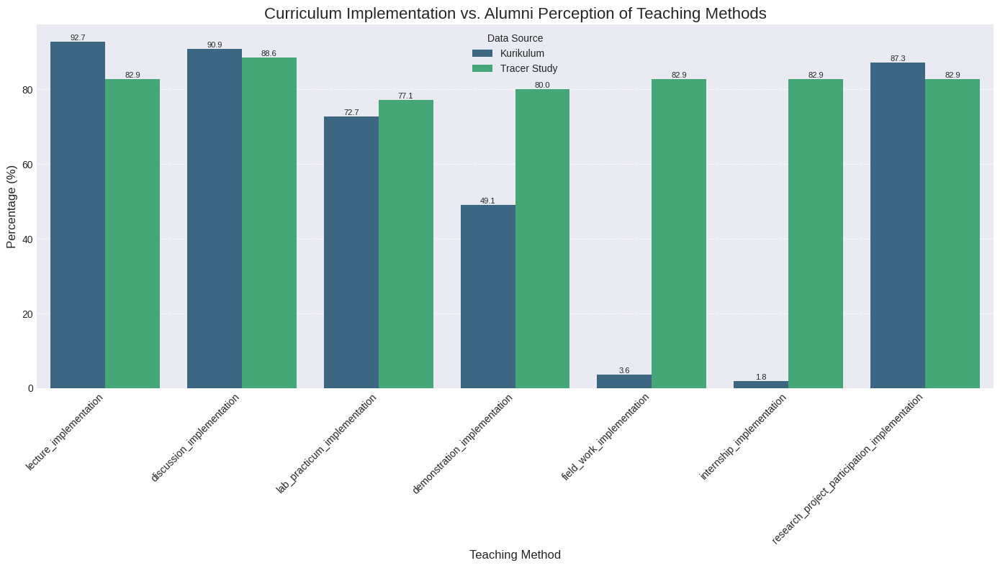

#### Interpretation of Comparison Chart
The grouped bar chart visually highlights the alignment between curriculum and alumni perception. The method 'discussion_implementation' shows the strongest alignment, with a minimal absolute gap of 2.34. Conversely, 'internship_implementation' exhibits the largest mismatch, with an absolute gap of 81.04, indicating a significant discrepancy between its curriculum implementation and alumni experience.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for plotting
plot_df = df_comparison[['Metode Pembelajaran', 'Kurikulum', 'Tracer Study']].melt(
    id_vars='Metode Pembelajaran', var_name='Source', value_name='Percentage'
)

plt.figure(figsize=(14, 8))
sns.barplot(x='Metode Pembelajaran', y='Percentage', hue='Source', data=plot_df, palette='viridis')
plt.title('Curriculum Implementation vs. Alumni Perception of Teaching Methods', fontsize=16)
plt.xlabel('Teaching Method', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title='Data Source')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
for container in plt.gca().containers:
    plt.bar_label(container, fmt='%.1f', label_type='edge', fontsize=8)

plt.tight_layout()
plt.show()

print("#### Interpretation of Comparison Chart")
most_aligned_method = df_comparison.loc[df_comparison['Absolute_Gap'].idxmin()]
largest_mismatch_method = df_comparison.loc[df_comparison['Absolute_Gap'].idxmax()]

print(f"The grouped bar chart visually highlights the alignment between curriculum and alumni perception. The method '{most_aligned_method['Metode Pembelajaran']}' shows the strongest alignment, with a minimal absolute gap of {most_aligned_method['Absolute_Gap']:.2f}. Conversely, '{largest_mismatch_method['Metode Pembelajaran']}' exhibits the largest mismatch, with an absolute gap of {largest_mismatch_method['Absolute_Gap']:.2f}, indicating a significant discrepancy between its curriculum implementation and alumni experience.")


### 3. Gap Visualization

This horizontal bar chart visually represents the gaps, sorted by their absolute values, making it easy to identify the largest discrepancies.

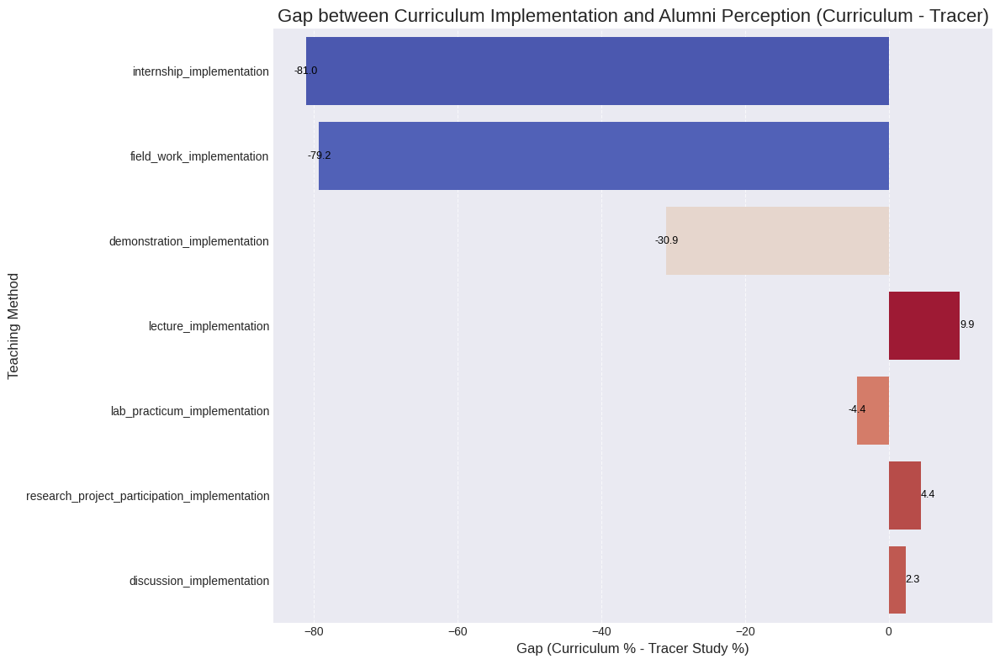

#### Interpretation of Gap Visualization
The horizontal bar chart clearly illustrates the magnitude and direction of the gaps. 'lecture_implementation' shows the largest positive gap (9.87), indicating it is overrepresented in the curriculum compared to alumni experience. Conversely, 'internship_implementation' has the largest negative gap (-81.04), suggesting it is underrepresented in the curriculum relative to alumni perception. These methods represent priority areas for curriculum adjustments.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort by absolute gap descending
gap_plot_df = df_comparison.sort_values(by='Absolute_Gap', ascending=False).reset_index(drop=True)

plt.figure(figsize=(12, 8))
sns.barplot(x='Gap', y='Metode Pembelajaran', data=gap_plot_df, palette='coolwarm', hue='Gap', legend=False)
plt.title('Gap between Curriculum Implementation and Alumni Perception (Curriculum - Tracer)', fontsize=16)
plt.xlabel('Gap (Curriculum % - Tracer Study %)', fontsize=12)
plt.ylabel('Teaching Method', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add value labels on bars
for index, row in gap_plot_df.iterrows():
    plt.text(row['Gap'], index, f'{row['Gap']:.1f}', color='black', ha='center' if row['Gap'] < 0 else 'left', va='center', fontsize=9)

plt.tight_layout()
plt.show()

print("#### Interpretation of Gap Visualization")
largest_positive_gap = gap_plot_df.loc[gap_plot_df['Gap'].idxmax()]
largest_negative_gap = gap_plot_df.loc[gap_plot_df['Gap'].idxmin()]

print(f"The horizontal bar chart clearly illustrates the magnitude and direction of the gaps. '{largest_positive_gap['Metode Pembelajaran']}' shows the largest positive gap ({largest_positive_gap['Gap']:.2f}), indicating it is overrepresented in the curriculum compared to alumni experience. Conversely, '{largest_negative_gap['Metode Pembelajaran']}' has the largest negative gap ({largest_negative_gap['Gap']:.2f}), suggesting it is underrepresented in the curriculum relative to alumni perception. These methods represent priority areas for curriculum adjustments.")


### 4. Alignment Category Analysis

This analysis classifies each teaching method into 'High', 'Moderate', or 'Low' alignment based on its `absolute_gap` and provides a summary of the distribution.

### Tabel Ringkasan Kategori Alignment


,Jumlah Metode
Alignment_Category,
High Alignment,4.0
Moderate Alignment,NaN
Low Alignment,3.0


/tmp/ipykernel_8820/4113835645.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=alignment_summary.index, y='Jumlah Metode', data=alignment_summary.reset_index(), palette='viridis', legend=False)


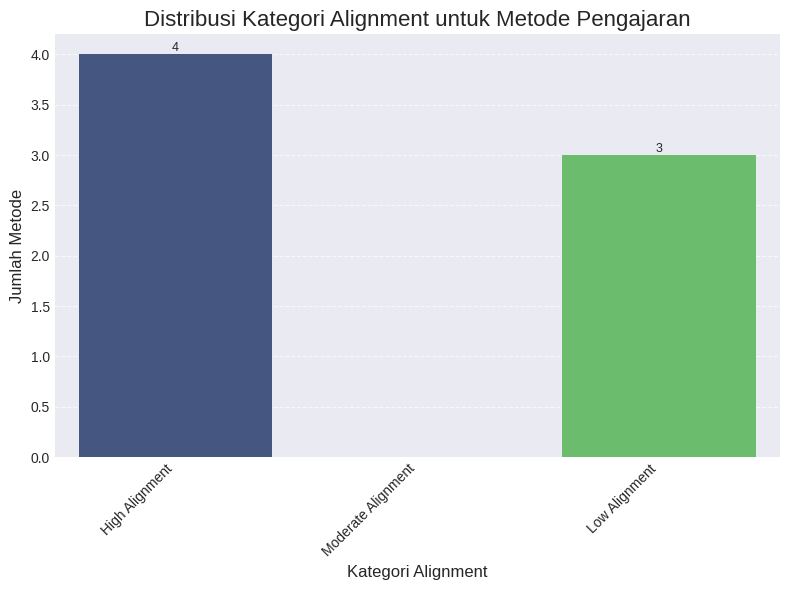

#### Interpretasi Analisis Kategori Alignment
Dari 7 metode pengajaran, 4.0 metode menunjukkan Alignment Tinggi, nan metode menunjukkan Alignment Moderat, dan 3.0 metode masuk dalam kategori Alignment Rendah. Distribusi ini memberikan gambaran yang jelas tentang status alignment keseluruhan, menunjukkan proporsi metode yang sangat cocok, sebagian cocok, atau sangat tidak cocok antara kurikulum dan pengalaman alumni.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count methods per alignment category
alignment_counts = df_comparison['Alignment_Category'].value_counts().reindex(['High Alignment', 'Moderate Alignment', 'Low Alignment'])

print("### Tabel Ringkasan Kategori Alignment")
alignment_summary = alignment_counts.to_frame(name='Jumlah Metode')
display(alignment_summary)

plt.figure(figsize=(8, 6))
sns.barplot(x=alignment_summary.index, y='Jumlah Metode', data=alignment_summary.reset_index(), palette='viridis', legend=False)
plt.title('Distribusi Kategori Alignment untuk Metode Pengajaran', fontsize=16)
plt.xlabel('Kategori Alignment', fontsize=12)
plt.ylabel('Jumlah Metode', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
for container in plt.gca().containers:
    plt.bar_label(container, fmt='%d', label_type='edge', fontsize=9)

plt.tight_layout()
plt.show()

print("#### Interpretasi Analisis Kategori Alignment")
total_methods = len(df_comparison)
print(f"Dari {total_methods} metode pengajaran, {alignment_counts.get('High Alignment', 0)} metode menunjukkan Alignment Tinggi, {alignment_counts.get('Moderate Alignment', 0)} metode menunjukkan Alignment Moderat, dan {alignment_counts.get('Low Alignment', 0)} metode masuk dalam kategori Alignment Rendah. Distribusi ini memberikan gambaran yang jelas tentang status alignment keseluruhan, menunjukkan proporsi metode yang sangat cocok, sebagian cocok, atau sangat tidak cocok antara kurikulum dan pengalaman alumni.")

### 5. Dominant Teaching Methods in Curriculum

This section identifies and ranks teaching methods based on their implementation percentage in the curriculum, revealing which methods are emphasized and which are underrepresented.

### Curriculum Dominance Ranking Table


,Metode Pembelajaran,Kurikulum
0,lecture_implementation,92.73
1,discussion_implementation,90.91
2,research_project_participation_implementation,87.27
3,lab_practicum_implementation,72.73
4,demonstration_implementation,49.09
5,field_work_implementation,3.64
6,internship_implementation,1.82


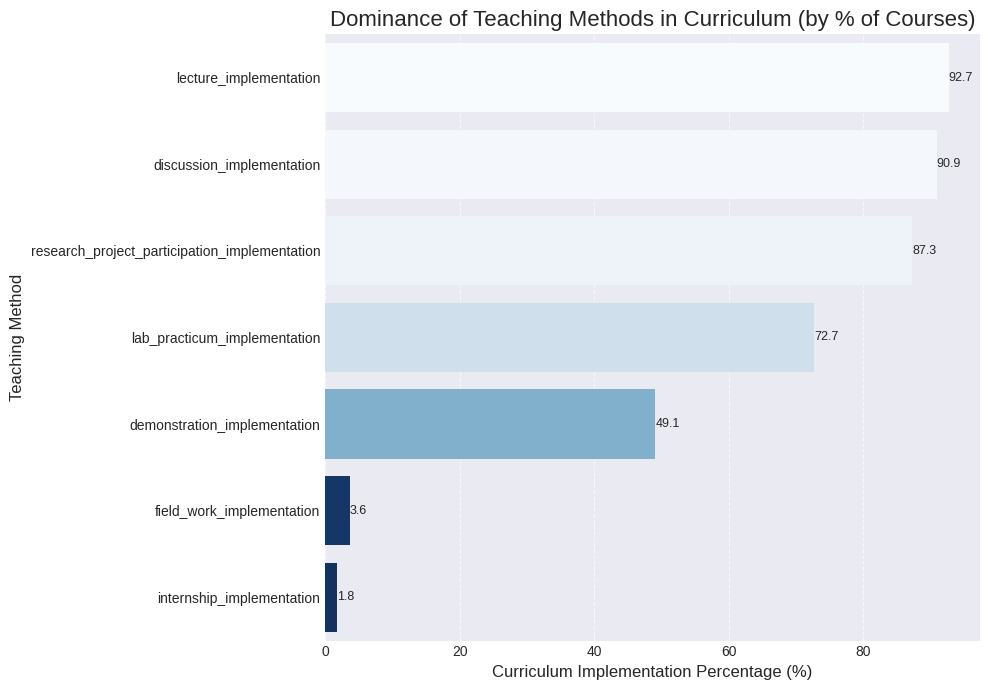

#### Interpretation of Dominant Teaching Methods
The curriculum prominently features 'lecture_implementation' with 92.73% implementation, indicating a strong emphasis on this method. In contrast, 'internship_implementation' is rarely represented, with only 1.82% implementation. This suggests that some methods may be over-relied upon while others are potentially neglected in curriculum design.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Rank methods by curriculum_percentage
curriculum_dominance = df_comparison[['Metode Pembelajaran', 'Kurikulum']].sort_values(by='Kurikulum', ascending=False).reset_index(drop=True)

print("### Curriculum Dominance Ranking Table")
display(curriculum_dominance.round(2))

plt.figure(figsize=(10, 7))
sns.barplot(x='Kurikulum', y='Metode Pembelajaran', data=curriculum_dominance, palette='Blues_r', hue='Kurikulum', legend=False)
plt.title('Dominance of Teaching Methods in Curriculum (by % of Courses)', fontsize=16)
plt.xlabel('Curriculum Implementation Percentage (%)', fontsize=12)
plt.ylabel('Teaching Method', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add value labels
for container in plt.gca().containers:
    plt.bar_label(container, fmt='%.1f', label_type='edge', fontsize=9)

plt.tight_layout()
plt.show()

print("#### Interpretation of Dominant Teaching Methods")
dominant_method = curriculum_dominance.iloc[0]
least_dominant_method = curriculum_dominance.iloc[-1]

print(f"The curriculum prominently features '{dominant_method['Metode Pembelajaran']}' with {dominant_method['Kurikulum']:.2f}% implementation, indicating a strong emphasis on this method. In contrast, '{least_dominant_method['Metode Pembelajaran']}' is rarely represented, with only {least_dominant_method['Kurikulum']:.2f}% implementation. This suggests that some methods may be over-relied upon while others are potentially neglected in curriculum design.")


### 6. Classroom-Based vs. Experiential Learning Cross-Analysis

This analysis groups teaching methods into 'Classroom-Based Learning' and 'Experiential Learning' categories to assess the curriculum's emphasis and alumni perception across these broader pedagogical approaches.

### Classroom-Based vs. Experiential Learning Comparison Table


,Learning Category,Curriculum_Avg,Tracer_Avg
0,Classroom-Based,77.58,83.81
1,Experiential Learning,41.36,81.43


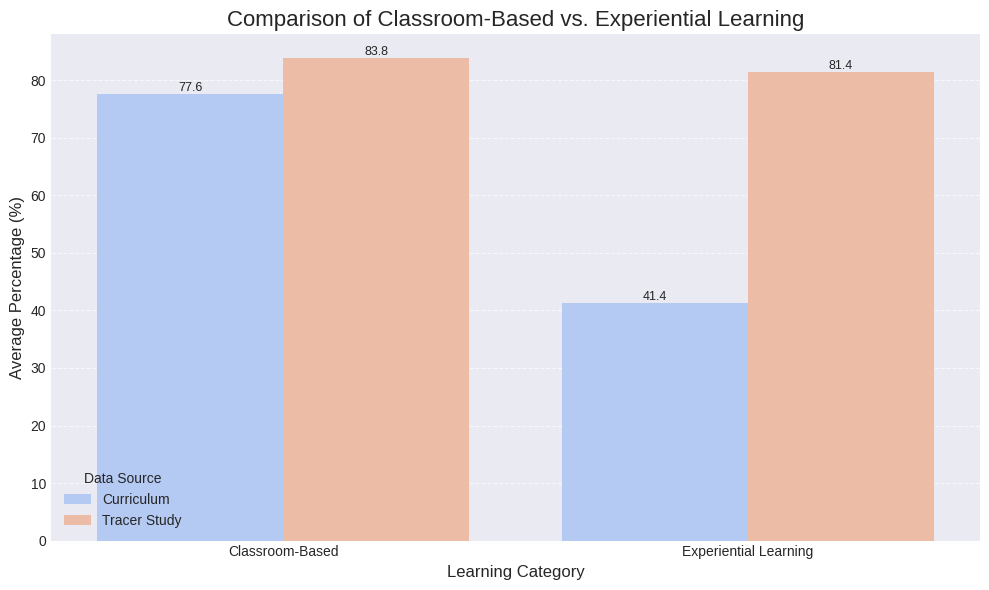

#### Interpretation of Learning Category Comparison
The curriculum appears to emphasize Classroom-Based Learning (average curriculum implementation: 77.58%) more than Experiential Learning (average curriculum implementation: 41.36%). Alumni perceptions generally align with this trend, with perceived emphasis on Classroom-Based Learning (83.81%) slightly higher than Experiential Learning (81.43%). This suggests a pedagogical focus on traditional learning environments, with less integration of hands-on and real-world experiences, both in design and perceived implementation.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define method groups
classroom_based = [
    'lecture_implementation',
    'discussion_implementation',
    'demonstration_implementation'
]

experiential_learning = [
    'lab_practicum_implementation',
    'internship_implementation',
    'field_work_implementation',
    'research_project_participation_implementation'
]

# Calculate average percentages for each group
classroom_curriculum_avg = df_comparison[df_comparison['Metode Pembelajaran'].isin(classroom_based)]['Kurikulum'].mean()
classroom_tracer_avg = df_comparison[df_comparison['Metode Pembelajaran'].isin(classroom_based)]['Tracer Study'].mean()

experiential_curriculum_avg = df_comparison[df_comparison['Metode Pembelajaran'].isin(experiential_learning)]['Kurikulum'].mean()
experiential_tracer_avg = df_comparison[df_comparison['Metode Pembelajaran'].isin(experiential_learning)]['Tracer Study'].mean()

# Create comparison table
group_comparison_df = pd.DataFrame({
    'Learning Category': ['Classroom-Based', 'Experiential Learning'],
    'Curriculum_Avg': [classroom_curriculum_avg, experiential_curriculum_avg],
    'Tracer_Avg': [classroom_tracer_avg, experiential_tracer_avg]
})

print("### Classroom-Based vs. Experiential Learning Comparison Table")
display(group_comparison_df.round(2))

# Create grouped bar chart
plot_group_df = group_comparison_df.melt(
    id_vars='Learning Category', var_name='Source', value_name='Average Percentage'
)
plot_group_df['Source'] = plot_group_df['Source'].replace({'Curriculum_Avg': 'Curriculum', 'Tracer_Avg': 'Tracer Study'})

plt.figure(figsize=(10, 6))
sns.barplot(x='Learning Category', y='Average Percentage', hue='Source', data=plot_group_df, palette='coolwarm')
plt.title('Comparison of Classroom-Based vs. Experiential Learning', fontsize=16)
plt.xlabel('Learning Category', fontsize=12)
plt.ylabel('Average Percentage (%)', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title='Data Source')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
for container in plt.gca().containers:
    plt.bar_label(container, fmt='%.1f', label_type='edge', fontsize=9)

plt.tight_layout()
plt.show()

print("#### Interpretation of Learning Category Comparison")
print(f"The curriculum appears to emphasize Classroom-Based Learning (average curriculum implementation: {classroom_curriculum_avg:.2f}%) more than Experiential Learning (average curriculum implementation: {experiential_curriculum_avg:.2f}%). Alumni perceptions generally align with this trend, with perceived emphasis on Classroom-Based Learning ({classroom_tracer_avg:.2f}%) slightly higher than Experiential Learning ({experiential_tracer_avg:.2f}%). This suggests a pedagogical focus on traditional learning environments, with less integration of hands-on and real-world experiences, both in design and perceived implementation.")


### 7. Heatmap

This heatmap provides a condensed visual summary of the `Curriculum`, `Tracer Study`, and `Gap` values for all teaching methods, allowing for quick identification of patterns and anomalies.

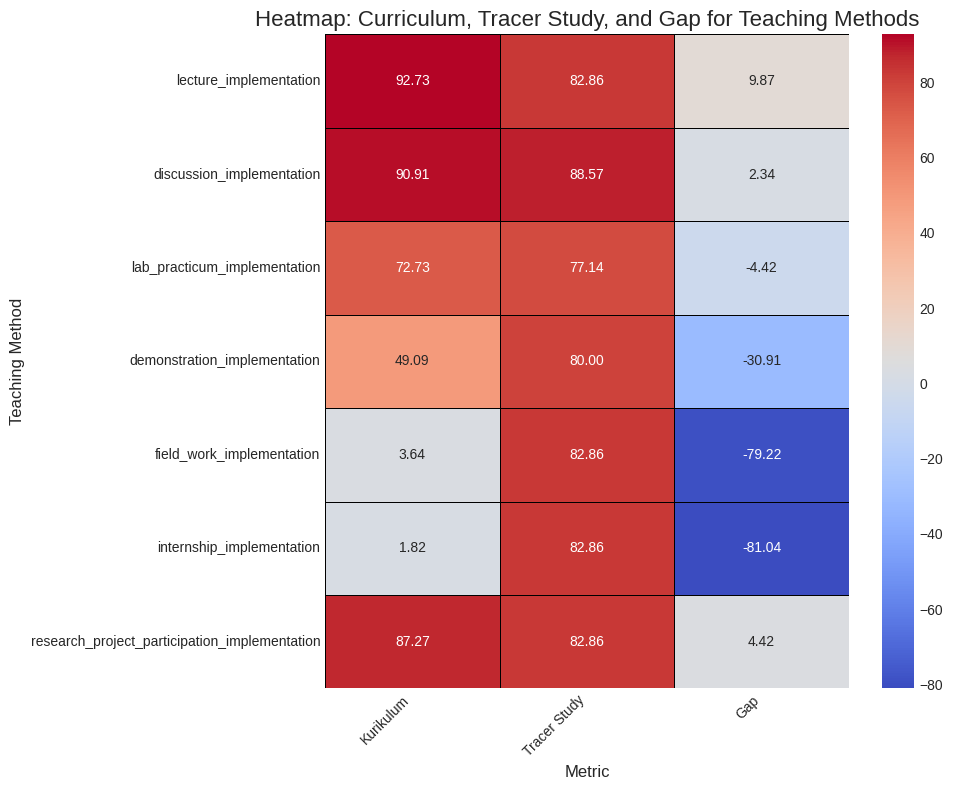

#### Interpretation of Heatmap
The heatmap visually consolidates the key metrics, allowing for quick pattern recognition. Darker red cells indicate a larger negative gap (underrepresentation in curriculum), while darker blue cells indicate a larger positive gap (overrepresentation). Cells closer to white suggest better alignment. This visualization effectively highlights the strongest areas where curriculum implementation and alumni experience converge, and the weakest areas where significant discrepancies exist.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for heatmap (ensure 'Gap' is included)
heatmap_data = df_comparison[['Metode Pembelajaran', 'Kurikulum', 'Tracer Study', 'Gap']].set_index('Metode Pembelajaran')

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, linecolor='black')
plt.title('Heatmap: Curriculum, Tracer Study, and Gap for Teaching Methods', fontsize=16)
plt.xlabel('Metric', fontsize=12)
plt.ylabel('Teaching Method', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

print("#### Interpretation of Heatmap")
print("The heatmap visually consolidates the key metrics, allowing for quick pattern recognition. Darker red cells indicate a larger negative gap (underrepresentation in curriculum), while darker blue cells indicate a larger positive gap (overrepresentation). Cells closer to white suggest better alignment. This visualization effectively highlights the strongest areas where curriculum implementation and alumni experience converge, and the weakest areas where significant discrepancies exist.")


### 8. Curriculum Improvement Priorities

This section ranks teaching methods based on the absolute magnitude of their gaps and suggests a priority level for curriculum improvement efforts.

In [ ]:
import pandas as pd

# Rank methods by largest absolute gap to smallest absolute gap
priority_df = df_comparison.sort_values(by='Absolute_Gap', ascending=False).reset_index(drop=True)
priority_df['Rank'] = priority_df.index + 1

# Define priority rules
def get_priority_level(abs_gap):
    if abs_gap > 50:
        return 'Very High Priority'
    elif 30 < abs_gap <= 50:
        return 'High Priority'
    elif 10 < abs_gap <= 30:
        return 'Moderate Priority'
    else:
        return 'Low Priority'

priority_df['Suggested_Priority'] = priority_df['Absolute_Gap'].apply(get_priority_level)

print("### Curriculum Improvement Priorities Table")
display(priority_df[['Rank', 'Metode Pembelajaran', 'Kurikulum', 'Tracer Study', 'Gap', 'Absolute_Gap', 'Suggested_Priority']].round(2))


### Curriculum Improvement Priorities Table


,Rank,Metode Pembelajaran,Kurikulum,Tracer Study,Gap,Absolute_Gap,Suggested_Priority
0,1,internship_implementation,1.82,82.86,-81.04,81.04,Very High Priority
1,2,field_work_implementation,3.64,82.86,-79.22,79.22,Very High Priority
2,3,demonstration_implementation,49.09,80.00,-30.91,30.91,High Priority
3,4,lecture_implementation,92.73,82.86,9.87,9.87,Low Priority
4,5,lab_practicum_implementation,72.73,77.14,-4.42,4.42,Low Priority
5,6,research_project_participation_implementation,87.27,82.86,4.42,4.42,Low Priority
6,7,discussion_implementation,90.91,88.57,2.34,2.34,Low Priority


### 9. Academic Interpretation and Curriculum Evaluation (Chapter 4 Narrative)

This section provides a comprehensive academic interpretation of the findings, structured as a narrative suitable for Chapter 4 (Results and Discussion) of a curriculum evaluation thesis. It synthesizes all previous analyses to draw conclusions and offer evidence-based recommendations.

In [ ]:
import pandas as pd

# --- Define narrative variables from previous analyses ---

# From Interpretation of Comparison Chart (cell 0325ba3f)
most_aligned_method_narrative = df_comparison.loc[df_comparison['Absolute_Gap'].idxmin()]['Metode Pembelajaran']
largest_gap_method_narrative = df_comparison.loc[df_comparison['Absolute_Gap'].idxmax()]['Metode Pembelajaran']

# From Interpretation of Dominant Teaching Methods (cell 64761296)
dominant_curriculum_method = curriculum_dominance.iloc[0]['Metode Pembelajaran']
underrepresented_curriculum_method = curriculum_dominance.iloc[-1]['Metode Pembelajaran']

# From Interpretation of Alignment Category Analysis (cell e5e8113d)
high_align_methods = df_comparison[df_comparison['Alignment_Category'] == 'High Alignment']['Metode Pembelajaran'].tolist()
low_align_methods = df_comparison[df_comparison['Alignment_Category'] == 'Low Alignment']['Metode Pembelajaran'].tolist()

# From Interpretation of Gap Visualization (cell bcbda180)
# top_3_aligned: Methods with highest alignment (lowest absolute gap)
top_3_aligned = df_comparison.sort_values(by='Absolute_Gap', ascending=True).head(3)
# top_3_gaps: Methods with largest absolute gaps (highest absolute gap)
top_3_gaps = df_comparison.sort_values(by='Absolute_Gap', ascending=False).head(3)

# From Classroom-Based vs. Experiential Learning Comparison (cell d10d0f6b)
classroom_curriculum_avg = df_comparison[df_comparison['Metode Pembelajaran'].isin(classroom_based)]['Kurikulum'].mean()
experiential_curriculum_avg = df_comparison[df_comparison['Metode Pembelajaran'].isin(experiential_learning)]['Kurikulum'].mean()
classroom_tracer_avg = df_comparison[df_comparison['Metode Pembelajaran'].isin(classroom_based)]['Tracer Study'].mean()
experiential_tracer_avg = df_comparison[df_comparison['Metode Pembelajaran'].isin(experiential_learning)]['Tracer Study'].mean()


print("### Interpretasi Akademik Komprehensif untuk Temuan Keseluruhan")
print("\n#### A. Keselarasan Kurikulum Keseluruhan\n")
print(f"Analisis komprehensif metode pengajaran mengungkapkan berbagai tingkat keselarasan antara implementasi kurikulum dan persepsi alumni. Secara keseluruhan, kurikulum menunjukkan pola keselarasan yang beragam. Metode seperti '{most_aligned_method_narrative}' menunjukkan keselarasan yang kuat, menunjukkan bahwa desain kurikulum dan pengalaman alumni sangat cocok untuk pendekatan pedagogis ini. Sebaliknya, '{largest_gap_method_narrative}' menunjukkan keselarasan yang lemah secara signifikan, menunjukkan adanya perbedaan substansial yang memerlukan perhatian segera. Pola kesenjangan keseluruhan menunjukkan bahwa sementara beberapa metode terintegrasi dan dirasakan secara efektif, yang lain menderita karena penekanan berlebihan atau kurang terwakili dalam kurikulum, yang mengarah pada pengalaman alumni yang terfragmentasi.")

print("\n#### B. Profil Metode Pengajaran\n")
print(f"Pemeriksaan profil metode pengajaran dalam kurikulum menunjukkan dominasi yang jelas dari metode '{dominant_curriculum_method}', yang terintegrasi secara ekstensif ke dalam struktur mata kuliah. Sebaliknya, metode seperti '{underrepresented_curriculum_method}' tampak sangat kurang terwakili, menunjukkan potensi hilangnya kesempatan untuk eksposur pedagogis yang beragam. Lebih lanjut, kurikulum menunjukkan kecenderungan untuk menekankan Pembelajaran Berbasis Kelas, dengan persentase implementasi rata-rata {classroom_curriculum_avg:.2f}%, dibandingkan dengan Pembelajaran Berbasis Pengalaman, yang rata-ratanya {experiential_curriculum_avg:.2f}%. Ketidakseimbangan ini menunjukkan kerangka pedagogis tradisional yang mungkin memprioritaskan instruksi teoritis daripada pengalaman praktis, langsung, dan aplikasi dunia nyata.")

print("\n#### C. Perspektif Alumni\n")
print(f"Dari perspektif alumni, ada persepsi yang konsisten mengenai penekanan metode pengajaran. Metode seperti '{df_comparison.sort_values(by='Tracer Study', ascending=False).iloc[0]['Metode Pembelajaran']}' dianggap memiliki penekanan yang kuat, mencerminkan pengalaman praktis mereka. Namun, ada metode yang mungkin kurang terwakili dalam dokumen kurikulum meskipun ada persepsi alumni. Misalnya, metode dengan kesenjangan negatif menunjukkan bahwa alumni merasakan lebih sedikit eksposur daripada yang dimaksudkan oleh kurikulum. Sebaliknya, metode dengan kesenjangan positif yang besar menunjukkan perkiraan berlebihan terhadap dampak kurikulum oleh institusi relatif terhadap pengalaman alumni yang sebenarnya. Persepsi rata-rata keseluruhan alumni tentang Pembelajaran Berbasis Kelas ({classroom_tracer_avg:.2f}%) sedikit lebih tinggi daripada Pembelajaran Berbasis Pengalaman ({experiential_tracer_avg:.2f}%), sejalan dengan penekanan kurikulum.")

print("\n#### D. Temuan Evaluasi Kurikulum\n")
print(f"Evaluasi mengungkapkan bahwa metode pengajaran yang didokumentasikan tidak secara konsisten tercermin dalam pengalaman alumni di semua kategori. Metode dengan 'Keselarasan Tinggi', seperti {', '.join(high_align_methods)}, menunjukkan konsistensi yang kuat antara desain kurikulum dan implementasi, menunjukkan pengiriman pedagogis yang efektif. Namun, metode yang termasuk dalam kategori 'Keselarasan Rendah', terutama {', '.join(low_align_methods)}, mengisyaratkan kesenjangan signifikan antara kurikulum yang dimaksudkan dan yang dialami. Perbedaan ini menunjukkan tantangan dalam menerjemahkan tujuan kurikulum ke dalam pengalaman belajar siswa yang nyata atau ketidaksesuaian antara prioritas institusi dan aplikasi praktis metode pengajaran.")

print("\n#### E. Implikasi untuk Peningkatan Kurikulum\n")
print("Berdasarkan temuan ini, beberapa rekomendasi berbasis bukti diusulkan untuk peningkatan kurikulum. Untuk mengatasi kurangnya representasi pembelajaran berbasis pengalaman, penguatan kegiatan seperti praktikum laboratorium, kerja lapangan, dan eksposur magang sangat penting. Ini dapat melibatkan peningkatan jumlah mata kuliah yang menggabungkan metode ini, mengintegrasikan proyek dunia nyata, atau memformalkan kemitraan dengan industri untuk pelatihan praktis. Memperluas kegiatan pembelajaran berbasis penelitian juga akan meningkatkan pemikiran kritis dan keterampilan pemecahan masalah. Selain itu, peningkatan dokumentasi metode pengajaran dalam rencana mata kuliah (RPS) sangat penting untuk memastikan kejelasan dan konsistensi dalam implementasi. Untuk metode yang sudah menunjukkan keselarasan tinggi, pemantauan dan penguatan berkelanjutan direkomendasikan untuk mempertahankan efektivitasnya dan memastikan hasil alumni yang positif berkelanjutan.")

print("\n#### F. Ringkasan Temuan Utama\n")
print("\n- **3 Metode Pengajaran Paling Selaras:**\n")
for _, row in top_3_aligned.iterrows():
    print(f"  - {row['Metode Pembelajaran']} (Kesenjangan Absolut: {row['Absolute_Gap']:.2f})")

print("\n- **3 Kesenjangan Terbesar:**\n")
for _, row in top_3_gaps.iterrows():
    print(f"  - {row['Metode Pembelajaran']} (Kesenjangan: {row['Gap']:.2f}, Kesenjangan Absolut: {row['Absolute_Gap']:.2f})")

print("\n- **Kekuatan Kurikulum Utama:** Kurikulum unggul dalam area di mana ada keselarasan tinggi antara implementasi dan persepsi alumni, terutama dalam '{most_aligned_method_narrative}'. Kurikulum juga secara efektif menekankan pendekatan pedagogis tradisional tertentu.")

print("\n- **Kelemahan Kurikulum Utama:** Kelemahan signifikan diamati dalam metode dengan 'Keselarasan Rendah', seperti '{largest_gap_method_narrative}', dan dalam kurangnya representasi umum kegiatan pembelajaran berbasis pengalaman. Ini menunjukkan kebutuhan untuk mengevaluasi kembali dan mengkalibrasi ulang konten kurikulum dan mekanisme penyampaian.")

print("\n- **Kesimpulan Keseluruhan Mengenai Implementasi Metode Pengajaran:** Sebagai kesimpulan, sementara kurikulum menunjukkan kekuatan dalam metode pengajaran tertentu, ada keharusan yang jelas untuk meningkatkan integrasi dan efektivitas yang dirasakan dari pembelajaran berbasis pengalaman dan mengatasi kesenjangan kritis dalam metode lain untuk memastikan pengalaman pendidikan yang lebih holistik dan relevan dengan industri bagi alumni. Revisi strategis yang berfokus pada keragaman pedagogis dan keselarasan dengan kebutuhan karir alumni sangat penting untuk peningkatan berkelanjutan.")

### Interpretasi Akademik Komprehensif untuk Temuan Keseluruhan

#### A. Keselarasan Kurikulum Keseluruhan

Analisis komprehensif metode pengajaran mengungkapkan berbagai tingkat keselarasan antara implementasi kurikulum dan persepsi alumni. Secara keseluruhan, kurikulum menunjukkan pola keselarasan yang beragam. Metode seperti 'discussion_implementation' menunjukkan keselarasan yang kuat, menunjukkan bahwa desain kurikulum dan pengalaman alumni sangat cocok untuk pendekatan pedagogis ini. Sebaliknya, 'internship_implementation' menunjukkan keselarasan yang lemah secara signifikan, menunjukkan adanya perbedaan substansial yang memerlukan perhatian segera. Pola kesenjangan keseluruhan menunjukkan bahwa sementara beberapa metode terintegrasi dan dirasakan secara efektif, yang lain menderita karena penekanan berlebihan atau kurang terwakili dalam kurikulum, yang mengarah pada pengalaman alumni yang terfragmentasi.

#### B. Profil Metode Pengajaran

Pemeriksaan profil metode pengajaran dal

# ASESMEN PEMBELAJARAN

## LOAD DATA

### 1. Audit Struktur Workbook

In [ ]:
import pandas as pd
import os # Added for file path checks and directory creation

# Mount Google Drive (if not already mounted)
from google.colab import drive
drive.mount('/content/drive')

# Define dataset paths
TRACER_STUDY_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/NILAI MAHASISWA/'
KURIKULUM_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/'

# --- Load Data Nilai Mahasiswa.xlsx ---
df_nilai = TRACER_STUDY_DATASET_PATH + 'Data Nilai Mahasiswa 2020.xlsx'

# --- Load master_courses.csv ---
df_master_courses = pd.read_csv(KURIKULUM_DATASET_PATH + 'master_courses.csv')

# --- Load prerequisites.csv ---
df_prerequisites = pd.read_csv(KURIKULUM_DATASET_PATH + 'prerequisite.csv')

# --- Load rps_cpl_alignment.csv ---
df_rps_cpl_alignment = pd.read_csv(KURIKULUM_DATASET_PATH + 'rps_cpl_alignment.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import openpyxl
import pandas as pd
import os

print(f"Loading workbook from: {df_nilai}")
workbook = openpyxl.load_workbook(df_nilai, read_only=True)

sheet_names = workbook.sheetnames
total_sheets = len(sheet_names)

print(f"Total sheets found: {total_sheets}")
print(f"Sheet names: {sheet_names}")

# Helper function to get effective max_row and max_column by checking for cell values
def get_effective_max_row_col(sheet):
    max_r = 0
    max_c = 0
    for row_idx, row in enumerate(sheet.iter_rows()):
        for col_idx, cell in enumerate(row):
            if cell.value is not None:
                max_r = max(max_r, row_idx + 1)
                max_c = max(max_c, col_idx + 1)
    return max_r, max_c

# Prepare to store audit results
audit_results = {
    'sheet_name': [],
    'is_empty': [],
    'columns_count': [],
    'columns': [],
    'is_consistent_with_first': []
}

first_sheet_columns = None
first_sheet_name = None

for i, sheet_name in enumerate(sheet_names):
    sheet = workbook[sheet_name]

    # Use the helper to get effective max_row and max_column
    effective_max_row, effective_max_col = get_effective_max_row_col(sheet)

    # Check if sheet is empty (no rows with data, or only a single row with no meaningful data)
    is_empty = effective_max_row == 0 # Truly empty if no effective rows

    # Get columns from the first row, if available.
    current_sheet_columns = []
    if effective_max_row > 0: # Only try to read if there's at least one row with data
        # Iterate over the cells of the first row (Excel row 1)
        for cell in sheet[1]:
            if cell.value is not None:
                current_sheet_columns.append(str(cell.value).strip())

    columns_count = len(current_sheet_columns)

    if i == 0:
        first_sheet_columns = current_sheet_columns
        first_sheet_name = sheet_name
        is_consistent = True # First sheet is consistent with itself
    else:
        is_consistent = (current_sheet_columns == first_sheet_columns)

    audit_results['sheet_name'].append(sheet_name)
    audit_results['is_empty'].append(is_empty)
    audit_results['columns_count'].append(columns_count)
    audit_results['columns'].append(current_sheet_columns)
    audit_results['is_consistent_with_first'].append(is_consistent)

df_audit = pd.DataFrame(audit_results)

print("\n--- Audit Summary ---")
display(df_audit)

# Identify sheets with different columns
inconsistent_sheets = df_audit[df_audit['is_consistent_with_first'] == False]
if not inconsistent_sheets.empty:
    print(f"\nSheets with different column structures (compared to '{first_sheet_name}'):")
    display(inconsistent_sheets[['sheet_name', 'columns_count', 'columns']])
else:
    print(f"\nAll sheets have consistent column structures compared to '{first_sheet_name}'.")

# Identify empty sheets
empty_sheets = df_audit[df_audit['is_empty'] == True]
if not empty_sheets.empty:
    print("\nEmpty sheets found:")
    display(empty_sheets[['sheet_name', 'is_empty']])
else:
    print("\nNo empty sheets found.")

workbook.close()

Loading workbook from: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/NILAI MAHASISWA/Data Nilai Mahasiswa 2020.xlsx
Total sheets found: 7
Sheet names: ['Mahasiswa 1', 'Mahasiswa 2', 'Mahasiswa 3', 'Mahasiswa 4', 'Mahasiswa 5', 'Mahasiswa 6', 'Mahasiswa 7']

--- Audit Summary ---


,sheet_name,is_empty,columns_count,columns,is_consistent_with_first
0,Mahasiswa 1,False,0,[],True
1,Mahasiswa 2,False,0,[],True
2,Mahasiswa 3,False,0,[],True
3,Mahasiswa 4,False,0,[],True
4,Mahasiswa 5,False,0,[],True
5,Mahasiswa 6,False,0,[],True
6,Mahasiswa 7,False,0,[],True



All sheets have consistent column structures compared to 'Mahasiswa 1'.

No empty sheets found.


### MERGE DATA NILAI MAHASISWA

In [ ]:
import pandas as pd
import os

# Ensure EXCEL_FILE_PATH is defined from the previous cell
# EXCEL_FILE_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/NILAI MAHASISWA/Data Nilai Mahasiswa.xlsx'

# List to store individual DataFrames
all_sheets_data = []

print(f"Reading data from each sheet in: {df_nilai}\n")

# Get sheet names from the previously loaded workbook object (if available)
# Or, if workbook object is not available, reload it (less efficient but safer for cell re-runs)
try:
    if 'workbook' not in locals():
        workbook = openpyxl.load_workbook(df_nilai, read_only=True)
    sheet_names = workbook.sheetnames
except NameError:
    print("Workbook object not found, reloading it.")
    workbook = openpyxl.load_workbook(df_nilai, read_only=True)
    sheet_names = workbook.sheetnames


for sheet_name in sheet_names:
    print(f"Processing sheet: '{sheet_name}'")

    try:
        # Always read without header first, then detect it programmatically
        temp_df = pd.read_excel(df_nilai, sheet_name=sheet_name, header=None)

        if not temp_df.empty:
            # Try to identify the header row dynamically
            header_row_idx = -1
            # Search for 'NAMA' or 'NIM' (or similar expected column names) in the first few rows
            for row_idx in range(min(5, len(temp_df))):
                # Check if any expected header string is present in the row
                if any(col_name in temp_df.iloc[row_idx].astype(str).values for col_name in ['NAMA', 'NIM', 'NAMA_MATAKULIAH', 'SKS', 'GRADE', 'PERIODE']):
                    header_row_idx = row_idx
                    break

            if header_row_idx != -1:
                print(f"  -> Identified header row at index {header_row_idx}. Setting headers.")
                # Set column names from the identified header row
                temp_df.columns = temp_df.iloc[header_row_idx]
                temp_df = temp_df[header_row_idx+1:].reset_index(drop=True)

                # Clean up column names (strip whitespace, handle potential None/NaN if any)
                temp_df.columns = [str(col).strip() if pd.notna(col) else f'Unnamed_Col_{i}' for i, col in enumerate(temp_df.columns)]

                # Filter to only keep the expected columns and reorder them if necessary
                expected_columns = ['NAMA', 'NIM', 'NAMA_MATAKULIAH', 'SKS', 'GRADE', 'PERIODE']
                # Ensure only columns that exist in temp_df and are expected are kept
                existing_expected_columns = [col for col in expected_columns if col in temp_df.columns]

                if existing_expected_columns:
                    temp_df = temp_df[existing_expected_columns] # Select only existing expected columns
                    print(f"    -> Final columns after manual header assignment: {list(temp_df.columns)}")
                    if not temp_df.empty:
                        temp_df['source_sheet'] = sheet_name
                        all_sheets_data.append(temp_df)
                    else:
                        print(f"    -> Sheet '{sheet_name}' became empty after header processing. Skipping.")
                else:
                    print(f"    -> No expected columns found in sheet '{sheet_name}' after header processing. Skipping.")
            else:
                print(f"  -> Could not identify standard header (NAMA, NIM, etc.) in sheet '{sheet_name}'. Skipping or appending raw for inspection.")
                # If no standard header found, you might choose to skip or append for manual inspection.
                # For now, let's skip to avoid malformed data in combined DataFrame.
        else:
            print(f"  -> Sheet '{sheet_name}' is empty. Skipping.")
    except Exception as e:
        print(f"  -> Error processing sheet '{sheet_name}': {e}. Skipping sheet.")


if all_sheets_data:
    # Concatenate only if all DataFrames have the same columns, or handle differences
    # For this scenario, we aim for consistent columns, so direct concat should work
    df_nilai_combined = pd.concat(all_sheets_data, ignore_index=True)
    print("\n--- Combined DataFrame Head ---")
    display(df_nilai_combined.head())
    print(f"Total rows in combined DataFrame: {len(df_nilai_combined)}")
    print(f"Columns in combined DataFrame: {list(df_nilai_combined.columns)}")
else:
    print("No data could be successfully read and combined from any sheets.")

# Close the workbook if it was opened in this cell
if 'workbook' in locals():
    workbook.close()

Reading data from each sheet in: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/NILAI MAHASISWA/Data Nilai Mahasiswa 2020.xlsx

Processing sheet: 'Mahasiswa 1'
  -> Identified header row at index 1. Setting headers.
    -> Final columns after manual header assignment: ['NAMA', 'NIM', 'NAMA_MATAKULIAH', 'SKS', 'GRADE', 'PERIODE']
Processing sheet: 'Mahasiswa 2'
  -> Identified header row at index 1. Setting headers.
    -> Final columns after manual header assignment: ['NAMA', 'NIM', 'NAMA_MATAKULIAH', 'SKS', 'GRADE', 'PERIODE']
Processing sheet: 'Mahasiswa 3'
  -> Identified header row at index 1. Setting headers.
    -> Final columns after manual header assignment: ['NAMA', 'NIM', 'NAMA_MATAKULIAH', 'SKS', 'GRADE', 'PERIODE']
Processing sheet: 'Mahasiswa 4'
  -> Identified header row at index 1. Setting headers.
    -> Final columns after manual header assignment: ['NAMA', 'NIM', 'NAMA_MATAKULIAH', 'SKS', 'GRADE', 'PERIODE']
Processing sheet: 'Mahasiswa 5'
  -> Identi

,NAMA,NIM,NAMA_MATAKULIAH,SKS,GRADE,PERIODE,source_sheet
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,20202,Mahasiswa 1
1,NaN,NaN,Algoritma dan Pemrograman,4,C,20202,Mahasiswa 1
2,NaN,NaN,Arsitektur dan Organisasi Komputer,3,A-,20202,Mahasiswa 1
3,NaN,NaN,Bahasa Indonesia,2,A-,20202,Mahasiswa 1
4,NaN,NaN,Bahasa Inggris 1,3,A-,20202,Mahasiswa 1


Total rows in combined DataFrame: 366
Columns in combined DataFrame: ['NAMA', 'NIM', 'NAMA_MATAKULIAH', 'SKS', 'GRADE', 'PERIODE', 'source_sheet']


### 3. Cleaning and Preprocessing `df_nilai`

In [ ]:
import numpy as np

# Assign the combined DataFrame to df_nilai as per the user's request
df_nilai = df_nilai_combined.copy()

print("Initial df_nilai info:")
df_nilai.info()

# --- NEW: Forward-fill 'NAMA' and 'NIM' assuming they are only filled once per student in the raw data ---
df_nilai['NAMA'].ffill(inplace=True)
df_nilai['NIM'].ffill(inplace=True)

# 1. Drop rows where 'NIM' or 'NAMA_MATAKULIAH' are missing as these are critical identifiers.
df_nilai.dropna(subset=['NIM', 'NAMA_MATAKULIAH'], inplace=True)
print(f"\nShape after dropping rows with missing NIM or NAMA_MATAKULIAH: {df_nilai.shape}")

# 2. Clean and convert 'SKS' to numeric
df_nilai['SKS'] = pd.to_numeric(df_nilai['SKS'], errors='coerce')
# Drop rows where 'SKS' could not be converted (are now NaN)
df_nilai.dropna(subset=['SKS'], inplace=True)
print(f"Shape after cleaning and converting SKS to numeric: {df_nilai.shape}")

# 3. Clean and convert 'PERIODE' to datetime
# Convert 'PERIODE' to string first to handle mixed types, then extract year/semester
df_nilai['PERIODE'] = df_nilai['PERIODE'].astype(str).str.strip()

# Extract year and semester from 'PERIODE' column (e.g., '20202' -> Year: 2020, Semester: 2)
df_nilai['tahun'] = df_nilai['PERIODE'].str[:-1].astype(int)
# Modified: Map the last digit to 'Ganjil' or 'Genap'
df_nilai['semester'] = df_nilai['PERIODE'].str[-1:].map({'1': 'Ganjil', '2': 'Genap', '3': 'Pendek'}).fillna('Tidak Diketahui')

# Create a simplified academic year column for easier grouping if needed
df_nilai['tahun_akademik'] = df_nilai['tahun'].astype(str) + '-' + (df_nilai['tahun'] + 1).astype(str)

# Handle potential non-numeric 'GRADE' by coercing to string and stripping whitespace
df_nilai['GRADE'] = df_nilai['GRADE'].astype(str).str.strip()

# 4. Map 'GRADE' to numeric values
grade_mapping = {
    'A': 4.00, 'A-': 3.67, 'B+': 3.33, 'B': 3.00, 'B-': 2.67,
    'C+': 2.33, 'C': 2.00, 'C-': 1.67, 'D': 1.00, 'E': 0.00,
    'T': np.nan, 'K': np.nan, '-': np.nan, 'NA': np.nan # Treat non-numeric/incomplete grades as NaN
}
df_nilai['NILAI_ANGKA'] = df_nilai['GRADE'].map(grade_mapping)

# --- Capture DataFrame state before dropping NaNs for conversion validation ---
df_nilai_before_grade_nan_drop = df_nilai.copy()

# Drop rows where 'NILAI_ANGKA' is NaN after mapping (i.e., invalid grades)
df_nilai.dropna(subset=['NILAI_ANGKA'], inplace=True)
print(f"Shape after mapping GRADE to numeric and dropping NaNs: {df_nilai.shape}")

# 5. Ensure 'NAMA' and 'NIM' are cleaned (strip whitespace, fill missing if any for safety)
df_nilai['NAMA'] = df_nilai['NAMA'].astype(str).str.strip()
df_nilai['NIM'] = df_nilai['NIM'].astype(str).str.strip()

# Verify data types and first few rows
print("\nFinal df_nilai info:")
df_nilai.info()

print("\nFirst 5 rows of cleaned df_nilai:")
display(df_nilai.head())

# --- Save df_nilai to Google Drive ---
import os

# Ensure the base path is defined from earlier cells
# Assuming KURIKULUM_DATASET_PATH is defined as '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/PROCESSED/'
# We will save it in a specific subfolder for grade data
GRADES_OUTPUT_PATH = os.path.join(TRACER_STUDY_DATASET_PATH, 'NILAI_MAHASISWA')
os.makedirs(GRADES_OUTPUT_PATH, exist_ok=True)

output_file_path = os.path.join(GRADES_OUTPUT_PATH, 'df_nilai_cleaned_2021.csv')
df_nilai.to_csv(output_file_path, index=False)
print(f"\ndf_nilai saved to: {output_file_path}")

Initial df_nilai info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   NAMA             14 non-null     object
 1   NIM              7 non-null      object
 2   NAMA_MATAKULIAH  359 non-null    object
 3   SKS              366 non-null    object
 4   GRADE            359 non-null    object
 5   PERIODE          359 non-null    object
 6   source_sheet     366 non-null    object
dtypes: object(7)
memory usage: 20.1+ KB

Shape after dropping rows with missing NIM or NAMA_MATAKULIAH: (359, 7)
Shape after cleaning and converting SKS to numeric: (359, 7)
Shape after mapping GRADE to numeric and dropping NaNs: (359, 11)

Final df_nilai info:
<class 'pandas.core.frame.DataFrame'>
Index: 359 entries, 0 to 364
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   NAMA    

/tmp/ipykernel_3237/3936731485.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_nilai['NAMA'].ffill(inplace=True)
/tmp/ipykernel_3237/3936731485.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.

,NAMA,NIM,NAMA_MATAKULIAH,SKS,GRADE,PERIODE,source_sheet,tahun,semester,tahun_akademik,NILAI_ANGKA
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,20202,Mahasiswa 1,2020,Genap,2020-2021,3.67
1,Mahasiswa 1,Mahasiswa 1,Algoritma dan Pemrograman,4,C,20202,Mahasiswa 1,2020,Genap,2020-2021,2.00
2,Mahasiswa 1,Mahasiswa 1,Arsitektur dan Organisasi Komputer,3,A-,20202,Mahasiswa 1,2020,Genap,2020-2021,3.67
3,Mahasiswa 1,Mahasiswa 1,Bahasa Indonesia,2,A-,20202,Mahasiswa 1,2020,Genap,2020-2021,3.67
4,Mahasiswa 1,Mahasiswa 1,Bahasa Inggris 1,3,A-,20202,Mahasiswa 1,2020,Genap,2020-2021,3.67



df_nilai saved to: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/NILAI MAHASISWA/NILAI_MAHASISWA/df_nilai_cleaned_2021.csv


### 4. Validasi Konversi Grade dan Statistik `NILAI_ANGKA`

In [ ]:
import numpy as np

print("--- Validasi Konversi Grade ---")

# 1. Number of records successfully converted to NILAI_ANGKA
num_converted_grades = len(df_nilai)
print(f"Jumlah record yang berhasil dikonversi ke NILAI_ANGKA: {num_converted_grades}")

# 2. Number of records that failed conversion (had NILAI_ANGKA as NaN)
# These are the rows in df_nilai_before_grade_nan_drop where NILAI_ANGKA is NaN
failed_conversion_df = df_nilai_before_grade_nan_drop[df_nilai_before_grade_nan_drop['NILAI_ANGKA'].isna()]
num_failed_conversions = len(failed_conversion_df)
print(f"Jumlah record yang gagal dikonversi (NILAI_ANGKA = NaN): {num_failed_conversions}")

# 3. List of unique 'GRADE' values that did not have a mapping
unique_unmapped_grades = failed_conversion_df['GRADE'].unique().tolist()
print(f"GRADE unik yang tidak memiliki mapping (menghasilkan NaN): {unique_unmapped_grades}")

print("\n--- Statistik NILAI_ANGKA ---")

# Ensure NILAI_ANGKA is numeric for statistics
if pd.api.types.is_numeric_dtype(df_nilai['NILAI_ANGKA']):
    print(f"Mean NILAI_ANGKA: {df_nilai['NILAI_ANGKA'].mean():.2f}")
    print(f"Median NILAI_ANGKA: {df_nilai['NILAI_ANGKA'].median():.2f}")

    # Mode might return multiple values, so handle it as a list
    mode_nilai_angka = df_nilai['NILAI_ANGKA'].mode().tolist()
    print(f"Mode NILAI_ANGKA: {mode_nilai_angka}")

    print(f"Minimum NILAI_ANGKA: {df_nilai['NILAI_ANGKA'].min():.2f}")
    print(f"Maximum NILAI_ANGKA: {df_nilai['NILAI_ANGKA'].max():.2f}")
    print(f"Standard Deviation NILAI_ANGKA: {df_nilai['NILAI_ANGKA'].std():.2f}")
else:
    print("Kolom 'NILAI_ANGKA' bukan tipe numerik. Tidak dapat menghitung statistik.")


--- Validasi Konversi Grade ---
Jumlah record yang berhasil dikonversi ke NILAI_ANGKA: 359
Jumlah record yang gagal dikonversi (NILAI_ANGKA = NaN): 0
GRADE unik yang tidak memiliki mapping (menghasilkan NaN): []

--- Statistik NILAI_ANGKA ---
Mean NILAI_ANGKA: 3.49
Median NILAI_ANGKA: 3.67
Mode NILAI_ANGKA: [4.0]
Minimum NILAI_ANGKA: 2.00
Maximum NILAI_ANGKA: 4.00
Standard Deviation NILAI_ANGKA: 0.61


## EVALUASI OUTPUT ASESMEN

### MEMBANGUN DATASET ASSESSMENT OUTPUT

In [ ]:
# ============================================================
# MEMBANGUN DATASET ASSESSMENT OUTPUT
# ============================================================

import pandas as pd

print("=" * 80)
print("MEMBANGUN DATASET ASSESSMENT OUTPUT")
print("=" * 80)

# ============================================================
# COPY DATA
# ============================================================

df_assessment_output = df_nilai.copy()

# ============================================================
# TAMBAHKAN TINGKAT KETERCAPAIAN
# ============================================================

def categorize_nilai(nilai):

    if pd.isna(nilai):
        return None

    if nilai >= 3.67:
        return "Sangat Baik"

    elif nilai >= 3.00:
        return "Baik"

    elif nilai >= 2.00:
        return "Cukup"

    elif nilai >= 1.00:
        return "Kurang"

    else:
        return "Gagal"


df_assessment_output["Tingkat_Ketercapaian"] = (
    df_assessment_output["NILAI_ANGKA"]
    .apply(categorize_nilai)
)

# ============================================================
# STATUS KELULUSAN MATA KULIAH
# ============================================================

df_assessment_output["Status_Lulus"] = (
    df_assessment_output["NILAI_ANGKA"]
    .apply(lambda x: "Lulus" if x >= 2.0 else "Tidak Lulus")
)

# ============================================================
# URUTKAN KOLOM
# ============================================================

columns = [

    "NIM",
    "NAMA",

    "NAMA_MATAKULIAH",
    "kategori",

    "SKS",

    "GRADE",
    "NILAI_ANGKA",

    "Tingkat_Ketercapaian",
    "Status_Lulus",

    "PERIODE",
    "tahun",
    "semester",
    "tahun_akademik"

]

# Ambil hanya kolom yang tersedia
columns = [
    col for col in columns
    if col in df_assessment_output.columns
]

df_assessment_output = df_assessment_output[columns]

# ============================================================
# RINGKASAN
# ============================================================

print()

print(f"Jumlah Data      : {len(df_assessment_output):,}")

print(f"Jumlah Mahasiswa : {df_assessment_output['NIM'].nunique():,}")

print(f"Jumlah Mata Kuliah : {df_assessment_output['NAMA_MATAKULIAH'].nunique():,}")

print()

display(df_assessment_output.head())

output_file_assessment_output = "/content/assessment_output.csv"
df_assessment_output.to_csv(output_file_assessment_output, index=False, encoding='utf-8-sig')
print(f"\nAlignment results saved to: {output_file_assessment_output}")

MEMBANGUN DATASET ASSESSMENT OUTPUT

Jumlah Data      : 359
Jumlah Mahasiswa : 7
Jumlah Mata Kuliah : 59



,NIM,NAMA,NAMA_MATAKULIAH,SKS,GRADE,NILAI_ANGKA,Tingkat_Ketercapaian,Status_Lulus,PERIODE,tahun,semester,tahun_akademik
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,3.67,Sangat Baik,Lulus,20202,2020,Genap,2020-2021
1,Mahasiswa 1,Mahasiswa 1,Algoritma dan Pemrograman,4,C,2.00,Cukup,Lulus,20202,2020,Genap,2020-2021
2,Mahasiswa 1,Mahasiswa 1,Arsitektur dan Organisasi Komputer,3,A-,3.67,Sangat Baik,Lulus,20202,2020,Genap,2020-2021
3,Mahasiswa 1,Mahasiswa 1,Bahasa Indonesia,2,A-,3.67,Sangat Baik,Lulus,20202,2020,Genap,2020-2021
4,Mahasiswa 1,Mahasiswa 1,Bahasa Inggris 1,3,A-,3.67,Sangat Baik,Lulus,20202,2020,Genap,2020-2021



Alignment results saved to: /content/assessment_output.csv


## EVALUASI KEPATUHAN TERHADAP PRASYARAT PERKULIAHAN

### MERGE DATA MASTER KO DENGAN DATA NILAI

In [ ]:
# ============================================================
# MEMBANGUN DATASET ASSESSMENT MATA KULIAH
# (Exact Match + Manual Mapping)
# ============================================================

import pandas as pd
import re

print("="*80)
print("MEMBANGUN DATASET ASSESSMENT MATA KULIAH")
print("="*80)

# ============================================================
# COPY DATAFRAME
# ============================================================

df_assessment = df_nilai.copy()
df_master = df_master_courses.copy()

# ============================================================
# NORMALISASI NAMA MATA KULIAH
# ============================================================

def normalize_course_name(text):

    if pd.isna(text):
        return ""

    text = str(text).lower()

    # Samakan simbol
    text = text.replace("&", "dan")

    # Hilangkan isi kurung
    text = re.sub(r"\([^)]*\)", "", text)

    # Hilangkan simbol
    text = re.sub(r"[^a-z0-9\s]", " ", text)

    # Rapikan spasi
    text = re.sub(r"\s+", " ", text)

    return text.strip()


df_assessment["course_key"] = (
    df_assessment["NAMA_MATAKULIAH"]
    .apply(normalize_course_name)
)

df_master["course_key"] = (
    df_master["nama_mata_kuliah"]
    .apply(normalize_course_name)
)

# ============================================================
# MANUAL MAPPING
# ============================================================

manual_mapping = {

    # ==========================
    # Bahasa Inggris
    # ==========================
    "bahasa inggris 1": "english for academic purposes 1",
    "bahasa inggris 2": "english ap2",

    # ==========================
    # Kalkulus
    # ==========================
    "kalkulus i": "kalkulus 1",
    "kalkulus ii": "kalkulus 2",

    # ==========================
    # Matematika
    # ==========================
    "aljabar linier": "aljabar linear",
    "statistik": "statistika",

    # ==========================
    # Komunikasi & Jaringan
    # ==========================
    "komunikasi data": "data communication",
    "jaringan area luas": "wide area network",
    "lan dan nirkabel": "lan and wireless",
    "protokol dan konsep perutean": "routing protocols and concepts",

    # ==========================
    # Sistem
    # ==========================
    "sistem dijital": "sistem digital",
    "sistem multimedia": "multimedia systems",
    "tata kelola sistem informasi": "tata kelola sistem informasi 2022",

    # ==========================
    # Project & Leadership
    # ==========================
    "manajemen proyek it": "it project management",
    "kepemimpinan dan manajemen untuk insinyur it":
        "leadership and management for it engineer",

    # ==========================
    # Security
    # ==========================
    "keamanan teknologi informasi": "it security",
    "peretasan etis": "ethical hacking",
    "peretasan etis tingkat lanjut": "advanced ethical hacking",

    # ==========================
    # Data
    # ==========================
    "gudang data dan penambangan data": "data warehouse dan mining",

    # ==========================
    # Mobile
    # ==========================
    "pemograman sistem mobile": "mobile system programming",
    "komputasi seluler": "mobil computing",

    # ==========================
    # Computer Vision
    # ==========================
    "visi komputer": "computer vision",

    # ==========================
    # Soft Skill
    # ==========================
    "keterampilan antarpribadi": "interpersonal skill",

    # ==========================
    # Penelitian
    # ==========================
    "metodologi penelitian dan penulisan ilmiah":
        "metodologi penelitian dan ilmiah",

    # ==========================
    # Entrepreneurship
    # ==========================
    "tata kelola sistem informasi": "tata kelola sistem informasi",
}

df_assessment["course_key"] = (
    df_assessment["course_key"]
    .replace(manual_mapping)
)

# ============================================================
# AMBIL KOLOM YANG DIPERLUKAN DARI ALIGNMENT
# ============================================================

master_columns = [
    "course_key",
    "kode_mk",
    "nama_mata_kuliah",
    "kategori"
]

df_master = (
    df_master[master_columns]
    .drop_duplicates("course_key")
)

# ============================================================
# MERGE DENGAN MASTER MATA KULIAH
# ============================================================

df_assessment = df_assessment.merge(
    df_master,
    on="course_key",
    how="left"
)

# ============================================================
# CEK MATA KULIAH YANG BELUM MATCH
# ============================================================

unmatched = (
    df_assessment[
        df_assessment["kode_mk"].isna()
    ][["NAMA_MATAKULIAH"]]
    .drop_duplicates()
    .sort_values("NAMA_MATAKULIAH")
)

print()
print("="*80)
print("RINGKASAN")
print("="*80)

print(f"Jumlah Data               : {len(df_assessment):,}")
print(f"Berhasil Match            : {df_assessment['kode_mk'].notna().sum():,}")
print(f"Tidak Berhasil Match      : {len(unmatched):,}")

if len(unmatched) > 0:
    print("\nDaftar Mata Kuliah yang Belum Match:")
    display(unmatched)

matched_course_codes = (
    df_assessment["kode_mk"]
    .dropna()
    .unique()
)

unmatched_master = (
    df_master[
        ~df_master["kode_mk"].isin(matched_course_codes)
    ][
        [
            "kode_mk",
            "nama_mata_kuliah"
        ]
    ]
    .drop_duplicates()
    .sort_values("kode_mk")
)

print("="*80)
print("MATA KULIAH MASTER YANG TIDAK ADA PADA DATA NILAI")
print("="*80)

display(unmatched_master)

# ============================================================
# HASIL AKHIR
# ============================================================

df_assessment_master = df_assessment.copy()

print()
print("="*80)
print("DATASET ASSESSMENT SIAP DIGUNAKAN")
print("="*80)

display(df_assessment_master.head())

MEMBANGUN DATASET ASSESSMENT MATA KULIAH

RINGKASAN
Jumlah Data               : 359
Berhasil Match            : 346
Tidak Berhasil Match      : 2

Daftar Mata Kuliah yang Belum Match:


,NAMA_MATAKULIAH
16,Kewirausahaan yang Efektif
98,Statistika Deskriptif


MATA KULIAH MASTER YANG TIDAK ADA PADA DATA NILAI


,kode_mk,nama_mata_kuliah
51,TIF455,Advanced Broadband Networking



DATASET ASSESSMENT SIAP DIGUNAKAN


,NAMA,NIM,NAMA_MATAKULIAH,SKS,GRADE,PERIODE,source_sheet,tahun,semester,tahun_akademik,NILAI_ANGKA,course_key,kode_mk,nama_mata_kuliah,kategori
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,20202,Mahasiswa 1,2020,Genap,2020-2021,3.67,agama,UNI102,Agama,Wajib Universitas
1,Mahasiswa 1,Mahasiswa 1,Algoritma dan Pemrograman,4,C,20202,Mahasiswa 1,2020,Genap,2020-2021,2.00,algoritma dan pemrograman,FTK101,Algoritma & Pemrograman,Wajib Prodi
2,Mahasiswa 1,Mahasiswa 1,Arsitektur dan Organisasi Komputer,3,A-,20202,Mahasiswa 1,2020,Genap,2020-2021,3.67,arsitektur dan organisasi komputer,TIF209,Arsitektur dan Organisasi Komputer,Wajib Prodi
3,Mahasiswa 1,Mahasiswa 1,Bahasa Indonesia,2,A-,20202,Mahasiswa 1,2020,Genap,2020-2021,3.67,bahasa indonesia,UNI101,Bahasa Indonesia,Wajib Universitas
4,Mahasiswa 1,Mahasiswa 1,Bahasa Inggris 1,3,A-,20202,Mahasiswa 1,2020,Genap,2020-2021,3.67,english for academic purposes 1,UNI104,English for Academic Purposes 1,Wajib Universitas


In [ ]:
# ============================================================
# EVALUASI KEPATUHAN TERHADAP PERSYARATAN KELULUSAN
# BAGIAN 1
# ============================================================

import pandas as pd
import numpy as np

print("="*80)
print("EVALUASI KEPATUHAN TERHADAP PERSYARATAN KELULUSAN")
print("="*80)

# ============================================================
# COPY DATA
# ============================================================

df_grade = df_assessment_master.copy()
df_master = df_master_courses.copy()
df_pre = df_prerequisites.copy()

# ============================================================
# DAFTAR MATA KULIAH WAJIB
# ============================================================

required_category = [
    "Wajib Universitas",
    "Wajib Prodi",
    "Tugas Akhir"
]

required_courses = (
    df_master[
        df_master["kategori"].isin(required_category)
    ]
)

required_set = set(required_courses["kode_mk"])

total_required = len(required_courses)

# ============================================================
# MATA KULIAH YANG WAJIB NILAI MINIMAL C
# ============================================================

minimum_grade_courses = df_master[
    df_master["kategori"].isin([
        "Wajib Prodi",
        "Tugas Akhir"
    ])
]

additional_courses = [
    "Agama",
    "Pendidikan Pancasila dan Kewarganegaraan",
    "Bahasa Indonesia"
]

minimum_grade_courses = pd.concat([
    minimum_grade_courses,
    df_master[
        df_master["nama_mata_kuliah"].isin(additional_courses)
    ]
]).drop_duplicates("kode_mk")

minimum_grade_set = set(
    minimum_grade_courses["kode_mk"]
)

# ============================================================
# PROSES PER MAHASISWA
# ============================================================

results = []

for nim, df_student in df_grade.groupby("NIM"):

    nama = df_student["NAMA"].iloc[0]

    ##########################################################
    # IPK
    ##########################################################

    total_sks = df_student["SKS"].sum()

    total_mutu = (
        df_student["NILAI_ANGKA"] *
        df_student["SKS"]
    ).sum()

    ipk = (
        total_mutu / total_sks
        if total_sks > 0 else np.nan
    )

    status_ipk = (
        "Memenuhi"
        if ipk >= 2.75
        else "Tidak Memenuhi"
    )

    ##########################################################
    # MATA KULIAH WAJIB
    ##########################################################

    taken_required = set(
        df_student[
            df_student["kategori"].isin(required_category)
        ]["kode_mk"]
    )

    missing_required = (
        required_set -
        taken_required
    )

    missing_required_names = (
        required_courses[
            required_courses["kode_mk"].isin(
                missing_required
            )
        ]["nama_mata_kuliah"]
        .sort_values()
        .tolist()
    )

    ##########################################################
    # NILAI MINIMAL C
    ##########################################################

    minimum_problem = []

    minimum_df = df_student[
        df_student["kode_mk"].isin(
            minimum_grade_set
        )
    ]

    for _, row in minimum_df.iterrows():

        if row["NILAI_ANGKA"] < 2:

            minimum_problem.append(
                f"{row['nama_mata_kuliah']} ({row['GRADE']})"
            )

    ##########################################################
    # NILAI D
    ##########################################################

    total_D = (
        df_student["GRADE"]
        .eq("D")
        .sum()
    )

    D_wajib = (
        df_student[
            (df_student["GRADE"]=="D") &
            (df_student["kategori"]=="Wajib Prodi")
        ]
        .shape[0]
    )

    status_D = (
        "Memenuhi"
        if (
            total_D <= 2 and
            D_wajib == 0
        )
        else "Tidak Memenuhi"
    )

    ##########################################################
    # PRASYARAT
    ##########################################################

    prerequisite_problem = []

    # ========================================================
    # 1. Mata kuliah yang benar-benar diambil mahasiswa
    # ========================================================

    taken_courses = set(
        df_student["kode_mk"]
    )

    # ========================================================
    # 2. Mata kuliah yang sudah lulus
    #    Nilai >= 2 dianggap memenuhi prasyarat
    # ========================================================

    passed_courses = set(
        df_student[
            df_student["NILAI_ANGKA"] >= 2
        ]["kode_mk"]
    )

    # ========================================================
    # 3. Cek hanya mata kuliah yang:
    #    - memiliki prasyarat
    #    - benar-benar diambil mahasiswa
    # ========================================================

    for mk in taken_courses:

        prerequisite_rows = df_pre[
            df_pre["kode_mk"] == mk
        ]

        # Jika mata kuliah tidak memiliki prasyarat,
        # tidak perlu dilakukan pengecekan
        if prerequisite_rows.empty:
            continue

        # ====================================================
        # 4. Cek setiap prasyarat
        # ====================================================

        for _, pre in prerequisite_rows.iterrows():

            prerequisite_code = pre["prerequisite_code"]
            prerequisite_name = pre["prerequisite_name"]

            # =================================================
            # 5. Jika prasyarat belum lulus
            # =================================================

            if prerequisite_code not in passed_courses:

                course_name = df_student.loc[
                    df_student["kode_mk"] == mk,
                    "nama_mata_kuliah"
                ].iloc[0]

                prerequisite_problem.append(
                    f"{course_name} → {prerequisite_name}"
                )

    ##########################################################
    # STATUS
    ##########################################################

    status_completion = (
        "Lengkap"
        if len(missing_required) == 0
        else "Belum Lengkap"
    )

    status_minimum = (
        "Memenuhi"
        if len(minimum_problem) == 0
        else "Tidak Memenuhi"
    )

    status_prerequisite = (
        "Memenuhi"
        if len(prerequisite_problem) == 0
        else "Tidak Memenuhi"
    )

    status_kelulusan = (
        "Memenuhi"
        if (
            status_completion == "Lengkap" and
            status_ipk == "Memenuhi" and
            status_D == "Memenuhi" and
            status_minimum == "Memenuhi" and
            status_prerequisite == "Memenuhi"
        )
        else "Tidak Memenuhi"
    )

    ##########################################################
    # SIMPAN HASIL
    ##########################################################

    results.append({

        # =====================================================
        # IDENTITAS
        # =====================================================

        "NIM": nim,
        "NAMA": nama,

        # =====================================================
        # IPK
        # =====================================================

        "IPK": round(ipk, 2),
        "Status_IPK": status_ipk,

        # =====================================================
        # KELENGKAPAN MATA KULIAH
        # =====================================================

        "Total_Wajib": total_required,
        "Wajib_Ditempuh": len(taken_required),
        "Wajib_Belum_Ditempuh": len(missing_required),

        "Missing_Wajib_Courses":
            "; ".join(missing_required_names),

        "Status_Course_Completion":
            status_completion,

        # =====================================================
        # NILAI D
        # =====================================================

        "Jumlah_D":
            total_D,

        "D_Wajib_Prodi":
            D_wajib,

        "Status_D":
            status_D,

        # =====================================================
        # NILAI MINIMUM
        # =====================================================

        "Jumlah_MK_Nilai_DiBawah_C":
            len(minimum_problem),

        "Missing_Minimum_Grade_Courses":
            "; ".join(minimum_problem),

        "Status_Minimum_Grade":
            status_minimum,

        # =====================================================
        # PRASYARAT
        # =====================================================

        "Jumlah_Pelanggaran_Prasyarat":
            len(prerequisite_problem),

        "Missing_Prerequisite_Courses":
            "; ".join(sorted(set(prerequisite_problem))),

        "Status_Prasyarat":
            status_prerequisite,

        # =====================================================
        # STATUS AKHIR
        # =====================================================

        "Status_Kelulusan":
            status_kelulusan

    })

# ============================================================
# DATAFRAME HASIL
# ============================================================

df_eval_graduation = (
    pd.DataFrame(results)
    .sort_values("NIM")
    .reset_index(drop=True)
)

# ============================================================
# RINGKASAN
# ============================================================

print()
print("="*80)
print("RINGKASAN EVALUASI")
print("="*80)

print(f"Jumlah Mahasiswa                 : {len(df_eval_graduation):,}")

print(f"\nMemenuhi IPK                     : {(df_eval_graduation['Status_IPK']=='Memenuhi').sum():,}")
print(f"Memenuhi Kelengkapan MK          : {(df_eval_graduation['Status_Course_Completion']=='Lengkap').sum():,}")
print(f"Memenuhi Nilai Minimum           : {(df_eval_graduation['Status_Minimum_Grade']=='Memenuhi').sum():,}")
print(f"Memenuhi Prasyarat               : {(df_eval_graduation['Status_Prasyarat']=='Memenuhi').sum():,}")
print(f"Memenuhi Aturan Nilai D          : {(df_eval_graduation['Status_D']=='Memenuhi').sum():,}")

print(f"\nLulus Semua Persyaratan          : {(df_eval_graduation['Status_Kelulusan']=='Memenuhi').sum():,}")
print(f"Belum Memenuhi Persyaratan       : {(df_eval_graduation['Status_Kelulusan']=='Tidak Memenuhi').sum():,}")

# ============================================================
# TAMPILKAN HASIL
# ============================================================

display(df_eval_graduation.head())

print()
print("="*80)
print("SELESAI")
print("="*80)

output_file_eval_graduation = "/content/eval_graduation.csv"
df_eval_graduation.to_csv(output_file_eval_graduation, index=False, encoding='utf-8-sig')
print(f"\nAlignment results saved to: {output_file_eval_graduation}")

EVALUASI KEPATUHAN TERHADAP PERSYARATAN KELULUSAN

RINGKASAN EVALUASI
Jumlah Mahasiswa                 : 7

Memenuhi IPK                     : 7
Memenuhi Kelengkapan MK          : 5
Memenuhi Nilai Minimum           : 7
Memenuhi Prasyarat               : 5
Memenuhi Aturan Nilai D          : 7

Lulus Semua Persyaratan          : 5
Belum Memenuhi Persyaratan       : 2


,NIM,NAMA,IPK,Status_IPK,Total_Wajib,Wajib_Ditempuh,Wajib_Belum_Ditempuh,Missing_Wajib_Courses,Status_Course_Completion,Jumlah_D,D_Wajib_Prodi,Status_D,Jumlah_MK_Nilai_DiBawah_C,Missing_Minimum_Grade_Courses,Status_Minimum_Grade,Jumlah_Pelanggaran_Prasyarat,Missing_Prerequisite_Courses,Status_Prasyarat,Status_Kelulusan
0,Mahasiswa 1,Mahasiswa 1,3.35,Memenuhi,45,38,7,Aljabar Linear; English AP2; Informatika Sosial; Konsep Sistem Informasi; Pemrograman Visual; Pengantar Intelejensi Artifisial; Pengantar Teknologi Informasi,Belum Lengkap,0,0,Memenuhi,0,,Memenuhi,1,Tata Kelola Sistem Informasi → Konsep Sistem Informasi,Tidak Memenuhi,Tidak Memenuhi
1,Mahasiswa 2,Mahasiswa 2,3.36,Memenuhi,45,41,4,Informatika Sosial; Pemodelan dan Simulasi Jaringan; Proses Sinyal Dijital; Sistem Digital,Belum Lengkap,0,0,Memenuhi,0,,Memenuhi,3,Arsitektur dan Organisasi Komputer → Sistem Dijital; Multimedia Systems → Proses Sinyal Digital; Pengolahan Citra → Proses Sinyal Dijital,Tidak Memenuhi,Tidak Memenuhi
2,Mahasiswa 3,Mahasiswa 3,3.78,Memenuhi,45,45,0,,Lengkap,0,0,Memenuhi,0,,Memenuhi,0,,Memenuhi,Memenuhi
3,Mahasiswa 4,Mahasiswa 4,3.32,Memenuhi,45,45,0,,Lengkap,0,0,Memenuhi,0,,Memenuhi,0,,Memenuhi,Memenuhi
4,Mahasiswa 5,Mahasiswa 5,3.45,Memenuhi,45,45,0,,Lengkap,0,0,Memenuhi,0,,Memenuhi,0,,Memenuhi,Memenuhi



SELESAI

Alignment results saved to: /content/eval_graduation.csv


## EVALUASI KETERKAITAN HASIL ASESMEN DENGAN CPL

### MERGE PETA KESELARASAN MATA KULIAH DENGAN CPL DENGAN DATA NILAI

Tahap 2 – Konsistensi Nama Mata Kuliah, Tahap 3 – Aplikasi Mapping Manual dan Eksklusi, dan Tahap 4 – Penggabungan Data (Merge) `df_nilai` dengan `df_rps_cpl_alignment`

Langkah ini berfokus pada pemeriksaan konsistensi nama mata kuliah antara `df_nilai` (data asesmen mahasiswa) dan `df_rps_cpl_alignment` (peta keselarasan RPS Mata Kuliah dengan CPL). Konsistensi nama adalah krusial untuk penggabungan data yang akurat. Proses ini akan melibatkan:

1.  **Ekstraksi Nama Unik**: Mengambil semua nama mata kuliah unik dari kedua DataFrame.
2.  **Identifikasi Mismatches**: Membandingkan kedua set nama mata kuliah untuk menemukan yang tidak cocok (ada di satu DataFrame tapi tidak di yang lain).
3.  **Standardisasi Nama**: Membersihkan dan menstandardisasi nama mata kuliah (misalnya, lowercase, hapus karakter khusus) untuk meminimalkan kesalahan pencocokan.
4.  **Fuzzy Matching**: Menggunakan teknik fuzzy string matching untuk menemukan potensi keselarasan antara nama mata kuliah yang tidak cocok secara langsung.
5.  **Pelaporan**: Menyajikan laporan mengenai konsistensi dan inkonsistensi nama mata kuliah.

Berdasarkan hasil _fuzzy matching_ dan identifikasi _mismatches_ yang tidak terpecahkan, beberapa penyesuaian manual akan diterapkan untuk meningkatkan konsistensi nama mata kuliah antara `df_nilai` dan `df_rps_cpl_alignment`.

**Tujuan:**
1.  **Map Nama Mata Kuliah**: Terapkan pemetaan manual untuk beberapa nama mata kuliah dari `df_nilai` ke nama standar yang ada di `df_rps_cpl_alignment`.
2.  **Eksklusi Mata Kuliah**: Hapus mata kuliah yang tidak relevan atau tidak perlu dipertimbangkan dalam analisis lebih lanjut.

Langkah ini bertujuan untuk menggabungkan data asesmen mahasiswa (`df_nilai_final_for_merge`) dengan informasi keselarasan mata kuliah (`df_rps_cpl_alignment_final_for_merge`). Proses penggabungan dilakukan berdasarkan nama mata kuliah yang telah distandardisasi dan disatukan (`NAMA_MATAKULIAH_UNIFIED` dan `course_name_STANDARDIZED`).

**Tujuan:**
1.  **Mengintegrasikan Data**: Menyatukan nilai mahasiswa dengan data CPL yang relevan untuk setiap mata kuliah.
2.  **Menganalisis Keselarasan**: Memungkinkan analisis lebih lanjut mengenai bagaimana capaian akademik mahasiswa berkorelasi dengan CPL dan standar kompetensi.

In [ ]:
# ============================================================
# MEMBANGUN DATASET ASSESSMENT MATA KULIAH
# (Exact Match + Manual Mapping)
# ============================================================

import pandas as pd
import re

print("="*80)
print("MEMBANGUN DATASET ASSESSMENT MATA KULIAH")
print("="*80)

# ============================================================
# COPY DATAFRAME
# ============================================================

df_assessment = df_assessment_output.copy()
df_alignment = df_rps_cpl_alignment.copy()

# ============================================================
# NORMALISASI NAMA MATA KULIAH
# ============================================================

def normalize_course_name(text):

    if pd.isna(text):
        return ""

    text = str(text).lower()

    # Samakan simbol
    text = text.replace("&", "dan")

    # Hilangkan isi kurung
    text = re.sub(r"\([^)]*\)", "", text)

    # Hilangkan simbol
    text = re.sub(r"[^a-z0-9\s]", " ", text)

    # Rapikan spasi
    text = re.sub(r"\s+", " ", text)

    return text.strip()


df_assessment["course_key"] = (
    df_assessment["NAMA_MATAKULIAH"]
    .apply(normalize_course_name)
)

df_alignment["course_key"] = (
    df_alignment["course_name"]
    .apply(normalize_course_name)
)

# ============================================================
# MANUAL MAPPING
# ============================================================

manual_mapping = {

    # ==========================
    # Bahasa Inggris
    # ==========================
    "bahasa inggris 1": "english for academic purposes 1",
    "bahasa inggris 2": "english ap2",

    # ==========================
    # Kalkulus
    # ==========================
    "kalkulus i": "kalkulus 1",
    "kalkulus ii": "kalkulus 2",

    # ==========================
    # Matematika
    # ==========================
    "aljabar linier": "aljabar linear",
    "statistik": "statistika",

    # ==========================
    # Komunikasi & Jaringan
    # ==========================
    "komunikasi data": "data communication",
    "jaringan area luas": "wide area network",
    "lan dan nirkabel": "lan and wireless",
    "protokol dan konsep perutean": "routing protocols and concepts",

    # ==========================
    # Sistem
    # ==========================
    "sistem dijital": "sistem digital",
    "sistem multimedia": "multimedia systems",
    "tata kelola sistem informasi": "tata kelola sistem informasi 2022",

    # ==========================
    # Project & Leadership
    # ==========================
    "manajemen proyek it": "it project management",
    "kepemimpinan dan manajemen untuk insinyur it":
        "leadership and management for it engineer",

    # ==========================
    # Security
    # ==========================
    "keamanan teknologi informasi": "it security",
    "peretasan etis": "ethical hacking",
    "peretasan etis tingkat lanjut": "advanced ethical hacking",

    # ==========================
    # Data
    # ==========================
    "gudang data dan penambangan data": "data warehouse dan mining",

    # ==========================
    # Mobile
    # ==========================
    "pemograman sistem mobile": "mobile system programming",
    "komputasi seluler": "mobil computing",

    # ==========================
    # Computer Vision
    # ==========================
    "visi komputer": "computer vision",

    # ==========================
    # Soft Skill
    # ==========================
    "keterampilan antarpribadi": "interpersonal skill",

    # ==========================
    # Penelitian
    # ==========================
    "metodologi penelitian dan penulisan ilmiah":
        "metodologi penelitian dan ilmiah",

    # ==========================
    # Entrepreneurship
    # ==========================
    "kewirausahaan yang efektif":
        "effective entrepreneurship"
}

df_assessment["course_key"] = (
    df_assessment["course_key"]
    .replace(manual_mapping)
)

# ============================================================
# AMBIL KOLOM YANG DIPERLUKAN DARI ALIGNMENT
# ============================================================

alignment_columns = [
    "course_key",
    "course_code",
    "course_name",
    "course_text",
    "rps_skill_category",
    "matched_cpl_count",
    "matched_cpl_codes",
    "matched_cpl_texts",
    "matched_cpl_similarities_raw",
    "top_k_average_similarity",
    "best_similarity",
    "alignment_status"
]

df_alignment = (
    df_alignment[alignment_columns]
    .drop_duplicates("course_key")
)

# ============================================================
# MERGE DENGAN HASIL ALIGNMENT
# ============================================================

df_assessment = df_assessment.merge(
    df_alignment,
    on="course_key",
    how="left"
)

# ============================================================
# CEK MATA KULIAH YANG BELUM MATCH
# ============================================================

unmatched = (
    df_assessment[
        df_assessment["course_code"].isna()
    ][["NAMA_MATAKULIAH"]]
    .drop_duplicates()
    .sort_values("NAMA_MATAKULIAH")
)

print()
print("="*80)
print("RINGKASAN")
print("="*80)

print(f"Jumlah Data               : {len(df_assessment):,}")
print(f"Berhasil Match            : {df_assessment['course_code'].notna().sum():,}")
print(f"Tidak Berhasil Match      : {len(unmatched):,}")

if len(unmatched) > 0:
    print("\nDaftar Mata Kuliah yang Belum Match:")
    display(unmatched)

matched_course_codes = (
    df_assessment["course_code"]
    .dropna()
    .unique()
)

unmatched_rps = (
    df_alignment[
        ~df_alignment["course_code"].isin(matched_course_codes)
    ][
        [
            "course_code",
            "course_name"
        ]
    ]
    .drop_duplicates()
    .sort_values("course_code")
)

print("="*80)
print("MATA KULIAH RPS YANG TIDAK ADA PADA DATA NILAI")
print("="*80)

display(unmatched_rps)

# ============================================================
# HASIL AKHIR
# ============================================================

df_assessment_cpl = df_assessment.copy()

print()
print("="*80)
print("DATASET ASSESSMENT SIAP DIGUNAKAN")
print("="*80)

display(df_assessment_cpl)

MEMBANGUN DATASET ASSESSMENT MATA KULIAH

RINGKASAN
Jumlah Data               : 359
Berhasil Match            : 327
Tidak Berhasil Match      : 7

Daftar Mata Kuliah yang Belum Match:


,NAMA_MATAKULIAH
52,Analisis Perancangan Sistem Informasi
16,Kewirausahaan yang Efektif
26,Pemograman Sistem Mobile
31,Peretasan Etis Tingkat Lanjut
98,Statistika Deskriptif
46,Tata Kelola Sistem Informasi
47,Tugas Akhir


MATA KULIAH RPS YANG TIDAK ADA PADA DATA NILAI


,course_code,course_name
38,TIF352,Tata Kelola Sistem Informasi
47,TIF455,Advanced Broadband Networking



DATASET ASSESSMENT SIAP DIGUNAKAN


NIM         NAMA                     NAMA_MATAKULIAH  SKS GRADE  \
0    Mahasiswa 1  Mahasiswa 1                               Agama    2    A-   
1    Mahasiswa 1  Mahasiswa 1           Algoritma dan Pemrograman    4     C   
2    Mahasiswa 1  Mahasiswa 1  Arsitektur dan Organisasi Komputer    3    A-   
3    Mahasiswa 1  Mahasiswa 1                    Bahasa Indonesia    2    A-   
4    Mahasiswa 1  Mahasiswa 1                    Bahasa Inggris 1    3    A-   
..           ...          ...                                 ...  ...   ...   
354  Mahasiswa 7  Mahasiswa 7                Sistem Terdistribusi    3    A-   
355  Mahasiswa 7  Mahasiswa 7                           Statistik    3     C   
356  Mahasiswa 7  Mahasiswa 7               Statistika Deskriptif    2    A-   
357  Mahasiswa 7  Mahasiswa 7                       Struktur Data    3     C   
358  Mahasiswa 7  Mahasiswa 7                         Tugas Akhir    6     A   

     NILAI_ANGKA Tingkat_Ketercapaian Status_Lulus PERIODE  tahun  ...  \
0           3.67          Sangat Baik        Lulus   20202   2020  ...   
1           2.00                Cukup        Lulus   20202   2020  ...   
2           3.67          Sangat Baik        Lulus   20202   2020  ...   
3           3.67          Sangat Baik        Lulus   20202   2020  ...   
4           3.67          Sangat Baik        Lulus   20202   2020  ...   
..           ...                  ...          ...     ...    ...  ...   
354         3.67          Sangat Baik        Lulus   20212   2021  ...   
355         2.00                Cukup        Lulus   20211   2021  ...   
356         3.67          Sangat Baik        Lulus   20202   2020  ...   
357         2.00                Cukup        Lulus   20202   2020  ...   
358         4.00          Sangat Baik        Lulus   20232   2023  ...   

                            course_name  \
0                                 Agama   
1               Algoritma & Pemrograman   
2    Arsitektur dan Organisasi Komputer   
3                      Bahasa Indonesia   
4       English for Academic Purposes 1   
..                                  ...   
354                Sistem Terdistribusi   
355                          Statistika   
356                                 NaN   
357                       Struktur Data   
358                                 NaN   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

### 1. Exploding `df_assessment_cpl`

To begin, I will create a new DataFrame, `df_assessment_cpl_exploded`, where each row represents a unique combination of a student, a course, and a specific CPL (Capaian Pembelajaran Lulusan). This is necessary because the `matched_cpl_codes` column in the original `df_assessment_cpl` contains multiple CPLs for a single course, separated by ' | '.

This explosion ensures that all subsequent analyses of CPL achievement are performed at the granular level of individual CPLs.

In [ ]:
import pandas as pd
import numpy as np

def explode_cpl_data_new(df):
    exploded_rows = []
    # Iterate through each row of the original DataFrame
    for idx, row in df.iterrows():
        cpl_codes_str = str(row['matched_cpl_codes'])
        cpl_texts_str = str(row['matched_cpl_texts'])

        # Skip if CPL codes string is 'nan' or empty
        if cpl_codes_str == 'nan' or not cpl_codes_str.strip():
            continue

        # Split the CPL codes and texts by ' | '
        cpl_codes = cpl_codes_str.split(' | ')
        cpl_texts = cpl_texts_str.split(' | ')

        # Ensure the number of codes and texts match for consistency
        if len(cpl_codes) != len(cpl_texts):
            print(f"Warning: CPL codes and texts length mismatch for row {idx}. Skipping or partial processing.")
            continue

        # For each CPL, create a new row, copying original data and adding specific CPL details
        for cpl_code, cpl_text in zip(cpl_codes, cpl_texts):
            new_row = row.copy()
            new_row['CPL_Code'] = cpl_code
            new_row['CPL_Text'] = cpl_text
            exploded_rows.append(new_row)

    # Convert the list of new rows into a DataFrame
    return pd.DataFrame(exploded_rows)

# Create the exploded DataFrame
df_assessment_cpl = explode_cpl_data_new(df_assessment_cpl)

print("df_assessment_cpl_exploded created successfully. Displaying head:")
display(df_assessment_cpl.head())
print(f"Shape of df_assessment_cpl_exploded: {df_assessment_cpl.shape}")

output_file_assessment_cpl = "/content/assessment_cpl.csv"
df_assessment_cpl.to_csv(output_file_assessment_cpl, index=False, encoding='utf-8-sig')
print(f"\nAlignment results saved to: {output_file_assessment_cpl}")

df_assessment_cpl_exploded created successfully. Displaying head:


,NIM,NAMA,NAMA_MATAKULIAH,SKS,GRADE,NILAI_ANGKA,Tingkat_Ketercapaian,Status_Lulus,PERIODE,tahun,...,rps_skill_category,matched_cpl_count,matched_cpl_codes,matched_cpl_texts,matched_cpl_similarities_raw,top_k_average_similarity,best_similarity,alignment_status,CPL_Code,CPL_Text
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,3.67,Sangat Baik,Lulus,20202,2020,...,Hard,5.0,CPL-TIF-08 | CPL-TIF-06 | CPL-TIF-11 | CPL-TIF-07 | CPL-TIF-10,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b | mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g | mampu memberikan wawasan keilmuan dan keunggulan dalam bidang teknik informatika untuk berkarya melalui pengalaman kerja serta meningkatkan sikap dan mental kewirausahaan secara profesional | memiliki keahlian bidang bisnis dan teknologi baik secara konseptual maupun praktikal dan mampu melanjutkan studi di bidang teknik informatika dan teknologi informasi 2 | mampu meningkatkan kemampuan komunikasi efektif secara lisan dan tertulis dalam memberikan kontribusi manfaat yang positif bagi organisasi dengan memahami ketentuan hukum yang berlaku serta tatanannorma dalam masyarakat b,0.4165 | 0.3241 | 0.2972 | 0.259 | 0.2584,0.3111,0.4165,Not Aligned,CPL-TIF-08,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,3.67,Sangat Baik,Lulus,20202,2020,...,Hard,5.0,CPL-TIF-08 | CPL-TIF-06 | CPL-TIF-11 | CPL-TIF-07 | CPL-TIF-10,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b | mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g | mampu memberikan wawasan keilmuan dan keunggulan dalam bidang teknik informatika untuk berkarya melalui pengalaman kerja serta meningkatkan sikap dan mental kewirausahaan secara profesional | memiliki keahlian bidang bisnis dan teknologi baik secara konseptual maupun praktikal dan mampu melanjutkan studi di bidang teknik informatika dan teknologi informasi 2 | mampu meningkatkan kemampuan komunikasi efektif secara lisan dan tertulis dalam memberikan kontribusi manfaat yang positif bagi organisasi dengan memahami ketentuan hukum yang berlaku serta tatanannorma dalam masyarakat b,0.4165 | 0.3241 | 0.2972 | 0.259 | 0.2584,0.3111,0.4165,Not Aligned,CPL-TIF-06,mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,3.67,Sangat Baik,Lulus,20202,2020,...,Hard,5.0,CPL-TIF-08 | CPL-TIF-06 | CPL-TIF-11 | CPL-TIF-07 | CPL-TIF-10,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b | mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g | mampu memberikan wawasan keilmuan dan keunggulan dalam bidang teknik informatika untuk berkarya melalui pengalaman kerja serta meningkatkan sikap dan mental kewirausahaan secara profesional | memiliki keahlian bidang bisnis dan teknologi baik secara konseptual maupun praktikal dan mampu melanjutkan studi di bidang teknik informatika dan teknologi informasi 2 | mampu meningkatkan kemampuan komunikasi efektif secara lisan dan tertulis dala

Shape of df_assessment_cpl_exploded: (1607, 26)

Alignment results saved to: /content/assessment_cpl.csv


## VISUALISASI

### EVALUASI OUTPUT ASESMEN

#### Analisis 1 – Distribusi Grade Keseluruhan

Tujuan analisis ini adalah untuk mengetahui gambaran umum capaian akademik alumni berdasarkan distribusi nilai huruf.

/tmp/ipykernel_3237/454710789.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


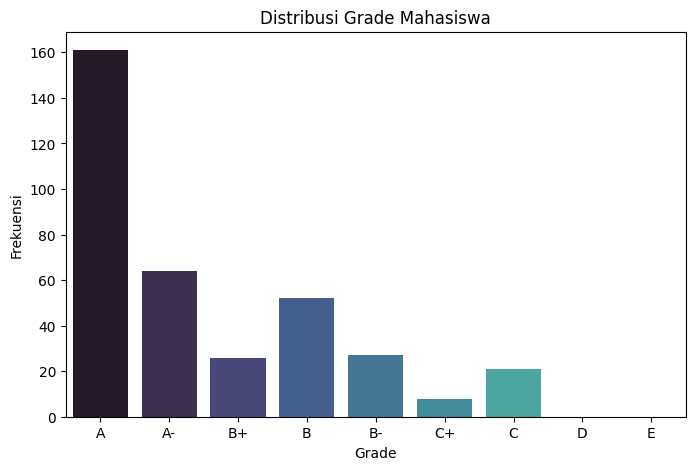

/tmp/ipykernel_3237/454710789.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


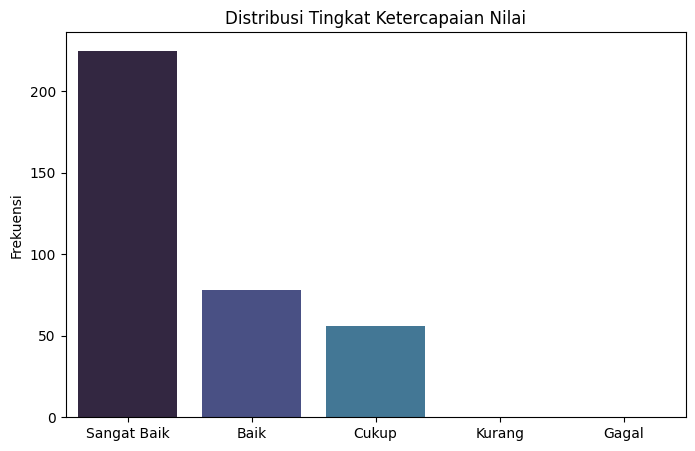

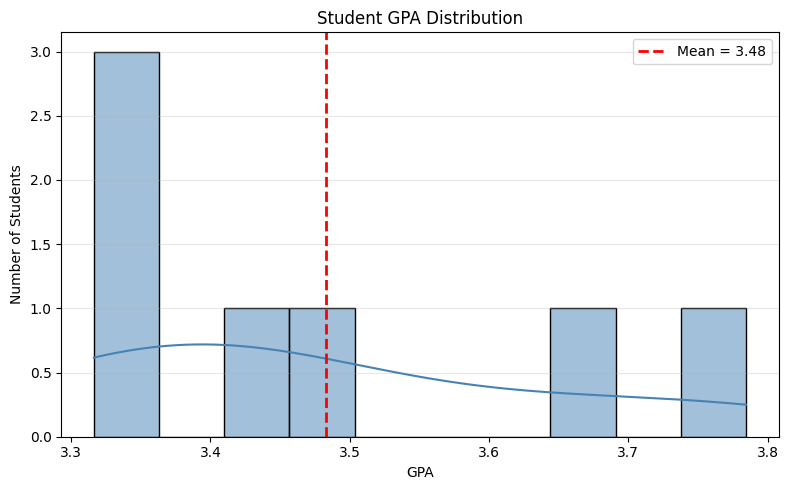

In [ ]:
# ============================================================
# VISUALISASI 1
# DISTRIBUSI GRADE
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

grade_order = [
    "A","A-","B+","B","B-","C+","C","D","E"
]

grade_distribution = (
    df_assessment_output["GRADE"]
    .value_counts()
    .reindex(grade_order)
    .fillna(0)
)

plt.figure(figsize=(8,5))

sns.barplot(
    x=grade_distribution.index,
    y=grade_distribution.values,
    palette = "mako"
)

plt.title("Distribusi Grade Mahasiswa")
plt.xlabel("Grade")
plt.ylabel("Frekuensi")

plt.show()

# ============================================================
# VISUALISASI 2
# DISTRIBUSI TINGKAT KETERCAPAIAN
# ============================================================

order = [
    "Sangat Baik",
    "Baik",
    "Cukup",
    "Kurang",
    "Gagal"
]

achievement = (
    df_assessment_output["Tingkat_Ketercapaian"]
    .value_counts()
    .reindex(order)
)

plt.figure(figsize=(8,5))

sns.barplot(
    x=achievement.index,
    y=achievement.values,
    palette = "mako"
)

plt.title("Distribusi Tingkat Ketercapaian Nilai")
plt.xlabel("")
plt.ylabel("Frekuensi")

plt.show()

# ============================================================
# VISUALISASI
# DISTRIBUSI IPK MAHASASISWA
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

# Hitung total mutu dan total SKS setiap mahasiswa
df_ipk = (
    df_assessment_output
    .assign(Mutu=lambda x: x["NILAI_ANGKA"] * x["SKS"])
    .groupby("NAMA")
    .agg(
        Total_Mutu=("Mutu", "sum"),
        Total_SKS=("SKS", "sum")
    )
)

# Hitung IPK
df_ipk["IPK"] = df_ipk["Total_Mutu"] / df_ipk["Total_SKS"]

# Rata-rata IPK
mean_ipk = df_ipk["IPK"].mean()

# Plot
plt.figure(figsize=(8,5))

sns.histplot(
    df_ipk["IPK"],
    bins=10,
    kde=True,
    color="steelblue"
)

plt.axvline(
    mean_ipk,
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"Mean = {mean_ipk:.2f}"
)

plt.title("Student GPA Distribution")
plt.xlabel("GPA")
plt.ylabel("Number of Students")

plt.legend()

plt.grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()

#### Analisis 2 – Top dan Bottom Mata Kuliah

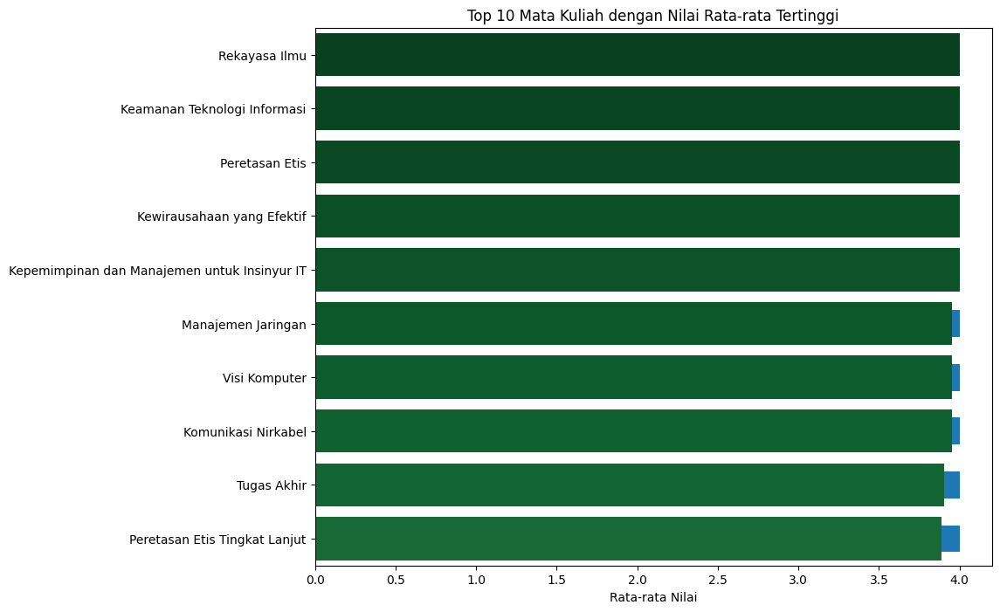

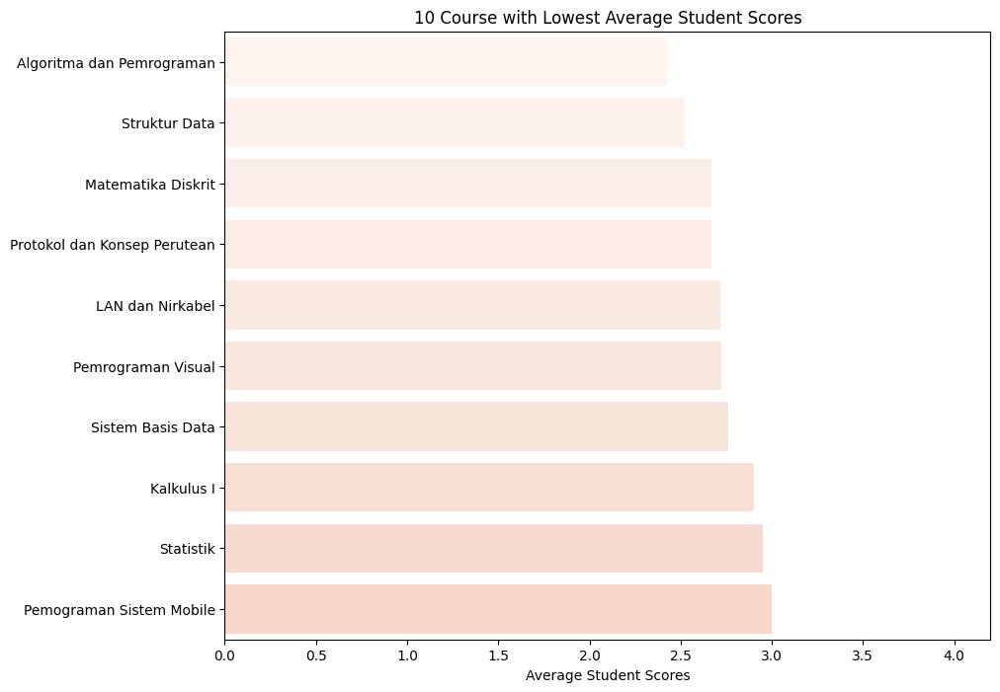

In [ ]:
# ============================================================
# VISUALISASI 3
# TOP and BOTTOM
# ============================================================

top = (

    df_assessment_output

    .groupby("NAMA_MATAKULIAH")["NILAI_ANGKA"]

    .mean()

    .sort_values(ascending=False)

)

plt.figure(figsize=(10,8))

top.head(10).sort_values().plot(kind="barh")

sns.barplot(
    x=top.values,
    y=top.index,
    palette="Greens_r",
    hue=top.index,
    legend=False
)

plt.xlabel("Rata-rata Nilai")

plt.ylabel("")

plt.title("Top 10 Mata Kuliah dengan Nilai Rata-rata Tertinggi")

plt.show()

bottom = (

    df_assessment_output

    .groupby("NAMA_MATAKULIAH")["NILAI_ANGKA"]

    .mean()

    .sort_values()

)

plt.figure(figsize=(10,8))

bottom.head(10).sort_values().plot(kind="barh")

sns.barplot(
    x=bottom.values,
    y=bottom.index,
    palette="Reds",
    hue=bottom.index,
    legend=False
)

plt.xlabel("Average Student Scores")

plt.ylabel("")

plt.title("10 Course with Lowest Average Student Scores")

plt.show()

#### Analisis 3 – Nilai Per Mata Kuliah

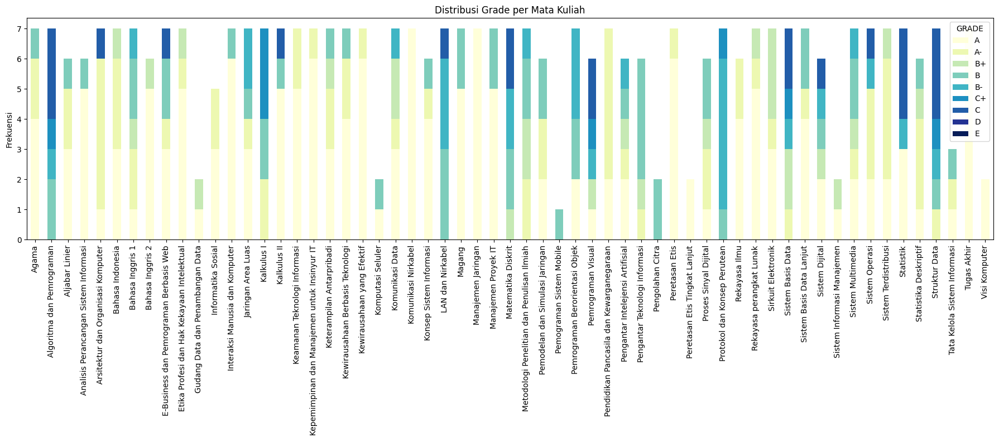

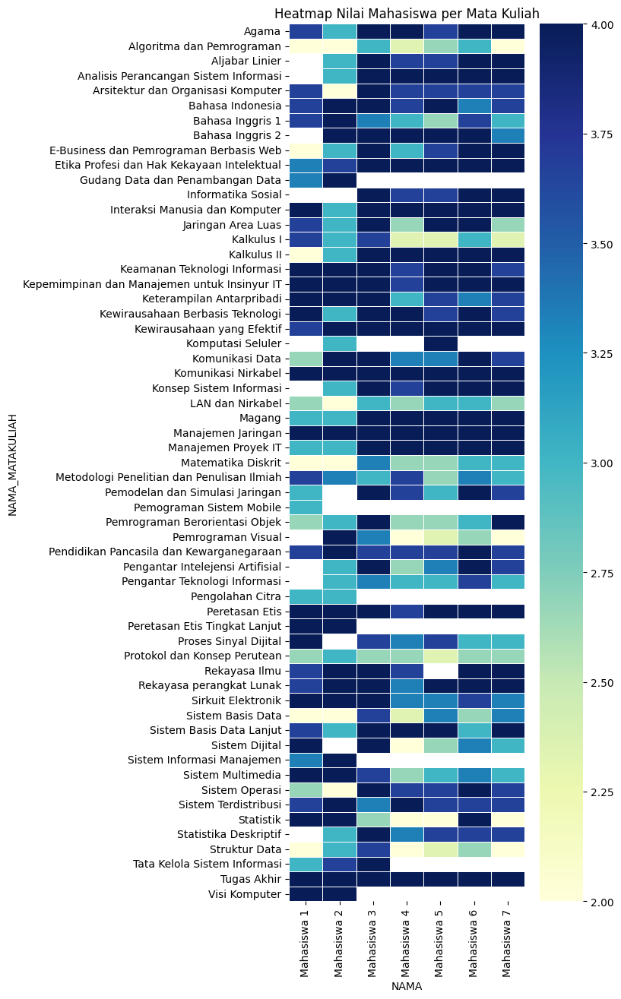

In [ ]:
# ============================================================
# VISUALISASI 5
# STACKED BAR GRADE PER MATA KULIAH
# ============================================================

grade_order = [
    "A","A-","B+","B","B-","C+","C","D","E"
]

grade_course = (

    df_assessment_output

    .groupby(["NAMA_MATAKULIAH","GRADE"])

    .size()

    .unstack(fill_value=0)

)

grade_course = grade_course.reindex(
    columns=grade_order,
    fill_value=0
)

grade_course.plot(

    kind="bar",

    stacked=True,

    cmap="YlGnBu",

    figsize=(18,8)

)

plt.title("Distribusi Grade per Mata Kuliah")

plt.xlabel("")

plt.ylabel("Frekuensi")

plt.tight_layout()

plt.show()

# ============================================================
# VISUALISASI 6
# HEATMAP NILAI
# ============================================================

heatmap = df_assessment_output.pivot_table(

    index="NAMA_MATAKULIAH",

    columns="NAMA",

    values="NILAI_ANGKA"

)

plt.figure(figsize=(5,15))

sns.heatmap(

    heatmap,

    cmap="YlGnBu",

    linewidth=.5

)

plt.title("Heatmap Nilai Mahasiswa per Mata Kuliah")

plt.show()

#### Analisis 4 – Persentase Kelulusan Mata Kuliah

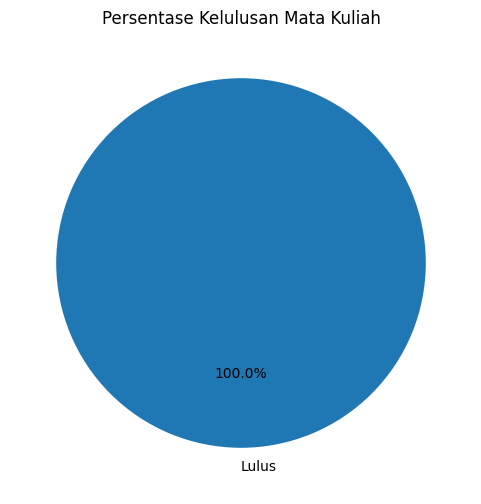

In [ ]:
# ============================================================
# VISUALISASI 7
# PERSENTASE KELULUSAN
# ============================================================

pass_rate = (

    df_assessment_output

    .groupby("Status_Lulus")

    .size()

)

plt.figure(figsize=(6,6))

plt.pie(

    pass_rate,

    labels=pass_rate.index,

    autopct="%1.1f%%",

    startangle=90

)

plt.title("Persentase Kelulusan Mata Kuliah")

plt.show()

### EVALUASI KEPATUHAN TERHADAP PRASYARAT PERKULIAHAN


#### Analisis 1 - Status Kelulusan Mahasiswa

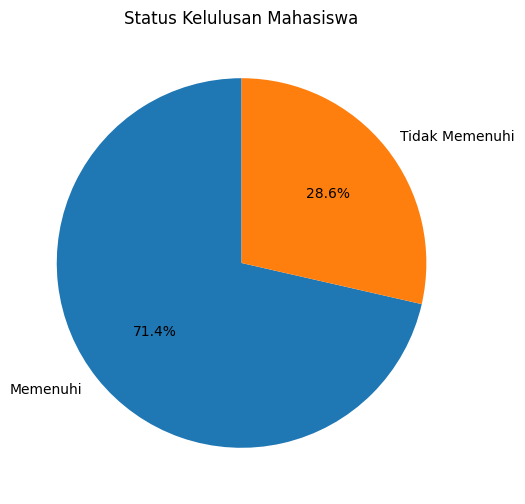

In [ ]:
# ============================================================
# VISUALISASI 1
# STATUS KELULUSAN MAHASISWA
# ============================================================

import matplotlib.pyplot as plt

status = (
    df_eval_graduation["Status_Kelulusan"]
    .value_counts()
)

plt.figure(figsize=(6,6))

plt.pie(
    status.values,
    labels=status.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("Status Kelulusan Mahasiswa")

plt.show()

#### Analisis 2 - Tingkat Kepatuhan Tiap Persyaratan

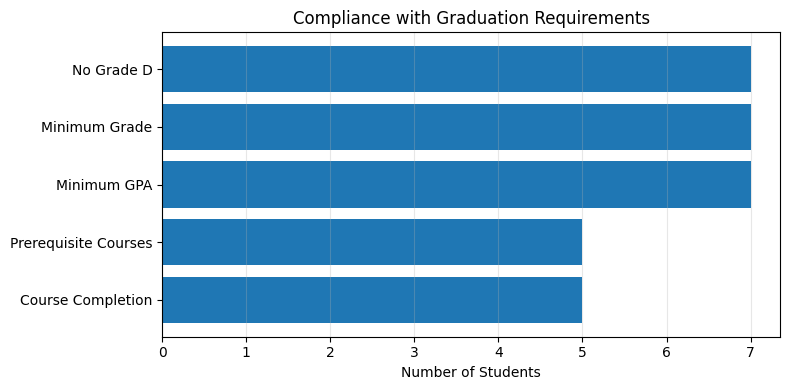

/tmp/ipykernel_3237/1318822582.py:148: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


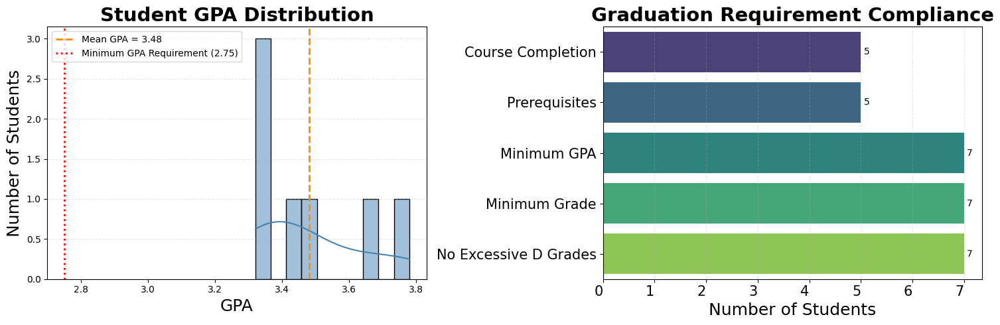

In [ ]:
# ============================================================
# VISUALIZATION 2
# COMPLIANCE WITH GRADUATION REQUIREMENTS
# ============================================================

summary = pd.DataFrame({

    "Requirement":[
        "Minimum GPA",
        "Course Completion",
        "Minimum Grade",
        "Prerequisite Courses",
        "No Grade D"
    ],

    "Number of Students":[

        (df_eval_graduation["Status_IPK"]=="Memenuhi").sum(),

        (df_eval_graduation["Status_Course_Completion"]=="Lengkap").sum(),

        (df_eval_graduation["Status_Minimum_Grade"]=="Memenuhi").sum(),

        (df_eval_graduation["Status_Prasyarat"]=="Memenuhi").sum(),

        (df_eval_graduation["Status_D"]=="Memenuhi").sum()

    ]
})

summary = summary.sort_values("Number of Students")

plt.figure(figsize=(8,4))

plt.barh(
    summary["Requirement"],
    summary["Number of Students"]
)

plt.xlabel("Number of Students")

plt.title("Compliance with Graduation Requirements")

plt.grid(axis="x", alpha=0.3)

plt.tight_layout()

plt.show()

# ==========================================================
# COMBINED VISUALIZATION
# GPA Distribution & Graduation Requirement Compliance
# ==========================================================

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ----------------------------------------------------------
# Summary of Graduation Requirement Compliance
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Requirement":[
        "Minimum GPA",
        "Course Completion",
        "Minimum Grade",
        "Prerequisites",
        "No Excessive D Grades"
    ],

    "Students":[

        (df_eval_graduation["Status_IPK"]=="Memenuhi").sum(),

        (df_eval_graduation["Status_Course_Completion"]=="Lengkap").sum(),

        (df_eval_graduation["Status_Minimum_Grade"]=="Memenuhi").sum(),

        (df_eval_graduation["Status_Prasyarat"]=="Memenuhi").sum(),

        (df_eval_graduation["Status_D"]=="Memenuhi").sum()

    ]
})

summary = summary.sort_values("Students")

# ----------------------------------------------------------
# Create Figure
# ----------------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(15,5))

# ==========================================================
# LEFT : GPA Distribution
# ==========================================================

# Mean GPA
mean_gpa = df_eval_graduation["IPK"].mean()

sns.histplot(
    df_eval_graduation["IPK"],
    bins=10,
    kde=True,
    color="steelblue",
    ax=axes[0]
)

# Mean line
axes[0].axvline(
    mean_gpa,
    color="darkorange",
    linestyle="--",
    linewidth=2,
    label=f"Mean GPA = {mean_gpa:.2f}"
)

# Minimum GPA line
axes[0].axvline(
    2.75,
    color="red",
    linestyle=":",
    linewidth=2,
    label="Minimum GPA Requirement (2.75)"
)

axes[0].set_title(
    "Student GPA Distribution",
    fontsize=21,
    fontweight="bold"
)

axes[0].set_xlabel("GPA", fontsize=18)
axes[0].set_ylabel("Number of Students", fontsize=18)
axes[0].grid(axis="y", linestyle="--", alpha=0.3)
plt.xticks(rotation=45, ha='right', fontsize=15)
plt.yticks(fontsize=15)

# Show legend
axes[0].legend()

# ==========================================================
# RIGHT : Graduation Requirement Compliance
# ==========================================================

sns.barplot(
    data=summary,
    x="Students",
    y="Requirement",
    palette="viridis",
    ax=axes[1]
)

axes[1].set_title(
    "Graduation Requirement Compliance",
    fontsize=21,
    fontweight="bold"
)

axes[1].set_xlabel("Number of Students", fontsize=18)
axes[1].set_ylabel("")
plt.xticks(rotation=0, ha='right', fontsize=15)
plt.yticks(fontsize=15)

# Add value labels
for container in axes[1].containers:
    axes[1].bar_label(container, fmt="%d", padding=3)

axes[1].grid(axis="x", linestyle="--", alpha=0.3)

plt.tight_layout()
plt.show()

#### Analisis 3 - Distribusi IPK

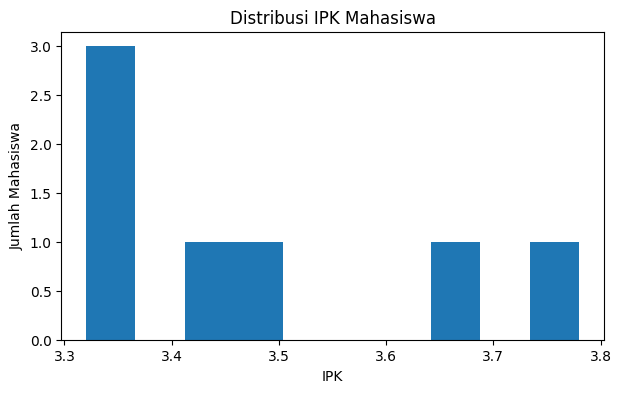

In [ ]:
# ============================================================
# VISUALISASI 3
# DISTRIBUSI IPK
# ============================================================

plt.figure(figsize=(7,4))

plt.hist(
    df_eval_graduation["IPK"],
    bins=10
)

plt.xlabel("IPK")

plt.ylabel("Jumlah Mahasiswa")

plt.title("Distribusi IPK Mahasiswa")

plt.show()

#### Analisis 4 - Mata Kuliah Wajib Belum Ditempuh

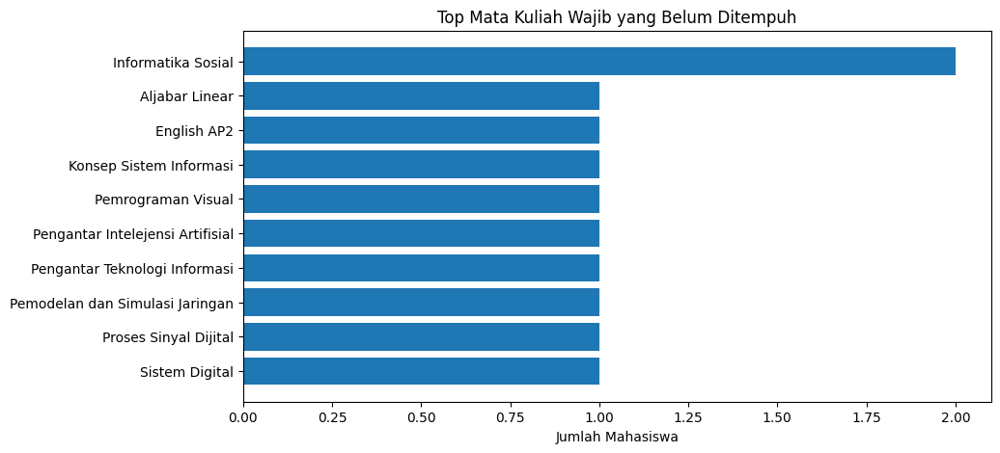

In [ ]:
# ============================================================
# VISUALISASI 4
# MATA KULIAH WAJIB BELUM DITEMPUH
# ============================================================

missing = (

    df_eval_graduation["Missing_Wajib_Courses"]

    .dropna()

    .str.split("; ")

    .explode()

)

missing = (

    missing

    [missing!=""]

    .value_counts()

    .head(10)

)

plt.figure(figsize=(10,5))

plt.barh(

    missing.index[::-1],

    missing.values[::-1]

)

plt.xlabel("Jumlah Mahasiswa")

plt.title("Top Mata Kuliah Wajib yang Belum Ditempuh")

plt.show()

#### Analisis 5 - Mata Kuliah Dengan Nilai Di Bawah C

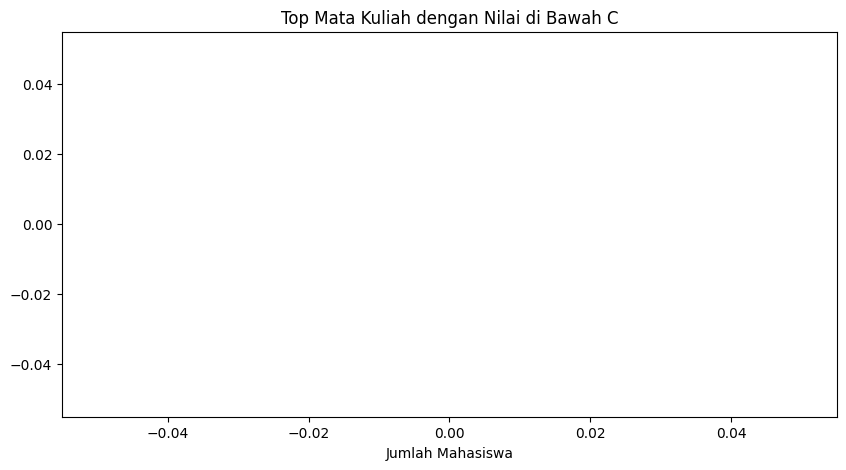

In [ ]:
# ============================================================
# VISUALISASI 5
# NILAI DI BAWAH C
# ============================================================

minimum = (

    df_eval_graduation["Missing_Minimum_Grade_Courses"]

    .dropna()

    .str.split("; ")

    .explode()

)

minimum = (

    minimum

    [minimum!=""]

    .str.replace(r"\s*\(.*\)", "", regex=True)

    .value_counts()

    .head(10)

)

plt.figure(figsize=(10,5))

plt.barh(

    minimum.index[::-1],

    minimum.values[::-1]

)

plt.xlabel("Jumlah Mahasiswa")

plt.title("Top Mata Kuliah dengan Nilai di Bawah C")

plt.show()

#### Analisis 6 - Pelanggaran Prasyarat

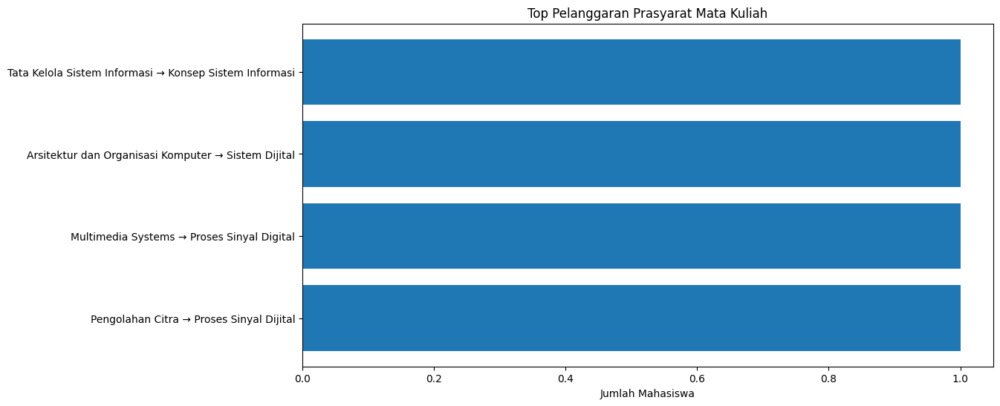

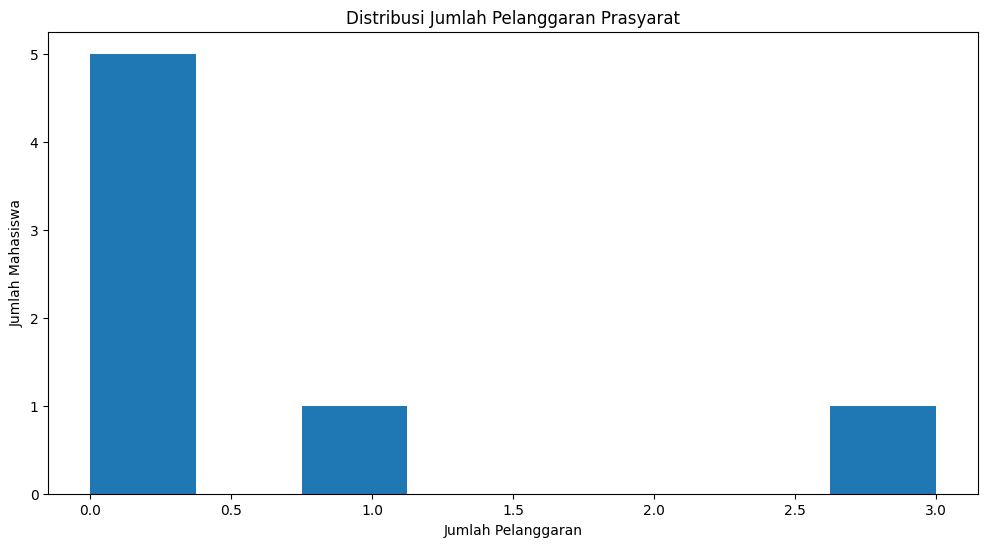

In [ ]:
# ============================================================
# VISUALISASI 6
# PELANGGARAN PRASYARAT
# ============================================================

pre = (

    df_eval_graduation["Missing_Prerequisite_Courses"]

    .dropna()

    .str.split("; ")

    .explode()

)

pre = (

    pre

    [pre!=""]

    .value_counts()

    .head(10)

)

plt.figure(figsize=(12,6))

plt.barh(

    pre.index[::-1],

    pre.values[::-1]

)

plt.xlabel("Jumlah Mahasiswa")

plt.title("Top Pelanggaran Prasyarat Mata Kuliah")

plt.show()

# ============================================================
# VISUALISASI 7
# DISTRIBUSI PELANGGARAN PRASYARAT
# ============================================================

plt.figure(figsize=(12,6))

plt.hist(

    df_eval_graduation["Jumlah_Pelanggaran_Prasyarat"],

    bins=8

)

plt.xlabel("Jumlah Pelanggaran")

plt.ylabel("Jumlah Mahasiswa")

plt.title("Distribusi Jumlah Pelanggaran Prasyarat")

plt.show()

/tmp/ipykernel_3237/359187093.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_3237/359187093.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


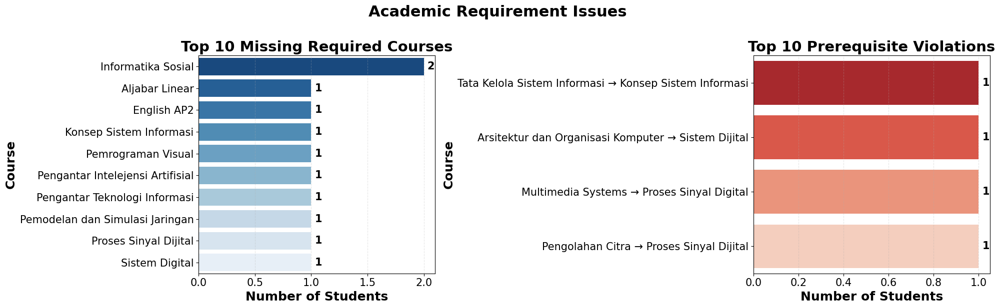

In [ ]:
# ==========================================================
# COMBINED VISUALIZATION
# Missing Required Courses & Prerequisite Violations
# ==========================================================

import matplotlib.pyplot as plt
import seaborn as sns

# ----------------------------------------------------------
# Missing Required Courses
# ----------------------------------------------------------

missing = (
    df_eval_graduation["Missing_Wajib_Courses"]
    .dropna()
    .str.split("; ")
    .explode()
)

missing = (
    missing[missing != ""]
    .value_counts()
    .head(10)
)

# ----------------------------------------------------------
# Prerequisite Violations
# ----------------------------------------------------------

pre = (
    df_eval_graduation["Missing_Prerequisite_Courses"]
    .dropna()
    .str.split("; ")
    .explode()
)

pre = (
    pre[pre != ""]
    .value_counts()
    .head(10)
)

# ----------------------------------------------------------
# Plot
# ----------------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(20,6))

# ---------------- Left Plot ----------------

sns.barplot(
    x=missing.values,
    y=missing.index,
    palette="Blues_r",
    ax=axes[0]
)

axes[0].set_title(
    "Top 10 Missing Required Courses",
    fontsize=21,
    fontweight="bold"
)

axes[0].set_xlabel(
    "Number of Students",
    fontsize=18,
    fontweight="bold"
)

axes[0].set_ylabel(
    "Course",
    fontsize=18,
    fontweight="bold"
)

axes[0].tick_params(axis="both", labelsize=15)
axes[0].grid(axis="x", linestyle="--", alpha=0.3)

for container in axes[0].containers:
    axes[0].bar_label(
        container,
        fmt="%d",
        padding=5,
        fontsize=15,
        fontweight="bold"
    )

# ---------------- Right Plot ----------------

sns.barplot(
    x=pre.values,
    y=pre.index,
    palette="Reds_r",
    ax=axes[1]
)

axes[1].set_title(
    "Top 10 Prerequisite Violations",
    fontsize=21,
    fontweight="bold"
)

axes[1].set_xlabel(
    "Number of Students",
    fontsize=18,
    fontweight="bold"
)

axes[1].set_ylabel(
    "Course",
    fontsize=18,
    fontweight="bold"
)

axes[1].tick_params(axis="both", labelsize=15)
axes[1].grid(axis="x", linestyle="--", alpha=0.3)

for container in axes[1].containers:
    axes[1].bar_label(
        container,
        fmt="%d",
        padding=5,
        fontsize=15,
        fontweight="bold"
    )

# ----------------------------------------------------------
# Overall Title
# ----------------------------------------------------------

plt.suptitle(
    "Academic Requirement Issues",
    fontsize=22,
    fontweight="bold",
    y=1.02
)

plt.tight_layout()
plt.show()

### EVALUASI KETERKAITAN HASIL ASESMEN DENGAN CPL

#### Analisis 1 - Analisis Ketercapaian CPL

Tujuan analisis ini adalah untuk menghitung skor ketercapaian setiap CPL (Capaian Pembelajaran Lulusan) dengan mempertimbangkan nilai akademik (`NILAI_ANGKA`) dari `df_assessment_cpl_exploded`. Hasilnya akan memberikan gambaran kuantitatif mengenai performa mahasiswa dalam mencapai setiap CPL.

<Figure size 1400x700 with 0 Axes>

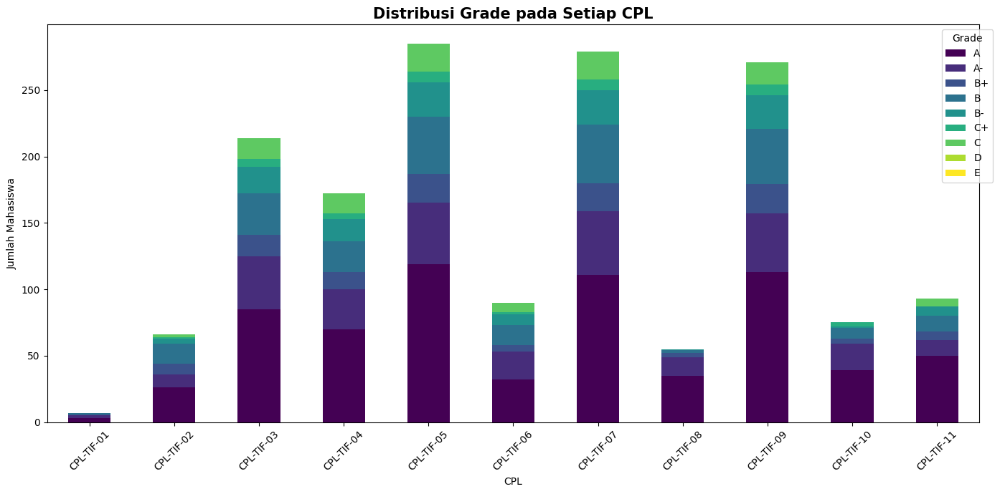

/tmp/ipykernel_3237/1083721946.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


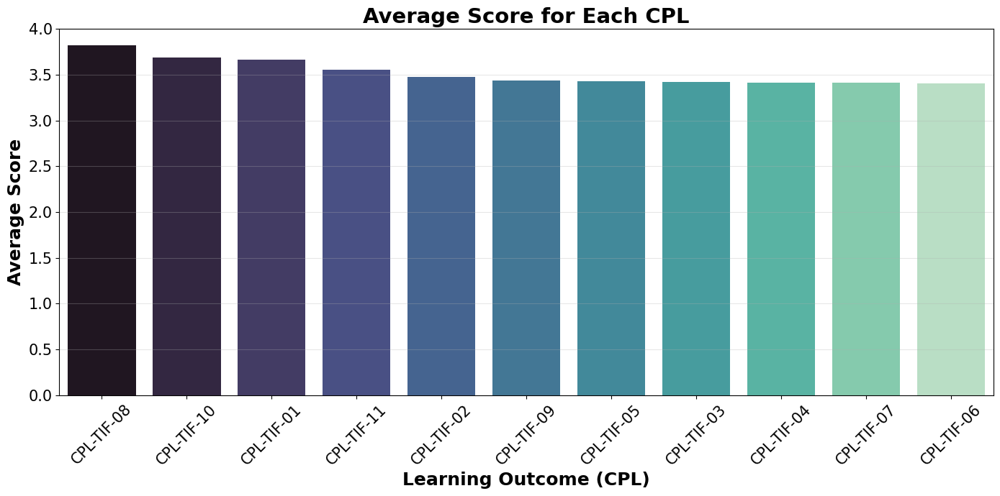

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

grade_order = ["A","A-","B+","B","B-","C+","C","D","E"]

grade_dist = (
    df_assessment_cpl
    .groupby(["CPL_Code","GRADE"])
    .size()
    .unstack(fill_value=0)
)

grade_dist = grade_dist.reindex(columns=grade_order, fill_value=0)

plt.figure(figsize=(14,7))

grade_dist.plot(
    kind="bar",
    stacked=True,
    colormap="viridis",
    figsize=(14,7)
)

plt.title("Distribusi Grade pada Setiap CPL",fontsize=15,fontweight="bold")
plt.xlabel("CPL")
plt.ylabel("Jumlah Mahasiswa")
plt.xticks(rotation=45)
plt.legend(title="Grade",bbox_to_anchor=(1.02,1))
plt.tight_layout()
plt.show()

# ==========================================================
# AVERAGE SCORE FOR EACH PLO
# ==========================================================

cpl_summary = (
    df_assessment_cpl
    .groupby("CPL_Code")
    .agg(
        Mean=("NILAI_ANGKA", "mean")
    )
    .sort_values("Mean", ascending=False)
    .reset_index()
)

plt.figure(figsize=(14, 7))

sns.barplot(
    data=cpl_summary,
    x="CPL_Code",
    y="Mean",
    palette="mako"
)

plt.title(
    "Average Score for Each CPL",
    fontsize=21,
    fontweight="bold"
)

plt.xlabel(
    "Learning Outcome (CPL)",
    fontsize=18,
    fontweight="bold"
)

plt.ylabel(
    "Average Score",
    fontsize=18,
    fontweight="bold"
)

plt.ylim(0, 4)

plt.xticks(
    rotation=45,
    fontsize=15
)

plt.yticks(fontsize=15)

plt.grid(axis="y", alpha=0.3)

plt.tight_layout()

plt.show()

#### Analisis 2 - HARD SKILL VS SOFT SKILL ACHIEVEMENT ANALYSIS

/tmp/ipykernel_3237/560959677.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


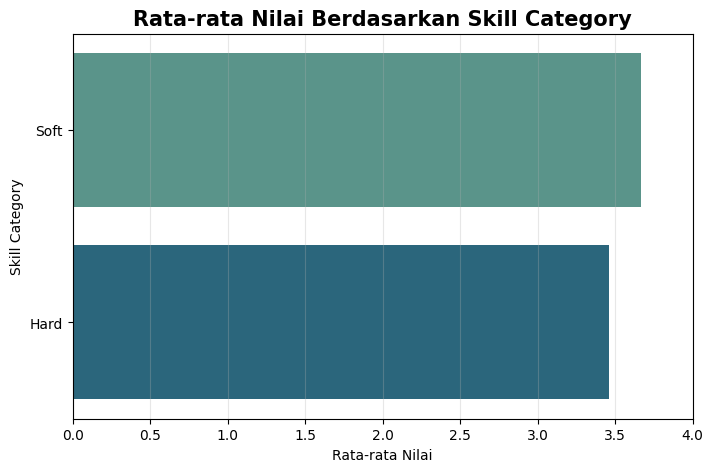

In [ ]:
skill_summary = (
    df_assessment_cpl
    .groupby("rps_skill_category")
    .agg(
        Mean=("NILAI_ANGKA","mean")
    )
    .sort_values("Mean",ascending=False)
    .reset_index()
)

plt.figure(figsize=(8,5))

sns.barplot(
    data=skill_summary,
    x="Mean",
    y="rps_skill_category",
    palette="crest"
)

plt.title("Rata-rata Nilai Berdasarkan Skill Category",
          fontsize=15,fontweight="bold")

plt.xlabel("Rata-rata Nilai")
plt.ylabel("Skill Category")
plt.xlim(0,4)

plt.grid(axis="x",alpha=.3)

plt.show()

#### Analisis 3 – Distribusi Grade per CPL

Tujuan analisis ini adalah untuk mengkaji distribusi nilai siswa untuk setiap Capaian Pembelajaran Lulusan (CPL). Analisis ini melengkapi analisis Rata-rata Nilai sebelumnya dengan mengungkapkan komposisi nilai dalam setiap CPL.

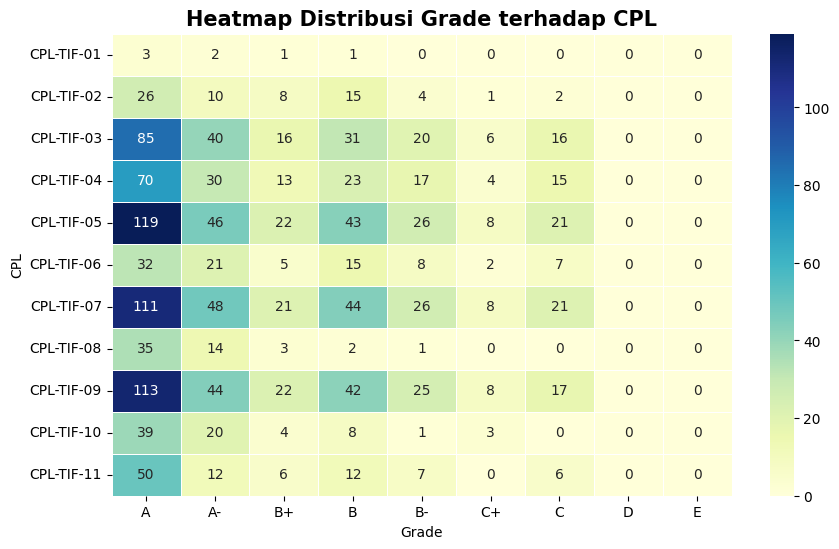

In [ ]:
heatmap = (
    df_assessment_cpl
    .pivot_table(
        index="CPL_Code",
        columns="GRADE",
        values="NIM",
        aggfunc="count",
        fill_value=0
    )
)

heatmap = heatmap.reindex(columns=grade_order,fill_value=0)

plt.figure(figsize=(10,6))

sns.heatmap(
    heatmap,
    annot=True,
    fmt=".0f",
    cmap="YlGnBu",
    linewidths=.5
)

plt.title("Heatmap Distribusi Grade terhadap CPL",
          fontsize=15,
          fontweight="bold")

plt.xlabel("Grade")
plt.ylabel("CPL")

plt.show()

#### Analisis 4 - IDENTIFIKASI CPL KUAT DAN LEMAH

Tujuan dari tahap ini adalah untuk mengidentifikasi Capaian Pembelajaran Lulusan (CPL) mana yang menunjukkan pencapaian yang relatif kuat dan mana yang memerlukan perbaikan kurikulum.

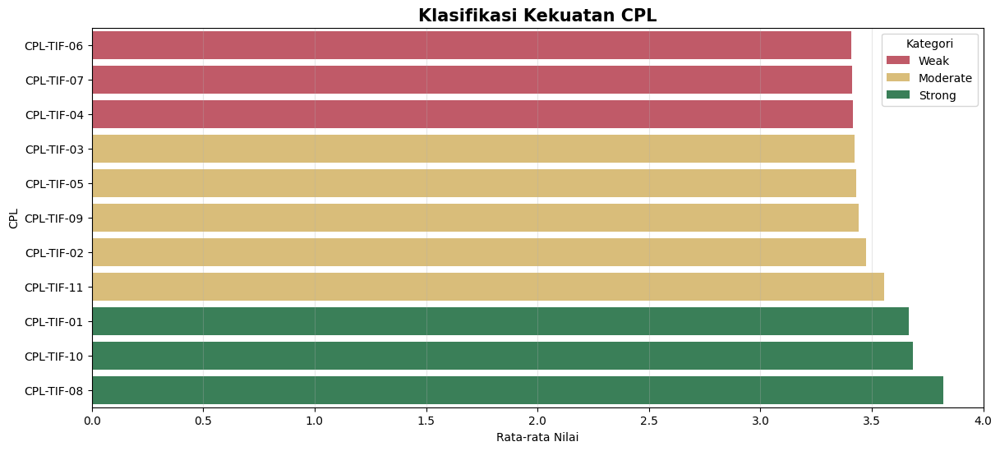

In [ ]:
import numpy as np

cpl_summary = (
    df_assessment_cpl
    .groupby("CPL_Code")
    .agg(
        Mean=("NILAI_ANGKA","mean")
    )
    .reset_index()
)

Q1 = cpl_summary["Mean"].quantile(.25)
Q3 = cpl_summary["Mean"].quantile(.75)

def classify(x):

    if x >= Q3:
        return "Strong"

    elif x >= Q1:
        return "Moderate"

    else:
        return "Weak"

cpl_summary["Strength"] = (
    cpl_summary["Mean"]
    .apply(classify)
)

palette = {
    "Strong":"#2E8B57",
    "Moderate":"#E9C46A",
    "Weak":"#D1495B"
}

plt.figure(figsize=(14,6))

sns.barplot(
    data=cpl_summary.sort_values("Mean"),
    x="Mean",
    y="CPL_Code",
    hue="Strength",
    dodge=False,
    palette=palette
)

plt.title("Klasifikasi Kekuatan CPL",
          fontsize=15,
          fontweight="bold")

plt.xlabel("Rata-rata Nilai")
plt.ylabel("CPL")

plt.xlim(0,4)

plt.legend(title="Kategori")

plt.grid(axis="x",alpha=.3)

plt.show()

## SUMMARIZE

In [ ]:
print(df_assessment_output.columns.tolist())
display(df_assessment_output)
print(df_eval_graduation.columns.tolist())
display(df_eval_graduation)
print(df_assessment_cpl.columns.tolist())
display(df_assessment_cpl)

['NIM', 'NAMA', 'NAMA_MATAKULIAH', 'SKS', 'GRADE', 'NILAI_ANGKA', 'Tingkat_Ketercapaian', 'Status_Lulus', 'PERIODE', 'tahun', 'semester', 'tahun_akademik']


,NIM,NAMA,NAMA_MATAKULIAH,SKS,GRADE,NILAI_ANGKA,Tingkat_Ketercapaian,Status_Lulus,PERIODE,tahun,semester,tahun_akademik
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,3.67,Sangat Baik,Lulus,20202,2020,Genap,2020-2021
1,Mahasiswa 1,Mahasiswa 1,Algoritma dan Pemrograman,4,C,2.00,Cukup,Lulus,20202,2020,Genap,2020-2021
2,Mahasiswa 1,Mahasiswa 1,Arsitektur dan Organisasi Komputer,3,A-,3.67,Sangat Baik,Lulus,20202,2020,Genap,2020-2021
3,Mahasiswa 1,Mahasiswa 1,Bahasa Indonesia,2,A-,3.67,Sangat Baik,Lulus,20202,2020,Genap,2020-2021
4,Mahasiswa 1,Mahasiswa 1,Bahasa Inggris 1,3,A-,3.67,Sangat Baik,Lulus,20202,2020,Genap,2020-2021
...,...,...,...,...,...,...,...,...,...,...,...,...
360,Mahasiswa 7,Mahasiswa 7,Sistem Terdistribusi,3,A-,3.67,Sangat Baik,Lulus,20212,2021,Genap,2021-2022
361,Mahasiswa 7,Mahasiswa 7,Statistik,3,C,2.00,Cukup,Lulus,20211,2021,Ganjil,2021-2022
362,Mahasiswa 7,Mahasiswa 7,Statistika Deskriptif,2,A-,3.67,Sangat Baik,Lulus,20202,2020,Genap,2020-2021
363,Mahasiswa 7,Mahasiswa 7,Struktur Data,3,C,2.00,Cukup,Lulus,20202,2020,Genap,2020-2021


['NIM', 'NAMA', 'IPK', 'Status_IPK', 'Total_Wajib', 'Wajib_Ditempuh', 'Wajib_Belum_Ditempuh', 'Missing_Wajib_Courses', 'Status_Course_Completion', 'Jumlah_D', 'D_Wajib_Prodi', 'Status_D', 'Jumlah_MK_Nilai_DiBawah_C', 'Missing_Minimum_Grade_Courses', 'Status_Minimum_Grade', 'Jumlah_Pelanggaran_Prasyarat', 'Missing_Prerequisite_Courses', 'Status_Prasyarat', 'Status_Kelulusan']


,NIM,NAMA,IPK,Status_IPK,Total_Wajib,Wajib_Ditempuh,Wajib_Belum_Ditempuh,Missing_Wajib_Courses,Status_Course_Completion,Jumlah_D,D_Wajib_Prodi,Status_D,Jumlah_MK_Nilai_DiBawah_C,Missing_Minimum_Grade_Courses,Status_Minimum_Grade,Jumlah_Pelanggaran_Prasyarat,Missing_Prerequisite_Courses,Status_Prasyarat,Status_Kelulusan
0,Mahasiswa 1,Mahasiswa 1,3.35,Memenuhi,45,38,7,Aljabar Linear; English AP2; Informatika Sosial; Konsep Sistem Informasi; Pemrograman Visual; Pengantar Intelejensi Artifisial; Pengantar Teknologi Informasi,Belum Lengkap,0,0,Memenuhi,0,,Memenuhi,1,Tata Kelola Sistem Informasi → Konsep Sistem Informasi,Tidak Memenuhi,Tidak Memenuhi
1,Mahasiswa 2,Mahasiswa 2,3.36,Memenuhi,45,41,4,Informatika Sosial; Pemodelan dan Simulasi Jaringan; Proses Sinyal Dijital; Sistem Digital,Belum Lengkap,0,0,Memenuhi,0,,Memenuhi,3,Arsitektur dan Organisasi Komputer → Sistem Dijital; Multimedia Systems → Proses Sinyal Digital; Pengolahan Citra → Proses Sinyal Dijital,Tidak Memenuhi,Tidak Memenuhi
2,Mahasiswa 3,Mahasiswa 3,3.78,Memenuhi,45,45,0,,Lengkap,0,0,Memenuhi,0,,Memenuhi,0,,Memenuhi,Memenuhi
3,Mahasiswa 4,Mahasiswa 4,3.32,Memenuhi,45,45,0,,Lengkap,0,0,Memenuhi,0,,Memenuhi,0,,Memenuhi,Memenuhi
4,Mahasiswa 5,Mahasiswa 5,3.45,Memenuhi,45,45,0,,Lengkap,0,0,Memenuhi,0,,Memenuhi,0,,Memenuhi,Memenuhi
5,Mahasiswa 6,Mahasiswa 6,3.65,Memenuhi,45,45,0,,Lengkap,0,0,Memenuhi,0,,Memenuhi,0,,Memenuhi,Memenuhi
6,Mahasiswa 7,Mahasiswa 7,3.46,Memenuhi,45,45,0,,Lengkap,0,0,Memenuhi,0,,Memenuhi,0,,Memenuhi,Memenuhi


['NIM', 'NAMA', 'NAMA_MATAKULIAH', 'SKS', 'GRADE', 'NILAI_ANGKA', 'Tingkat_Ketercapaian', 'Status_Lulus', 'PERIODE', 'tahun', 'semester', 'tahun_akademik', 'course_key', 'course_code', 'course_name', 'course_text', 'rps_skill_category', 'matched_cpl_count', 'matched_cpl_codes', 'matched_cpl_texts', 'matched_cpl_similarities_raw', 'top_k_average_similarity', 'best_similarity', 'alignment_status', 'CPL_Code', 'CPL_Text']


,NIM,NAMA,NAMA_MATAKULIAH,SKS,GRADE,NILAI_ANGKA,Tingkat_Ketercapaian,Status_Lulus,PERIODE,tahun,...,rps_skill_category,matched_cpl_count,matched_cpl_codes,matched_cpl_texts,matched_cpl_similarities_raw,top_k_average_similarity,best_similarity,alignment_status,CPL_Code,CPL_Text
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,3.67,Sangat Baik,Lulus,20202,2020,...,Hard,5.0,CPL-TIF-08 | CPL-TIF-06 | CPL-TIF-11 | CPL-TIF-07 | CPL-TIF-10,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b | mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g | mampu memberikan wawasan keilmuan dan keunggulan dalam bidang teknik informatika untuk berkarya melalui pengalaman kerja serta meningkatkan sikap dan mental kewirausahaan secara profesional | memiliki keahlian bidang bisnis dan teknologi baik secara konseptual maupun praktikal dan mampu melanjutkan studi di bidang teknik informatika dan teknologi informasi 2 | mampu meningkatkan kemampuan komunikasi efektif secara lisan dan tertulis dalam memberikan kontribusi manfaat yang positif bagi organisasi dengan memahami ketentuan hukum yang berlaku serta tatanannorma dalam masyarakat b,0.4165 | 0.3241 | 0.2972 | 0.259 | 0.2584,0.3111,0.4165,Not Aligned,CPL-TIF-08,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,3.67,Sangat Baik,Lulus,20202,2020,...,Hard,5.0,CPL-TIF-08 | CPL-TIF-06 | CPL-TIF-11 | CPL-TIF-07 | CPL-TIF-10,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b | mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g | mampu memberikan wawasan keilmuan dan keunggulan dalam bidang teknik informatika untuk berkarya melalui pengalaman kerja serta meningkatkan sikap dan mental kewirausahaan secara profesional | memiliki keahlian bidang bisnis dan teknologi baik secara konseptual maupun praktikal dan mampu melanjutkan studi di bidang teknik informatika dan teknologi informasi 2 | mampu meningkatkan kemampuan komunikasi efektif secara lisan dan tertulis dalam memberikan kontribusi manfaat yang positif bagi organisasi dengan memahami ketentuan hukum yang berlaku serta tatanannorma dalam masyarakat b,0.4165 | 0.3241 | 0.2972 | 0.259 | 0.2584,0.3111,0.4165,Not Aligned,CPL-TIF-06,mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g
0,Mahasiswa 1,Mahasiswa 1,Agama,2,A-,3.67,Sangat Baik,Lulus,20202,2020,...,Hard,5.0,CPL-TIF-08 | CPL-TIF-06 | CPL-TIF-11 | CPL-TIF-07 | CPL-TIF-10,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b | mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g | mampu memberikan wawasan keilmuan dan keunggulan dalam bidang teknik informatika untuk berkarya melalui pengalaman kerja serta meningkatkan sikap dan mental kewirausahaan secara profesional | memiliki keahlian bidang bisnis dan teknologi baik secara konseptual maupun praktikal dan mampu melanjutkan studi di bidang teknik informatika dan teknologi informasi 2 | mampu meningkatkan kemampuan komunikasi efektif secara lisan dan tertulis dala

### EVALUASI OUTPUT ASESMEN

In [ ]:
# ==========================================================
# SUMMARY
# EVALUASI OUTPUT ASESMEN
# ==========================================================

import pandas as pd
import numpy as np

print("="*100)
print("SUMMARY EVALUASI OUTPUT ASESMEN")
print("="*100)

# ----------------------------------------------------------
# Kondisi Output Asesmen
# ----------------------------------------------------------

def get_condition(score):

    if score >= 3.67:
        return "Sangat Baik"

    elif score >= 3.00:
        return "Baik"

    elif score >= 2.00:
        return "Cukup"

    else:
        return "Perlu Perbaikan"

# ----------------------------------------------------------
# Statistics
# ----------------------------------------------------------

statistics = pd.DataFrame({

    "Metric":[

        "Jumlah Mahasiswa",
        "Jumlah Mata Kuliah",
        "Jumlah Record",
        "Rata-rata Nilai",
        "Median Nilai",
        "Standar Deviasi",
        "Nilai Tertinggi",
        "Nilai Terendah",
        "Persentase Kelulusan"

    ],

    "Value":[

        df_assessment_output["NIM"].nunique(),

        df_assessment_output["NAMA_MATAKULIAH"].nunique(),

        len(df_assessment_output),

        round(df_assessment_output["NILAI_ANGKA"].mean(),2),

        round(df_assessment_output["NILAI_ANGKA"].median(),2),

        round(df_assessment_output["NILAI_ANGKA"].std(),2),

        round(df_assessment_output["NILAI_ANGKA"].max(),2),

        round(df_assessment_output["NILAI_ANGKA"].min(),2),

        round(
            (
                df_assessment_output["Status_Lulus"]
                .eq("Lulus")
                .mean()
            )*100,
            2
        )

    ]

})

# ----------------------------------------------------------
# Grade Distribution
# ----------------------------------------------------------

grade_distribution = (

    df_assessment_output

    .groupby("GRADE")

    .size()

    .reset_index(name="Jumlah")

)

grade_distribution["Persentase (%)"] = round(

    grade_distribution["Jumlah"] /
    grade_distribution["Jumlah"].sum()*100,

    2

)

grade_distribution = grade_distribution.sort_values(

    "Jumlah",

    ascending=False

)

# ----------------------------------------------------------
# Tingkat Ketercapaian
# ----------------------------------------------------------

achievement_distribution = (

    df_assessment_output

    .groupby("Tingkat_Ketercapaian")

    .size()

    .reset_index(name="Jumlah")

)

achievement_distribution["Persentase (%)"] = round(

    achievement_distribution["Jumlah"] /
    achievement_distribution["Jumlah"].sum()*100,

    2

)

achievement_distribution = achievement_distribution.sort_values(

    "Jumlah",

    ascending=False

)

# ----------------------------------------------------------
# Top & Bottom Mata Kuliah
# ----------------------------------------------------------

course_performance = (

    df_assessment_output

    .groupby("NAMA_MATAKULIAH")

    .agg(

        Average_Score=("NILAI_ANGKA","mean"),

        Median_Score=("NILAI_ANGKA","median"),

        Student_Count=("NIM","nunique")

    )

    .reset_index()

)

course_performance["Average_Score"] = course_performance[
    "Average_Score"
].round(2)

course_performance["Median_Score"] = course_performance[
    "Median_Score"
].round(2)

top5 = (

    course_performance

    .sort_values(

        "Average_Score",

        ascending=False

    )

    .head(5)

)

bottom5 = (

    course_performance

    .sort_values(

        "Average_Score"

    )

    .head(5)

)

# ----------------------------------------------------------
# Insight
# ----------------------------------------------------------

insight = []

most_grade = grade_distribution.iloc[0]

insight.append(

    f"Mayoritas mahasiswa memperoleh grade {most_grade['GRADE']} sebanyak {most_grade['Jumlah']} nilai ({most_grade['Persentase (%)']:.2f}%)."

)

most_achievement = achievement_distribution.iloc[0]

insight.append(

    f"Tingkat ketercapaian yang paling dominan adalah '{most_achievement['Tingkat_Ketercapaian']}' sebesar {most_achievement['Persentase (%)']:.2f}%."

)

best = top5.iloc[0]

insight.append(

    f"Mata kuliah dengan rata-rata nilai tertinggi adalah '{best['NAMA_MATAKULIAH']}' dengan nilai rata-rata {best['Average_Score']:.2f}."

)

worst = bottom5.iloc[0]

insight.append(

    f"Mata kuliah dengan rata-rata nilai terendah adalah '{worst['NAMA_MATAKULIAH']}' dengan nilai rata-rata {worst['Average_Score']:.2f}."

)

avg_score = statistics.loc[
    statistics["Metric"]=="Rata-rata Nilai",
    "Value"
].iloc[0]

condition = get_condition(avg_score)

insight.append(

    f"Rata-rata hasil asesmen mahasiswa sebesar {avg_score:.2f} "
    f"menunjukkan bahwa capaian pembelajaran berada pada kategori "
    f"'{condition}'."

)

if condition == "Sangat Baik":

    insight.append(

        "Hasil asesmen menunjukkan bahwa sebagian besar mahasiswa telah mencapai capaian pembelajaran dengan sangat baik sehingga strategi pembelajaran yang diterapkan dapat dipertahankan."

    )

elif condition == "Baik":

    insight.append(

        "Hasil asesmen menunjukkan bahwa capaian pembelajaran mahasiswa telah berada pada kategori baik, namun peningkatan pada beberapa mata kuliah masih diperlukan."

    )

elif condition == "Cukup":

    insight.append(

        "Capaian pembelajaran mahasiswa berada pada kategori cukup sehingga diperlukan evaluasi terhadap beberapa mata kuliah dengan hasil asesmen yang masih rendah."

    )

else:

    insight.append(

        "Hasil asesmen menunjukkan bahwa capaian pembelajaran mahasiswa masih memerlukan perbaikan sehingga strategi pembelajaran dan asesmen perlu dievaluasi."

    )

# ----------------------------------------------------------
# Summary Dictionary
# ----------------------------------------------------------

summary_assessment_output = {

    "statistics":statistics,

    "grade_distribution":grade_distribution,

    "achievement_distribution":achievement_distribution,

    "top5":top5,

    "bottom5":bottom5,

    "insight":insight

}

# ----------------------------------------------------------
# Display
# ----------------------------------------------------------

print("\nSTATISTICS")

display(statistics)

print("\nGRADE DISTRIBUTION")

display(grade_distribution)

print("\nTINGKAT KETERCAPAIAN")

display(achievement_distribution)

print("\nTOP 5 MATA KULIAH")

display(top5)

print("\nBOTTOM 5 MATA KULIAH")

display(bottom5)

print("\n"+"="*100)

print("INSIGHT")

print("="*100)

for i,item in enumerate(insight,1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")

print("summary_assessment_output")

SUMMARY EVALUASI OUTPUT ASESMEN

STATISTICS


,Metric,Value
0,Jumlah Mahasiswa,7.00
1,Jumlah Mata Kuliah,59.00
2,Jumlah Record,359.00
3,Rata-rata Nilai,3.49
4,Median Nilai,3.67
5,Standar Deviasi,0.61
6,Nilai Tertinggi,4.00
7,Nilai Terendah,2.00
8,Persentase Kelulusan,100.00



GRADE DISTRIBUTION


,GRADE,Jumlah,Persentase (%)
0,A,161,44.85
1,A-,64,17.83
2,B,52,14.48
4,B-,27,7.52
3,B+,26,7.24
5,C,21,5.85
6,C+,8,2.23



TINGKAT KETERCAPAIAN


,Tingkat_Ketercapaian,Jumlah,Persentase (%)
2,Sangat Baik,225,62.67
0,Baik,78,21.73
1,Cukup,56,15.60



TOP 5 MATA KULIAH


,NAMA_MATAKULIAH,Average_Score,Median_Score,Student_Count
23,Komunikasi Nirkabel,4.0,4.0,7
40,Peretasan Etis Tingkat Lanjut,4.0,4.0,2
27,Manajemen Jaringan,4.0,4.0,7
58,Visi Komputer,4.0,4.0,2
57,Tugas Akhir,4.0,4.0,7



BOTTOM 5 MATA KULIAH


,NAMA_MATAKULIAH,Average_Score,Median_Score,Student_Count
1,Algoritma dan Pemrograman,2.43,2.33,7
55,Struktur Data,2.52,2.33,7
42,Protokol dan Konsep Perutean,2.67,2.67,7
29,Matematika Diskrit,2.67,2.67,7
25,LAN dan Nirkabel,2.72,2.67,7



INSIGHT
1. Mayoritas mahasiswa memperoleh grade A sebanyak 161 nilai (44.85%).
2. Tingkat ketercapaian yang paling dominan adalah 'Sangat Baik' sebesar 62.67%.
3. Mata kuliah dengan rata-rata nilai tertinggi adalah 'Komunikasi Nirkabel' dengan nilai rata-rata 4.00.
4. Mata kuliah dengan rata-rata nilai terendah adalah 'Algoritma dan Pemrograman' dengan nilai rata-rata 2.43.
5. Rata-rata hasil asesmen mahasiswa sebesar 3.49 menunjukkan bahwa capaian pembelajaran berada pada kategori 'Baik'.
6. Hasil asesmen menunjukkan bahwa capaian pembelajaran mahasiswa telah berada pada kategori baik, namun peningkatan pada beberapa mata kuliah masih diperlukan.

Summary berhasil disimpan pada variabel:
summary_assessment_output


### EVALUASI KEPATUHAN TERHADAP PRASYARAT PERKULIAHAN

In [ ]:
# ==========================================================
# SUMMARY
# EVALUASI KEPATUHAN TERHADAP PERSYARATAN KELULUSAN
# ==========================================================

import pandas as pd
import numpy as np

print("="*100)
print("SUMMARY EVALUASI KEPATUHAN TERHADAP PERSYARATAN KELULUSAN")
print("="*100)

# ----------------------------------------------------------
# Statistics
# ----------------------------------------------------------

total_student = df_eval_graduation["NIM"].nunique()

graduated = (
    df_eval_graduation["Status_Kelulusan"]
    .astype(str)
    .str.lower()
    .eq("memenuhi")
    .sum()
)

graduation_rate = round(graduated / total_student * 100,2)

statistics = pd.DataFrame({

    "Metric":[

        "Jumlah Mahasiswa",
        "Mahasiswa Memenuhi Persyaratan",
        "Mahasiswa Belum Memenuhi",
        "Persentase Kelulusan",
        "Rata-rata IPK",
        "Rata-rata Mata Kuliah Wajib Ditempuh",
        "Rata-rata Jumlah Nilai D",
        "Rata-rata Pelanggaran Prasyarat"

    ],

    "Value":[

        total_student,

        graduated,

        total_student-graduated,

        graduation_rate,

        round(df_eval_graduation["IPK"].mean(),2),

        round(df_eval_graduation["Wajib_Ditempuh"].mean(),2),

        round(df_eval_graduation["Jumlah_D"].mean(),2),

        round(df_eval_graduation["Jumlah_Pelanggaran_Prasyarat"].mean(),2)

    ]

})

# ----------------------------------------------------------
# Status Kelulusan
# ----------------------------------------------------------

status_distribution = (

    df_eval_graduation

    .groupby("Status_Kelulusan")

    .size()

    .reset_index(name="Jumlah")

)

status_distribution["Persentase (%)"] = round(

    status_distribution["Jumlah"] /
    total_student *100,

    2

)

# ----------------------------------------------------------
# Persentase Kepatuhan Tiap Persyaratan
# ----------------------------------------------------------

requirement = [

    ("Status_IPK","IPK Minimum"),

    ("Status_Course_Completion","Mata Kuliah Wajib"),

    ("Status_Minimum_Grade","Nilai Minimum C"),

    ("Status_D","Jumlah Nilai D"),

    ("Status_Prasyarat","Prasyarat")

]

rows=[]

for col,name in requirement:

    comply = (

        df_eval_graduation[col]

        .astype(str)

        .str.lower()

        .isin(["memenuhi","lengkap"])

        .mean()

        *100

    )

    rows.append({

        "Persyaratan":name,

        "Persentase Kepatuhan (%)":round(comply,2)

    })

requirement_compliance = pd.DataFrame(rows)

# Define best and worst compliance percentages
best = requirement_compliance.sort_values("Persentase Kepatuhan (%)", ascending=False).iloc[0]
worst = requirement_compliance.sort_values("Persentase Kepatuhan (%)", ascending=True).iloc[0]

# ----------------------------------------------------------
# Missing Required Courses
# ----------------------------------------------------------

missing_courses=[]

for item in df_eval_graduation["Missing_Wajib_Courses"]:

    if pd.isna(item):

        continue

    for course in str(item).split(";"):

        course=course.strip()

        if course!="":

            missing_courses.append(course)

if len(missing_courses)>0:

    top_missing_courses=(

        pd.Series(missing_courses)

        .value_counts()

        .head(5)

        .reset_index()

    )

    top_missing_courses.columns=[

        "Mata Kuliah",

        "Jumlah Mahasiswa"

    ]

else:

    top_missing_courses=pd.DataFrame(

        columns=[

            "Mata Kuliah",

            "Jumlah Mahasiswa"

        ]

    )

# ----------------------------------------------------------
# Prerequisite Violations
# ----------------------------------------------------------

missing_prerequisite=[]

for item in df_eval_graduation["Missing_Prerequisite_Courses"]:

    if pd.isna(item):

        continue

    for course in str(item).split(";"):

        course=course.strip()

        if course!="":

            missing_prerequisite.append(course)

if len(missing_prerequisite)>0:

    prerequisite_violation=(

        pd.Series(missing_prerequisite)

        .value_counts()

        .head(5)

        .reset_index()

    )

    prerequisite_violation.columns=[

        "Pelanggaran Prasyarat",

        "Jumlah Mahasiswa"

    ]

else:

    prerequisite_violation=pd.DataFrame(

        columns=[

            "Pelanggaran Prasyarat",

            "Jumlah Mahasiswa"

        ]

    )

# ----------------------------------------------------------
# Insight
# ----------------------------------------------------------

insight=[]

not_graduated = total_student - graduated

if not_graduated == 0:

    insight.append(

        "Seluruh mahasiswa telah memenuhi seluruh persyaratan kelulusan sesuai dengan ketentuan akademik yang berlaku."

    )

else:

    insight.append(

        f"Ditemukan sebanyak {not_graduated} mahasiswa "
        f"({100-graduation_rate:.2f}%) yang belum memenuhi seluruh "
        "persyaratan kelulusan. Temuan ini menunjukkan bahwa masih "
        "terdapat mahasiswa yang memerlukan evaluasi lebih lanjut "
        "terhadap pemenuhan persyaratan akademik sebelum dinyatakan "
        "memenuhi syarat kelulusan."

    )

insight.append(

    f"Persyaratan dengan tingkat kepatuhan tertinggi adalah '{best['Persyaratan']}' ({best['Persentase Kepatuhan (%)']:.2f}%)."

)

insight.append(

    f"Persyaratan yang paling banyak belum terpenuhi adalah '{worst['Persyaratan']}' ({worst['Persentase Kepatuhan (%)']:.2f}%)."

)

if len(top_missing_courses)>0:

    insight.append(

        f"Mata kuliah wajib yang paling sering belum ditempuh adalah '{top_missing_courses.iloc[0]['Mata Kuliah']}'."

    )

if len(prerequisite_violation)>0:

    insight.append(

        f"Pelanggaran prasyarat yang paling sering terjadi adalah '{prerequisite_violation.iloc[0]['Pelanggaran Prasyarat']}'."

    )

# ----------------------------------------------------------
# Summary Dictionary
# ----------------------------------------------------------

summary_assessment_graduation={

    "statistics":statistics,

    "status_distribution":status_distribution,

    "requirement_compliance":requirement_compliance,

    "top_missing_courses":top_missing_courses,

    "top_prerequisite_violation":prerequisite_violation,

    "insight":insight

}

# ----------------------------------------------------------
# Display
# ----------------------------------------------------------

print("\nSTATISTICS")

display(statistics)

print("\nSTATUS KELULUSAN")

display(status_distribution)

print("\nKEPATUHAN TIAP PERSYARATAN")

display(requirement_compliance)

print("\nTOP 5 MATA KULIAH WAJIB BELUM DITEMPUH")

display(top_missing_courses)

print("\nTOP 5 PELANGGARAN PRASYARAT")

display(prerequisite_violation)

print("\n"+"="*100)
print("INSIGHT")
print("="*100)

for i,item in enumerate(insight,1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")

print("summary_assessment_graduation")

SUMMARY EVALUASI KEPATUHAN TERHADAP PERSYARATAN KELULUSAN

STATISTICS


,Metric,Value
0,Jumlah Mahasiswa,7.00
1,Mahasiswa Memenuhi Persyaratan,5.00
2,Mahasiswa Belum Memenuhi,2.00
3,Persentase Kelulusan,71.43
4,Rata-rata IPK,3.48
5,Rata-rata Mata Kuliah Wajib Ditempuh,43.43
6,Rata-rata Jumlah Nilai D,0.00
7,Rata-rata Pelanggaran Prasyarat,0.57



STATUS KELULUSAN


,Status_Kelulusan,Jumlah,Persentase (%)
0,Memenuhi,5,71.43
1,Tidak Memenuhi,2,28.57



KEPATUHAN TIAP PERSYARATAN


,Persyaratan,Persentase Kepatuhan (%)
0,IPK Minimum,100.00
1,Mata Kuliah Wajib,71.43
2,Nilai Minimum C,100.00
3,Jumlah Nilai D,100.00
4,Prasyarat,71.43



TOP 5 MATA KULIAH WAJIB BELUM DITEMPUH


,Mata Kuliah,Jumlah Mahasiswa
0,Informatika Sosial,2
1,Aljabar Linear,1
2,English AP2,1
3,Konsep Sistem Informasi,1
4,Pemrograman Visual,1



TOP 5 PELANGGARAN PRASYARAT


,Pelanggaran Prasyarat,Jumlah Mahasiswa
0,Tata Kelola Sistem Informasi → Konsep Sistem Informasi,1
1,Arsitektur dan Organisasi Komputer → Sistem Dijital,1
2,Multimedia Systems → Proses Sinyal Digital,1
3,Pengolahan Citra → Proses Sinyal Dijital,1



INSIGHT
1. Ditemukan sebanyak 2 mahasiswa (28.57%) yang belum memenuhi seluruh persyaratan kelulusan. Temuan ini menunjukkan bahwa masih terdapat mahasiswa yang memerlukan evaluasi lebih lanjut terhadap pemenuhan persyaratan akademik sebelum dinyatakan memenuhi syarat kelulusan.
2. Persyaratan dengan tingkat kepatuhan tertinggi adalah 'IPK Minimum' (100.00%).
3. Persyaratan yang paling banyak belum terpenuhi adalah 'Mata Kuliah Wajib' (71.43%).
4. Mata kuliah wajib yang paling sering belum ditempuh adalah 'Informatika Sosial'.
5. Pelanggaran prasyarat yang paling sering terjadi adalah 'Tata Kelola Sistem Informasi → Konsep Sistem Informasi'.

Summary berhasil disimpan pada variabel:
summary_assessment_graduation


### EVALUASI KETERKAITAN HASIL ASESMEN DENGAN CPL

In [ ]:
# ==========================================================
# SUMMARY
# EVALUASI KETERKAITAN HASIL ASESMEN DENGAN CPL
# ==========================================================

import pandas as pd
import numpy as np

print("="*100)
print("SUMMARY EVALUASI KETERKAITAN HASIL ASESMEN DENGAN CPL")
print("="*100)

# ----------------------------------------------------------
# Statistics
# ----------------------------------------------------------

statistics = pd.DataFrame({

    "Metric":[

        "Jumlah Mahasiswa",
        "Jumlah Mata Kuliah",
        "Jumlah CPL",
        "Jumlah Record",
        "Average Grade",
        "Average Similarity"

    ],

    "Value":[

        df_assessment_cpl["NIM"].nunique(),

        df_assessment_cpl["NAMA_MATAKULIAH"].nunique(),

        df_assessment_cpl["CPL_Code"].nunique(),

        len(df_assessment_cpl),

        round(df_assessment_cpl.groupby("CPL_Code")["NILAI_ANGKA"].mean().mean(),2),

        round(df_assessment_cpl.groupby("CPL_Code")["best_similarity"].mean().mean(),4)

    ]

})

# ----------------------------------------------------------
# Skill Category Achievement
# ----------------------------------------------------------

skill_achievement = (

    df_assessment_cpl

    .groupby("rps_skill_category")

    .agg(

        Average_Grade=("NILAI_ANGKA","mean"),

        Average_Similarity=("best_similarity","mean"),

        Total_Record=("NIM","count")

    )

    .reset_index()

)

skill_achievement["Average_Grade"] = skill_achievement[
    "Average_Grade"
].round(2)

skill_achievement["Average_Similarity"] = skill_achievement[
    "Average_Similarity"
].round(4)

# ----------------------------------------------------------
# CPL Achievement
# ----------------------------------------------------------

cpl_achievement = (

    df_assessment_cpl

    .groupby(

        ["CPL_Code","CPL_Text"]

    )

    .agg(

        Average_Grade=("NILAI_ANGKA","mean"),

        Average_Similarity=("best_similarity","mean"),

        Student_Count=("NIM","nunique")

    )

    .reset_index()

)

cpl_achievement["Average_Grade"] = cpl_achievement[
    "Average_Grade"
].round(2)

# ----------------------------------------------------------
# Top 5 CPL
# ----------------------------------------------------------

top5 = (

    cpl_achievement

    .sort_values(

        "Average_Grade",

        ascending=False

    )

    .head(5)

)

# ----------------------------------------------------------
# Bottom 5 CPL
# ----------------------------------------------------------

bottom5 = (

    cpl_achievement

    .sort_values(

        "Average_Grade"

    )

    .head(5)

)

# ----------------------------------------------------------
# Insight
# ----------------------------------------------------------

insight=[]

avg_grade = statistics.loc[
    statistics["Metric"]=="Average Grade",
    "Value"
].iloc[0]

insight.append(
    f"Rata-rata nilai asesmen mahasiswa sebesar {avg_grade:.2f}, yang menunjukkan capaian hasil belajar secara umum berada pada kategori baik."
)

best_skill = skill_achievement.sort_values(

    "Average_Grade",

    ascending=False

).iloc[0]

insight.append(

    f"Kategori skill dengan capaian nilai tertinggi adalah '{best_skill['rps_skill_category']}' dengan rata-rata nilai {best_skill['Average_Grade']:.2f}."

)

best = top5.iloc[0]

insight.append(

    f"CPL dengan capaian asesmen tertinggi adalah {best['CPL_Code']} dengan rata-rata nilai {best['Average_Grade']:.2f}."

)

worst = bottom5.iloc[0]

insight.append(

    f"CPL dengan capaian asesmen terendah adalah {worst['CPL_Code']} dengan rata-rata nilai {worst['Average_Grade']:.2f}."

)

overall_grade = cpl_achievement["Average_Grade"].mean()

if overall_grade >= 3.67:

    insight.append(
        "Secara umum hasil asesmen menunjukkan bahwa sebagian besar CPL telah dicapai dengan sangat baik oleh mahasiswa."
    )

elif overall_grade >= 3.00:

    insight.append(
        "Secara umum hasil asesmen menunjukkan bahwa sebagian besar CPL telah dicapai dengan baik, meskipun masih terdapat beberapa CPL yang memerlukan peningkatan."
    )

elif overall_grade >= 2.00:

    insight.append(
        "Hasil asesmen menunjukkan bahwa pencapaian CPL berada pada kategori cukup sehingga diperlukan peningkatan pada beberapa CPL yang masih memiliki capaian rendah."
    )

else:

    insight.append(
        "Hasil asesmen menunjukkan bahwa pencapaian CPL masih rendah sehingga diperlukan evaluasi terhadap strategi pembelajaran dan asesmen."
    )

# ----------------------------------------------------------
# Summary Dictionary
# ----------------------------------------------------------

summary_assessment_cpl={

    "statistics":statistics,

    "skill_achievement":skill_achievement,

    "cpl_achievement":cpl_achievement,

    "top5":top5,

    "bottom5":bottom5,

    "insight":insight

}

# ----------------------------------------------------------
# Display
# ----------------------------------------------------------

print("\nSTATISTICS")

display(statistics)

print("\nSKILL ACHIEVEMENT")

display(skill_achievement)

print("\nCPL ACHIEVEMENT")

display(cpl_achievement)

print("\nTOP 5 CPL")

display(top5)

print("\nBOTTOM 5 CPL")

display(bottom5)

print("\n"+"="*100)
print("INSIGHT")
print("="*100)

for i,item in enumerate(insight,1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")

print("summary_assessment_cpl")

SUMMARY EVALUASI KETERKAITAN HASIL ASESMEN DENGAN CPL

STATISTICS


,Metric,Value
0,Jumlah Mahasiswa,7.0000
1,Jumlah Mata Kuliah,52.0000
2,Jumlah CPL,11.0000
3,Jumlah Record,1607.0000
4,Average Grade,3.5200
5,Average Similarity,0.4401



SKILL ACHIEVEMENT


,rps_skill_category,Average_Grade,Average_Similarity,Total_Record
0,Hard,3.46,0.4538,1600
1,Soft,3.67,0.2933,7



CPL ACHIEVEMENT


,CPL_Code,CPL_Text,Average_Grade,Average_Similarity,Student_Count
0,CPL-TIF-01,memiliki kepribadian yang beriman dan bertaqwa kepada tuhan yme berbudi pekerti luhur mempunyai tanggung jawab kemasyarakatan dan kebangsaan menjunjung tinggi norma dan etika yang berlaku di masyarakat serta mempunyai jiwa kewirausahaan yang kuat b,3.67,0.293300,7
1,CPL-TIF-02,mampu bersaing di pasar global dengan pengetahuan dan kemampuan yang memadai terkait penerapan teknik informatikateknologi informasi dalam organisasi c,3.48,0.513253,7
2,CPL-TIF-03,memiliki pengetahuan yang memadai terkait dengan cara membangun teknik informatika berdasarkan metodologi yang teruji dan diterapkan secara internasional d,3.42,0.436654,7
3,CPL-TIF-04,mampu meningkatkan pengetahuan dan kemampuan terkait pemanfaatan database dalam mendukung perkembangan teknologi informasi e,3.41,0.459864,7
4,CPL-TIF-05,mempunyai kemampuan komunikasi dalam mendefinisikan kebutuhan organisasi akan teknik informatika secara detail dan menyeluruh f,3.43,0.445862,7
5,CPL-TIF-06,mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g,3.41,0.401708,7
6,CPL-TIF-07,memiliki keahlian bidang bisnis dan teknologi baik secara konseptual maupun praktikal dan mampu melanjutkan studi di bidang teknik informatika dan teknologi informasi 2,3.41,0.458578,7
7,CPL-TIF-08,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b,3.82,0.494407,7
8,CPL-TIF-09,mampu berkontribusi dalam meningkatkan pemberdayaan masyarakat berbasis pengetahuan di bidang teknik informatika melalui penerapan keilmuan pemenuhan prinsipprinsip etika dan pengembagan ilmu pengetahuan dan teknologi informasi penelitian untuk menjawab kebutuhan masyarakat dalam mengatasi permasalahannya 3,3.44,0.471094,7
9,CPL-TIF-10,mampu meningkatkan kemampuan komunikasi efektif secara lisan dan tertulis dalam memberikan kontribusi manfaat yang positif bagi organisasi dengan memahami ketentuan hukum yang berlaku serta tatanannorma dalam masyarakat b,3.69,0.388593,7



TOP 5 CPL


,CPL_Code,CPL_Text,Average_Grade,Average_Similarity,Student_Count
7,CPL-TIF-08,mampu mengembangkan kepribadian yang berkualitas berintegritas dan bersemangat kemandirian yang inovatifkreatif didukung penguasaan teknologi teknik informatika yang baik secara konseptual maupun praktikal b,3.82,0.494407,7
9,CPL-TIF-10,mampu meningkatkan kemampuan komunikasi efektif secara lisan dan tertulis dalam memberikan kontribusi manfaat yang positif bagi organisasi dengan memahami ketentuan hukum yang berlaku serta tatanannorma dalam masyarakat b,3.69,0.388593,7
0,CPL-TIF-01,memiliki kepribadian yang beriman dan bertaqwa kepada tuhan yme berbudi pekerti luhur mempunyai tanggung jawab kemasyarakatan dan kebangsaan menjunjung tinggi norma dan etika yang berlaku di masyarakat serta mempunyai jiwa kewirausahaan yang kuat b,3.67,0.293300,7
10,CPL-TIF-11,mampu memberikan wawasan keilmuan dan keunggulan dalam bidang teknik informatika untuk berkarya melalui pengalaman kerja serta meningkatkan sikap dan mental kewirausahaan secara profesional,3.56,0.477765,7
1,CPL-TIF-02,mampu bersaing di pasar global dengan pengetahuan dan kemampuan yang memadai terkait penerapan teknik informatikateknologi informasi dalam organisasi c,3.48,0.513253,7



BOTTOM 5 CPL


,CPL_Code,CPL_Text,Average_Grade,Average_Similarity,Student_Count
3,CPL-TIF-04,mampu meningkatkan pengetahuan dan kemampuan terkait pemanfaatan database dalam mendukung perkembangan teknologi informasi e,3.41,0.459864,7
5,CPL-TIF-06,mampu membuat desain secara holistik sebuah model dan arsitektur teknik informatika yang mendukung organisasi dan bisnisnya dengan menggunakan standar internasional g,3.41,0.401708,7
6,CPL-TIF-07,memiliki keahlian bidang bisnis dan teknologi baik secara konseptual maupun praktikal dan mampu melanjutkan studi di bidang teknik informatika dan teknologi informasi 2,3.41,0.458578,7
2,CPL-TIF-03,memiliki pengetahuan yang memadai terkait dengan cara membangun teknik informatika berdasarkan metodologi yang teruji dan diterapkan secara internasional d,3.42,0.436654,7
4,CPL-TIF-05,mempunyai kemampuan komunikasi dalam mendefinisikan kebutuhan organisasi akan teknik informatika secara detail dan menyeluruh f,3.43,0.445862,7



INSIGHT
1. Rata-rata nilai asesmen mahasiswa sebesar 3.52, yang menunjukkan capaian hasil belajar secara umum berada pada kategori baik.
2. Kategori skill dengan capaian nilai tertinggi adalah 'Soft' dengan rata-rata nilai 3.67.
3. CPL dengan capaian asesmen tertinggi adalah CPL-TIF-08 dengan rata-rata nilai 3.82.
4. CPL dengan capaian asesmen terendah adalah CPL-TIF-04 dengan rata-rata nilai 3.41.
5. Secara umum hasil asesmen menunjukkan bahwa sebagian besar CPL telah dicapai dengan baik, meskipun masih terdapat beberapa CPL yang memerlukan peningkatan.

Summary berhasil disimpan pada variabel:
summary_assessment_cpl


### SUMMARY AKHIR

In [ ]:
# ==========================================================
# SUMMARY AKHIR
# EVALUASI ASESMEN PEMBELAJARAN
# ==========================================================

import pandas as pd
import numpy as np

print("="*100)
print("SUMMARY AKHIR : EVALUASI ASESMEN PEMBELAJARAN")
print("="*100)

# ----------------------------------------------------------
# Helper Function
# ----------------------------------------------------------

def get_grade_condition(nilai):

    if nilai >= 3.67:
        return "Sangat Baik"

    elif nilai >= 3.00:
        return "Baik"

    elif nilai >= 2.00:
        return "Cukup"

    else:
        return "Perlu Perbaikan"


def get_graduation_condition(not_meet):

    if not_meet == 0:

        return "Sangat Baik"

    else:

        return "Perlu Evaluasi"

# ----------------------------------------------------------
# 1. OUTPUT ASESMEN
# ----------------------------------------------------------

output_score = round(

    df_assessment_output["NILAI_ANGKA"].mean(),

    2

)

output_condition = get_grade_condition(output_score)

# ----------------------------------------------------------
# 2. KEPATUHAN PERSYARATAN KELULUSAN
# ----------------------------------------------------------

total_student = df_eval_graduation["NIM"].nunique()

graduated = (

    df_eval_graduation["Status_Kelulusan"]

    .astype(str)

    .str.lower()

    .eq("memenuhi")

    .sum()

)

not_graduated = total_student - graduated

graduation_condition = get_graduation_condition(not_graduated)

# ----------------------------------------------------------
# 3. ASESMEN ↔ CPL
# ----------------------------------------------------------

assessment_cpl_score = round(

    summary_assessment_cpl["cpl_achievement"]["Average_Grade"].mean(),

    2

)

assessment_cpl_condition = get_grade_condition(
    assessment_cpl_score
)

# ----------------------------------------------------------
# SUMMARY TABLE
# ----------------------------------------------------------

summary_final_assessment = pd.DataFrame({

    "Sub-Aspek":[

        "Evaluasi Output Asesmen",

        "Kepatuhan Persyaratan Kelulusan",

        "Keterkaitan Hasil Asesmen dengan CPL"

    ],

    "Indikator":[

        "Rata-rata Nilai",

        "Mahasiswa Belum Memenuhi Persyaratan",

        "Rata-rata Nilai CPL"

    ],

    "Nilai":[

        output_score,

        not_graduated,

        assessment_cpl_score

    ],

    "Kondisi":[

        output_condition,

        graduation_condition,

        assessment_cpl_condition

    ]

})

# ----------------------------------------------------------
# Insight
# ----------------------------------------------------------

overall_insight = []

overall_insight.append(

    f"Evaluasi output asesmen menunjukkan rata-rata nilai mahasiswa sebesar "
    f"{output_score:.2f}, yang termasuk dalam kategori '{output_condition}'."

)

if not_graduated == 0:

    overall_insight.append(

        "Seluruh mahasiswa telah memenuhi seluruh persyaratan kelulusan yang ditetapkan oleh program studi."

    )

else:

    overall_insight.append(

        f"Terdapat {not_graduated} mahasiswa yang belum memenuhi seluruh persyaratan kelulusan. "
        "Temuan ini perlu menjadi perhatian karena mahasiswa yang belum memenuhi "
        "persyaratan akademik seharusnya tidak dinyatakan lulus."

    )

overall_insight.append(

    f"Keterkaitan hasil asesmen dengan CPL menunjukkan rata-rata nilai sebesar "
    f"{assessment_cpl_score:.2f}, yang berada pada kategori "
    f"'{assessment_cpl_condition}'."

)

# ----------------------------------------------------------
# Highlight
# ----------------------------------------------------------

highest_grade = max(output_score, assessment_cpl_score)

if highest_grade == output_score:

    overall_insight.append(

        "Aspek dengan capaian akademik terbaik adalah Evaluasi Output Asesmen."

    )

else:

    overall_insight.append(

        "Aspek dengan capaian akademik terbaik adalah Keterkaitan Hasil Asesmen dengan CPL."

    )

if not_graduated > 0:

    overall_insight.append(

        "Prioritas perbaikan utama berada pada kepatuhan terhadap persyaratan kelulusan, "
        "khususnya memastikan seluruh mahasiswa memenuhi ketentuan akademik sebelum dinyatakan lulus."

    )

else:

    overall_insight.append(

        "Tidak ditemukan pelanggaran terhadap persyaratan kelulusan sehingga proses evaluasi kelulusan telah berjalan dengan baik."

    )

overall_insight.append(

    "Secara keseluruhan, hasil evaluasi menunjukkan bahwa kualitas asesmen pembelajaran telah berada pada kategori baik. "
    "Meskipun demikian, hasil evaluasi kepatuhan terhadap persyaratan kelulusan tetap perlu dipantau secara berkala untuk "
    "memastikan seluruh mahasiswa memenuhi standar akademik sebelum dinyatakan lulus."

)

# ----------------------------------------------------------
# Summary Dictionary
# ----------------------------------------------------------

summary_assessment_final = {

    "summary": summary_final_assessment,

    "insight": overall_insight

}

# ----------------------------------------------------------
# DISPLAY
# ----------------------------------------------------------

print("\nRINGKASAN EVALUASI")

display(summary_final_assessment)

print("\n" + "="*100)
print("INSIGHT")
print("="*100)

for i, item in enumerate(overall_insight, 1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")

print("summary_assessment_final")

SUMMARY AKHIR : EVALUASI ASESMEN PEMBELAJARAN

RINGKASAN EVALUASI


,Sub-Aspek,Indikator,Nilai,Kondisi
0,Evaluasi Output Asesmen,Rata-rata Nilai,3.49,Baik
1,Kepatuhan Persyaratan Kelulusan,Mahasiswa Belum Memenuhi Persyaratan,2.00,Perlu Evaluasi
2,Keterkaitan Hasil Asesmen dengan CPL,Rata-rata Nilai CPL,3.52,Baik



INSIGHT
1. Evaluasi output asesmen menunjukkan rata-rata nilai mahasiswa sebesar 3.49, yang termasuk dalam kategori 'Baik'.
2. Terdapat 2 mahasiswa yang belum memenuhi seluruh persyaratan kelulusan. Temuan ini perlu menjadi perhatian karena mahasiswa yang belum memenuhi persyaratan akademik seharusnya tidak dinyatakan lulus.
3. Keterkaitan hasil asesmen dengan CPL menunjukkan rata-rata nilai sebesar 3.52, yang berada pada kategori 'Baik'.
4. Aspek dengan capaian akademik terbaik adalah Keterkaitan Hasil Asesmen dengan CPL.
5. Prioritas perbaikan utama berada pada kepatuhan terhadap persyaratan kelulusan, khususnya memastikan seluruh mahasiswa memenuhi ketentuan akademik sebelum dinyatakan lulus.
6. Secara keseluruhan, hasil evaluasi menunjukkan bahwa kualitas asesmen pembelajaran telah berada pada kategori baik. Meskipun demikian, hasil evaluasi kepatuhan terhadap persyaratan kelulusan tetap perlu dipantau secara berkala untuk memastikan seluruh mahasiswa memenuhi standar akademik seb

## NARASI HASIL ANALISIS

In [ ]:
# ==========================================================
# HELPER FUNCTION - NARASI HASIL ANALISIS
# ==========================================================

from IPython.display import Markdown, display

# ----------------------------------------------------------
# Mengambil nilai statistik
# ----------------------------------------------------------

def get_stat(summary, metric):

    try:
        return summary["statistics"].loc[
            summary["statistics"]["Metric"] == metric,
            "Value"
        ].iloc[0]

    except:
        return None

# ----------------------------------------------------------
# Mengambil insight
# ----------------------------------------------------------

def get_insight(summary):

    try:
        return summary["insight"]

    except:
        return []


# ----------------------------------------------------------
# Menampilkan Section Markdown
# ----------------------------------------------------------

def section(title):

    return f"\n\n## {title}\n\n"


# ----------------------------------------------------------
# Menampilkan paragraf
# ----------------------------------------------------------

def paragraph(text):

    return text + "\n\n"

In [ ]:
# ==========================================================
# GENERATE NARASI HASIL ANALISIS
# EVALUASI ASESMEN PEMBELAJARAN
# ==========================================================

narasi = "# HASIL ANALISIS EVALUASI ASESMEN PEMBELAJARAN\n"

# ==========================================================
# A. Evaluasi Output Asesmen
# ==========================================================

avg_grade = df_assessment_output["NILAI_ANGKA"].mean()

lulus = (
    df_assessment_output["Status_Lulus"]
    .eq("Lulus")
    .mean()*100
)

top_grade = (
    df_assessment_output["GRADE"]
    .value_counts()
    .idxmax()
)

if avg_grade >= 3.67:

    output_analysis = """
Hasil tersebut menunjukkan bahwa capaian hasil belajar mahasiswa
berada pada kategori **sangat baik**. Sebagian besar mahasiswa telah
menguasai kompetensi yang diukur melalui asesmen sehingga proses
pembelajaran dinilai telah berjalan secara efektif.
"""

elif avg_grade >= 3.00:

    output_analysis = """
Hasil tersebut menunjukkan bahwa capaian hasil belajar mahasiswa
berada pada kategori **baik**. Secara umum mahasiswa telah mencapai
kompetensi yang diharapkan, meskipun masih terdapat beberapa mata
kuliah yang memerlukan peningkatan kualitas pembelajaran maupun
asesmen.
"""

elif avg_grade >= 2.00:

    output_analysis = """
Hasil tersebut menunjukkan bahwa capaian hasil belajar mahasiswa
berada pada kategori **cukup**. Program studi perlu melakukan
evaluasi terhadap metode pembelajaran dan strategi asesmen agar
pencapaian akademik mahasiswa dapat ditingkatkan.
"""

else:

    output_analysis = """
Hasil tersebut menunjukkan bahwa capaian hasil belajar mahasiswa
masih berada pada kategori **kurang** sehingga diperlukan evaluasi
menyeluruh terhadap proses pembelajaran maupun sistem asesmen yang
diterapkan.
"""

narasi += section("A. Evaluasi Output Asesmen")

narasi += paragraph(

f"""
Evaluasi output asesmen dilakukan untuk mengetahui gambaran umum
hasil belajar mahasiswa berdasarkan nilai asesmen yang diperoleh
pada setiap mata kuliah.

Hasil analisis menunjukkan bahwa rata-rata nilai mahasiswa adalah
**{avg_grade:.2f}** dengan persentase kelulusan sebesar
**{lulus:.2f}%**.

Selain itu, grade yang paling banyak diperoleh mahasiswa adalah
**{top_grade}**, yang menunjukkan bahwa secara umum capaian hasil
belajar mahasiswa berada pada kategori yang baik.

{output_analysis}
"""
)

# ==========================================================
# B. Evaluasi Kepatuhan terhadap Persyaratan Kelulusan
# ==========================================================

total_student = df_eval_graduation["NIM"].nunique()

not_graduated = (
    df_eval_graduation["Status_Kelulusan"]
    .astype(str)
    .str.lower()
    .ne("memenuhi")
    .sum()
)

if not_graduated == 0:

    graduation_analysis = """
Hasil evaluasi menunjukkan bahwa seluruh mahasiswa telah memenuhi
seluruh persyaratan akademik sebelum dinyatakan lulus. Hal ini
menunjukkan bahwa proses verifikasi kelulusan telah berjalan secara
konsisten sesuai dengan ketentuan akademik yang berlaku.
"""

elif not_graduated <= 5:

    graduation_analysis = f"""
Hasil evaluasi menunjukkan terdapat **{not_graduated} mahasiswa**
yang masih memiliki satu atau lebih persyaratan akademik yang belum
terpenuhi. Jumlah tersebut relatif sedikit, namun tetap memerlukan
evaluasi agar seluruh proses kelulusan sesuai dengan ketentuan
akademik yang berlaku.
"""

else:

    graduation_analysis = f"""
Hasil evaluasi menunjukkan terdapat **{not_graduated} mahasiswa**
yang masih memiliki satu atau lebih persyaratan akademik yang belum
terpenuhi. Temuan ini perlu menjadi perhatian karena dapat
mengindikasikan adanya ketidakkonsistenan dalam proses verifikasi
kelulusan maupun penerapan peraturan akademik.
"""

narasi += section("B. Evaluasi Kepatuhan terhadap Persyaratan Kelulusan")

narasi += paragraph(

f"""
Evaluasi kepatuhan terhadap persyaratan kelulusan dilakukan untuk
memastikan bahwa setiap mahasiswa telah memenuhi seluruh ketentuan
akademik sebelum dinyatakan lulus. Evaluasi ini mencakup pemenuhan
IPK minimum, penyelesaian mata kuliah wajib, nilai minimum, jumlah
nilai D, serta pemenuhan mata kuliah prasyarat.

{graduation_analysis}
"""
)

# ==========================================================
# C. Evaluasi Keterkaitan Hasil Asesmen dengan CPL
# ==========================================================

avg_cpl_grade = (
    summary_assessment_cpl["cpl_achievement"]["Average_Grade"]
    .mean()
)

best = (
    summary_assessment_cpl["top5"]
    .iloc[0]
)

worst = (
    summary_assessment_cpl["bottom5"]
    .iloc[0]
)

if avg_cpl_grade >= 3.67:

    cpl_analysis = """
Hasil tersebut menunjukkan bahwa pencapaian CPL berada pada kategori
**sangat baik**. Nilai asesmen mahasiswa secara umum telah mampu
merepresentasikan ketercapaian CPL yang ditetapkan dalam kurikulum.
"""

elif avg_cpl_grade >= 3.00:

    cpl_analysis = """
Hasil tersebut menunjukkan bahwa pencapaian CPL berada pada kategori
**baik**. Sebagian besar CPL telah tercapai melalui hasil asesmen,
meskipun masih terdapat beberapa CPL yang memerlukan penguatan.
"""

elif avg_cpl_grade >= 2.00:

    cpl_analysis = """
Hasil tersebut menunjukkan bahwa pencapaian CPL berada pada kategori
**cukup**. Program studi perlu meningkatkan strategi pembelajaran dan
asesmen agar ketercapaian beberapa CPL dapat ditingkatkan.
"""

else:

    cpl_analysis = """
Hasil tersebut menunjukkan bahwa pencapaian CPL masih berada pada
kategori **kurang** sehingga diperlukan evaluasi terhadap strategi
pembelajaran maupun metode asesmen yang digunakan.
"""

narasi += section("C. Evaluasi Keterkaitan Hasil Asesmen dengan CPL")

narasi += paragraph(

f"""
Evaluasi ini bertujuan untuk mengetahui sejauh mana hasil asesmen
mahasiswa mencerminkan pencapaian Capaian Pembelajaran Lulusan
(CPL).

Berdasarkan hasil analisis, rata-rata capaian nilai pada seluruh
CPL sebesar **{avg_cpl_grade:.2f}**.

CPL dengan capaian tertinggi adalah
**{best['CPL_Code']}**
dengan rata-rata nilai
**{best['Average_Grade']:.2f}**.

Sementara itu,
**{worst['CPL_Code']}**
memiliki rata-rata capaian terendah sebesar
**{worst['Average_Grade']:.2f}**, sehingga masih memerlukan
penguatan melalui strategi pembelajaran maupun asesmen.

{cpl_analysis}
"""
)

# ==========================================================
# D. Kesimpulan
# ==========================================================
# ----------------------------------------------------------
# Kondisi Output Asesmen
# ----------------------------------------------------------

if avg_grade >= 3.67:
    output_condition = "sangat baik"
elif avg_grade >= 3.00:
    output_condition = "baik"
elif avg_grade >= 2.00:
    output_condition = "cukup"
else:
    output_condition = "kurang"

# ----------------------------------------------------------
# Kondisi Kepatuhan Kelulusan
# ----------------------------------------------------------

if not_graduated == 0:
    graduation_condition = "sangat baik"
elif not_graduated <= 5:
    graduation_condition = "baik"
else:
    graduation_condition = "perlu perhatian"

# ----------------------------------------------------------
# Kondisi CPL
# ----------------------------------------------------------

if avg_cpl_grade >= 3.67:
    cpl_condition = "sangat baik"
elif avg_cpl_grade >= 3.00:
    cpl_condition = "baik"
elif avg_cpl_grade >= 2.00:
    cpl_condition = "cukup"
else:
    cpl_condition = "kurang"

narasi += section("D. Kesimpulan Evaluasi Asesmen Pembelajaran")

narasi += paragraph(

f"""
Secara keseluruhan, evaluasi asesmen pembelajaran menunjukkan bahwa
hasil asesmen mahasiswa berada pada kategori **{output_condition}**
dengan rata-rata nilai sebesar **{avg_grade:.2f}**. Keterkaitan hasil
asesmen terhadap Capaian Pembelajaran Lulusan (CPL) juga berada pada
kategori **{cpl_condition}**, dengan rata-rata capaian sebesar
**{avg_cpl_grade:.2f}**.

Evaluasi terhadap kepatuhan persyaratan kelulusan menunjukkan kondisi
**{graduation_condition}**.
"""
)

if not_graduated == 0:

    narasi += paragraph(

"""
Seluruh mahasiswa telah memenuhi seluruh persyaratan akademik sebelum
dinyatakan lulus. Hal ini menunjukkan bahwa mekanisme verifikasi
kelulusan telah berjalan secara konsisten sesuai dengan ketentuan
akademik yang berlaku.
"""
    )

else:

    narasi += paragraph(

f"""
Namun demikian, masih terdapat **{not_graduated} mahasiswa**
yang belum memenuhi seluruh persyaratan akademik. Temuan ini
menunjukkan bahwa mekanisme verifikasi kelulusan masih perlu
ditingkatkan untuk memastikan seluruh lulusan benar-benar telah
memenuhi ketentuan akademik yang berlaku.
"""
    )

# ==========================================================
# DISPLAY
# ==========================================================

display(Markdown(narasi))

print("="*100)
print("Narasi berhasil dibuat.")
print("="*100)

# HASIL ANALISIS EVALUASI ASESMEN PEMBELAJARAN


## A. Evaluasi Output Asesmen


Evaluasi output asesmen dilakukan untuk mengetahui gambaran umum
hasil belajar mahasiswa berdasarkan nilai asesmen yang diperoleh
pada setiap mata kuliah.

Hasil analisis menunjukkan bahwa rata-rata nilai mahasiswa adalah
**3.49** dengan persentase kelulusan sebesar
**100.00%**.

Selain itu, grade yang paling banyak diperoleh mahasiswa adalah
**A**, yang menunjukkan bahwa secara umum capaian hasil
belajar mahasiswa berada pada kategori yang baik.


Hasil tersebut menunjukkan bahwa capaian hasil belajar mahasiswa
berada pada kategori **baik**. Secara umum mahasiswa telah mencapai
kompetensi yang diharapkan, meskipun masih terdapat beberapa mata
kuliah yang memerlukan peningkatan kualitas pembelajaran maupun
asesmen.





## B. Evaluasi Kepatuhan terhadap Persyaratan Kelulusan


Evaluasi kepatuhan terhadap persyaratan kelulusan dilakukan untuk
memastikan bahwa setiap mahasiswa telah memenuhi seluruh ketentuan
akademik sebelum dinyatakan lulus. Evaluasi ini mencakup pemenuhan
IPK minimum, penyelesaian mata kuliah wajib, nilai minimum, jumlah
nilai D, serta pemenuhan mata kuliah prasyarat.


Hasil evaluasi menunjukkan terdapat **2 mahasiswa**
yang masih memiliki satu atau lebih persyaratan akademik yang belum
terpenuhi. Jumlah tersebut relatif sedikit, namun tetap memerlukan
evaluasi agar seluruh proses kelulusan sesuai dengan ketentuan
akademik yang berlaku.





## C. Evaluasi Keterkaitan Hasil Asesmen dengan CPL


Evaluasi ini bertujuan untuk mengetahui sejauh mana hasil asesmen
mahasiswa mencerminkan pencapaian Capaian Pembelajaran Lulusan
(CPL).

Berdasarkan hasil analisis, rata-rata capaian nilai pada seluruh
CPL sebesar **3.52**.

CPL dengan capaian tertinggi adalah
**CPL-TIF-08**
dengan rata-rata nilai
**3.82**.

Sementara itu,
**CPL-TIF-04**
memiliki rata-rata capaian terendah sebesar
**3.41**, sehingga masih memerlukan
penguatan melalui strategi pembelajaran maupun asesmen.


Hasil tersebut menunjukkan bahwa pencapaian CPL berada pada kategori
**baik**. Sebagian besar CPL telah tercapai melalui hasil asesmen,
meskipun masih terdapat beberapa CPL yang memerlukan penguatan.





## D. Kesimpulan Evaluasi Asesmen Pembelajaran


Secara keseluruhan, evaluasi asesmen pembelajaran menunjukkan bahwa
hasil asesmen mahasiswa berada pada kategori **baik**
dengan rata-rata nilai sebesar **3.49**. Keterkaitan hasil
asesmen terhadap Capaian Pembelajaran Lulusan (CPL) juga berada pada
kategori **baik**, dengan rata-rata capaian sebesar
**3.52**.

Evaluasi terhadap kepatuhan persyaratan kelulusan menunjukkan kondisi
**baik**.



Namun demikian, masih terdapat **2 mahasiswa**
yang belum memenuhi seluruh persyaratan akademik. Temuan ini
menunjukkan bahwa mekanisme verifikasi kelulusan masih perlu
ditingkatkan untuk memastikan seluruh lulusan benar-benar telah
memenuhi ketentuan akademik yang berlaku.




Narasi berhasil dibuat.


## REKOMENDASI

In [ ]:
# ==========================================================
# HELPER FUNCTION - REKOMENDASI
# ==========================================================

from IPython.display import Markdown, display

def assessment_recommendation(avg_grade, aspect):

    if avg_grade >= 3.67:

        return (
            f"Aspek **{aspect}** telah menunjukkan hasil yang sangat baik. "
            "Program studi disarankan untuk mempertahankan kualitas proses "
            "pembelajaran dan asesmen melalui monitoring dan evaluasi secara berkala."
        )

    elif avg_grade >= 3.00:

        return (
            f"Aspek **{aspect}** telah menunjukkan hasil yang baik. "
            "Meskipun demikian, masih diperlukan penyempurnaan pada beberapa "
            "mata kuliah agar capaian pembelajaran dapat semakin optimal."
        )

    elif avg_grade >= 2.00:

        return (
            f"Aspek **{aspect}** berada pada kategori cukup. "
            "Program studi disarankan melakukan evaluasi terhadap strategi "
            "pembelajaran maupun instrumen asesmen agar capaian mahasiswa "
            "dapat ditingkatkan."
        )

    else:

        return (
            f"Aspek **{aspect}** masih memerlukan perhatian khusus. "
            "Perlu dilakukan evaluasi menyeluruh terhadap proses pembelajaran "
            "dan mekanisme asesmen."
        )

In [ ]:
# ==========================================================
# GENERATE REKOMENDASI
# EVALUASI ASESMEN PEMBELAJARAN
# ==========================================================

recommendation = "# REKOMENDASI EVALUASI ASESMEN PEMBELAJARAN\n"

# ==========================================================
# Rekomendasi Berdasarkan Output Asesmen
# ==========================================================

recommendation += "\n\n## Evaluasi Output Asesmen\n\n"

recommendation += assessment_recommendation(
    avg_grade,
    "Evaluasi Output Asesmen"
)



# ==========================================================
# Rekomendasi Berdasarkan Persyaratan Kelulusan
# ==========================================================

recommendation += "\n\n## Kepatuhan Persyaratan Kelulusan\n\n"

if not_graduated == 0:

    recommendation += (
        "Seluruh mahasiswa telah memenuhi persyaratan akademik. "
        "Program studi disarankan untuk mempertahankan mekanisme "
        "verifikasi kelulusan melalui monitoring dan evaluasi berkala."
    )

else:

    recommendation += (
        f"Terdapat **{not_graduated} mahasiswa** yang belum memenuhi "
        "persyaratan akademik. Program studi perlu melakukan evaluasi "
        "terhadap mekanisme verifikasi kelulusan serta memastikan "
        "seluruh persyaratan akademik dipenuhi sebelum mahasiswa "
        "dinyatakan lulus."
    )

# ==========================================================
# Rekomendasi Berdasarkan CPL
# ==========================================================

recommendation += "\n\n## Keterkaitan Hasil Asesmen dengan CPL\n\n"

recommendation += assessment_recommendation(
    avg_cpl_grade,
    "Keterkaitan Hasil Asesmen dengan CPL"
)

for _, row in summary_assessment_cpl["bottom5"].iterrows():

    recommendation += (

        f"CPL **{row['CPL_Code']}** memiliki rata-rata capaian sebesar "
        f"**{row['Average_Grade']:.2f}** sehingga perlu menjadi prioritas "
        "perbaikan. Program studi disarankan untuk melakukan peninjauan "
        "terhadap strategi pembelajaran, metode asesmen, serta aktivitas "
        "praktikum atau project-based learning pada mata kuliah yang "
        "mendukung CPL tersebut.\n\n"

    )

# ==========================================================
# Rekomendasi Umum
# ==========================================================

recommendation += "\n\n## Rekomendasi Umum\n\n"

if (
    avg_grade >= 3.67
    and avg_cpl_grade >= 3.67
    and not_graduated == 0
):

    recommendation += (
        "Secara umum kualitas asesmen pembelajaran telah berjalan dengan "
        "sangat baik. Program studi disarankan untuk mempertahankan "
        "mekanisme pembelajaran, asesmen, dan verifikasi kelulusan melalui "
        "monitoring dan evaluasi secara berkala sebagai bagian dari "
        "Continuous Quality Improvement (CQI)."
    )

elif (
    avg_grade >= 3.00
    and avg_cpl_grade >= 3.00
    and not_graduated < 0
):

    recommendation += (
        "Secara umum pelaksanaan asesmen pembelajaran telah berjalan "
        "dengan baik. Program studi disarankan untuk meningkatkan "
        "kualitas instrumen asesmen, memperkuat ketercapaian CPL, dan "
        "menyempurnakan proses verifikasi kelulusan agar mutu akademik "
        "semakin optimal."
    )

else:

    recommendation += (
        "Hasil evaluasi menunjukkan bahwa masih terdapat beberapa aspek "
        "yang memerlukan perhatian. Program studi disarankan untuk "
        "melakukan evaluasi menyeluruh terhadap strategi pembelajaran, "
        "pelaksanaan asesmen, pencapaian CPL, serta mekanisme verifikasi "
        "kelulusan sebagai bagian dari proses Continuous Quality "
        "Improvement (CQI)."
    )

# ==========================================================
# DISPLAY REKOMENDASI
# ==========================================================

display(Markdown(recommendation))

print("="*100)
print("Rekomendasi berhasil dibuat.")
print("="*100)

# REKOMENDASI EVALUASI ASESMEN PEMBELAJARAN


## Evaluasi Output Asesmen

Aspek **Evaluasi Output Asesmen** telah menunjukkan hasil yang baik. Meskipun demikian, masih diperlukan penyempurnaan pada beberapa mata kuliah agar capaian pembelajaran dapat semakin optimal.

## Kepatuhan Persyaratan Kelulusan

Terdapat **2 mahasiswa** yang belum memenuhi persyaratan akademik. Program studi perlu melakukan evaluasi terhadap mekanisme verifikasi kelulusan serta memastikan seluruh persyaratan akademik dipenuhi sebelum mahasiswa dinyatakan lulus.

## Keterkaitan Hasil Asesmen dengan CPL

Aspek **Keterkaitan Hasil Asesmen dengan CPL** telah menunjukkan hasil yang baik. Meskipun demikian, masih diperlukan penyempurnaan pada beberapa mata kuliah agar capaian pembelajaran dapat semakin optimal.CPL **CPL-TIF-04** memiliki rata-rata capaian sebesar **3.41** sehingga perlu menjadi prioritas perbaikan. Program studi disarankan untuk melakukan peninjauan terhadap strategi pembelajaran, metode asesmen, serta aktivitas praktikum atau project-based learning pada mata kuliah yang mendukung CPL tersebut.

CPL **CPL-TIF-06** memiliki rata-rata capaian sebesar **3.41** sehingga perlu menjadi prioritas perbaikan. Program studi disarankan untuk melakukan peninjauan terhadap strategi pembelajaran, metode asesmen, serta aktivitas praktikum atau project-based learning pada mata kuliah yang mendukung CPL tersebut.

CPL **CPL-TIF-07** memiliki rata-rata capaian sebesar **3.41** sehingga perlu menjadi prioritas perbaikan. Program studi disarankan untuk melakukan peninjauan terhadap strategi pembelajaran, metode asesmen, serta aktivitas praktikum atau project-based learning pada mata kuliah yang mendukung CPL tersebut.

CPL **CPL-TIF-03** memiliki rata-rata capaian sebesar **3.42** sehingga perlu menjadi prioritas perbaikan. Program studi disarankan untuk melakukan peninjauan terhadap strategi pembelajaran, metode asesmen, serta aktivitas praktikum atau project-based learning pada mata kuliah yang mendukung CPL tersebut.

CPL **CPL-TIF-05** memiliki rata-rata capaian sebesar **3.43** sehingga perlu menjadi prioritas perbaikan. Program studi disarankan untuk melakukan peninjauan terhadap strategi pembelajaran, metode asesmen, serta aktivitas praktikum atau project-based learning pada mata kuliah yang mendukung CPL tersebut.



## Rekomendasi Umum

Hasil evaluasi menunjukkan bahwa masih terdapat beberapa aspek yang memerlukan perhatian. Program studi disarankan untuk melakukan evaluasi menyeluruh terhadap strategi pembelajaran, pelaksanaan asesmen, pencapaian CPL, serta mekanisme verifikasi kelulusan sebagai bagian dari proses Continuous Quality Improvement (CQI).

Rekomendasi berhasil dibuat.


# PELAKSANAAN PEMBELAJARAN

## LOAD DATA

In [ ]:
import pandas as pd
import os # Added for file path checks and directory creation

# Mount Google Drive (if not already mounted)
from google.colab import drive
drive.mount('/content/drive')

# Define dataset paths
KURIKULUM_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/'

# --- Load Berita Acara ---
df_bap = KURIKULUM_DATASET_PATH + 'BERITA ACARA/bap_meeting_detail.csv'

# --- Load rps_skill_classification.csv ---
df_kompetensi = pd.read_csv(KURIKULUM_DATASET_PATH + 'kompetensi/kompetensi_cleaned.csv')

Mounted at /content/drive


## KELENGKAPAN PELAKSANAAN PERTEMUAN

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Step 0: Load df_bap ---
# The user stated that df_bap is a path, so we load it.
print(f"Loading df_bap from: {df_bap}")
df_bap = pd.read_csv(df_bap)
print("df_bap loaded successfully.")
print("Initial df_bap head:")
display(df_bap.head())
print(f"Initial df_bap shape: {df_bap.shape}")

Loading df_bap from: /content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/BERITA ACARA/bap_meeting_detail.csv
df_bap loaded successfully.
Initial df_bap head:


,academic_year,course_name,meeting_number,meeting_content
0,20241,Advanced Ethical Hacking,1,Course Introduction and Indonesia Cyber Securi...
1,20241,Advanced Ethical Hacking,2,Distributed Denial of Service (DDOS) CEH v12 U...
2,20241,Advanced Ethical Hacking,3,Chapter 11: Session Hijacking CEH v12 Capable ...
3,20241,Advanced Ethical Hacking,4,"Module 12 Evading IDS, Firewall, and Honeypot ..."
4,20241,Advanced Ethical Hacking,5,Hacking Web Servers CEH v12 Capable of knowing...


Initial df_bap shape: (672, 4)


### Step 1. Data Validation

In [ ]:
# Remove duplicate meetings
df_bap_cleaned = df_bap.drop_duplicates(subset=['academic_year', 'course_name', 'meeting_number'])
print(f"Shape after removing duplicates: {df_bap_cleaned.shape}")

# Ignore rows where `meeting_number` is missing.
initial_rows = len(df_bap_cleaned)
df_bap_cleaned = df_bap_cleaned.dropna(subset=['meeting_number'])
print(f"Shape after ignoring rows with missing meeting_number: {df_bap_cleaned.shape} (Removed {initial_rows - len(df_bap_cleaned)} rows)")

# Ensure `meeting_number` is numeric.
df_bap_cleaned['meeting_number'] = pd.to_numeric(df_bap_cleaned['meeting_number'], errors='coerce')
initial_rows = len(df_bap_cleaned)
df_bap_cleaned = df_bap_cleaned.dropna(subset=['meeting_number'])
print(f"Shape after ensuring meeting_number is numeric: {df_bap_cleaned.shape} (Removed {initial_rows - len(df_bap_cleaned)} rows with non-numeric meeting_number)")
df_bap_cleaned['meeting_number'] = df_bap_cleaned['meeting_number'].astype(int) # Convert to int as meeting numbers are typically integers

# Sort meetings in ascending order
df_bap_cleaned = df_bap_cleaned.sort_values(by=['academic_year', 'course_name', 'meeting_number']).reset_index(drop=True)

print("Data validation complete. Cleaned df_bap head:")
display(df_bap_cleaned.head())

Shape after removing duplicates: (672, 4)
Shape after ignoring rows with missing meeting_number: (672, 4) (Removed 0 rows)
Shape after ensuring meeting_number is numeric: (672, 4) (Removed 0 rows with non-numeric meeting_number)
Data validation complete. Cleaned df_bap head:


,academic_year,course_name,meeting_number,meeting_content
0,20241,Advanced Ethical Hacking,1,Course Introduction and Indonesia Cyber Securi...
1,20241,Advanced Ethical Hacking,2,Distributed Denial of Service (DDOS) CEH v12 U...
2,20241,Advanced Ethical Hacking,3,Chapter 11: Session Hijacking CEH v12 Capable ...
3,20241,Advanced Ethical Hacking,4,"Module 12 Evading IDS, Firewall, and Honeypot ..."
4,20241,Advanced Ethical Hacking,5,Hacking Web Servers CEH v12 Capable of knowing...


### Step 2. Calculate Meeting Completeness

In [ ]:
EXPECTED_MEETINGS = 14

# Group by academic_year and course_name to calculate completeness
course_groups = df_bap_cleaned.groupby(['academic_year', 'course_name'])

meeting_completeness_data = []

for (academic_year, course_name), group in course_groups:
    # Number of unique meetings conducted, considering non-empty meeting_content
    meetings_conducted = group[group['meeting_content'].notna() & (group['meeting_content'] != '')]['meeting_number'].nunique()

    # Missing meeting numbers
    all_expected_meetings = set(range(1, EXPECTED_MEETINGS + 1))
    actual_meetings = set(group['meeting_number'].unique())
    missing_meetings = sorted(list(all_expected_meetings - actual_meetings))

    # Meeting completeness percentage
    completeness_percentage = (meetings_conducted / EXPECTED_MEETINGS) * 100

    meeting_completeness_data.append({
        'academic_year': academic_year,
        'course_name': course_name,
        'meetings_conducted': meetings_conducted,
        'expected_meetings': EXPECTED_MEETINGS,
        'missing_meetings': missing_meetings,
        'completeness_percentage': completeness_percentage
    })

meeting_completeness_df = pd.DataFrame(meeting_completeness_data)

print("Meeting completeness calculation complete. Head of meeting_completeness_df:")
display(meeting_completeness_df)

Meeting completeness calculation complete. Head of meeting_completeness_df:


,academic_year,course_name,meetings_conducted,expected_meetings,missing_meetings,completeness_percentage
0,20241,Advanced Ethical Hacking,14,14,[],100.000000
1,20241,Algoritma dan Pemrograman,14,14,[],100.000000
2,20241,Aljabar Linear,14,14,[],100.000000
3,20241,Analisis Perancangan Sistem Informasi,14,14,[],100.000000
4,20241,Bahasa Inggris 1,14,14,[],100.000000
5,20241,Computer Vision,14,14,[],100.000000
6,20241,E-Business dan Pemrograman Berbasis Web,14,14,[],100.000000
7,20241,Interaksi Manusia dan Komputer,14,14,[],100.000000
8,20241,Interpersonal Skill,13,14,[],92.857143
9,20241,Kalkulus I,14,14,[],100.000000


### Step 3. Identify Missing Meetings

In [ ]:
# This step was already included in Step 2, creating the 'missing_meetings' column.
print("Missing meetings have been identified and stored in the 'missing_meetings' column in meeting_completeness_df.")
display(meeting_completeness_df[['course_name', 'completeness_percentage', 'missing_meetings']])

Missing meetings have been identified and stored in the 'missing_meetings' column in meeting_completeness_df.


,course_name,completeness_percentage,missing_meetings
0,Advanced Ethical Hacking,100.000000,[]
1,Algoritma dan Pemrograman,100.000000,[]
2,Aljabar Linear,100.000000,[]
3,Analisis Perancangan Sistem Informasi,100.000000,[]
4,Bahasa Inggris 1,100.000000,[]
5,Computer Vision,100.000000,[]
6,E-Business dan Pemrograman Berbasis Web,100.000000,[]
7,Interaksi Manusia dan Komputer,100.000000,[]
8,Interpersonal Skill,92.857143,[]
9,Kalkulus I,100.000000,[]


### Step 4. Performance Category

In [ ]:
def get_completion_category(percentage):
    if percentage == 100:
        return 'Complete'
    else:
        return 'Incomplete'

meeting_completeness_df['completion_category'] = meeting_completeness_df['completeness_percentage'].apply(get_completion_category)

print("Completion categories assigned. Head of meeting_completeness_df with new column:")
display(meeting_completeness_df)

Completion categories assigned. Head of meeting_completeness_df with new column:


,academic_year,course_name,meetings_conducted,expected_meetings,missing_meetings,completeness_percentage,completion_category
0,20241,Advanced Ethical Hacking,14,14,[],100.000000,Complete
1,20241,Algoritma dan Pemrograman,14,14,[],100.000000,Complete
2,20241,Aljabar Linear,14,14,[],100.000000,Complete
3,20241,Analisis Perancangan Sistem Informasi,14,14,[],100.000000,Complete
4,20241,Bahasa Inggris 1,14,14,[],100.000000,Complete
5,20241,Computer Vision,14,14,[],100.000000,Complete
6,20241,E-Business dan Pemrograman Berbasis Web,14,14,[],100.000000,Complete
7,20241,Interaksi Manusia dan Komputer,14,14,[],100.000000,Complete
8,20241,Interpersonal Skill,13,14,[],92.857143,Incomplete
9,20241,Kalkulus I,14,14,[],100.000000,Complete


### Step 5. Summary Statistics

In [ ]:
total_courses = len(meeting_completeness_df)
mean_completeness = meeting_completeness_df['completeness_percentage'].mean()
median_completeness = meeting_completeness_df['completeness_percentage'].median()
std_completeness = meeting_completeness_df['completeness_percentage'].std()
min_completeness = meeting_completeness_df['completeness_percentage'].min()
max_completeness = meeting_completeness_df['completeness_percentage'].max()

num_complete_courses = meeting_completeness_df[meeting_completeness_df['completion_category'] == 'Complete'].shape[0]
num_incomplete_courses = meeting_completeness_df[meeting_completeness_df['completion_category'] == 'Incomplete'].shape[0]

print("--- Summary Statistics of Meeting Completeness ---")
print(f"Total number of courses: {total_courses}")
print(f"Mean completeness percentage: {mean_completeness:.2f}%")
print(f"Median completeness percentage: {median_completeness:.2f}%")
print(f"Standard deviation of completeness percentage: {std_completeness:.2f}%")
print(f"Minimum completeness percentage: {min_completeness:.2f}%")
print(f"Maximum completeness percentage: {max_completeness:.2f}%")
print(f"Number of courses with complete implementation: {num_complete_courses}")
print(f"Number of courses with incomplete implementation: {num_incomplete_courses}")

print("\nDistribution of completion categories:")
display(meeting_completeness_df['completion_category'].value_counts().to_frame())

--- Summary Statistics of Meeting Completeness ---
Total number of courses: 48
Mean completeness percentage: 99.11%
Median completeness percentage: 100.00%
Standard deviation of completeness percentage: 2.81%
Minimum completeness percentage: 85.71%
Maximum completeness percentage: 100.00%
Number of courses with complete implementation: 43
Number of courses with incomplete implementation: 5

Distribution of completion categories:


,count
completion_category,
Complete,43
Incomplete,5


### Step 7. Output Table

In [ ]:
# Sort the final DataFrame
meeting_completeness_df = meeting_completeness_df.sort_values(
    by=['academic_year', 'completeness_percentage', 'course_name'],
    ascending=[True, True, True]
).reset_index(drop=True)

print("Final meeting_completeness_df head:")
display(meeting_completeness_df.head())

# Export the DataFrame to CSV
output_csv_path = '/content/meeting_completeness_analysis.csv'
meeting_completeness_df.to_csv(output_csv_path, index=False)
print(f"meeting_completeness_df exported to: {output_csv_path}")

Final meeting_completeness_df head:


,academic_year,course_name,meetings_conducted,expected_meetings,missing_meetings,completeness_percentage,completion_category
0,20241,Pengantar Teknologi Informasi,12,14,[],85.714286,Incomplete
1,20241,Interpersonal Skill,13,14,[],92.857143,Incomplete
2,20241,Advanced Ethical Hacking,14,14,[],100.000000,Complete
3,20241,Algoritma dan Pemrograman,14,14,[],100.000000,Complete
4,20241,Aljabar Linear,14,14,[],100.000000,Complete


meeting_completeness_df exported to: /content/meeting_completeness_analysis.csv


## KESESUAIAN TOPIK DENGAN RPS

### Step 1. Filter Data RPS and Step 2. Prepare Data (RPS and BAP)

In [ ]:
import pandas as pd
import numpy as np
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('punkt_tab') # Added to fix the LookupError

import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Initialize lemmatizer and stopwords
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('indonesian')) # Assuming Indonesian stopwords for context

print("Starting data preparation for RPS and BAP documents...")

# --- Step 1: Filter RPS Data ---
# Only retain rows `section == "course_outline"` from `df_kompetensi`
# with columns `academic_year`, `course_name`, `session` (as planned meeting number), and `content` (as planned topic).
print("Filtering df_kompetensi for 'course_outline' section...")

df_kompetensi_prepared = df_kompetensi[df_kompetensi['section'] == 'course_outline'].copy()

# Select and rename columns
df_kompetensi_prepared = (
    df_kompetensi[df_kompetensi["section"] == "course_outline"]
    [["course_name", "extracted_text"]]
    .rename(columns={"extracted_text": "rps_document"})
    .copy()
)

print("df_kompetensi_prepared after filtering and column renaming:")
display(df_kompetensi_prepared.head())
print(f"Shape: {df_kompetensi_prepared.shape}")

# --- Step 2: Prepare Data (Cleaning) ---
# Define a cleaning function
def clean_text_for_alignment(text):
    if not isinstance(text, str): # Handle non-string types gracefully
        return ""
    text = text.lower()  # Lowercase
    text = re.sub(r'[^a-z\s]', '', text) # Remove punctuation and numbers
    tokens = word_tokenize(text)  # Tokenization
    # Remove stopwords and lemmatize
    cleaned_tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]
    return ' '.join(cleaned_tokens)

print("\nCleaning df_kompetensi_prepared...")
print("\nCleaning df_kompetensi_prepared...")

df_kompetensi_prepared["rps_document"] = (
    df_kompetensi_prepared["rps_document"]
    .fillna("")
    .apply(clean_text_for_alignment)
)

df_kompetensi_prepared.drop_duplicates(subset=["course_name"], inplace=True)

df_kompetensi_prepared = (
    df_kompetensi_prepared[
        df_kompetensi_prepared["rps_document"].str.strip() != ""
    ]
    .reset_index(drop=True)
)
print("df_kompetensi_prepared after cleaning:")
display(df_kompetensi_prepared.head())
print(f"Shape: {df_kompetensi_prepared.shape}")

print("\nCleaning df_bap to create df_bap_prepared...")
# Select relevant columns for BAP and apply cleaning
df_bap_prepared = df_bap[['academic_year', 'course_name', 'meeting_number', 'meeting_content']].copy()

# Handle missing content (fill with empty string before cleaning)
df_bap_prepared['meeting_content'] = df_bap_prepared['meeting_content'].fillna('')
df_bap_prepared['meeting_content'] = df_bap_prepared['meeting_content'].apply(clean_text_for_alignment)

# Remove duplicates
df_bap_prepared.drop_duplicates(inplace=True)

# Ensure 'meeting_number' is numeric, coercing errors to NaN and dropping
df_bap_prepared['meeting_number'] = pd.to_numeric(df_bap_prepared['meeting_number'], errors='coerce')
df_bap_prepared.dropna(subset=['meeting_number'], inplace=True)
df_bap_prepared['meeting_number'] = df_bap_prepared['meeting_number'].astype(int)

# Remove empty records after cleaning
df_bap_prepared = df_bap_prepared[df_bap_prepared['meeting_content'].str.strip() != ''].reset_index(drop=True)

df_bap_document = (
    df_bap_prepared
    .sort_values(["course_name", "meeting_number"])
    .groupby("course_name")["meeting_content"]
    .apply(lambda x: "\n".join(x))
    .reset_index()
    .rename(columns={"meeting_content":"bap_document"})
)

print("df_bap_prepared after cleaning:")
display(df_bap_document.head())
print(f"Shape: {df_bap_document.shape}")

print("Data preparation for RPS and BAP documents completed.")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Starting data preparation for RPS and BAP documents...
Filtering df_kompetensi for 'course_outline' section...
df_kompetensi_prepared after filtering and column renaming:


,course_name,rps_document
3,Aljabar Linear,session topics & sub topics methods references...
7,Sirkuit Elektronik,"this section should show topics, sub topics, s..."
10,Kalkulus 1,targeted session topic & sub topics & duration...
14,Pengantar Teknologi Informasi,"this section should show topics, sub topics, s..."
17,English for Academic Purposes 1,this section should show the targeted competen...


Shape: (53, 2)

Cleaning df_kompetensi_prepared...

Cleaning df_kompetensi_prepared...
df_kompetensi_prepared after cleaning:


,course_name,rps_document
0,Aljabar Linear,session topic sub topic method reference assig...
1,Sirkuit Elektronik,this section should show topic sub topic speci...
2,Kalkulus 1,targeted session topic sub topic duration mate...
3,Pengantar Teknologi Informasi,this section should show topic sub topic speci...
4,English for Academic Purposes 1,this section should show the targeted competen...


Shape: (53, 2)

Cleaning df_bap to create df_bap_prepared...
df_bap_prepared after cleaning:


,course_name,bap_document
0,Advanced Ethical Hacking,course introduction and indonesia cyber securi...
1,Algoritma dan Pemrograman,introduction gaddi introduction to hardware an...
2,Aljabar Linear,sesi matrix and system equation leon sesi matr...
3,Analisis Perancangan Sistem Informasi,analisa perancangan sistem menjalaskan rps pen...
4,Arsitektur dan Organisasi Komputer,introduction to computer organization architec...


Shape: (47, 2)
Data preparation for RPS and BAP documents completed.


### Step 3. Aggregate Course Content

In [ ]:
import re
import pandas as pd

def normalize_course_name(name):
    if pd.isna(name):
        return ""

    text = str(name).lower().strip()

    # ==========================================================
    # Hapus kode mata kuliah di depan
    # Contoh:
    # IF101 Pemrograman
    # TI204 - Basis Data
    # ==========================================================
    text = re.sub(r'^[a-z]{2,}\d+\s*[-:]?\s*', '', text)

    # ==========================================================
    # Samakan pemisah
    # ==========================================================
    text = text.replace("_", " ")
    text = text.replace("&", " dan ")

    # ==========================================================
    # Samakan angka romawi
    # ==========================================================
    roman_map = {
        " iv ": " 4 ",
        " iii ": " 3 ",
        " ii ": " 2 ",
        " i ": " 1 ",
    }

    text = re.sub(
        r'^.*?RPS\s+[A-Za-z]{2,}\d+\s*-\s*',
        '',
        text,
        flags=re.IGNORECASE
    )

    # Hilangkan ekstensi file (.doc, .docx, .pdf)
    text = re.sub(r'\.(docx?|pdf)$', '', text, flags=re.IGNORECASE)

    text = f" {text} "

    for roman, arabic in roman_map.items():
        text = text.replace(roman, arabic)

    text = text.strip()

    # ==========================================================
    # Hilangkan tanda baca
    # ==========================================================
    text = re.sub(r"[^\w\s]", " ", text)

    # ==========================================================
    # Rapikan spasi
    # ==========================================================
    text = re.sub(r"\s+", " ", text).strip()

    return text

course_mapping = {
    # ==========================
    # Bahasa Inggris
    # ==========================
    "bahasa inggris 1": "english for academic purposes 1",
    "bahasa inggris 2": "english ap2",

    # ==========================
    # Kalkulus
    # ==========================
    "kalkulus i": "kalkulus 1",
    "kalkulus ii": "kalkulus 2",

    # ==========================
    # Matematika
    # ==========================
    "aljabar linier": "aljabar linear",
    "statistik": "statistika",

    # ==========================
    # Komunikasi & Jaringan
    # ==========================
    "komunikasi data": "data communication",
    "jaringan area luas": "wide area network",
    "lan dan nirkabel": "lan and wireless",
    "protokol dan konsep perutean": "routing protocols and concepts",

    # ==========================
    # Sistem
    # ==========================
    "sistem dijital": "sistem digital",
    "sistem multimedia": "multimedia systems",
    "tata kelola sistem informasi": "tata kelola sistem informasi 2022",

    # ==========================
    # Project & Leadership
    # ==========================
    "manajemen proyek it": "it project management",
    "kepemimpinan dan manajemen untuk insinyur it":
        "leadership and management for it engineer",

    # ==========================
    # Security
    # ==========================
    "keamanan teknologi informasi": "it security",
    "peretasan etis": "ethical hacking",
    "peretasan etis tingkat lanjut": "advanced ethical hacking",

    # ==========================
    # Data
    # ==========================
    "gudang data dan penambangan data": "data warehouse dan mining",

    # ==========================
    # Mobile
    # ==========================
    "pemograman sistem mobile": "mobile system programming",
    "komputasi seluler": "mobil computing",

    # ==========================
    # Computer Vision
    # ==========================
    "visi komputer": "computer vision",

    # ==========================
    # Soft Skill
    # ==========================
    "keterampilan antarpribadi": "interpersonal skill",

    # ==========================
    # Penelitian
    # ==========================
    "metodologi penelitian dan penulisan ilmiah":
        "metodologi penelitian dan ilmiah",

    # ==========================
    # Entrepreneurship
    # ==========================
    "tata kelola sistem informasi": "tata kelola sistem informasi"
}

def apply_course_mapping(name):
    return course_mapping.get(name, name)

print("Preparing RPS documents...")

# df_kompetensi_prepared sudah berisi:
# course_name
# rps_document

df_kompetensi_prepared["course_name_clean"] = (
    df_kompetensi_prepared["course_name"]
        .apply(normalize_course_name)
        .apply(apply_course_mapping)
)

df_bap_document["course_name_clean"] = (
    df_bap_document["course_name"]
        .apply(normalize_course_name)
        .apply(apply_course_mapping)
)

print("Head of RPS documents:")
display(df_kompetensi_prepared)

print("\nHead of aggregated BAP documents:")
display(df_bap_document)


print("\nMerging RPS and BAP documents...")

course_topic_alignment_df = pd.merge(
    df_kompetensi_prepared,
    df_bap_document,
    on="course_name_clean",
    how="left",
    indicator=True,
    suffixes=("_rps", "_bap")
)

print("Head of merged documents:")
display(course_topic_alignment_df)

print(f"Shape of merged documents: {course_topic_alignment_df.shape}")


# Remove empty documents
course_topic_alignment_df = (
    course_topic_alignment_df[
        (course_topic_alignment_df["rps_document"].str.strip() != "") &
        (course_topic_alignment_df["bap_document"].str.strip() != "")
    ]
    .reset_index(drop=True)
)

print(
    f"Shape after removing empty documents: {course_topic_alignment_df.shape}"
)

not_matched = course_topic_alignment_df[course_topic_alignment_df["_merge"] == "left_only"]

print(f"Jumlah mata kuliah RPS yang tidak match: {len(not_matched)}")

display(
    not_matched[
        ["course_name_rps", "course_name_clean", "course_name_bap"]
    ]
)

course_topic_alignment_df = (
    course_topic_alignment_df[course_topic_alignment_df["_merge"] == "both"]
    .copy()
    .reset_index(drop=True)
)

print(f"Jumlah mata kuliah yang berhasil dicocokkan: {len(course_topic_alignment_df)}")

Preparing RPS documents...
Head of RPS documents:


,course_name,rps_document,course_name_clean
0,Aljabar Linear,session topic sub topic method reference assig...,aljabar linear
1,Sirkuit Elektronik,this section should show topic sub topic speci...,sirkuit elektronik
2,Kalkulus 1,targeted session topic sub topic duration mate...,kalkulus 1
3,Pengantar Teknologi Informasi,this section should show topic sub topic speci...,pengantar teknologi informasi
4,English for Academic Purposes 1,this section should show the targeted competen...,english for academic purposes 1
5,Algoritma & Pemrograman,this section should show the targeted competen...,algoritma dan pemrograman
6,Konsep Sistem Informasi,syllabus tif session topic sub topic method of...,konsep sistem informasi
7,English AP2,this section should show the targeted competen...,english ap2
8,Kalkulus 2,targeted session topic sub topic duration mate...,kalkulus 2
9,Pemrograman Visual,this section should show the targeted competen...,pemrograman visual



Head of aggregated BAP documents:


,course_name,bap_document,course_name_clean
0,Advanced Ethical Hacking,course introduction and indonesia cyber securi...,advanced ethical hacking
1,Algoritma dan Pemrograman,introduction gaddi introduction to hardware an...,algoritma dan pemrograman
2,Aljabar Linear,sesi matrix and system equation leon sesi matr...,aljabar linear
3,Analisis Perancangan Sistem Informasi,analisa perancangan sistem menjalaskan rps pen...,analisis perancangan sistem informasi
4,Arsitektur dan Organisasi Komputer,introduction to computer organization architec...,arsitektur dan organisasi komputer
5,Bahasa Inggris 1,paragraph structure ebook eap kind of sentence...,english for academic purposes 1
6,Bahasa Inggris 2,listening longman toefl syllabus listening ski...,english ap2
7,Computer Vision,introduction szeliszki introduction\nlight and...,computer vision
8,E-Business dan Pemrograman Berbasis Web,ebusiness pemrograman berbasis web rps busines...,e business dan pemrograman berbasis web
9,Ethical Hacking,later the module discusses hacking and ethical...,ethical hacking



Merging RPS and BAP documents...
Head of merged documents:


,course_name_rps,rps_document,course_name_clean,course_name_bap,bap_document,_merge
0,Aljabar Linear,session topic sub topic method reference assig...,aljabar linear,Aljabar Linear,sesi matrix and system equation leon sesi matr...,both
1,Sirkuit Elektronik,this section should show topic sub topic speci...,sirkuit elektronik,Sirkuit Elektronik,unit and measurement textbook ch and note unit...,both
2,Kalkulus 1,targeted session topic sub topic duration mate...,kalkulus 1,Kalkulus I,a penjelasan fungsi b fungsi c sistem bilangan...,both
3,Pengantar Teknologi Informasi,this section should show topic sub topic speci...,pengantar teknologi informasi,Pengantar Teknologi Informasi,chapter pearson chapter pengantar teknologi in...,both
4,English for Academic Purposes 1,this section should show the targeted competen...,english for academic purposes 1,Bahasa Inggris 1,paragraph structure ebook eap kind of sentence...,both
5,Algoritma & Pemrograman,this section should show the targeted competen...,algoritma dan pemrograman,Algoritma dan Pemrograman,introduction gaddi introduction to hardware an...,both
6,Konsep Sistem Informasi,syllabus tif session topic sub topic method of...,konsep sistem informasi,Konsep Sistem Informasi,week pengenalan sistem informasi stair ralph r...,both
7,English AP2,this section should show the targeted competen...,english ap2,Bahasa Inggris 2,listening longman toefl syllabus listening ski...,both
8,Kalkulus 2,targeted session topic sub topic duration mate...,kalkulus 2,Kalkulus II,introduction first order differential equation...,both
9,Pemrograman Visual,this section should show the targeted competen...,pemrograman visual,Pemrograman Visual,introduction dietel introduction oop visual ba...,both


Shape of merged documents: (53, 6)
Shape after removing empty documents: (53, 6)
Jumlah mata kuliah RPS yang tidak match: 9


,course_name_rps,course_name_clean,course_name_bap
11,Agama,agama,NaN
13,Pendidikan Pancasila dan Kewarganegaraan,pendidikan pancasila dan kewarganegaraan,NaN
35,Pengolahan Citra,pengolahan citra,NaN
38,Data Warehouse dan Mining,data warehouse dan mining,NaN
39,Tata Kelola Sistem Informasi,tata kelola sistem informasi,NaN
40,Sistem Informasi Manajemen,sistem informasi manajemen,NaN
47,Bahasa Indonesia,bahasa indonesia,NaN
48,Mobil Computing,mobil computing,NaN
51,Advanced Broadband Networking,advanced broadband networking,NaN


Jumlah mata kuliah yang berhasil dicocokkan: 44


### Step 4. Semantic Similarity

In [ ]:
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Load the Sentence Transformer model
print("Loading Sentence Transformer model 'all-MiniLM-L6-v2'...")
model = SentenceTransformer('all-MiniLM-L6-v2')
print("Model loaded.")

# Generate embeddings for combined RPS and BAP documents
print("Generating embeddings for RPS documents...")
rps_embeddings = model.encode(course_topic_alignment_df['rps_document'].tolist(), show_progress_bar=True)
print(f"RPS embeddings shape: {rps_embeddings.shape}")

print("Generating embeddings for BAP documents...")
bap_embeddings = model.encode(course_topic_alignment_df['bap_document'].tolist(), show_progress_bar=True)
print(f"BAP embeddings shape: {bap_embeddings.shape}")

# Calculate cosine similarity
print("Calculating cosine similarity...")
similarity_scores = []
for i in range(len(course_topic_alignment_df)):
    score = cosine_similarity(rps_embeddings[i].reshape(1, -1), bap_embeddings[i].reshape(1, -1))[0][0]
    similarity_scores.append(score)

course_topic_alignment_df['similarity'] = similarity_scores

print("Semantic similarity calculation complete. Head of documents with similarity scores:")
display(course_topic_alignment_df.head())

Loading Sentence Transformer model 'all-MiniLM-L6-v2'...


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 90.9MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Model loaded.
Generating embeddings for RPS documents...


Batches:   0%|          | 0/2 [00:00<?, ?it/s]

RPS embeddings shape: (44, 384)
Generating embeddings for BAP documents...


Batches:   0%|          | 0/2 [00:00<?, ?it/s]

BAP embeddings shape: (44, 384)
Calculating cosine similarity...
Semantic similarity calculation complete. Head of documents with similarity scores:


,course_name_rps,rps_document,course_name_clean,course_name_bap,bap_document,_merge,similarity
0,Aljabar Linear,session topic sub topic method reference assig...,aljabar linear,Aljabar Linear,sesi matrix and system equation leon sesi matr...,both,0.704780
1,Sirkuit Elektronik,this section should show topic sub topic speci...,sirkuit elektronik,Sirkuit Elektronik,unit and measurement textbook ch and note unit...,both,0.650917
2,Kalkulus 1,targeted session topic sub topic duration mate...,kalkulus 1,Kalkulus I,a penjelasan fungsi b fungsi c sistem bilangan...,both,0.709032
3,Pengantar Teknologi Informasi,this section should show topic sub topic speci...,pengantar teknologi informasi,Pengantar Teknologi Informasi,chapter pearson chapter pengantar teknologi in...,both,0.361961
4,English for Academic Purposes 1,this section should show the targeted competen...,english for academic purposes 1,Bahasa Inggris 1,paragraph structure ebook eap kind of sentence...,both,0.599810


### Step 5. Alignment Category

In [ ]:
def assign_alignment_category(similarity):
    if similarity >= 0.60:
        return 'Aligned'
    else:
        return 'Not Aligned'

print("Assigning alignment categories...")
course_topic_alignment_df['alignment_category'] = course_topic_alignment_df['similarity'].apply(assign_alignment_category)

print("Alignment categories assigned. Head of documents with categories:")
display(course_topic_alignment_df)

Assigning alignment categories...
Alignment categories assigned. Head of documents with categories:


,course_name_rps,rps_document,course_name_clean,course_name_bap,bap_document,_merge,similarity,alignment_category
0,Aljabar Linear,session topic sub topic method reference assig...,aljabar linear,Aljabar Linear,sesi matrix and system equation leon sesi matr...,both,0.704780,Aligned
1,Sirkuit Elektronik,this section should show topic sub topic speci...,sirkuit elektronik,Sirkuit Elektronik,unit and measurement textbook ch and note unit...,both,0.650917,Aligned
2,Kalkulus 1,targeted session topic sub topic duration mate...,kalkulus 1,Kalkulus I,a penjelasan fungsi b fungsi c sistem bilangan...,both,0.709032,Aligned
3,Pengantar Teknologi Informasi,this section should show topic sub topic speci...,pengantar teknologi informasi,Pengantar Teknologi Informasi,chapter pearson chapter pengantar teknologi in...,both,0.361961,Not Aligned
4,English for Academic Purposes 1,this section should show the targeted competen...,english for academic purposes 1,Bahasa Inggris 1,paragraph structure ebook eap kind of sentence...,both,0.599810,Not Aligned
5,Algoritma & Pemrograman,this section should show the targeted competen...,algoritma dan pemrograman,Algoritma dan Pemrograman,introduction gaddi introduction to hardware an...,both,0.431236,Not Aligned
6,Konsep Sistem Informasi,syllabus tif session topic sub topic method of...,konsep sistem informasi,Konsep Sistem Informasi,week pengenalan sistem informasi stair ralph r...,both,0.514418,Not Aligned
7,English AP2,this section should show the targeted competen...,english ap2,Bahasa Inggris 2,listening longman toefl syllabus listening ski...,both,0.545401,Not Aligned
8,Kalkulus 2,targeted session topic sub topic duration mate...,kalkulus 2,Kalkulus II,introduction first order differential equation...,both,0.451614,Not Aligned
9,Pemrograman Visual,this section should show the targeted competen...,pemrograman visual,Pemrograman Visual,introduction dietel introduction oop visual ba...,both,0.616257,Aligned


### Step 7. Summary Statistics

In [ ]:
print("--- Summary Statistics of Topic Alignment ---")

total_courses_evaluated = len(course_topic_alignment_df)
mean_similarity = course_topic_alignment_df['similarity'].mean()
median_similarity = course_topic_alignment_df['similarity'].median()
std_similarity = course_topic_alignment_df['similarity'].std()
min_similarity = course_topic_alignment_df['similarity'].min()
max_similarity = course_topic_alignment_df['similarity'].max()

alignment_category_distribution = course_topic_alignment_df['alignment_category'].value_counts().reindex(
    ['Aligned', 'Not Aligned'], fill_value=0
)

print(f"Total number of courses evaluated: {total_courses_evaluated}")
print(f"Mean similarity: {mean_similarity:.4f}")
print(f"Median similarity: {median_similarity:.4f}")
print(f"Standard deviation: {std_similarity:.4f}")
print(f"Minimum similarity: {min_similarity:.4f}")
print(f"Maximum similarity: {max_similarity:.4f}")

print("\nNumber of courses in each alignment category:")
display(alignment_category_distribution.to_frame(name='Count'))

--- Summary Statistics of Topic Alignment ---
Total number of courses evaluated: 44
Mean similarity: 0.5938
Median similarity: 0.5929
Standard deviation: 0.1208
Minimum similarity: 0.2851
Maximum similarity: 0.8273

Number of courses in each alignment category:


,Count
alignment_category,
Aligned,20
Not Aligned,24


### Step 6. Output Table

In [ ]:
output_columns = ['course_name_clean', 'rps_document', 'bap_document', 'similarity', 'alignment_category']
course_topic_alignment_df = course_topic_alignment_df[output_columns].copy()

# Sort the DataFrame
course_topic_alignment_df = course_topic_alignment_df.sort_values(by=['similarity', 'course_name_clean'], ascending=[True, True])

print("Course topic alignment DataFrame created and sorted. Head:")
display(course_topic_alignment_df)

# Filter and display 'Aligned' courses
aligned_courses_df = course_topic_alignment_df[course_topic_alignment_df['alignment_category'] == 'Aligned']
print("\nAligned Courses:")
display(aligned_courses_df)

# Filter and display 'Not Aligned' courses
not_aligned_courses_df = course_topic_alignment_df[course_topic_alignment_df['alignment_category'] == 'Not Aligned']
print("\nNot Aligned Courses:")
display(not_aligned_courses_df)

# Export to CSV
output_csv_path = '/content/course_topic_alignment.csv'
course_topic_alignment_df.to_csv(output_csv_path, index=False)
print(f"DataFrame exported to: {output_csv_path}")

Course topic alignment DataFrame created and sorted. Head:


,course_name_clean,rps_document,bap_document,similarity,alignment_category
29,kewirausahaan berbasis teknologi,this section should show the targeted competen...,iv is investment and strategic advantage infor...,0.285097,Not Aligned
3,pengantar teknologi informasi,this section should show topic sub topic speci...,chapter pearson chapter pengantar teknologi in...,0.361961,Not Aligned
34,wide area network wan,session topic sub topic method reference assig...,singlearea ospfv concept ccna version module e...,0.413436,Not Aligned
13,data communication,this section should show the targeted competen...,introduction and network model behrouz forouza...,0.426332,Not Aligned
5,algoritma dan pemrograman,this section should show the targeted competen...,introduction gaddi introduction to hardware an...,0.431236,Not Aligned
12,statistika,this section should show the targeted competen...,the science of statistic type of statistical a...,0.449129,Not Aligned
8,kalkulus 2,targeted session topic sub topic duration mate...,introduction first order differential equation...,0.451614,Not Aligned
43,etika profesi dan hak kekayaan intelektual,this section should show the targeted competen...,chapter buku etika profesi hak kekayaan intele...,0.478696,Not Aligned
15,sistem operasi,session topic sub topic method reference assig...,introduction to operating system andrew s tane...,0.490041,Not Aligned
24,interpersonal skill,this section should show the targeted competen...,culture and interpersonal communication devito...,0.502341,Not Aligned



Aligned Courses:


,course_name_clean,rps_document,bap_document,similarity,alignment_category
39,metodologi penelitian dan ilmiah,this section should show the targeted competen...,kontrak kuliah konsep dasar penelitian larry b...,0.602626,Aligned
35,sistem terdistribusi,session topic sub topic method reference assig...,introduction to distributed system tannenbaum ...,0.611810,Aligned
9,pemrograman visual,this section should show the targeted competen...,introduction dietel introduction oop visual ba...,0.616257,Aligned
36,ethical hacking,this section should show the targeted competen...,later the module discusses hacking and ethical...,0.644805,Aligned
19,arsitektur dan organisasi komputer,this section should show the targeted competen...,introduction to computer organization architec...,0.645412,Aligned
1,sirkuit elektronik,this section should show topic sub topic speci...,unit and measurement textbook ch and note unit...,0.650917,Aligned
25,e business dan pemrograman berbasis web,this section should show the targeted competen...,ebusiness pemrograman berbasis web rps busines...,0.666334,Aligned
20,sistem basis data lanjut,this section should show the targeted competen...,course introduction introduction to objectorie...,0.675913,Aligned
28,pemodelan dan simulasi jaringan,session topic sub topic method reference assig...,introduction to network simulator bank carson ...,0.680034,Aligned
16,sistem basis data,this section should show the targeted competen...,introduction to database system connolly funda...,0.684895,Aligned



Not Aligned Courses:


,course_name_clean,rps_document,bap_document,similarity,alignment_category
29,kewirausahaan berbasis teknologi,this section should show the targeted competen...,iv is investment and strategic advantage infor...,0.285097,Not Aligned
3,pengantar teknologi informasi,this section should show topic sub topic speci...,chapter pearson chapter pengantar teknologi in...,0.361961,Not Aligned
34,wide area network wan,session topic sub topic method reference assig...,singlearea ospfv concept ccna version module e...,0.413436,Not Aligned
13,data communication,this section should show the targeted competen...,introduction and network model behrouz forouza...,0.426332,Not Aligned
5,algoritma dan pemrograman,this section should show the targeted competen...,introduction gaddi introduction to hardware an...,0.431236,Not Aligned
12,statistika,this section should show the targeted competen...,the science of statistic type of statistical a...,0.449129,Not Aligned
8,kalkulus 2,targeted session topic sub topic duration mate...,introduction first order differential equation...,0.451614,Not Aligned
43,etika profesi dan hak kekayaan intelektual,this section should show the targeted competen...,chapter buku etika profesi hak kekayaan intele...,0.478696,Not Aligned
15,sistem operasi,session topic sub topic method reference assig...,introduction to operating system andrew s tane...,0.490041,Not Aligned
24,interpersonal skill,this section should show the targeted competen...,culture and interpersonal communication devito...,0.502341,Not Aligned


DataFrame exported to: /content/course_topic_alignment.csv


## VISUALISASI

### KELENGKAPAN PELAKSANAAN PERTEMUAN

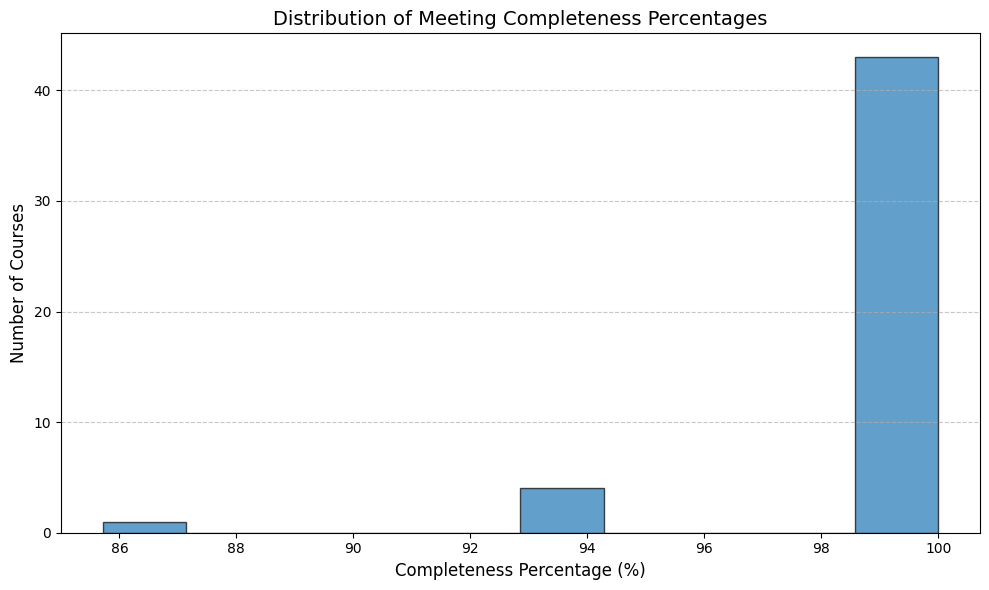

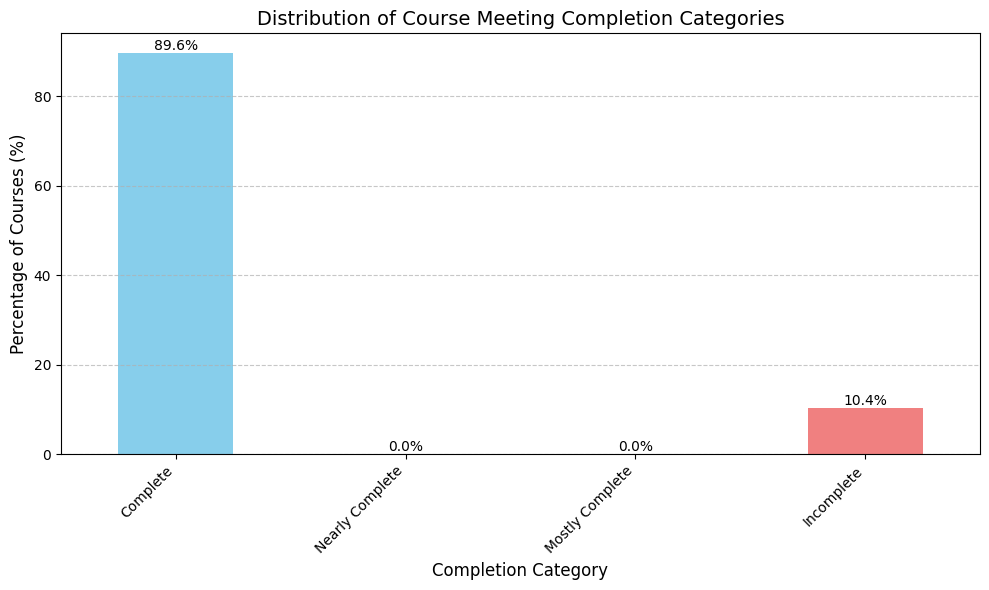

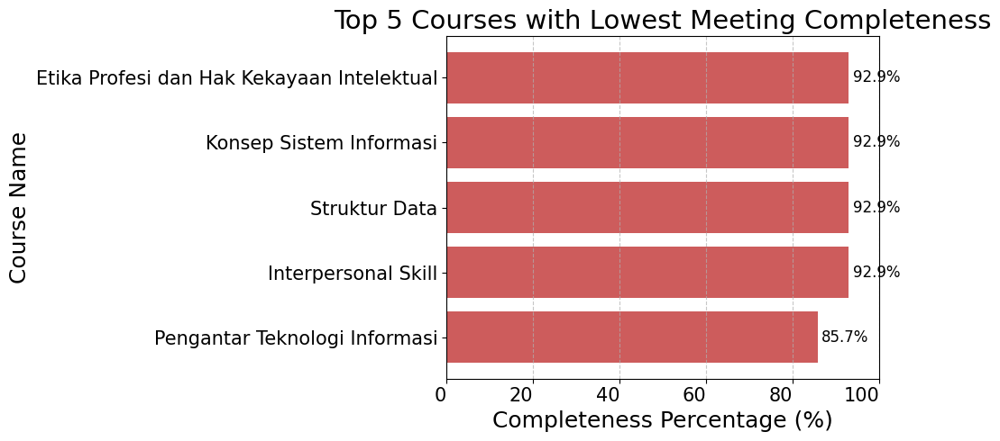

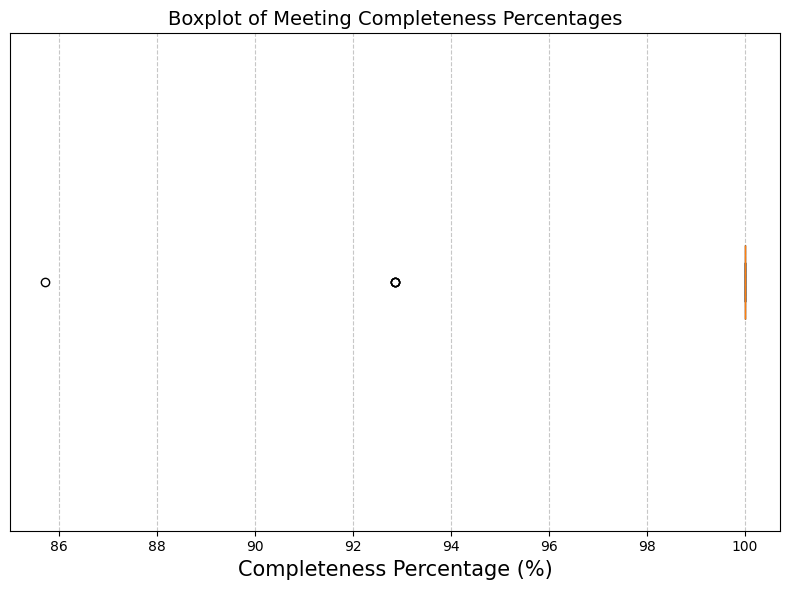

In [ ]:
# 1. Histogram of meeting completeness percentages.
plt.figure(figsize=(10, 6))
plt.hist(meeting_completeness_df['completeness_percentage'], bins=10, edgecolor='black', alpha=0.7)
plt.title('Distribution of Meeting Completeness Percentages', fontsize=14)
plt.xlabel('Completeness Percentage (%)', fontsize=12)
plt.ylabel('Number of Courses', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 2. Bar chart showing the distribution of completion categories.
category_counts = meeting_completeness_df['completion_category'].value_counts(normalize=True).mul(100).reindex(['Complete', 'Nearly Complete', 'Mostly Complete', 'Incomplete'], fill_value=0)

plt.figure(figsize=(10, 6))
ax = category_counts.plot(kind='bar', color=['skyblue', 'lightgreen', 'salmon', 'lightcoral'])
plt.title('Distribution of Course Meeting Completion Categories', fontsize=14)
plt.xlabel('Completion Category', fontsize=12)
plt.ylabel('Percentage of Courses (%)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points', fontsize=10)

plt.tight_layout()
plt.show()

# 3. Horizontal bar chart of the 10 courses with the lowest completeness percentages.
lowest_completeness_courses = meeting_completeness_df.sort_values(by='completeness_percentage', ascending=True).head(5)

plt.figure(figsize=(10, 5))
plt.barh(lowest_completeness_courses['course_name'], lowest_completeness_courses['completeness_percentage'], color='indianred')
plt.xlabel('Completeness Percentage (%)', fontsize=18)
plt.ylabel('Course Name', fontsize=18)
plt.title('Top 5 Courses with Lowest Meeting Completeness', fontsize=21)
plt.xlim(0, 100) # Ensure x-axis goes up to 100%
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.xticks(rotation=0, ha='right', fontsize=15)
plt.yticks(fontsize=15)

for index, value in enumerate(lowest_completeness_courses['completeness_percentage']):
    plt.text(value + 1, index, f'{value:.1f}%', va='center', fontsize=12) # Add percentage annotations

plt.tight_layout()
plt.show()

# 4. Boxplot of completeness percentages.
plt.figure(figsize=(8, 6))
plt.boxplot(meeting_completeness_df['completeness_percentage'], vert=False, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title('Boxplot of Meeting Completeness Percentages', fontsize=14)
plt.xlabel('Completeness Percentage (%)', fontsize=15)
plt.yticks([]) # Hide y-axis ticks for single boxplot
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### KESESUAIAN TOPIK DENGAN RPS

In [ ]:
!pip install adjustText

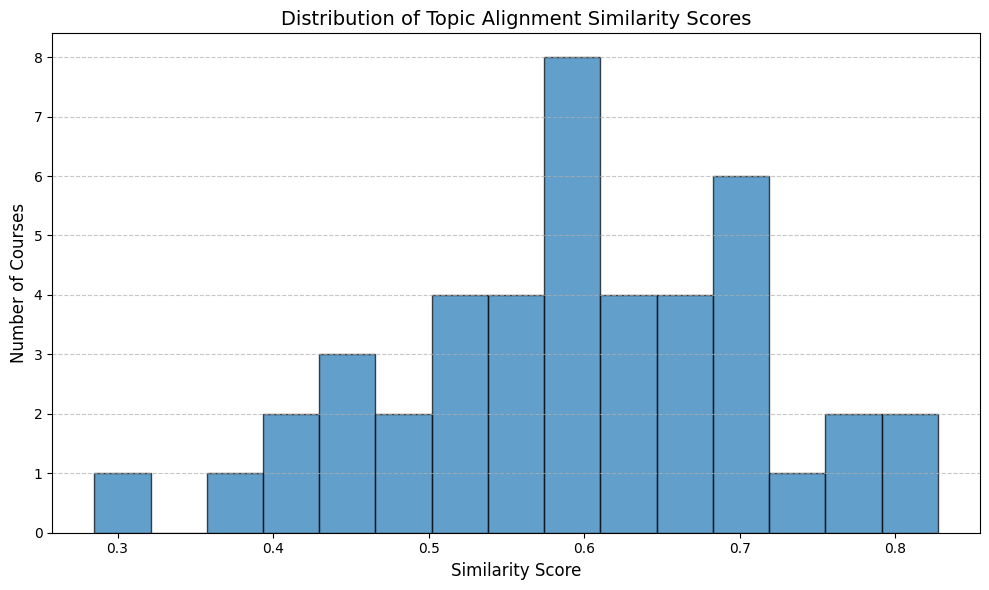

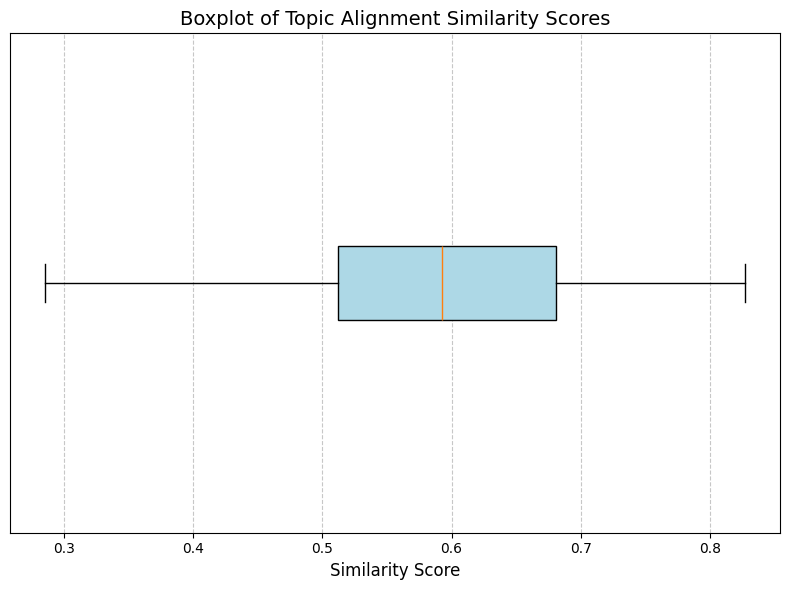

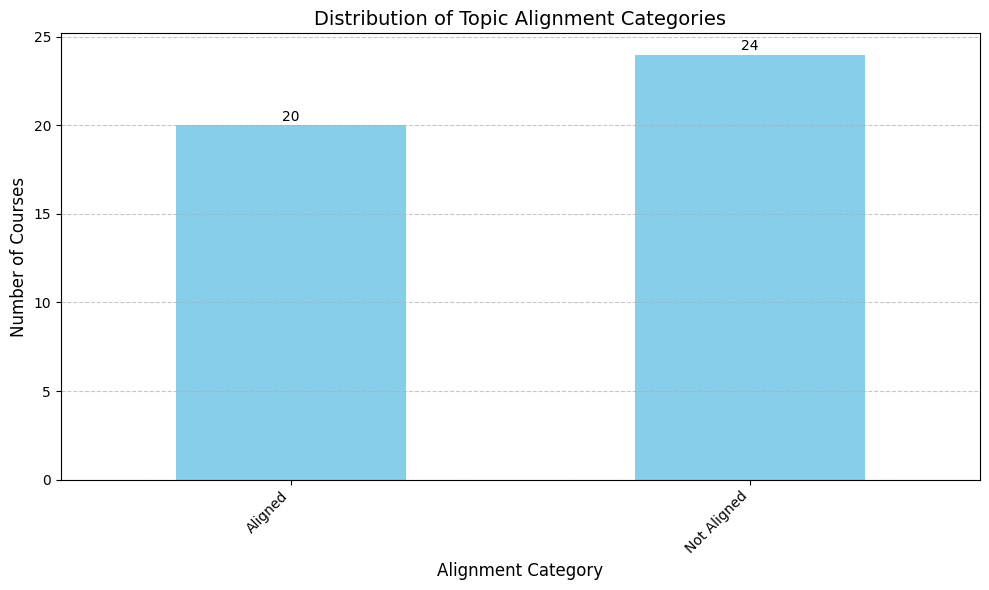

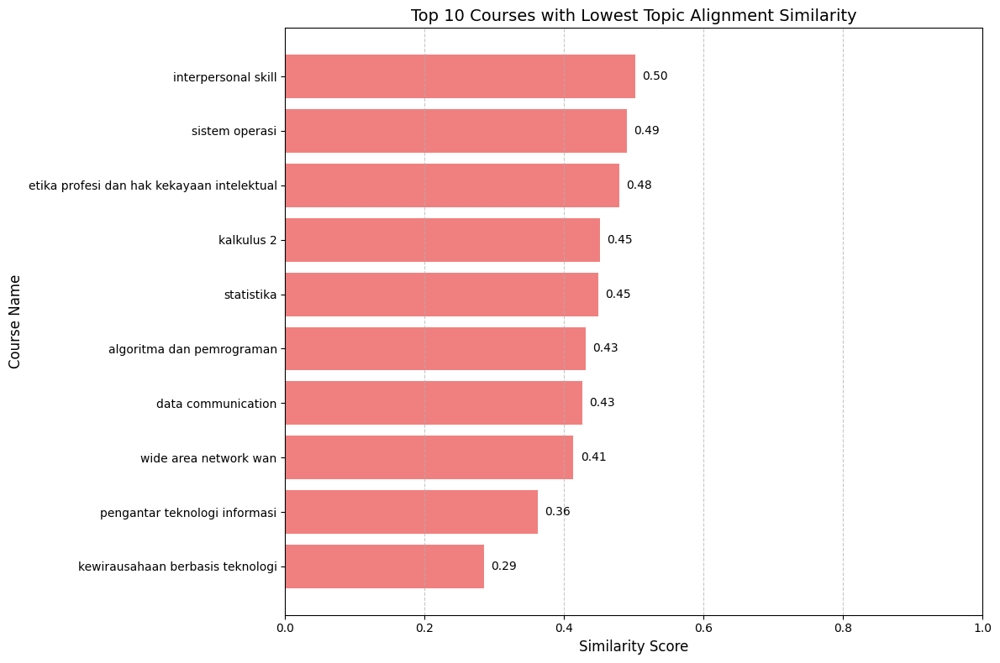

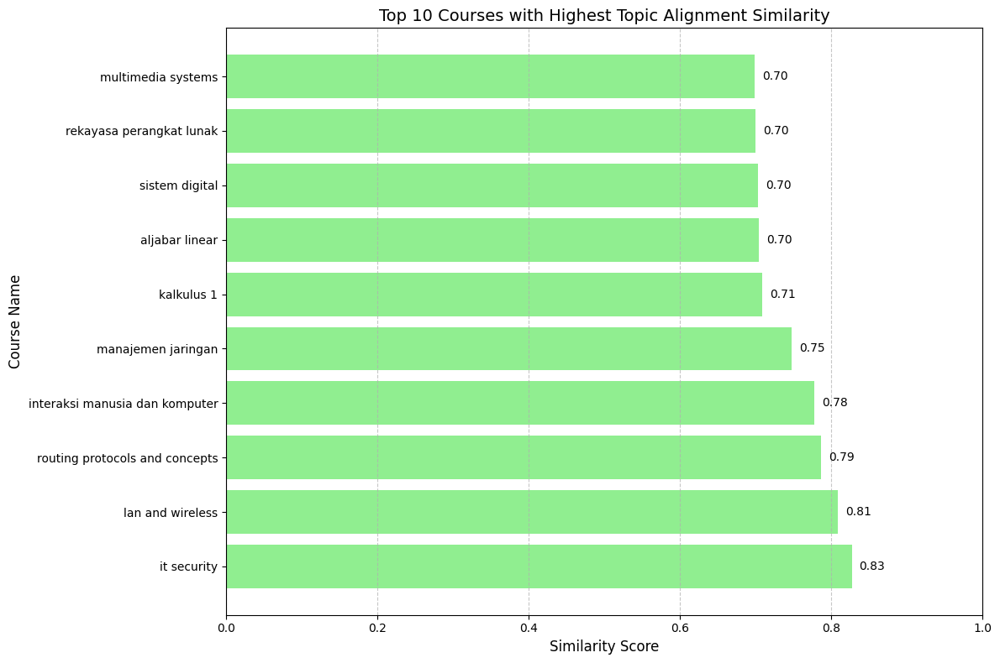

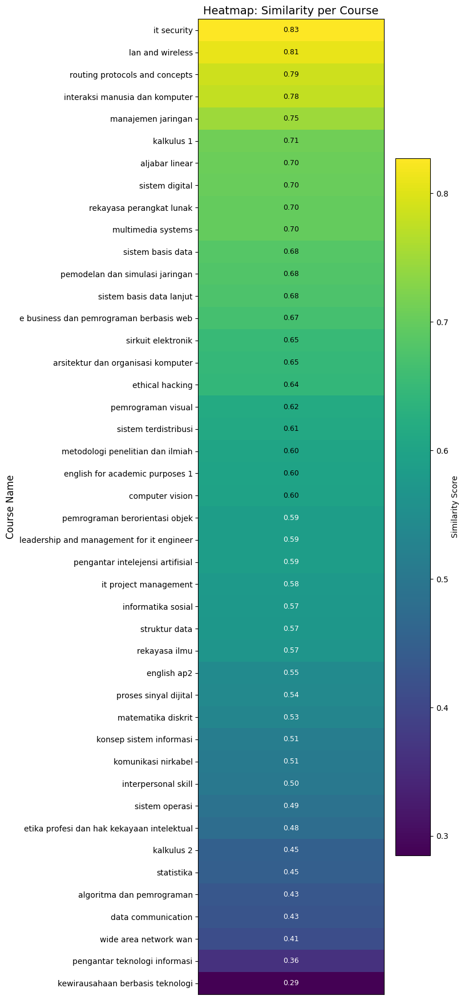

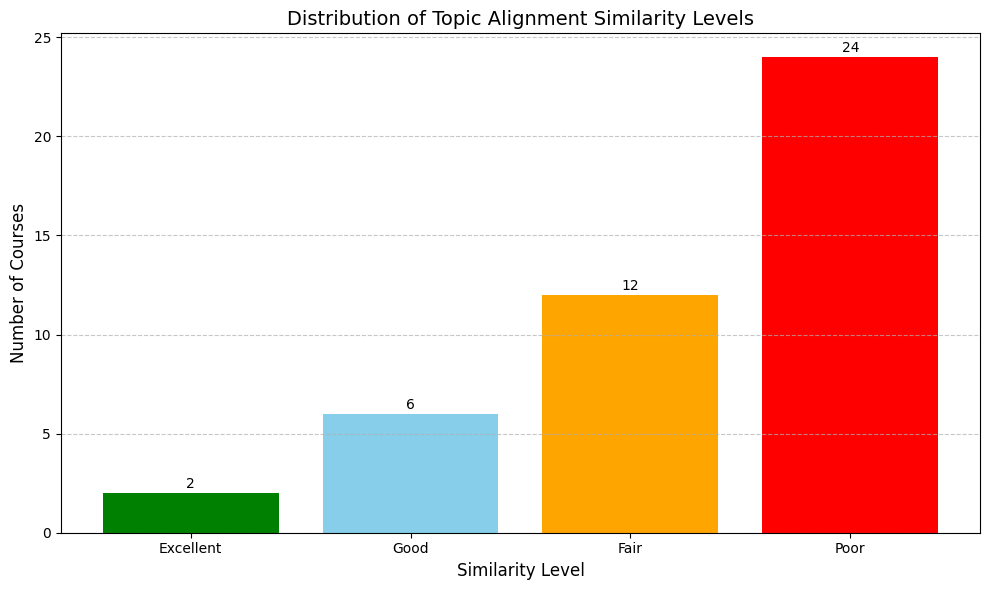

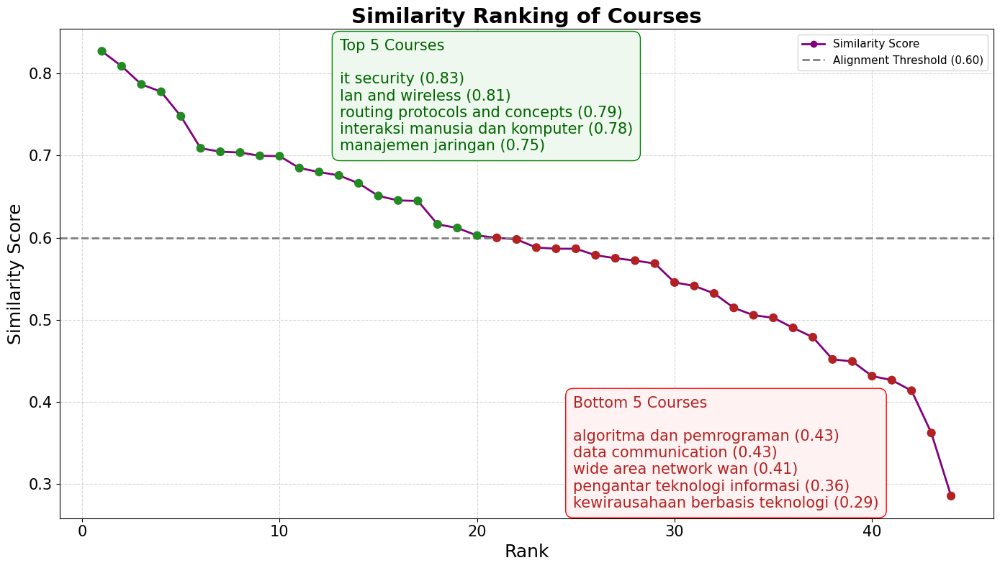

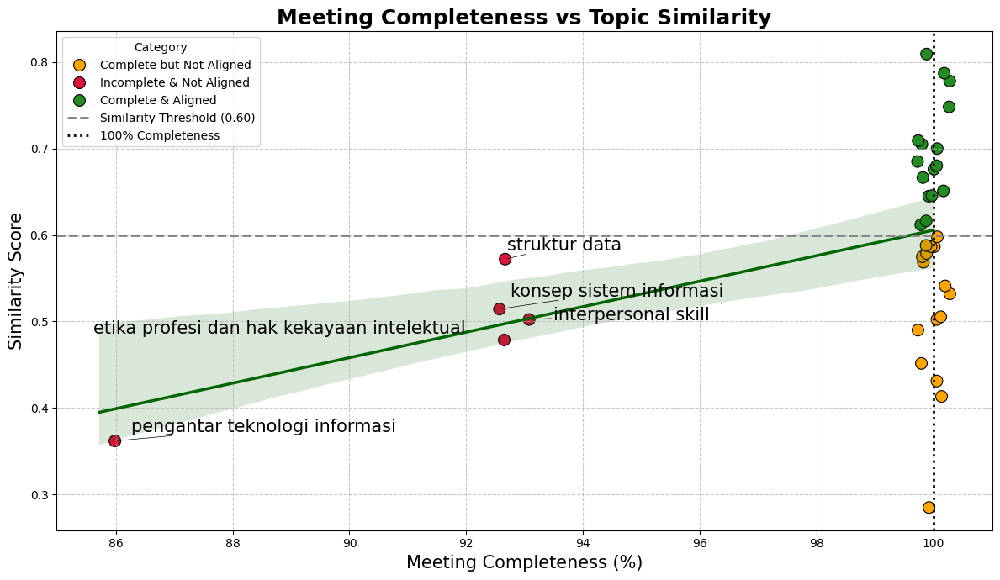

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from adjustText import adjust_text

# 1. Histogram of similarity scores.
plt.figure(figsize=(10, 6))
plt.hist(course_topic_alignment_df['similarity'], bins=15, edgecolor='black', alpha=0.7)
plt.title('Distribution of Topic Alignment Similarity Scores', fontsize=14)
plt.xlabel('Similarity Score', fontsize=12)
plt.ylabel('Number of Courses', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 2. Boxplot of similarity scores.
plt.figure(figsize=(8, 6))
plt.boxplot(course_topic_alignment_df['similarity'], vert=False, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title('Boxplot of Topic Alignment Similarity Scores', fontsize=14)
plt.xlabel('Similarity Score', fontsize=12)
plt.yticks([])
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 3. Bar chart showing the distribution of alignment categories.
alignment_counts_plot = course_topic_alignment_df['alignment_category'].value_counts().reindex(
    ['Aligned', 'Not Aligned'], fill_value=0
)

plt.figure(figsize=(10, 6))
alignment_counts_plot.plot(kind='bar', color='skyblue')
plt.title('Distribution of Topic Alignment Categories', fontsize=14)
plt.xlabel('Alignment Category', fontsize=12)
plt.ylabel('Number of Courses', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Add value annotations
for index, value in enumerate(alignment_counts_plot):
    plt.text(index, value + 0.1, str(value), ha='center', va='bottom', fontsize=10)
plt.tight_layout()
plt.show()

# 4. Horizontal bar chart of the 10 courses with the lowest similarity scores.
lowest_similarity_courses = course_topic_alignment_df.sort_values(by='similarity', ascending=True).head(10)

plt.figure(figsize=(12, 8))
plt.barh(lowest_similarity_courses['course_name_clean'], lowest_similarity_courses['similarity'], color='lightcoral')
plt.xlabel('Similarity Score', fontsize=12)
plt.ylabel('Course Name', fontsize=12)
plt.title('Top 10 Courses with Lowest Topic Alignment Similarity', fontsize=14)
plt.xlim(0, 1) # Similarity range is 0-1
plt.grid(axis='x', linestyle='--', alpha=0.7)
# Add value annotations
for index, value in enumerate(lowest_similarity_courses['similarity']):
    plt.text(value + 0.01, index, f'{value:.2f}', va='center', fontsize=10)
plt.tight_layout()
plt.show()

# 5. Horizontal bar chart of the 10 courses with the highest similarity scores.
highest_similarity_courses = course_topic_alignment_df.sort_values(by='similarity', ascending=False).head(10)

plt.figure(figsize=(12, 8))
plt.barh(highest_similarity_courses['course_name_clean'], highest_similarity_courses['similarity'], color='lightgreen')
plt.xlabel('Similarity Score', fontsize=12)
plt.ylabel('Course Name', fontsize=12)
plt.title('Top 10 Courses with Highest Topic Alignment Similarity', fontsize=14)
plt.xlim(0, 1)
plt.grid(axis='x', linestyle='--', alpha=0.7)
# Add value annotations
for index, value in enumerate(highest_similarity_courses['similarity']):
    plt.text(value + 0.01, index, f'{value:.2f}', va='center', fontsize=10)
plt.tight_layout()
plt.show()


# --- NEW VISUALIZATIONS ---

# 1. Heatmap Similarity per Mata Kuliah
# Sort data by similarity for the heatmap visualization
heatmap_df = course_topic_alignment_df.sort_values(by='similarity', ascending=False).reset_index(drop=True)

plt.figure(figsize=(8, max(6, len(heatmap_df) * 0.4))) # Dynamic height based on number of courses
plt.imshow(heatmap_df[['similarity']], cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Similarity Score')
plt.yticks(range(len(heatmap_df)), heatmap_df['course_name_clean'], fontsize=10) # Set Y-ticks to course names
plt.xticks([]) # Hide X-ticks as it's a single column
plt.title('Heatmap: Similarity per Course', fontsize=14)
plt.ylabel('Course Name', fontsize=12)

# Add annotations (similarity values) to each cell
for i, value in enumerate(heatmap_df['similarity']):
    plt.text(0, i, f'{value:.2f}', ha='center', va='center', color='white' if value < heatmap_df['similarity'].mean() else 'black', fontsize=9) # Color text based on background for contrast

plt.tight_layout()
plt.show()


# 2. Distribution of Similarity Levels
def categorize_similarity(similarity_score):
    if similarity_score >= 0.80:
        return 'Excellent'
    elif 0.70 <= similarity_score < 0.80:
        return 'Good'
    elif 0.60 <= similarity_score < 0.70:
        return 'Fair'
    else:
        return 'Poor'

course_topic_alignment_df['similarity_level'] = course_topic_alignment_df['similarity'].apply(categorize_similarity)

similarity_level_counts = course_topic_alignment_df['similarity_level'].value_counts().reindex(['Excellent', 'Good', 'Fair', 'Poor'])

plt.figure(figsize=(10, 6))
# Use plt.bar to create the bar chart
plt.bar(similarity_level_counts.index, similarity_level_counts.values, color=['green', 'skyblue', 'orange', 'red'])
plt.title('Distribution of Topic Alignment Similarity Levels', fontsize=14)
plt.xlabel('Similarity Level', fontsize=12)
plt.ylabel('Number of Courses', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add counts on top of each bar
for index, value in enumerate(similarity_level_counts.values):
    plt.text(index, value + 0.1, str(value), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


# 3. Similarity Ranking Plot
import matplotlib.pyplot as plt

# ==========================================================
# SIMILARITY RANKING OF COURSES
# ==========================================================

ranked_df = (
    course_topic_alignment_df
    .sort_values(by="similarity", ascending=False)
    .reset_index(drop=True)
)

ranked_df["rank"] = ranked_df.index + 1

THRESHOLD = 0.60

plt.figure(figsize=(14,8))

# ----------------------------------------------------------
# Line + Scatter
# ----------------------------------------------------------

plt.plot(
    ranked_df["rank"],
    ranked_df["similarity"],
    color="purple",
    linewidth=2,
    marker="o",
    markersize=6,
    label="Similarity Score"
)

# Warna titik berdasarkan threshold
colors = [
    "forestgreen" if s >= THRESHOLD else "firebrick"
    for s in ranked_df["similarity"]
]

plt.scatter(
    ranked_df["rank"],
    ranked_df["similarity"],
    c=colors,
    s=60,
    zorder=5
)

# ----------------------------------------------------------
# Threshold Line
# ----------------------------------------------------------

plt.axhline(
    y=THRESHOLD,
    color="gray",
    linestyle="--",
    linewidth=2,
    label=f"Alignment Threshold ({THRESHOLD:.2f})"
)

top5 = ranked_df.head(5)
bottom5 = ranked_df.tail(5)

top_text = "Top 5 Courses\n\n" + "\n".join(
    f"{row.course_name_clean} ({row.similarity:.2f})"
    for _, row in top5.iterrows()
)

bottom_text = "Bottom 5 Courses\n\n" + "\n".join(
    f"{row.course_name_clean} ({row.similarity:.2f})"
    for _, row in bottom5.iterrows()
)

ax = plt.gca()

# Top box (kanan atas)
ax.text(
    0.30, 0.98,
    top_text,
    transform=ax.transAxes,
    fontsize=15,
    color="darkgreen",
    va="top",
    bbox=dict(
        boxstyle="round,pad=0.5",
        facecolor="#eef8ee",
        edgecolor="green"
    )
)

# Bottom box (kiri bawah)
ax.text(
    0.55, 0.25,
    bottom_text,
    transform=ax.transAxes,
    fontsize=15,
    color="firebrick",
    va="top",
    bbox=dict(
        boxstyle="round,pad=0.5",
        facecolor="#fff2f2",
        edgecolor="red"
    )
)

# ----------------------------------------------------------
# Formatting
# ----------------------------------------------------------

plt.title(
    "Similarity Ranking of Courses",
    fontsize=21,
    fontweight="bold"
)

plt.xlabel(
    "Rank",
    fontsize=18
)

plt.ylabel(
    "Similarity Score",
    fontsize=18
)

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.grid(
    linestyle="--",
    alpha=0.5
)

plt.legend(fontsize=11)

plt.tight_layout()
plt.show()


# 4. Combined Scatter plot: RPS and BAP Meeting Completeness vs Similarity
# Merge course_topic_alignment_df with meeting_completeness_df to get completeness_percentage
# Ensure column names for merging are consistent
meeting_completeness_df['course_name_clean'] = (
    meeting_completeness_df['course_name']
    .apply(normalize_course_name)
)

merged_for_scatter = pd.merge(
    course_topic_alignment_df,
    meeting_completeness_df[
        ['course_name_clean', 'completeness_percentage']
    ],
    on='course_name_clean',
    how='inner'
)

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plot_df = merged_for_scatter.copy()

# Supaya titik tidak bertumpuk
np.random.seed(42)
plot_df["completeness_jitter"] = (
    plot_df["completeness_percentage"]
    + np.random.uniform(-0.3, 0.3, len(plot_df))
)

# ====================================================
# Tentukan kategori
# ====================================================

def categorize(row):

    if row["similarity"] >= 0.60 and row["completeness_percentage"] == 100:
        return "Complete & Aligned"

    elif row["similarity"] >= 0.60:
        return "Incomplete but Aligned"

    elif row["completeness_percentage"] == 100:
        return "Complete but Not Aligned"

    else:
        return "Incomplete & Not Aligned"

plot_df["Category"] = plot_df.apply(categorize, axis=1)

palette = {
    "Complete & Aligned": "forestgreen",
    "Complete but Not Aligned": "orange",
    "Incomplete but Aligned": "royalblue",
    "Incomplete & Not Aligned": "crimson"
}

plt.figure(figsize=(12,7))

sns.scatterplot(
    data=plot_df,
    x="completeness_jitter",
    y="similarity",
    hue="Category",
    palette=palette,
    s=100,
    edgecolor="black"
)

sns.regplot(
    data=merged_for_scatter,
    x="completeness_percentage",
    y="similarity",
    scatter=False,
    color="darkgreen",
    line_kws={
        "linewidth":2.5,
        "label":"Regression Line"
    }
)

# Garis threshold similarity
plt.axhline(
    0.60,
    color="gray",
    linestyle="--",
    linewidth=2,
    label="Similarity Threshold (0.60)"
)

# Garis completeness
plt.axvline(
    100,
    color="black",
    linestyle=":",
    linewidth=2,
    label="100% Completeness"
)

plt.title(
    "Meeting Completeness vs Topic Similarity",
    fontsize=18,
    fontweight="bold"
)

plt.xlabel("Meeting Completeness (%)", fontsize=15)
plt.ylabel("Similarity Score", fontsize=15)

plt.legend(title="Category")

plt.grid(True, linestyle='--', alpha=0.7)

# Add course names for 'Incomplete & Not Aligned' category
texts = []
incomplete_not_aligned_courses = plot_df[plot_df['Category'] == 'Incomplete & Not Aligned']
for idx, row in incomplete_not_aligned_courses.iterrows():
    texts.append(plt.text(row['completeness_jitter'], row['similarity'], row['course_name_clean'], fontsize=15, ha='center', va='bottom', color='black'))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black', lw=0.5))

plt.tight_layout()
plt.show()

## SUMMARIZE

In [ ]:
print(meeting_completeness_df.columns.tolist())
display(meeting_completeness_df.head())
print(course_topic_alignment_df.columns.tolist())
display(course_topic_alignment_df.head())

['academic_year', 'course_name', 'meetings_conducted', 'expected_meetings', 'missing_meetings', 'completeness_percentage', 'completion_category', 'course_name_clean']


,academic_year,course_name,meetings_conducted,expected_meetings,missing_meetings,completeness_percentage,completion_category,course_name_clean
0,20241,Pengantar Teknologi Informasi,12,14,[],85.714286,Incomplete,pengantar teknologi informasi
1,20241,Interpersonal Skill,13,14,[],92.857143,Incomplete,interpersonal skill
2,20241,Advanced Ethical Hacking,14,14,[],100.000000,Complete,advanced ethical hacking
3,20241,Algoritma dan Pemrograman,14,14,[],100.000000,Complete,algoritma dan pemrograman
4,20241,Aljabar Linear,14,14,[],100.000000,Complete,aljabar linear


['course_name_clean', 'rps_document', 'bap_document', 'similarity', 'alignment_category', 'similarity_level']


,course_name_clean,rps_document,bap_document,similarity,alignment_category,similarity_level
29,kewirausahaan berbasis teknologi,this section should show the targeted competen...,iv is investment and strategic advantage infor...,0.285097,Not Aligned,Poor
3,pengantar teknologi informasi,this section should show topic sub topic speci...,chapter pearson chapter pengantar teknologi in...,0.361961,Not Aligned,Poor
34,wide area network wan,session topic sub topic method reference assig...,singlearea ospfv concept ccna version module e...,0.413436,Not Aligned,Poor
13,data communication,this section should show the targeted competen...,introduction and network model behrouz forouza...,0.426332,Not Aligned,Poor
5,algoritma dan pemrograman,this section should show the targeted competen...,introduction gaddi introduction to hardware an...,0.431236,Not Aligned,Poor


### KELENGKAPAN PELAKSANAAN PERTEMUAN

In [ ]:
# ==========================================================
# SUMMARY
# EVALUASI KELENGKAPAN PELAKSANAAN PERTEMUAN
# ==========================================================

import pandas as pd

print("="*100)
print("SUMMARY : EVALUASI KELENGKAPAN PELAKSANAAN PERTEMUAN")
print("="*100)

df = meeting_completeness_df.copy()

# ==========================================================
# STATISTICS
# ==========================================================

statistics = pd.DataFrame({

    "Metric":[

        "Jumlah Mata Kuliah",

        "Rata-rata Kelengkapan Pertemuan (%)",

        "Median Kelengkapan Pertemuan (%)",

        "Minimum Kelengkapan (%)",

        "Maximum Kelengkapan (%)"

    ],

    "Value":[

        len(df),

        round(df["completeness_percentage"].mean(),2),

        round(df["completeness_percentage"].median(),2),

        round(df["completeness_percentage"].min(),2),

        round(df["completeness_percentage"].max(),2)

    ]

})

# ==========================================================
# COMPLETION DISTRIBUTION
# ==========================================================

completion_distribution = (

    df["completion_category"]

    .value_counts()

    .reset_index()

)

completion_distribution.columns=[

    "Completion Category",

    "Jumlah Mata Kuliah"

]

completion_distribution["Persentase (%)"]=(

    completion_distribution["Jumlah Mata Kuliah"]

    /len(df)

    *100

).round(2)

# ==========================================================
# TOP 5
# ==========================================================

top5 = (

    df

    .sort_values(

        "completeness_percentage",

        ascending=False

    )

    [[

        "course_name",

        "meetings_conducted",

        "expected_meetings",

        "completeness_percentage",

        "completion_category"

    ]]

    .head(5)

)

# ==========================================================
# BOTTOM 5
# ==========================================================

bottom5 = (

    df

    .sort_values(

        "completeness_percentage"

    )

    [[

        "course_name",

        "meetings_conducted",

        "expected_meetings",

        "completeness_percentage",

        "completion_category"

    ]]

    .head(5)

)

# ==========================================================
# INSIGHT
# ==========================================================

avg_complete = df["completeness_percentage"].mean()

complete_course = (

    df["completion_category"]

    .eq("Complete")

    .sum()

)

incomplete_course = len(df)-complete_course

insight=[]

insight.append(

    f"Rata-rata kelengkapan pelaksanaan pertemuan mencapai {avg_complete:.2f}%."

)

insight.append(

    f"Terdapat {complete_course} mata kuliah yang telah melaksanakan seluruh pertemuan sesuai ketentuan."

)

if incomplete_course>0:

    insight.append(

        f"Sebanyak {incomplete_course} mata kuliah belum melaksanakan seluruh pertemuan sehingga perlu dilakukan evaluasi terhadap pelaksanaan perkuliahan."

    )

else:

    insight.append(

        "Seluruh mata kuliah telah melaksanakan seluruh pertemuan sesuai ketentuan."

    )

best = top5.iloc[0]

insight.append(

    f"Mata kuliah dengan tingkat kelengkapan tertinggi adalah '{best['course_name']}' ({best['completeness_percentage']:.2f}%)."

)

worst = bottom5.iloc[0]

insight.append(

    f"Mata kuliah dengan tingkat kelengkapan terendah adalah '{worst['course_name']}' ({worst['completeness_percentage']:.2f}%)."

)

# ==========================================================
# SUMMARY
# ==========================================================

summary_meeting_completeness={

    "statistics":statistics,

    "completion_distribution":completion_distribution,

    "top5":top5,

    "bottom5":bottom5,

    "insight":insight

}

# ==========================================================
# DISPLAY
# ==========================================================

print("\nSTATISTICS")

display(statistics)

print("\nCOMPLETION DISTRIBUTION")

display(completion_distribution)

print("\nTOP 5 MATA KULIAH")

display(top5)

print("\nBOTTOM 5 MATA KULIAH")

display(bottom5)

print("\nINSIGHT")

for i,item in enumerate(insight,1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")

print("summary_meeting_completeness")

SUMMARY : EVALUASI KELENGKAPAN PELAKSANAAN PERTEMUAN

STATISTICS


,Metric,Value
0,Jumlah Mata Kuliah,48.00
1,Rata-rata Kelengkapan Pertemuan (%),99.11
2,Median Kelengkapan Pertemuan (%),100.00
3,Minimum Kelengkapan (%),85.71
4,Maximum Kelengkapan (%),100.00



COMPLETION DISTRIBUTION


,Completion Category,Jumlah Mata Kuliah,Persentase (%)
0,Complete,43,89.58
1,Incomplete,5,10.42



TOP 5 MATA KULIAH


,course_name,meetings_conducted,expected_meetings,completeness_percentage,completion_category
3,Algoritma dan Pemrograman,14,14,100.0,Complete
2,Advanced Ethical Hacking,14,14,100.0,Complete
5,Analisis Perancangan Sistem Informasi,14,14,100.0,Complete
4,Aljabar Linear,14,14,100.0,Complete
6,Bahasa Inggris 1,14,14,100.0,Complete



BOTTOM 5 MATA KULIAH


,course_name,meetings_conducted,expected_meetings,completeness_percentage,completion_category
0,Pengantar Teknologi Informasi,12,14,85.714286,Incomplete
1,Interpersonal Skill,13,14,92.857143,Incomplete
29,Struktur Data,13,14,92.857143,Incomplete
28,Konsep Sistem Informasi,13,14,92.857143,Incomplete
27,Etika Profesi dan Hak Kekayaan Intelektual,13,14,92.857143,Incomplete



INSIGHT
1. Rata-rata kelengkapan pelaksanaan pertemuan mencapai 99.11%.
2. Terdapat 43 mata kuliah yang telah melaksanakan seluruh pertemuan sesuai ketentuan.
3. Sebanyak 5 mata kuliah belum melaksanakan seluruh pertemuan sehingga perlu dilakukan evaluasi terhadap pelaksanaan perkuliahan.
4. Mata kuliah dengan tingkat kelengkapan tertinggi adalah 'Algoritma dan Pemrograman' (100.00%).
5. Mata kuliah dengan tingkat kelengkapan terendah adalah 'Pengantar Teknologi Informasi' (85.71%).

Summary berhasil disimpan pada variabel:
summary_meeting_completeness


### KESESUAIAN TOPIK DENGAN RPS

In [ ]:
# ==========================================================
# SUMMARY
# EVALUASI KESESUAIAN TOPIK PEMBELAJARAN DENGAN RPS
# ==========================================================

import pandas as pd

print("="*100)
print("SUMMARY : EVALUASI KESESUAIAN TOPIK PEMBELAJARAN DENGAN RPS")
print("="*100)

df = course_topic_alignment_df.copy()

# ==========================================================
# STATISTICS
# ==========================================================

statistics = pd.DataFrame({

    "Metric":[

        "Jumlah Mata Kuliah",

        "Average Similarity",

        "Median Similarity",

        "Minimum Similarity",

        "Maximum Similarity"

    ],

    "Value":[

        len(df),

        round(df["similarity"].mean(),4),

        round(df["similarity"].median(),4),

        round(df["similarity"].min(),4),

        round(df["similarity"].max(),4)

    ]

})

# ==========================================================
# ALIGNMENT DISTRIBUTION
# ==========================================================

alignment_distribution = (

    df["alignment_category"]

    .value_counts()

    .reset_index()

)

alignment_distribution.columns=[

    "Alignment",

    "Jumlah Mata Kuliah"

]

alignment_distribution["Persentase (%)"]=(

    alignment_distribution["Jumlah Mata Kuliah"]

    /len(df)

    *100

).round(2)

# ==========================================================
# SIMILARITY LEVEL DISTRIBUTION
# ==========================================================

similarity_distribution = (

    df["similarity_level"]

    .value_counts()

    .reset_index()

)

similarity_distribution.columns=[

    "Similarity Level",

    "Jumlah Mata Kuliah"

]

similarity_distribution["Persentase (%)"]=(

    similarity_distribution["Jumlah Mata Kuliah"]

    /len(df)

    *100

).round(2)

# ==========================================================
# TOP 5
# ==========================================================

top5 = (

    df

    .sort_values(

        "similarity",

        ascending=False

    )

    [[

        "course_name_clean",

        "similarity",

        "alignment_category",

        "similarity_level"

    ]]

    .head(5)

)

# ==========================================================
# BOTTOM 5
# ==========================================================

bottom5 = (

    df

    .sort_values(

        "similarity"

    )

    [[

        "course_name_clean",

        "similarity",

        "alignment_category",

        "similarity_level"

    ]]

    .head(5)

)

# ==========================================================
# INSIGHT
# ==========================================================

avg_similarity = df["similarity"].mean()

insight = []

# ----------------------------------------------------------
# Kondisi berdasarkan Average Similarity
# ----------------------------------------------------------

if avg_similarity >= 0.80:

    insight.append(

        f"Rata-rata semantic similarity antara topik pembelajaran dan RPS sebesar {avg_similarity:.4f}, yang menunjukkan tingkat kesesuaian yang sangat baik."

    )

elif avg_similarity >= 0.60:

    insight.append(

        f"Rata-rata semantic similarity antara topik pembelajaran dan RPS sebesar {avg_similarity:.4f}, yang menunjukkan bahwa topik pembelajaran telah selaras dengan RPS, meskipun masih terdapat beberapa mata kuliah yang memerlukan penyempurnaan."

    )

else:

    insight.append(

        f"Rata-rata semantic similarity antara topik pembelajaran dan RPS sebesar {avg_similarity:.4f}, yang menunjukkan bahwa kesesuaian topik pembelajaran dengan RPS masih rendah sehingga diperlukan evaluasi terhadap implementasi materi pembelajaran."

    )

# ----------------------------------------------------------
# Top Course
# ----------------------------------------------------------

best = top5.iloc[0]

insight.append(

    f"Mata kuliah dengan tingkat kesesuaian tertinggi adalah '{best['course_name_clean']}' dengan semantic similarity sebesar {best['similarity']:.4f}."

)

# ----------------------------------------------------------
# Bottom Course
# ----------------------------------------------------------

worst = bottom5.iloc[0]

insight.append(

    f"Mata kuliah dengan tingkat kesesuaian terendah adalah '{worst['course_name_clean']}' dengan semantic similarity sebesar {worst['similarity']:.4f}, sehingga perlu dilakukan evaluasi terhadap implementasi materi pembelajaran agar lebih sesuai dengan RPS."

)

# ----------------------------------------------------------
# Alignment Distribution (Pendukung)
# ----------------------------------------------------------

aligned = (

    df["alignment_category"]

    .astype(str)

    .str.lower()

    .isin(["aligned","align"])

    .sum()

)

insight.append(

    f"Sebanyak {aligned} dari {len(df)} mata kuliah telah dikategorikan selaras berdasarkan threshold semantic similarity yang digunakan."

)

# ==========================================================
# SUMMARY
# ==========================================================

summary_course_topic_alignment={

    "statistics":statistics,

    "alignment":alignment_distribution,

    "similarity_level":similarity_distribution,

    "top5":top5,

    "bottom5":bottom5,

    "insight":insight

}

# ==========================================================
# DISPLAY
# ==========================================================

print("\nSTATISTICS")

display(statistics)

print("\nALIGNMENT DISTRIBUTION")

display(alignment_distribution)

print("\nSIMILARITY LEVEL DISTRIBUTION")

display(similarity_distribution)

print("\nTOP 5")

display(top5)

print("\nBOTTOM 5")

display(bottom5)

print("\nINSIGHT")

for i,item in enumerate(insight,1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")

print("summary_course_topic_alignment")

SUMMARY : EVALUASI KESESUAIAN TOPIK PEMBELAJARAN DENGAN RPS

STATISTICS


,Metric,Value
0,Jumlah Mata Kuliah,44.0000
1,Average Similarity,0.5938
2,Median Similarity,0.5929
3,Minimum Similarity,0.2851
4,Maximum Similarity,0.8273



ALIGNMENT DISTRIBUTION


,Alignment,Jumlah Mata Kuliah,Persentase (%)
0,Not Aligned,24,54.55
1,Aligned,20,45.45



SIMILARITY LEVEL DISTRIBUTION


,Similarity Level,Jumlah Mata Kuliah,Persentase (%)
0,Poor,24,54.55
1,Fair,12,27.27
2,Good,6,13.64
3,Excellent,2,4.55



TOP 5


,course_name_clean,similarity,alignment_category,similarity_level
31,it security,0.827278,Aligned,Excellent
18,lan and wireless,0.809040,Aligned,Excellent
30,routing protocols and concepts,0.786915,Aligned,Good
41,interaksi manusia dan komputer,0.777895,Aligned,Good
37,manajemen jaringan,0.748013,Aligned,Good



BOTTOM 5


,course_name_clean,similarity,alignment_category,similarity_level
29,kewirausahaan berbasis teknologi,0.285097,Not Aligned,Poor
3,pengantar teknologi informasi,0.361961,Not Aligned,Poor
34,wide area network wan,0.413436,Not Aligned,Poor
13,data communication,0.426332,Not Aligned,Poor
5,algoritma dan pemrograman,0.431236,Not Aligned,Poor



INSIGHT
1. Rata-rata semantic similarity antara topik pembelajaran dan RPS sebesar 0.5938, yang menunjukkan bahwa kesesuaian topik pembelajaran dengan RPS masih rendah sehingga diperlukan evaluasi terhadap implementasi materi pembelajaran.
2. Mata kuliah dengan tingkat kesesuaian tertinggi adalah 'it security' dengan semantic similarity sebesar 0.8273.
3. Mata kuliah dengan tingkat kesesuaian terendah adalah 'kewirausahaan berbasis teknologi' dengan semantic similarity sebesar 0.2851, sehingga perlu dilakukan evaluasi terhadap implementasi materi pembelajaran agar lebih sesuai dengan RPS.
4. Sebanyak 20 dari 44 mata kuliah telah dikategorikan selaras berdasarkan threshold semantic similarity yang digunakan.

Summary berhasil disimpan pada variabel:
summary_course_topic_alignment


### SUMMARY AKHIR

In [ ]:
# ==========================================================
# SUMMARY AKHIR
# PELAKSANAAN PEMBELAJARAN
# ==========================================================

import pandas as pd

print("="*100)
print("SUMMARY AKHIR : EVALUASI PELAKSANAAN PEMBELAJARAN")
print("="*100)

# ==========================================================
# Helper
# ==========================================================

def get_completion_condition(score):

    if score == 100:
        return "Lengkap"
    else:
        return "Belum Lengkap"


def get_similarity_condition(score):

    if score >= 0.80:
        return "Sangat Baik"

    elif score >= 0.60:
        return "Baik"

    else:
        return "Perlu Perbaikan"

# ==========================================================
# Skor Kelengkapan Pertemuan
# ==========================================================

meeting_score = float(

    summary_meeting_completeness["statistics"].loc[
        summary_meeting_completeness["statistics"]["Metric"]=="Rata-rata Kelengkapan Pertemuan (%)",
        "Value"
    ].iloc[0]

)

# ==========================================================
# Skor Kesesuaian Topik
# ==========================================================

topic_score = float(

    summary_course_topic_alignment["statistics"].loc[
        summary_course_topic_alignment["statistics"]["Metric"]=="Average Similarity",
        "Value"
    ].iloc[0]

)

# ==========================================================
# Summary Table
# ==========================================================

summary_final_learning = pd.DataFrame({

    "Sub-Aspek":[

        "Kelengkapan Pelaksanaan Pertemuan",

        "Kesesuaian Topik dengan RPS"

    ],

    "Nilai":[

        round(meeting_score,2),

        round(topic_score,4)

    ],

    "Satuan":[

        "%",

        "Similarity"

    ],

    "Kondisi":[

        get_completion_condition(meeting_score),

        get_similarity_condition(topic_score)

    ]

})

# ==========================================================
# Insight
# ==========================================================

overall_insight=[]

overall_insight.append(

    "Evaluasi pelaksanaan pembelajaran dilakukan berdasarkan dua sub-aspek, yaitu kelengkapan pelaksanaan pertemuan dan kesesuaian topik pembelajaran dengan RPS."

)

if meeting_score == 100:

    overall_insight.append(

        "Pelaksanaan kegiatan pembelajaran diklasifikasikan sebagai ‘Lengkap’ karena seluruh 14 pertemuan yang dijadwalkan telah dilaksanakan (100%)."

    )

else:

    overall_insight.append(

        "Pelaksanaan pembelajaran diklasifikasikan sebagai ‘Belum Lengkap’ karena jumlah pertemuan yang dilaksanakan kurang dari 14 kali (<100%)."

    )

if topic_score >= 0.80:

    overall_insight.append(

        "Topik pembelajaran yang disampaikan telah memiliki tingkat kesesuaian yang sangat baik dengan RPS."

    )

elif topic_score >= 0.60:

    overall_insight.append(

        "Topik pembelajaran secara umum telah sesuai dengan RPS, meskipun masih terdapat beberapa mata kuliah yang memerlukan penyempurnaan."

    )

else:

    overall_insight.append(

        "Kesesuaian topik pembelajaran dengan RPS masih rendah sehingga diperlukan evaluasi terhadap implementasi materi pembelajaran."

    )

overall_insight.append(

    "Kelengkapan jumlah pertemuan tidak selalu menjamin kesesuaian materi yang diajarkan dengan RPS. Oleh karena itu, evaluasi pelaksanaan pembelajaran perlu mempertimbangkan baik aspek kuantitas pelaksanaan maupun kualitas kesesuaian topik pembelajaran."

)

# ==========================================================
# Summary Dictionary
# ==========================================================

summary_learning_final = {

    "summary":summary_final_learning,

    "insight":overall_insight

}

# ==========================================================
# DISPLAY
# ==========================================================

print("\nRINGKASAN EVALUASI")

display(summary_final_learning)

print("\n"+"="*100)

print("INSIGHT")

print("="*100)

for i,item in enumerate(overall_insight,1):

    print(f"{i}. {item}")

print("\nSummary berhasil disimpan pada variabel:")

print("summary_learning_final")

SUMMARY AKHIR : EVALUASI PELAKSANAAN PEMBELAJARAN

RINGKASAN EVALUASI


,Sub-Aspek,Nilai,Satuan,Kondisi
0,Kelengkapan Pelaksanaan Pertemuan,99.1100,%,Belum Lengkap
1,Kesesuaian Topik dengan RPS,0.5938,Similarity,Perlu Perbaikan



INSIGHT
1. Evaluasi pelaksanaan pembelajaran dilakukan berdasarkan dua sub-aspek, yaitu kelengkapan pelaksanaan pertemuan dan kesesuaian topik pembelajaran dengan RPS.
2. Pelaksanaan pembelajaran diklasifikasikan sebagai ‘Belum Lengkap’ karena jumlah pertemuan yang dilaksanakan kurang dari 14 kali (<100%).
3. Kesesuaian topik pembelajaran dengan RPS masih rendah sehingga diperlukan evaluasi terhadap implementasi materi pembelajaran.
4. Kelengkapan jumlah pertemuan tidak selalu menjamin kesesuaian materi yang diajarkan dengan RPS. Oleh karena itu, evaluasi pelaksanaan pembelajaran perlu mempertimbangkan baik aspek kuantitas pelaksanaan maupun kualitas kesesuaian topik pembelajaran.

Summary berhasil disimpan pada variabel:
summary_learning_final


## NARASI HASIL ANALISIS

In [ ]:
# ==========================================================
# HELPER FUNCTION - NARASI HASIL ANALISIS
# ==========================================================

from IPython.display import Markdown, display

# ----------------------------------------------------------
# Mengambil nilai statistik
# ----------------------------------------------------------

def get_stat(summary, metric):

    try:
        return summary["statistics"].loc[
            summary["statistics"]["Metric"] == metric,
            "Value"
        ].iloc[0]

    except:
        return None

# ----------------------------------------------------------
# Mengambil insight
# ----------------------------------------------------------

def get_insight(summary):

    try:
        return summary["insight"]

    except:
        return []


# ----------------------------------------------------------
# Menampilkan Section Markdown
# ----------------------------------------------------------

def section(title):

    return f"\n\n## {title}\n\n"


# ----------------------------------------------------------
# Menampilkan paragraf
# ----------------------------------------------------------

def paragraph(text):

    return text + "\n\n"

In [ ]:
# ==========================================================
# GENERATE NARASI HASIL ANALISIS
# PELAKSANAAN PEMBELAJARAN
# ==========================================================

narasi = "# HASIL ANALISIS PELAKSANAAN PEMBELAJARAN\n"

# ==========================================================
# A. Kelengkapan Pelaksanaan Pertemuan
# ==========================================================

avg = summary_meeting_completeness["statistics"].loc[
    summary_meeting_completeness["statistics"]["Metric"]=="Rata-rata Kelengkapan Pertemuan (%)",
    "Value"
].iloc[0]

complete = summary_meeting_completeness["completion_distribution"].loc[
    summary_meeting_completeness["completion_distribution"]["Completion Category"]=="Complete",
    "Persentase (%)"
]

complete = complete.iloc[0] if len(complete)>0 else 0

narasi += section("A. Evaluasi Kelengkapan Pelaksanaan Pertemuan")

narasi += paragraph(

f"""
Evaluasi kelengkapan pelaksanaan pertemuan dilakukan untuk memastikan
bahwa setiap mata kuliah telah melaksanakan kegiatan pembelajaran sesuai
dengan jumlah pertemuan yang ditetapkan dalam kurikulum.

Hasil evaluasi menunjukkan bahwa rata-rata tingkat kelengkapan
pelaksanaan pertemuan mencapai **{avg:.2f}%**. Sebanyak
**{complete:.2f}%** mata kuliah telah melaksanakan seluruh pertemuan
sesuai ketentuan, sedangkan mata kuliah lainnya masih memiliki
pertemuan yang belum terlaksana secara lengkap.
"""

)

# ----------------------------------------------------------
# Kondisi
# ----------------------------------------------------------

if avg == 100:

    narasi += paragraph("""

Kondisi tersebut menunjukkan bahwa pelaksanaan pertemuan berada pada
kategori **lengkap**, sehingga seluruh mata kuliah telah memenuhi jumlah
pertemuan sesuai ketentuan akademik yang ditetapkan. Hal ini
mengindikasikan bahwa proses pembelajaran telah terlaksana secara
konsisten sesuai dengan perencanaan semester.

""")

else:

    narasi += paragraph("""

Kondisi tersebut menunjukkan bahwa pelaksanaan pertemuan masih
**belum sepenuhnya lengkap**, karena masih terdapat mata kuliah yang
belum memenuhi jumlah pertemuan sesuai ketentuan akademik. Oleh karena
itu, diperlukan monitoring dan evaluasi terhadap pelaksanaan
perkuliahan agar seluruh mata kuliah dapat memenuhi standar jumlah
pertemuan yang telah ditetapkan.

""")

# ==========================================================
# B. Kesesuaian Topik dengan RPS
# ==========================================================

avg_similarity = summary_course_topic_alignment["statistics"].loc[
    summary_course_topic_alignment["statistics"]["Metric"]=="Average Similarity",
    "Value"
].iloc[0]

alignment = summary_course_topic_alignment["alignment"]

aligned = alignment[
    alignment["Alignment"]
    .astype(str)
    .str.lower()
    .isin(["aligned","align"])
]

aligned_percentage = (
    aligned["Persentase (%)"].iloc[0]
    if len(aligned)>0
    else 0
)

narasi += section("B. Evaluasi Kesesuaian Topik Pembelajaran dengan RPS")

narasi += paragraph(

f"""
Evaluasi kesesuaian topik pembelajaran dilakukan dengan membandingkan
materi yang tercatat pada Berita Acara Perkuliahan (BAP) terhadap topik
yang telah direncanakan dalam Rencana Pembelajaran Semester (RPS).

Hasil evaluasi menunjukkan rata-rata semantic similarity sebesar
**{avg_similarity:.4f}**.
"""
)

if avg_similarity >= 0.80:

    narasi += paragraph("""

Nilai tersebut menunjukkan bahwa implementasi topik pembelajaran telah
memiliki tingkat kesesuaian yang sangat baik dengan RPS. Hal ini
mengindikasikan bahwa materi yang disampaikan selama proses
pembelajaran telah konsisten dengan perencanaan yang ditetapkan.

""")

elif avg_similarity >= 0.60:

    narasi += paragraph("""

Nilai tersebut menunjukkan bahwa implementasi topik pembelajaran secara
umum telah sesuai dengan RPS, meskipun masih terdapat beberapa mata
kuliah yang memerlukan penyempurnaan agar materi yang diajarkan lebih
konsisten dengan perencanaan pembelajaran.

""")

else:

    narasi += paragraph("""

Nilai tersebut menunjukkan bahwa kesesuaian topik pembelajaran dengan
RPS masih perlu ditingkatkan. Program studi perlu melakukan evaluasi
terhadap implementasi pembelajaran agar materi yang disampaikan tetap
konsisten dengan dokumen RPS.

""")

# ==========================================================
# C. Kesimpulan
# ==========================================================

narasi += section("C. Kesimpulan Evaluasi Pelaksanaan Pembelajaran")

narasi += paragraph(

"""
Evaluasi pelaksanaan pembelajaran dilakukan berdasarkan dua aspek utama,
yaitu kelengkapan pelaksanaan pertemuan dan kesesuaian topik
pembelajaran dengan Rencana Pembelajaran Semester (RPS).
"""

)

if avg == 100:

    narasi += paragraph("""

Dari aspek pelaksanaan pertemuan, seluruh mata kuliah telah memenuhi
jumlah pertemuan yang dipersyaratkan sehingga proses pembelajaran telah
terlaksana secara lengkap sesuai dengan ketentuan akademik.

""")

else:

    narasi += paragraph("""

Dari aspek pelaksanaan pertemuan, masih terdapat beberapa mata kuliah
yang belum melaksanakan seluruh pertemuan sesuai ketentuan sehingga
diperlukan monitoring dan evaluasi terhadap pelaksanaan perkuliahan.

""")

if avg_similarity >= 0.80:

    narasi += paragraph("""

Selain itu, kesesuaian topik pembelajaran terhadap RPS telah berada pada
kategori sangat baik sehingga implementasi pembelajaran telah berjalan
secara konsisten dengan perencanaan yang telah disusun.

""")

elif avg_similarity >= 0.60:

    narasi += paragraph("""

Sementara itu, kesesuaian topik pembelajaran terhadap RPS berada pada
kategori baik. Meskipun demikian, masih terdapat beberapa mata kuliah
yang memerlukan penyempurnaan agar implementasi pembelajaran semakin
selaras dengan RPS.

""")

else:

    narasi += paragraph("""

Sementara itu, kesesuaian topik pembelajaran terhadap RPS masih perlu
ditingkatkan melalui evaluasi terhadap implementasi materi yang
disampaikan selama proses pembelajaran.

""")

narasi += paragraph("""

Dengan demikian, evaluasi pelaksanaan pembelajaran tidak hanya perlu
memastikan bahwa seluruh pertemuan terlaksana sesuai jadwal, tetapi juga
bahwa materi yang diajarkan tetap konsisten dengan RPS. Kedua aspek
tersebut saling melengkapi dalam menjamin kualitas proses pembelajaran
dan pencapaian capaian pembelajaran lulusan.

""")

# ==========================================================
# DISPLAY
# ==========================================================

display(Markdown(narasi))

print("="*100)
print("Narasi berhasil dibuat.")
print("="*100)

# HASIL ANALISIS PELAKSANAAN PEMBELAJARAN


## A. Evaluasi Kelengkapan Pelaksanaan Pertemuan


Evaluasi kelengkapan pelaksanaan pertemuan dilakukan untuk memastikan
bahwa setiap mata kuliah telah melaksanakan kegiatan pembelajaran sesuai
dengan jumlah pertemuan yang ditetapkan dalam kurikulum.

Hasil evaluasi menunjukkan bahwa rata-rata tingkat kelengkapan
pelaksanaan pertemuan mencapai **99.11%**. Sebanyak
**89.58%** mata kuliah telah melaksanakan seluruh pertemuan
sesuai ketentuan, sedangkan mata kuliah lainnya masih memiliki
pertemuan yang belum terlaksana secara lengkap.




Kondisi tersebut menunjukkan bahwa pelaksanaan pertemuan masih
**belum sepenuhnya lengkap**, karena masih terdapat mata kuliah yang
belum memenuhi jumlah pertemuan sesuai ketentuan akademik. Oleh karena
itu, diperlukan monitoring dan evaluasi terhadap pelaksanaan
perkuliahan agar seluruh mata kuliah dapat memenuhi standar jumlah
pertemuan yang telah ditetapkan.





## B. Evaluasi Kesesuaian Topik Pembelajaran dengan RPS


Evaluasi kesesuaian topik pembelajaran dilakukan dengan membandingkan
materi yang tercatat pada Berita Acara Perkuliahan (BAP) terhadap topik
yang telah direncanakan dalam Rencana Pembelajaran Semester (RPS).

Hasil evaluasi menunjukkan rata-rata semantic similarity sebesar
**0.5938**.




Nilai tersebut menunjukkan bahwa kesesuaian topik pembelajaran dengan
RPS masih perlu ditingkatkan. Program studi perlu melakukan evaluasi
terhadap implementasi pembelajaran agar materi yang disampaikan tetap
konsisten dengan dokumen RPS.





## C. Kesimpulan Evaluasi Pelaksanaan Pembelajaran


Evaluasi pelaksanaan pembelajaran dilakukan berdasarkan dua aspek utama,
yaitu kelengkapan pelaksanaan pertemuan dan kesesuaian topik
pembelajaran dengan Rencana Pembelajaran Semester (RPS).




Dari aspek pelaksanaan pertemuan, masih terdapat beberapa mata kuliah
yang belum melaksanakan seluruh pertemuan sesuai ketentuan sehingga
diperlukan monitoring dan evaluasi terhadap pelaksanaan perkuliahan.





Sementara itu, kesesuaian topik pembelajaran terhadap RPS masih perlu
ditingkatkan melalui evaluasi terhadap implementasi materi yang
disampaikan selama proses pembelajaran.





Dengan demikian, evaluasi pelaksanaan pembelajaran tidak hanya perlu
memastikan bahwa seluruh pertemuan terlaksana sesuai jadwal, tetapi juga
bahwa materi yang diajarkan tetap konsisten dengan RPS. Kedua aspek
tersebut saling melengkapi dalam menjamin kualitas proses pembelajaran
dan pencapaian capaian pembelajaran lulusan.





Narasi berhasil dibuat.


## REKOMENDASI

In [ ]:
# ==========================================================
# HELPER FUNCTION - REKOMENDASI
# ==========================================================

from IPython.display import Markdown, display

def meeting_recommendation(avg_completion):

    if avg_completion == 100:

        return (
            "Seluruh mata kuliah telah melaksanakan seluruh pertemuan sesuai "
            "ketentuan akademik. Program studi disarankan untuk mempertahankan "
            "kondisi tersebut melalui monitoring dan evaluasi secara berkala "
            "agar konsistensi pelaksanaan pembelajaran tetap terjaga."
        )

    else:

        return (
            "Masih terdapat mata kuliah yang belum melaksanakan seluruh "
            "pertemuan sesuai ketentuan. Program studi disarankan "
            "melakukan monitoring terhadap jadwal perkuliahan serta "
            "memastikan seluruh pertemuan dapat terlaksana sesuai "
            "rencana pembelajaran."
        )

def topic_recommendation(avg_similarity):

    if avg_similarity >= 0.80:

        return (
            "Kesesuaian topik pembelajaran dengan RPS telah berada pada "
            "kategori sangat baik. Program studi disarankan untuk "
            "mempertahankan konsistensi implementasi materi pembelajaran "
            "melalui monitoring Berita Acara Perkuliahan (BAP) dan RPS."
        )

    elif avg_similarity >= 0.60:

        return (
            "Kesesuaian topik pembelajaran dengan RPS telah berada pada "
            "kategori baik. Meskipun demikian, masih diperlukan evaluasi "
            "terhadap beberapa mata kuliah agar implementasi materi "
            "semakin konsisten dengan RPS."
        )

    else:

        return (
            "Kesesuaian topik pembelajaran dengan RPS masih memerlukan "
            "perbaikan. Program studi disarankan melakukan peninjauan "
            "terhadap implementasi materi pembelajaran, BAP, serta RPS "
            "agar topik yang diajarkan tetap selaras dengan capaian "
            "pembelajaran yang direncanakan."
        )

In [ ]:
# ==========================================================
# GENERATE REKOMENDASI
# PELAKSANAAN PEMBELAJARAN
# ==========================================================

recommendation = "# REKOMENDASI PELAKSANAAN PEMBELAJARAN\n"

# ==========================================================
# Tiap Sub-Aspek
# ==========================================================

recommendation += "\n\n## Kelengkapan Pelaksanaan Pertemuan\n\n"

avg_completion = summary_meeting_completeness["statistics"].loc[
    summary_meeting_completeness["statistics"]["Metric"] ==
    "Rata-rata Kelengkapan Pertemuan (%)",
    "Value"
].iloc[0]

recommendation += meeting_recommendation(avg_completion)


recommendation += "\n\n## Kesesuaian Topik Pembelajaran dengan RPS\n\n"

avg_similarity = summary_course_topic_alignment["statistics"].loc[
    summary_course_topic_alignment["statistics"]["Metric"] ==
    "Average Similarity",
    "Value"
].iloc[0]

recommendation += topic_recommendation(avg_similarity)

# ==========================================================
# Rekomendasi Umum
# ==========================================================

recommendation += "\n\n## Rekomendasi Umum\n\n"

avg_completion = summary_meeting_completeness["statistics"].loc[
    summary_meeting_completeness["statistics"]["Metric"] ==
    "Rata-rata Kelengkapan Pertemuan (%)",
    "Value"
].iloc[0]

avg_similarity = summary_course_topic_alignment["statistics"].loc[
    summary_course_topic_alignment["statistics"]["Metric"] ==
    "Average Similarity",
    "Value"
].iloc[0]

if avg_completion == 100 and avg_similarity >= 0.80:

    recommendation += (

        "Secara keseluruhan, pelaksanaan pembelajaran telah menunjukkan "
        "kondisi yang sangat baik. Seluruh pertemuan telah terlaksana "
        "sesuai ketentuan akademik dan materi pembelajaran telah memiliki "
        "tingkat kesesuaian yang sangat baik dengan RPS. Program studi "
        "disarankan untuk mempertahankan kondisi tersebut melalui "
        "monitoring dan evaluasi secara berkala sebagai bagian dari "
        "Continuous Quality Improvement (CQI)."

    )

elif avg_completion == 100 and avg_similarity >= 0.60:

    recommendation += (

        "Secara keseluruhan, pelaksanaan pembelajaran telah berjalan "
        "dengan baik. Seluruh pertemuan telah terlaksana sesuai ketentuan, "
        "namun masih diperlukan peningkatan konsistensi implementasi "
        "topik pembelajaran terhadap RPS pada beberapa mata kuliah. "
        "Program studi disarankan melakukan evaluasi berkala terhadap "
        "kesesuaian materi yang diajarkan dengan RPS."

    )

elif avg_completion < 100 and avg_similarity >= 0.60:

    recommendation += (

        "Secara keseluruhan, pelaksanaan pembelajaran masih memerlukan "
        "peningkatan. Meskipun topik pembelajaran telah menunjukkan "
        "kesesuaian yang baik dengan RPS, masih terdapat mata kuliah "
        "yang belum melaksanakan seluruh pertemuan sesuai ketentuan. "
        "Program studi disarankan memperkuat monitoring pelaksanaan "
        "perkuliahan sekaligus mempertahankan kualitas implementasi "
        "materi pembelajaran."

    )

else:

    recommendation += (

        "Secara keseluruhan, pelaksanaan pembelajaran masih memerlukan "
        "perbaikan baik dari aspek keterlaksanaan pertemuan maupun "
        "kesesuaian topik pembelajaran dengan RPS. Program studi "
        "disarankan melakukan evaluasi menyeluruh terhadap pelaksanaan "
        "perkuliahan, implementasi materi pembelajaran, serta monitoring "
        "berkala sebagai bagian dari Continuous Quality Improvement (CQI) "
        "untuk meningkatkan kualitas proses pembelajaran."

    )

# ==========================================================
# DISPLAY
# ==========================================================

display(Markdown(recommendation))

print("="*100)
print("Rekomendasi berhasil dibuat.")
print("="*100)

# REKOMENDASI PELAKSANAAN PEMBELAJARAN


## Kelengkapan Pelaksanaan Pertemuan

Masih terdapat mata kuliah yang belum melaksanakan seluruh pertemuan sesuai ketentuan. Program studi disarankan melakukan monitoring terhadap jadwal perkuliahan serta memastikan seluruh pertemuan dapat terlaksana sesuai rencana pembelajaran.

## Kesesuaian Topik Pembelajaran dengan RPS

Kesesuaian topik pembelajaran dengan RPS masih memerlukan perbaikan. Program studi disarankan melakukan peninjauan terhadap implementasi materi pembelajaran, BAP, serta RPS agar topik yang diajarkan tetap selaras dengan capaian pembelajaran yang direncanakan.

## Rekomendasi Umum

Secara keseluruhan, pelaksanaan pembelajaran masih memerlukan perbaikan baik dari aspek keterlaksanaan pertemuan maupun kesesuaian topik pembelajaran dengan RPS. Program studi disarankan melakukan evaluasi menyeluruh terhadap pelaksanaan perkuliahan, implementasi materi pembelajaran, serta monitoring berkala sebagai bagian dari Continuous Quality Improvement (CQI) untuk meningkatkan kualitas proses pembelajaran.

Rekomendasi berhasil dibuat.


# MASA STUDI

## LOAD DATA

In [ ]:
import pandas as pd
import os # Added for file path checks and directory creation

# Mount Google Drive (if not already mounted)
from google.colab import drive
drive.mount('/content/drive')

# Define dataset paths
TRACER_STUDY_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/TRACER STUDY/PROCESSED/'
KURIKULUM_DATASET_PATH = '/content/drive/MyDrive/TA_Jennifer Felicia/DATASET/KURIKULUM/PROCESSED/'

# --- Load tracer_study_2020.csv ---
df_tracer = pd.read_csv(TRACER_STUDY_DATASET_PATH + 'tracer_study_2020.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Menghitung Masa Studi Mahasiswa

In [ ]:
# ==========================================================
# MEMBANGUN DATAFRAME EVALUASI MASA STUDI
# ==========================================================

import pandas as pd
import numpy as np

# ==========================================================
# COPY DATA
# ==========================================================

df_study_duration = df_tracer.copy()

print("="*100)
print("MEMBANGUN DATAFRAME EVALUASI MASA STUDI")
print("="*100)

print(f"Jumlah data awal : {len(df_study_duration)}")

# ==========================================================
# VALIDASI KOLOM
# ==========================================================

required_cols = [
    "nim",
    "nama",
    "tahun_masuk_nim",
    "tahun_lulus"
]

missing = [
    col for col in required_cols
    if col not in df_study_duration.columns
]

if len(missing) > 0:
    raise ValueError(
        f"Kolom berikut tidak ditemukan: {missing}"
    )

# ==========================================================
# ANONYMIZE NAMA
# ==========================================================
student_names = df_study_duration[['nim', 'nama']].drop_duplicates()
student_names['nama_anonim'] = 'Mahasiswa ' + (student_names.reset_index(drop=True).index + 1).astype(str)
df_study_duration = df_study_duration.merge(student_names[['nim', 'nama_anonim']], on='nim', how='left')
df_study_duration['nama'] = df_study_duration['nama_anonim']
df_study_duration.drop(columns=['nama_anonim'], inplace=True)

# ==========================================================
# KONVERSI KE NUMERIC
# ==========================================================

df_study_duration["tahun_masuk_nim"] = pd.to_numeric(
    df_study_duration["tahun_masuk_nim"],
    errors="coerce"
)

df_study_duration["tahun_lulus"] = pd.to_numeric(
    df_study_duration["tahun_lulus"],
    errors="coerce"
)

before = len(df_study_duration)

df_study_duration = df_study_duration.dropna(
    subset=[
        "tahun_masuk_nim",
        "tahun_lulus"
    ]
)

removed = before - len(df_study_duration)

print(f"Data terhapus karena tahun tidak valid : {removed}")

# ==========================================================
# HITUNG MASA STUDI
# ==========================================================

df_study_duration["masa_studi"] = (
    df_study_duration["tahun_lulus"]
    - df_study_duration["tahun_masuk_nim"]

)

# ==========================================================
# IDENTIFIKASI DATA TIDAK WAJAR
# ==========================================================

suspicious_mask = (
    (df_study_duration["masa_studi"] <= 0)
    |
    (df_study_duration["masa_studi"] > 10)
)

suspicious_records = (
    df_study_duration
    .loc[suspicious_mask]
    .copy()
)

print(f"Data tidak wajar : {len(suspicious_records)}")

# ==========================================================
# HAPUS DATA TIDAK WAJAR
# ==========================================================

df_study_duration = (
    df_study_duration
    .loc[~suspicious_mask]
    .copy()
)

# ==========================================================
# STATUS KELULUSAN
# ==========================================================

def classify_status(year):
    if year < 4:
        return "Lulus Lebih Cepat"
    elif year == 4:
        return "Lulus Tepat Waktu"
    else:
        return "Lulus Terlambat"

df_study_duration["status_kelulusan"] = (
    df_study_duration["masa_studi"]
    .apply(classify_status)
)

# ==========================================================
# RINGKASAN STATUS KELULUSAN
# ==========================================================

status_summary = (
    df_study_duration["status_kelulusan"]
    .value_counts()
    .reindex(
        [
            "Lulus Lebih Cepat",
            "Lulus Tepat Waktu",
            "Lulus Terlambat"
        ],
        fill_value=0
    )
)

df_graduation_status = pd.DataFrame({
    "Jumlah Mahasiswa":status_summary,
    "Persentase (%)":(
        status_summary
        /len(df_study_duration)
        *100
    ).round(2)
})

# ==========================================================
# INFORMASI DATA
# ==========================================================

print("\nSTATISTIK DATA")
print(f"Jumlah mahasiswa valid : {len(df_study_duration)}")
print(f"Minimum masa studi : {df_study_duration['masa_studi'].min():.2f} tahun")
print(f"Maksimum masa studi : {df_study_duration['masa_studi'].max():.2f} tahun")
print(f"Rata-rata masa studi : {df_study_duration['masa_studi'].mean():.2f} tahun")
print(f"Median masa studi : {df_study_duration['masa_studi'].median():.2f} tahun")
print("\nSTATUS KELULUSAN")
display(df_graduation_status)
print("\nSAMPLE DATA")
display(
    df_study_duration[[
        "nim",
        "nama",
        "tahun_masuk_nim",
        "tahun_lulus",
        "masa_studi",
        "status_kelulusan"
    ]]
)

print("="*100)
print("Dataframe akhir disimpan pada variabel : df_study_duration")
print("="*100)

MEMBANGUN DATAFRAME EVALUASI MASA STUDI
Jumlah data awal : 7
Data terhapus karena tahun tidak valid : 0
Data tidak wajar : 0

STATISTIK DATA
Jumlah mahasiswa valid : 7
Minimum masa studi : 3.00 tahun
Maksimum masa studi : 4.00 tahun
Rata-rata masa studi : 3.86 tahun
Median masa studi : 4.00 tahun

STATUS KELULUSAN


,Jumlah Mahasiswa,Persentase (%)
status_kelulusan,,
Lulus Lebih Cepat,1,14.29
Lulus Tepat Waktu,6,85.71
Lulus Terlambat,0,0.00



SAMPLE DATA


,nim,nama,tahun_masuk_nim,tahun_lulus,masa_studi,status_kelulusan
0,1202001004,Mahasiswa 1,2020,2024,4,Lulus Tepat Waktu
1,1202001005,Mahasiswa 2,2020,2024,4,Lulus Tepat Waktu
2,1202001007,Mahasiswa 3,2020,2024,4,Lulus Tepat Waktu
3,1202001010,Mahasiswa 4,2020,2024,4,Lulus Tepat Waktu
4,1202001025,Mahasiswa 5,2020,2024,4,Lulus Tepat Waktu
5,1202921001,Mahasiswa 6,2020,2024,4,Lulus Tepat Waktu
6,1202921003,Mahasiswa 7,2020,2023,3,Lulus Lebih Cepat


Dataframe akhir disimpan pada variabel : df_study_duration


## VISUALISASI

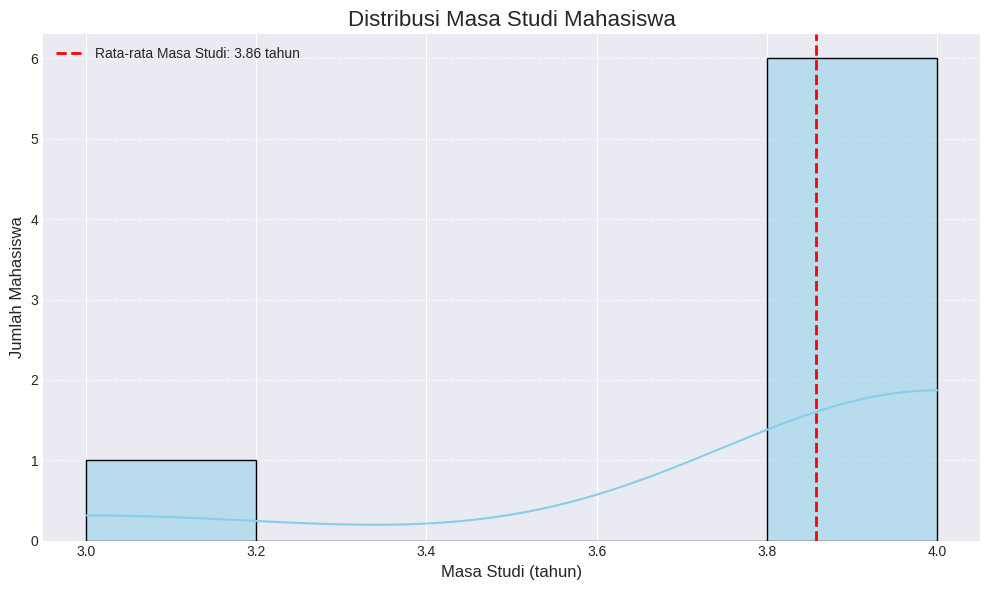

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Calculate mean study duration
mean_masa_studi = df_study_duration['masa_studi'].mean()

# Create the histogram
plt.figure(figsize=(10, 6))
sns.histplot(df_study_duration['masa_studi'], bins=5, kde=True, color='skyblue')
plt.axvline(mean_masa_studi, color='red', linestyle='dashed', linewidth=2, label=f'Rata-rata Masa Studi: {mean_masa_studi:.2f} tahun')
plt.title('Distribusi Masa Studi Mahasiswa', fontsize=16)
plt.xlabel('Masa Studi (tahun)', fontsize=12)
plt.ylabel('Jumlah Mahasiswa', fontsize=12)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

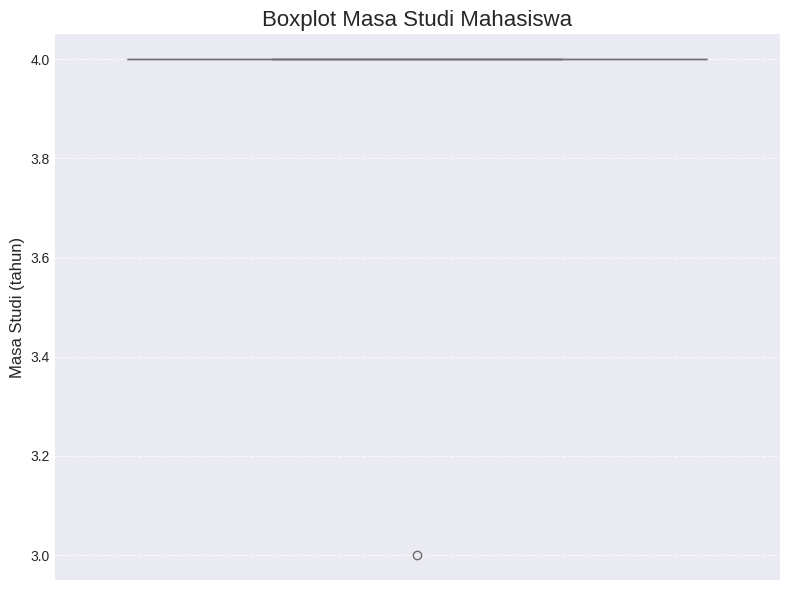

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create the boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(y=df_study_duration['masa_studi'], color='lightcoral', showfliers=True)
plt.title('Boxplot Masa Studi Mahasiswa', fontsize=16)
plt.ylabel('Masa Studi (tahun)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

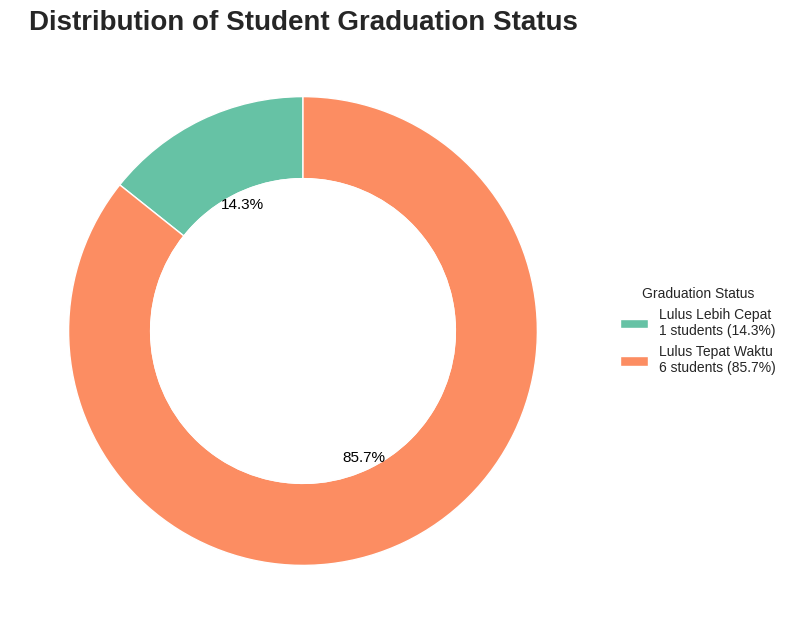

In [ ]:
# ==========================================================
# DONUT CHART OF GRADUATION STATUS
# ==========================================================

import matplotlib.pyplot as plt
import seaborn as sns

# ----------------------------------------------------------
# Data
# ----------------------------------------------------------

labels = df_graduation_status.index.tolist()
sizes = df_graduation_status["Jumlah Mahasiswa"].tolist()
percentages = df_graduation_status["Persentase (%)"].tolist()

# ----------------------------------------------------------
# Remove categories with zero values
# ----------------------------------------------------------

filtered_data = [
    (label, size, percent)
    for label, size, percent
    in zip(labels, sizes, percentages)
    if size > 0
]

labels = [x[0] for x in filtered_data]
sizes = [x[1] for x in filtered_data]
percentages = [x[2] for x in filtered_data]

# ----------------------------------------------------------
# Legend Labels
# ----------------------------------------------------------

legend_labels = [
    f"{label}\n{size} students ({percent:.1f}%)"
    for label, size, percent
    in zip(labels, sizes, percentages)
]

# ----------------------------------------------------------
# Colors
# ----------------------------------------------------------

colors = sns.color_palette("Set2", len(labels))

# ----------------------------------------------------------
# Plot
# ----------------------------------------------------------

fig, ax = plt.subplots(figsize=(8,8))

wedges, texts, autotexts = ax.pie(
    sizes,
    startangle=90,
    colors=colors,
    wedgeprops=dict(
        width=0.35,
        edgecolor="white"
    ),
    autopct=lambda pct: f"{pct:.1f}%"
)

# ----------------------------------------------------------
# Styling
# ----------------------------------------------------------

for autotext in autotexts:
    autotext.set_color("black")
    autotext.set_fontsize(11)

# Donut hole

centre_circle = plt.Circle(
    (0,0),
    0.65,
    color="white"
)

ax.add_artist(centre_circle)

# ----------------------------------------------------------
# Title
# ----------------------------------------------------------

plt.title(
    "Distribution of Student Graduation Status",
    fontsize=20,
    fontweight="bold"
)

# ----------------------------------------------------------
# Legend
# ----------------------------------------------------------

plt.legend(
    wedges,
    legend_labels,
    title="Graduation Status",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5)
)

plt.tight_layout()
plt.show()

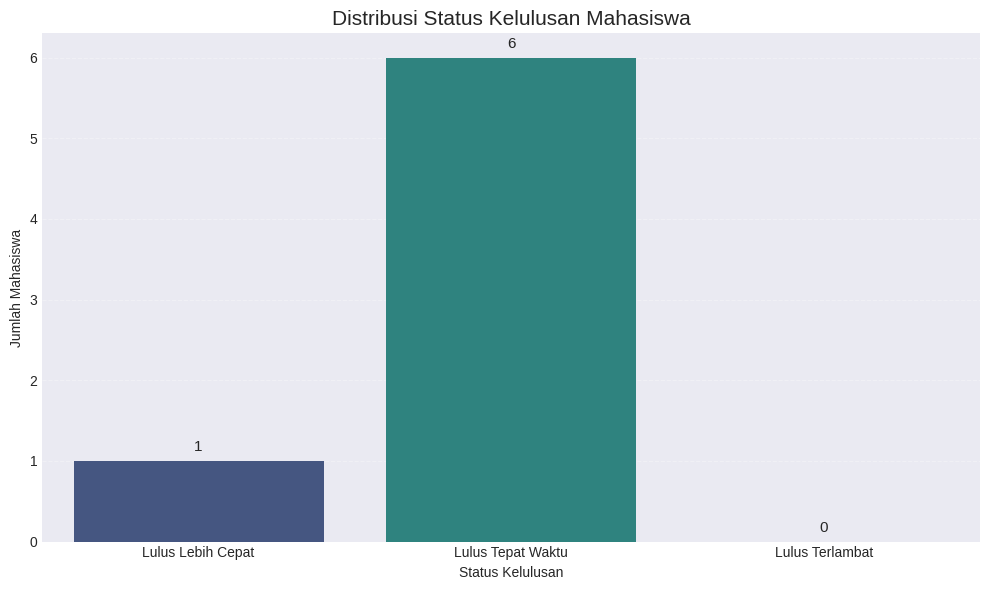

In [ ]:
# ==========================================================
# BAR CHART STATUS KELULUSAN
# ==========================================================

import matplotlib.pyplot as plt
import seaborn as sns

plot_df = df_graduation_status.reset_index()

# nama kolom pertama (status kelulusan)
status_col = plot_df.columns[0]

category_order = [
    "Lulus Lebih Cepat",
    "Lulus Tepat Waktu",
    "Lulus Terlambat"
]

plt.figure(figsize=(10,6))

ax = sns.barplot(
    data=plot_df,
    x=status_col,
    y="Jumlah Mahasiswa",
    order=category_order,
    hue=status_col,
    palette="viridis",
    legend=False
)

for p in ax.patches:

    height = p.get_height()

    ax.annotate(
        f"{int(height)}",
        (p.get_x()+p.get_width()/2, height),
        ha="center",
        va="bottom",
        fontsize=11,
        xytext=(0,5),
        textcoords="offset points"
    )

plt.title("Distribusi Status Kelulusan Mahasiswa", fontsize=15)
plt.xlabel("Status Kelulusan")
plt.ylabel("Jumlah Mahasiswa")
plt.grid(axis="y", linestyle="--", alpha=0.3)

plt.tight_layout()
plt.show()

## SUMMARIZE

In [ ]:
# ==========================================================
# SUMMARY EVALUASI MASA STUDI
# ==========================================================

import pandas as pd
import numpy as np
from IPython.display import display

summary_study_duration = {}

# ==========================================================
# STATISTICS
# ==========================================================

statistics = pd.DataFrame({

    "Metric":[

        "Jumlah Mahasiswa",
        "Rata-rata Masa Studi (Tahun)",
        "Median Masa Studi (Tahun)",
        "Minimum Masa Studi (Tahun)",
        "Maksimum Masa Studi (Tahun)",
        "Standar Deviasi"

    ],

    "Value":[

        len(df_study_duration),

        round(df_study_duration["masa_studi"].mean(),2),

        round(df_study_duration["masa_studi"].median(),2),

        round(df_study_duration["masa_studi"].min(),2),

        round(df_study_duration["masa_studi"].max(),2),

        round(df_study_duration["masa_studi"].std(),2)

    ]

})

summary_study_duration["statistics"] = statistics

# ==========================================================
# DISTRIBUSI STATUS KELULUSAN
# ==========================================================

status_distribution = df_graduation_status.copy()

summary_study_duration["status_distribution"] = status_distribution

# ==========================================================
# TOP & BOTTOM MASA STUDI
# ==========================================================

top5_fastest = (

    df_study_duration

    .sort_values("masa_studi")

    [[

        "nim",
        "nama",
        "masa_studi",
        "status_kelulusan"

    ]]

    .head(5)

)

bottom5_longest = (

    df_study_duration

    .sort_values(

        "masa_studi",

        ascending=False

    )

    [[

        "nim",
        "nama",
        "masa_studi",
        "status_kelulusan"

    ]]

    .head(5)

)

summary_study_duration["top5_fastest"] = top5_fastest

summary_study_duration["bottom5_longest"] = bottom5_longest

# ==========================================================
# INSIGHT
# ==========================================================

tepat = status_distribution.loc[
    "Lulus Tepat Waktu",
    "Persentase (%)"
] if "Lulus Tepat Waktu" in status_distribution.index else 0

lebih_cepat = status_distribution.loc[
    "Lulus Lebih Cepat",
    "Persentase (%)"
] if "Lulus Lebih Cepat" in status_distribution.index else 0

terlambat = status_distribution.loc[
    "Lulus Terlambat",
    "Persentase (%)"
] if "Lulus Terlambat" in status_distribution.index else 0

insight = [

    f"Sebanyak {tepat:.2f}% mahasiswa lulus tepat waktu.",

    f"Sebanyak {lebih_cepat:.2f}% mahasiswa menyelesaikan studi lebih cepat dari target.",

    f"Sebanyak {terlambat:.2f}% mahasiswa menyelesaikan studi melebihi target waktu.",

    f"Rata-rata masa studi mahasiswa adalah {df_study_duration['masa_studi'].mean():.2f} tahun.",

]

avg_study_duration = df_study_duration["masa_studi"].mean()

if avg_study_duration <= 4:

    insight.append(

        "Rata-rata masa studi menunjukkan bahwa mahasiswa secara umum mampu menyelesaikan pendidikan sesuai dengan target waktu yang ditetapkan oleh program studi."

    )

else:

    insight.append(

        "Rata-rata masa studi melebihi target waktu yang ditetapkan sehingga diperlukan evaluasi terhadap proses pembelajaran, pembimbingan akademik, serta faktor-faktor yang berpotensi memperpanjang masa studi mahasiswa."

    )

summary_study_duration["insight"] = insight

# ==========================================================
# DISPLAY
# ==========================================================

print("="*100)
print("SUMMARY EVALUASI MASA STUDI")
print("="*100)

print("\nSTATISTICS")
display(summary_study_duration["statistics"])

print("\nSTATUS KELULUSAN")
display(summary_study_duration["status_distribution"])

print("\nTOP 5 MASA STUDI TERCEPAT")
display(summary_study_duration["top5_fastest"])

print("\nTOP 5 MASA STUDI TERLAMA")
display(summary_study_duration["bottom5_longest"])

print("\nINSIGHT")

for i, item in enumerate(summary_study_duration["insight"],1):

    print(f"{i}. {item}")

SUMMARY EVALUASI MASA STUDI

STATISTICS


,Metric,Value
0,Jumlah Mahasiswa,7.00
1,Rata-rata Masa Studi (Tahun),3.86
2,Median Masa Studi (Tahun),4.00
3,Minimum Masa Studi (Tahun),3.00
4,Maksimum Masa Studi (Tahun),4.00
5,Standar Deviasi,0.38



STATUS KELULUSAN


,Jumlah Mahasiswa,Persentase (%)
status_kelulusan,,
Lulus Lebih Cepat,1,14.29
Lulus Tepat Waktu,6,85.71
Lulus Terlambat,0,0.00



TOP 5 MASA STUDI TERCEPAT


,nim,nama,masa_studi,status_kelulusan
6,1202921003,Mahasiswa 7,3,Lulus Lebih Cepat
0,1202001004,Mahasiswa 1,4,Lulus Tepat Waktu
2,1202001007,Mahasiswa 3,4,Lulus Tepat Waktu
1,1202001005,Mahasiswa 2,4,Lulus Tepat Waktu
3,1202001010,Mahasiswa 4,4,Lulus Tepat Waktu



TOP 5 MASA STUDI TERLAMA


,nim,nama,masa_studi,status_kelulusan
0,1202001004,Mahasiswa 1,4,Lulus Tepat Waktu
1,1202001005,Mahasiswa 2,4,Lulus Tepat Waktu
2,1202001007,Mahasiswa 3,4,Lulus Tepat Waktu
3,1202001010,Mahasiswa 4,4,Lulus Tepat Waktu
4,1202001025,Mahasiswa 5,4,Lulus Tepat Waktu



INSIGHT
1. Sebanyak 85.71% mahasiswa lulus tepat waktu.
2. Sebanyak 14.29% mahasiswa menyelesaikan studi lebih cepat dari target.
3. Sebanyak 0.00% mahasiswa menyelesaikan studi melebihi target waktu.
4. Rata-rata masa studi mahasiswa adalah 3.86 tahun.
5. Rata-rata masa studi menunjukkan bahwa mahasiswa secara umum mampu menyelesaikan pendidikan sesuai dengan target waktu yang ditetapkan oleh program studi.


## NARASI HASIL ANALISIS

In [ ]:
# ==========================================================
# GENERATE NARASI HASIL ANALISIS
# MASA STUDI
# ==========================================================

from IPython.display import Markdown, display

narasi = "# HASIL ANALISIS MASA STUDI\n"

# ==========================================================
# Mengambil Statistik
# ==========================================================

stats = summary_study_duration["statistics"]

jumlah = stats.loc[
    stats["Metric"]=="Jumlah Mahasiswa",
    "Value"
].iloc[0]

rata = stats.loc[
    stats["Metric"]=="Rata-rata Masa Studi (Tahun)",
    "Value"
].iloc[0]

median = stats.loc[
    stats["Metric"]=="Median Masa Studi (Tahun)",
    "Value"
].iloc[0]

minimum = stats.loc[
    stats["Metric"]=="Minimum Masa Studi (Tahun)",
    "Value"
].iloc[0]

maksimum = stats.loc[
    stats["Metric"]=="Maksimum Masa Studi (Tahun)",
    "Value"
].iloc[0]

std = stats.loc[
    stats["Metric"]=="Standar Deviasi",
    "Value"
].iloc[0]

# ==========================================================
# Distribusi Status Kelulusan
# ==========================================================

status = summary_study_duration["status_distribution"]

lebih_cepat = (
    status.loc["Lulus Lebih Cepat","Persentase (%)"]
    if "Lulus Lebih Cepat" in status.index else 0
)

tepat = (
    status.loc["Lulus Tepat Waktu","Persentase (%)"]
    if "Lulus Tepat Waktu" in status.index else 0
)

terlambat = (
    status.loc["Lulus Terlambat","Persentase (%)"]
    if "Lulus Terlambat" in status.index else 0
)

# ==========================================================
# Narasi
# ==========================================================

narasi += "## Analisis Masa Studi Mahasiswa\n\n"

narasi += f"""

Evaluasi masa studi dilakukan terhadap **{int(jumlah)} mahasiswa** untuk
mengetahui efektivitas penyelesaian studi berdasarkan lama masa studi
serta status kelulusan mahasiswa.

Hasil analisis menunjukkan bahwa rata-rata masa studi mahasiswa adalah
**{rata:.2f} tahun**, dengan median **{median:.2f} tahun**.
Masa studi tercepat tercatat selama **{minimum:.2f} tahun**, sedangkan
masa studi terlama mencapai **{maksimum:.2f} tahun**.
Nilai standar deviasi sebesar **{std:.2f} tahun** menunjukkan tingkat
variasi masa studi antar mahasiswa.

Berdasarkan status kelulusan, sebanyak **{lebih_cepat:.2f}%**
mahasiswa berhasil menyelesaikan studi lebih cepat dari target,
**{tepat:.2f}%** mahasiswa lulus tepat waktu, dan
**{terlambat:.2f}%** mahasiswa menyelesaikan studi melebihi target
waktu yang telah ditetapkan.

Persentase kelulusan tepat waktu memberikan gambaran mengenai
kemampuan program studi dalam memfasilitasi penyelesaian studi sesuai
dengan kurikulum yang telah dirancang. Di sisi lain, keberadaan
mahasiswa yang lulus lebih lambat menunjukkan bahwa masih terdapat
faktor-faktor yang memengaruhi penyelesaian studi, baik yang berasal
dari proses akademik maupun faktor individual mahasiswa.

"""

# ==========================================================
# Kondisi Masa Studi
# ==========================================================

if rata <= 4:

    narasi += """

Kondisi tersebut menunjukkan bahwa rata-rata masa studi mahasiswa telah
sesuai dengan target penyelesaian studi yang ditetapkan, yaitu maksimal
empat tahun. Hal ini mengindikasikan bahwa secara umum proses
pembelajaran, pembimbingan akademik, serta penyelenggaraan kurikulum
telah mendukung mahasiswa dalam menyelesaikan studi secara tepat waktu.

"""

else:

    narasi += """

Kondisi tersebut menunjukkan bahwa rata-rata masa studi mahasiswa masih
melebihi target penyelesaian studi yang ditetapkan. Hal ini
mengindikasikan bahwa masih terdapat faktor-faktor yang memengaruhi
keterlambatan penyelesaian studi, sehingga program studi perlu
melakukan evaluasi terhadap proses akademik, pembimbingan mahasiswa,
serta mekanisme monitoring kemajuan studi agar penyelesaian studi dapat
lebih optimal.

"""

# ==========================================================
# DISPLAY
# ==========================================================

display(Markdown(narasi))

print("="*100)
print("Narasi berhasil dibuat.")
print("="*100)

# HASIL ANALISIS MASA STUDI
## Analisis Masa Studi Mahasiswa



Evaluasi masa studi dilakukan terhadap **7 mahasiswa** untuk
mengetahui efektivitas penyelesaian studi berdasarkan lama masa studi
serta status kelulusan mahasiswa.

Hasil analisis menunjukkan bahwa rata-rata masa studi mahasiswa adalah
**3.86 tahun**, dengan median **4.00 tahun**.
Masa studi tercepat tercatat selama **3.00 tahun**, sedangkan
masa studi terlama mencapai **4.00 tahun**.
Nilai standar deviasi sebesar **0.38 tahun** menunjukkan tingkat
variasi masa studi antar mahasiswa.

Berdasarkan status kelulusan, sebanyak **14.29%**
mahasiswa berhasil menyelesaikan studi lebih cepat dari target,
**85.71%** mahasiswa lulus tepat waktu, dan
**0.00%** mahasiswa menyelesaikan studi melebihi target
waktu yang telah ditetapkan.

Persentase kelulusan tepat waktu memberikan gambaran mengenai
kemampuan program studi dalam memfasilitasi penyelesaian studi sesuai
dengan kurikulum yang telah dirancang. Di sisi lain, keberadaan
mahasiswa yang lulus lebih lambat menunjukkan bahwa masih terdapat
faktor-faktor yang memengaruhi penyelesaian studi, baik yang berasal
dari proses akademik maupun faktor individual mahasiswa.



Kondisi tersebut menunjukkan bahwa rata-rata masa studi mahasiswa telah
sesuai dengan target penyelesaian studi yang ditetapkan, yaitu maksimal
empat tahun. Hal ini mengindikasikan bahwa secara umum proses
pembelajaran, pembimbingan akademik, serta penyelenggaraan kurikulum
telah mendukung mahasiswa dalam menyelesaikan studi secara tepat waktu.



Narasi berhasil dibuat.


## REKOMENDASI

In [ ]:
# ==========================================================
# HELPER FUNCTION - REKOMENDASI MASA STUDI
# ==========================================================

from IPython.display import Markdown, display

def graduation_recommendation(avg_study_duration):

    if avg_study_duration <= 4:

        return (

            "Rata-rata masa studi mahasiswa telah sesuai dengan target "
            "penyelesaian studi yang ditetapkan. Program studi disarankan "
            "untuk mempertahankan kondisi tersebut melalui monitoring "
            "akademik secara berkala, pendampingan mahasiswa, serta "
            "evaluasi kurikulum agar penyelesaian studi tetap berjalan "
            "sesuai target waktu."

        )

    else:

        return (

            "Rata-rata masa studi mahasiswa masih melebihi target "
            "penyelesaian studi. Program studi disarankan melakukan "
            "evaluasi terhadap faktor-faktor yang menyebabkan "
            "keterlambatan studi, memperkuat sistem monitoring akademik, "
            "meningkatkan efektivitas pembimbingan akademik maupun tugas "
            "akhir, serta memberikan pendampingan kepada mahasiswa yang "
            "berpotensi mengalami keterlambatan."

        )

In [ ]:
# ==========================================================
# GENERATE REKOMENDASI
# MASA STUDI
# ==========================================================

recommendation = "# REKOMENDASI MASA STUDI\n"

# ==========================================================
# Mengambil Persentase Status Kelulusan
# ==========================================================

status = summary_study_duration["status_distribution"]

# ==========================================================
# Mengambil Statistik
# ==========================================================

avg_study_duration = summary_study_duration["statistics"].loc[
    summary_study_duration["statistics"]["Metric"] ==
    "Rata-rata Masa Studi (Tahun)",
    "Value"
].iloc[0]

terlambat = (
    status.loc["Lulus Terlambat","Persentase (%)"]
    if "Lulus Terlambat" in status.index else 0
)

# ==========================================================
# Rekomendasi Berdasarkan Hasil Evaluasi
# ==========================================================

recommendation += "\n\n## Evaluasi Masa Studi\n\n"

recommendation += graduation_recommendation(avg_study_duration)

# ==========================================================
# Mahasiswa Lulus Terlambat
# ==========================================================

if terlambat > 0:

    recommendation += "\n\n## Mahasiswa yang Menyelesaikan Studi Terlambat\n\n"

    recommendation += (

        f"Sebanyak **{terlambat:.2f}%** mahasiswa menyelesaikan studi "
        "melebihi target waktu. Program studi disarankan melakukan "
        "identifikasi terhadap penyebab keterlambatan, seperti kendala "
        "penyelesaian mata kuliah, proses tugas akhir, maupun faktor "
        "akademik lainnya. Hasil identifikasi tersebut dapat digunakan "
        "sebagai dasar penyusunan strategi pendampingan akademik yang "
        "lebih efektif untuk mencegah keterlambatan pada angkatan "
        "berikutnya."

    )

# ==========================================================
# Rekomendasi Umum
# ==========================================================

recommendation += "\n\n## Rekomendasi Umum\n\n"

if avg_study_duration <= 4:

    recommendation += (

        "Secara keseluruhan, masa studi mahasiswa telah sesuai dengan "
        "target penyelesaian studi. Program studi disarankan untuk "
        "mempertahankan efektivitas sistem monitoring akademik, "
        "pendampingan mahasiswa, serta proses pembimbingan tugas akhir "
        "agar capaian tersebut dapat dipertahankan sebagai bagian dari "
        "Continuous Quality Improvement (CQI)."

    )

else:

    recommendation += (

        "Secara keseluruhan, masa studi mahasiswa masih memerlukan "
        "perbaikan karena rata-rata penyelesaian studi melebihi target "
        "yang ditetapkan. Program studi disarankan memperkuat monitoring "
        "kemajuan studi, meningkatkan efektivitas pembimbingan akademik "
        "dan tugas akhir, serta melakukan evaluasi terhadap faktor-faktor "
        "yang menyebabkan keterlambatan penyelesaian studi sebagai bagian "
        "dari Continuous Quality Improvement (CQI)."

    )

# ==========================================================
# DISPLAY
# ==========================================================

display(Markdown(recommendation))

print("="*100)
print("Rekomendasi berhasil dibuat.")
print("="*100)

# REKOMENDASI MASA STUDI


## Evaluasi Masa Studi

Rata-rata masa studi mahasiswa telah sesuai dengan target penyelesaian studi yang ditetapkan. Program studi disarankan untuk mempertahankan kondisi tersebut melalui monitoring akademik secara berkala, pendampingan mahasiswa, serta evaluasi kurikulum agar penyelesaian studi tetap berjalan sesuai target waktu.

## Rekomendasi Umum

Secara keseluruhan, masa studi mahasiswa telah sesuai dengan target penyelesaian studi. Program studi disarankan untuk mempertahankan efektivitas sistem monitoring akademik, pendampingan mahasiswa, serta proses pembimbingan tugas akhir agar capaian tersebut dapat dipertahankan sebagai bagian dari Continuous Quality Improvement (CQI).

Rekomendasi berhasil dibuat.


# SAVE RESULT

In [ ]:
import os
import pandas as pd

# Define the base directory for saving summary results in Google Drive
SUMMARY_OUTPUT_DIR = '/content/drive/MyDrive/TA_Jennifer Felicia/SUMMARY_RESULTS_2020/'
os.makedirs(SUMMARY_OUTPUT_DIR, exist_ok=True)

print(f"Saving all DataFrame contents from summary variables to: {SUMMARY_OUTPUT_DIR}")

# List of main summary dictionary variables
main_summary_variables = {
    "summary_profile_final": summary_profile_final,
    "summary_cpl_final": summary_cpl_final,
    "summary_assessment_final": summary_assessment_final,
    "summary_learning_final": summary_learning_final,
    "summary_study_duration": summary_study_duration
}

for main_var_name, summary_dict in main_summary_variables.items():
    if isinstance(summary_dict, dict):
        print(f"\nProcessing dictionary: {main_var_name}")
        for key, value in summary_dict.items():
            if isinstance(value, (pd.DataFrame, pd.Series)):
                # Convert Series to DataFrame for consistent saving if it's not already one
                df_to_save = value.to_frame() if isinstance(value, pd.Series) else value
                output_path = os.path.join(SUMMARY_OUTPUT_DIR, f"{main_var_name}_{key}.csv")
                df_to_save.to_csv(output_path, index=False, encoding='utf-8-sig')
                print(f"  Saved '{key}' from '{main_var_name}' to: {output_path}")
            else:
                print(f"  Skipping non-DataFrame item '{key}' (type: {type(value).__name__}).")
    elif isinstance(summary_dict, (pd.DataFrame, pd.Series)):
        # Handle cases where the main summary variable itself is directly a DataFrame/Series
        df_to_save = summary_dict.to_frame() if isinstance(summary_dict, pd.Series) else summary_dict
        output_path = os.path.join(SUMMARY_OUTPUT_DIR, f"{main_var_name}.csv")
        df_to_save.to_csv(output_path, index=False, encoding='utf-8-sig')
        print(f"Saved main DataFrame '{main_var_name}' to: {output_path}")
    else:
        print(f"Warning: '{main_var_name}' is not a dictionary or DataFrame. Skipping.")

print("\nAll requested DataFrame contents from summary variables have been processed.")

Saving all DataFrame contents from summary variables to: /content/drive/MyDrive/TA_Jennifer Felicia/SUMMARY_RESULTS_2020/

Processing dictionary: summary_profile_final
  Saved 'summary' from 'summary_profile_final' to: /content/drive/MyDrive/TA_Jennifer Felicia/SUMMARY_RESULTS_2020/summary_profile_final_summary.csv
  Skipping non-DataFrame item 'overall_score' (type: float64).
  Skipping non-DataFrame item 'overall_condition' (type: str).
  Skipping non-DataFrame item 'insight' (type: list).

Processing dictionary: summary_cpl_final
  Saved 'summary' from 'summary_cpl_final' to: /content/drive/MyDrive/TA_Jennifer Felicia/SUMMARY_RESULTS_2020/summary_cpl_final_summary.csv
  Saved 'best_mapping' from 'summary_cpl_final' to: /content/drive/MyDrive/TA_Jennifer Felicia/SUMMARY_RESULTS_2020/summary_cpl_final_best_mapping.csv
  Saved 'worst_mapping' from 'summary_cpl_final' to: /content/drive/MyDrive/TA_Jennifer Felicia/SUMMARY_RESULTS_2020/summary_cpl_final_worst_mapping.csv
  Saved 'validat